## Approach Plan
1. Data Exploration
2. Create task dataset
3. Make MOO
4. RL - CL
5. RL - Dedicated Model
6. Comparison

# Load Data

In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

In [ ]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive')

# Paths to your datasets
task_data_path = '/content/drive/MyDrive/Skripsi/Resources/Datasets/fixed_data_task.csv'  # Update this if the filename changes
employee_data_path = '/content/drive/MyDrive/Skripsi/Resources/Datasets/fixed_data_employee.csv'

# Load the datasets
df_tasks_original = pd.read_csv(task_data_path)
df_employees_original = pd.read_csv(employee_data_path)

# Extract skill columns from tasks and employees as lists
# New task structure: task_name, epic, story_points, then skills (cols 3 onward)
task_skill_cols = [col for col in df_tasks_original.columns[3:]]  # Skills start after task_name, epic, story_points
employee_skill_cols = [col for col in df_employees_original.columns[2:]]  # Skills from col 2 onward

# Find common skills and convert to list
common_skills = list(set(task_skill_cols).intersection(employee_skill_cols))

# Filter dataframes to common skills plus key columns
df_tasks = df_tasks_original[['task_id', 'story_points'] + common_skills]
df_employees = df_employees_original[['employee_id', 'Role'] + common_skills]

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Data Exploration

## Task Dataset

Mounted at /content/drive


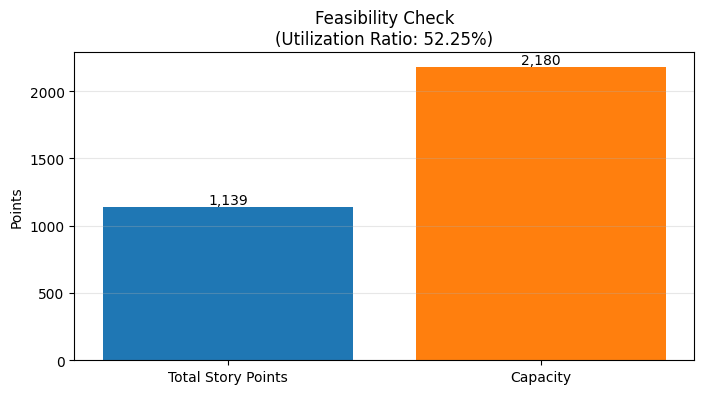

Total Story Points: 1139, Capacity: 2180, Ratio: 0.52


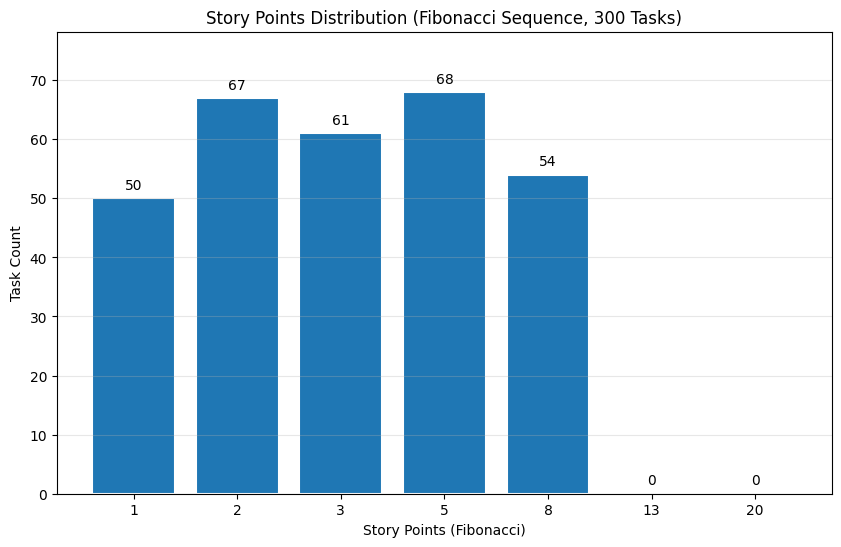

Fibonacci Story Points Counts:
 story_points
1     50
2     67
3     61
5     68
8     54
13     0
20     0
Name: count, dtype: int64
Story Points Bins:
 story_points
(-0.001, 5.0]    246
(5.0, 10.0]       54
(10.0, 15.0]       0
(15.0, 20.0]       0
Name: count, dtype: int64
Employee Sparsity: 0.01%, Task Sparsity: 16.73%
Mean Employee Skill (non-zero): 2.86
Mean Task Skill (non-zero): 3.01
Theoretical WED Range: Worst=0.0270, Best=1.0000


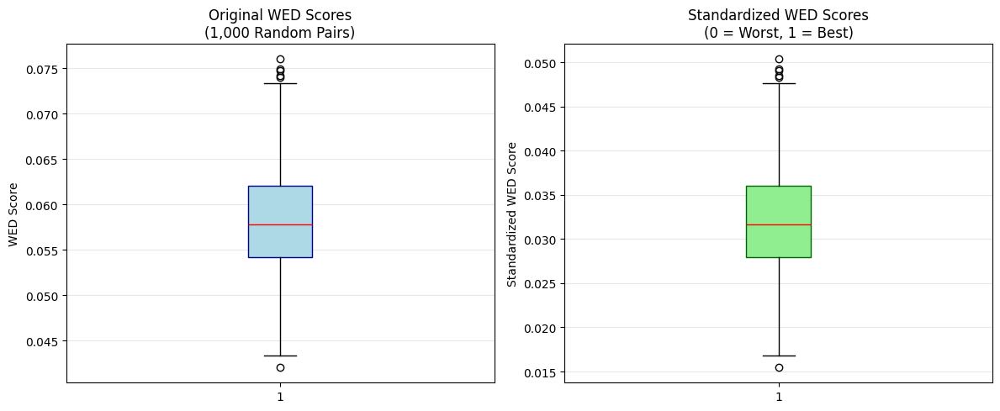

Original WED Stats: Mean=0.058, Median=0.058, Std=0.006

Boxplot Boundaries for Original WED Scores (1,000 Random Pairs):
Minimum (Lower Whisker): 0.0424
Q1 (25th Percentile): 0.0542
Median (50th Percentile): 0.0578
Q3 (75th Percentile): 0.0621
Maximum (Upper Whisker): 0.0739
Outliers: [np.float64(0.0747703149285708), np.float64(0.07497371778303324), np.float64(0.0760090745847469), np.float64(0.07400696716623192), np.float64(0.04204951921620088), np.float64(0.07417110988328064)]
Standardized WED Stats: Mean=0.032, Median=0.032, Std=0.006

Boxplot Boundaries for Standardized WED Scores (1,000 Random Pairs):
Minimum (Lower Whisker): 0.0158
Q1 (25th Percentile): 0.0280
Median (50th Percentile): 0.0317
Q3 (75th Percentile): 0.0361
Maximum (Upper Whisker): 0.0482
Outliers: [np.float64(0.04910906053544436), np.float64(0.04931810477007096), np.float64(0.0503821772028383), np.float64(0.04832454131542761), np.float64(0.015480753232959579), np.float64(0.04849323653234412)]
Project Stats:
       

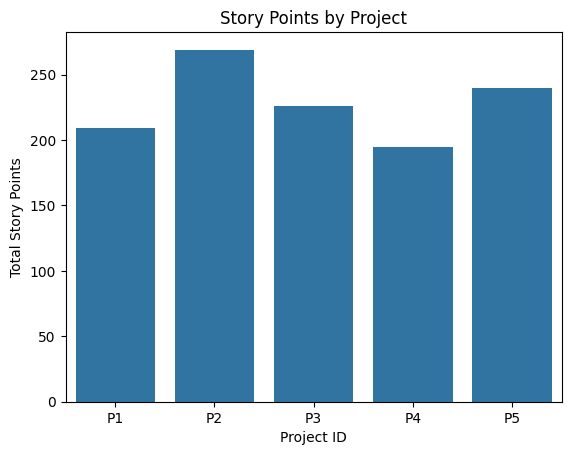

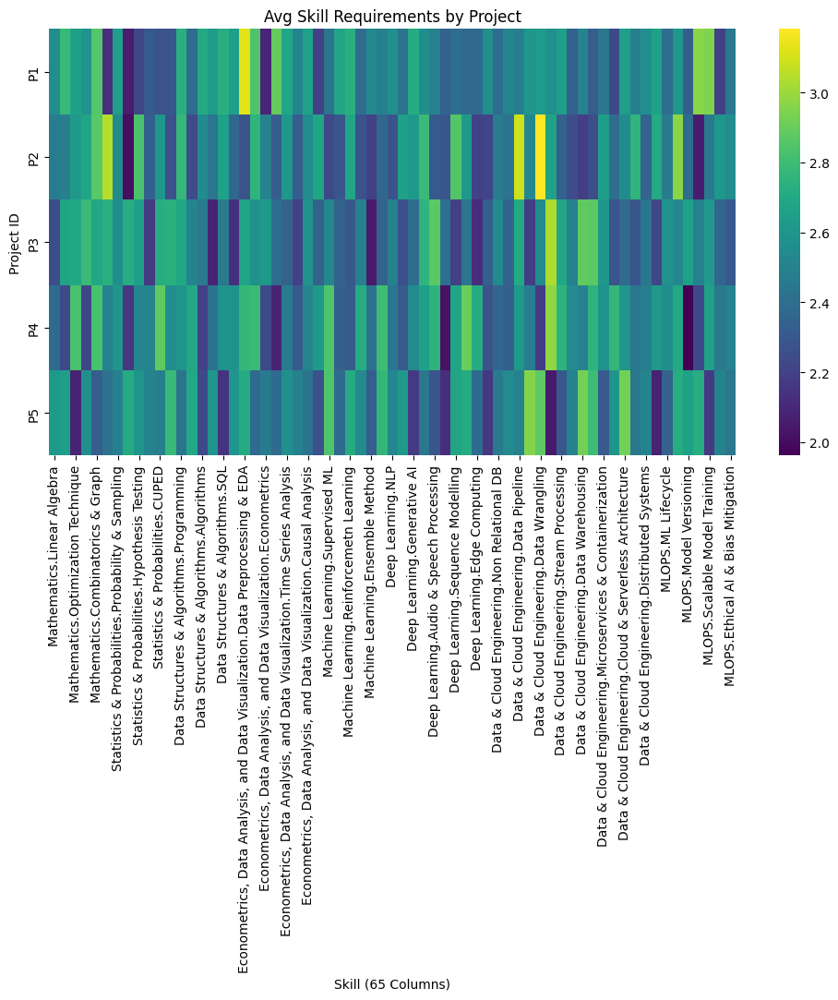


Average Skill Requirements by Project (Tabular Format for LLM Processing):
            Mathematics.Linear Algebra  Mathematics.Differential Equations  Mathematics.Optimization Technique  Mathematics.Calculus  Mathematics.Combinatorics & Graph  Statistics & Probabilities.Statistics  Statistics & Probabilities.Probability & Sampling  Statistics & Probabilities.Bayessian Method  Statistics & Probabilities.Hypothesis Testing  Statistics & Probabilities.A/B Testing  Statistics & Probabilities.CUPED  Data Structures & Algorithms.Complexity Analysis  Data Structures & Algorithms.Programming  Data Structures & Algorithms.Data Structures  Data Structures & Algorithms.Algorithms  Data Structures & Algorithms.Advanced Algorithms  Data Structures & Algorithms.SQL  Data Structures & Algorithms.Shell / Bash Scripting  Econometrics, Data Analysis, and Data Visualization.Data Preprocessing & EDA  Econometrics, Data Analysis, and Data Visualization.Data Viz & Storytelling  Econometrics, Data Analysis,

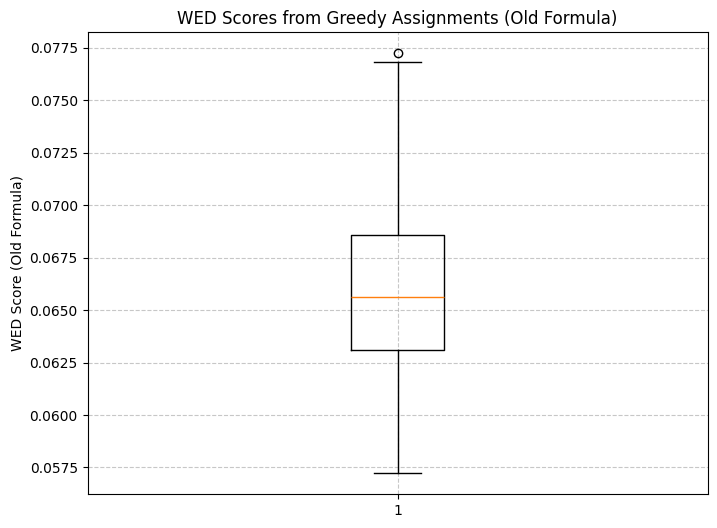

Original WED Scores (Old Formula): Mean=0.066, Median=0.066, Std=0.004


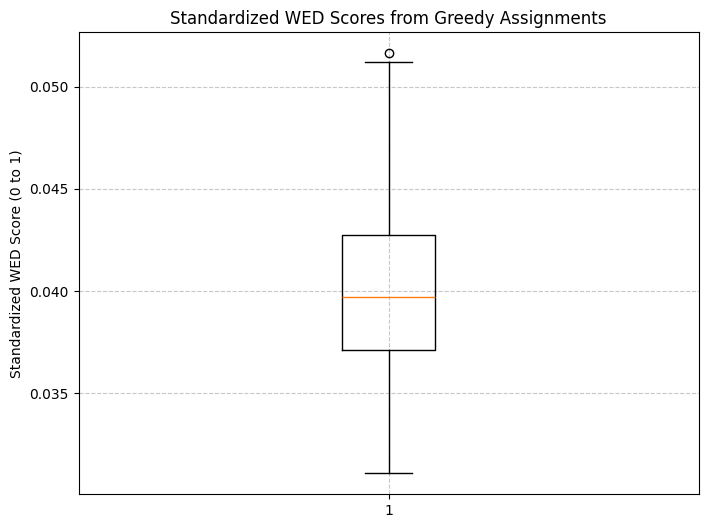

Standardized WED Scores: Mean=0.040, Median=0.040, Std=0.004

Tabel Alokasi Story Points per Karyawan - Pendekatan Greedy:
            Greedy
Talent 1        19
Talent 2        20
Talent 3        20
Talent 4        20
Talent 5         0
...            ...
Talent 107       0
Talent 108      20
Talent 109       0
Talent 110      20
Talent 112      20

[109 rows x 1 columns]


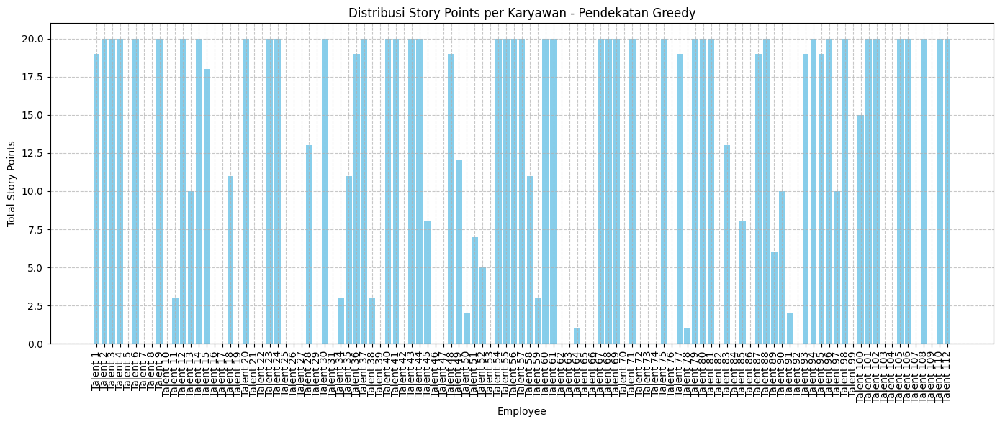


Tabel Standar Deviasi Beban Kerja (Story Points) - Pendekatan Greedy:
        Standard Deviation
Greedy            9.088238


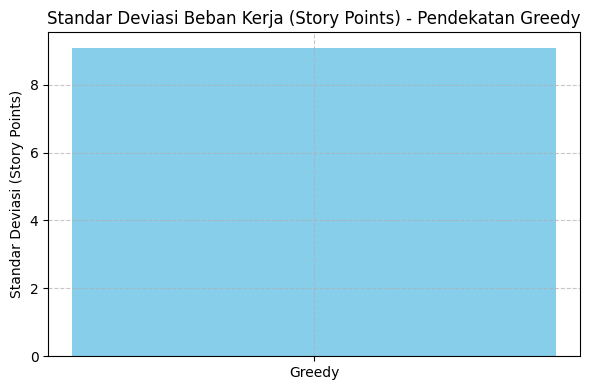

Standar Deviasi Beban Kerja (Greedy): 9.09


In [ ]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive', force_remount=True)

# Paths
EMP_PATH = '/content/drive/MyDrive/Skripsi/Resources/Datasets/fixed_data_employee.csv'
TASK_PATH = '/content/drive/MyDrive/Skripsi/Resources/Datasets/fixed_data_task.csv'

# Load
emp_df = pd.read_csv(EMP_PATH, index_col='employee_id').fillna(0).drop(columns=['No', 'Role'], errors='ignore')
task_df = pd.read_csv(TASK_PATH, index_col='task_id').fillna(0)
skill_cols = [col for col in task_df.columns if col not in ['project_id', 'story_points']]  # 65 skills
assert len(skill_cols) == 65, "Skill column count mismatch"
assert emp_df.shape[0] == 109 and task_df.shape[0] == 300, "Row count mismatch"

# 1. Feasibility (with visualization)
total_sp = task_df['story_points'].sum()
capacity = 109 * 20
ratio = total_sp/capacity

# New visualization for feasibility metrics
plt.figure(figsize=(8, 4))
bars = plt.bar(['Total Story Points', 'Capacity'], [total_sp, capacity], color=['#1f77b4', '#ff7f0e'])
plt.title(f"Feasibility Check\n(Utilization Ratio: {ratio:.2%})")
plt.ylabel("Points")
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2., height,
             f'{height:,}',
             ha='center', va='bottom')
plt.grid(axis='y', alpha=0.3)
plt.show()

print(f"Total Story Points: {total_sp}, Capacity: {capacity}, Ratio: {total_sp/capacity:.2f}")

# 2. Story Points (Fibonacci Sequence) - with adjusted spacing
fibonacci_sp = [1, 2, 3, 5, 8, 13, 20]
sp_counts = task_df['story_points'].value_counts().reindex(fibonacci_sp, fill_value=0)

plt.figure(figsize=(10, 6))
plt.bar(range(len(sp_counts)), sp_counts.values, width=0.8,
        edgecolor='white', linewidth=1.5)
plt.title("Story Points Distribution (Fibonacci Sequence, 300 Tasks)")
plt.xlabel("Story Points (Fibonacci)")
plt.ylabel("Task Count")

# Add value labels on top of bars
for i, v in enumerate(sp_counts.values):
    plt.text(i, v + 1, str(v), ha='center', va='bottom')

plt.xticks(range(len(sp_counts)), sp_counts.index)
plt.ylim(0, sp_counts.max() * 1.15)  # Add headroom for labels
plt.grid(axis='y', alpha=0.3)
plt.show()

print("Fibonacci Story Points Counts:\n", sp_counts)

# Binning for additional insight
bins = pd.cut(task_df['story_points'], bins=[0, 5, 10, 15, 20], include_lowest=True)
print("Story Points Bins:\n", bins.value_counts().sort_index())

# 3. Skills
emp_skills = emp_df[skill_cols]
task_skills = task_df[skill_cols]
emp_sparsity = (emp_skills == 0).mean().mean()
task_sparsity = (task_skills == 0).mean().mean()
print(f"Employee Sparsity: {emp_sparsity:.2%}, Task Sparsity: {task_sparsity:.2%}")
print(f"Mean Employee Skill (non-zero): {emp_skills[emp_skills > 0].mean().mean():.2f}")
print(f"Mean Task Skill (non-zero): {task_skills[task_skills > 0].mean().mean():.2f}")

# WED calculation (with standardization and visualization)
def calculate_wed(emp, task, alpha=0.05):
    weights = 1 / (1 + alpha * np.maximum(0, emp - task))
    wed = np.sqrt(np.sum(weights * (emp - task) ** 2))
    return 1 / (1 + wed)  # Convert distance to similarity score

# Theoretical worst and best WED scores
alpha = 0.05  # Same as in calculate_wed function
weights_worst = 1 / (1 + alpha * 5)  # emp=0, task=5, max difference
d_max = np.sqrt(np.sum(weights_worst * (0 - 5) ** 2 * 65))  # Max distance
wed_worst = 1 / (1 + d_max)  # Theoretical worst WED score
wed_best = 1 / (1 + 0)  # Theoretical best WED score (distance = 0)

print(f"Theoretical WED Range: Worst={wed_worst:.4f}, Best={wed_best:.4f}")

# Sample WED (1,000 pairs)
np.random.seed(42)
emp_idx = np.random.choice(109, 1000, replace=True)
task_idx = np.random.choice(300, 1000, replace=True)
wed_sample = [calculate_wed(emp_skills.iloc[i], task_skills.iloc[j])
              for i, j in zip(emp_idx, task_idx)]

# Standardize WED scores
wed_sample_std = [(wed - wed_worst) / (wed_best - wed_worst) for wed in wed_sample]

# Compute boxplot boundaries for 1,000 random pairs
def compute_boxplot_boundaries(data, label):
    q1 = np.percentile(data, 25)
    q3 = np.percentile(data, 75)
    iqr = q3 - q1
    lower_whisker = max(min(data), q1 - 1.5 * iqr)
    upper_whisker = min(max(data), q3 + 1.5 * iqr)
    outliers = [x for x in data if x < lower_whisker or x > upper_whisker]
    print(f"\nBoxplot Boundaries for {label}:")
    print(f"Minimum (Lower Whisker): {lower_whisker:.4f}")
    print(f"Q1 (25th Percentile): {q1:.4f}")
    print(f"Median (50th Percentile): {np.median(data):.4f}")
    print(f"Q3 (75th Percentile): {q3:.4f}")
    print(f"Maximum (Upper Whisker): {upper_whisker:.4f}")
    print(f"Outliers: {outliers}")

# Visualization for 1,000 random pairs
plt.figure(figsize=(12, 5))

# Original WED scores
plt.subplot(1, 2, 1)
plt.boxplot(wed_sample, vert=True, patch_artist=True,
            boxprops=dict(facecolor='lightblue', color='darkblue'),
            medianprops=dict(color='red'))
plt.title("Original WED Scores\n(1,000 Random Pairs)")
plt.ylabel("WED Score")
plt.grid(axis='y', alpha=0.3)

# Standardized WED scores
plt.subplot(1, 2, 2)
plt.boxplot(wed_sample_std, vert=True, patch_artist=True,
            boxprops=dict(facecolor='lightgreen', color='darkgreen'),
            medianprops=dict(color='red'))
plt.title("Standardized WED Scores\n(0 = Worst, 1 = Best)")
plt.ylabel("Standardized WED Score")
plt.grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.show()

# Print statistics and boundaries for 1,000 random pairs
print(f"Original WED Stats: Mean={np.mean(wed_sample):.3f}, Median={np.median(wed_sample):.3f}, Std={np.std(wed_sample):.3f}")
compute_boxplot_boundaries(wed_sample, "Original WED Scores (1,000 Random Pairs)")
print(f"Standardized WED Stats: Mean={np.mean(wed_sample_std):.3f}, Median={np.median(wed_sample_std):.3f}, Std={np.std(wed_sample_std):.3f}")
compute_boxplot_boundaries(wed_sample_std, "Standardized WED Scores (1,000 Random Pairs)")

# 4. Projects
proj_stats = task_df.groupby('project_id').agg(total_sp=('story_points', 'sum'), task_count=('story_points', 'count'))
print("Project Stats:\n", proj_stats)
sns.barplot(x=proj_stats.index, y=proj_stats['total_sp'])
plt.title("Story Points by Project")
plt.xlabel("Project ID")
plt.ylabel("Total Story Points")
plt.show()
proj_skills = task_df.groupby('project_id')[skill_cols].mean()
plt.figure(figsize=(12, 6))
sns.heatmap(proj_skills, cmap='viridis')
plt.title("Avg Skill Requirements by Project")
plt.xlabel("Skill (65 Columns)")
plt.ylabel("Project ID")
plt.show()

# Tabular output for avg skill requirements by project
print("\nAverage Skill Requirements by Project (Tabular Format for LLM Processing):")
print(proj_skills.to_string())

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import ast
import seaborn as sns

# 5. Greedy Approach with Old WED Formula and Standardization
# WED calculation (old method, without global_max normalization)
def calculate_wed_old(emp, task, alpha=0.05):
    weights = 1 / (1 + alpha * np.maximum(0, emp - task))
    wed = np.sqrt(np.sum(weights * (emp - task) ** 2))
    return 1 / (1 + wed)  # Old normalization method

# Initialize data structures
assignments = {}  # emp_idx -> list of (task_id, project_id, sp, wed_score)
workload = np.zeros(109)

# Initialize assignments dictionary for all employees
for emp_idx in range(109):
    assignments[emp_idx] = []

# Run Greedy with old WED calculation
np.random.seed(42)
for task_idx in np.random.permutation(300):
    task = task_skills.iloc[task_idx]
    sp = task_df['story_points'].iloc[task_idx]
    project_id = task_df['project_id'].iloc[task_idx]
    task_id = task_df.index[task_idx]
    best_emp, best_wed = None, -1
    for emp_idx in range(109):
        if workload[emp_idx] + sp <= 20:
            wed = calculate_wed_old(emp_skills.iloc[emp_idx], task)
            if wed > best_wed:
                best_wed, best_emp = wed, emp_idx
    if best_emp is not None:
        assignments[best_emp].append((task_id, project_id, sp, best_wed))
        workload[best_emp] += sp

# Step 1: Save assignments as CSV
data = []
for emp_idx, tasks in assignments.items():
    employee_id = emp_df.index[emp_idx]  # e.g., 'Talent 1'
    projects = [proj for _, proj, _, _ in tasks] if tasks else []
    assigned_tasks = [task for task, _, _, _ in tasks] if tasks else []
    sum_sp = sum(sp for _, _, sp, _ in tasks) if tasks else 0
    wasted_sp = 20 - sum_sp
    similarity_scores = [wed for _, _, _, wed in tasks] if tasks else []
    data.append([employee_id, projects, assigned_tasks, sum_sp, wasted_sp, similarity_scores])

df = pd.DataFrame(data, columns=['employee', 'project', 'assigned_task', 'sum_sp', 'wasted_sp', 'similarity_score'])
df.to_csv('greedy_old_method.csv', index=False)

# Step 2: Collect WED scores
weds_old = [wed for emp_tasks in assignments.values() for _, _, _, wed in emp_tasks]

# Step 3: Standardize the WED scores
# Compute theoretical worst and best scores
alpha = 0.05
# Theoretical worst: emp=[0,0,...,0], task=[5,5,...,5], 65 skills
weights_worst = 1 / (1 + alpha * 5)  # Since emp=0, task=5, max difference
d_max = np.sqrt(np.sum(weights_worst * (0 - 5) ** 2) * 65)  # Max distance
wed_old_worst = 1 / (1 + d_max)  # Theoretical worst WED score
wed_old_best = 1 / (1 + 0)  # Theoretical best WED score (distance = 0)
print(f"\nTheoretical Worst WED (Old Formula): {wed_old_worst:.6f}")
print(f"Theoretical Best WED (Old Formula): {wed_old_best:.6f}")

# Standardize: map wed_old_worst to 0, wed_old_best to 1
weds_standardized = [(wed - wed_old_worst) / (wed_old_best - wed_old_worst) for wed in weds_old]

# Step 4: Visualizations for WED Scores
# Boxplot 1: Original WED scores (old formula)
plt.figure(figsize=(8, 6))
plt.boxplot(weds_old)
plt.title("WED Scores from Greedy Assignments (Old Formula)")
plt.ylabel("WED Score (Old Formula)")
plt.grid(True, linestyle='--', alpha=0.7)
plt.show()
print(f"Original WED Scores (Old Formula): Mean={np.mean(weds_old):.3f}, Median={np.median(weds_old):.3f}, Std={np.std(weds_old):.3f}")
# Assuming compute_boxplot_boundaries is defined elsewhere
# compute_boxplot_boundaries(weds_old, "Original WED Scores (Greedy Assignments)")

# Boxplot 2: Standardized WED scores
plt.figure(figsize=(8, 6))
plt.boxplot(weds_standardized)
plt.title("Standardized WED Scores from Greedy Assignments")
plt.ylabel("Standardized WED Score (0 to 1)")
plt.grid(True, linestyle='--', alpha=0.7)
plt.show()
print(f"Standardized WED Scores: Mean={np.mean(weds_standardized):.3f}, Median={np.median(weds_standardized):.3f}, Std={np.std(weds_standardized):.3f}")
# compute_boxplot_boundaries(weds_standardized, "Standardized WED Scores (Greedy Assignments)")

# Step 5: Visualize Story Points Distribution and Standard Deviation for Greedy Approach
# Extract employee names and story points
employee_list = df['employee'].tolist()  # e.g., ['Talent 1', 'Talent 2', ..., 'Talent 109']
story_points_greedy = df['sum_sp'].tolist()

# Create table for story points allocation
story_points_greedy_df = pd.DataFrame({
    'Greedy': story_points_greedy
}, index=employee_list)
print("\nTabel Alokasi Story Points per Karyawan - Pendekatan Greedy:")
print(story_points_greedy_df)

# Visualization: Bar Chart of Story Points Allocation per Employee for Greedy Approach
plt.figure(figsize=(14, 6))
plt.bar(employee_list, story_points_greedy, color='skyblue')
plt.title("Distribusi Story Points per Karyawan - Pendekatan Greedy")
plt.xlabel("Employee")
plt.ylabel("Total Story Points")
plt.xticks(rotation=90)
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# Compute standard deviation of story points allocation for Greedy Approach
std_dev_greedy = np.std(story_points_greedy)

# Create table for standard deviation
std_dev_greedy_df = pd.DataFrame({
    'Standard Deviation': [std_dev_greedy]
}, index=['Greedy'])
print("\nTabel Standar Deviasi Beban Kerja (Story Points) - Pendekatan Greedy:")
print(std_dev_greedy_df)

# Visualization: Bar Chart of Standard Deviation for Greedy Approach
plt.figure(figsize=(6, 4))
plt.bar(['Greedy'], [std_dev_greedy], color='skyblue')
plt.title("Standar Deviasi Beban Kerja (Story Points) - Pendekatan Greedy")
plt.ylabel("Standar Deviasi (Story Points)")
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

print(f"Standar Deviasi Beban Kerja (Greedy): {std_dev_greedy:.2f}")

## Employee Dataset

Mounted at /content/drive


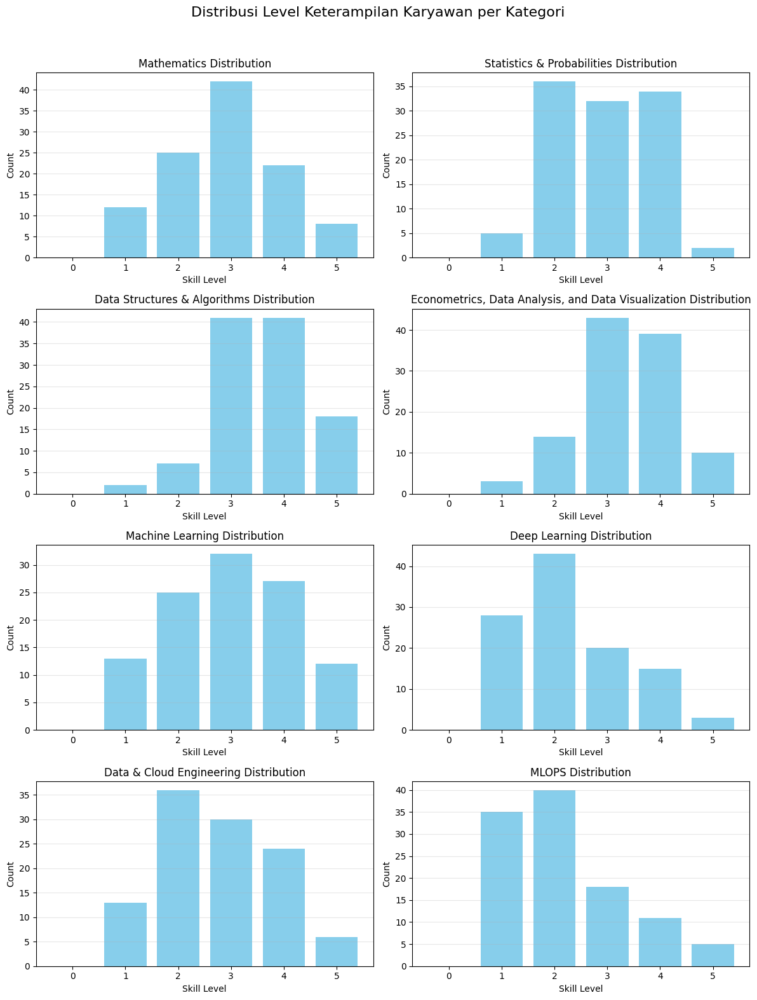

Tabel Distribusi Level Keterampilan Karyawan per Kategori:
                                                    Level 0  Level 1  Level 2  \
Mathematics                                               0       12       25   
Statistics & Probabilities                                0        5       36   
Data Structures & Algorithms                              0        2        7   
Econometrics, Data Analysis, and Data Visualiza...        0        3       14   
Machine Learning                                          0       13       25   
Deep Learning                                             0       28       43   
Data & Cloud Engineering                                  0       13       36   
MLOPS                                                     0       35       40   

                                                    Level 3  Level 4  Level 5  
Mathematics                                              42       22        8  
Statistics & Probabilities                         

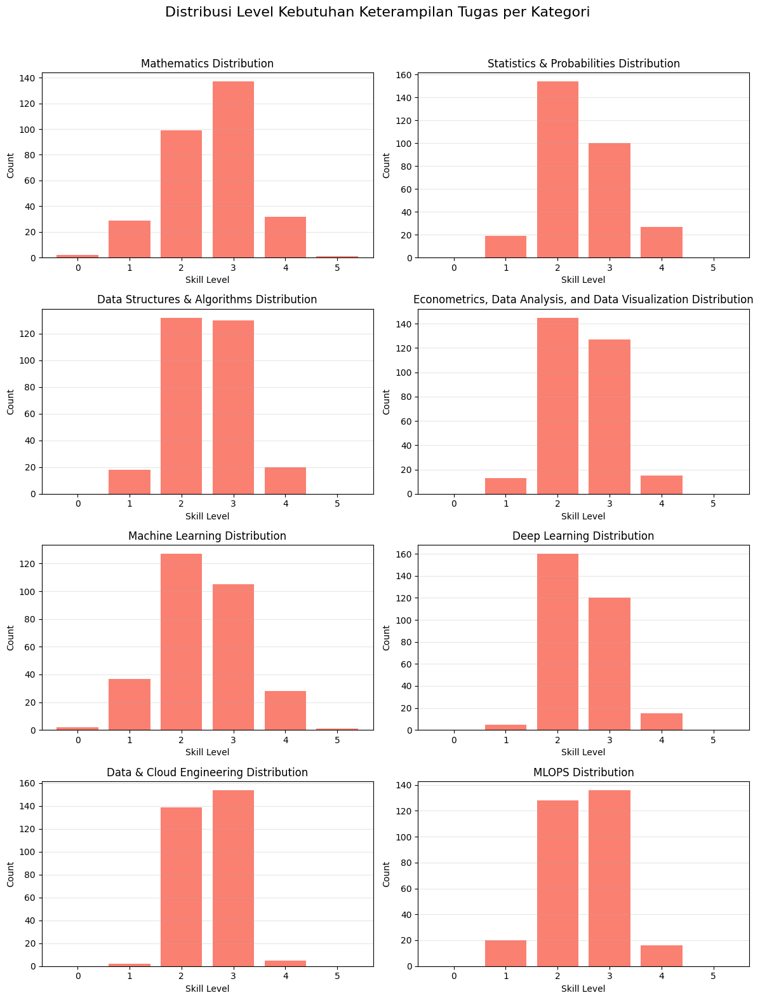

Tabel Distribusi Level Kebutuhan Keterampilan Tugas per Kategori:
                                                    Level 0  Level 1  Level 2  \
Mathematics                                               2       29       99   
Statistics & Probabilities                                0       19      154   
Data Structures & Algorithms                              0       18      132   
Econometrics, Data Analysis, and Data Visualiza...        0       13      145   
Machine Learning                                          2       37      127   
Deep Learning                                             0        5      160   
Data & Cloud Engineering                                  0        2      139   
MLOPS                                                     0       20      128   

                                                    Level 3  Level 4  Level 5  
Mathematics                                             137       32        1  
Statistics & Probabilities                  

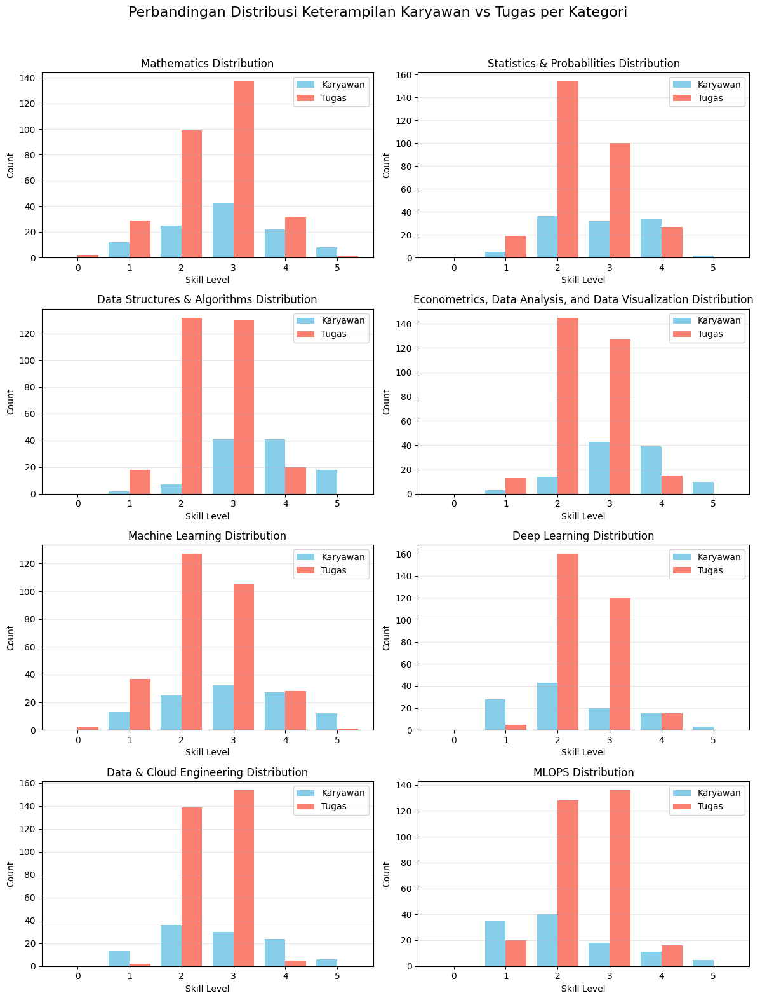

Tabel Perbandingan Distribusi Keterampilan Karyawan vs Tugas per Kategori:
                                                    Karyawan Level 0  \
Mathematics                                                        0   
Statistics & Probabilities                                         0   
Data Structures & Algorithms                                       0   
Econometrics, Data Analysis, and Data Visualiza...                 0   
Machine Learning                                                   0   
Deep Learning                                                      0   
Data & Cloud Engineering                                           0   
MLOPS                                                              0   

                                                    Karyawan Level 1  \
Mathematics                                                       12   
Statistics & Probabilities                                         5   
Data Structures & Algorithms                                

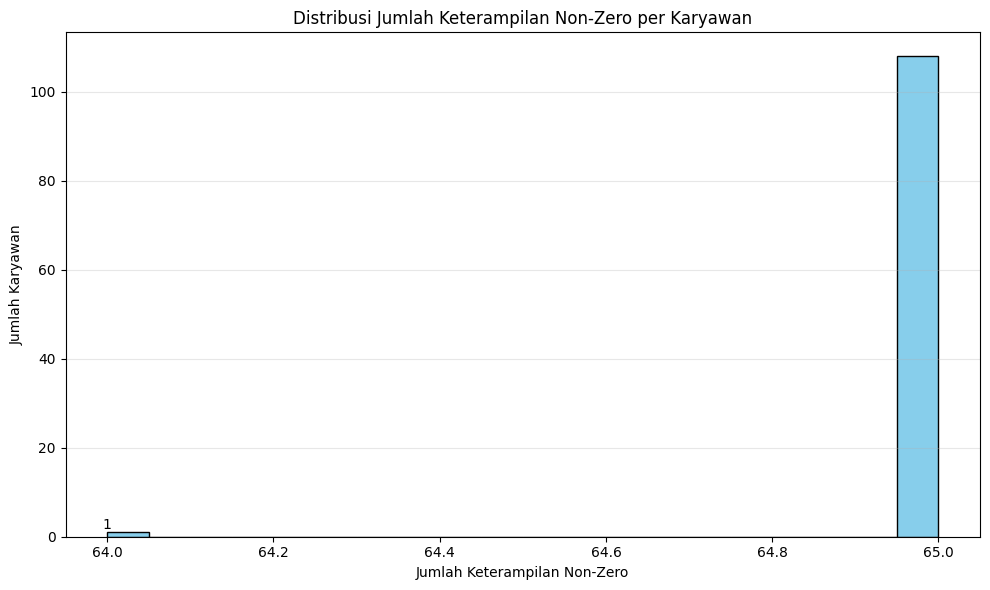

Tabel Distribusi Jumlah Keterampilan Non-Zero per Karyawan:
   Jumlah Keterampilan Non-Zero  Jumlah Karyawan
0                            64                1
1                            65              108


Jumlah karyawan dengan 64 keterampilan non-zero: 1
Jumlah karyawan dengan 65 keterampilan non-zero: 108


In [ ]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive', force_remount=True)

# Paths
EMP_PATH = '/content/drive/MyDrive/Skripsi/Resources/Datasets/fixed_data_employee.csv'
TASK_PATH = '/content/drive/MyDrive/Skripsi/Resources/Datasets/fixed_data_task.csv'

# Load data
emp_df = pd.read_csv(EMP_PATH, index_col='employee_id').fillna(0).drop(columns=['No', 'Role'], errors='ignore')
task_df = pd.read_csv(TASK_PATH, index_col='task_id').fillna(0)

# Define skill columns
skill_cols = [col for col in task_df.columns if col not in ['project_id', 'story_points']]  # 65 skills
assert len(skill_cols) == 65, "Skill column count mismatch"
assert emp_df.shape[0] == 109 and task_df.shape[0] == 300, "Row count mismatch"

# Extract skill data
emp_skills = emp_df[skill_cols]
task_skills = task_df[skill_cols]

# Define 8 categories based on prefixes in skill column names
categories = {
    'Mathematics': [col for col in skill_cols if col.startswith('Mathematics')],
    'Statistics & Probabilities': [col for col in skill_cols if col.startswith('Statistics & Probabilities')],
    'Data Structures & Algorithms': [col for col in skill_cols if col.startswith('Data Structures & Algorithms')],
    'Econometrics, Data Analysis, and Data Visualization': [col for col in skill_cols if col.startswith('Econometrics, Data Analysis, and Data Visualization')],
    'Machine Learning': [col for col in skill_cols if col.startswith('Machine Learning')],
    'Deep Learning': [col for col in skill_cols if col.startswith('Deep Learning')],
    'Data & Cloud Engineering': [col for col in skill_cols if col.startswith('Data & Cloud Engineering')],
    'MLOPS': [col for col in skill_cols if col.startswith('MLOPS')]
}

# 1. Distribusi Skor Keterampilan Karyawan per Kategori
# Create table for employee skill distribution
emp_skill_dist = {category: {level: 0 for level in range(6)} for category in categories.keys()}

# Create subplots for employees (4 rows, 2 columns)
fig, axes = plt.subplots(4, 2, figsize=(12, 16))
fig.suptitle("Distribusi Level Keterampilan Karyawan per Kategori", fontsize=16)

for idx, (category, cols) in enumerate(categories.items()):
    row = idx // 2
    col = idx % 2
    # Calculate mean skill score per employee for this category
    emp_scores = emp_skills[cols].mean(axis=1)
    # Round scores to nearest integer (0-5) for discrete levels
    emp_scores_rounded = np.round(emp_scores).astype(int)
    # Plot histogram
    counts, _ = np.histogram(emp_scores_rounded, bins=[0, 1, 2, 3, 4, 5, 6])
    for level, count in enumerate(counts):
        emp_skill_dist[category][level] = count
    axes[row, col].hist(emp_scores_rounded, bins=[0, 1, 2, 3, 4, 5, 6], align='left', rwidth=0.8, color='skyblue')
    axes[row, col].set_title(f"{category} Distribution")
    axes[row, col].set_xlabel("Skill Level")
    axes[row, col].set_ylabel("Count")
    axes[row, col].set_xticks([0, 1, 2, 3, 4, 5])
    axes[row, col].grid(axis='y', alpha=0.3)

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

# Convert employee skill distribution to DataFrame
emp_skill_dist_df = pd.DataFrame(emp_skill_dist).T
emp_skill_dist_df.columns = [f"Level {i}" for i in range(6)]
print("Tabel Distribusi Level Keterampilan Karyawan per Kategori:")
print(emp_skill_dist_df)
print("\n")

# 2. Distribusi Skor Keterampilan Tugas per Kategori
# Create table for task skill distribution
task_skill_dist = {category: {level: 0 for level in range(6)} for category in categories.keys()}

# Create subplots for tasks (4 rows, 2 columns)
fig, axes = plt.subplots(4, 2, figsize=(12, 16))
fig.suptitle("Distribusi Level Kebutuhan Keterampilan Tugas per Kategori", fontsize=16)

for idx, (category, cols) in enumerate(categories.items()):
    row = idx // 2
    col = idx % 2
    # Calculate mean skill requirement per task for this category
    task_scores = task_skills[cols].mean(axis=1)
    # Round scores to nearest integer (0-5) for discrete levels
    task_scores_rounded = np.round(task_scores).astype(int)
    # Plot histogram
    counts, _ = np.histogram(task_scores_rounded, bins=[0, 1, 2, 3, 4, 5, 6])
    for level, count in enumerate(counts):
        task_skill_dist[category][level] = count
    axes[row, col].hist(task_scores_rounded, bins=[0, 1, 2, 3, 4, 5, 6], align='left', rwidth=0.8, color='salmon')
    axes[row, col].set_title(f"{category} Distribution")
    axes[row, col].set_xlabel("Skill Level")
    axes[row, col].set_ylabel("Count")
    axes[row, col].set_xticks([0, 1, 2, 3, 4, 5])
    axes[row, col].grid(axis='y', alpha=0.3)

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

# Convert task skill distribution to DataFrame
task_skill_dist_df = pd.DataFrame(task_skill_dist).T
task_skill_dist_df.columns = [f"Level {i}" for i in range(6)]
print("Tabel Distribusi Level Kebutuhan Keterampilan Tugas per Kategori:")
print(task_skill_dist_df)
print("\n")

# 3. Perbandingan Distribusi Karyawan vs Tugas (Side-by-Side Histogram)
# Create table for comparison
comparison_dist = {}
for category in categories.keys():
    comparison_dist[category] = {
        f"Karyawan Level {i}": emp_skill_dist[category][i] for i in range(6)
    }
    comparison_dist[category].update({
        f"Tugas Level {i}": task_skill_dist[category][i] for i in range(6)
    })

# Create subplots for side-by-side comparison (4 rows, 2 columns)
fig, axes = plt.subplots(4, 2, figsize=(12, 16))
fig.suptitle("Perbandingan Distribusi Keterampilan Karyawan vs Tugas per Kategori", fontsize=16)

for idx, (category, cols) in enumerate(categories.items()):
    row = idx // 2
    col = idx % 2
    # Employee scores
    emp_scores = emp_skills[cols].mean(axis=1)
    emp_scores_rounded = np.round(emp_scores).astype(int)
    # Task scores
    task_scores = task_skills[cols].mean(axis=1)
    task_scores_rounded = np.round(task_scores).astype(int)
    # Plot side-by-side histogram
    axes[row, col].hist([emp_scores_rounded, task_scores_rounded], bins=[0, 1, 2, 3, 4, 5, 6],
                        align='left', rwidth=0.8, label=['Karyawan', 'Tugas'], color=['skyblue', 'salmon'])
    axes[row, col].set_title(f"{category} Distribution")
    axes[row, col].set_xlabel("Skill Level")
    axes[row, col].set_ylabel("Count")
    axes[row, col].set_xticks([0, 1, 2, 3, 4, 5])
    axes[row, col].legend()
    axes[row, col].grid(axis='y', alpha=0.3)

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

# Convert comparison distribution to DataFrame
comparison_dist_df = pd.DataFrame(comparison_dist).T
print("Tabel Perbandingan Distribusi Keterampilan Karyawan vs Tugas per Kategori:")
print(comparison_dist_df)
print("\n")

# 4. Histogram Jumlah Keterampilan Non-Zero (dengan Label untuk 64 dan 65)
num_nonzero_skills = (emp_skills > 0).sum(axis=1)
plt.figure(figsize=(10, 6))
counts, bins, _ = plt.hist(num_nonzero_skills, bins=20, color='skyblue', edgecolor='black')
plt.title("Distribusi Jumlah Keterampilan Non-Zero per Karyawan")
plt.xlabel("Jumlah Keterampilan Non-Zero")
plt.ylabel("Jumlah Karyawan")
plt.grid(axis='y', alpha=0.3)

# Add labels for 64 and 65 non-zero skills
count_64 = sum(num_nonzero_skills == 64)
count_65 = sum(num_nonzero_skills == 65)
for i in range(len(bins)-1):
    if bins[i] <= 64 < bins[i+1]:
        plt.text(64, counts[i], f"{int(counts[i])}", ha='center', va='bottom')
    if bins[i] <= 65 < bins[i+1]:
        plt.text(65, counts[i], f"{int(counts[i])}", ha='center', va='bottom')

plt.tight_layout()
plt.show()

# Create table for non-zero skills distribution
nonzero_skills_dist = pd.Series(num_nonzero_skills).value_counts().sort_index()
nonzero_skills_dist_df = pd.DataFrame({
    'Jumlah Keterampilan Non-Zero': nonzero_skills_dist.index,
    'Jumlah Karyawan': nonzero_skills_dist.values
})
print("Tabel Distribusi Jumlah Keterampilan Non-Zero per Karyawan:")
print(nonzero_skills_dist_df)
print("\n")
print(f"Jumlah karyawan dengan 64 keterampilan non-zero: {count_64}")
print(f"Jumlah karyawan dengan 65 keterampilan non-zero: {count_65}")

# Greedy

Task skills range: 0.0 1.0
Employee skills range: nan nan
Theoretical Worst WED (Weighted): 6.582806
Theoretical Best WED (Weighted): 0.000000
Raw WED scores range: 2.333899365243979 3.1777301172328496
Standardized WED scores range: 0.5172681418466347 0.6454552351008762


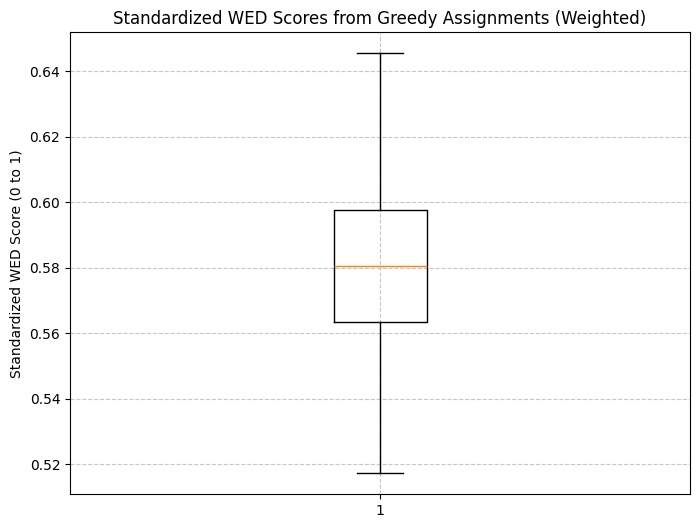

Raw WED Scores: Mean=2.752, Median=2.762, Std=0.171
Standardized WED Scores: Mean=0.582, Median=0.580, Std=0.026


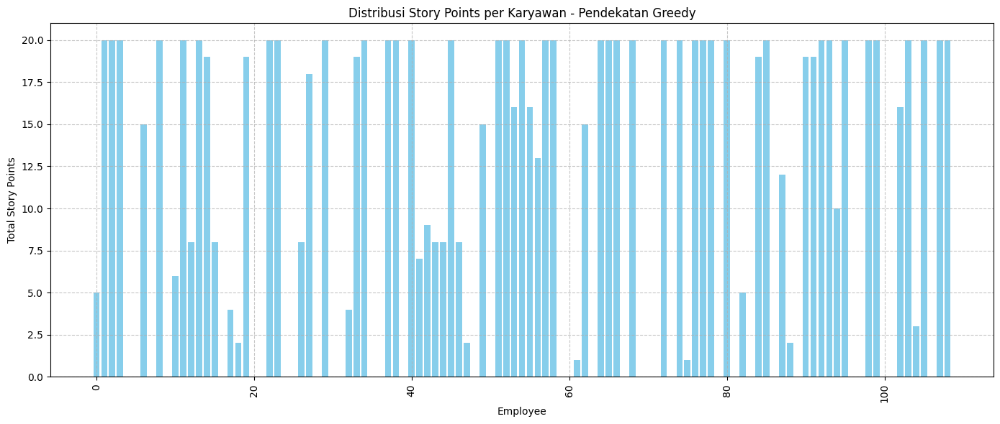

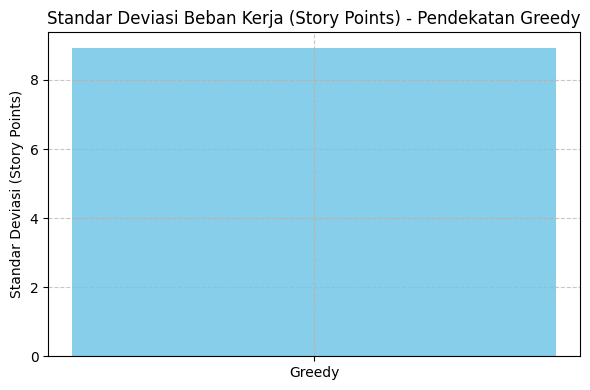

Standar Deviasi Beban Kerja (Greedy): 8.93
Jumlah Karyawan Idle (Greedy): 35


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Load datasets
task_data = pd.read_csv('/content/drive/MyDrive/Skripsi/Resources/Datasets/fixed_data_task.csv')
employee_data = pd.read_csv('/content/drive/MyDrive/Skripsi/Resources/Datasets/fixed_data_employee.csv')
task_subset = task_data.iloc[:300]
employee_subset = employee_data.iloc[:109]
skill_columns = [col for col in task_data.columns if col not in ['task_id', 'story_points', 'project_id']]
task_skills = task_subset[skill_columns]
emp_skills = employee_subset[skill_columns]
task_df = task_subset
emp_df = employee_subset

# Normalize skills to [0, 1]
task_skills = task_skills / 5.0
emp_skills = emp_skills / 5.0

print("Task skills range:", task_skills.values.min(), task_skills.values.max())
print("Employee skills range:", emp_skills.values.min(), emp_skills.values.max())

# Updated WED calculation with weighted Euclidean distance
def calculate_wed(emp, task, alpha=0.5):
    weights = 1 / (1 + alpha * np.maximum(0, emp - task))
    wed = np.sqrt(np.sum(weights * (emp - task) ** 2))
    return wed

assignments = {}
workload = np.zeros(109)

for emp_idx in range(109):
    assignments[emp_idx] = []

np.random.seed(42)
for task_idx in np.random.permutation(300):
    task = task_skills.iloc[task_idx].values
    sp = task_df['story_points'].iloc[task_idx]
    project_id = task_df['project_id'].iloc[task_idx]
    task_id = task_df.index[task_idx]
    best_emp, best_wed = None, float('inf')
    for emp_idx in range(109):
        if workload[emp_idx] + sp <= 20:
            emp = emp_skills.iloc[emp_idx].values
            wed = calculate_wed(emp, task)
            if wed < best_wed:
                best_wed, best_emp = wed, emp_idx
    if best_emp is not None:
        assignments[best_emp].append((task_id, project_id, sp, best_wed))
        workload[best_emp] += sp

weds_raw = [wed for emp_tasks in assignments.values() for _, _, _, wed in emp_tasks]

# Standardize the WED scores
alpha = 0.5
weights_worst = 1 / (1 + alpha * 1)  # Max difference = 1 (skills in [0, 1])
wed_raw_worst = np.sqrt(np.sum(weights_worst * (0 - 1) ** 2) * 65)
wed_raw_best = 0
print(f"Theoretical Worst WED (Weighted): {wed_raw_worst:.6f}")
print(f"Theoretical Best WED (Weighted): {wed_raw_best:.6f}")
weds_standardized = [(wed_raw_worst - wed) / (wed_raw_worst - wed_raw_best) for wed in weds_raw]
print("Raw WED scores range:", min(weds_raw), max(weds_raw))
print("Standardized WED scores range:", min(weds_standardized), max(weds_standardized))

data = []
for emp_idx, tasks in assignments.items():
    employee_id = emp_df.index[emp_idx]
    projects = [proj for _, proj, _, _ in tasks] if tasks else []
    assigned_tasks = [task for task, _, _, _ in tasks] if tasks else []
    sum_sp = sum(sp for _, _, sp, _ in tasks) if tasks else 0
    wasted_sp = 20 - sum_sp
    similarity_scores = [wed for _, _, _, wed in tasks] if tasks else []
    data.append([employee_id, projects, assigned_tasks, sum_sp, wasted_sp, similarity_scores])

df = pd.DataFrame(data, columns=['employee', 'project', 'assigned_task', 'sum_sp', 'wasted_sp', 'similarity_score'])
df.to_csv('greedy_weighted_method.csv', index=False)

plt.figure(figsize=(8, 6))
plt.boxplot(weds_standardized)
plt.title("Standardized WED Scores from Greedy Assignments (Weighted)")
plt.ylabel("Standardized WED Score (0 to 1)")
plt.grid(True, linestyle='--', alpha=0.7)
plt.show()
print(f"Raw WED Scores: Mean={np.mean(weds_raw):.3f}, Median={np.median(weds_raw):.3f}, Std={np.std(weds_raw):.3f}")
print(f"Standardized WED Scores: Mean={np.mean(weds_standardized):.3f}, Median={np.median(weds_standardized):.3f}, Std={np.std(weds_standardized):.3f}")

employee_list = df['employee'].tolist()
story_points_greedy = df['sum_sp'].tolist()

plt.figure(figsize=(14, 6))
plt.bar(employee_list, story_points_greedy, color='skyblue')
plt.title("Distribusi Story Points per Karyawan - Pendekatan Greedy")
plt.xlabel("Employee")
plt.ylabel("Total Story Points")
plt.xticks(rotation=90)
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

std_dev_greedy = np.std(story_points_greedy)
plt.figure(figsize=(6, 4))
plt.bar(['Greedy'], [std_dev_greedy], color='skyblue')
plt.title("Standar Deviasi Beban Kerja (Story Points) - Pendekatan Greedy")
plt.ylabel("Standar Deviasi (Story Points)")
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

print(f"Standar Deviasi Beban Kerja (Greedy): {std_dev_greedy:.2f}")
num_idle_greedy = np.sum(np.array(story_points_greedy) == 0)
print(f"Jumlah Karyawan Idle (Greedy): {num_idle_greedy}")

# MOO Approach with Old Equation

Mounted at /content/drive
Theoretical Worst WED (Raw): 21.547290
Theoretical Best WED (Raw): 0.000000
Theoretical Worst Similarity Score (Old Formula): 0.044351
Theoretical Best Similarity Score (Old Formula): 1.000000

Objective 1 - Original Similarity Scores (Old Formula): Mean=0.079, Median=0.079, Std=0.012
Objective 1 - Raw WED Scores: Mean=12.039, Median=11.666, Std=2.129
Objective 1 - Standardized WED Scores: Mean=0.441, Median=0.459, Std=0.099

Objective 2 - Original Similarity Scores (Old Formula): Mean=0.065, Median=0.064, Std=0.007
Objective 2 - Raw WED Scores: Mean=14.516, Median=14.595, Std=1.701
Objective 2 - Standardized WED Scores: Mean=0.326, Median=0.323, Std=0.079

Objective 3 - Original Similarity Scores (Old Formula): Mean=0.080, Median=0.080, Std=0.012
Objective 3 - Raw WED Scores: Mean=11.864, Median=11.431, Std=2.114
Objective 3 - Standardized WED Scores: Mean=0.449, Median=0.469, Std=0.098

MOO - Original Similarity Scores (Old Formula): Mean=0.069, Median=0.067

<ipython-input-4-a7047aec1e14>:100: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(weds_standardized_all.values(), labels=weds_standardized_all.keys())


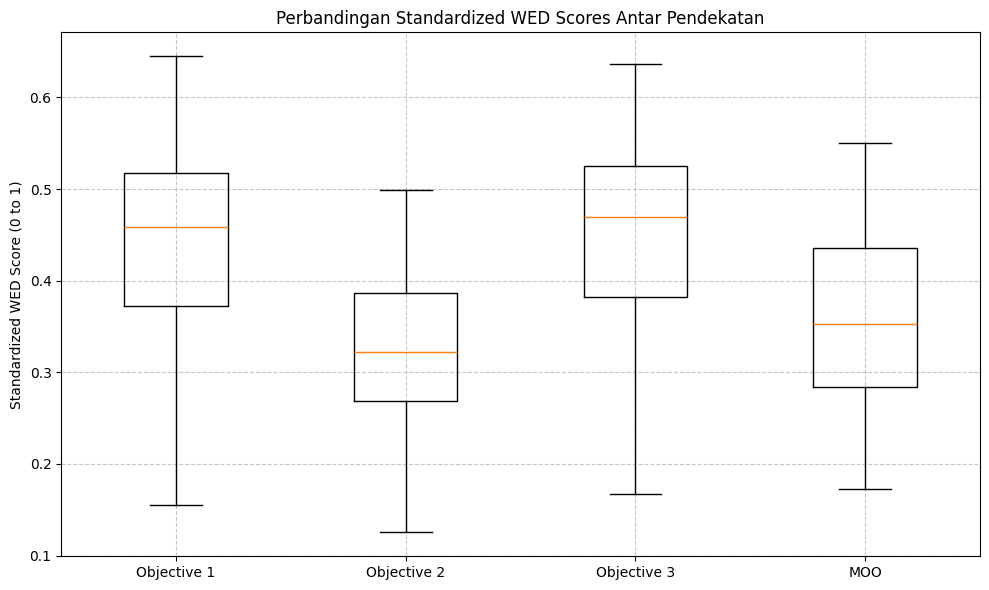


Tabel Alokasi Story Points per Karyawan Antar Pendekatan:
            Objective 1  Objective 2  Objective 3  MOO
Talent 1             11           19           10   11
Talent 10            11            5           11   10
Talent 100           14           20           10   11
Talent 101           18           18           11   11
Talent 102            2            0           11    8
...                 ...          ...          ...  ...
Talent 95            20           16           11   11
Talent 96             6           18           10   11
Talent 97            11           18           10   11
Talent 98             9            0           11    8
Talent 99            17            8            8   11

[109 rows x 4 columns]


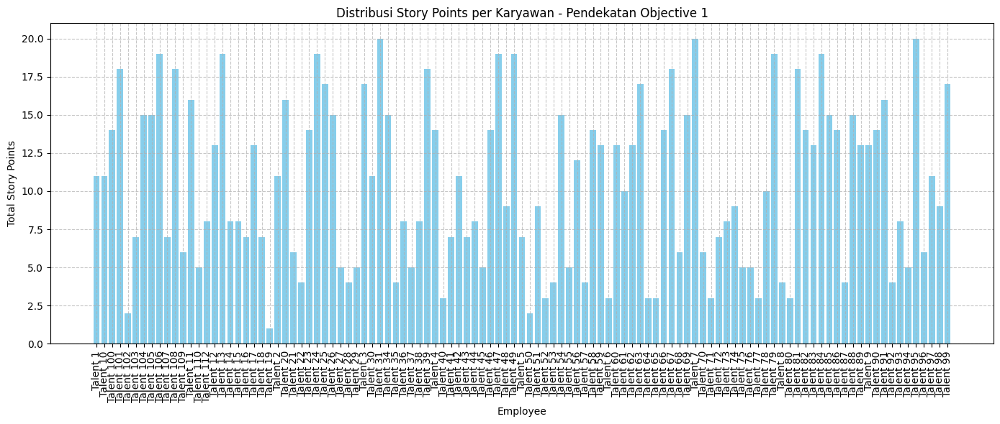

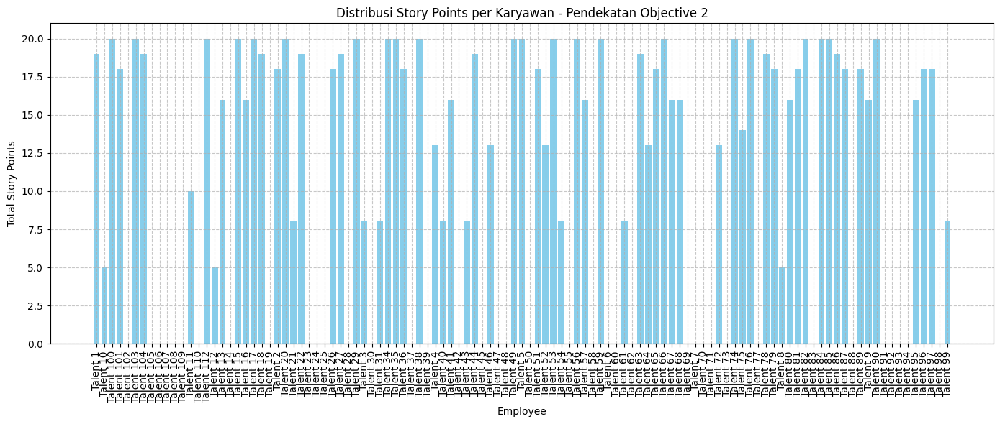

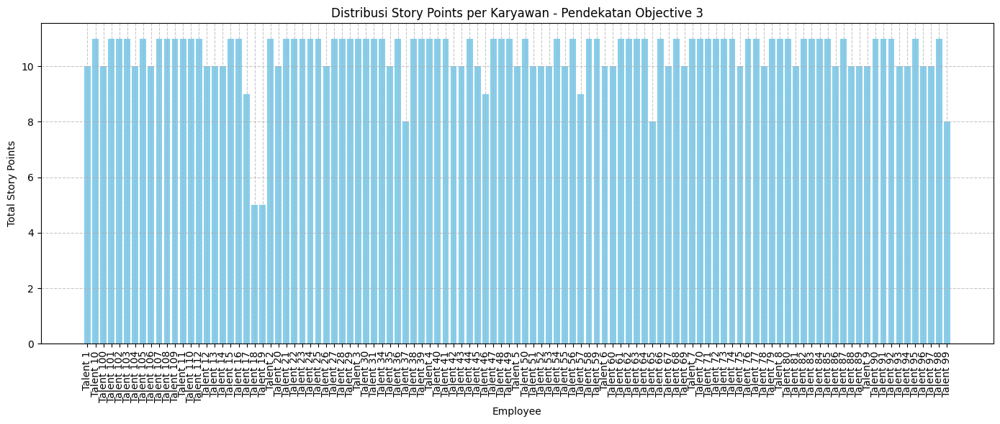

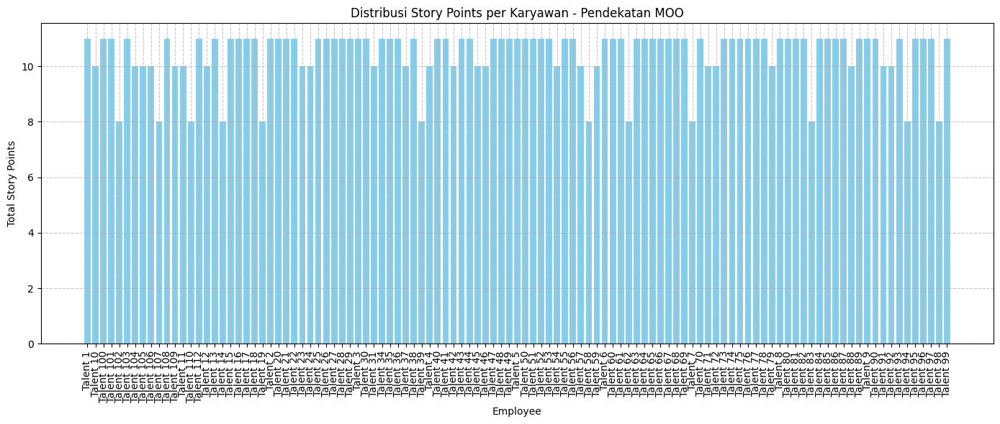


Tabel Standar Deviasi Beban Kerja (Story Points) Antar Pendekatan:
             Standard Deviation
Objective 1            5.415720
Objective 2            8.602844
Objective 3            1.009007
MOO                    0.952893


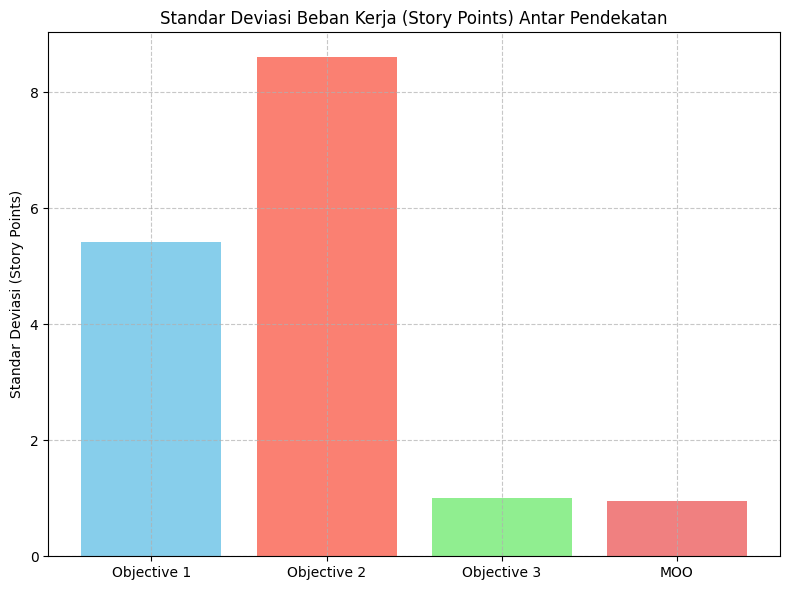

Standar Deviasi Beban Kerja (Objective 1): 5.42
Standar Deviasi Beban Kerja (Objective 2): 8.60
Standar Deviasi Beban Kerja (Objective 3): 1.01
Standar Deviasi Beban Kerja (MOO): 0.95

Tabel Jumlah Employee Idle dan Active Antar Pendekatan:
             Idle  Active
Objective 1     0     109
Objective 2    39      70
Objective 3     0     109
MOO             0     109


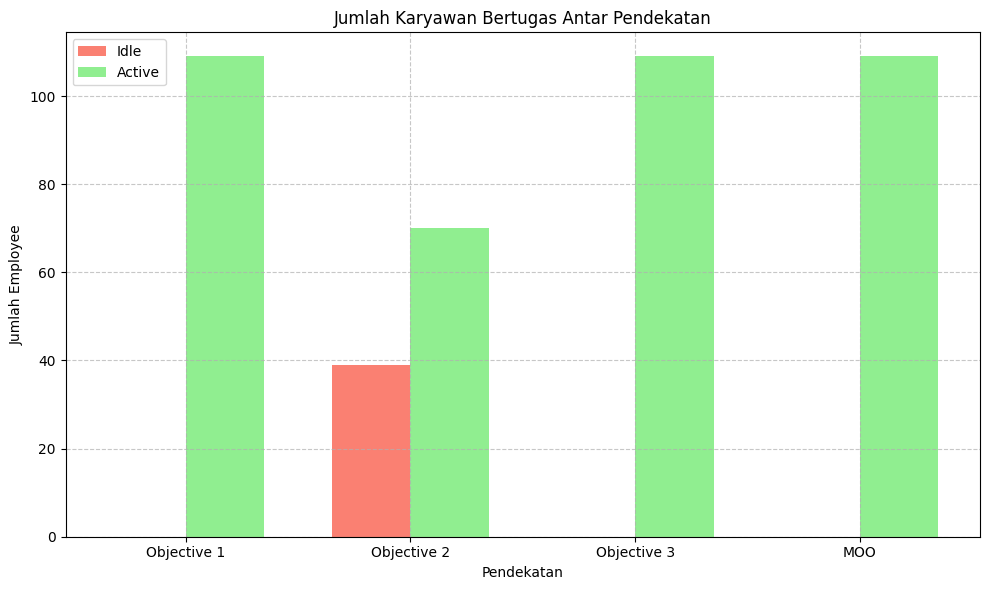


Tabel Max Workload Antar Pendekatan:
             Max Workload
Objective 1            20
Objective 2            20
Objective 3            11
MOO                    11


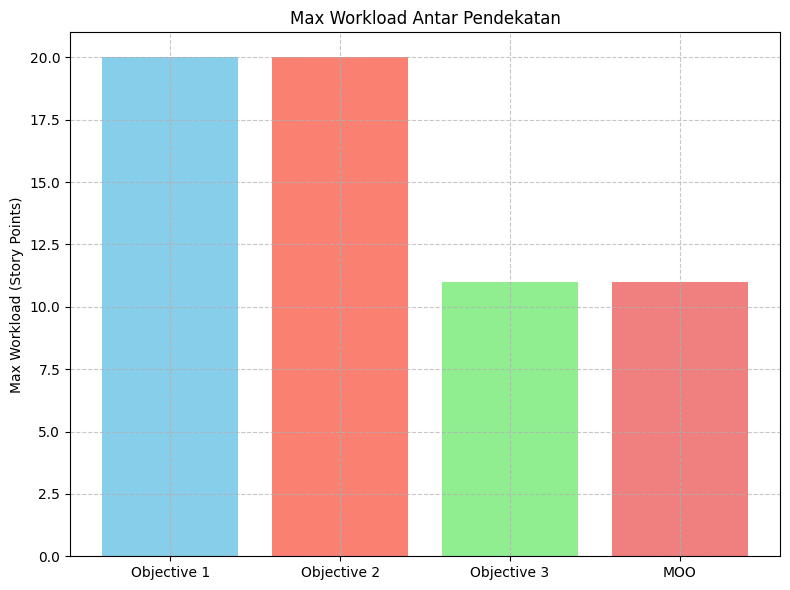

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import ast
import seaborn as sns
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive', force_remount=True)

# Load datasets
path_obj1 = '/content/drive/MyDrive/Skripsi/Resources/Output/result_obj1.csv'
path_obj2 = '/content/drive/MyDrive/Skripsi/Resources/Output/result_obj2.csv'
path_obj3 = '/content/drive/MyDrive/Skripsi/Resources/Output/result_obj3.csv'
path_moo = '/content/drive/MyDrive/Skripsi/Resources/Output/result_moo.csv'

result_obj1 = pd.read_csv(path_obj1)
result_obj2 = pd.read_csv(path_obj2)
result_obj3 = pd.read_csv(path_obj3)
result_moo = pd.read_csv(path_moo)

# Extract similarity scores for all approaches
approaches = {
    'Objective 1': result_obj1,
    'Objective 2': result_obj2,
    'Objective 3': result_obj3,
    'MOO': result_moo
}

weds_standardized_all = {}
weds_old_all = {}
weds_raw_all = {}  # Untuk simpen WED asli

# Compute theoretical worst and best WED scores
alpha = 0.5  # As defined in your original custom_we function
# Theoretical worst: emp=[0,0,...,0], task=[5,5,...,5], 65 skills
weights_worst = 1 / (1 + alpha * 5)  # Since emp=0, task=5, max difference
d_max = np.sqrt(np.sum(weights_worst * (0 - 5) ** 2) * 65)  # Max distance (WED_worst)
wed_raw_worst = d_max  # WED terburuk asli
wed_raw_best = 0  # WED terbaik asli (exact match)

# Hitung similarity score teoritis dari WED_worst dan WED_best
wed_old_worst = 1 / (1 + wed_raw_worst)  # Similarity score teoritis terburuk
wed_old_best = 1 / (1 + wed_raw_best)  # Similarity score teoritis terbaik

print(f"Theoretical Worst WED (Raw): {wed_raw_worst:.6f}")
print(f"Theoretical Best WED (Raw): {wed_raw_best:.6f}")
print(f"Theoretical Worst Similarity Score (Old Formula): {wed_old_worst:.6f}")
print(f"Theoretical Best Similarity Score (Old Formula): {wed_old_best:.6f}")

# Standardize WED scores for each approach and collect statistics
weds_stats = {}
for approach_name, result_df in approaches.items():
    weds_old = []  # Similarity scores mentah (1 / (1 + WED))
    weds_raw = []  # WED asli

    # Ambil similarity scores dari CSV dan balikkan ke WED
    for scores_str in result_df['similarity_score']:
        scores = ast.literal_eval(scores_str)
        weds_old.extend(scores)
        # Balikkan ke WED: WED = (1 / similarity_score) - 1
        weds_raw.extend([(1 / score) - 1 for score in scores])

    # Standardize WED ke skala 0-1: 0 = WED_worst, 1 = WED_best
    weds_standardized = [(wed_raw_worst - wed) / (wed_raw_worst - wed_raw_best) for wed in weds_raw]

    weds_old_all[approach_name] = weds_old
    weds_raw_all[approach_name] = weds_raw
    weds_standardized_all[approach_name] = weds_standardized

    # Compute statistics for standardized scores
    q1 = np.percentile(weds_standardized, 25)
    q3 = np.percentile(weds_standardized, 75)
    iqr = q3 - q1
    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr
    outliers = [x for x in weds_standardized if x < lower_bound or x > upper_bound]

    weds_stats[approach_name] = {
        'Mean': np.mean(weds_standardized),
        'Median': np.median(weds_standardized),
        'Minimum': np.min(weds_standardized),
        'Q1': q1,
        'Q3': q3,
        'Maximum': np.max(weds_standardized),
        'Outliers': outliers if outliers else 'None'
    }

    print(f"\n{approach_name} - Original Similarity Scores (Old Formula): Mean={np.mean(weds_old):.3f}, Median={np.median(weds_old):.3f}, Std={np.std(weds_old):.3f}")
    print(f"{approach_name} - Raw WED Scores: Mean={np.mean(weds_raw):.3f}, Median={np.median(weds_raw):.3f}, Std={np.std(weds_raw):.3f}")
    print(f"{approach_name} - Standardized WED Scores: Mean={np.mean(weds_standardized):.3f}, Median={np.median(weds_standardized):.3f}, Std={np.std(weds_standardized):.3f}")

# Create table for WED statistics with boxplot boundaries
weds_stats_df = pd.DataFrame(weds_stats).T
print("\nTabel Statistik dan Batasan Boxplot Standardized WED Scores Antar Pendekatan:")
print(weds_stats_df)

# Visualization 1: Boxplot of Standardized WED Scores for All Approaches
plt.figure(figsize=(10, 6))
plt.boxplot(weds_standardized_all.values(), labels=weds_standardized_all.keys())
plt.title("Perbandingan Standardized WED Scores Antar Pendekatan")
plt.ylabel("Standardized WED Score (0 to 1)")
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# Compute story points allocation per employee for each approach
story_points_allocation = {}
employee_list = sorted(list(set(result_obj1['employee']).union(
    set(result_obj2['employee']), set(result_obj3['employee']), set(result_moo['employee'])
)))  # Get unique employees across all datasets

for approach_name, result_df in approaches.items():
    # Compute total story points per employee using sum_sp
    story_points_per_employee = result_df.groupby('employee')['sum_sp'].sum()
    # Ensure all employees are represented (fill with 0 if no allocation)
    story_points = [story_points_per_employee.get(emp, 0) for emp in employee_list]
    story_points_allocation[approach_name] = story_points

# Create table for story points allocation
story_points_df = pd.DataFrame(story_points_allocation, index=employee_list)
print("\nTabel Alokasi Story Points per Karyawan Antar Pendekatan:")
print(story_points_df)

# Visualization 2: Separate Bar Charts of Story Points Allocation per Employee for Each Approach
for approach_name, story_points in story_points_allocation.items():
    plt.figure(figsize=(14, 6))
    plt.bar(employee_list, story_points, color='skyblue')
    plt.title(f"Distribusi Story Points per Karyawan - Pendekatan {approach_name}")
    plt.xlabel("Employee")
    plt.ylabel("Total Story Points")
    plt.xticks(rotation=90)
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

# Compute standard deviation of story points allocation for each approach
std_devs = {}
for approach_name, story_points in story_points_allocation.items():
    std_devs[approach_name] = np.std(story_points)

# Create table for standard deviations
std_devs_df = pd.DataFrame.from_dict(std_devs, orient='index', columns=['Standard Deviation'])
print("\nTabel Standar Deviasi Beban Kerja (Story Points) Antar Pendekatan:")
print(std_devs_df)

# Visualization 3: Bar Chart of Standard Deviation of Story Points Allocation for Each Approach
plt.figure(figsize=(8, 6))
plt.bar(std_devs.keys(), std_devs.values(), color=['skyblue', 'salmon', 'lightgreen', 'lightcoral'])
plt.title("Standar Deviasi Beban Kerja (Story Points) Antar Pendekatan")
plt.ylabel("Standar Deviasi (Story Points)")
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# Print standard deviations for reference
for approach_name, std_dev in std_devs.items():
    print(f"Standar Deviasi Beban Kerja ({approach_name}): {std_dev:.2f}")

# Tambah Visualisasi untuk Objective 1: Jumlah Idle dan Active Employee
idle_active_counts = {}
for approach_name, result_df in approaches.items():
    # Hitung total story points per employee
    story_points_per_employee = result_df.groupby('employee')['sum_sp'].sum()
    # Pastiin semua employee di employee_list ada, kalo ga ada berarti sum_sp = 0
    story_points = [story_points_per_employee.get(emp, 0) for emp in employee_list]
    # Hitung idle (sum_sp = 0) dan active (sum_sp > 0)
    idle_count = sum(1 for sp in story_points if sp == 0)
    active_count = sum(1 for sp in story_points if sp > 0)
    idle_active_counts[approach_name] = {'Idle': idle_count, 'Active': active_count}

# Buat DataFrame untuk idle/active counts
idle_active_df = pd.DataFrame(idle_active_counts).T
print("\nTabel Jumlah Employee Idle dan Active Antar Pendekatan:")
print(idle_active_df)

# Visualization 4: Bar Chart untuk Idle dan Active Employee
fig, ax = plt.subplots(figsize=(10, 6))
bar_width = 0.35
index = np.arange(len(approaches))

# Bar untuk Idle
plt.bar(index, idle_active_df['Idle'], bar_width, label='Idle', color='salmon')
# Bar untuk Active
plt.bar(index + bar_width, idle_active_df['Active'], bar_width, label='Active', color='lightgreen')

plt.xlabel('Pendekatan')
plt.ylabel('Jumlah Employee')
plt.title('Jumlah Karyawan Bertugas Antar Pendekatan')
plt.xticks(index + bar_width / 2, approaches.keys())
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# Tambah Visualisasi untuk Objective 3: Max Workload
max_workloads = {}
for approach_name, result_df in approaches.items():
    # Hitung max workload (nilai maksimum dari sum_sp)
    max_workload = result_df['sum_sp'].max()
    max_workloads[approach_name] = max_workload

# Buat DataFrame untuk max workload
max_workloads_df = pd.DataFrame.from_dict(max_workloads, orient='index', columns=['Max Workload'])
print("\nTabel Max Workload Antar Pendekatan:")
print(max_workloads_df)

# Visualization 5: Bar Chart untuk Max Workload
plt.figure(figsize=(8, 6))
plt.bar(max_workloads.keys(), max_workloads.values(), color=['skyblue', 'salmon', 'lightgreen', 'lightcoral'])
plt.title("Max Workload Antar Pendekatan")
plt.ylabel("Max Workload (Story Points)")
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# GNN + PPO

In [ ]:
!pip install torch torch-geometric gym stable-baselines3 numpy pandas shimmy

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.1/63.1 kB 2.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 70.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 49.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 39.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 4.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 11.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 3.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 35.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 60.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18

## GNN + DQN

### Mini Dataset, Optimize approach to increase the reward as episodes go by

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


### straight up implementation without the hyperparameter optimization

In [ ]:
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch_geometric.nn import GATConv
from torch_geometric.data import Data, Batch
from sklearn.impute import SimpleImputer
import gym
from gym import spaces
import random
from collections import deque
import matplotlib.pyplot as plt
import seaborn as sns
import time

# Global Variables for Flexibility
# Dataset sizes
NUM_EMPLOYEES = 109  # Full dataset: 109 employees
NUM_TASKS = 300      # Full dataset: 300 tasks

# Training parameters
NUM_EPISODES = 100    # Number of episodes

# Hyperparameters for DQNAgent
LEARNING_RATE = 5e-5        # Learning rate for Adam optimizer
TEMPERATURE = 1.0           # Initial temperature for exploration
TEMPERATURE_DECAY = 0.995   # Temperature decay rate per episode
MIN_TEMPERATURE = 0.1       # Minimum temperature
GAMMA = 0.99                # Discount factor for future rewards
MEMORY_SIZE = 50000         # Replay memory size
BATCH_SIZE = 64             # Batch size for replay
TARGET_UPDATE_FREQ = 100    # Update target network every X steps

# GNN and DQN architecture
GNN_HIDDEN_DIM = 16         # Hidden dimension for GNN
GNN_OUTPUT_DIM = 32         # Output dimension for GNN (embedding size)
DQN_HIDDEN_DIM = 128        # Hidden dimension for DQN fully connected layers

# Environment parameters
MAX_WORKLOAD = 20           # Maximum workload per employee

# Reward weights
WEIGHT_SIMILARITY = 0.35    # Weight for similarity reward
WEIGHT_WORKLOAD = 0.35      # Weight for workload balance reward
WEIGHT_IDLE = 0.30          # Weight for idle employee reward

if not abs(WEIGHT_SIMILARITY + WEIGHT_WORKLOAD + WEIGHT_IDLE - 1.0) < 1e-6:
    raise ValueError(f"Reward weights must sum to 1, but got {WEIGHT_SIMILARITY + WEIGHT_WORKLOAD + WEIGHT_IDLE}")

task_data_path = '/content/drive/MyDrive/Skripsi/Resources/Datasets/fixed_data_task.csv'
employee_data_path = '/content/drive/MyDrive/Skripsi/Resources/Datasets/fixed_data_employee.csv'
model_save_path = '/content/drive/MyDrive/Skripsi/dqn_model.pth'
agent_save_path = '/content/drive/MyDrive/Skripsi/dqn_agent_params.pth'

# Load and clean datasets
# Dataset loading with project ID conversion
task_data = pd.read_csv(task_data_path)
employee_data = pd.read_csv(employee_data_path)
task_subset = task_data.iloc[:NUM_TASKS]
employee_subset = employee_data.iloc[:NUM_EMPLOYEES]
skill_columns = [col for col in task_data.columns if col not in ['task_id', 'story_points', 'project_id']]

# Convert project IDs to integers
project_id_map = {pid: idx + 1 for idx, pid in enumerate(task_subset['project_id'].unique())}  # Map 'P1' → 1, 'P2' → 2, etc.
project_ids = task_subset['project_id'].map(project_id_map).values  # Convert project_id column to integers

task_skills = task_subset[skill_columns].values
employee_skills = employee_subset[skill_columns].values
story_points = task_subset['story_points'].values
task_skills = task_skills / 5.0
employee_skills = employee_skills / 5.0
imputer = SimpleImputer(strategy='mean')
task_skills = imputer.fit_transform(task_skills)
employee_skills = imputer.fit_transform(employee_skills)

# TaskAssignmentEnv class (unchanged)
class TaskAssignmentEnv(gym.Env):
    def __init__(self, task_skills, employee_skills, story_points, project_ids):
        super(TaskAssignmentEnv, self).__init__()
        self.task_skills = task_skills
        self.employee_skills = employee_skills
        self.story_points = story_points
        self.project_ids = project_ids  # Integer project IDs (1, 2, 3, ...)
        self.max_workload = MAX_WORKLOAD
        self.num_tasks = len(task_skills)
        self.num_employees = len(employee_skills)
        self.task_feature_dim = 66 + 3
        self.employee_feature_dim = 66 + 3
        self.observation_space = spaces.Dict({
            'task_features': spaces.Box(low=0, high=1, shape=(self.num_tasks, self.task_feature_dim), dtype=np.float32),
            'employee_features': spaces.Box(low=0, high=1, shape=(self.num_employees, self.employee_feature_dim), dtype=np.float32),
            'task_mask': spaces.Box(low=0, high=1, shape=(self.num_tasks,), dtype=np.float32)
        })
        self.action_space = spaces.MultiDiscrete([self.num_tasks, self.num_employees])
        self.edge_index = self._create_edge_index()
        self.total_story_points = np.sum(self.story_points)
        workloads = np.zeros(self.num_employees)
        workloads[0] = self.max_workload
        mean_workload = self.max_workload / self.num_employees
        self.actual_max_std = np.sqrt(np.sum((workloads - mean_workload) ** 2) / self.num_employees)
        self.max_possible_cv = (self.actual_max_std / mean_workload)

    def _create_edge_index(self):
        edge_index = []
        for t in range(self.num_tasks):
            for e in range(self.num_employees):
                edge_index.append([t, self.num_tasks + e])
                edge_index.append([self.num_tasks + e, t])
        return torch.tensor(edge_index, dtype=torch.long).t().contiguous()

    def reset(self):
        self.workloads = np.zeros(self.num_employees)
        self.assignments = -np.ones(self.num_tasks, dtype=int)
        self.remaining_tasks = list(range(self.num_tasks))
        self.wed_scores = []
        self.similarity_scores = []
        self.total_assigned_story_points = 0
        self.employee_projects = np.full(self.num_employees, -1, dtype=int)  # -1 means unassigned
        return self._get_obs()
    def _get_obs(self):
        task_features = np.zeros((self.num_tasks, self.task_feature_dim))
        for t in range(self.num_tasks):
            task_features[t, :65] = self.task_skills[t]
            task_features[t, 65] = self.story_points[t] / 20.0
            task_features[t, 66] = len(self.remaining_tasks) / self.num_tasks
            num_idle = np.sum(self.workloads == 0)
            task_features[t, 67] = num_idle / self.num_employees
            mean_workload = np.mean(self.workloads) if np.sum(self.workloads) > 0 else 1e-6
            std_workload = np.std(self.workloads)
            cv = std_workload / mean_workload if mean_workload > 0 else 0
            task_features[t, 68] = cv / self.max_possible_cv

        employee_features = np.zeros((self.num_employees, self.employee_feature_dim))
        for e in range(self.num_employees):
            employee_features[e, :65] = self.employee_skills[e]
            employee_features[e, 65] = self.workloads[e] / self.max_workload
            employee_features[e, 66:69] = 0

        task_mask = np.zeros(self.num_tasks)
        for t in range(self.num_tasks):
            task_mask[t] = 1 if t in self.remaining_tasks else 0

        return {
            'task_features': task_features.astype(np.float32),
            'employee_features': employee_features.astype(np.float32),
            'task_mask': task_mask.astype(np.float32)
        }

    def _compute_wed(self, emp_idx, task_idx):
        emp_skills = self.employee_skills[emp_idx]
        task_skills = self.task_skills[task_idx]
        diff = emp_skills - task_skills
        wed = np.sqrt(np.sum(diff ** 2))
        if np.isnan(wed):
            print(f"Warning: WED is nan for emp_idx={emp_idx}, task_idx={task_idx}")
        return wed

    def step(self, action):
        task_idx, emp_idx = action
        done = False
        reward = 0
        info = {}

        # Check project constraint
        task_project = self.project_ids[task_idx]
        emp_project = self.employee_projects[emp_idx]
        if emp_project != -1 and emp_project != task_project:
            reward = -1.0
            info['invalid_action'] = 'Employee assigned to a different project'
            return self._get_obs(), reward, done, info

        # Assign task
        self.assignments[task_idx] = emp_idx
        self.workloads[emp_idx] += self.story_points[task_idx]
        self.total_assigned_story_points += self.story_points[task_idx]
        self.remaining_tasks.remove(task_idx)

        # Update employee's project if unassigned
        if self.employee_projects[emp_idx] == -1:
            self.employee_projects[emp_idx] = task_project

        wed = self._compute_wed(emp_idx, task_idx)
        self.wed_scores.append(wed)
        similarity_reward = 1 - (wed / np.sqrt(65))
        if np.isnan(similarity_reward):
            print(f"Error: Similarity is nan for task_idx={task_idx}, emp_idx={emp_idx}, wed={wed}")
            similarity_reward = 0
        self.similarity_scores.append(similarity_reward)

        mean_workload = np.mean(self.workloads) if np.sum(self.workloads) > 0 else 1e-6
        std_workload = np.std(self.workloads)
        cv = std_workload / mean_workload if mean_workload > 0 else 0
        workload_balance_reward = 1 - (cv / self.max_possible_cv)

        num_idle = np.sum(self.workloads == 0)
        idle_reward = 1 - (num_idle / self.num_employees)

        reward = (WEIGHT_SIMILARITY * similarity_reward) + (WEIGHT_WORKLOAD * workload_balance_reward) + (WEIGHT_IDLE * idle_reward)

        info['similarity_reward'] = similarity_reward
        info['workload_balance_reward'] = workload_balance_reward
        info['idle_reward'] = idle_reward

        if len(self.remaining_tasks) == 0:
            done = True
            info['total_wed'] = np.sum(self.wed_scores)
            info['similarity_scores'] = self.similarity_scores

        return self._get_obs(), reward, done, info

# GNN and DQN Models (unchanged)
class GNN(nn.Module):
    def __init__(self, input_dim):
        super(GNN, self).__init__()
        self.conv1 = GATConv(input_dim, GNN_HIDDEN_DIM, heads=4, concat=True)
        self.conv2 = GATConv(GNN_HIDDEN_DIM * 4, GNN_OUTPUT_DIM, heads=1, concat=False)

    def forward(self, data):
        x, edge_index = data.x, data.edge_index
        x = F.relu(self.conv1(x, edge_index))
        x = self.conv2(x, edge_index)
        return x

class DQN(nn.Module):
    def __init__(self, gnn, num_tasks, num_employees):
        super(DQN, self).__init__()
        self.gnn = gnn
        self.num_tasks = num_tasks
        self.num_employees = num_employees
        self.embedding_dim = GNN_OUTPUT_DIM
        self.fc1 = nn.Linear(self.embedding_dim * 2, DQN_HIDDEN_DIM)
        self.fc2 = nn.Linear(DQN_HIDDEN_DIM, 1)

    def forward(self, obs, graph_data, valid_action_indices=None):
        embeddings = self.gnn(graph_data)
        task_embeddings = embeddings[:self.num_tasks]
        employee_embeddings = embeddings[self.num_tasks:]

        if valid_action_indices is not None:
            task_indices = valid_action_indices[:, 0]
            emp_indices = valid_action_indices[:, 1]
            task_emb = task_embeddings[task_indices]
            emp_emb = employee_embeddings[emp_indices]
            pair_embeddings = torch.cat([task_emb, emp_emb], dim=-1)
            x = F.relu(self.fc1(pair_embeddings))
            q_values = self.fc2(x).squeeze(-1)
            return q_values
        else:
            task_embeddings = task_embeddings.unsqueeze(1).expand(-1, self.num_employees, -1)
            employee_embeddings = employee_embeddings.unsqueeze(0).expand(self.num_tasks, -1, -1)
            pair_embeddings = torch.cat([task_embeddings, employee_embeddings], dim=-1)
            x = F.relu(self.fc1(pair_embeddings))
            q_values = self.fc2(x).squeeze(-1)
            return q_values

# DQN Agent (updated save/load methods)
class DQNAgent:
    def __init__(self, task_feature_dim, employee_feature_dim, num_tasks, num_employees):
        # Unchanged initialization
        self.device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
        self.gnn = GNN(input_dim=69).to(self.device)
        self.model = DQN(self.gnn, num_tasks, num_employees).to(self.device)
        self.target_model = DQN(self.gnn, num_tasks, num_employees).to(self.device)
        self.target_model.load_state_dict(self.model.state_dict())
        self.optimizer = torch.optim.Adam(self.model.parameters(), lr=LEARNING_RATE)
        self.memory = deque(maxlen=MEMORY_SIZE)
        self.batch_size = BATCH_SIZE
        self.temperature = TEMPERATURE
        self.temperature_decay = TEMPERATURE_DECAY
        self.min_temperature = MIN_TEMPERATURE
        self.gamma = GAMMA
        self.num_tasks = num_tasks
        self.num_employees = num_employees

    def act(self, obs, graph_data, env):
        task_mask = torch.tensor(obs['task_mask'], dtype=torch.float32).to(self.device)
        valid_tasks = [t for t in range(env.num_tasks) if task_mask[t] == 1]
        if not valid_tasks:
            return [0, 0]

        valid_action_indices = []
        for t in valid_tasks:
            task_project = env.project_ids[t]
            for e in range(env.num_employees):
                current_workload = obs['employee_features'][e, 65] * env.max_workload
                emp_project = env.employee_projects[e]
                # Check workload and project constraints
                if (current_workload + env.story_points[t] <= env.max_workload and
                    (emp_project == -1 or emp_project == task_project)):
                    valid_action_indices.append([t, e])

        if not valid_action_indices:
            return [0, 0]

        valid_action_indices = torch.tensor(valid_action_indices, dtype=torch.long).to(self.device)

        with torch.no_grad():
            q_values = self.model(obs, graph_data, valid_action_indices=valid_action_indices)
            scaled_q = q_values / self.temperature
            exp_q = torch.exp(scaled_q - torch.max(scaled_q))
            probs = exp_q / torch.sum(exp_q)
            action_idx = torch.multinomial(probs, 1).item()
            action = valid_action_indices[action_idx]
            return action.tolist()

    def remember(self, state, action, reward, next_state, done):
        self.memory.append((state, action, reward, next_state, done))

    def replay(self, env):
        if len(self.memory) < self.batch_size:
            return
        batch = random.sample(self.memory, self.batch_size)
        states, actions, rewards, next_states, dones = zip(*batch)

        state_graphs = [Data(x=torch.cat([torch.tensor(s['task_features'], dtype=torch.float32),
                                          torch.tensor(s['employee_features'], dtype=torch.float32)]),
                             edge_index=env.edge_index) for s in states]
        state_batch = Batch.from_data_list(state_graphs).to(self.device)

        next_state_graphs = [Data(x=torch.cat([torch.tensor(s['task_features'], dtype=torch.float32),
                                               torch.tensor(s['employee_features'], dtype=torch.float32)]),
                                  edge_index=env.edge_index) for s in next_states]
        next_state_batch = Batch.from_data_list(next_state_graphs).to(self.device)

        state_embeddings = self.model.gnn(state_batch)
        next_state_embeddings = self.target_model.gnn(next_state_batch)

        state_task_embeddings = state_embeddings[:self.batch_size * self.num_tasks].view(self.batch_size, self.num_tasks, -1)
        state_employee_embeddings = state_embeddings[self.batch_size * self.num_tasks:].view(self.batch_size, self.num_employees, -1)
        next_state_task_embeddings = next_state_embeddings[:self.batch_size * self.num_tasks].view(self.batch_size, self.num_tasks, -1)
        next_state_employee_embeddings = next_state_embeddings[self.batch_size * self.num_tasks:].view(self.batch_size, self.num_employees, -1)

        q_values = []
        next_q_values = []
        for i in range(self.batch_size):
            task_emb = state_task_embeddings[i]
            emp_emb = state_employee_embeddings[i]
            pair_emb = torch.cat([task_emb.unsqueeze(1).expand(-1, self.num_employees, -1),
                                  emp_emb.unsqueeze(0).expand(self.num_tasks, -1, -1)], dim=-1)
            x = F.relu(self.model.fc1(pair_emb))
            q_vals = self.model.fc2(x).squeeze(-1)
            q_values.append(q_vals)

            with torch.no_grad():
                next_task_emb = next_state_task_embeddings[i]
                next_emp_emb = next_state_employee_embeddings[i]
                next_pair_emb = torch.cat([next_task_emb.unsqueeze(1).expand(-1, self.num_employees, -1),
                                           next_emp_emb.unsqueeze(0).expand(self.num_tasks, -1, -1)], dim=-1)
                next_x = F.relu(self.target_model.fc1(next_pair_emb))
                next_q_vals = self.target_model.fc2(next_x).squeeze(-1)
                next_q_values.append(next_q_vals)

        q_values = torch.stack(q_values)
        next_q_values = torch.stack(next_q_values)

        actions = torch.tensor(actions, dtype=torch.long).to(self.device)
        rewards = torch.tensor(rewards, dtype=torch.float32).to(self.device)
        dones = torch.tensor(dones, dtype=torch.float32).to(self.device)

        task_idx = actions[:, 0]
        emp_idx = actions[:, 1]
        q_values_selected = q_values[torch.arange(self.batch_size), task_idx, emp_idx]

        next_q_values_max = next_q_values.max(dim=2)[0].max(dim=1)[0]
        targets = rewards + (1 - dones) * self.gamma * next_q_values_max

        loss = F.mse_loss(q_values_selected, targets)
        self.optimizer.zero_grad()
        loss.backward()
        self.optimizer.step()

    def update_target(self):
        self.target_model.load_state_dict(self.model.state_dict())

    def save(self, model_path, agent_path):
        # Save model weights and optimizer state
        torch.save({
            'model_state_dict': self.model.state_dict(),
            'target_model_state_dict': self.target_model.state_dict(),
            'optimizer_state_dict': self.optimizer.state_dict()
        }, model_path)
        # Save only the temperature (skip memory)
        torch.save({'temperature': self.temperature}, agent_path)
        print(f"Model saved to {model_path}, Agent params (temperature only) to {agent_path}")

    def load(self, model_path, agent_path):
        # Load model weights and optimizer state
        checkpoint = torch.load(model_path)
        self.model.load_state_dict(checkpoint['model_state_dict'])
        self.target_model.load_state_dict(checkpoint['target_model_state_dict'])
        self.optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
        # Load temperature
        agent_params = torch.load(agent_path)
        self.temperature = agent_params['temperature']
        # Memory is not loaded (will be empty, which is fine for inference)
        self.memory = deque(maxlen=MEMORY_SIZE)
        print(f"Model loaded from {model_path}, Agent params (temperature only) from {agent_path}")

# Training Loop (unchanged)
def train_dqn():
    env = TaskAssignmentEnv(task_skills, employee_skills, story_points, project_ids)
    agent = DQNAgent(env.task_feature_dim, env.employee_feature_dim, env.num_tasks, env.num_employees)
    total_rewards = []
    wed_scores_list = []
    workloads_list = []
    std_workloads_list = []
    idle_employees_list = []
    similarity_rewards = []
    workload_balance_rewards = []
    idle_rewards = []
    global_step = 0
    episode_data = []

    for episode in range(NUM_EPISODES):
        obs = env.reset()
        graph_data = Data(x=torch.cat([torch.tensor(obs['task_features'], dtype=torch.float32),
                                      torch.tensor(obs['employee_features'], dtype=torch.float32)]).to(agent.device),
                         edge_index=env.edge_index.to(agent.device))
        total_reward = 0
        episode_similarity = 0
        episode_workload_balance = 0
        episode_idle_reward = 0
        done = False
        step = 0

        print(f"Episode {episode+1}/{NUM_EPISODES}")
        while not done:
            step += 1
            global_step += 1
            start_time = time.time()
            action = agent.act(obs, graph_data, env)
            next_obs, reward, done, info = env.step(action)
            next_graph_data = Data(x=torch.cat([torch.tensor(next_obs['task_features'], dtype=torch.float32),
                                                torch.tensor(next_obs['employee_features'], dtype=torch.float32)]).to(agent.device),
                                   edge_index=env.edge_index.to(agent.device))
            agent.remember(obs, action, reward, next_obs, done)
            agent.replay(env)
            obs = next_obs
            graph_data = next_graph_data
            total_reward += reward
            if 'similarity_reward' in info:
                episode_similarity += info['similarity_reward']
            if 'workload_balance_reward' in info:
                episode_workload_balance += info['workload_balance_reward']
            if 'idle_reward' in info:
                episode_idle_reward += info['idle_reward']
            step_time = time.time() - start_time
            print(f"Step {step}/{env.num_tasks}: Action {action}, Reward {reward:.4f}, Time {step_time:.2f}s")

            if global_step % TARGET_UPDATE_FREQ == 0:
                agent.update_target()

        agent.temperature = max(agent.min_temperature, agent.temperature * agent.temperature_decay)

        total_rewards.append(total_reward)
        wed_scores_list.append(env.wed_scores.copy())
        workloads_list.append(env.workloads.copy())
        std_workloads = np.std(env.workloads)
        num_idle = np.sum(env.workloads == 0)
        std_workloads_list.append(std_workloads)
        idle_employees_list.append(num_idle)
        avg_similarity = episode_similarity / step
        avg_workload_balance = episode_workload_balance / step
        avg_idle = episode_idle_reward / step
        similarity_rewards.append(avg_similarity)
        workload_balance_rewards.append(avg_workload_balance)
        idle_rewards.append(avg_idle)

        episode_data.append({
            'Episode': episode + 1,
            'Total Reward': total_reward,
            'Similarity Reward': avg_similarity,
            'Workload Balance Reward': avg_workload_balance,
            'Idle Reward': avg_idle,
            'Std Workloads': std_workloads,
            'Idle Employees': num_idle
        })

        print(f"Episode {episode+1} - Total Reward: {total_reward:.2f}, Std Workloads: {std_workloads:.2f}, Idle Employees: {num_idle}")
        print(f"Average Similarity Reward: {avg_similarity:.4f}, Workload Balance Reward: {avg_workload_balance:.4f}, Idle Reward: {avg_idle:.4f}")

    agent.save(model_save_path, agent_save_path)

    print("\nTabular Summary of Rewards per Episode:")
    print("-" * 80)
    print(f"{'Episode':<10} {'Total Reward':<15} {'Similarity':<15} {'Workload':<15} {'Idle':<15} {'Std Dev':<10} {'Idle Emp':<10}")
    print("-" * 80)
    for data in episode_data:
        print(f"{data['Episode']:<10} {data['Total Reward']:<15.4f} {data['Similarity Reward']:<15.4f} {data['Workload Balance Reward']:<15.4f} {data['Idle Reward']:<15.4f} {data['Std Workloads']:<10.4f} {data['Idle Employees']:<10}")
    print("-" * 80)

    plt.figure(figsize=(15, 20))

    plt.subplot(4, 2, 1)
    wed_raw_worst = np.sqrt(65)
    wed_raw_best = 0
    standardized_wed_per_episode = []
    for episode_wed_scores in wed_scores_list:
        standardized_wed = [(wed_raw_worst - wed) / (wed_raw_worst - wed_raw_best) for wed in episode_wed_scores]
        standardized_wed_per_episode.append(standardized_wed)
    plt.boxplot(standardized_wed_per_episode, labels=[f"Ep {i+1}" for i in range(NUM_EPISODES)])
    plt.title('Standardized WED Scores per Episode')
    plt.xlabel('Episode')
    plt.ylabel('Standardized WED Score (0 to 1)')
    plt.grid(True, linestyle='--', alpha=0.7)

    plt.subplot(4, 2, 2)
    plt.plot(range(1, NUM_EPISODES + 1), total_rewards, marker='o', label='Total Reward')
    plt.title('Total Reward per Episode')
    plt.xlabel('Episode')
    plt.ylabel('Total Reward')
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.legend()

    plt.subplot(4, 2, 3)
    plt.plot(range(1, NUM_EPISODES + 1), similarity_rewards, marker='o', label='Similarity Reward', color='blue')
    plt.plot(range(1, NUM_EPISODES + 1), workload_balance_rewards, marker='o', label='Workload Balance Reward', color='green')
    plt.plot(range(1, NUM_EPISODES + 1), idle_rewards, marker='o', label='Idle Reward', color='red')
    plt.title('Average Reward per Objective per Episode')
    plt.xlabel('Episode')
    plt.ylabel('Average Reward (0 to 1)')
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.legend()

    plt.subplot(4, 2, 4)
    plt.bar(range(env.num_employees), workloads_list[-1])
    plt.title('Story Points Distribution (Last Episode)')
    plt.xlabel('Employee Index')
    plt.ylabel('Total Story Points')

    plt.subplot(4, 2, 5)
    plt.bar(range(1, NUM_EPISODES + 1), std_workloads_list)
    plt.title('Standard Deviation of Workloads per Episode')
    plt.xlabel('Episode')
    plt.ylabel('Std Deviation')

    plt.subplot(4, 2, 6)
    plt.bar(range(1, NUM_EPISODES + 1), idle_employees_list)
    plt.title('Number of Idle Employees per Episode')
    plt.xlabel('Episode')
    plt.ylabel('Idle Employees')

    plt.tight_layout()
    plt.show()

    return env, workloads_list, std_workloads_list, idle_employees_list, NUM_EPISODES, episode_data

# Run training
env, workloads_list, std_workloads_list, idle_employees_list, num_episodes, episode_data = train_dqn()

Episode 1/100
Step 1/300: Action [61, 103], Reward 0.2199, Time 0.15s
Step 2/300: Action [81, 59], Reward 0.3049, Time 0.13s
Step 3/300: Action [295, 24], Reward 0.3422, Time 0.12s
Step 4/300: Action [178, 80], Reward 0.3778, Time 0.12s
Step 5/300: Action [253, 107], Reward 0.4178, Time 0.33s
Step 6/300: Action [182, 24], Reward 0.3928, Time 0.13s
Step 7/300: Action [167, 26], Reward 0.4142, Time 0.12s
Step 8/300: Action [129, 89], Reward 0.3909, Time 0.12s
Step 9/300: Action [210, 47], Reward 0.4081, Time 0.12s
Step 10/300: Action [238, 32], Reward 0.4197, Time 0.32s
Step 11/300: Action [260, 29], Reward 0.4570, Time 0.11s
Step 12/300: Action [156, 103], Reward 0.4710, Time 0.11s
Step 13/300: Action [112, 20], Reward 0.4298, Time 0.12s
Step 14/300: Action [71, 104], Reward 0.4448, Time 0.11s
Step 15/300: Action [187, 82], Reward 0.4765, Time 0.31s
Step 16/300: Action [86, 6], Reward 0.4792, Time 0.12s
Step 17/300: Action [131, 100], Reward 0.4943, Time 0.13s
Step 18/300: Action [161, 

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/IPython/core/interactiveshell.py", line 3553, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-6-0e7aaa5f0467>", line 550, in <cell line: 0>
    env, workloads_list, std_workloads_list, idle_employees_list, num_episodes, episode_data = train_dqn()
                                                                                               ^^^^^^^^^^^
  File "<ipython-input-6-0e7aaa5f0467>", line 432, in train_dqn
    action = agent.act(obs, graph_data, env)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "<ipython-input-6-0e7aaa5f0467>", line None, in act
KeyboardInterrupt

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/IPython/core/interactiveshell.py", line 2099, in showtraceback
    stb = value._render_traceback_()
          ^^^^^^^^^^^^^^^^^^^^^^^^
Att

In [ ]:
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch_geometric.nn import GATConv
from torch_geometric.data import Data, Batch
from sklearn.impute import SimpleImputer
import gym
from gym import spaces
import random
from collections import deque
import matplotlib.pyplot as plt
import seaborn as sns
import time

# Global Variables for Flexibility
NUM_EMPLOYEES = 109
NUM_TASKS = 300
NUM_EPISODES = 100  # Updated to 100 episodes
LEARNING_RATE = 5e-5
TEMPERATURE = 1.0
TEMPERATURE_DECAY = 0.995
MIN_TEMPERATURE = 0.1
GAMMA = 0.99
MEMORY_SIZE = 50000
BATCH_SIZE = 64
TARGET_UPDATE_FREQ = 100
GNN_HIDDEN_DIM = 16
GNN_OUTPUT_DIM = 32
DQN_HIDDEN_DIM = 128
MAX_WORKLOAD = 20
WEIGHT_SIMILARITY = 0.35
WEIGHT_WORKLOAD = 0.35
WEIGHT_IDLE = 0.30

if not abs(WEIGHT_SIMILARITY + WEIGHT_WORKLOAD + WEIGHT_IDLE - 1.0) < 1e-6:
    raise ValueError(f"Reward weights must sum to 1, but got {WEIGHT_SIMILARITY + WEIGHT_WORKLOAD + WEIGHT_IDLE}")

task_data_path = '/content/drive/MyDrive/Skripsi/Resources/Datasets/fixed_data_task.csv'
employee_data_path = '/content/drive/MyDrive/Skripsi/Resources/Datasets/fixed_data_employee.csv'
model_save_path = '/content/drive/MyDrive/Skripsi/dqn_model_weighted.pth'
agent_save_path = '/content/drive/MyDrive/Skripsi/dqn_agent_params_weighted.pth'

# Load and clean datasets
task_data = pd.read_csv(task_data_path)
employee_data = pd.read_csv(employee_data_path)
task_subset = task_data.iloc[:NUM_TASKS]
employee_subset = employee_data.iloc[:NUM_EMPLOYEES]
skill_columns = [col for col in task_data.columns if col not in ['task_id', 'story_points', 'project_id']]

project_id_map = {pid: idx + 1 for idx, pid in enumerate(task_subset['project_id'].unique())}
project_ids = task_subset['project_id'].map(project_id_map).values

task_skills = task_subset[skill_columns].values
employee_skills = employee_subset[skill_columns].values
story_points = task_subset['story_points'].values
task_skills = task_skills / 5.0
employee_skills = employee_skills / 5.0
imputer = SimpleImputer(strategy='mean')
task_skills = imputer.fit_transform(task_skills)
employee_skills = imputer.fit_transform(employee_skills)

# TaskAssignmentEnv, GNN, DQN, DQNAgent classes remain unchanged
# ... [Insert the unchanged TaskAssignmentEnv, GNN, DQN, DQNAgent classes here] ...

def plot_and_summarize(episode_data, wed_scores_list, total_rewards, similarity_rewards, workload_balance_rewards, idle_rewards, workloads_list, std_workloads_list, idle_employees_list, env, num_episodes_to_plot):
    # Tabular Summary
    print(f"\nTabular Summary of Rewards up to Episode {num_episodes_to_plot}:")
    print("-" * 80)
    print(f"{'Episode':<10} {'Total Reward':<15} {'Similarity':<15} {'Workload':<15} {'Idle':<15} {'Std Dev':<10} {'Idle Emp':<10}")
    print("-" * 80)
    for data in episode_data:
        if data['Episode'] <= num_episodes_to_plot:
            print(f"{data['Episode']:<10} {data['Total Reward']:<15.4f} {data['Similarity Reward']:<15.4f} {data['Workload Balance Reward']:<15.4f} {data['Idle Reward']:<15.4f} {data['Std Workloads']:<10.4f} {data['Idle Employees']:<10}")
    print("-" * 80)

    # Visualizations
    plt.figure(figsize=(15, 20))

    plt.subplot(4, 2, 1)
    alpha = 0.5
    weights_worst = 1 / (1 + alpha * 1)
    wed_raw_worst = np.sqrt(np.sum(weights_worst * (0 - 1) ** 2) * 65)
    wed_raw_best = 0
    standardized_wed_per_episode = []
    for episode_wed_scores in wed_scores_list[:num_episodes_to_plot]:
        standardized_wed = [(wed_raw_worst - wed) / (wed_raw_worst - wed_raw_best) for wed in episode_wed_scores]
        standardized_wed_per_episode.append(standardized_wed)
    plt.boxplot(standardized_wed_per_episode, labels=[f"Ep {i+1}" for i in range(num_episodes_to_plot)])
    plt.title(f'Standardized WED Scores (Up to Episode {num_episodes_to_plot})')
    plt.xlabel('Episode')
    plt.ylabel('Standardized WED Score (0 to 1)')
    plt.grid(True, linestyle='--', alpha=0.7)

    plt.subplot(4, 2, 2)
    plt.plot(range(1, num_episodes_to_plot + 1), total_rewards[:num_episodes_to_plot], marker='o', label='Total Reward')
    plt.title(f'Total Reward (Up to Episode {num_episodes_to_plot})')
    plt.xlabel('Episode')
    plt.ylabel('Total Reward')
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.legend()

    plt.subplot(4, 2, 3)
    plt.plot(range(1, num_episodes_to_plot + 1), similarity_rewards[:num_episodes_to_plot], marker='o', label='Similarity Reward', color='blue')
    plt.plot(range(1, num_episodes_to_plot + 1), workload_balance_rewards[:num_episodes_to_plot], marker='o', label='Workload Balance Reward', color='green')
    plt.plot(range(1, num_episodes_to_plot + 1), idle_rewards[:num_episodes_to_plot], marker='o', label='Idle Reward', color='red')
    plt.title(f'Average Reward per Objective (Up to Episode {num_episodes_to_plot})')
    plt.xlabel('Episode')
    plt.ylabel('Average Reward (0 to 1)')
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.legend()

    plt.subplot(4, 2, 4)
    plt.bar(range(env.num_employees), workloads_list[num_episodes_to_plot - 1])
    plt.title(f'Story Points Distribution (Episode {num_episodes_to_plot})')
    plt.xlabel('Employee Index')
    plt.ylabel('Total Story Points')

    plt.subplot(4, 2, 5)
    plt.bar(range(1, num_episodes_to_plot + 1), std_workloads_list[:num_episodes_to_plot])
    plt.title(f'Standard Deviation of Workloads (Up to Episode {num_episodes_to_plot})')
    plt.xlabel('Episode')
    plt.ylabel('Std Deviation')

    plt.subplot(4, 2, 6)
    plt.bar(range(1, num_episodes_to_plot + 1), idle_employees_list[:num_episodes_to_plot])
    plt.title(f'Number of Idle Employees (Up to Episode {num_episodes_to_plot})')
    plt.xlabel('Episode')
    plt.ylabel('Idle Employees')

    plt.tight_layout()
    plt.show()

def train_dqn():
    env = TaskAssignmentEnv(task_skills, employee_skills, story_points, project_ids)
    agent = DQNAgent(env.task_feature_dim, env.employee_feature_dim, env.num_tasks, env.num_employees)
    total_rewards = []
    wed_scores_list = []
    workloads_list = []
    std_workloads_list = []
    idle_employees_list = []
    similarity_rewards = []
    workload_balance_rewards = []
    idle_rewards = []
    global_step = 0
    episode_data = []

    checkpoint_episodes = [20, 50, 100]  # Episodes where we save and visualize

    for episode in range(NUM_EPISODES):
        obs = env.reset()
        graph_data = Data(x=torch.cat([torch.tensor(obs['task_features'], dtype=torch.float32),
                                      torch.tensor(obs['employee_features'], dtype=torch.float32)]).to(agent.device),
                         edge_index=env.edge_index.to(agent.device))
        total_reward = 0
        episode_similarity = 0
        episode_workload_balance = 0
        episode_idle_reward = 0
        done = False
        step = 0

        print(f"Episode {episode+1}/{NUM_EPISODES}")
        while not done:
            step += 1
            global_step += 1
            start_time = time.time()
            action = agent.act(obs, graph_data, env)
            next_obs, reward, done, info = env.step(action)
            next_graph_data = Data(x=torch.cat([torch.tensor(next_obs['task_features'], dtype=torch.float32),
                                                torch.tensor(next_obs['employee_features'], dtype=torch.float32)]).to(agent.device),
                                   edge_index=env.edge_index.to(agent.device))
            agent.remember(obs, action, reward, next_obs, done)
            agent.replay(env)
            obs = next_obs
            graph_data = next_graph_data
            total_reward += reward
            if 'similarity_reward' in info:
                episode_similarity += info['similarity_reward']
            if 'workload_balance_reward' in info:
                episode_workload_balance += info['workload_balance_reward']
            if 'idle_reward' in info:
                episode_idle_reward += info['idle_reward']
            step_time = time.time() - start_time
            print(f"Step {step}/{env.num_tasks}: Action {action}, Reward {reward:.4f}, Time {step_time:.2f}s")

            if global_step % TARGET_UPDATE_FREQ == 0:
                agent.update_target()

        agent.temperature = max(agent.min_temperature, agent.temperature * agent.temperature_decay)

        total_rewards.append(total_reward)
        wed_scores_list.append(env.wed_scores.copy())
        workloads_list.append(env.workloads.copy())
        std_workloads = np.std(env.workloads)
        num_idle = np.sum(env.workloads == 0)
        std_workloads_list.append(std_workloads)
        idle_employees_list.append(num_idle)
        avg_similarity = episode_similarity / step
        avg_workload_balance = episode_workload_balance / step
        avg_idle = episode_idle_reward / step
        similarity_rewards.append(avg_similarity)
        workload_balance_rewards.append(avg_workload_balance)
        idle_rewards.append(avg_idle)

        episode_data.append({
            'Episode': episode + 1,
            'Total Reward': total_reward,
            'Similarity Reward': avg_similarity,
            'Workload Balance Reward': avg_workload_balance,
            'Idle Reward': avg_idle,
            'Std Workloads': std_workloads,
            'Idle Employees': num_idle
        })

        print(f"Episode {episode+1} - Total Reward: {total_reward:.2f}, Std Workloads: {std_workloads:.2f}, Idle Employees: {num_idle}")
        print(f"Average Similarity Reward: {avg_similarity:.4f}, Workload Balance Reward: {avg_workload_balance:.4f}, Idle Reward: {avg_idle:.4f}")

        # Check if the current episode is a checkpoint episode (20, 50, 100)
        if episode + 1 in checkpoint_episodes:
            print(f"\nCheckpoint at Episode {episode + 1}")
            # Visualize and summarize up to this episode
            plot_and_summarize(
                episode_data=episode_data,
                wed_scores_list=wed_scores_list,
                total_rewards=total_rewards,
                similarity_rewards=similarity_rewards,
                workload_balance_rewards=workload_balance_rewards,
                idle_rewards=idle_rewards,
                workloads_list=workloads_list,
                std_workloads_list=std_workloads_list,
                idle_employees_list=idle_employees_list,
                env=env,
                num_episodes_to_plot=episode + 1
            )
            # Save the model and agent with episode-specific suffix
            checkpoint_model_path = f"/content/drive/MyDrive/Skripsi/dqn_model_weighted_eps{episode + 1}.pth"
            checkpoint_agent_path = f"/content/drive/MyDrive/Skripsi/dqn_agent_params_weighted_eps{episode + 1}.pth"
            agent.save(checkpoint_model_path, checkpoint_agent_path)

    # Final save after all episodes
    agent.save(model_save_path, agent_save_path)

    # Final visualization and summary for all episodes
    plot_and_summarize(
        episode_data=episode_data,
        wed_scores_list=wed_scores_list,
        total_rewards=total_rewards,
        similarity_rewards=similarity_rewards,
        workload_balance_rewards=workload_balance_rewards,
        idle_rewards=idle_rewards,
        workloads_list=workloads_list,
        std_workloads_list=std_workloads_list,
        idle_employees_list=idle_employees_list,
        env=env,
        num_episodes_to_plot=NUM_EPISODES
    )

    return env, workloads_list, std_workloads_list, idle_employees_list, NUM_EPISODES, episode_data

# Run training
env, workloads_list, std_workloads_list, idle_employees_list, num_episodes, episode_data = train_dqn()

## Final DQN Approach

Streaming output truncated to the last 5000 lines.
Step 179/300: Action [118, 48], Reward 0.8105, Time 0.27s
Step 180/300: Action [156, 27], Reward 0.8057, Time 0.27s
Step 181/300: Action [76, 38], Reward 0.8216, Time 0.27s
Step 182/300: Action [42, 88], Reward 0.8065, Time 0.27s
Step 183/300: Action [29, 76], Reward 0.8048, Time 0.27s
Step 184/300: Action [214, 64], Reward 0.8401, Time 0.27s
Step 185/300: Action [222, 65], Reward 0.7853, Time 0.27s
Step 186/300: Action [124, 27], Reward 0.8073, Time 0.27s
Step 187/300: Action [67, 61], Reward 0.7932, Time 0.27s
Step 188/300: Action [239, 106], Reward 0.7733, Time 0.27s
Step 189/300: Action [132, 93], Reward 0.8212, Time 0.27s
Step 190/300: Action [152, 96], Reward 0.7787, Time 0.27s
Step 191/300: Action [48, 69], Reward 0.7932, Time 0.28s
Step 192/300: Action [111, 81], Reward 0.8214, Time 0.28s
Step 193/300: Action [90, 70], Reward 0.7802, Time 0.27s
Step 194/300: Action [141, 93], Reward 0.8061, Time 0.28s
Step 195/300: Action [117,

<ipython-input-6-a2d43e066530>:403: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(standardized_wed_per_episode, labels=[f"Ep {i+1}" for i in range(num_episodes_to_plot)])


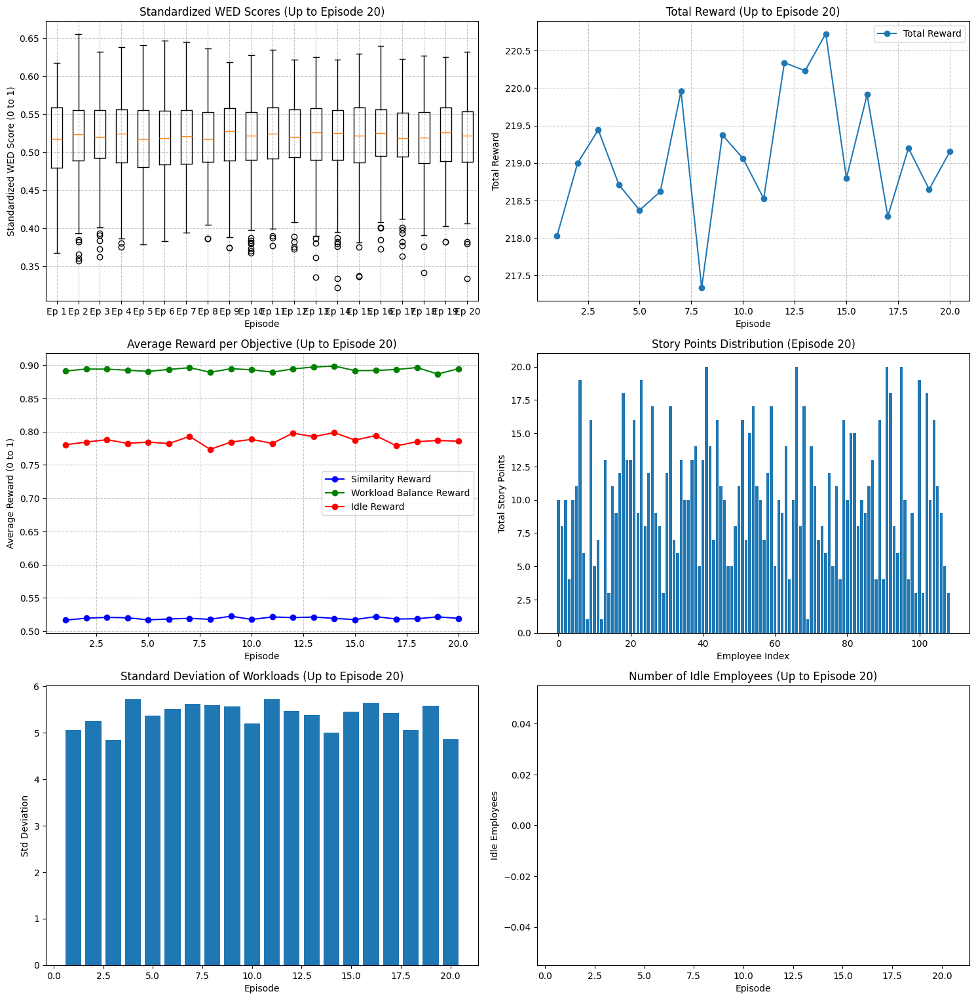

Streaming output truncated to the last 5000 lines.
Step 209/300: Action [25, 85], Reward 0.8298, Time 0.28s
Step 210/300: Action [151, 99], Reward 0.8377, Time 0.28s
Step 211/300: Action [246, 95], Reward 0.8443, Time 0.28s
Step 212/300: Action [98, 75], Reward 0.8035, Time 0.29s
Step 213/300: Action [259, 39], Reward 0.8093, Time 0.28s
Step 214/300: Action [263, 9], Reward 0.7802, Time 0.28s
Step 215/300: Action [45, 36], Reward 0.8032, Time 0.27s
Step 216/300: Action [260, 23], Reward 0.8110, Time 0.27s
Step 217/300: Action [278, 108], Reward 0.8279, Time 0.27s
Step 218/300: Action [32, 35], Reward 0.8029, Time 0.27s
Step 219/300: Action [224, 107], Reward 0.8214, Time 0.27s
Step 220/300: Action [275, 69], Reward 0.8050, Time 0.28s
Step 221/300: Action [237, 21], Reward 0.8079, Time 0.27s
Step 222/300: Action [272, 76], Reward 0.8430, Time 0.27s
Step 223/300: Action [238, 87], Reward 0.7989, Time 0.28s
Step 224/300: Action [131, 98], Reward 0.8127, Time 0.26s
Step 225/300: Action [13

<ipython-input-6-a2d43e066530>:403: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(standardized_wed_per_episode, labels=[f"Ep {i+1}" for i in range(num_episodes_to_plot)])


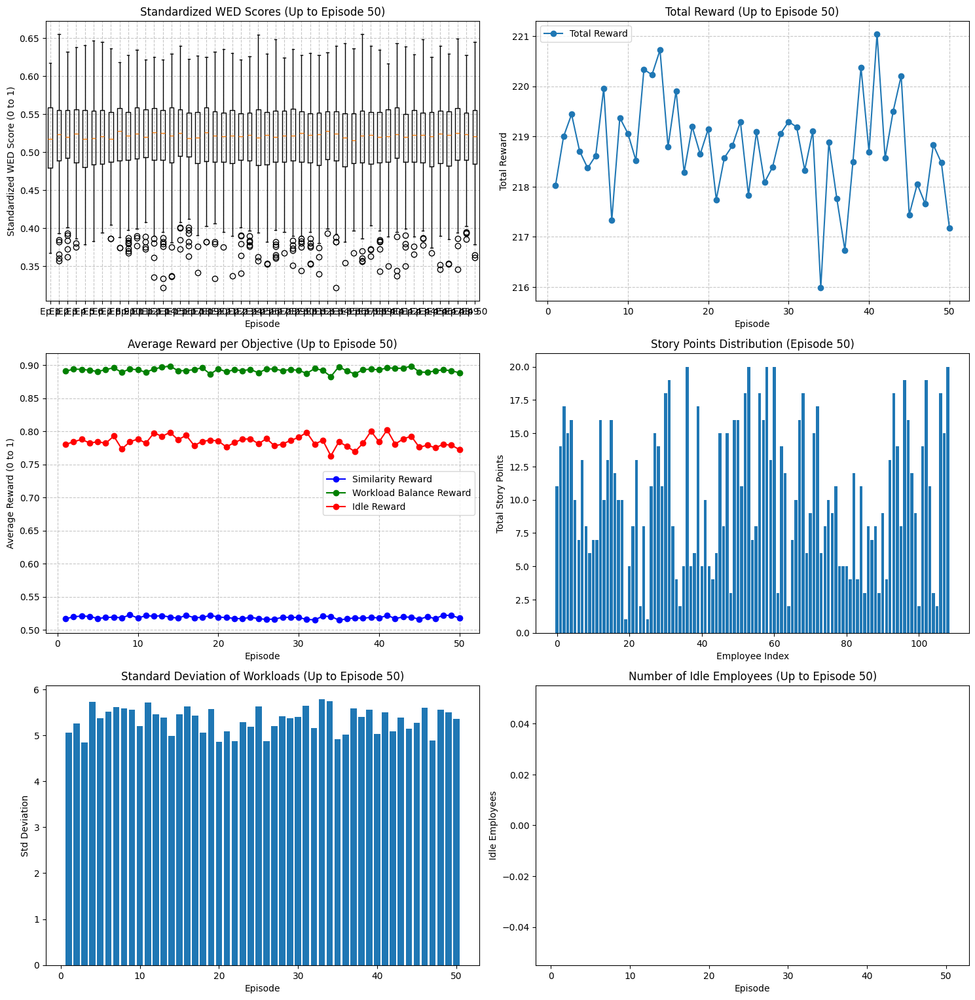

Streaming output truncated to the last 5000 lines.
Step 259/300: Action [183, 34], Reward 0.8195, Time 0.28s
Step 260/300: Action [53, 25], Reward 0.8105, Time 0.27s
Step 261/300: Action [178, 5], Reward 0.8312, Time 0.27s
Step 262/300: Action [212, 82], Reward 0.8109, Time 0.27s
Step 263/300: Action [264, 93], Reward 0.8101, Time 0.27s
Step 264/300: Action [19, 11], Reward 0.8233, Time 0.27s
Step 265/300: Action [132, 39], Reward 0.8019, Time 0.27s
Step 266/300: Action [243, 90], Reward 0.8240, Time 0.27s
Step 267/300: Action [62, 13], Reward 0.8093, Time 0.27s
Step 268/300: Action [232, 67], Reward 0.8188, Time 0.27s
Step 269/300: Action [50, 63], Reward 0.8101, Time 0.26s
Step 270/300: Action [211, 33], Reward 0.8317, Time 0.26s
Step 271/300: Action [265, 54], Reward 0.8291, Time 0.26s
Step 272/300: Action [33, 108], Reward 0.7960, Time 0.27s
Step 273/300: Action [114, 89], Reward 0.8128, Time 0.26s
Step 274/300: Action [226, 64], Reward 0.8225, Time 0.27s
Step 275/300: Action [109,

<ipython-input-6-a2d43e066530>:403: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(standardized_wed_per_episode, labels=[f"Ep {i+1}" for i in range(num_episodes_to_plot)])


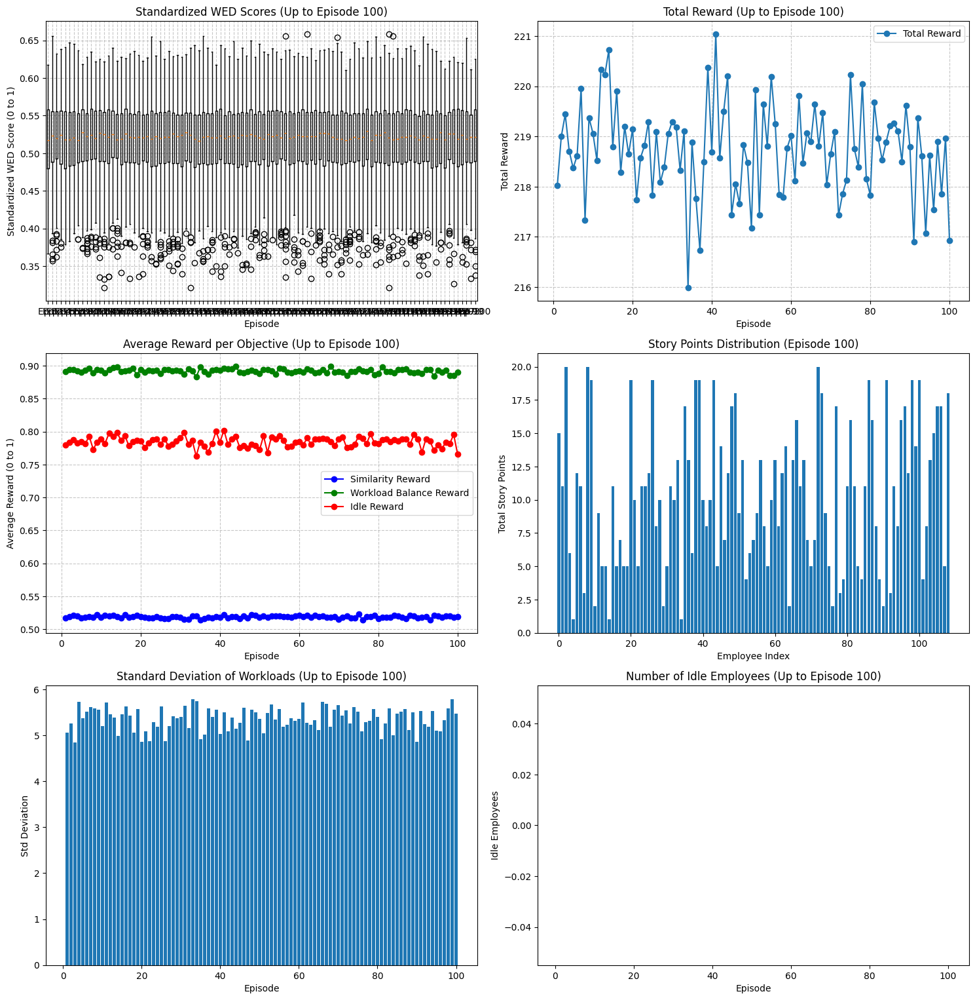

Model saved to /content/drive/MyDrive/Skripsi/dqn_model_weighted_eps100.pth, Agent params (temperature only) to /content/drive/MyDrive/Skripsi/dqn_agent_params_weighted_eps100.pth
Model saved to /content/drive/MyDrive/Skripsi/dqn_model_weighted.pth, Agent params (temperature only) to /content/drive/MyDrive/Skripsi/dqn_agent_params_weighted.pth

Tabular Summary of Rewards up to Episode 100:
--------------------------------------------------------------------------------
Episode    Total Reward    Similarity      Workload        Idle            Std Dev    Idle Emp  
--------------------------------------------------------------------------------
1          218.0233        0.5167          0.8910          0.7802          5.0602     0         
2          218.9977        0.5195          0.8940          0.7842          5.2558     0         
3          219.4428        0.5208          0.8938          0.7878          4.8434     0         
4          218.7083        0.5201          0.8923        

<ipython-input-6-a2d43e066530>:403: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(standardized_wed_per_episode, labels=[f"Ep {i+1}" for i in range(num_episodes_to_plot)])


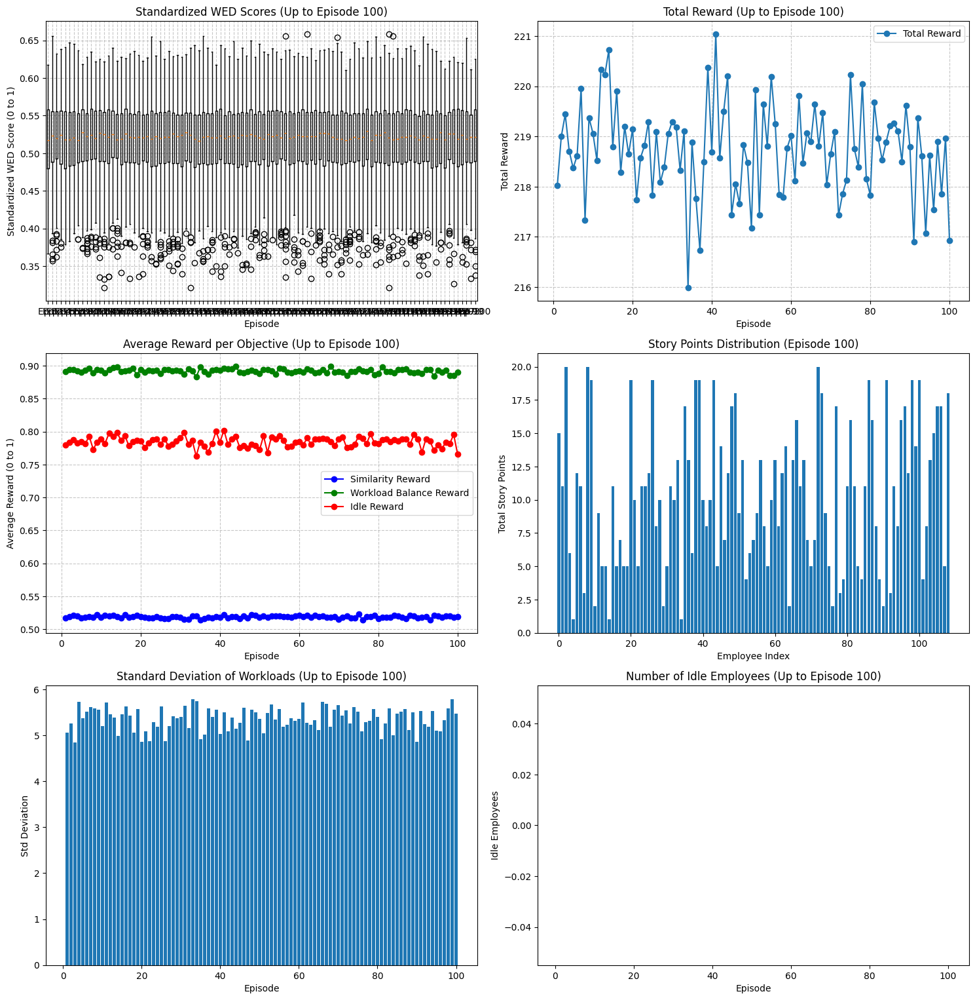

In [ ]:
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch_geometric.nn import GATConv
from torch_geometric.data import Data, Batch
from sklearn.impute import SimpleImputer
import gym
from gym import spaces
import random
from collections import deque
import matplotlib.pyplot as plt
import seaborn as sns
import time

# Global Variables for Flexibility
NUM_EMPLOYEES = 109
NUM_TASKS = 300
NUM_EPISODES = 100  # Updated to 100 episodes
LEARNING_RATE = 5e-5
TEMPERATURE = 1.0
TEMPERATURE_DECAY = 0.995
MIN_TEMPERATURE = 0.1
GAMMA = 0.99
MEMORY_SIZE = 50000
BATCH_SIZE = 64
TARGET_UPDATE_FREQ = 100
GNN_HIDDEN_DIM = 16
GNN_OUTPUT_DIM = 32
DQN_HIDDEN_DIM = 128
MAX_WORKLOAD = 20
WEIGHT_SIMILARITY = 0.35
WEIGHT_WORKLOAD = 0.35
WEIGHT_IDLE = 0.30

if not abs(WEIGHT_SIMILARITY + WEIGHT_WORKLOAD + WEIGHT_IDLE - 1.0) < 1e-6:
    raise ValueError(f"Reward weights must sum to 1, but got {WEIGHT_SIMILARITY + WEIGHT_WORKLOAD + WEIGHT_IDLE}")

task_data_path = '/content/drive/MyDrive/Skripsi/Resources/Datasets/fixed_data_task.csv'
employee_data_path = '/content/drive/MyDrive/Skripsi/Resources/Datasets/fixed_data_employee.csv'
model_save_path = '/content/drive/MyDrive/Skripsi/dqn_model_weighted.pth'
agent_save_path = '/content/drive/MyDrive/Skripsi/dqn_agent_params_weighted.pth'

# Load and clean datasets
task_data = pd.read_csv(task_data_path)
employee_data = pd.read_csv(employee_data_path)
task_subset = task_data.iloc[:NUM_TASKS]
employee_subset = employee_data.iloc[:NUM_EMPLOYEES]
skill_columns = [col for col in task_data.columns if col not in ['task_id', 'story_points', 'project_id']]

project_id_map = {pid: idx + 1 for idx, pid in enumerate(task_subset['project_id'].unique())}
project_ids = task_subset['project_id'].map(project_id_map).values

task_skills = task_subset[skill_columns].values
employee_skills = employee_subset[skill_columns].values
story_points = task_subset['story_points'].values
task_skills = task_skills / 5.0
employee_skills = employee_skills / 5.0
imputer = SimpleImputer(strategy='mean')
task_skills = imputer.fit_transform(task_skills)
employee_skills = imputer.fit_transform(employee_skills)

class TaskAssignmentEnv(gym.Env):
    def __init__(self, task_skills, employee_skills, story_points, project_ids):
        super(TaskAssignmentEnv, self).__init__()
        self.task_skills = task_skills
        self.employee_skills = employee_skills
        self.story_points = story_points
        self.project_ids = project_ids
        self.max_workload = MAX_WORKLOAD
        self.num_tasks = len(task_skills)
        self.num_employees = len(employee_skills)
        self.task_feature_dim = 66 + 3
        self.employee_feature_dim = 66 + 3
        self.observation_space = spaces.Dict({
            'task_features': spaces.Box(low=0, high=1, shape=(self.num_tasks, self.task_feature_dim), dtype=np.float32),
            'employee_features': spaces.Box(low=0, high=1, shape=(self.num_employees, self.employee_feature_dim), dtype=np.float32),
            'task_mask': spaces.Box(low=0, high=1, shape=(self.num_tasks,), dtype=np.float32)
        })
        self.action_space = spaces.MultiDiscrete([self.num_tasks, self.num_employees])
        self.edge_index = self._create_edge_index()
        self.total_story_points = np.sum(self.story_points)
        workloads = np.zeros(self.num_employees)
        workloads[0] = self.max_workload
        mean_workload = self.max_workload / self.num_employees
        self.actual_max_std = np.sqrt(np.sum((workloads - mean_workload) ** 2) / self.num_employees)
        self.max_possible_cv = (self.actual_max_std / mean_workload)

    def _create_edge_index(self):
        edge_index = []
        for t in range(self.num_tasks):
            for e in range(self.num_employees):
                edge_index.append([t, self.num_tasks + e])
                edge_index.append([self.num_tasks + e, t])
        return torch.tensor(edge_index, dtype=torch.long).t().contiguous()

    def reset(self):
        self.workloads = np.zeros(self.num_employees)
        self.assignments = -np.ones(self.num_tasks, dtype=int)
        self.remaining_tasks = list(range(self.num_tasks))
        self.wed_scores = []
        self.similarity_scores = []
        self.total_assigned_story_points = 0
        self.employee_projects = np.full(self.num_employees, -1, dtype=int)
        return self._get_obs()

    def _get_obs(self):
        task_features = np.zeros((self.num_tasks, self.task_feature_dim))
        for t in range(self.num_tasks):
            task_features[t, :65] = self.task_skills[t]
            task_features[t, 65] = self.story_points[t] / 20.0
            task_features[t, 66] = len(self.remaining_tasks) / self.num_tasks
            num_idle = np.sum(self.workloads == 0)
            task_features[t, 67] = num_idle / self.num_employees
            mean_workload = np.mean(self.workloads) if np.sum(self.workloads) > 0 else 1e-6
            std_workload = np.std(self.workloads)
            cv = std_workload / mean_workload if mean_workload > 0 else 0
            task_features[t, 68] = cv / self.max_possible_cv

        employee_features = np.zeros((self.num_employees, self.employee_feature_dim))
        for e in range(self.num_employees):
            employee_features[e, :65] = self.employee_skills[e]
            employee_features[e, 65] = self.workloads[e] / self.max_workload
            employee_features[e, 66:69] = 0

        task_mask = np.zeros(self.num_tasks)
        for t in range(self.num_tasks):
            task_mask[t] = 1 if t in self.remaining_tasks else 0

        return {
            'task_features': task_features.astype(np.float32),
            'employee_features': employee_features.astype(np.float32),
            'task_mask': task_mask.astype(np.float32)
        }

    def _compute_wed(self, emp_idx, task_idx, alpha=0.5):
        emp_skills = self.employee_skills[emp_idx]
        task_skills = self.task_skills[task_idx]
        diff = emp_skills - task_skills
        weights = 1 / (1 + alpha * np.maximum(0, emp_skills - task_skills))
        wed = np.sqrt(np.sum(weights * diff ** 2))
        if np.isnan(wed):
            print(f"Warning: WED is nan for emp_idx={emp_idx}, task_idx={task_idx}")
        return wed

    def step(self, action):
        task_idx, emp_idx = action
        done = False
        reward = 0
        info = {}

        task_project = self.project_ids[task_idx]
        emp_project = self.employee_projects[emp_idx]
        if emp_project != -1 and emp_project != task_project:
            reward = -1.0
            info['invalid_action'] = 'Employee assigned to a different project'
            return self._get_obs(), reward, done, info

        self.assignments[task_idx] = emp_idx
        self.workloads[emp_idx] += self.story_points[task_idx]
        self.total_assigned_story_points += self.story_points[task_idx]
        self.remaining_tasks.remove(task_idx)

        if self.employee_projects[emp_idx] == -1:
            self.employee_projects[emp_idx] = task_project

        wed = self._compute_wed(emp_idx, task_idx)
        self.wed_scores.append(wed)
        alpha = 0.5
        weights_worst = 1 / (1 + alpha * 1)
        wed_worst = np.sqrt(np.sum(weights_worst * (0 - 1) ** 2) * 65)
        similarity_reward = 1 - (wed / wed_worst)
        if np.isnan(similarity_reward):
            print(f"Error: Similarity is nan for task_idx={task_idx}, emp_idx={emp_idx}, wed={wed}")
            similarity_reward = 0
        self.similarity_scores.append(similarity_reward)

        mean_workload = np.mean(self.workloads) if np.sum(self.workloads) > 0 else 1e-6
        std_workload = np.std(self.workloads)
        cv = std_workload / mean_workload if mean_workload > 0 else 0
        workload_balance_reward = 1 - (cv / self.max_possible_cv)

        num_idle = np.sum(self.workloads == 0)
        idle_reward = 1 - (num_idle / self.num_employees)

        reward = (WEIGHT_SIMILARITY * similarity_reward) + (WEIGHT_WORKLOAD * workload_balance_reward) + (WEIGHT_IDLE * idle_reward)

        info['similarity_reward'] = similarity_reward
        info['workload_balance_reward'] = workload_balance_reward
        info['idle_reward'] = idle_reward

        if len(self.remaining_tasks) == 0:
            done = True
            info['total_wed'] = np.sum(self.wed_scores)
            info['similarity_scores'] = self.similarity_scores

        return self._get_obs(), reward, done, info

class GNN(nn.Module):
    def __init__(self, input_dim):
        super(GNN, self).__init__()
        self.conv1 = GATConv(input_dim, GNN_HIDDEN_DIM, heads=4, concat=True)
        self.conv2 = GATConv(GNN_HIDDEN_DIM * 4, GNN_OUTPUT_DIM, heads=1, concat=False)

    def forward(self, data):
        x, edge_index = data.x, data.edge_index
        x = F.relu(self.conv1(x, edge_index))
        x = self.conv2(x, edge_index)
        return x

class DQN(nn.Module):
    def __init__(self, gnn, num_tasks, num_employees):
        super(DQN, self).__init__()
        self.gnn = gnn
        self.num_tasks = num_tasks
        self.num_employees = num_employees
        self.embedding_dim = GNN_OUTPUT_DIM
        self.fc1 = nn.Linear(self.embedding_dim * 2, DQN_HIDDEN_DIM)
        self.fc2 = nn.Linear(DQN_HIDDEN_DIM, 1)

    def forward(self, obs, graph_data, valid_action_indices=None):
        embeddings = self.gnn(graph_data)
        task_embeddings = embeddings[:self.num_tasks]
        employee_embeddings = embeddings[self.num_tasks:]

        if valid_action_indices is not None:
            task_indices = valid_action_indices[:, 0]
            emp_indices = valid_action_indices[:, 1]
            task_emb = task_embeddings[task_indices]
            emp_emb = employee_embeddings[emp_indices]
            pair_embeddings = torch.cat([task_emb, emp_emb], dim=-1)
            x = F.relu(self.fc1(pair_embeddings))
            q_values = self.fc2(x).squeeze(-1)
            return q_values
        else:
            task_embeddings = task_embeddings.unsqueeze(1).expand(-1, self.num_employees, -1)
            employee_embeddings = employee_embeddings.unsqueeze(0).expand(self.num_tasks, -1, -1)
            pair_embeddings = torch.cat([task_embeddings, employee_embeddings], dim=-1)
            x = F.relu(self.fc1(pair_embeddings))
            q_values = self.fc2(x).squeeze(-1)
            return q_values

class DQNAgent:
    def __init__(self, task_feature_dim, employee_feature_dim, num_tasks, num_employees):
        self.device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
        self.gnn = GNN(input_dim=69).to(self.device)
        self.model = DQN(self.gnn, num_tasks, num_employees).to(self.device)
        self.target_model = DQN(self.gnn, num_tasks, num_employees).to(self.device)
        self.target_model.load_state_dict(self.model.state_dict())
        self.optimizer = torch.optim.Adam(self.model.parameters(), lr=LEARNING_RATE)
        self.memory = deque(maxlen=MEMORY_SIZE)
        self.batch_size = BATCH_SIZE
        self.temperature = TEMPERATURE
        self.temperature_decay = TEMPERATURE_DECAY
        self.min_temperature = MIN_TEMPERATURE
        self.gamma = GAMMA
        self.num_tasks = num_tasks
        self.num_employees = num_employees

    def act(self, obs, graph_data, env):
        task_mask = torch.tensor(obs['task_mask'], dtype=torch.float32).to(self.device)
        valid_tasks = [t for t in range(env.num_tasks) if task_mask[t] == 1]
        if not valid_tasks:
            return [0, 0]

        valid_action_indices = []
        for t in valid_tasks:
            task_project = env.project_ids[t]
            for e in range(env.num_employees):
                current_workload = obs['employee_features'][e, 65] * env.max_workload
                emp_project = env.employee_projects[e]
                if (current_workload + env.story_points[t] <= env.max_workload and
                    (emp_project == -1 or emp_project == task_project)):
                    valid_action_indices.append([t, e])

        if not valid_action_indices:
            return [0, 0]

        valid_action_indices = torch.tensor(valid_action_indices, dtype=torch.long).to(self.device)

        with torch.no_grad():
            q_values = self.model(obs, graph_data, valid_action_indices=valid_action_indices)
            scaled_q = q_values / self.temperature
            exp_q = torch.exp(scaled_q - torch.max(scaled_q))
            probs = exp_q / torch.sum(exp_q)
            action_idx = torch.multinomial(probs, 1).item()
            action = valid_action_indices[action_idx]
            return action.tolist()

    def remember(self, state, action, reward, next_state, done):
        self.memory.append((state, action, reward, next_state, done))

    def replay(self, env):
        if len(self.memory) < self.batch_size:
            return
        batch = random.sample(self.memory, self.batch_size)
        states, actions, rewards, next_states, dones = zip(*batch)

        state_graphs = [Data(x=torch.cat([torch.tensor(s['task_features'], dtype=torch.float32),
                                          torch.tensor(s['employee_features'], dtype=torch.float32)]),
                             edge_index=env.edge_index) for s in states]
        state_batch = Batch.from_data_list(state_graphs).to(self.device)

        next_state_graphs = [Data(x=torch.cat([torch.tensor(s['task_features'], dtype=torch.float32),
                                               torch.tensor(s['employee_features'], dtype=torch.float32)]),
                                  edge_index=env.edge_index) for s in next_states]
        next_state_batch = Batch.from_data_list(next_state_graphs).to(self.device)

        state_embeddings = self.model.gnn(state_batch)
        next_state_embeddings = self.target_model.gnn(next_state_batch)

        state_task_embeddings = state_embeddings[:self.batch_size * self.num_tasks].view(self.batch_size, self.num_tasks, -1)
        state_employee_embeddings = state_embeddings[self.batch_size * self.num_tasks:].view(self.batch_size, self.num_employees, -1)
        next_state_task_embeddings = next_state_embeddings[:self.batch_size * self.num_tasks].view(self.batch_size, self.num_tasks, -1)
        next_state_employee_embeddings = next_state_embeddings[self.batch_size * self.num_tasks:].view(self.batch_size, self.num_employees, -1)

        q_values = []
        next_q_values = []
        for i in range(self.batch_size):
            task_emb = state_task_embeddings[i]
            emp_emb = state_employee_embeddings[i]
            pair_emb = torch.cat([task_emb.unsqueeze(1).expand(-1, self.num_employees, -1),
                                  emp_emb.unsqueeze(0).expand(self.num_tasks, -1, -1)], dim=-1)
            x = F.relu(self.model.fc1(pair_emb))
            q_vals = self.model.fc2(x).squeeze(-1)
            q_values.append(q_vals)

            with torch.no_grad():
                next_task_emb = next_state_task_embeddings[i]
                next_emp_emb = next_state_employee_embeddings[i]
                next_pair_emb = torch.cat([next_task_emb.unsqueeze(1).expand(-1, self.num_employees, -1),
                                           next_emp_emb.unsqueeze(0).expand(self.num_tasks, -1, -1)], dim=-1)
                next_x = F.relu(self.target_model.fc1(next_pair_emb))
                next_q_vals = self.target_model.fc2(next_x).squeeze(-1)
                next_q_values.append(next_q_vals)

        q_values = torch.stack(q_values)
        next_q_values = torch.stack(next_q_values)

        actions = torch.tensor(actions, dtype=torch.long).to(self.device)
        rewards = torch.tensor(rewards, dtype=torch.float32).to(self.device)
        dones = torch.tensor(dones, dtype=torch.float32).to(self.device)

        task_idx = actions[:, 0]
        emp_idx = actions[:, 1]
        q_values_selected = q_values[torch.arange(self.batch_size), task_idx, emp_idx]

        next_q_values_max = next_q_values.max(dim=2)[0].max(dim=1)[0]
        targets = rewards + (1 - dones) * self.gamma * next_q_values_max

        loss = F.mse_loss(q_values_selected, targets)
        self.optimizer.zero_grad()
        loss.backward()
        self.optimizer.step()

    def update_target(self):
        self.target_model.load_state_dict(self.model.state_dict())

    def save(self, model_path, agent_path):
        torch.save({
            'model_state_dict': self.model.state_dict(),
            'target_model_state_dict': self.target_model.state_dict(),
            'optimizer_state_dict': self.optimizer.state_dict()
        }, model_path)
        torch.save({'temperature': self.temperature}, agent_path)
        print(f"Model saved to {model_path}, Agent params (temperature only) to {agent_path}")

    def load(self, model_path, agent_path):
        checkpoint = torch.load(model_path)
        self.model.load_state_dict(checkpoint['model_state_dict'])
        self.target_model.load_state_dict(checkpoint['target_model_state_dict'])
        self.optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
        agent_params = torch.load(agent_path)
        self.temperature = agent_params['temperature']
        self.memory = deque(maxlen=MEMORY_SIZE)
        print(f"Model loaded from {model_path}, Agent params (temperature only) from {agent_path}")


def plot_and_summarize(episode_data, wed_scores_list, total_rewards, similarity_rewards, workload_balance_rewards, idle_rewards, workloads_list, std_workloads_list, idle_employees_list, env, num_episodes_to_plot):
    # Tabular Summary
    print(f"\nTabular Summary of Rewards up to Episode {num_episodes_to_plot}:")
    print("-" * 80)
    print(f"{'Episode':<10} {'Total Reward':<15} {'Similarity':<15} {'Workload':<15} {'Idle':<15} {'Std Dev':<10} {'Idle Emp':<10}")
    print("-" * 80)
    for data in episode_data:
        if data['Episode'] <= num_episodes_to_plot:
            print(f"{data['Episode']:<10} {data['Total Reward']:<15.4f} {data['Similarity Reward']:<15.4f} {data['Workload Balance Reward']:<15.4f} {data['Idle Reward']:<15.4f} {data['Std Workloads']:<10.4f} {data['Idle Employees']:<10}")
    print("-" * 80)

    # Visualizations
    plt.figure(figsize=(15, 20))

    plt.subplot(4, 2, 1)
    alpha = 0.5
    weights_worst = 1 / (1 + alpha * 1)
    wed_raw_worst = np.sqrt(np.sum(weights_worst * (0 - 1) ** 2) * 65)
    wed_raw_best = 0
    standardized_wed_per_episode = []
    for episode_wed_scores in wed_scores_list[:num_episodes_to_plot]:
        standardized_wed = [(wed_raw_worst - wed) / (wed_raw_worst - wed_raw_best) for wed in episode_wed_scores]
        standardized_wed_per_episode.append(standardized_wed)
    plt.boxplot(standardized_wed_per_episode, labels=[f"Ep {i+1}" for i in range(num_episodes_to_plot)])
    plt.title(f'Standardized WED Scores (Up to Episode {num_episodes_to_plot})')
    plt.xlabel('Episode')
    plt.ylabel('Standardized WED Score (0 to 1)')
    plt.grid(True, linestyle='--', alpha=0.7)

    plt.subplot(4, 2, 2)
    plt.plot(range(1, num_episodes_to_plot + 1), total_rewards[:num_episodes_to_plot], marker='o', label='Total Reward')
    plt.title(f'Total Reward (Up to Episode {num_episodes_to_plot})')
    plt.xlabel('Episode')
    plt.ylabel('Total Reward')
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.legend()

    plt.subplot(4, 2, 3)
    plt.plot(range(1, num_episodes_to_plot + 1), similarity_rewards[:num_episodes_to_plot], marker='o', label='Similarity Reward', color='blue')
    plt.plot(range(1, num_episodes_to_plot + 1), workload_balance_rewards[:num_episodes_to_plot], marker='o', label='Workload Balance Reward', color='green')
    plt.plot(range(1, num_episodes_to_plot + 1), idle_rewards[:num_episodes_to_plot], marker='o', label='Idle Reward', color='red')
    plt.title(f'Average Reward per Objective (Up to Episode {num_episodes_to_plot})')
    plt.xlabel('Episode')
    plt.ylabel('Average Reward (0 to 1)')
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.legend()

    plt.subplot(4, 2, 4)
    plt.bar(range(env.num_employees), workloads_list[num_episodes_to_plot - 1])
    plt.title(f'Story Points Distribution (Episode {num_episodes_to_plot})')
    plt.xlabel('Employee Index')
    plt.ylabel('Total Story Points')

    plt.subplot(4, 2, 5)
    plt.bar(range(1, num_episodes_to_plot + 1), std_workloads_list[:num_episodes_to_plot])
    plt.title(f'Standard Deviation of Workloads (Up to Episode {num_episodes_to_plot})')
    plt.xlabel('Episode')
    plt.ylabel('Std Deviation')

    plt.subplot(4, 2, 6)
    plt.bar(range(1, num_episodes_to_plot + 1), idle_employees_list[:num_episodes_to_plot])
    plt.title(f'Number of Idle Employees (Up to Episode {num_episodes_to_plot})')
    plt.xlabel('Episode')
    plt.ylabel('Idle Employees')

    plt.tight_layout()
    plt.show()

def train_dqn():
    env = TaskAssignmentEnv(task_skills, employee_skills, story_points, project_ids)
    agent = DQNAgent(env.task_feature_dim, env.employee_feature_dim, env.num_tasks, env.num_employees)
    total_rewards = []
    wed_scores_list = []
    workloads_list = []
    std_workloads_list = []
    idle_employees_list = []
    similarity_rewards = []
    workload_balance_rewards = []
    idle_rewards = []
    global_step = 0
    episode_data = []

    checkpoint_episodes = [20, 50, 100]  # Episodes where we save and visualize

    for episode in range(NUM_EPISODES):
        obs = env.reset()
        graph_data = Data(x=torch.cat([torch.tensor(obs['task_features'], dtype=torch.float32),
                                      torch.tensor(obs['employee_features'], dtype=torch.float32)]).to(agent.device),
                         edge_index=env.edge_index.to(agent.device))
        total_reward = 0
        episode_similarity = 0
        episode_workload_balance = 0
        episode_idle_reward = 0
        done = False
        step = 0

        print(f"Episode {episode+1}/{NUM_EPISODES}")
        while not done:
            step += 1
            global_step += 1
            start_time = time.time()
            action = agent.act(obs, graph_data, env)
            next_obs, reward, done, info = env.step(action)
            next_graph_data = Data(x=torch.cat([torch.tensor(next_obs['task_features'], dtype=torch.float32),
                                                torch.tensor(next_obs['employee_features'], dtype=torch.float32)]).to(agent.device),
                                   edge_index=env.edge_index.to(agent.device))
            agent.remember(obs, action, reward, next_obs, done)
            agent.replay(env)
            obs = next_obs
            graph_data = next_graph_data
            total_reward += reward
            if 'similarity_reward' in info:
                episode_similarity += info['similarity_reward']
            if 'workload_balance_reward' in info:
                episode_workload_balance += info['workload_balance_reward']
            if 'idle_reward' in info:
                episode_idle_reward += info['idle_reward']
            step_time = time.time() - start_time
            print(f"Step {step}/{env.num_tasks}: Action {action}, Reward {reward:.4f}, Time {step_time:.2f}s")

            if global_step % TARGET_UPDATE_FREQ == 0:
                agent.update_target()

        agent.temperature = max(agent.min_temperature, agent.temperature * agent.temperature_decay)

        total_rewards.append(total_reward)
        wed_scores_list.append(env.wed_scores.copy())
        workloads_list.append(env.workloads.copy())
        std_workloads = np.std(env.workloads)
        num_idle = np.sum(env.workloads == 0)
        std_workloads_list.append(std_workloads)
        idle_employees_list.append(num_idle)
        avg_similarity = episode_similarity / step
        avg_workload_balance = episode_workload_balance / step
        avg_idle = episode_idle_reward / step
        similarity_rewards.append(avg_similarity)
        workload_balance_rewards.append(avg_workload_balance)
        idle_rewards.append(avg_idle)

        episode_data.append({
            'Episode': episode + 1,
            'Total Reward': total_reward,
            'Similarity Reward': avg_similarity,
            'Workload Balance Reward': avg_workload_balance,
            'Idle Reward': avg_idle,
            'Std Workloads': std_workloads,
            'Idle Employees': num_idle
        })

        print(f"Episode {episode+1} - Total Reward: {total_reward:.2f}, Std Workloads: {std_workloads:.2f}, Idle Employees: {num_idle}")
        print(f"Average Similarity Reward: {avg_similarity:.4f}, Workload Balance Reward: {avg_workload_balance:.4f}, Idle Reward: {avg_idle:.4f}")

        # Check if the current episode is a checkpoint episode (20, 50, 100)
        if episode + 1 in checkpoint_episodes:
            print(f"\nCheckpoint at Episode {episode + 1}")
            # Visualize and summarize up to this episode
            plot_and_summarize(
                episode_data=episode_data,
                wed_scores_list=wed_scores_list,
                total_rewards=total_rewards,
                similarity_rewards=similarity_rewards,
                workload_balance_rewards=workload_balance_rewards,
                idle_rewards=idle_rewards,
                workloads_list=workloads_list,
                std_workloads_list=std_workloads_list,
                idle_employees_list=idle_employees_list,
                env=env,
                num_episodes_to_plot=episode + 1
            )
            # Save the model and agent with episode-specific suffix
            checkpoint_model_path = f"/content/drive/MyDrive/Skripsi/dqn_model_weighted_eps{episode + 1}.pth"
            checkpoint_agent_path = f"/content/drive/MyDrive/Skripsi/dqn_agent_params_weighted_eps{episode + 1}.pth"
            agent.save(checkpoint_model_path, checkpoint_agent_path)

    # Final save after all episodes
    agent.save(model_save_path, agent_save_path)

    # Final visualization and summary for all episodes
    plot_and_summarize(
        episode_data=episode_data,
        wed_scores_list=wed_scores_list,
        total_rewards=total_rewards,
        similarity_rewards=similarity_rewards,
        workload_balance_rewards=workload_balance_rewards,
        idle_rewards=idle_rewards,
        workloads_list=workloads_list,
        std_workloads_list=std_workloads_list,
        idle_employees_list=idle_employees_list,
        env=env,
        num_episodes_to_plot=NUM_EPISODES
    )

    return env, workloads_list, std_workloads_list, idle_employees_list, NUM_EPISODES, episode_data

# Run training
env, workloads_list, std_workloads_list, idle_employees_list, num_episodes, episode_data = train_dqn()

## Adjusted approach with missing values handled with 0

Episode 1/1
Step 1/300: Action [49, 52], Reward 0.1994, Time 1.13s
Step 2/300: Action [172, 64], Reward 0.2830, Time 0.35s
Step 3/300: Action [208, 44], Reward 0.3166, Time 0.13s
Step 4/300: Action [91, 14], Reward 0.3647, Time 0.13s
Step 5/300: Action [252, 63], Reward 0.3677, Time 0.13s
Step 6/300: Action [193, 48], Reward 0.3994, Time 0.13s
Step 7/300: Action [50, 78], Reward 0.4402, Time 0.35s
Step 8/300: Action [123, 60], Reward 0.3958, Time 0.13s
Step 9/300: Action [170, 104], Reward 0.4305, Time 0.13s
Step 10/300: Action [237, 85], Reward 0.4658, Time 0.13s
Step 11/300: Action [90, 74], Reward 0.4569, Time 0.35s
Step 12/300: Action [234, 17], Reward 0.4529, Time 0.13s
Step 13/300: Action [272, 80], Reward 0.4742, Time 0.13s
Step 14/300: Action [29, 6], Reward 0.4794, Time 0.13s
Step 15/300: Action [281, 86], Reward 0.4631, Time 0.13s
Step 16/300: Action [205, 62], Reward 0.4672, Time 0.12s
Step 17/300: Action [139, 76], Reward 0.4989, Time 0.34s
Step 18/300: Action [140, 45], Re

<ipython-input-3-85c29b80eafe>:398: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(standardized_wed_per_episode, labels=[f"Ep {i+1}" for i in range(num_episodes_to_plot)])


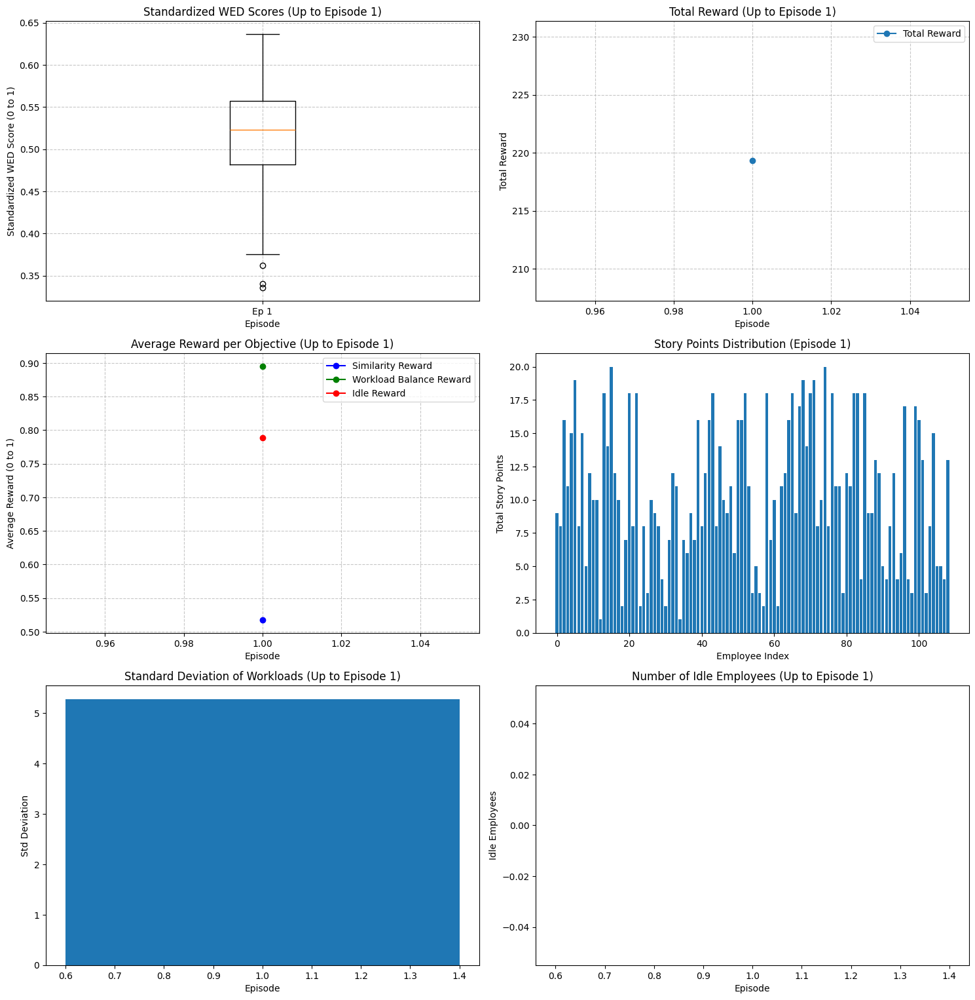

In [ ]:
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch_geometric.nn import GATConv
from torch_geometric.data import Data, Batch
import gym
from gym import spaces
import random
from collections import deque
import matplotlib.pyplot as plt
import seaborn as sns
import time

# Global Variables for Flexibility
NUM_EMPLOYEES = 109
NUM_TASKS = 300
NUM_EPISODES = 1 # Updated to 100 episodes
LEARNING_RATE = 5e-5
TEMPERATURE = 1.0
TEMPERATURE_DECAY = 0.995
MIN_TEMPERATURE = 0.1
GAMMA = 0.99
MEMORY_SIZE = 50000
BATCH_SIZE = 64
TARGET_UPDATE_FREQ = 100
GNN_HIDDEN_DIM = 16
GNN_OUTPUT_DIM = 32
DQN_HIDDEN_DIM = 128
MAX_WORKLOAD = 20
WEIGHT_SIMILARITY = 0.35
WEIGHT_WORKLOAD = 0.35
WEIGHT_IDLE = 0.30

if not abs(WEIGHT_SIMILARITY + WEIGHT_WORKLOAD + WEIGHT_IDLE - 1.0) < 1e-6:
    raise ValueError(f"Reward weights must sum to 1, but got {WEIGHT_SIMILARITY + WEIGHT_WORKLOAD + WEIGHT_IDLE}")

task_data_path = '/content/drive/MyDrive/Skripsi/Resources/Datasets/fixed_data_task.csv'
employee_data_path = '/content/drive/MyDrive/Skripsi/Resources/Datasets/fixed_data_employee.csv'
model_save_path = '/content/drive/MyDrive/Skripsi/dqn_model_weighted.pth'
agent_save_path = '/content/drive/MyDrive/Skripsi/dqn_agent_params_weighted.pth'

# Load and clean datasets
task_data = pd.read_csv(task_data_path)
employee_data = pd.read_csv(employee_data_path)
task_subset = task_data.iloc[:NUM_TASKS]
employee_subset = employee_data.iloc[:NUM_EMPLOYEES]
skill_columns = [col for col in task_data.columns if col not in ['task_id', 'story_points', 'project_id']]

project_id_map = {pid: idx + 1 for idx, pid in enumerate(task_subset['project_id'].unique())}
project_ids = task_subset['project_id'].map(project_id_map).values

# Normalize skills and fill missing values with 0
task_skills_df = task_subset[skill_columns].fillna(0)
employee_skills_df = employee_subset[skill_columns].fillna(0)
task_skills = task_skills_df.values / 5.0
employee_skills = employee_skills_df.values / 5.0

class TaskAssignmentEnv(gym.Env):
    def __init__(self, task_skills, employee_skills, story_points, project_ids):
        super(TaskAssignmentEnv, self).__init__()
        self.task_skills = task_skills
        self.employee_skills = employee_skills
        self.story_points = story_points
        self.project_ids = project_ids
        self.max_workload = MAX_WORKLOAD
        self.num_tasks = len(task_skills)
        self.num_employees = len(employee_skills)
        self.task_feature_dim = 66 + 3
        self.employee_feature_dim = 66 + 3
        self.observation_space = spaces.Dict({
            'task_features': spaces.Box(low=0, high=1, shape=(self.num_tasks, self.task_feature_dim), dtype=np.float32),
            'employee_features': spaces.Box(low=0, high=1, shape=(self.num_employees, self.employee_feature_dim), dtype=np.float32),
            'task_mask': spaces.Box(low=0, high=1, shape=(self.num_tasks,), dtype=np.float32)
        })
        self.action_space = spaces.MultiDiscrete([self.num_tasks, self.num_employees])
        self.edge_index = self._create_edge_index()
        self.total_story_points = np.sum(self.story_points)
        workloads = np.zeros(self.num_employees)
        workloads[0] = self.max_workload
        mean_workload = self.max_workload / self.num_employees
        self.actual_max_std = np.sqrt(np.sum((workloads - mean_workload) ** 2) / self.num_employees)
        self.max_possible_cv = (self.actual_max_std / mean_workload)

    def _create_edge_index(self):
        edge_index = []
        for t in range(self.num_tasks):
            for e in range(self.num_employees):
                edge_index.append([t, self.num_tasks + e])
                edge_index.append([self.num_tasks + e, t])
        return torch.tensor(edge_index, dtype=torch.long).t().contiguous()

    def reset(self):
        self.workloads = np.zeros(self.num_employees)
        self.assignments = -np.ones(self.num_tasks, dtype=int)
        self.remaining_tasks = list(range(self.num_tasks))
        self.wed_scores = []
        self.similarity_scores = []
        self.total_assigned_story_points = 0
        self.employee_projects = np.full(self.num_employees, -1, dtype=int)
        return self._get_obs()

    def _get_obs(self):
        task_features = np.zeros((self.num_tasks, self.task_feature_dim))
        for t in range(self.num_tasks):
            task_features[t, :65] = self.task_skills[t]
            task_features[t, 65] = self.story_points[t] / 20.0
            task_features[t, 66] = len(self.remaining_tasks) / self.num_tasks
            num_idle = np.sum(self.workloads == 0)
            task_features[t, 67] = num_idle / self.num_employees
            mean_workload = np.mean(self.workloads) if np.sum(self.workloads) > 0 else 1e-6
            std_workload = np.std(self.workloads)
            cv = std_workload / mean_workload if mean_workload > 0 else 0
            task_features[t, 68] = cv / self.max_possible_cv

        employee_features = np.zeros((self.num_employees, self.employee_feature_dim))
        for e in range(self.num_employees):
            employee_features[e, :65] = self.employee_skills[e]
            employee_features[e, 65] = self.workloads[e] / self.max_workload
            employee_features[e, 66:69] = 0

        task_mask = np.zeros(self.num_tasks)
        for t in range(self.num_tasks):
            task_mask[t] = 1 if t in self.remaining_tasks else 0

        return {
            'task_features': task_features.astype(np.float32),
            'employee_features': employee_features.astype(np.float32),
            'task_mask': task_mask.astype(np.float32)
        }

    def _compute_wed(self, emp_idx, task_idx, alpha=0.5):
        emp_skills = self.employee_skills[emp_idx]
        task_skills = self.task_skills[task_idx]
        diff = emp_skills - task_skills
        weights = 1 / (1 + alpha * np.maximum(0, emp_skills - task_skills))
        wed = np.sqrt(np.sum(weights * diff ** 2))
        if np.isnan(wed):
            print(f"Warning: WED is nan for emp_idx={emp_idx}, task_idx={task_idx}")
        return wed

    def step(self, action):
        task_idx, emp_idx = action
        done = False
        reward = 0
        info = {}

        task_project = self.project_ids[task_idx]
        emp_project = self.employee_projects[emp_idx]
        if emp_project != -1 and emp_project != task_project:
            reward = -1.0
            info['invalid_action'] = 'Employee assigned to a different project'
            return self._get_obs(), reward, done, info

        self.assignments[task_idx] = emp_idx
        self.workloads[emp_idx] += self.story_points[task_idx]
        self.total_assigned_story_points += self.story_points[task_idx]
        self.remaining_tasks.remove(task_idx)

        if self.employee_projects[emp_idx] == -1:
            self.employee_projects[emp_idx] = task_project

        wed = self._compute_wed(emp_idx, task_idx)
        self.wed_scores.append(wed)
        alpha = 0.5
        weights_worst = 1 / (1 + alpha * 1)
        wed_worst = np.sqrt(np.sum(weights_worst * (0 - 1) ** 2) * 65)
        similarity_reward = 1 - (wed / wed_worst)
        if np.isnan(similarity_reward):
            print(f"Error: Similarity is nan for task_idx={task_idx}, emp_idx={emp_idx}, wed={wed}")
            similarity_reward = 0
        self.similarity_scores.append(similarity_reward)

        mean_workload = np.mean(self.workloads) if np.sum(self.workloads) > 0 else 1e-6
        std_workload = np.std(self.workloads)
        cv = std_workload / mean_workload if mean_workload > 0 else 0
        workload_balance_reward = 1 - (cv / self.max_possible_cv)

        num_idle = np.sum(self.workloads == 0)
        idle_reward = 1 - (num_idle / self.num_employees)

        reward = (WEIGHT_SIMILARITY * similarity_reward) + (WEIGHT_WORKLOAD * workload_balance_reward) + (WEIGHT_IDLE * idle_reward)

        info['similarity_reward'] = similarity_reward
        info['workload_balance_reward'] = workload_balance_reward
        info['idle_reward'] = idle_reward

        if len(self.remaining_tasks) == 0:
            done = True
            info['total_wed'] = np.sum(self.wed_scores)
            info['similarity_scores'] = self.similarity_scores

        return self._get_obs(), reward, done, info

class GNN(nn.Module):
    def __init__(self, input_dim):
        super(GNN, self).__init__()
        self.conv1 = GATConv(input_dim, GNN_HIDDEN_DIM, heads=4, concat=True)
        self.conv2 = GATConv(GNN_HIDDEN_DIM * 4, GNN_OUTPUT_DIM, heads=1, concat=False)

    def forward(self, data):
        x, edge_index = data.x, data.edge_index
        x = F.relu(self.conv1(x, edge_index))
        x = self.conv2(x, edge_index)
        return x

class DQN(nn.Module):
    def __init__(self, gnn, num_tasks, num_employees):
        super(DQN, self).__init__()
        self.gnn = gnn
        self.num_tasks = num_tasks
        self.num_employees = num_employees
        self.embedding_dim = GNN_OUTPUT_DIM
        self.fc1 = nn.Linear(self.embedding_dim * 2, DQN_HIDDEN_DIM)
        self.fc2 = nn.Linear(DQN_HIDDEN_DIM, 1)

    def forward(self, obs, graph_data, valid_action_indices=None):
        embeddings = self.gnn(graph_data)
        task_embeddings = embeddings[:self.num_tasks]
        employee_embeddings = embeddings[self.num_tasks:]

        if valid_action_indices is not None:
            task_indices = valid_action_indices[:, 0]
            emp_indices = valid_action_indices[:, 1]
            task_emb = task_embeddings[task_indices]
            emp_emb = employee_embeddings[emp_indices]
            pair_embeddings = torch.cat([task_emb, emp_emb], dim=-1)
            x = F.relu(self.fc1(pair_embeddings))
            q_values = self.fc2(x).squeeze(-1)
            return q_values
        else:
            task_embeddings = task_embeddings.unsqueeze(1).expand(-1, self.num_employees, -1)
            employee_embeddings = employee_embeddings.unsqueeze(0).expand(self.num_tasks, -1, -1)
            pair_embeddings = torch.cat([task_embeddings, employee_embeddings], dim=-1)
            x = F.relu(self.fc1(pair_embeddings))
            q_values = self.fc2(x).squeeze(-1)
            return q_values

class DQNAgent:
    def __init__(self, task_feature_dim, employee_feature_dim, num_tasks, num_employees):
        self.device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
        self.gnn = GNN(input_dim=69).to(self.device)
        self.model = DQN(self.gnn, num_tasks, num_employees).to(self.device)
        self.target_model = DQN(self.gnn, num_tasks, num_employees).to(self.device)
        self.target_model.load_state_dict(self.model.state_dict())
        self.optimizer = torch.optim.Adam(self.model.parameters(), lr=LEARNING_RATE)
        self.memory = deque(maxlen=MEMORY_SIZE)
        self.batch_size = BATCH_SIZE
        self.temperature = TEMPERATURE
        self.temperature_decay = TEMPERATURE_DECAY
        self.min_temperature = MIN_TEMPERATURE
        self.gamma = GAMMA
        self.num_tasks = num_tasks
        self.num_employees = num_employees

    def act(self, obs, graph_data, env):
        task_mask = torch.tensor(obs['task_mask'], dtype=torch.float32).to(self.device)
        valid_tasks = [t for t in range(env.num_tasks) if task_mask[t] == 1]
        if not valid_tasks:
            return [0, 0]

        valid_action_indices = []
        for t in valid_tasks:
            task_project = env.project_ids[t]
            for e in range(env.num_employees):
                current_workload = obs['employee_features'][e, 65] * env.max_workload
                emp_project = env.employee_projects[e]
                if (current_workload + env.story_points[t] <= env.max_workload and
                    (emp_project == -1 or emp_project == task_project)):
                    valid_action_indices.append([t, e])

        if not valid_action_indices:
            return [0, 0]

        valid_action_indices = torch.tensor(valid_action_indices, dtype=torch.long).to(self.device)

        with torch.no_grad():
            q_values = self.model(obs, graph_data, valid_action_indices=valid_action_indices)
            scaled_q = q_values / self.temperature
            exp_q = torch.exp(scaled_q - torch.max(scaled_q))
            probs = exp_q / torch.sum(exp_q)
            action_idx = torch.multinomial(probs, 1).item()
            action = valid_action_indices[action_idx]
            return action.tolist()

    def remember(self, state, action, reward, next_state, done):
        self.memory.append((state, action, reward, next_state, done))

    def replay(self, env):
        if len(self.memory) < self.batch_size:
            return
        batch = random.sample(self.memory, self.batch_size)
        states, actions, rewards, next_states, dones = zip(*batch)

        state_graphs = [Data(x=torch.cat([torch.tensor(s['task_features'], dtype=torch.float32),
                                          torch.tensor(s['employee_features'], dtype=torch.float32)]),
                             edge_index=env.edge_index) for s in states]
        state_batch = Batch.from_data_list(state_graphs).to(self.device)

        next_state_graphs = [Data(x=torch.cat([torch.tensor(s['task_features'], dtype=torch.float32),
                                               torch.tensor(s['employee_features'], dtype=torch.float32)]),
                                  edge_index=env.edge_index) for s in next_states]
        next_state_batch = Batch.from_data_list(next_state_graphs).to(self.device)

        state_embeddings = self.model.gnn(state_batch)
        next_state_embeddings = self.target_model.gnn(next_state_batch)

        state_task_embeddings = state_embeddings[:self.batch_size * self.num_tasks].view(self.batch_size, self.num_tasks, -1)
        state_employee_embeddings = state_embeddings[self.batch_size * self.num_tasks:].view(self.batch_size, self.num_employees, -1)
        next_state_task_embeddings = next_state_embeddings[:self.batch_size * self.num_tasks].view(self.batch_size, self.num_tasks, -1)
        next_state_employee_embeddings = next_state_embeddings[self.batch_size * self.num_tasks:].view(self.batch_size, self.num_employees, -1)

        q_values = []
        next_q_values = []
        for i in range(self.batch_size):
            task_emb = state_task_embeddings[i]
            emp_emb = state_employee_embeddings[i]
            pair_emb = torch.cat([task_emb.unsqueeze(1).expand(-1, self.num_employees, -1),
                                  emp_emb.unsqueeze(0).expand(self.num_tasks, -1, -1)], dim=-1)
            x = F.relu(self.model.fc1(pair_emb))
            q_vals = self.model.fc2(x).squeeze(-1)
            q_values.append(q_vals)

            with torch.no_grad():
                next_task_emb = next_state_task_embeddings[i]
                next_emp_emb = next_state_employee_embeddings[i]
                next_pair_emb = torch.cat([next_task_emb.unsqueeze(1).expand(-1, self.num_employees, -1),
                                           next_emp_emb.unsqueeze(0).expand(self.num_tasks, -1, -1)], dim=-1)
                next_x = F.relu(self.target_model.fc1(next_pair_emb))
                next_q_vals = self.target_model.fc2(next_x).squeeze(-1)
                next_q_values.append(next_q_vals)

        q_values = torch.stack(q_values)
        next_q_values = torch.stack(next_q_values)

        actions = torch.tensor(actions, dtype=torch.long).to(self.device)
        rewards = torch.tensor(rewards, dtype=torch.float32).to(self.device)
        dones = torch.tensor(dones, dtype=torch.float32).to(self.device)

        task_idx = actions[:, 0]
        emp_idx = actions[:, 1]
        q_values_selected = q_values[torch.arange(self.batch_size), task_idx, emp_idx]

        next_q_values_max = next_q_values.max(dim=2)[0].max(dim=1)[0]
        targets = rewards + (1 - dones) * self.gamma * next_q_values_max

        loss = F.mse_loss(q_values_selected, targets)
        self.optimizer.zero_grad()
        loss.backward()
        self.optimizer.step()

    def update_target(self):
        self.target_model.load_state_dict(self.model.state_dict())

    def save(self, model_path, agent_path):
        torch.save({
            'model_state_dict': self.model.state_dict(),
            'target_model_state_dict': self.target_model.state_dict(),
            'optimizer_state_dict': self.optimizer.state_dict()
        }, model_path)
        torch.save({'temperature': self.temperature}, agent_path)
        print(f"Model saved to {model_path}, Agent params (temperature only) to {agent_path}")

    def load(self, model_path, agent_path):
        checkpoint = torch.load(model_path)
        self.model.load_state_dict(checkpoint['model_state_dict'])
        self.target_model.load_state_dict(checkpoint['target_model_state_dict'])
        self.optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
        agent_params = torch.load(agent_path)
        self.temperature = agent_params['temperature']
        self.memory = deque(maxlen=MEMORY_SIZE)
        print(f"Model loaded from {model_path}, Agent params (temperature only) from {agent_path}")

def plot_and_summarize(episode_data, wed_scores_list, total_rewards, similarity_rewards, workload_balance_rewards, idle_rewards, workloads_list, std_workloads_list, idle_employees_list, env, num_episodes_to_plot):
    # Tabular Summary
    print(f"\nTabular Summary of Rewards up to Episode {num_episodes_to_plot}:")
    print("-" * 80)
    print(f"{'Episode':<10} {'Total Reward':<15} {'Similarity':<15} {'Workload':<15} {'Idle':<15} {'Std Dev':<10} {'Idle Emp':<10}")
    print("-" * 80)
    for data in episode_data:
        if data['Episode'] <= num_episodes_to_plot:
            print(f"{data['Episode']:<10} {data['Total Reward']:<15.4f} {data['Similarity Reward']:<15.4f} {data['Workload Balance Reward']:<15.4f} {data['Idle Reward']:<15.4f} {data['Std Workloads']:<10.4f} {data['Idle Employees']:<10}")
    print("-" * 80)

    # Visualizations
    plt.figure(figsize=(15, 20))

    plt.subplot(4, 2, 1)
    alpha = 0.5
    weights_worst = 1 / (1 + alpha * 1)
    wed_raw_worst = np.sqrt(np.sum(weights_worst * (0 - 1) ** 2) * 65)
    wed_raw_best = 0
    standardized_wed_per_episode = []
    for episode_wed_scores in wed_scores_list[:num_episodes_to_plot]:
        standardized_wed = [(wed_raw_worst - wed) / (wed_raw_worst - wed_raw_best) for wed in episode_wed_scores]
        standardized_wed_per_episode.append(standardized_wed)
    plt.boxplot(standardized_wed_per_episode, labels=[f"Ep {i+1}" for i in range(num_episodes_to_plot)])
    plt.title(f'Standardized WED Scores (Up to Episode {num_episodes_to_plot})')
    plt.xlabel('Episode')
    plt.ylabel('Standardized WED Score (0 to 1)')
    plt.grid(True, linestyle='--', alpha=0.7)

    plt.subplot(4, 2, 2)
    plt.plot(range(1, num_episodes_to_plot + 1), total_rewards[:num_episodes_to_plot], marker='o', label='Total Reward')
    plt.title(f'Total Reward (Up to Episode {num_episodes_to_plot})')
    plt.xlabel('Episode')
    plt.ylabel('Total Reward')
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.legend()

    plt.subplot(4, 2, 3)
    plt.plot(range(1, num_episodes_to_plot + 1), similarity_rewards[:num_episodes_to_plot], marker='o', label='Similarity Reward', color='blue')
    plt.plot(range(1, num_episodes_to_plot + 1), workload_balance_rewards[:num_episodes_to_plot], marker='o', label='Workload Balance Reward', color='green')
    plt.plot(range(1, num_episodes_to_plot + 1), idle_rewards[:num_episodes_to_plot], marker='o', label='Idle Reward', color='red')
    plt.title(f'Average Reward per Objective (Up to Episode {num_episodes_to_plot})')
    plt.xlabel('Episode')
    plt.ylabel('Average Reward (0 to 1)')
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.legend()

    plt.subplot(4, 2, 4)
    plt.bar(range(env.num_employees), workloads_list[num_episodes_to_plot - 1])
    plt.title(f'Story Points Distribution (Episode {num_episodes_to_plot})')
    plt.xlabel('Employee Index')
    plt.ylabel('Total Story Points')

    plt.subplot(4, 2, 5)
    plt.bar(range(1, num_episodes_to_plot + 1), std_workloads_list[:num_episodes_to_plot])
    plt.title(f'Standard Deviation of Workloads (Up to Episode {num_episodes_to_plot})')
    plt.xlabel('Episode')
    plt.ylabel('Std Deviation')

    plt.subplot(4, 2, 6)
    plt.bar(range(1, num_episodes_to_plot + 1), idle_employees_list[:num_episodes_to_plot])
    plt.title(f'Number of Idle Employees (Up to Episode {num_episodes_to_plot})')
    plt.xlabel('Episode')
    plt.ylabel('Idle Employees')

    plt.tight_layout()
    plt.show()

def train_dqn():
    env = TaskAssignmentEnv(task_skills, employee_skills, task_subset['story_points'].values, project_ids)
    agent = DQNAgent(env.task_feature_dim, env.employee_feature_dim, env.num_tasks, env.num_employees)
    total_rewards = []
    wed_scores_list = []
    workloads_list = []
    std_workloads_list = []
    idle_employees_list = []
    similarity_rewards = []
    workload_balance_rewards = []
    idle_rewards = []
    global_step = 0
    episode_data = []

    checkpoint_episodes = [20, 50, 100]  # Episodes where we save and visualize

    for episode in range(NUM_EPISODES):
        obs = env.reset()
        graph_data = Data(x=torch.cat([torch.tensor(obs['task_features'], dtype=torch.float32),
                                      torch.tensor(obs['employee_features'], dtype=torch.float32)]).to(agent.device),
                         edge_index=env.edge_index.to(agent.device))
        total_reward = 0
        episode_similarity = 0
        episode_workload_balance = 0
        episode_idle_reward = 0
        done = False
        step = 0

        print(f"Episode {episode+1}/{NUM_EPISODES}")
        while not done:
            step += 1
            global_step += 1
            start_time = time.time()
            action = agent.act(obs, graph_data, env)
            next_obs, reward, done, info = env.step(action)
            next_graph_data = Data(x=torch.cat([torch.tensor(next_obs['task_features'], dtype=torch.float32),
                                                torch.tensor(next_obs['employee_features'], dtype=torch.float32)]).to(agent.device),
                                   edge_index=env.edge_index.to(agent.device))
            agent.remember(obs, action, reward, next_obs, done)
            agent.replay(env)
            obs = next_obs
            graph_data = next_graph_data
            total_reward += reward
            if 'similarity_reward' in info:
                episode_similarity += info['similarity_reward']
            if 'workload_balance_reward' in info:
                episode_workload_balance += info['workload_balance_reward']
            if 'idle_reward' in info:
                episode_idle_reward += info['idle_reward']
            step_time = time.time() - start_time
            print(f"Step {step}/{env.num_tasks}: Action {action}, Reward {reward:.4f}, Time {step_time:.2f}s")

            if global_step % TARGET_UPDATE_FREQ == 0:
                agent.update_target()

        agent.temperature = max(agent.min_temperature, agent.temperature * agent.temperature_decay)

        total_rewards.append(total_reward)
        wed_scores_list.append(env.wed_scores.copy())
        workloads_list.append(env.workloads.copy())
        std_workloads = np.std(env.workloads)
        num_idle = np.sum(env.workloads == 0)
        std_workloads_list.append(std_workloads)
        idle_employees_list.append(num_idle)
        avg_similarity = episode_similarity / step
        avg_workload_balance = episode_workload_balance / step
        avg_idle = episode_idle_reward / step
        similarity_rewards.append(avg_similarity)
        workload_balance_rewards.append(avg_workload_balance)
        idle_rewards.append(avg_idle)

        episode_data.append({
            'Episode': episode + 1,
            'Total Reward': total_reward,
            'Similarity Reward': avg_similarity,
            'Workload Balance Reward': avg_workload_balance,
            'Idle Reward': avg_idle,
            'Std Workloads': std_workloads,
            'Idle Employees': num_idle
        })

        print(f"Episode {episode+1} - Total Reward: {total_reward:.2f}, Std Workloads: {std_workloads:.2f}, Idle Employees: {num_idle}")
        print(f"Average Similarity Reward: {avg_similarity:.4f}, Workload Balance Reward: {avg_workload_balance:.4f}, Idle Reward: {avg_idle:.4f}")

        # Check if the current episode is a checkpoint episode (20, 50, 100)
        if episode + 1 in checkpoint_episodes:
            print(f"\nCheckpoint at Episode {episode + 1}")
            # Visualize and summarize up to this episode
            plot_and_summarize(
                episode_data=episode_data,
                wed_scores_list=wed_scores_list,
                total_rewards=total_rewards,
                similarity_rewards=similarity_rewards,
                workload_balance_rewards=workload_balance_rewards,
                idle_rewards=idle_rewards,
                workloads_list=workloads_list,
                std_workloads_list=std_workloads_list,
                idle_employees_list=idle_employees_list,
                env=env,
                num_episodes_to_plot=episode + 1
            )
            # Save the model and agent with episode-specific suffix
            checkpoint_model_path = f"/content/drive/MyDrive/Skripsi/dqn_model_weighted_eps{episode + 1}.pth"
            checkpoint_agent_path = f"/content/drive/MyDrive/Skripsi/dqn_agent_params_weighted_eps{episode + 1}.pth"
            agent.save(checkpoint_model_path, checkpoint_agent_path)

    # Final save after all episodes
    agent.save(model_save_path, agent_save_path)

    # Final visualization and summary for all episodes
    plot_and_summarize(
        episode_data=episode_data,
        wed_scores_list=wed_scores_list,
        total_rewards=total_rewards,
        similarity_rewards=similarity_rewards,
        workload_balance_rewards=workload_balance_rewards,
        idle_rewards=idle_rewards,
        workloads_list=workloads_list,
        std_workloads_list=std_workloads_list,
        idle_employees_list=idle_employees_list,
        env=env,
        num_episodes_to_plot=NUM_EPISODES
    )

    return env, workloads_list, std_workloads_list, idle_employees_list, NUM_EPISODES, episode_data

# Run training
env, workloads_list, std_workloads_list, idle_employees_list, num_episodes, episode_data = train_dqn()

# DQN only without GNN

## Base DQN approach with convolution
Visible learning behaviour
- reward decreases overtime
- similarity decreases overtime
- workload and idle employee gets better overtime

issue
- over episodes, the number of steps increase every time. possibly creating bias to get more reward from stalling from the steps

### original first approach with inaccurate visualization

Streaming output truncated to the last 5000 lines.
Step 530/300: Reward -0.8228, Time 0.01s
Step 540/300: Reward -0.8087, Time 0.01s
Step 550/300: Reward -0.7957, Time 0.02s
Step 560/300: Reward -0.7884, Time 0.02s
Step 570/300: Reward -0.7773, Time 0.01s
Step 580/300: Reward -0.7662, Time 0.02s
Step 590/300: Reward -0.7546, Time 0.01s
Step 600/300: Reward -0.7504, Time 0.02s
Step 610/300: Reward -0.7413, Time 0.02s
Step 620/300: Reward -0.7267, Time 0.02s
Step 630/300: Reward -0.7166, Time 0.01s
Step 640/300: Reward -0.7107, Time 0.01s
Step 650/300: Reward -0.7058, Time 0.01s
Step 660/300: Reward -0.6958, Time 0.01s
Step 670/300: Reward -0.6837, Time 0.01s
Step 680/300: Reward -0.6647, Time 0.01s
Step 690/300: Reward -0.6489, Time 0.01s
Step 700/300: Reward -0.6468, Time 0.01s
Step 710/300: Reward -0.6365, Time 0.01s
Step 720/300: Reward -0.6259, Time 0.01s
Step 730/300: Reward -0.6142, Time 0.01s
Step 740/300: Reward -0.6098, Time 0.01s
Step 750/300: Reward -0.6028, Time 0.01s
Step 7

<ipython-input-3-366b7fd45696>:404: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(standardized_wed_per_episode, labels=[f"Ep {i+1}" for i in range(num_episodes_to_plot)])


Training metrics plot saved to 'training_metrics_final.png'


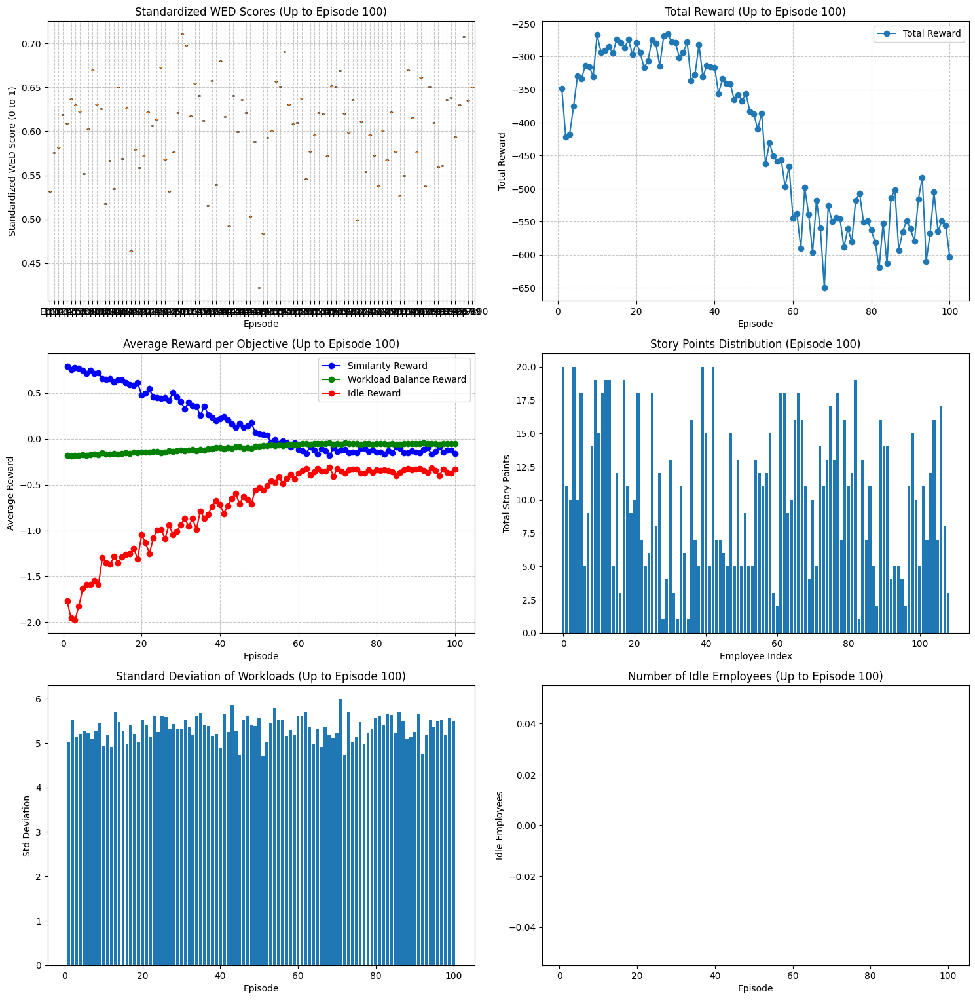

In [ ]:
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import gym
from gym import spaces
import random
from collections import deque
import time
from torch.cuda.amp import GradScaler as AmpGradScaler
import torch.amp
import matplotlib.pyplot as plt
import seaborn as sns

# Set device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Global Variables
NUM_EMPLOYEES = 109
NUM_TASKS = 300
NUM_EPISODES = 100
LEARNING_RATE = 1e-4
INITIAL_TEMPERATURE = 1.0
MIN_TEMPERATURE = 0.2
INITIAL_EPSILON = 1.0
MIN_EPSILON = 0.2
GAMMA = 0.99
MEMORY_SIZE = 50000
BATCH_SIZE = 32
TARGET_UPDATE_FREQ = 500
DQN_HIDDEN_DIM = 256
MAX_WORKLOAD = 20
ALPHA_WED = 0.5

SAVE_EPISODES = []
MAX_STEPS_PER_EPISODE = NUM_TASKS
TOTAL_STEPS = NUM_EPISODES * MAX_STEPS_PER_EPISODE
DECAY_RATE_TEMP = -np.log(MIN_TEMPERATURE / INITIAL_TEMPERATURE) / TOTAL_STEPS
DECAY_RATE_EPS = -np.log(MIN_EPSILON / INITIAL_EPSILON) / TOTAL_STEPS

task_data_path = '/content/drive/MyDrive/Skripsi/Resources/Datasets/fixed_data_task.csv'
employee_data_path = '/content/drive/MyDrive/Skripsi/Resources/Datasets/fixed_data_employee.csv'
model_save_path = '/content/drive/MyDrive/Skripsi/base_dqn_model.pth'
agent_save_path = '/content/drive/MyDrive/Skripsi/base_dqn_agent_params.pth'

# Load data with proper type handling
task_data = pd.read_csv(task_data_path)
employee_data = pd.read_csv(employee_data_path)
task_subset = task_data.iloc[:NUM_TASKS]
employee_subset = employee_data.iloc[:NUM_EMPLOYEES]
skill_columns = [col for col in task_data.columns if col not in ['task_id', 'story_points', 'project_id']]

# Convert project_id to integer mapping
project_id_map = {pid: idx + 1 for idx, pid in enumerate(task_subset['project_id'].unique())}
project_ids = task_subset['project_id'].map(project_id_map).values

# Convert skill columns and story points to float32
task_skills_df = task_subset[skill_columns].fillna(0).astype(np.float32)
employee_skills_df = employee_subset[skill_columns].fillna(0).astype(np.float32)
story_points_df = task_subset['story_points'].astype(np.float32)

# Convert to tensors
task_skills = torch.tensor(task_skills_df.values / 5.0, dtype=torch.float32, device=device)
employee_skills = torch.tensor(employee_skills_df.values / 5.0, dtype=torch.float32, device=device)
story_points = torch.tensor(story_points_df.values, dtype=torch.float32, device=device)
project_ids_tensor = torch.tensor(project_ids, dtype=torch.long, device=device)

class TaskAssignmentEnv(gym.Env):
    def __init__(self):
        super(TaskAssignmentEnv, self).__init__()
        self.num_tasks = NUM_TASKS
        self.num_employees = NUM_EMPLOYEES
        self.max_workload = MAX_WORKLOAD
        self.story_points = story_points
        self.project_ids = project_ids_tensor
        self.task_skills = task_skills
        self.employee_skills = employee_skills
        self.total_story_points = torch.sum(self.story_points).item()
        self.num_skills = task_skills.shape[1]  # Number of skill dimensions

        self.observation_space = spaces.Dict({
            'state_matrix': spaces.Box(low=0, high=1, shape=(self.num_tasks, self.num_employees, 1), dtype=np.float32),
            'workload_matrix': spaces.Box(low=0, high=MAX_WORKLOAD, shape=(self.num_employees,), dtype=np.float32),
            'idle_status': spaces.Box(low=0, high=1, shape=(self.num_employees,), dtype=np.float32),
            'global_features': spaces.Box(low=0, high=1, shape=(4,), dtype=np.float32),
            'task_mask': spaces.Box(low=0, high=1, shape=(self.num_tasks,), dtype=np.float32)
        })
        self.action_space = spaces.MultiDiscrete([self.num_tasks, self.num_employees])
        self.reset()

    def reset(self):
        self.workloads = torch.zeros(self.num_employees, device=device, dtype=torch.float32)
        self.assignments = torch.full((self.num_tasks,), -1, dtype=torch.long, device=device)
        self.remaining_tasks = torch.arange(self.num_tasks, device=device, dtype=torch.long)
        self.employee_projects = torch.full((self.num_employees,), -1, dtype=torch.long, device=device)
        self._initialize_state_matrix()
        return self._get_obs()

    def _initialize_state_matrix(self):
        task_skills_expanded = self.task_skills.unsqueeze(1).expand(-1, self.num_employees, -1)
        emp_skills_expanded = self.employee_skills.unsqueeze(0).expand(self.num_tasks, -1, -1)
        diff = emp_skills_expanded - task_skills_expanded
        weights = 1 / (1 + ALPHA_WED * torch.maximum(diff, torch.tensor(0.0, device=device, dtype=torch.float32)))
        mask = self.task_skills.unsqueeze(1).expand(-1, self.num_employees, -1) > 0
        weighted_diff = weights * mask * (emp_skills_expanded - task_skills_expanded) ** 2
        wed = torch.sqrt(torch.sum(weighted_diff, dim=2))
        num_skills_per_task = torch.sum(self.task_skills > 0, dim=1).unsqueeze(1).expand(-1, self.num_employees)
        wed_worst = torch.sqrt(num_skills_per_task * (1.0 ** 2))
        wed_worst = torch.where(num_skills_per_task > 0, wed_worst, torch.tensor(1.0, device=device, dtype=torch.float32))
        self.state_matrix = (1 - (wed / wed_worst)).unsqueeze(-1).to(dtype=torch.float32)
        workload_penalty = self.workloads.unsqueeze(0).expand(self.num_tasks, -1).unsqueeze(-1) / self.max_workload
        self.state_matrix = self.state_matrix * (1 - torch.clamp(workload_penalty, 0, 1))

    def _update_state_matrix(self, task_idx, emp_idx):
        task_skills_t = self.task_skills[task_idx]
        emp_skills_e = self.employee_skills[emp_idx]
        diff = emp_skills_e - task_skills_t
        weights = 1 / (1 + ALPHA_WED * torch.maximum(diff, torch.tensor(0.0, device=device, dtype=torch.float32)))
        mask = task_skills_t > 0
        weighted_diff = weights[mask] * (emp_skills_e[mask] - task_skills_t[mask]) ** 2
        wed = torch.sqrt(torch.sum(weighted_diff))
        num_skills = torch.sum(mask.float())
        wed_worst = torch.sqrt(num_skills * (1.0 ** 2)) if num_skills > 0 else 1.0
        similarity = 1 - (wed / wed_worst) if wed_worst > 0 else 0.0
        workload_penalty = self.workloads[emp_idx].unsqueeze(0).unsqueeze(-1) / self.max_workload
        self.state_matrix[task_idx, emp_idx, 0] = similarity * (1 - torch.clamp(workload_penalty, 0, 1))

    def _get_obs(self):
        workload_matrix = self.workloads.to(dtype=torch.float32)
        idle_status = (self.workloads == 0).float().to(dtype=torch.float32)
        prop_remaining = len(self.remaining_tasks) / self.num_tasks
        num_idle = torch.sum(idle_status).item()
        prop_idle = num_idle / self.num_employees
        mean_workload = torch.mean(self.workloads).item() if torch.sum(self.workloads) > 0 else 1e-6
        std_workload = torch.std(self.workloads).item()
        cv_normalized = std_workload / (self.max_workload / np.sqrt(self.num_employees)) if mean_workload > 0 else 0
        std_workload_normalized = std_workload / self.max_workload

        global_features = torch.tensor([prop_remaining, prop_idle, cv_normalized, std_workload_normalized],
                                     device=device, dtype=torch.float32)

        task_mask = torch.zeros(self.num_tasks, device=device, dtype=torch.float32)
        task_mask[self.remaining_tasks] = 1

        return {
            'state_matrix': self.state_matrix,
            'workload_matrix': workload_matrix,
            'idle_status': idle_status,
            'global_features': global_features,
            'task_mask': task_mask
        }

    def step(self, action):
        task_idx, emp_idx = action
        done = False
        reward = {'similarity': 0.0, 'workload': 0.0, 'idle': 0.0}
        info = {}

        task_project = self.project_ids[task_idx]
        emp_project = self.employee_projects[emp_idx]
        if emp_project != -1 and emp_project != task_project:
            reward = {'similarity': -0.5, 'workload': 0.0, 'idle': 0.0}
            info['invalid_action'] = 'Different project'
            return self._get_obs(), reward, done, info

        current_workload = self.workloads[emp_idx]
        if current_workload + self.story_points[task_idx] > self.max_workload:
            reward = {'similarity': -0.5, 'workload': 0.0, 'idle': 0.0}
            info['invalid_action'] = 'Exceeds workload'
            return self._get_obs(), reward, done, info

        was_idle = (self.workloads[emp_idx] == 0)

        self.assignments[task_idx] = emp_idx
        self.workloads[emp_idx] += self.story_points[task_idx]
        self.remaining_tasks = self.remaining_tasks[self.remaining_tasks != task_idx]
        if self.employee_projects[emp_idx] == -1:
            self.employee_projects[emp_idx] = task_project

        self._update_state_matrix(task_idx, emp_idx)

        # Compute raw WED for standardization in visualization
        task_skills_t = self.task_skills[task_idx]
        emp_skills_e = self.employee_skills[emp_idx]
        diff = emp_skills_e - task_skills_t
        weights = 1 / (1 + ALPHA_WED * torch.maximum(diff, torch.tensor(0.0, device=device, dtype=torch.float32)))
        mask = task_skills_t > 0
        weighted_diff = weights[mask] * (emp_skills_e[mask] - task_skills_t[mask]) ** 2
        wed = torch.sqrt(torch.sum(weighted_diff))

        similarity = self.state_matrix[task_idx, emp_idx, 0].item()
        reward['similarity'] = 2.0 * similarity
        info['similarity_reward'] = reward['similarity']

        total_assigned_points = torch.sum(self.workloads).item()
        num_assigned_tasks = self.num_tasks - len(self.remaining_tasks)
        expected_workload = total_assigned_points / self.num_employees if num_assigned_tasks > 0 else 0
        workload_deviation = abs(self.workloads[emp_idx].item() - expected_workload)
        max_deviation = self.max_workload
        workload_penalty = -1.0 * (workload_deviation / max_deviation) if max_deviation > 0 else 0
        reward['workload'] = workload_penalty
        info['workload_balance_reward'] = reward['workload']

        num_idle = torch.sum(self.workloads == 0).item()
        idle_penalty = -0.1 * num_idle
        idle_assignment_reward = 0.5 if was_idle else 0.0
        idle_maintenance_reward = 1.0 if num_idle == 0 else 0.0  # Reward for maintaining zero idle employees
        reward['idle'] = idle_penalty + idle_assignment_reward + idle_maintenance_reward
        info['idle_reward'] = reward['idle']

        if len(self.remaining_tasks) == 0:
            done = True
            info['wed_scores'] = [wed.item()]  # Store raw WED for standardization
            std_workload = torch.std(self.workloads).item()
            if num_idle < 10 and std_workload < 5:
                reward['similarity'] += 1.0
                reward['workload'] += 1.0
                reward['idle'] += 1.0

        return self._get_obs(), reward, done, info

class DQN(nn.Module):
    def __init__(self, input_dim, num_employees, num_tasks):
        super(DQN, self).__init__()
        self.num_employees = num_employees
        self.num_tasks = num_tasks
        self.conv1 = nn.Conv2d(1, 16, kernel_size=3, stride=1, padding=1).to(device, dtype=torch.float32)
        self.conv2 = nn.Conv2d(16, 32, kernel_size=3, stride=1, padding=1).to(device, dtype=torch.float32)
        conv_output_height = (num_tasks // 2) // 2
        conv_output_width = (num_employees // 2) // 2
        conv_output_size = 32 * conv_output_height * conv_output_width
        self.fc1 = nn.Linear(conv_output_size + num_employees * 2 + 4, DQN_HIDDEN_DIM).to(device, dtype=torch.float32)
        self.fc2 = nn.Linear(DQN_HIDDEN_DIM, DQN_HIDDEN_DIM // 2).to(device, dtype=torch.float32)
        self.fc3 = nn.Linear(DQN_HIDDEN_DIM // 2, num_tasks * num_employees).to(device, dtype=torch.float32)

    def forward(self, state_matrix, workload_matrix, idle_status, global_features):
        batch_size = state_matrix.size(0)
        state_input = state_matrix.permute(0, 3, 1, 2)
        state_input = F.relu(self.conv1(state_input))
        state_input = F.max_pool2d(state_input, 2)
        state_input = F.relu(self.conv2(state_input))
        state_input = F.max_pool2d(state_input, 2)
        state_input = state_input.reshape(batch_size, -1)

        workload_input = workload_matrix.view(batch_size, -1)
        idle_input = idle_status.view(batch_size, -1)
        global_input = global_features.view(batch_size, -1)

        x = torch.cat([state_input, workload_input, idle_input, global_input], dim=1)
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        q_values = self.fc3(x).view(batch_size, self.num_tasks, self.num_employees)
        return q_values

class DQNAgent:
    def __init__(self, num_tasks, num_employees):
        self.device = device
        self.num_tasks = num_tasks
        self.num_employees = num_employees
        self.input_dim = 1 + 1 + 1 + 4
        self.model = DQN(self.input_dim, self.num_employees, self.num_tasks).to(device)
        self.target_model = DQN(self.input_dim, self.num_employees, self.num_tasks).to(device)
        self.target_model.load_state_dict(self.model.state_dict())
        self.optimizer = torch.optim.Adam(self.model.parameters(), lr=LEARNING_RATE)
        self.memory = deque(maxlen=MEMORY_SIZE)
        self.batch_size = BATCH_SIZE
        self.temperature = INITIAL_TEMPERATURE
        self.epsilon = INITIAL_EPSILON
        self.gamma = GAMMA
        self.global_step = 0
        self.scaler = torch.amp.GradScaler('cuda')

    def update_temp_eps(self):
        self.global_step += 1
        self.temperature = max(MIN_TEMPERATURE, INITIAL_TEMPERATURE * np.exp(-DECAY_RATE_TEMP * self.global_step))
        self.epsilon = max(MIN_EPSILON, INITIAL_EPSILON * np.exp(-DECAY_RATE_EPS * self.global_step))

    def act(self, obs, env):
        if random.random() < self.epsilon:
            valid_tasks = torch.where(obs['task_mask'] == 1)[0]
            if valid_tasks.size(0) == 0:
                return [0, 0]
            task_idx = random.choice(valid_tasks.cpu().numpy())
            valid_emps = torch.where((env.workloads + env.story_points[task_idx] <= env.max_workload) &
                                   ((env.employee_projects == -1) | (env.employee_projects == env.project_ids[task_idx])))[0]
            if valid_emps.size(0) == 0:
                return [task_idx.item(), 0]
            emp_idx = random.choice(valid_emps.cpu().numpy())
            return [task_idx.item(), emp_idx.item()]

        state_matrix = obs['state_matrix'].unsqueeze(0).to(dtype=torch.float32)
        workload_matrix = obs['workload_matrix'].unsqueeze(0).to(dtype=torch.float32)
        idle_status = obs['idle_status'].unsqueeze(0).to(dtype=torch.float32)
        global_features = obs['global_features'].unsqueeze(0).to(dtype=torch.float32)

        with torch.no_grad():
            q_values = self.model(state_matrix, workload_matrix, idle_status, global_features)
            valid_tasks = torch.where(obs['task_mask'] == 1)[0]
            if valid_tasks.size(0) == 0:
                return [0, 0]
            valid_mask = torch.ones(self.num_employees, device=device, dtype=torch.bool)
            for t in valid_tasks:
                valid_mask &= (env.workloads + env.story_points[t] <= env.max_workload) & \
                              ((env.employee_projects == -1) | (env.employee_projects == env.project_ids[t]))
            q_values[:, :, ~valid_mask] = -float('inf')
            q_values[:, ~torch.isin(torch.arange(self.num_tasks, device=device), valid_tasks), :] = -float('inf')
            action_idx = torch.argmax(q_values.view(-1)).item()
            task_idx = action_idx // self.num_employees
            emp_idx = action_idx % self.num_employees
            return [task_idx, emp_idx]

    def remember(self, state, action, reward, next_state, done):
        self.memory.append((state, action, reward, next_state, done))

    def replay(self, env):
        if len(self.memory) < self.batch_size:
            return
        batch = random.sample(self.memory, self.batch_size)
        states, actions, rewards, next_states, dones = zip(*batch)

        state_matrices = torch.stack([s['state_matrix'] for s in states]).to(dtype=torch.float32)
        workload_matrices = torch.stack([s['workload_matrix'] for s in states]).to(dtype=torch.float32)
        idle_statuses = torch.stack([s['idle_status'] for s in states]).to(dtype=torch.float32)
        global_features = torch.stack([s['global_features'] for s in states]).to(dtype=torch.float32)
        next_state_matrices = torch.stack([s['state_matrix'] for s in next_states]).to(dtype=torch.float32)
        next_workload_matrices = torch.stack([s['workload_matrix'] for s in next_states]).to(dtype=torch.float32)
        next_idle_statuses = torch.stack([s['idle_status'] for s in next_states]).to(dtype=torch.float32)
        next_global_features = torch.stack([s['global_features'] for s in next_states]).to(dtype=torch.float32)

        actions = torch.tensor(actions, dtype=torch.long, device=self.device)
        rewards = torch.tensor([r['similarity'] + r['workload'] + r['idle'] for r in rewards], dtype=torch.float32, device=self.device)
        dones = torch.tensor(dones, dtype=torch.float32, device=self.device)

        task_idx = actions[:, 0]
        emp_idx = actions[:, 1]
        batch_indices = torch.arange(self.batch_size, device=self.device)

        with torch.amp.autocast('cuda'):
            self.optimizer.zero_grad()
            q_values = self.model(state_matrices, workload_matrices, idle_statuses, global_features)
            q_values_selected = q_values[batch_indices, task_idx, emp_idx]

            next_q_values = self.target_model(next_state_matrices, next_workload_matrices, next_idle_statuses, next_global_features)
            next_q_values_max = next_q_values.max(dim=1)[0].max(dim=1)[0]
            targets = rewards + (1 - dones) * self.gamma * next_q_values_max

            loss = F.mse_loss(q_values_selected, targets)

        self.scaler.scale(loss).backward()
        self.scaler.step(self.optimizer)
        self.scaler.update()

    def update_target(self):
        self.target_model.load_state_dict(self.model.state_dict())

    def save(self, model_path, agent_path):
        torch.save({
            'model_state_dict': self.model.state_dict(),
            'target_model_state_dict': self.target_model.state_dict(),
            'optimizer_state_dict': self.optimizer.state_dict()
        }, model_path)
        torch.save({'temperature': self.temperature, 'epsilon': self.epsilon}, agent_path)
        print(f"Model saved to {model_path}, Agent params to {agent_path}")

    def load(self, model_path, agent_path):
        checkpoint = torch.load(model_path)
        self.model.load_state_dict(checkpoint['model_state_dict'])
        self.target_model.load_state_dict(checkpoint['target_model_state_dict'])
        self.optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
        agent_params = torch.load(agent_path)
        self.temperature = agent_params['temperature']
        self.epsilon = agent_params['epsilon']
        self.memory = deque(maxlen=MEMORY_SIZE)
        print(f"Model loaded from {model_path}, Agent params from {agent_path}")

def plot_and_summarize(episode_data, wed_scores_list, total_rewards, similarity_rewards,
                      workload_balance_rewards, idle_rewards, workloads_list,
                      std_workloads_list, idle_employees_list, env, num_episodes_to_plot, checkpoint_episode=None):
    # Tabular Summary
    print(f"\nTabular Summary of Rewards up to Episode {num_episodes_to_plot}:")
    print("-" * 80)
    print(f"{'Episode':<10} {'Total Reward':<15} {'Similarity':<15} {'Workload':<15} {'Idle':<15} {'Std Dev':<10} {'Idle Emp':<10}")
    print("-" * 80)
    for data in episode_data:
        if data['Episode'] <= num_episodes_to_plot:
            print(f"{data['Episode']:<10} {data['Total Reward']:<15.4f} {data['Similarity Reward']:<15.4f} {data['Workload Balance Reward']:<15.4f} {data['Idle Reward']:<15.4f} {data['Std Workloads']:<10.4f} {data['Idle Employees']:<10}")
    print("-" * 80)

    # Visualizations
    plt.figure(figsize=(15, 20))

    # Plot 1: Standardized WED Scores (Boxplot)
    plt.subplot(4, 2, 1)
    alpha = ALPHA_WED
    weights_worst = 1 / (1 + alpha * 1)
    wed_raw_worst = np.sqrt(np.sum(weights_worst * (0 - 1) ** 2) * env.num_skills)
    wed_raw_best = 0
    standardized_wed_per_episode = []
    for episode_wed_scores in wed_scores_list[:num_episodes_to_plot]:
        standardized_wed = [(wed_raw_worst - wed) / (wed_raw_worst - wed_raw_best) for wed in episode_wed_scores]
        standardized_wed_per_episode.append(standardized_wed)
    plt.boxplot(standardized_wed_per_episode, labels=[f"Ep {i+1}" for i in range(num_episodes_to_plot)])
    plt.title(f'Standardized WED Scores (Up to Episode {num_episodes_to_plot})')
    plt.xlabel('Episode')
    plt.ylabel('Standardized WED Score (0 to 1)')
    plt.grid(True, linestyle='--', alpha=0.7)

    # Plot 2: Total Reward
    plt.subplot(4, 2, 2)
    plt.plot(range(1, num_episodes_to_plot + 1), total_rewards[:num_episodes_to_plot], marker='o', label='Total Reward')
    plt.title(f'Total Reward (Up to Episode {num_episodes_to_plot})')
    plt.xlabel('Episode')
    plt.ylabel('Total Reward')
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.legend()

    # Plot 3: Average Reward per Objective
    plt.subplot(4, 2, 3)
    plt.plot(range(1, num_episodes_to_plot + 1), similarity_rewards[:num_episodes_to_plot], marker='o', label='Similarity Reward', color='blue')
    plt.plot(range(1, num_episodes_to_plot + 1), workload_balance_rewards[:num_episodes_to_plot], marker='o', label='Workload Balance Reward', color='green')
    plt.plot(range(1, num_episodes_to_plot + 1), idle_rewards[:num_episodes_to_plot], marker='o', label='Idle Reward', color='red')
    plt.title(f'Average Reward per Objective (Up to Episode {num_episodes_to_plot})')
    plt.xlabel('Episode')
    plt.ylabel('Average Reward')
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.legend()

    # Plot 4: Story Points Distribution (Bar Plot)
    plt.subplot(4, 2, 4)
    plt.bar(range(env.num_employees), workloads_list[num_episodes_to_plot - 1])
    plt.title(f'Story Points Distribution (Episode {num_episodes_to_plot})')
    plt.xlabel('Employee Index')
    plt.ylabel('Total Story Points')

    # Plot 5: Standard Deviation of Workloads (Bar Plot)
    plt.subplot(4, 2, 5)
    plt.bar(range(1, num_episodes_to_plot + 1), std_workloads_list[:num_episodes_to_plot])
    plt.title(f'Standard Deviation of Workloads (Up to Episode {num_episodes_to_plot})')
    plt.xlabel('Episode')
    plt.ylabel('Std Deviation')

    # Plot 6: Number of Idle Employees (Bar Plot)
    plt.subplot(4, 2, 6)
    plt.bar(range(1, num_episodes_to_plot + 1), idle_employees_list[:num_episodes_to_plot])
    plt.title(f'Number of Idle Employees (Up to Episode {num_episodes_to_plot})')
    plt.xlabel('Episode')
    plt.ylabel('Idle Employees')

    plt.tight_layout()
    filename = f'training_metrics_eps{checkpoint_episode}.png' if checkpoint_episode else 'training_metrics_final.png'
    plt.savefig(filename)
    print(f"Training metrics plot saved to '{filename}'")
    plt.show()

def train_dqn():
    env = TaskAssignmentEnv()
    agent = DQNAgent(env.num_tasks, env.num_employees)
    total_rewards = []
    wed_scores_list = []
    workloads_list = []
    std_workloads_list = []
    idle_employees_list = []
    similarity_rewards = []
    workload_balance_rewards = []
    idle_rewards = []
    global_step = 0
    episode_data = []

    for episode in range(NUM_EPISODES):
        obs = env.reset()
        total_reward = 0
        episode_similarity = 0
        episode_workload_balance = 0
        episode_idle_reward = 0
        done = False
        step = 0

        print(f"Episode {episode+1}/{NUM_EPISODES}, Temp: {agent.temperature:.3f}, Epsilon: {agent.epsilon:.3f}")
        while not done:
            step += 1
            global_step += 1
            start_time = time.time()
            action = agent.act(obs, env)
            next_obs, reward, done, info = env.step(action)
            agent.remember(obs, action, reward, next_obs, done)
            agent.replay(env)
            obs = next_obs
            total_reward += sum(reward.values())
            episode_similarity += reward['similarity']
            episode_workload_balance += reward['workload']
            episode_idle_reward += reward['idle']
            if 'wed_scores' in info:
                wed_scores_list.append(info['wed_scores'])
            step_time = time.time() - start_time
            if step % 10 == 0:
                print(f"Step {step}/{env.num_tasks}: Reward {total_reward/step:.4f}, Time {step_time:.2f}s")

            agent.update_temp_eps()
            if global_step % TARGET_UPDATE_FREQ == 0:
                agent.update_target()

        workloads_list.append(env.workloads.clone().cpu().numpy())
        std_workloads = torch.std(env.workloads).item()
        num_idle = torch.sum(env.workloads == 0).item()
        std_workloads_list.append(std_workloads)
        idle_employees_list.append(num_idle)
        total_rewards.append(total_reward)
        avg_similarity = episode_similarity / step if step > 0 else 0
        avg_workload_balance = episode_workload_balance / step if step > 0 else 0
        avg_idle = episode_idle_reward / step if step > 0 else 0
        similarity_rewards.append(avg_similarity)
        workload_balance_rewards.append(avg_workload_balance)
        idle_rewards.append(avg_idle)

        episode_data.append({
            'Episode': episode + 1,
            'Total Reward': total_reward,
            'Similarity Reward': avg_similarity,
            'Workload Balance Reward': avg_workload_balance,
            'Idle Reward': avg_idle,
            'Std Workloads': std_workloads,
            'Idle Employees': num_idle
        })

        print(f"Episode {episode+1} - Total Reward: {total_reward:.2f}, Std Workloads: {std_workloads:.2f}, Idle: {num_idle}")
        print(f"Average Similarity Reward: {avg_similarity:.4f}, Workload Balance Reward: {avg_workload_balance:.4f}, Idle Reward: {avg_idle:.4f}")

        if episode + 1 in SAVE_EPISODES:
            print(f"\nCheckpoint at Episode {episode + 1}")
            plot_and_summarize(
                episode_data=episode_data,
                wed_scores_list=wed_scores_list,
                total_rewards=total_rewards,
                similarity_rewards=similarity_rewards,
                workload_balance_rewards=workload_balance_rewards,
                idle_rewards=idle_rewards,
                workloads_list=workloads_list,
                std_workloads_list=std_workloads_list,
                idle_employees_list=idle_employees_list,
                env=env,
                num_episodes_to_plot=episode + 1,
                checkpoint_episode=episode + 1
            )
            checkpoint_model_path = f"/content/drive/MyDrive/Skripsi/base_dqn_model_eps{episode + 1}.pth"
            checkpoint_agent_path = f"/content/drive/MyDrive/Skripsi/base_dqn_agent_params_eps{episode + 1}.pth"
            agent.save(checkpoint_model_path, checkpoint_agent_path)

    agent.save(model_save_path, agent_save_path)

    plot_and_summarize(
        episode_data=episode_data,
        wed_scores_list=wed_scores_list,
        total_rewards=total_rewards,
        similarity_rewards=similarity_rewards,
        workload_balance_rewards=workload_balance_rewards,
        idle_rewards=idle_rewards,
        workloads_list=workloads_list,
        std_workloads_list=std_workloads_list,
        idle_employees_list=idle_employees_list,
        env=env,
        num_episodes_to_plot=NUM_EPISODES
    )

    return env, workloads_list, std_workloads_list, idle_employees_list, NUM_EPISODES, episode_data, agent

# Run training
env, workloads_list, std_workloads_list, idle_employees_list, num_episodes, episode_data, trained_agent = train_dqn()

### Fixed visualization for total reward per objective

- fix visualiztion with total reward
- fix the timesteps to limit to 300 only and not stall

Using device: cuda
Episode 1/100, Temp: 1.000, Epsilon: 1.000
Step 10: Reward -2.0522, Time 0.00s, Num Idle: 99
Step 20: Reward -1.7794, Time 0.00s, Num Idle: 90
Step 30: Reward -1.3481, Time 0.00s, Num Idle: 80
Step 40: Reward -1.0863, Time 0.00s, Num Idle: 72
Step 50: Reward -0.8137, Time 0.00s, Num Idle: 63
Step 60: Reward -0.7018, Time 0.00s, Num Idle: 57
Step 70: Reward -0.5049, Time 0.07s, Num Idle: 49
Step 80: Reward -0.3928, Time 0.04s, Num Idle: 44
Step 90: Reward -0.2344, Time 0.04s, Num Idle: 36
Step 100: Reward -0.0762, Time 0.04s, Num Idle: 27
Step 110: Reward 0.0284, Time 0.04s, Num Idle: 22
Step 120: Reward 0.1135, Time 0.04s, Num Idle: 16
Step 130: Reward 0.1487, Time 0.04s, Num Idle: 14
Step 140: Reward 0.1691, Time 0.04s, Num Idle: 11
Step 150: Reward 0.2054, Time 0.04s, Num Idle: 9
Step 160: Reward 0.2283, Time 0.04s, Num Idle: 8
Step 170: Reward 0.2539, Time 0.04s, Num Idle: 7
Step 180: Reward 0.2854, Time 0.08s, Num Idle: 4
Step 190: Reward 0.2848, Time 0.04s, Num 

<ipython-input-9-c553e3aa470f>:447: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(standardized_wed_per_episode, labels=[f"Ep {i+1}" for i in range(num_episodes_to_plot)])


Training metrics plot saved to 'training_metrics_final.png'


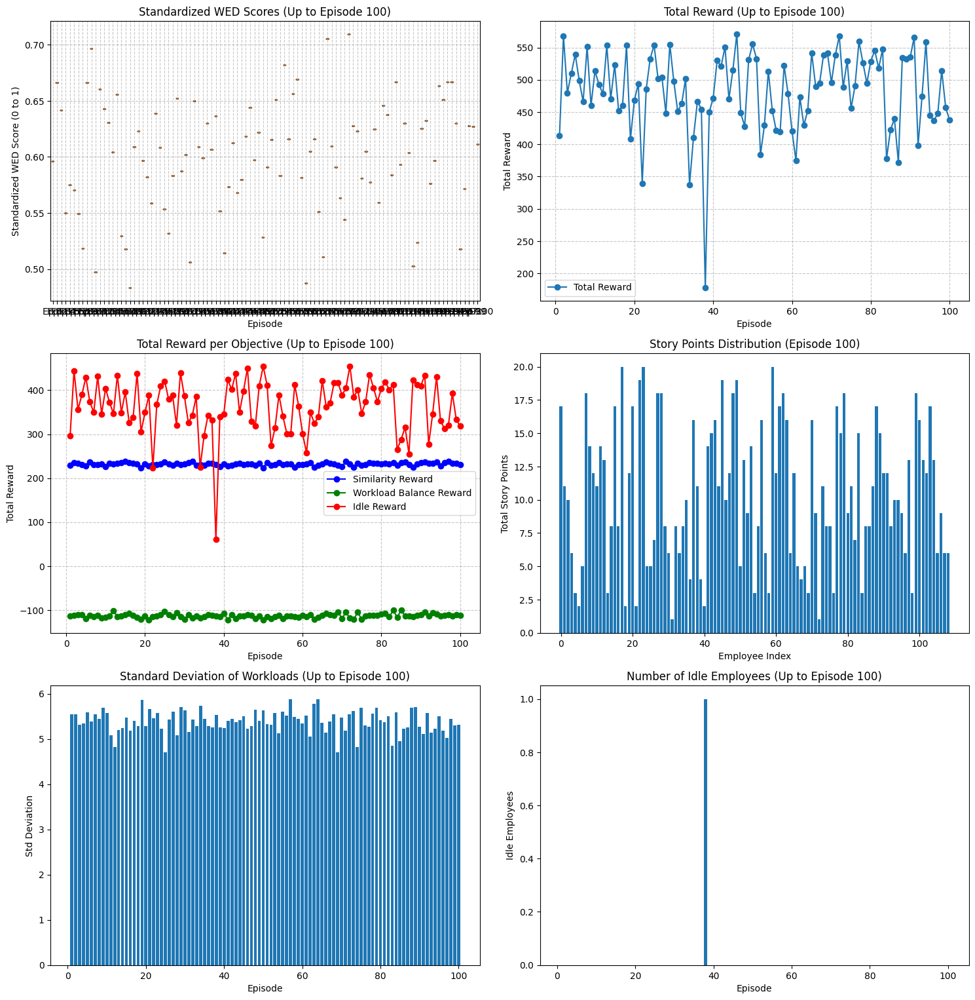

In [ ]:
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import gym
from gym import spaces
import random
from collections import deque
import time
from torch.cuda.amp import GradScaler as AmpGradScaler
import torch.amp
import matplotlib.pyplot as plt
import seaborn as sns

# Set device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Global Variables
NUM_EMPLOYEES = 109
NUM_TASKS = 300
NUM_EPISODES = 100
LEARNING_RATE = 3e-4
INITIAL_TEMPERATURE = 1.0
MIN_TEMPERATURE = 0.2
INITIAL_EPSILON = 1.0
MIN_EPSILON = 0.2
GAMMA = 0.99
MEMORY_SIZE = 50000
BATCH_SIZE = 64
TARGET_UPDATE_FREQ = 1000
DQN_HIDDEN_DIM = 256
MAX_WORKLOAD = 20
ALPHA_WED = 0.5

SAVE_EPISODES = []
MAX_STEPS_PER_EPISODE = NUM_TASKS
TOTAL_STEPS = NUM_EPISODES * MAX_STEPS_PER_EPISODE
DECAY_RATE_TEMP = -np.log(MIN_TEMPERATURE / INITIAL_TEMPERATURE) / TOTAL_STEPS
DECAY_RATE_EPS = -np.log(MIN_EPSILON / INITIAL_EPSILON) / TOTAL_STEPS

task_data_path = '/content/drive/MyDrive/Skripsi/Resources/Datasets/fixed_data_task.csv'
employee_data_path = '/content/drive/MyDrive/Skripsi/Resources/Datasets/fixed_data_employee.csv'
model_save_path = '/content/drive/MyDrive/Skripsi/base_dqn_model.pth'
agent_save_path = '/content/drive/MyDrive/Skripsi/base_dqn_agent_params.pth'

# Load data with proper type handling
task_data = pd.read_csv(task_data_path)
employee_data = pd.read_csv(employee_data_path)
task_subset = task_data.iloc[:NUM_TASKS]
employee_subset = employee_data.iloc[:NUM_EMPLOYEES]
skill_columns = [col for col in task_data.columns if col not in ['task_id', 'story_points', 'project_id']]

# Convert project_id to integer mapping
project_id_map = {pid: idx + 1 for idx, pid in enumerate(task_subset['project_id'].unique())}
project_ids = task_subset['project_id'].map(project_id_map).values

# Convert skill columns and story points to float32
task_skills_df = task_subset[skill_columns].fillna(0).astype(np.float32)
employee_skills_df = employee_subset[skill_columns].fillna(0).astype(np.float32)
story_points_df = task_subset['story_points'].astype(np.float32)

# Convert to tensors
task_skills = torch.tensor(task_skills_df.values / 5.0, dtype=torch.float32, device=device)
employee_skills = torch.tensor(employee_skills_df.values / 5.0, dtype=torch.float32, device=device)
story_points = torch.tensor(story_points_df.values, dtype=torch.float32, device=device)
project_ids_tensor = torch.tensor(project_ids, dtype=torch.long, device=device)

class TaskAssignmentEnv(gym.Env):
    def __init__(self):
        super(TaskAssignmentEnv, self).__init__()
        self.num_tasks = NUM_TASKS
        self.num_employees = NUM_EMPLOYEES
        self.max_workload = MAX_WORKLOAD
        self.story_points = story_points
        self.project_ids = project_ids_tensor
        self.task_skills = task_skills
        self.employee_skills = employee_skills
        self.total_story_points = torch.sum(self.story_points).item()
        self.num_skills = task_skills.shape[1]

        self.observation_space = spaces.Dict({
            'state_matrix': spaces.Box(low=0, high=1, shape=(self.num_tasks, self.num_employees, 1), dtype=np.float32),
            'workload_matrix': spaces.Box(low=0, high=MAX_WORKLOAD, shape=(self.num_employees,), dtype=np.float32),
            'idle_status': spaces.Box(low=0, high=1, shape=(self.num_employees,), dtype=np.float32),
            'global_features': spaces.Box(low=0, high=1, shape=(4,), dtype=np.float32),
            'task_mask': spaces.Box(low=0, high=1, shape=(self.num_tasks,), dtype=np.float32)
        })
        self.action_space = spaces.MultiDiscrete([self.num_tasks, self.num_employees])
        self.reset()

    def reset(self):
        self.workloads = torch.zeros(self.num_employees, device=device, dtype=torch.float32)
        self.assignments = torch.full((self.num_tasks,), -1, dtype=torch.long, device=device)
        self.remaining_tasks = torch.arange(self.num_tasks, device=device, dtype=torch.long)
        self.employee_projects = torch.full((self.num_employees,), -1, dtype=torch.long, device=device)
        self._initialize_state_matrix()
        return self._get_obs()

    def _initialize_state_matrix(self):
        task_skills_expanded = self.task_skills.unsqueeze(1).expand(-1, self.num_employees, -1)
        emp_skills_expanded = self.employee_skills.unsqueeze(0).expand(self.num_tasks, -1, -1)
        diff = emp_skills_expanded - task_skills_expanded
        weights = 1 / (1 + ALPHA_WED * torch.maximum(diff, torch.tensor(0.0, device=device, dtype=torch.float32)))
        mask = self.task_skills.unsqueeze(1).expand(-1, self.num_employees, -1) > 0
        weighted_diff = weights * mask * (emp_skills_expanded - task_skills_expanded) ** 2
        wed = torch.sqrt(torch.sum(weighted_diff, dim=2))
        num_skills_per_task = torch.sum(self.task_skills > 0, dim=1).unsqueeze(1).expand(-1, self.num_employees)
        wed_worst = torch.sqrt(num_skills_per_task * (1.0 ** 2))
        wed_worst = torch.where(num_skills_per_task > 0, wed_worst, torch.tensor(1.0, device=device, dtype=torch.float32))
        self.state_matrix = (1 - (wed / wed_worst)).unsqueeze(-1).to(dtype=torch.float32)
        workload_penalty = self.workloads.unsqueeze(0).expand(self.num_tasks, -1).unsqueeze(-1) / self.max_workload
        self.state_matrix = self.state_matrix * (1 - torch.clamp(workload_penalty, 0, 1))

    def _update_state_matrix(self, task_idx, emp_idx):
        task_skills_t = self.task_skills[task_idx]
        emp_skills_e = self.employee_skills[emp_idx]
        diff = emp_skills_e - task_skills_t
        weights = 1 / (1 + ALPHA_WED * torch.maximum(diff, torch.tensor(0.0, device=device, dtype=torch.float32)))
        mask = task_skills_t > 0
        weighted_diff = weights[mask] * (emp_skills_e[mask] - task_skills_t[mask]) ** 2
        wed = torch.sqrt(torch.sum(weighted_diff))
        num_skills = torch.sum(mask.float())
        wed_worst = torch.sqrt(num_skills * (1.0 ** 2)) if num_skills > 0 else 1.0
        similarity = 1 - (wed / wed_worst) if wed_worst > 0 else 0.0
        workload_penalty = self.workloads[emp_idx].unsqueeze(0).unsqueeze(-1) / self.max_workload
        self.state_matrix[task_idx, emp_idx, 0] = similarity * (1 - torch.clamp(workload_penalty, 0, 1))

    def _get_obs(self):
        workload_matrix = self.workloads.to(dtype=torch.float32)
        idle_status = (self.workloads == 0).float().to(dtype=torch.float32)
        prop_remaining = len(self.remaining_tasks) / self.num_tasks
        num_idle = torch.sum(idle_status).item()
        prop_idle = num_idle / self.num_employees
        mean_workload = torch.mean(self.workloads).item() if torch.sum(self.workloads) > 0 else 1e-6
        std_workload = torch.std(self.workloads).item()
        cv_normalized = std_workload / (self.max_workload / np.sqrt(self.num_employees)) if mean_workload > 0 else 0
        std_workload_normalized = std_workload / self.max_workload

        global_features = torch.tensor([prop_remaining, prop_idle, cv_normalized, std_workload_normalized],
                                     device=device, dtype=torch.float32)

        task_mask = torch.zeros(self.num_tasks, device=device, dtype=torch.float32)
        task_mask[self.remaining_tasks] = 1

        return {
            'state_matrix': self.state_matrix,
            'workload_matrix': workload_matrix,
            'idle_status': idle_status,
            'global_features': global_features,
            'task_mask': task_mask
        }

    def step(self, action):
        task_idx, emp_idx = action
        done = False
        reward = {'similarity': 0.0, 'workload': 0.0, 'idle': 0.0}
        info = {'action_valid': True}

        if task_idx not in self.remaining_tasks:
            reward['similarity'] = -1.0
            info['action_valid'] = False
            info['invalid_action'] = 'Invalid task'
            return self._get_obs(), reward, done, info

        task_project = self.project_ids[task_idx]
        emp_project = self.employee_projects[emp_idx]
        current_workload = self.workloads[emp_idx]

        if emp_project != -1 and emp_project != task_project:
            reward['similarity'] = -1.0
            info['action_valid'] = False
            info['invalid_action'] = 'Different project'
            return self._get_obs(), reward, done, info

        if current_workload + self.story_points[task_idx] > self.max_workload:
            reward['similarity'] = -1.0
            info['action_valid'] = False
            info['invalid_action'] = 'Exceeds workload'
            return self._get_obs(), reward, done, info

        was_idle = (self.workloads[emp_idx] == 0)

        self.assignments[task_idx] = emp_idx
        self.workloads[emp_idx] += self.story_points[task_idx]
        self.remaining_tasks = self.remaining_tasks[self.remaining_tasks != task_idx]
        if self.employee_projects[emp_idx] == -1:
            self.employee_projects[emp_idx] = task_project

        self._update_state_matrix(task_idx, emp_idx)

        task_skills_t = self.task_skills[task_idx]
        emp_skills_e = self.employee_skills[emp_idx]
        diff = emp_skills_e - task_skills_t
        weights = 1 / (1 + ALPHA_WED * torch.maximum(diff, torch.tensor(0.0, device=device, dtype=torch.float32)))
        mask = task_skills_t > 0
        weighted_diff = weights[mask] * (emp_skills_e[mask] - task_skills_t[mask]) ** 2
        wed = torch.sqrt(torch.sum(weighted_diff))

        similarity = self.state_matrix[task_idx, emp_idx, 0].item()
        reward['similarity'] = 2.0 * similarity
        info['similarity_reward'] = reward['similarity']

        total_assigned_points = torch.sum(self.workloads).item()
        num_assigned_tasks = self.num_tasks - len(self.remaining_tasks)
        expected_workload = total_assigned_points / self.num_employees if num_assigned_tasks > 0 else 0
        workload_deviation = abs(self.workloads[emp_idx].item() - expected_workload)
        max_deviation = self.max_workload
        workload_penalty = -1.0 * (workload_deviation / max_deviation) if max_deviation > 0 else 0
        reward['workload'] = workload_penalty * 2.0
        info['workload_balance_reward'] = reward['workload']

        num_idle = torch.sum(self.workloads == 0).item()
        idle_penalty = -((num_idle / self.num_employees) ** 2) * 2.0  # Reduced multiplier from 5.0 to 2.0
        idle_assignment_reward = 0.5 if was_idle else 0.0
        idle_maintenance_reward = 1.0 if num_idle == 0 else 0.0
        reward['idle'] = (idle_penalty + idle_assignment_reward + idle_maintenance_reward) * 2.0
        info['idle_reward'] = reward['idle']

        if len(self.remaining_tasks) == 0:
            done = True
            info['wed_scores'] = [wed.item()]
            std_workload = torch.std(self.workloads).item()

            # Tiered bonus for idle employees
            if num_idle <= 54:  # 50% of 109
                reward['idle'] += 5.0
            if num_idle <= 43:  # 40% of 109
                reward['idle'] += 10.0
            if num_idle <= 32:  # 30% of 109
                reward['idle'] += 20.0
            if num_idle <= 21:  # 20% of 109
                reward['idle'] += 30.0
            if num_idle <= 10:  # 10% of 109
                reward['idle'] += 50.0
            if num_idle == 0:  # 0%
                reward['idle'] += self.num_employees * 1.0  # 109.0

            # Tiered bonus for workload standard deviation
            if std_workload < 5.0:
                reward['workload'] += 5.0
            if std_workload < 4.0:
                reward['workload'] += 10.0
            if std_workload < 3.0:
                reward['workload'] += 20.0
            if std_workload < 2.0:
                reward['workload'] += 30.0
            if std_workload < 1.0:
                reward['workload'] += 50.0

        return self._get_obs(), reward, done, info

class DQN(nn.Module):
    def __init__(self, input_dim, num_employees, num_tasks):
        super(DQN, self).__init__()
        self.num_employees = num_employees
        self.num_tasks = num_tasks
        self.conv1 = nn.Conv2d(1, 16, kernel_size=3, stride=1, padding=1).to(device, dtype=torch.float32)
        self.conv2 = nn.Conv2d(16, 32, kernel_size=3, stride=1, padding=1).to(device, dtype=torch.float32)
        conv_output_height = (num_tasks // 2) // 2
        conv_output_width = (num_employees // 2) // 2
        conv_output_size = 32 * conv_output_height * conv_output_width
        self.fc1 = nn.Linear(conv_output_size + num_employees * 2 + 4, DQN_HIDDEN_DIM).to(device, dtype=torch.float32)
        self.fc2 = nn.Linear(DQN_HIDDEN_DIM, DQN_HIDDEN_DIM // 2).to(device, dtype=torch.float32)
        self.fc3 = nn.Linear(DQN_HIDDEN_DIM // 2, num_tasks * num_employees).to(device, dtype=torch.float32)

    def forward(self, state_matrix, workload_matrix, idle_status, global_features):
        batch_size = state_matrix.size(0)
        state_input = state_matrix.permute(0, 3, 1, 2)
        state_input = F.relu(self.conv1(state_input))
        state_input = F.max_pool2d(state_input, 2)
        state_input = F.relu(self.conv2(state_input))
        state_input = F.max_pool2d(state_input, 2)
        state_input = state_input.reshape(batch_size, -1)

        workload_input = workload_matrix.view(batch_size, -1)
        idle_input = idle_status.view(batch_size, -1)
        global_input = global_features.view(batch_size, -1)

        x = torch.cat([state_input, workload_input, idle_input, global_input], dim=1)
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        q_values = self.fc3(x).view(batch_size, self.num_tasks, self.num_employees)
        return q_values

class DQNAgent:
    def __init__(self, num_tasks, num_employees):
        self.device = device
        self.num_tasks = num_tasks
        self.num_employees = num_employees
        self.input_dim = 1 + 1 + 1 + 4
        self.model = DQN(self.input_dim, self.num_employees, self.num_tasks).to(device)
        self.target_model = DQN(self.input_dim, self.num_employees, self.num_tasks).to(device)
        self.target_model.load_state_dict(self.model.state_dict())
        self.optimizer = torch.optim.Adam(self.model.parameters(), lr=LEARNING_RATE)
        self.memory = deque(maxlen=MEMORY_SIZE)
        self.batch_size = BATCH_SIZE
        self.temperature = INITIAL_TEMPERATURE
        self.epsilon = INITIAL_EPSILON
        self.gamma = GAMMA
        self.global_step = 0
        self.scaler = torch.amp.GradScaler('cuda')

    def update_temp_eps(self):
        self.global_step += 1
        self.temperature = max(MIN_TEMPERATURE, INITIAL_TEMPERATURE * np.exp(-DECAY_RATE_TEMP * self.global_step))
        self.epsilon = max(MIN_EPSILON, INITIAL_EPSILON * np.exp(-DECAY_RATE_EPS * self.global_step))

    def act(self, obs, env):
        valid_tasks = torch.where(obs['task_mask'] == 1)[0]
        if valid_tasks.size(0) == 0:
            return [0, 0]  # Fallback action (shouldn't happen)

        if random.random() < self.epsilon:
            # Exploration: Select a random valid task and a random valid employee
            max_attempts = 10  # Limit the number of attempts to find a valid action
            for _ in range(max_attempts):
                task_idx = random.choice(valid_tasks.cpu().numpy())
                valid_emps = torch.where(
                    (env.workloads + env.story_points[task_idx] <= env.max_workload) &
                    ((env.employee_projects == -1) | (env.employee_projects == env.project_ids[task_idx]))
                )[0]
                if valid_emps.size(0) > 0:
                    emp_idx = random.choice(valid_emps.cpu().numpy())
                    return [task_idx, emp_idx]
            # If no valid action found after max_attempts, let the environment handle the penalty
            task_idx = random.choice(valid_tasks.cpu().numpy())
            emp_idx = random.randint(0, self.num_employees - 1)
            return [task_idx, emp_idx]

        # Exploitation: Use Q-values with proper masking
        state_matrix = obs['state_matrix'].unsqueeze(0).to(dtype=torch.float32)
        workload_matrix = obs['workload_matrix'].unsqueeze(0).to(dtype=torch.float32)
        idle_status = obs['idle_status'].unsqueeze(0).to(dtype=torch.float32)
        global_features = obs['global_features'].unsqueeze(0).to(dtype=torch.float32)

        with torch.no_grad():
            q_values = self.model(state_matrix, workload_matrix, idle_status, global_features)

            # Create masks for valid actions
            task_mask = obs['task_mask'].unsqueeze(-1).expand(-1, self.num_employees).bool()
            emp_mask = torch.ones(self.num_tasks, self.num_employees, device=device, dtype=torch.bool)
            for t in range(self.num_tasks):
                emp_mask[t] = (
                    (env.workloads + env.story_points[t] <= env.max_workload) &
                    ((env.employee_projects == -1) | (env.employee_projects == env.project_ids[t]))
                )
            combined_mask = task_mask & emp_mask
            combined_mask = combined_mask.unsqueeze(0)
            q_values[~combined_mask] = -float('inf')

            if torch.all(q_values == -float('inf')):
                task_idx = random.choice(valid_tasks.cpu().numpy())
                emp_idx = random.randint(0, self.num_employees - 1)
            else:
                action_idx = torch.argmax(q_values.view(-1)).item()
                task_idx = action_idx // self.num_employees
                emp_idx = action_idx % self.num_employees
            return [task_idx, emp_idx]

    def remember(self, state, action, reward, next_state, done):
        self.memory.append((state, action, reward, next_state, done))

    def replay(self, env):
        if len(self.memory) < self.batch_size:
            return
        batch = random.sample(self.memory, self.batch_size)
        states, actions, rewards, next_states, dones = zip(*batch)

        state_matrices = torch.stack([s['state_matrix'] for s in states]).to(dtype=torch.float32)
        workload_matrices = torch.stack([s['workload_matrix'] for s in states]).to(dtype=torch.float32)
        idle_statuses = torch.stack([s['idle_status'] for s in states]).to(dtype=torch.float32)
        global_features = torch.stack([s['global_features'] for s in states]).to(dtype=torch.float32)
        next_state_matrices = torch.stack([s['state_matrix'] for s in next_states]).to(dtype=torch.float32)
        next_workload_matrices = torch.stack([s['workload_matrix'] for s in next_states]).to(dtype=torch.float32)
        next_idle_statuses = torch.stack([s['idle_status'] for s in next_states]).to(dtype=torch.float32)
        next_global_features = torch.stack([s['global_features'] for s in next_states]).to(dtype=torch.float32)

        actions = torch.tensor(actions, dtype=torch.long, device=self.device)
        rewards = torch.tensor([r['similarity'] + r['workload'] + r['idle'] for r in rewards], dtype=torch.float32, device=self.device)
        dones = torch.tensor(dones, dtype=torch.float32, device=self.device)

        task_idx = actions[:, 0]
        emp_idx = actions[:, 1]
        batch_indices = torch.arange(self.batch_size, device=self.device)

        with torch.amp.autocast('cuda'):
            self.optimizer.zero_grad()
            q_values = self.model(state_matrices, workload_matrices, idle_statuses, global_features)
            q_values_selected = q_values[batch_indices, task_idx, emp_idx]

            next_q_values = self.target_model(next_state_matrices, next_workload_matrices, next_idle_statuses, next_global_features)
            next_q_values_max = next_q_values.max(dim=1)[0].max(dim=1)[0]
            targets = rewards + (1 - dones) * self.gamma * next_q_values_max

            loss = F.mse_loss(q_values_selected, targets)

        self.scaler.scale(loss).backward()
        self.scaler.step(self.optimizer)
        self.scaler.update()

    def update_target(self):
        self.target_model.load_state_dict(self.model.state_dict())

    def save(self, model_path, agent_path):
        torch.save({
            'model_state_dict': self.model.state_dict(),
            'target_model_state_dict': self.target_model.state_dict(),
            'optimizer_state_dict': self.optimizer.state_dict()
        }, model_path)
        torch.save({'temperature': self.temperature, 'epsilon': self.epsilon}, agent_path)

    def load(self, model_path, agent_path):
        checkpoint = torch.load(model_path)
        self.model.load_state_dict(checkpoint['model_state_dict'])
        self.target_model.load_state_dict(checkpoint['target_model_state_dict'])
        self.optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
        agent_params = torch.load(agent_path)
        self.temperature = agent_params['temperature']
        self.epsilon = agent_params['epsilon']
        self.memory = deque(maxlen=MEMORY_SIZE)

def plot_and_summarize(episode_data, wed_scores_list, total_rewards, similarity_rewards,
                      workload_balance_rewards, idle_rewards, workloads_list,
                      std_workloads_list, idle_employees_list, env, num_episodes_to_plot, checkpoint_episode=None):
    print(f"\nTabular Summary of Rewards up to Episode {num_episodes_to_plot}:")
    print("-" * 80)
    print(f"{'Episode':<10} {'Total Reward':<15} {'Similarity':<15} {'Workload':<15} {'Idle':<15} {'Std Dev':<10} {'Idle Emp':<10}")
    print("-" * 80)
    for data in episode_data:
        if data['Episode'] <= num_episodes_to_plot:
            print(f"{data['Episode']:<10} {data['Total Reward']:<15.4f} {data['Similarity Reward']:<15.4f} {data['Workload Balance Reward']:<15.4f} {data['Idle Reward']:<15.4f} {data['Std Workloads']:<10.4f} {data['Idle Employees']:<10}")
    print("-" * 80)

    plt.figure(figsize=(15, 20))

    plt.subplot(4, 2, 1)
    alpha = ALPHA_WED
    weights_worst = 1 / (1 + alpha * 1)
    wed_raw_worst = np.sqrt(np.sum(weights_worst * (0 - 1) ** 2) * env.num_skills)
    wed_raw_best = 0
    standardized_wed_per_episode = []
    for episode_wed_scores in wed_scores_list[:num_episodes_to_plot]:
        standardized_wed = [(wed_raw_worst - wed) / (wed_raw_worst - wed_raw_best) for wed in episode_wed_scores]
        standardized_wed_per_episode.append(standardized_wed)
    plt.boxplot(standardized_wed_per_episode, labels=[f"Ep {i+1}" for i in range(num_episodes_to_plot)])
    plt.title(f'Standardized WED Scores (Up to Episode {num_episodes_to_plot})')
    plt.xlabel('Episode')
    plt.ylabel('Standardized WED Score (0 to 1)')
    plt.grid(True, linestyle='--', alpha=0.7)

    plt.subplot(4, 2, 2)
    plt.plot(range(1, num_episodes_to_plot + 1), total_rewards[:num_episodes_to_plot], marker='o', label='Total Reward')
    plt.title(f'Total Reward (Up to Episode {num_episodes_to_plot})')
    plt.xlabel('Episode')
    plt.ylabel('Total Reward')
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.legend()

    plt.subplot(4, 2, 3)
    plt.plot(range(1, num_episodes_to_plot + 1), similarity_rewards[:num_episodes_to_plot], marker='o', label='Similarity Reward', color='blue')
    plt.plot(range(1, num_episodes_to_plot + 1), workload_balance_rewards[:num_episodes_to_plot], marker='o', label='Workload Balance Reward', color='green')
    plt.plot(range(1, num_episodes_to_plot + 1), idle_rewards[:num_episodes_to_plot], marker='o', label='Idle Reward', color='red')
    plt.title(f'Total Reward per Objective (Up to Episode {num_episodes_to_plot})')
    plt.xlabel('Episode')
    plt.ylabel('Total Reward')
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.legend()

    plt.subplot(4, 2, 4)
    plt.bar(range(env.num_employees), workloads_list[num_episodes_to_plot - 1])
    plt.title(f'Story Points Distribution (Episode {num_episodes_to_plot})')
    plt.xlabel('Employee Index')
    plt.ylabel('Total Story Points')

    plt.subplot(4, 2, 5)
    plt.bar(range(1, num_episodes_to_plot + 1), std_workloads_list[:num_episodes_to_plot])
    plt.title(f'Standard Deviation of Workloads (Up to Episode {num_episodes_to_plot})')
    plt.xlabel('Episode')
    plt.ylabel('Std Deviation')

    plt.subplot(4, 2, 6)
    plt.bar(range(1, num_episodes_to_plot + 1), idle_employees_list[:num_episodes_to_plot])
    plt.title(f'Number of Idle Employees (Up to Episode {num_episodes_to_plot})')
    plt.xlabel('Episode')
    plt.ylabel('Idle Employees')
    plt.ylim(bottom=0)

    plt.tight_layout()
    filename = f'training_metrics_eps{checkpoint_episode}.png' if checkpoint_episode else 'training_metrics_final.png'
    plt.savefig(filename)
    print(f"Training metrics plot saved to '{filename}'")
    plt.show()

def train_dqn():
    env = TaskAssignmentEnv()
    agent = DQNAgent(env.num_tasks, env.num_employees)
    total_rewards = []
    wed_scores_list = []
    workloads_list = []
    std_workloads_list = []
    idle_employees_list = []
    similarity_rewards = []
    workload_balance_rewards = []
    idle_rewards = []
    global_step = 0
    episode_data = []

    for episode in range(NUM_EPISODES):
        obs = env.reset()
        total_reward = 0
        episode_similarity = 0
        episode_workload_balance = 0
        episode_idle_reward = 0
        invalid_actions = 0
        done = False
        step = 0

        print(f"Episode {episode+1}/{NUM_EPISODES}, Temp: {agent.temperature:.3f}, Epsilon: {agent.epsilon:.3f}")
        while not done:
            step += 1
            global_step += 1
            start_time = time.time()
            action = agent.act(obs, env)
            next_obs, reward, done, info = env.step(action)
            agent.remember(obs, action, reward, next_obs, done)
            agent.replay(env)
            obs = next_obs

            total_reward += sum(reward.values())
            episode_similarity += reward['similarity']

            if info.get('action_valid', True):
                episode_workload_balance += reward['workload']
                episode_idle_reward += reward['idle']
            else:
                invalid_actions += 1
                print(f"Step {step}: Invalid action - {info.get('invalid_action', 'Unknown reason')}")

            num_idle = torch.sum(env.workloads == 0).item()
            if step % 10 == 0:
                print(f"Step {step}: Reward {total_reward/step:.4f}, Time {step_time:.2f}s, Num Idle: {num_idle}")

            if 'wed_scores' in info:
                wed_scores_list.append(info['wed_scores'])
            step_time = time.time() - start_time

            agent.update_temp_eps()
            if global_step % TARGET_UPDATE_FREQ == 0:
                agent.update_target()

        workloads_list.append(env.workloads.clone().cpu().numpy())
        std_workloads = torch.std(env.workloads).item()
        num_idle = torch.sum(env.workloads == 0).item()
        std_workloads_list.append(std_workloads)
        idle_employees_list.append(max(num_idle, 0))
        total_rewards.append(total_reward)
        similarity_rewards.append(episode_similarity)
        workload_balance_rewards.append(episode_workload_balance)
        idle_rewards.append(episode_idle_reward)

        print(f"Episode {episode+1} - Steps: {step}, Total Reward: {total_reward:.2f}, Std Workloads: {std_workloads:.2f}, Idle: {num_idle}, Invalid Actions: {invalid_actions}")
        print(f"Total Similarity Reward: {episode_similarity:.2f}, Workload Balance Reward: {episode_workload_balance:.2f}, Idle Reward: {episode_idle_reward:.2f}")

        episode_data.append({
            'Episode': episode + 1,
            'Total Reward': total_reward,
            'Similarity Reward': episode_similarity,
            'Workload Balance Reward': episode_workload_balance,
            'Idle Reward': episode_idle_reward,
            'Std Workloads': std_workloads,
            'Idle Employees': max(num_idle, 0)
        })

        if episode + 1 in SAVE_EPISODES:
            print(f"\nCheckpoint at Episode {episode + 1}")
            plot_and_summarize(
                episode_data=episode_data,
                wed_scores_list=wed_scores_list,
                total_rewards=total_rewards,
                similarity_rewards=similarity_rewards,
                workload_balance_rewards=workload_balance_rewards,
                idle_rewards=idle_rewards,
                workloads_list=workloads_list,
                std_workloads_list=std_workloads_list,
                idle_employees_list=idle_employees_list,
                env=env,
                num_episodes_to_plot=episode + 1,
                checkpoint_episode=episode + 1
            )
            checkpoint_model_path = f"/content/drive/MyDrive/Skripsi/base_dqn_model_eps{episode + 1}.pth"
            checkpoint_agent_path = f"/content/drive/MyDrive/Skripsi/base_dqn_agent_params_eps{episode + 1}.pth"
            agent.save(checkpoint_model_path, checkpoint_agent_path)

    agent.save(model_save_path, agent_save_path)

    plot_and_summarize(
        episode_data=episode_data,
        wed_scores_list=wed_scores_list,
        total_rewards=total_rewards,
        similarity_rewards=similarity_rewards,
        workload_balance_rewards=workload_balance_rewards,
        idle_rewards=idle_rewards,
        workloads_list=workloads_list,
        std_workloads_list=std_workloads_list,
        idle_employees_list=idle_employees_list,
        env=env,
        num_episodes_to_plot=NUM_EPISODES
    )

    return env, workloads_list, std_workloads_list, idle_employees_list, NUM_EPISODES, episode_data, agent

# Run training
env, workloads_list, std_workloads_list, idle_employees_list, num_episodes, episode_data, trained_agent = train_dqn()

In [ ]:
The problem i have with this is that as you can see from these visualizations, the DQN doesn't work to increase the reward, but it tries to increase the workload balacnce reward and the idle rewawrd by recuding the similarity reward. Ironically, if you lok at the number of idle employees and the workload balance, it's the same number (0) for idle employee, the std dev score is pretty much the sam,e but interestingly even though the average reard for the similarity says it's getting lower, if you look at the standardized WED scores in episode 1 it's clearly around 0.525 and at the end of episode 100 it's 0.65, even though in that visualization of the average reward per objective, it says it should be worse. I want you to evaluate the code and tell me this
1. why is it that the similarity gets better from this visualization but the reard gets lower? are we calculating the rewawrd in the opposite way and this whole time the RL is actually learning up and not down?
2. why is the idle employee reward changes upwards overtime but the entire training, it has always been 0?
3. to be fair, the std deviation seems to not change much. but if you look at the std dev of workload in eps 1, it's slightly below 5 which should be better. episode 100 it's around 5.5 as you can see on the visualization, yet the average reward goes up in that visualization

no implementation yet, just analysis. What is wrong?

### With reassignment strategy

Using device: cuda
Episode 1/20, Temp: 1.000, Epsilon: 1.000
Step 10: Reward -0.0020, Time 0.00s, Num Idle: 101
Step 20: Reward -0.0015, Time 0.00s, Num Idle: 92
Step 30: Reward -0.0023, Time 0.00s, Num Idle: 86
Step 40: Reward -0.0018, Time 0.00s, Num Idle: 76
Step 50: Reward -0.0016, Time 0.00s, Num Idle: 68
Step 60: Reward -0.0017, Time 0.00s, Num Idle: 61
Step 70: Reward -0.0021, Time 0.05s, Num Idle: 56
Step 80: Reward -0.0023, Time 0.04s, Num Idle: 48
Step 90: Reward -0.0022, Time 0.04s, Num Idle: 44
Step 100: Reward -0.0023, Time 0.04s, Num Idle: 38
Step 110: Reward -0.0023, Time 0.04s, Num Idle: 31
Step 120: Reward -0.0021, Time 0.04s, Num Idle: 26
Step 130: Reward -0.0019, Time 0.05s, Num Idle: 20
Step 140: Reward -0.0019, Time 0.06s, Num Idle: 15
Step 150: Reward -0.0018, Time 0.06s, Num Idle: 11
Step 160: Reward -0.0018, Time 0.06s, Num Idle: 10
Step 170: Reward -0.0017, Time 0.06s, Num Idle: 7
Step 180: Reward -0.0017, Time 0.05s, Num Idle: 3
Step 190: Reward -0.0016, Time 

<ipython-input-27-ab8d8790ee85>:534: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(standardized_similarities_per_episode, labels=[f"Ep {i+1}" for i in range(num_episodes_to_plot)])


Training metrics plot saved to 'reassignment_training_metrics_final.png'


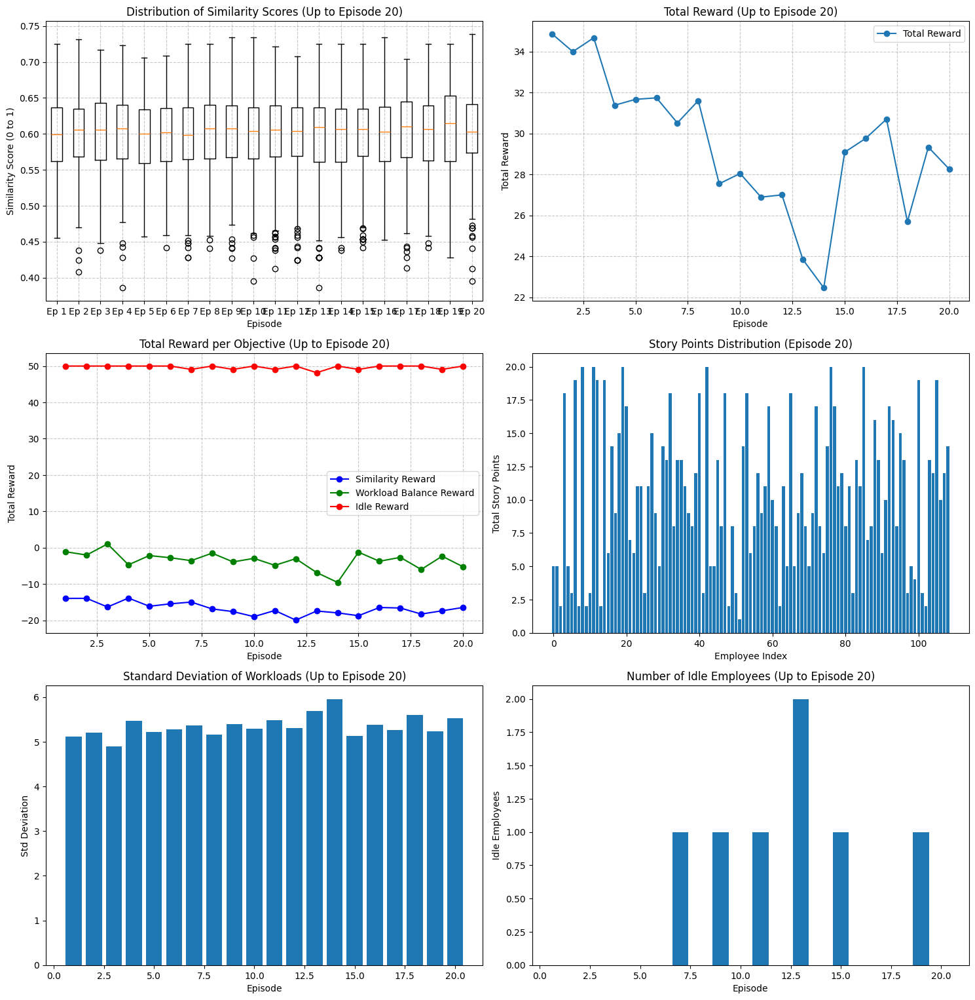

In [ ]:
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import gym
from gym import spaces
import random
from collections import deque
import time
from torch.cuda.amp import GradScaler as AmpGradScaler
import torch.amp
import matplotlib.pyplot as plt
import seaborn as sns

# Set device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Global Variables
NUM_EMPLOYEES = 109
NUM_TASKS = 300
NUM_EPISODES = 20
LEARNING_RATE = 3e-4
INITIAL_TEMPERATURE = 1.0
MIN_TEMPERATURE = 0.2
INITIAL_EPSILON = 1.0
MIN_EPSILON = 0.2
GAMMA = 0.99
MEMORY_SIZE = 50000
BATCH_SIZE = 64
TARGET_UPDATE_FREQ = 1000
DQN_HIDDEN_DIM = 256
MAX_WORKLOAD = 20
ALPHA_WED = 0.5

SAVE_EPISODES = []
MAX_STEPS_PER_EPISODE = NUM_TASKS
TOTAL_STEPS = NUM_EPISODES * MAX_STEPS_PER_EPISODE
DECAY_RATE_TEMP = -np.log(MIN_TEMPERATURE / INITIAL_TEMPERATURE) / TOTAL_STEPS
DECAY_RATE_EPS = -np.log(MIN_EPSILON / INITIAL_EPSILON) / TOTAL_STEPS

task_data_path = '/content/drive/MyDrive/Skripsi/Resources/Datasets/fixed_data_task.csv'
employee_data_path = '/content/drive/MyDrive/Skripsi/Resources/Datasets/fixed_data_employee.csv'
model_save_path = '/content/drive/MyDrive/Skripsi/reassignment_dqn_model.pth'
agent_save_path = '/content/drive/MyDrive/Skripsi/reassignment_dqn_agent_params.pth'

# Load data with proper type handling
task_data = pd.read_csv(task_data_path)
employee_data = pd.read_csv(employee_data_path)
task_subset = task_data.iloc[:NUM_TASKS]
employee_subset = employee_data.iloc[:NUM_EMPLOYEES]
skill_columns = [col for col in task_data.columns if col not in ['task_id', 'story_points', 'project_id']]

# Convert project_id to integer mapping
project_id_map = {pid: idx + 1 for idx, pid in enumerate(task_subset['project_id'].unique())}
project_ids = task_subset['project_id'].map(project_id_map).values

# Convert skill columns and story points to float32
task_skills_df = task_subset[skill_columns].fillna(0).astype(np.float32)
employee_skills_df = employee_subset[skill_columns].fillna(0).astype(np.float32)
story_points_df = task_subset['story_points'].astype(np.float32)

# Convert to tensors
task_skills = torch.tensor(task_skills_df.values / 5.0, dtype=torch.float32, device=device)
employee_skills = torch.tensor(employee_skills_df.values / 5.0, dtype=torch.float32, device=device)
story_points = torch.tensor(story_points_df.values, dtype=torch.float32, device=device)
project_ids_tensor = torch.tensor(project_ids, dtype=torch.long, device=device)

class TaskAssignmentEnv(gym.Env):
    def __init__(self):
        super(TaskAssignmentEnv, self).__init__()
        self.num_tasks = NUM_TASKS
        self.num_employees = NUM_EMPLOYEES
        self.max_workload = MAX_WORKLOAD
        self.story_points = story_points
        self.project_ids = project_ids_tensor
        self.task_skills = task_skills
        self.employee_skills = employee_skills
        self.total_story_points = torch.sum(self.story_points).item()
        self.num_skills = task_skills.shape[1]

        self.observation_space = spaces.Dict({
            'state_matrix': spaces.Box(low=0, high=1, shape=(self.num_tasks, self.num_employees, 1), dtype=np.float32),
            'workload_matrix': spaces.Box(low=0, high=MAX_WORKLOAD, shape=(self.num_employees,), dtype=np.float32),
            'idle_status': spaces.Box(low=0, high=1, shape=(self.num_employees,), dtype=np.float32),
            'global_features': spaces.Box(low=0, high=1, shape=(4,), dtype=np.float32),
            'task_mask': spaces.Box(low=0, high=1, shape=(self.num_tasks,), dtype=np.float32)
        })
        self.action_space = spaces.MultiDiscrete([2, self.num_tasks, self.num_employees])
        self.reset()

    def reset(self):
        self.workloads = torch.zeros(self.num_employees, device=device, dtype=torch.float32)
        self.assignments = torch.full((self.num_tasks,), -1, dtype=torch.long, device=device)
        self.remaining_tasks = torch.arange(self.num_tasks, device=device, dtype=torch.long)
        self.employee_projects = torch.full((self.num_employees,), -1, dtype=torch.long, device=device)
        self.wed_scores = []
        self._initialize_state_matrix()
        return self._get_obs()

    def _initialize_state_matrix(self):
        task_skills_expanded = self.task_skills.unsqueeze(1).expand(-1, self.num_employees, -1)
        emp_skills_expanded = self.employee_skills.unsqueeze(0).expand(self.num_tasks, -1, -1)
        diff = emp_skills_expanded - task_skills_expanded
        weights = 1 / (1 + ALPHA_WED * torch.maximum(diff, torch.tensor(0.0, device=device, dtype=torch.float32)))
        mask = self.task_skills.unsqueeze(1).expand(-1, self.num_employees, -1) > 0
        weighted_diff = weights * mask * (emp_skills_expanded - task_skills_expanded) ** 2
        wed = torch.sqrt(torch.sum(weighted_diff, dim=2))
        num_skills_per_task = torch.sum(self.task_skills > 0, dim=1).unsqueeze(1).expand(-1, self.num_employees)
        wed_worst = torch.sqrt(num_skills_per_task * (1.0 ** 2))
        wed_worst = torch.where(num_skills_per_task > 0, wed_worst, torch.tensor(1.0, device=device, dtype=torch.float32))
        self.state_matrix = (1 - (wed / wed_worst)).unsqueeze(-1).to(dtype=torch.float32)
        workload_penalty = self.workloads.unsqueeze(0).expand(self.num_tasks, -1).unsqueeze(-1) / self.max_workload
        self.state_matrix = self.state_matrix * (1 - torch.clamp(workload_penalty, 0, 1))

    def _update_state_matrix(self, task_idx, emp_idx):
        task_skills_t = self.task_skills[task_idx]
        emp_skills_e = self.employee_skills[emp_idx]
        diff = emp_skills_e - task_skills_t
        weights = 1 / (1 + ALPHA_WED * torch.maximum(diff, torch.tensor(0.0, device=device, dtype=torch.float32)))
        mask = task_skills_t > 0
        weighted_diff = weights[mask] * (emp_skills_e[mask] - task_skills_t[mask]) ** 2
        wed = torch.sqrt(torch.sum(weighted_diff))
        num_skills = torch.sum(mask.float())
        wed_worst = torch.sqrt(num_skills * (1.0 ** 2)) if num_skills > 0 else 1.0
        similarity = 1 - (wed / wed_worst) if wed_worst > 0 else 0.0
        workload_penalty = self.workloads[emp_idx].unsqueeze(0).unsqueeze(-1) / self.max_workload
        self.state_matrix[task_idx, emp_idx, 0] = similarity * (1 - torch.clamp(workload_penalty, 0, 1))

    def _get_obs(self):
        workload_matrix = self.workloads.to(dtype=torch.float32)
        idle_status = (self.workloads == 0).float().to(dtype=torch.float32)
        prop_remaining = len(self.remaining_tasks) / self.num_tasks
        num_idle = torch.sum(idle_status).item()
        prop_idle = num_idle / self.num_employees
        mean_workload = torch.mean(self.workloads).item() if torch.sum(self.workloads) > 0 else 1e-6
        std_workload = torch.std(self.workloads).item()
        cv_normalized = std_workload / (self.max_workload / np.sqrt(self.num_employees)) if mean_workload > 0 else 0
        std_workload_normalized = std_workload / self.max_workload

        global_features = torch.tensor([prop_remaining, prop_idle, cv_normalized, std_workload_normalized],
                                     device=device, dtype=torch.float32)

        task_mask = torch.zeros(self.num_tasks, device=device, dtype=torch.float32)
        task_mask[self.remaining_tasks] = 1

        return {
            'state_matrix': self.state_matrix,
            'workload_matrix': workload_matrix,
            'idle_status': idle_status,
            'global_features': global_features,
            'task_mask': task_mask
        }

    def step(self, action):
        action_type, task_idx, emp_idx = action
        done = False
        reward = {'similarity': 0.0, 'workload': 0.0, 'idle': 0.0}
        info = {'action_valid': True}

        if emp_idx < 0 or emp_idx >= self.num_employees:
            reward['similarity'] = -1.0
            info['action_valid'] = False
            info['invalid_action'] = 'Invalid employee index'
            return self._get_obs(), reward, done, info

        if action_type == 0:
            if task_idx not in self.remaining_tasks:
                reward['similarity'] = -1.0
                info['action_valid'] = False
                info['invalid_action'] = 'Task already assigned'
                return self._get_obs(), reward, done, info

            task_project = self.project_ids[task_idx]
            emp_project = self.employee_projects[emp_idx]
            current_workload = self.workloads[emp_idx]

            if emp_project != -1 and emp_project != task_project:
                reward['similarity'] = -1.0
                info['action_valid'] = False
                info['invalid_action'] = 'Different project'
                return self._get_obs(), reward, done, info

            if current_workload + self.story_points[task_idx] > self.max_workload:
                reward['similarity'] = -1.0
                info['action_valid'] = False
                info['invalid_action'] = 'Exceeds workload'
                return self._get_obs(), reward, done, info

            was_idle = (self.workloads[emp_idx] == 0)
            self.assignments[task_idx] = emp_idx
            self.workloads[emp_idx] += self.story_points[task_idx]
            self.remaining_tasks = self.remaining_tasks[self.remaining_tasks != task_idx]
            if self.employee_projects[emp_idx] == -1:
                self.employee_projects[emp_idx] = task_project

            self._update_state_matrix(task_idx, emp_idx)

        elif action_type == 1:
            if task_idx in self.remaining_tasks:
                reward['similarity'] = -1.0
                info['action_valid'] = False
                info['invalid_action'] = 'Task not yet assigned'
                return self._get_obs(), reward, done, info

            current_emp_idx = self.assignments[task_idx]
            if current_emp_idx == emp_idx:
                reward['similarity'] = -1.0
                info['action_valid'] = False
                info['invalid_action'] = 'Task already assigned to this employee'
                return self._get_obs(), reward, done, info

            task_project = self.project_ids[task_idx]
            emp_project = self.employee_projects[emp_idx]
            current_workload = self.workloads[emp_idx]

            if emp_project != -1 and emp_project != task_project:
                reward['similarity'] = -1.0
                info['action_valid'] = False
                info['invalid_action'] = 'Different project for new employee'
                return self._get_obs(), reward, done, info

            if current_workload + self.story_points[task_idx] > self.max_workload:
                reward['similarity'] = -1.0
                info['action_valid'] = False
                info['invalid_action'] = 'Exceeds workload for new employee'
                return self._get_obs(), reward, done, info

            self.workloads[current_emp_idx] -= self.story_points[task_idx]
            emp_tasks = (self.assignments == current_emp_idx) & (self.project_ids == task_project)
            emp_tasks[task_idx] = False
            if not torch.any(emp_tasks):
                self.employee_projects[current_emp_idx] = -1

            was_idle = (self.workloads[emp_idx] == 0)
            self.assignments[task_idx] = emp_idx
            self.workloads[emp_idx] += self.story_points[task_idx]
            if self.employee_projects[emp_idx] == -1:
                self.employee_projects[emp_idx] = task_project

            self._update_state_matrix(task_idx, emp_idx)

        else:
            reward['similarity'] = -1.0
            info['action_valid'] = False
            info['invalid_action'] = 'Invalid action type'
            return self._get_obs(), reward, done, info

        task_skills_t = self.task_skills[task_idx]
        emp_skills_e = self.employee_skills[emp_idx]
        diff = emp_skills_e - task_skills_t
        weights = 1 / (1 + ALPHA_WED * torch.maximum(diff, torch.tensor(0.0, device=device, dtype=torch.float32)))
        mask = task_skills_t > 0
        weighted_diff = weights[mask] * (emp_skills_e[mask] - task_skills_t[mask]) ** 2
        wed = torch.sqrt(torch.sum(weighted_diff))

        similarity = self.state_matrix[task_idx, emp_idx, 0].item()
        info['similarity'] = similarity
        self.wed_scores.append(wed.item())

        reward['similarity'] = 0.0 if action_type == 0 else -0.01
        reward['workload'] = 0.0
        reward['idle'] = 0.0

        if len(self.remaining_tasks) == 0:
            done = True

            assigned_tasks = torch.where(self.assignments != -1)[0]
            total_similarity = 0.0
            for task_idx in assigned_tasks:
                emp_idx = self.assignments[task_idx].item()
                similarity = self.state_matrix[task_idx, emp_idx, 0].item()
                total_similarity += similarity
            avg_similarity = total_similarity / self.num_tasks if self.num_tasks > 0 else 0.0
            reward['similarity'] = 50.0 * (2.0 * avg_similarity - 1.0)

            std_workload = torch.std(self.workloads).item()
            max_std = self.max_workload / 2
            normalized_std = std_workload / max_std if max_std > 0 else 0.0
            reward['workload'] = 50.0 * (1.0 - 2.0 * normalized_std)

            num_idle = torch.sum(self.workloads == 0).item()
            idle_ratio = num_idle / self.num_employees
            reward['idle'] = 50.0 * (1.0 - 2.0 * idle_ratio)

            info['avg_similarity'] = avg_similarity
            info['std_workload'] = std_workload
            info['num_idle'] = num_idle

        return self._get_obs(), reward, done, info

class DQN(nn.Module):
    def __init__(self, input_dim, num_employees, num_tasks):
        super(DQN, self).__init__()
        self.num_employees = num_employees
        self.num_tasks = num_tasks
        self.conv1 = nn.Conv2d(1, 16, kernel_size=3, stride=1, padding=1).to(device, dtype=torch.float32)
        self.conv2 = nn.Conv2d(16, 32, kernel_size=3, stride=1, padding=1).to(device, dtype=torch.float32)
        conv_output_height = (num_tasks // 2) // 2
        conv_output_width = (num_employees // 2) // 2
        conv_output_size = 32 * conv_output_height * conv_output_width
        self.fc1 = nn.Linear(conv_output_size + num_employees * 2 + 4, DQN_HIDDEN_DIM).to(device, dtype=torch.float32)
        self.fc2 = nn.Linear(DQN_HIDDEN_DIM, DQN_HIDDEN_DIM // 2).to(device, dtype=torch.float32)
        self.fc3 = nn.Linear(DQN_HIDDEN_DIM // 2, 2 * num_tasks * num_employees).to(device, dtype=torch.float32)

    def forward(self, state_matrix, workload_matrix, idle_status, global_features):
        batch_size = state_matrix.size(0)
        state_input = state_matrix.permute(0, 3, 1, 2)
        state_input = F.relu(self.conv1(state_input))
        state_input = F.max_pool2d(state_input, 2)
        state_input = F.relu(self.conv2(state_input))
        state_input = F.max_pool2d(state_input, 2)
        state_input = state_input.reshape(batch_size, -1)

        workload_input = workload_matrix.view(batch_size, -1)
        idle_input = idle_status.view(batch_size, -1)
        global_input = global_features.view(batch_size, -1)

        x = torch.cat([state_input, workload_input, idle_input, global_input], dim=1)
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        q_values = self.fc3(x).view(batch_size, 2, self.num_tasks, self.num_employees)
        return q_values

class DQNAgent:
    def __init__(self, num_tasks, num_employees):
        self.device = device
        self.num_tasks = num_tasks
        self.num_employees = num_employees
        self.input_dim = 1 + 1 + 1 + 4
        self.model = DQN(self.input_dim, self.num_employees, self.num_tasks).to(device)
        self.target_model = DQN(self.input_dim, self.num_employees, self.num_tasks).to(device)
        self.target_model.load_state_dict(self.model.state_dict())
        self.optimizer = torch.optim.Adam(self.model.parameters(), lr=LEARNING_RATE)
        self.memory = deque(maxlen=MEMORY_SIZE)
        self.batch_size = BATCH_SIZE
        self.temperature = INITIAL_TEMPERATURE
        self.epsilon = INITIAL_EPSILON
        self.gamma = GAMMA
        self.global_step = 0
        self.scaler = torch.amp.GradScaler('cuda')

    def update_temp_eps(self):
        self.global_step += 1
        self.temperature = max(MIN_TEMPERATURE, INITIAL_TEMPERATURE * np.exp(-DECAY_RATE_TEMP * self.global_step))
        self.epsilon = max(MIN_EPSILON, INITIAL_EPSILON * np.exp(-DECAY_RATE_EPS * self.global_step))

    def act(self, obs, env):
        valid_tasks = torch.where(obs['task_mask'] == 1)[0]
        assigned_tasks = torch.where(env.assignments != -1)[0]

        if random.random() < self.epsilon:
            if len(valid_tasks) > 0 and random.random() < 0.8:
                while True:
                    task_idx = random.choice(valid_tasks.cpu().numpy())
                    valid_emps = torch.where(
                        (env.workloads + env.story_points[task_idx] <= env.max_workload) &
                        ((env.employee_projects == -1) | (env.employee_projects == env.project_ids[task_idx]))
                    )[0]
                    if valid_emps.size(0) > 0:
                        emp_idx = random.choice(valid_emps.cpu().numpy())
                        return [0, task_idx, emp_idx]
            else:
                if len(assigned_tasks) == 0:
                    while True:
                        task_idx = random.choice(valid_tasks.cpu().numpy())
                        valid_emps = torch.where(
                            (env.workloads + env.story_points[task_idx] <= env.max_workload) &
                            ((env.employee_projects == -1) | (env.employee_projects == env.project_ids[task_idx]))
                        )[0]
                        if valid_emps.size(0) > 0:
                            emp_idx = random.choice(valid_emps.cpu().numpy())
                            return [0, task_idx, emp_idx]
                while True:
                    task_idx = random.choice(assigned_tasks.cpu().numpy())
                    current_emp_idx = env.assignments[task_idx].item()
                    valid_emps = torch.where(
                        (torch.arange(self.num_employees, device=device) != current_emp_idx) &
                        (env.workloads + env.story_points[task_idx] <= env.max_workload) &
                        ((env.employee_projects == -1) | (env.employee_projects == env.project_ids[task_idx]))
                    )[0]
                    if valid_emps.size(0) > 0:
                        emp_idx = random.choice(valid_emps.cpu().numpy())
                        return [1, task_idx, emp_idx]

        state_matrix = obs['state_matrix'].unsqueeze(0).to(dtype=torch.float32)
        workload_matrix = obs['workload_matrix'].unsqueeze(0).to(dtype=torch.float32)
        idle_status = obs['idle_status'].unsqueeze(0).to(dtype=torch.float32)
        global_features = obs['global_features'].unsqueeze(0).to(dtype=torch.float32)

        with torch.no_grad():
            q_values = self.model(state_matrix, workload_matrix, idle_status, global_features)

            task_mask = torch.zeros(self.num_tasks, device=device, dtype=torch.bool)
            task_mask[valid_tasks] = 1
            emp_mask = torch.ones(self.num_tasks, self.num_employees, device=device, dtype=torch.bool)
            for t in range(self.num_tasks):
                emp_mask[t] = (
                    (env.workloads + env.story_points[t] <= env.max_workload) &
                    ((env.employee_projects == -1) | (env.employee_projects == env.project_ids[t]))
                )

            assign_mask = torch.zeros_like(q_values, dtype=torch.bool)
            assign_mask[:, 0] = task_mask.unsqueeze(-1).expand(-1, self.num_employees) & emp_mask

            reassign_mask = torch.zeros_like(q_values, dtype=torch.bool)
            for t in assigned_tasks:
                current_emp_idx = env.assignments[t].item()
                reassign_emp_mask = emp_mask[t].clone()
                reassign_emp_mask[current_emp_idx] = False
                reassign_mask[0, 1, t] = reassign_emp_mask

            combined_mask = assign_mask | reassign_mask
            q_values[~combined_mask] = -float('inf')

            if torch.all(q_values == -float('inf')):
                if len(valid_tasks) > 0:
                    while True:
                        task_idx = random.choice(valid_tasks.cpu().numpy())
                        valid_emps = torch.where(
                            (env.workloads + env.story_points[task_idx] <= env.max_workload) &
                            ((env.employee_projects == -1) | (env.employee_projects == env.project_ids[task_idx]))
                        )[0]
                        if valid_emps.size(0) > 0:
                            emp_idx = random.choice(valid_emps.cpu().numpy())
                            return [0, task_idx, emp_idx]
                else:
                    while True:
                        task_idx = random.choice(assigned_tasks.cpu().numpy())
                        current_emp_idx = env.assignments[task_idx].item()
                        valid_emps = torch.where(
                            (torch.arange(self.num_employees, device=device) != current_emp_idx) &
                            (env.workloads + env.story_points[task_idx] <= env.max_workload) &
                            ((env.employee_projects == -1) | (env.employee_projects == env.project_ids[task_idx]))
                        )[0]
                        if valid_emps.size(0) > 0:
                            emp_idx = random.choice(valid_emps.cpu().numpy())
                            return [1, task_idx, emp_idx]
            else:
                action_idx = torch.argmax(q_values.view(-1)).item()
                action_type = action_idx // (self.num_tasks * self.num_employees)
                task_emp_idx = action_idx % (self.num_tasks * self.num_employees)
                task_idx = task_emp_idx // self.num_employees
                emp_idx = task_emp_idx % self.num_employees
                return [action_type, task_idx, emp_idx]

    def remember(self, state, action, reward, next_state, done):
        self.memory.append((state, action, reward, next_state, done))

    def replay(self, env):
        if len(self.memory) < self.batch_size:
            return
        batch = random.sample(self.memory, self.batch_size)
        states, actions, rewards, next_states, dones = zip(*batch)

        state_matrices = torch.stack([s['state_matrix'] for s in states]).to(dtype=torch.float32)
        workload_matrices = torch.stack([s['workload_matrix'] for s in states]).to(dtype=torch.float32)
        idle_statuses = torch.stack([s['idle_status'] for s in states]).to(dtype=torch.float32)
        global_features = torch.stack([s['global_features'] for s in states]).to(dtype=torch.float32)
        next_state_matrices = torch.stack([s['state_matrix'] for s in next_states]).to(dtype=torch.float32)
        next_workload_matrices = torch.stack([s['workload_matrix'] for s in next_states]).to(dtype=torch.float32)
        next_idle_statuses = torch.stack([s['idle_status'] for s in next_states]).to(dtype=torch.float32)
        next_global_features = torch.stack([s['global_features'] for s in next_states]).to(dtype=torch.float32)

        actions = torch.tensor(actions, dtype=torch.long, device=self.device)
        rewards = torch.tensor([r['similarity'] + r['workload'] + r['idle'] for r in rewards], dtype=torch.float32, device=self.device)
        dones = torch.tensor(dones, dtype=torch.float32, device=self.device)

        action_types = actions[:, 0]
        task_idx = actions[:, 1]
        emp_idx = actions[:, 2]
        batch_indices = torch.arange(self.batch_size, device=self.device)

        with torch.amp.autocast('cuda'):
            self.optimizer.zero_grad()
            q_values = self.model(state_matrices, workload_matrices, idle_statuses, global_features)
            q_values_selected = q_values[batch_indices, action_types, task_idx, emp_idx]

            next_q_values = self.target_model(next_state_matrices, next_workload_matrices, next_idle_statuses, next_global_features)
            next_q_values_max = next_q_values.view(self.batch_size, -1).max(dim=1)[0]
            targets = rewards + (1 - dones) * self.gamma * next_q_values_max

            loss = F.mse_loss(q_values_selected, targets)

        self.scaler.scale(loss).backward()
        self.scaler.step(self.optimizer)
        self.scaler.update()

    def update_target(self):
        self.target_model.load_state_dict(self.model.state_dict())

    def save(self, model_path, agent_path):
        torch.save({
            'model_state_dict': self.model.state_dict(),
            'target_model_state_dict': self.target_model.state_dict(),
            'optimizer_state_dict': self.optimizer.state_dict()
        }, model_path)
        torch.save({'temperature': self.temperature, 'epsilon': self.epsilon}, agent_path)

    def load(self, model_path, agent_path):
        checkpoint = torch.load(model_path)
        self.model.load_state_dict(checkpoint['model_state_dict'])
        self.target_model.load_state_dict(checkpoint['target_model_state_dict'])
        self.optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
        agent_params = torch.load(agent_path)
        self.temperature = agent_params['temperature']
        self.epsilon = agent_params['epsilon']
        self.memory = deque(maxlen=MEMORY_SIZE)

def plot_and_summarize(episode_data, wed_scores_list, total_rewards, similarity_rewards,
                      workload_balance_rewards, idle_rewards, workloads_list,
                      std_workloads_list, idle_employees_list, env, num_episodes_to_plot, checkpoint_episode=None):
    print(f"\nTabular Summary of Rewards up to Episode {num_episodes_to_plot}:")
    print("-" * 80)
    print(f"{'Episode':<10} {'Total Reward':<15} {'Similarity':<15} {'Workload':<15} {'Idle':<15} {'Std Dev':<10} {'Idle Emp':<10}")
    print("-" * 80)
    for data in episode_data:
        if data['Episode'] <= num_episodes_to_plot:
            print(f"{data['Episode']:<10} {data['Total Reward']:<15.4f} {data['Similarity Reward']:<15.4f} {data['Workload Balance Reward']:<15.4f} {data['Idle Reward']:<15.4f} {data['Std Workloads']:<10.4f} {data['Idle Employees']:<10}")
    print("-" * 80)

    plt.figure(figsize=(15, 20))

    plt.subplot(4, 2, 1)
    alpha = ALPHA_WED
    weights_worst = 1 / (1 + alpha * 1)
    wed_raw_worst = np.sqrt(np.sum(weights_worst * (0 - 1) ** 2) * env.num_skills)
    wed_raw_best = 0
    standardized_similarities_per_episode = []
    for episode_wed_scores in wed_scores_list[:num_episodes_to_plot]:
        similarities = [(wed_raw_worst - wed) / (wed_raw_worst - wed_raw_best) for wed in episode_wed_scores]
        standardized_similarities_per_episode.append(similarities)
    plt.boxplot(standardized_similarities_per_episode, labels=[f"Ep {i+1}" for i in range(num_episodes_to_plot)])
    plt.title(f'Distribution of Similarity Scores (Up to Episode {num_episodes_to_plot})')
    plt.xlabel('Episode')
    plt.ylabel('Similarity Score (0 to 1)')
    plt.grid(True, linestyle='--', alpha=0.7)

    plt.subplot(4, 2, 2)
    plt.plot(range(1, num_episodes_to_plot + 1), total_rewards[:num_episodes_to_plot], marker='o', label='Total Reward')
    plt.title(f'Total Reward (Up to Episode {num_episodes_to_plot})')
    plt.xlabel('Episode')
    plt.ylabel('Total Reward')
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.legend()

    plt.subplot(4, 2, 3)
    plt.plot(range(1, num_episodes_to_plot + 1), similarity_rewards[:num_episodes_to_plot], marker='o', label='Similarity Reward', color='blue')
    plt.plot(range(1, num_episodes_to_plot + 1), workload_balance_rewards[:num_episodes_to_plot], marker='o', label='Workload Balance Reward', color='green')
    plt.plot(range(1, num_episodes_to_plot + 1), idle_rewards[:num_episodes_to_plot], marker='o', label='Idle Reward', color='red')
    plt.title(f'Total Reward per Objective (Up to Episode {num_episodes_to_plot})')
    plt.xlabel('Episode')
    plt.ylabel('Total Reward')
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.legend()

    plt.subplot(4, 2, 4)
    plt.bar(range(env.num_employees), workloads_list[num_episodes_to_plot - 1])
    plt.title(f'Story Points Distribution (Episode {num_episodes_to_plot})')
    plt.xlabel('Employee Index')
    plt.ylabel('Total Story Points')

    plt.subplot(4, 2, 5)
    plt.bar(range(1, num_episodes_to_plot + 1), std_workloads_list[:num_episodes_to_plot])
    plt.title(f'Standard Deviation of Workloads (Up to Episode {num_episodes_to_plot})')
    plt.xlabel('Episode')
    plt.ylabel('Std Deviation')

    plt.subplot(4, 2, 6)
    plt.bar(range(1, num_episodes_to_plot + 1), idle_employees_list[:num_episodes_to_plot])
    plt.title(f'Number of Idle Employees (Up to Episode {num_episodes_to_plot})')
    plt.xlabel('Episode')
    plt.ylabel('Idle Employees')
    plt.ylim(bottom=0)

    plt.tight_layout()
    filename = f'reassignment_training_metrics_eps{checkpoint_episode}.png' if checkpoint_episode else 'reassignment_training_metrics_final.png'
    plt.savefig(filename)
    print(f"Training metrics plot saved to '{filename}'")
    plt.show()

def train_dqn():
    env = TaskAssignmentEnv()
    agent = DQNAgent(env.num_tasks, env.num_employees)
    total_rewards = []
    wed_scores_list = []
    workloads_list = []
    std_workloads_list = []
    idle_employees_list = []
    similarity_rewards = []
    workload_balance_rewards = []
    idle_rewards = []
    global_step = 0
    episode_data = []

    for episode in range(NUM_EPISODES):
        obs = env.reset()
        total_reward = 0
        episode_similarity = 0
        episode_workload_balance = 0
        episode_idle_reward = 0
        invalid_actions = 0
        done = False
        step = 0

        print(f"Episode {episode+1}/{NUM_EPISODES}, Temp: {agent.temperature:.3f}, Epsilon: {agent.epsilon:.3f}")
        while not done:
            step += 1
            global_step += 1
            start_time = time.time()
            action = agent.act(obs, env)
            next_obs, reward, done, info = env.step(action)
            agent.remember(obs, action, reward, next_obs, done)
            agent.replay(env)
            obs = next_obs

            total_reward += sum(reward.values())
            episode_similarity += reward['similarity']
            episode_workload_balance += reward['workload']
            episode_idle_reward += reward['idle']

            if not info.get('action_valid', True):
                invalid_actions += 1
                print(f"Step {step}: Invalid action - {info.get('invalid_action', 'Unknown reason')}")

            num_idle = torch.sum(env.workloads == 0).item()
            if step % 10 == 0:
                print(f"Step {step}: Reward {total_reward/step:.4f}, Time {step_time:.2f}s, Num Idle: {num_idle}")

            step_time = time.time() - start_time

            agent.update_temp_eps()
            if global_step % TARGET_UPDATE_FREQ == 0:
                agent.update_target()

        wed_scores_list.append(env.wed_scores)

        workloads_list.append(env.workloads.clone().cpu().numpy())
        std_workloads = info.get('std_workload', torch.std(env.workloads).item())
        num_idle = info.get('num_idle', torch.sum(env.workloads == 0).item())
        std_workloads_list.append(std_workloads)
        idle_employees_list.append(max(num_idle, 0))
        total_rewards.append(total_reward)
        similarity_rewards.append(episode_similarity)
        workload_balance_rewards.append(episode_workload_balance)
        idle_rewards.append(episode_idle_reward)

        print(f"Episode {episode+1} - Steps: {step}, Total Reward: {total_reward:.2f}, Std Workloads: {std_workloads:.2f}, Idle: {num_idle}, Invalid Actions: {invalid_actions}")
        print(f"Total Similarity Reward: {episode_similarity:.2f}, Workload Balance Reward: {episode_workload_balance:.2f}, Idle Reward: {episode_idle_reward:.2f}")

        episode_data.append({
            'Episode': episode + 1,
            'Total Reward': total_reward,
            'Similarity Reward': episode_similarity,
            'Workload Balance Reward': episode_workload_balance,
            'Idle Reward': episode_idle_reward,
            'Std Workloads': std_workloads,
            'Idle Employees': max(num_idle, 0)
        })

        if episode + 1 in SAVE_EPISODES:
            print(f"\nCheckpoint at Episode {episode + 1}")
            plot_and_summarize(
                episode_data=episode_data,
                wed_scores_list=wed_scores_list,
                total_rewards=total_rewards,
                similarity_rewards=similarity_rewards,
                workload_balance_rewards=workload_balance_rewards,
                idle_rewards=idle_rewards,
                workloads_list=workloads_list,
                std_workloads_list=std_workloads_list,
                idle_employees_list=idle_employees_list,
                env=env,
                num_episodes_to_plot=episode + 1,
                checkpoint_episode=episode + 1
            )
            checkpoint_model_path = f"/content/drive/MyDrive/Skripsi/reassignment_dqn_model_eps{episode + 1}.pth"
            checkpoint_agent_path = f"/content/drive/MyDrive/Skripsi/reassignment_dqn_agent_params_eps{episode + 1}.pth"
            agent.save(checkpoint_model_path, checkpoint_agent_path)

    agent.save(model_save_path, agent_save_path)

    plot_and_summarize(
        episode_data=episode_data,
        wed_scores_list=wed_scores_list,
        total_rewards=total_rewards,
        similarity_rewards=similarity_rewards,
        workload_balance_rewards=workload_balance_rewards,
        idle_rewards=idle_rewards,
        workloads_list=workloads_list,
        std_workloads_list=std_workloads_list,
        idle_employees_list=idle_employees_list,
        env=env,
        num_episodes_to_plot=NUM_EPISODES
    )

    return env, workloads_list, std_workloads_list, idle_employees_list, NUM_EPISODES, episode_data, agent

# Run training
env, workloads_list, std_workloads_list, idle_employees_list, num_episodes, episode_data, trained_agent = train_dqn()

#### Inference

In [ ]:
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import gym
from gym import spaces
import random
from collections import deque
import matplotlib.pyplot as plt
import seaborn as sns
from uuid import uuid4

# Set device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Environment class
class TaskAssignmentEnv(gym.Env):
    def __init__(self):
        super(TaskAssignmentEnv, self).__init__()
        self.max_workload = 20
        self.alpha_wed = 0.5
        # Observation and action spaces will be set dynamically after num_tasks and num_employees are defined

    def set_spaces(self, num_tasks, num_employees):
        self.num_tasks = num_tasks
        self.num_employees = num_employees
        self.observation_space = spaces.Dict({
            'state_matrix': spaces.Box(low=0, high=1, shape=(num_tasks, num_employees, 1), dtype=np.float32),
            'workload_matrix': spaces.Box(low=0, high=self.max_workload, shape=(num_employees,), dtype=np.float32),
            'idle_status': spaces.Box(low=0, high=1, shape=(num_employees,), dtype=np.float32),
            'global_features': spaces.Box(low=0, high=1, shape=(4,), dtype=np.float32),
            'task_mask': spaces.Box(low=0, high=1, shape=(num_tasks,), dtype=np.float32)
        })
        self.action_space = spaces.MultiDiscrete([2, num_tasks, num_employees])

    def reset(self):
        self.workloads = torch.zeros(self.num_employees, device=device, dtype=torch.float32)
        self.assignments = torch.full((self.num_tasks,), -1, dtype=torch.long, device=device)
        self.remaining_tasks = torch.arange(self.num_tasks, device=device, dtype=torch.long)
        self.employee_projects = torch.full((self.num_employees,), -1, dtype=torch.long, device=device)
        self.wed_scores = []
        self._initialize_state_matrix()
        return self._get_obs()

    def _initialize_state_matrix(self):
        task_skills_expanded = self.task_skills.unsqueeze(1).expand(-1, self.num_employees, -1)
        emp_skills_expanded = self.employee_skills.unsqueeze(0).expand(self.num_tasks, -1, -1)
        diff = emp_skills_expanded - task_skills_expanded
        weights = 1 / (1 + self.alpha_wed * torch.maximum(diff, torch.tensor(0.0, device=device, dtype=torch.float32)))
        mask = self.task_skills.unsqueeze(1).expand(-1, self.num_employees, -1) > 0
        weighted_diff = weights * mask * (emp_skills_expanded - task_skills_expanded) ** 2
        wed = torch.sqrt(torch.sum(weighted_diff, dim=2))
        num_skills_per_task = torch.sum(self.task_skills > 0, dim=1).unsqueeze(1).expand(-1, self.num_employees)
        wed_worst = torch.sqrt(num_skills_per_task * (1.0 ** 2))
        wed_worst = torch.where(num_skills_per_task > 0, wed_worst, torch.tensor(1.0, device=device, dtype=torch.float32))
        self.state_matrix = (1 - (wed / wed_worst)).unsqueeze(-1).to(dtype=torch.float32)
        workload_penalty = self.workloads.unsqueeze(0).expand(self.num_tasks, -1).unsqueeze(-1) / self.max_workload
        self.state_matrix = self.state_matrix * (1 - torch.clamp(workload_penalty, 0, 1))

    def _update_state_matrix(self, task_idx, emp_idx):
        task_skills_t = self.task_skills[task_idx]
        emp_skills_e = self.employee_skills[emp_idx]
        diff = emp_skills_e - task_skills_t
        weights = 1 / (1 + self.alpha_wed * torch.maximum(diff, torch.tensor(0.0, device=device, dtype=torch.float32)))
        mask = task_skills_t > 0
        weighted_diff = weights[mask] * (emp_skills_e[mask] - task_skills_t[mask]) ** 2
        wed = torch.sqrt(torch.sum(weighted_diff))
        num_skills = torch.sum(mask.float())
        wed_worst = torch.sqrt(num_skills * (1.0 ** 2)) if num_skills > 0 else 1.0
        similarity = 1 - (wed / wed_worst) if wed_worst > 0 else 0.0
        workload_penalty = self.workloads[emp_idx].unsqueeze(0).unsqueeze(-1) / self.max_workload
        self.state_matrix[task_idx, emp_idx, 0] = similarity * (1 - torch.clamp(workload_penalty, 0, 1))

    def _get_obs(self):
        workload_matrix = self.workloads.to(dtype=torch.float32)
        idle_status = (self.workloads == 0).float().to(dtype=torch.float32)
        prop_remaining = len(self.remaining_tasks) / self.num_tasks
        num_idle = torch.sum(idle_status).item()
        prop_idle = num_idle / self.num_employees
        mean_workload = torch.mean(self.workloads).item() if torch.sum(self.workloads) > 0 else 1e-6
        std_workload = torch.std(self.workloads).item()
        cv_normalized = std_workload / (self.max_workload / np.sqrt(self.num_employees)) if mean_workload > 0 else 0
        std_workload_normalized = std_workload / self.max_workload

        global_features = torch.tensor([prop_remaining, prop_idle, cv_normalized, std_workload_normalized],
                                     device=device, dtype=torch.float32)

        task_mask = torch.zeros(self.num_tasks, device=device, dtype=torch.float32)
        task_mask[self.remaining_tasks] = 1

        return {
            'state_matrix': self.state_matrix,
            'workload_matrix': workload_matrix,
            'idle_status': idle_status,
            'global_features': global_features,
            'task_mask': task_mask
        }

    def step(self, action):
        action_type, task_idx, emp_idx = action
        done = False
        reward = {'similarity': 0.0, 'workload': 0.0, 'idle': 0.0}
        info = {'action_valid': True}

        if emp_idx < 0 or emp_idx >= self.num_employees:
            reward['similarity'] = -1.0
            info['action_valid'] = False
            info['invalid_action'] = 'Invalid employee index'
            return self._get_obs(), reward, done, info

        if action_type == 0:
            if task_idx not in self.remaining_tasks:
                reward['similarity'] = -1.0
                info['action_valid'] = False
                info['invalid_action'] = 'Task already assigned'
                return self._get_obs(), reward, done, info

            task_project = self.project_ids[task_idx]
            emp_project = self.employee_projects[emp_idx]
            current_workload = self.workloads[emp_idx]

            if emp_project != -1 and emp_project != task_project:
                reward['similarity'] = -1.0
                info['action_valid'] = False
                info['invalid_action'] = 'Different project'
                return self._get_obs(), reward, done, info

            if current_workload + self.story_points[task_idx] > self.max_workload:
                reward['similarity'] = -1.0
                info['action_valid'] = False
                info['invalid_action'] = 'Exceeds workload'
                return self._get_obs(), reward, done, info

            was_idle = (self.workloads[emp_idx] == 0)
            self.assignments[task_idx] = emp_idx
            self.workloads[emp_idx] += self.story_points[task_idx]
            self.remaining_tasks = self.remaining_tasks[self.remaining_tasks != task_idx]
            if self.employee_projects[emp_idx] == -1:
                self.employee_projects[emp_idx] = task_project

            self._update_state_matrix(task_idx, emp_idx)

        elif action_type == 1:
            if task_idx in self.remaining_tasks:
                reward['similarity'] = -1.0
                info['action_valid'] = False
                info['invalid_action'] = 'Task not yet assigned'
                return self._get_obs(), reward, done, info

            current_emp_idx = self.assignments[task_idx]
            if current_emp_idx == emp_idx:
                reward['similarity'] = -1.0
                info['action_valid'] = False
                info['invalid_action'] = 'Task already assigned to this employee'
                return self._get_obs(), reward, done, info

            task_project = self.project_ids[task_idx]
            emp_project = self.employee_projects[emp_idx]
            current_workload = self.workloads[emp_idx]

            if emp_project != -1 and emp_project != task_project:
                reward['similarity'] = -1.0
                info['action_valid'] = False
                info['invalid_action'] = 'Different project for new employee'
                return self._get_obs(), reward, done, info

            if current_workload + self.story_points[task_idx] > self.max_workload:
                reward['similarity'] = -1.0
                info['action_valid'] = False
                info['invalid_action'] = 'Exceeds workload for new employee'
                return self._get_obs(), reward, done, info

            self.workloads[current_emp_idx] -= self.story_points[task_idx]
            emp_tasks = (self.assignments == current_emp_idx) & (self.project_ids == task_project)
            emp_tasks[task_idx] = False
            if not torch.any(emp_tasks):
                self.employee_projects[current_emp_idx] = -1

            was_idle = (self.workloads[emp_idx] == 0)
            self.assignments[task_idx] = emp_idx
            self.workloads[emp_idx] += self.story_points[task_idx]
            if self.employee_projects[emp_idx] == -1:
                self.employee_projects[emp_idx] = task_project

            self._update_state_matrix(task_idx, emp_idx)

        else:
            reward['similarity'] = -1.0
            info['action_valid'] = False
            info['invalid_action'] = 'Invalid action type'
            return self._get_obs(), reward, done, info

        task_skills_t = self.task_skills[task_idx]
        emp_skills_e = self.employee_skills[emp_idx]
        diff = emp_skills_e - task_skills_t
        weights = 1 / (1 + self.alpha_wed * torch.maximum(diff, torch.tensor(0.0, device=device, dtype=torch.float32)))
        mask = task_skills_t > 0
        weighted_diff = weights[mask] * (emp_skills_e[mask] - task_skills_t[mask]) ** 2
        wed = torch.sqrt(torch.sum(weighted_diff))

        similarity = self.state_matrix[task_idx, emp_idx, 0].item()
        info['similarity'] = similarity
        self.wed_scores.append(wed.item())

        reward['similarity'] = 0.0 if action_type == 0 else -0.01
        reward['workload'] = 0.0
        reward['idle'] = 0.0

        if len(self.remaining_tasks) == 0:
            done = True

            assigned_tasks = torch.where(self.assignments != -1)[0]
            total_similarity = 0.0
            for task_idx in assigned_tasks:
                emp_idx = self.assignments[task_idx].item()
                similarity = self.state_matrix[task_idx, emp_idx, 0].item()
                total_similarity += similarity
            avg_similarity = total_similarity / self.num_tasks if self.num_tasks > 0 else 0.0
            reward['similarity'] = 50.0 * (2.0 * avg_similarity - 1.0)

            std_workload = torch.std(self.workloads).item()
            max_std = self.max_workload / 2
            normalized_std = std_workload / max_std if max_std > 0 else 0.0
            reward['workload'] = 50.0 * (1.0 - 2.0 * normalized_std)

            num_idle = torch.sum(self.workloads == 0).item()
            idle_ratio = num_idle / self.num_employees
            reward['idle'] = 50.0 * (1.0 - 2.0 * idle_ratio)

            info['avg_similarity'] = avg_similarity
            info['std_workload'] = std_workload
            info['num_idle'] = num_idle

        return self._get_obs(), reward, done, info

# DQN model class
class DQN(nn.Module):
    def __init__(self, input_dim, num_employees, num_tasks):
        super(DQN, self).__init__()
        self.num_employees = num_employees
        self.num_tasks = num_tasks
        self.conv1 = nn.Conv2d(1, 16, kernel_size=3, stride=1, padding=1).to(device, dtype=torch.float32)
        self.conv2 = nn.Conv2d(16, 32, kernel_size=3, stride=1, padding=1).to(device, dtype=torch.float32)
        conv_output_height = (num_tasks // 2) // 2
        conv_output_width = (num_employees // 2) // 2
        conv_output_size = 32 * conv_output_height * conv_output_width
        self.fc1 = nn.Linear(conv_output_size + num_employees * 2 + 4, 256).to(device, dtype=torch.float32)
        self.fc2 = nn.Linear(256, 128).to(device, dtype=torch.float32)
        self.fc3 = nn.Linear(128, 2 * num_tasks * num_employees).to(device, dtype=torch.float32)

    def forward(self, state_matrix, workload_matrix, idle_status, global_features):
        batch_size = state_matrix.size(0)
        state_input = state_matrix.permute(0, 3, 1, 2)
        state_input = F.relu(self.conv1(state_input))
        state_input = F.max_pool2d(state_input, 2)
        state_input = F.relu(self.conv2(state_input))
        state_input = F.max_pool2d(state_input, 2)
        state_input = state_input.reshape(batch_size, -1)

        workload_input = workload_matrix.view(batch_size, -1)
        idle_input = idle_status.view(batch_size, -1)
        global_input = global_features.view(batch_size, -1)

        x = torch.cat([state_input, workload_input, idle_input, global_input], dim=1)
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        q_values = self.fc3(x).view(batch_size, 2, self.num_tasks, self.num_employees)
        return q_values

# DQN agent class
class DQNAgent:
    def __init__(self, num_tasks, num_employees):
        self.device = device
        self.num_tasks = num_tasks
        self.num_employees = num_employees
        self.input_dim = 1 + 1 + 1 + 4
        self.model = DQN(self.input_dim, self.num_employees, self.num_tasks).to(device)
        self.target_model = DQN(self.input_dim, self.num_employees, self.num_tasks).to(device)
        self.target_model.load_state_dict(self.model.state_dict())
        self.optimizer = torch.optim.Adam(self.model.parameters(), lr=3e-4)
        self.memory = deque(maxlen=50000)
        self.batch_size = 64
        self.epsilon = 0.0
        self.gamma = 0.99
        self.scaler = torch.amp.GradScaler('cuda')

    def act(self, obs, env):
        valid_tasks = torch.where(obs['task_mask'] == 1)[0]
        assigned_tasks = torch.where(env.assignments != -1)[0]

        if random.random() < self.epsilon:
            if len(valid_tasks) > 0 and random.random() < 0.8:
                while True:
                    task_idx = random.choice(valid_tasks.cpu().numpy())
                    valid_emps = torch.where(
                        (env.workloads + env.story_points[task_idx] <= env.max_workload) &
                        ((env.employee_projects == -1) | (env.employee_projects == env.project_ids[task_idx]))
                    )[0]
                    if valid_emps.size(0) > 0:
                        emp_idx = random.choice(valid_emps.cpu().numpy())
                        return [0, task_idx, emp_idx]
            else:
                if len(assigned_tasks) == 0:
                    while True:
                        task_idx = random.choice(valid_tasks.cpu().numpy())
                        valid_emps = torch.where(
                            (env.workloads + env.story_points[task_idx] <= env.max_workload) &
                            ((env.employee_projects == -1) | (env.employee_projects == env.project_ids[task_idx]))
                        )[0]
                        if valid_emps.size(0) > 0:
                            emp_idx = random.choice(valid_emps.cpu().numpy())
                            return [0, task_idx, emp_idx]
                while True:
                    task_idx = random.choice(assigned_tasks.cpu().numpy())
                    current_emp_idx = env.assignments[task_idx].item()
                    valid_emps = torch.where(
                        (torch.arange(self.num_employees, device=device) != current_emp_idx) &
                        (env.workloads + env.story_points[task_idx] <= env.max_workload) &
                        ((env.employee_projects == -1) | (env.employee_projects == env.project_ids[task_idx]))
                    )[0]
                    if valid_emps.size(0) > 0:
                        emp_idx = random.choice(valid_emps.cpu().numpy())
                        return [1, task_idx, emp_idx]

        state_matrix = obs['state_matrix'].unsqueeze(0).to(dtype=torch.float32)
        workload_matrix = obs['workload_matrix'].unsqueeze(0).to(dtype=torch.float32)
        idle_status = obs['idle_status'].unsqueeze(0).to(dtype=torch.float32)
        global_features = obs['global_features'].unsqueeze(0).to(dtype=torch.float32)

        with torch.no_grad():
            q_values = self.model(state_matrix, workload_matrix, idle_status, global_features)

            task_mask = torch.zeros(self.num_tasks, device=device, dtype=torch.bool)
            task_mask[valid_tasks] = 1
            emp_mask = torch.ones(self.num_tasks, self.num_employees, device=device, dtype=torch.bool)
            for t in range(self.num_tasks):
                emp_mask[t] = (
                    (env.workloads + env.story_points[t] <= env.max_workload) &
                    ((env.employee_projects == -1) | (env.employee_projects == env.project_ids[t]))
                )

            assign_mask = torch.zeros_like(q_values, dtype=torch.bool)
            assign_mask[:, 0] = task_mask.unsqueeze(-1).expand(-1, self.num_employees) & emp_mask

            reassign_mask = torch.zeros_like(q_values, dtype=torch.bool)
            for t in assigned_tasks:
                current_emp_idx = env.assignments[t].item()
                reassign_emp_mask = emp_mask[t].clone()
                reassign_emp_mask[current_emp_idx] = False
                reassign_mask[0, 1, t] = reassign_emp_mask

            combined_mask = assign_mask | reassign_mask
            q_values[~combined_mask] = -float('inf')

            if torch.all(q_values == -float('inf')):
                if len(valid_tasks) > 0:
                    while True:
                        task_idx = random.choice(valid_tasks.cpu().numpy())
                        valid_emps = torch.where(
                            (env.workloads + env.story_points[task_idx] <= env.max_workload) &
                            ((env.employee_projects == -1) | (env.employee_projects == env.project_ids[task_idx]))
                        )[0]
                        if valid_emps.size(0) > 0:
                            emp_idx = random.choice(valid_emps.cpu().numpy())
                            return [0, task_idx, emp_idx]
                else:
                    while True:
                        task_idx = random.choice(assigned_tasks.cpu().numpy())
                        current_emp_idx = env.assignments[task_idx].item()
                        valid_emps = torch.where(
                            (torch.arange(self.num_employees, device=device) != current_emp_idx) &
                            (env.workloads + env.story_points[task_idx] <= env.max_workload) &
                            ((env.employee_projects == -1) | (env.employee_projects == env.project_ids[task_idx]))
                        )[0]
                        if valid_emps.size(0) > 0:
                            emp_idx = random.choice(valid_emps.cpu().numpy())
                            return [1, task_idx, emp_idx]
            else:
                action_idx = torch.argmax(q_values.view(-1)).item()
                action_type = action_idx // (self.num_tasks * self.num_employees)
                task_emp_idx = action_idx % (self.num_tasks * self.num_employees)
                task_idx = task_emp_idx // self.num_employees
                emp_idx = task_emp_idx % self.num_employees
                return [action_type, task_idx, emp_idx]

    def load(self, model_path, agent_path):
        checkpoint = torch.load(model_path)
        self.model.load_state_dict(checkpoint['model_state_dict'])
        self.target_model.load_state_dict(checkpoint['target_model_state_dict'])
        self.optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
        agent_params = torch.load(agent_path)
        self.epsilon = agent_params['epsilon']

def run_inference(model_path, agent_path, task_data_path, employee_data_path, output_csv_path):
    # Load datasets
    task_data = pd.read_csv(task_data_path)
    employee_data = pd.read_csv(employee_data_path)

    # Dynamically set number of tasks and employees
    NUM_TASKS = len(task_data)
    NUM_EMPLOYEES = len(employee_data)

    # Process data
    skill_columns = [col for col in task_data.columns if col not in ['task_id', 'story_points', 'project_id']]
    task_subset = task_data
    employee_subset = employee_data

    # Convert project_id to integer mapping
    project_id_map = {pid: idx + 1 for idx, pid in enumerate(task_subset['project_id'].unique())}
    project_ids = task_subset['project_id'].map(project_id_map).values

    # Convert skill columns and story points to float32
    task_skills_df = task_subset[skill_columns].fillna(0).astype(np.float32)
    employee_skills_df = employee_subset[skill_columns].fillna(0).astype(np.float32)
    story_points_df = task_subset['story_points'].astype(np.float32)

    # Convert to tensors
    task_skills = torch.tensor(task_skills_df.values / 5.0, dtype=torch.float32, device=device)
    employee_skills = torch.tensor(employee_skills_df.values / 5.0, dtype=torch.float32, device=device)
    story_points = torch.tensor(story_points_df.values, dtype=torch.float32, device=device)
    project_ids_tensor = torch.tensor(project_ids, dtype=torch.long, device=device)

    # Initialize environment and agent
    env = TaskAssignmentEnv()
    env.set_spaces(NUM_TASKS, NUM_EMPLOYEES)
    env.task_skills = task_skills
    env.employee_skills = employee_skills
    env.story_points = story_points
    env.project_ids = project_ids_tensor
    env.num_skills = task_skills.shape[1]

    agent = DQNAgent(NUM_TASKS, NUM_EMPLOYEES)
    agent.load(model_path, agent_path)
    agent.epsilon = 0.0  # Disable exploration for inference

    # Run inference
    obs = env.reset()
    done = False
    wed_scores = []
    similarities = []
    assignments = []
    step = 0
    start_time = time.time()

    while not done:
        step += 1
        action_start_time = time.time()

        # Select action
        action = agent.act(obs, env)

        # Execute action
        next_obs, reward, done, info = env.step(action)

        # Log step details
        if info['action_valid']:
            assignments.append((action[1], action[2], info['similarity']))
            similarities.append(info['similarity'])
            wed_scores.append(env.wed_scores[-1] if env.wed_scores else 0)

        # Print step log
        step_time = time.time() - action_start_time
        print(f"Step {step}: Action={action}, Reward={reward}, Time={step_time:.2f}s")

        obs = next_obs

    total_time = time.time() - start_time
    print(f"Inference completed in {total_time:.2f} seconds.")

    # Prepare data for CSV
    employee_assignments = {}
    for task_idx, emp_idx, similarity in assignments:
        emp_id = employee_subset.iloc[emp_idx]['employee_id']
        task_id = task_subset.iloc[task_idx]['task_id']
        project_id = task_subset.iloc[task_idx]['project_id']
        workload = story_points[task_idx].item()
        if emp_id not in employee_assignments:
            employee_assignments[emp_id] = {
                'task_ids': [],
                'project_ids': [],
                'total_workload': 0,
                'similarities': []
            }
        employee_assignments[emp_id]['task_ids'].append(task_id)
        employee_assignments[emp_id]['project_ids'].append(project_id)
        employee_assignments[emp_id]['total_workload'] += workload
        employee_assignments[emp_id]['similarities'].append(round(similarity, 4))

    # Export to CSV
    csv_data = []
    for emp_id, data in employee_assignments.items():
        csv_data.append({
            'employee_id': emp_id,
            'task_id': data['task_ids'],
            'project_id': data['project_ids'],
            'total_workload': data['total_workload'],
            'similarity': data['similarities']
        })
    pd.DataFrame(csv_data).to_csv(output_csv_path, index=False)
    print(f"Assignments saved to {output_csv_path}")

    # Visualizations
    plt.figure(figsize=(15, 12))

    # 1. Boxplot of Weighted Euclidean Distance (converted to similarity)
    plt.subplot(2, 2, 1)
    alpha = env.alpha_wed
    weights_worst = 1 / (1 + alpha * 1)
    wed_raw_worst = np.sqrt(np.sum(weights_worst * (0 - 1) ** 2) * env.num_skills)
    wed_raw_best = 0
    standardized_similarities = [(wed_raw_worst - wed) / (wed_raw_worst - wed_raw_best) for wed in wed_scores]
    sns.boxplot(y=standardized_similarities)
    plt.title('Distribution of Similarity Scores')
    plt.ylabel('Similarity Score (0 to 1)')

    # 2. Bar chart of workloads
    plt.subplot(2, 2, 2)
    workloads = env.workloads.cpu().numpy()
    plt.bar(range(NUM_EMPLOYEES), workloads)
    plt.title('Workload Distribution per Employee')
    plt.xlabel('Employee Index')
    plt.ylabel('Total Story Points')

    # 3. Bar chart of standard deviation
    plt.subplot(2, 2, 3)
    std_workload = np.std(workloads)
    plt.bar([1], [std_workload])
    plt.title('Standard Deviation of Workloads')
    plt.ylabel('Std Deviation')
    plt.xticks([1], ['All Employees'])

    # 4. Bar chart of idle employees
    plt.subplot(2, 2, 4)
    num_idle = torch.sum(env.workloads == 0).item()
    plt.bar([1], [num_idle])
    plt.title('Number of Idle Employees')
    plt.ylabel('Idle Employees')
    plt.xticks([1], ['All Employees'])

    plt.tight_layout()
    plt.savefig('inference_visualizations.png')
    plt.show()

    return env, workloads, std_workload, num_idle

# Example usage
if __name__ == "__main__":
    model_path = '/content/drive/MyDrive/Skripsi/reassignment_dqn_model.pth'
    agent_path = '/content/drive/MyDrive/Skripsi/reassignment_dqn_agent_params.pth'
    task_data_path = '/content/drive/MyDrive/Skripsi/Resources/Datasets/fixed_data_task.csv'
    employee_data_path = '/content/drive/MyDrive/Skripsi/Resources/Datasets/fixed_data_employee.csv'
    # task_data_path = '/content/drive/MyDrive/Skripsi/Resources/Datasets/inference_50_task.csv'
    # employee_data_path = '/content/drive/MyDrive/Skripsi/Resources/Datasets/inference_25_employee.csv'
    output_csv_path = 'inference_assignments.csv'

    print("Running inference...")
    env, workloads, std_workload, num_idle = run_inference(
        model_path, agent_path, task_data_path, employee_data_path, output_csv_path
    )

Using device: cuda
Running inference...
Step 1: Action=[0, 228, 94], Reward={'similarity': 0.0, 'workload': 0.0, 'idle': 0.0}, Time=0.12s
Step 2: Action=[0, 214, 10], Reward={'similarity': 0.0, 'workload': 0.0, 'idle': 0.0}, Time=0.11s
Step 3: Action=[0, 290, 59], Reward={'similarity': 0.0, 'workload': 0.0, 'idle': 0.0}, Time=0.08s
Step 4: Action=[0, 149, 32], Reward={'similarity': 0.0, 'workload': 0.0, 'idle': 0.0}, Time=0.05s
Step 5: Action=[0, 295, 53], Reward={'similarity': 0.0, 'workload': 0.0, 'idle': 0.0}, Time=0.04s
Step 6: Action=[0, 170, 44], Reward={'similarity': 0.0, 'workload': 0.0, 'idle': 0.0}, Time=0.04s
Step 7: Action=[0, 198, 107], Reward={'similarity': 0.0, 'workload': 0.0, 'idle': 0.0}, Time=0.04s
Step 8: Action=[0, 75, 16], Reward={'similarity': 0.0, 'workload': 0.0, 'idle': 0.0}, Time=0.04s
Step 9: Action=[0, 41, 19], Reward={'similarity': 0.0, 'workload': 0.0, 'idle': 0.0}, Time=0.05s
Step 10: Action=[0, 16, 56], Reward={'similarity': 0.0, 'workload': 0.0, 'idle'

KeyboardInterrupt: 

### With reassignment strategy and padding

Streaming output truncated to the last 5000 lines.
Total Similarity Reward: -13.53, Workload Balance Reward: -4.85, Idle Reward: 50.00
Episode 13/100, Temp: 0.863, Epsilon: 0.863
Step 10: Reward -0.0010, Time 0.03s, Num Idle: 100
Step 20: Reward -0.0015, Time 0.07s, Num Idle: 92
Step 30: Reward -0.0010, Time 0.03s, Num Idle: 83
Step 40: Reward -0.0010, Time 0.07s, Num Idle: 75
Step 50: Reward -0.0014, Time 0.03s, Num Idle: 68
Step 60: Reward -0.0012, Time 0.03s, Num Idle: 59
Step 70: Reward -0.0016, Time 0.03s, Num Idle: 56
Step 80: Reward -0.0016, Time 0.03s, Num Idle: 48
Step 90: Reward -0.0016, Time 0.03s, Num Idle: 40
Step 100: Reward -0.0015, Time 0.03s, Num Idle: 33
Step 110: Reward -0.0015, Time 0.03s, Num Idle: 28
Step 120: Reward -0.0014, Time 0.03s, Num Idle: 23
Step 130: Reward -0.0016, Time 0.03s, Num Idle: 20
Step 140: Reward -0.0016, Time 0.08s, Num Idle: 16
Step 150: Reward -0.0018, Time 0.03s, Num Idle: 15
Step 160: Reward -0.0019, Time 0.03s, Num Idle: 12
Step 170: Rew

<ipython-input-5-1c19410cdbb7>:553: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(standardized_similarities_per_episode, labels=[f"Ep {i+1}" for i in range(num_episodes_to_plot)])


Training metrics plot saved to 'reassignment_training_metrics_final.png'


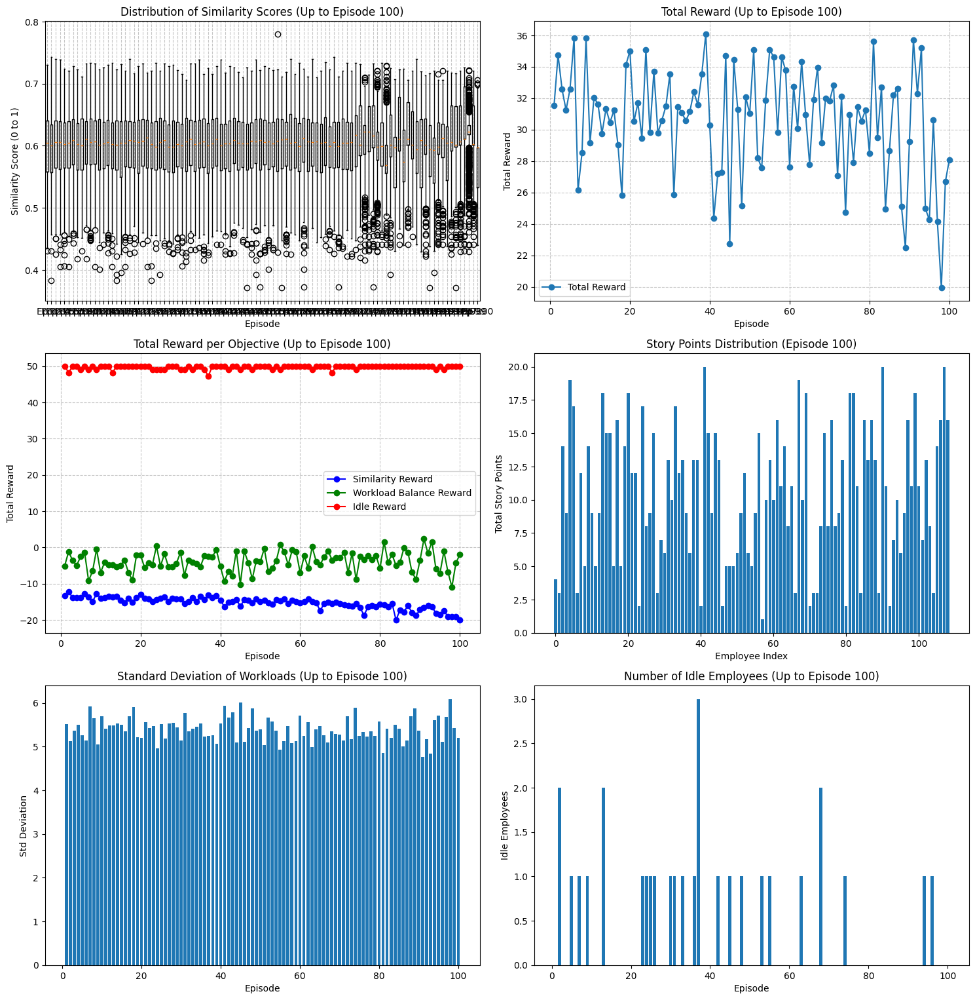

In [ ]:
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import gym
from gym import spaces
import random
from collections import deque
import time
from torch.cuda.amp import GradScaler as AmpGradScaler
import matplotlib.pyplot as plt
import seaborn as sns
import uuid

# Set device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Global Variables
MAX_TASKS = 500
MAX_EMPLOYEES = 200
NUM_EPISODES = 3
LEARNING_RATE = 3e-4
INITIAL_TEMPERATURE = 1.0
MIN_TEMPERATURE = 0.2
INITIAL_EPSILON = 1.0
MIN_EPSILON = 0.2
GAMMA = 0.99
MEMORY_SIZE = 50000
BATCH_SIZE = 64
TARGET_UPDATE_FREQ = 1000
DQN_HIDDEN_DIM = 256
MAX_WORKLOAD = 20
ALPHA_WED = 0.5

SAVE_EPISODES = [1]
MAX_STEPS_PER_EPISODE = MAX_TASKS
TOTAL_STEPS = NUM_EPISODES * MAX_STEPS_PER_EPISODE
DECAY_RATE_TEMP = -np.log(MIN_TEMPERATURE / INITIAL_TEMPERATURE) / TOTAL_STEPS
DECAY_RATE_EPS = -np.log(MIN_EPSILON / INITIAL_EPSILON) / TOTAL_STEPS

task_data_path = '/content/drive/MyDrive/Skripsi/Resources/Datasets/fixed_data_task.csv'
employee_data_path = '/content/drive/MyDrive/Skripsi/Resources/Datasets/fixed_data_employee.csv'
model_save_path = '/content/drive/MyDrive/Skripsi/reassignment_50k_dqn_model.pth'
agent_save_path = '/content/drive/MyDrive/Skripsi/reassignment_50k_dqn_agent_params.pth'

class TaskAssignmentEnv(gym.Env):
    def __init__(self, task_data, employee_data, max_tasks=MAX_TASKS, max_employees=MAX_EMPLOYEES):
        super(TaskAssignmentEnv, self).__init__()
        self.num_tasks = len(task_data)
        self.num_employees = len(employee_data)
        self.max_tasks = max_tasks
        self.max_employees = max_employees
        self.max_workload = MAX_WORKLOAD

        # Load and preprocess data
        task_subset = task_data.iloc[:self.num_tasks]
        employee_subset = employee_data.iloc[:self.num_employees]
        skill_columns = [col for col in task_data.columns if col not in ['task_id', 'story_points', 'project_id']]
        project_id_map = {pid: idx + 1 for idx, pid in enumerate(task_subset['project_id'].unique())}
        project_ids = task_subset['project_id'].map(project_id_map).values
        task_skills_df = task_subset[skill_columns].fillna(0).astype(np.float32)
        employee_skills_df = employee_subset[skill_columns].fillna(0).astype(np.float32)
        story_points_df = task_subset['story_points'].astype(np.float32)

        # Convert to tensors and pad
        self.task_skills = F.pad(
            torch.tensor(task_skills_df.values / 5.0, dtype=torch.float32, device=device),
            (0, 0, 0, max_tasks - self.num_tasks),
            'constant', 0
        )
        self.employee_skills = F.pad(
            torch.tensor(employee_skills_df.values / 5.0, dtype=torch.float32, device=device),
            (0, 0, 0, max_employees - self.num_employees),
            'constant', 0
        )
        self.story_points = F.pad(
            torch.tensor(story_points_df.values, dtype=torch.float32, device=device),
            (0, max_tasks - self.num_tasks),
            'constant', 0
        )
        self.project_ids = F.pad(
            torch.tensor(project_ids, dtype=torch.long, device=device),
            (0, max_tasks - self.num_tasks),
            'constant', -1
        )
        self.total_story_points = torch.sum(self.story_points[:self.num_tasks]).item()
        self.num_skills = len(skill_columns)

        # Define observation and action spaces
        self.observation_space = spaces.Dict({
            'state_matrix': spaces.Box(low=0, high=1, shape=(max_tasks, max_employees, 1), dtype=np.float32),
            'workload_matrix': spaces.Box(low=0, high=MAX_WORKLOAD, shape=(max_employees,), dtype=np.float32),
            'idle_status': spaces.Box(low=0, high=1, shape=(max_employees,), dtype=np.float32),
            'global_features': spaces.Box(low=0, high=1, shape=(4,), dtype=np.float32),
            'task_mask': spaces.Box(low=0, high=1, shape=(max_tasks,), dtype=np.float32)
        })
        self.action_space = spaces.MultiDiscrete([2, self.num_tasks, self.num_employees])
        self.reset()

    def reset(self):
        self.workloads = torch.zeros(self.max_employees, device=device, dtype=torch.float32)
        self.assignments = torch.full((self.max_tasks,), -1, dtype=torch.long, device=device)
        self.remaining_tasks = torch.arange(self.num_tasks, device=device, dtype=torch.long)
        self.employee_projects = torch.full((self.max_employees,), -1, dtype=torch.long, device=device)
        self.wed_scores = []
        self._initialize_state_matrix()
        return self._get_obs()

    def _initialize_state_matrix(self):
        task_skills_expanded = self.task_skills[:self.num_tasks].unsqueeze(1).expand(-1, self.max_employees, -1)
        emp_skills_expanded = self.employee_skills.unsqueeze(0).expand(self.num_tasks, -1, -1)
        diff = emp_skills_expanded - task_skills_expanded
        weights = 1 / (1 + ALPHA_WED * torch.maximum(diff, torch.tensor(0.0, device=device, dtype=torch.float32)))
        mask = self.task_skills[:self.num_tasks].unsqueeze(1).expand(-1, self.max_employees, -1) > 0
        weighted_diff = weights * mask * (emp_skills_expanded - task_skills_expanded) ** 2
        wed = torch.sqrt(torch.sum(weighted_diff, dim=2))
        num_skills_per_task = torch.sum(self.task_skills[:self.num_tasks] > 0, dim=1).unsqueeze(1).expand(-1, self.max_employees)
        wed_worst = torch.sqrt(num_skills_per_task * (1.0 ** 2))
        wed_worst = torch.where(num_skills_per_task > 0, wed_worst, torch.tensor(1.0, device=device, dtype=torch.float32))
        self.state_matrix = torch.zeros((self.max_tasks, self.max_employees, 1), device=device, dtype=torch.float32)
        self.state_matrix[:self.num_tasks, :, 0] = (1 - (wed / wed_worst)).to(dtype=torch.float32)
        workload_penalty = self.workloads.unsqueeze(0).expand(self.max_tasks, -1).unsqueeze(-1) / self.max_workload
        self.state_matrix = self.state_matrix * (1 - torch.clamp(workload_penalty, 0, 1))

    def _update_state_matrix(self, task_idx, emp_idx):
        task_skills_t = self.task_skills[task_idx]
        emp_skills_e = self.employee_skills[emp_idx]
        diff = emp_skills_e - task_skills_t
        weights = 1 / (1 + ALPHA_WED * torch.maximum(diff, torch.tensor(0.0, device=device, dtype=torch.float32)))
        mask = task_skills_t > 0
        weighted_diff = weights[mask] * (emp_skills_e[mask] - task_skills_t[mask]) ** 2
        wed = torch.sqrt(torch.sum(weighted_diff))
        num_skills = torch.sum(mask.float())
        wed_worst = torch.sqrt(num_skills * (1.0 ** 2)) if num_skills > 0 else 1.0
        similarity = 1 - (wed / wed_worst) if wed_worst > 0 else 0.0
        workload_penalty = self.workloads[emp_idx].unsqueeze(0).unsqueeze(-1) / self.max_workload
        self.state_matrix[task_idx, emp_idx, 0] = similarity * (1 - torch.clamp(workload_penalty, 0, 1))

    def _get_obs(self):
        workload_matrix = self.workloads
        idle_status = (self.workloads == 0).float()
        prop_remaining = len(self.remaining_tasks) / self.num_tasks
        num_idle = torch.sum(self.workloads[:self.num_employees] == 0).item()
        prop_idle = num_idle / self.num_employees
        mean_workload = torch.mean(self.workloads[:self.num_employees]).item() if torch.sum(self.workloads[:self.num_employees]) > 0 else 1e-6
        std_workload = torch.std(self.workloads[:self.num_employees]).item()
        cv_normalized = std_workload / (self.max_workload / np.sqrt(self.num_employees)) if mean_workload > 0 else 0
        std_workload_normalized = std_workload / self.max_workload

        global_features = torch.tensor([prop_remaining, prop_idle, cv_normalized, std_workload_normalized],
                                      device=device, dtype=torch.float32)

        task_mask = torch.zeros(self.max_tasks, device=device, dtype=torch.float32)
        task_mask[self.remaining_tasks] = 1

        return {
            'state_matrix': self.state_matrix,
            'workload_matrix': workload_matrix,
            'idle_status': idle_status,
            'global_features': global_features,
            'task_mask': task_mask
        }

    def step(self, action):
        action_type, task_idx, emp_idx = action
        done = False
        reward = {'similarity': 0.0, 'workload': 0.0, 'idle': 0.0}
        info = {'action_valid': True}

        if emp_idx < 0 or emp_idx >= self.num_employees or task_idx < 0 or task_idx >= self.num_tasks:
            reward['similarity'] = -1.0
            info['action_valid'] = False
            info['invalid_action'] = 'Invalid task or employee index'
            return self._get_obs(), reward, done, info

        if action_type == 0:
            if task_idx not in self.remaining_tasks:
                reward['similarity'] = -1.0
                info['action_valid'] = False
                info['invalid_action'] = 'Task already assigned'
                return self._get_obs(), reward, done, info

            task_project = self.project_ids[task_idx]
            emp_project = self.employee_projects[emp_idx]
            current_workload = self.workloads[emp_idx]

            if emp_project != -1 and emp_project != task_project:
                reward['similarity'] = -1.0
                info['action_valid'] = False
                info['invalid_action'] = 'Different project'
                return self._get_obs(), reward, done, info

            if current_workload + self.story_points[task_idx] > self.max_workload:
                reward['similarity'] = -1.0
                info['action_valid'] = False
                info['invalid_action'] = 'Exceeds workload'
                return self._get_obs(), reward, done, info

            was_idle = (self.workloads[emp_idx] == 0)
            self.assignments[task_idx] = emp_idx
            self.workloads[emp_idx] += self.story_points[task_idx]
            self.remaining_tasks = self.remaining_tasks[self.remaining_tasks != task_idx]
            if self.employee_projects[emp_idx] == -1:
                self.employee_projects[emp_idx] = task_project

            self._update_state_matrix(task_idx, emp_idx)

        elif action_type == 1:
            if task_idx in self.remaining_tasks:
                reward['similarity'] = -1.0
                info['action_valid'] = False
                info['invalid_action'] = 'Task not yet assigned'
                return self._get_obs(), reward, done, info

            current_emp_idx = self.assignments[task_idx]
            if current_emp_idx == emp_idx:
                reward['similarity'] = -1.0
                info['action_valid'] = False
                info['invalid_action'] = 'Task already assigned to this employee'
                return self._get_obs(), reward, done, info

            task_project = self.project_ids[task_idx]
            emp_project = self.employee_projects[emp_idx]
            current_workload = self.workloads[emp_idx]

            if emp_project != -1 and emp_project != task_project:
                reward['similarity'] = -1.0
                info['action_valid'] = False
                info['invalid_action'] = 'Different project for new employee'
                return self._get_obs(), reward, done, info

            if current_workload + self.story_points[task_idx] > self.max_workload:
                reward['similarity'] = -1.0
                info['action_valid'] = False
                info['invalid_action'] = 'Exceeds workload for new employee'
                return self._get_obs(), reward, done, info

            self.workloads[current_emp_idx] -= self.story_points[task_idx]
            emp_tasks = (self.assignments == current_emp_idx) & (self.project_ids == task_project)
            emp_tasks[task_idx] = False
            if not torch.any(emp_tasks):
                self.employee_projects[current_emp_idx] = -1

            was_idle = (self.workloads[emp_idx] == 0)
            self.assignments[task_idx] = emp_idx
            self.workloads[emp_idx] += self.story_points[task_idx]
            if self.employee_projects[emp_idx] == -1:
                self.employee_projects[emp_idx] = task_project

            self._update_state_matrix(task_idx, emp_idx)

        else:
            reward['similarity'] = -1.0
            info['action_valid'] = False
            info['invalid_action'] = 'Invalid action type'
            return self._get_obs(), reward, done, info

        task_skills_t = self.task_skills[task_idx]
        emp_skills_e = self.employee_skills[emp_idx]
        diff = emp_skills_e - task_skills_t
        weights = 1 / (1 + ALPHA_WED * torch.maximum(diff, torch.tensor(0.0, device=device, dtype=torch.float32)))
        mask = task_skills_t > 0
        weighted_diff = weights[mask] * (emp_skills_e[mask] - task_skills_t[mask]) ** 2
        wed = torch.sqrt(torch.sum(weighted_diff))

        similarity = self.state_matrix[task_idx, emp_idx, 0].item()
        info['similarity'] = similarity
        self.wed_scores.append(wed.item())

        reward['similarity'] = 0.0 if action_type == 0 else -0.01
        reward['workload'] = 0.0
        reward['idle'] = 0.0

        if len(self.remaining_tasks) == 0:
            done = True

            assigned_tasks = torch.where(self.assignments != -1)[0]
            total_similarity = 0.0
            for task_idx in assigned_tasks:
                emp_idx = self.assignments[task_idx].item()
                similarity = self.state_matrix[task_idx, emp_idx, 0].item()
                total_similarity += similarity
            avg_similarity = total_similarity / self.num_tasks if self.num_tasks > 0 else 0.0
            reward['similarity'] = 50.0 * (2.0 * avg_similarity - 1.0)

            std_workload = torch.std(self.workloads[:self.num_employees]).item()
            max_std = self.max_workload / 2
            normalized_std = std_workload / max_std if max_std > 0 else 0.0
            reward['workload'] = 50.0 * (1.0 - 2.0 * normalized_std)

            num_idle = torch.sum(self.workloads[:self.num_employees] == 0).item()
            idle_ratio = num_idle / self.num_employees
            reward['idle'] = 50.0 * (1.0 - 2.0 * idle_ratio)

            info['avg_similarity'] = avg_similarity
            info['std_workload'] = std_workload
            info['num_idle'] = num_idle

        return self._get_obs(), reward, done, info

class DQN(nn.Module):
    def __init__(self, input_dim, max_employees, max_tasks, num_employees, num_tasks):
        super(DQN, self).__init__()
        self.max_employees = max_employees
        self.max_tasks = max_tasks
        self.num_employees = num_employees
        self.num_tasks = num_tasks
        self.conv1 = nn.Conv2d(1, 16, kernel_size=3, stride=1, padding=1).to(device, dtype=torch.float32)
        self.conv2 = nn.Conv2d(16, 32, kernel_size=3, stride=1, padding=1).to(device, dtype=torch.float32)
        conv_output_height = (max_tasks // 2) // 2
        conv_output_width = (max_employees // 2) // 2
        conv_output_size = 32 * conv_output_height * conv_output_width
        self.fc1 = nn.Linear(conv_output_size + max_employees * 2 + 4, DQN_HIDDEN_DIM).to(device, dtype=torch.float32)
        self.fc2 = nn.Linear(DQN_HIDDEN_DIM, DQN_HIDDEN_DIM // 2).to(device, dtype=torch.float32)
        self.fc3 = nn.Linear(DQN_HIDDEN_DIM // 2, 2 * max_tasks * max_employees).to(device, dtype=torch.float32)

    def forward(self, state_matrix, workload_matrix, idle_status, global_features):
        batch_size = state_matrix.size(0)
        state_input = state_matrix.permute(0, 3, 1, 2)
        state_input = F.relu(self.conv1(state_input))
        state_input = F.max_pool2d(state_input, 2)
        state_input = F.relu(self.conv2(state_input))
        state_input = F.max_pool2d(state_input, 2)
        state_input = state_input.reshape(batch_size, -1)

        workload_input = workload_matrix.view(batch_size, -1)
        idle_input = idle_status.view(batch_size, -1)
        global_input = global_features.view(batch_size, -1)

        x = torch.cat([state_input, workload_input, idle_input, global_input], dim=1)
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        q_values = self.fc3(x).view(batch_size, 2, self.max_tasks, self.max_employees)

        # Mask Q-values for padded tasks and employees
        q_values[:, :, self.num_tasks:, :] = -float('inf')
        q_values[:, :, :, self.num_employees:] = -float('inf')
        return q_values

class DQNAgent:
    def __init__(self, num_tasks, num_employees, max_tasks=MAX_TASKS, max_employees=MAX_EMPLOYEES):
        self.device = device
        self.num_tasks = num_tasks
        self.num_employees = num_employees
        self.max_tasks = max_tasks
        self.max_employees = max_employees
        self.input_dim = 1 + 1 + 1 + 4
        self.model = DQN(self.input_dim, self.max_employees, self.max_tasks, self.num_employees, self.num_tasks).to(device)
        self.target_model = DQN(self.input_dim, self.max_employees, self.max_tasks, self.num_employees, self.num_tasks).to(device)
        self.target_model.load_state_dict(self.model.state_dict())
        self.optimizer = torch.optim.Adam(self.model.parameters(), lr=LEARNING_RATE)
        self.memory = deque(maxlen=MEMORY_SIZE)
        self.batch_size = BATCH_SIZE
        self.temperature = INITIAL_TEMPERATURE
        self.epsilon = INITIAL_EPSILON
        self.gamma = GAMMA
        self.global_step = 0
        self.scaler = torch.amp.GradScaler('cuda')

    def update_temp_eps(self):
        self.global_step += 1
        self.temperature = max(MIN_TEMPERATURE, INITIAL_TEMPERATURE * np.exp(-DECAY_RATE_TEMP * self.global_step))
        self.epsilon = max(MIN_EPSILON, INITIAL_EPSILON * np.exp(-DECAY_RATE_EPS * self.global_step))

    def act(self, obs, env):
        valid_tasks = torch.where(obs['task_mask'][:self.num_tasks] == 1)[0]
        assigned_tasks = torch.where(env.assignments[:self.num_tasks] != -1)[0]

        if random.random() < self.epsilon:
            if len(valid_tasks) > 0 and random.random() < 0.8:
                while True:
                    task_idx = random.choice(valid_tasks.cpu().numpy())
                    valid_emps = torch.where(
                        (env.workloads[:self.num_employees] + env.story_points[task_idx] <= env.max_workload) &
                        ((env.employee_projects[:self.num_employees] == -1) | (env.employee_projects[:self.num_employees] == env.project_ids[task_idx]))
                    )[0]
                    if valid_emps.size(0) > 0:
                        emp_idx = random.choice(valid_emps.cpu().numpy())
                        return [0, task_idx, emp_idx]
            else:
                if len(assigned_tasks) == 0:
                    while True:
                        task_idx = random.choice(valid_tasks.cpu().numpy())
                        valid_emps = torch.where(
                            (env.workloads[:self.num_employees] + env.story_points[task_idx] <= env.max_workload) &
                            ((env.employee_projects[:self.num_employees] == -1) | (env.employee_projects[:self.num_employees] == env.project_ids[task_idx]))
                        )[0]
                        if valid_emps.size(0) > 0:
                            emp_idx = random.choice(valid_emps.cpu().numpy())
                            return [0, task_idx, emp_idx]
                while True:
                    task_idx = random.choice(assigned_tasks.cpu().numpy())
                    current_emp_idx = env.assignments[task_idx].item()
                    valid_emps = torch.where(
                        (torch.arange(self.num_employees, device=device) != current_emp_idx) &
                        (env.workloads[:self.num_employees] + env.story_points[task_idx] <= env.max_workload) &
                        ((env.employee_projects[:self.num_employees] == -1) | (env.employee_projects[:self.num_employees] == env.project_ids[task_idx]))
                    )[0]
                    if valid_emps.size(0) > 0:
                        emp_idx = random.choice(valid_emps.cpu().numpy())
                        return [1, task_idx, emp_idx]

        state_matrix = obs['state_matrix'].unsqueeze(0).to(dtype=torch.float32)
        workload_matrix = obs['workload_matrix'].unsqueeze(0).to(dtype=torch.float32)
        idle_status = obs['idle_status'].unsqueeze(0).to(dtype=torch.float32)
        global_features = obs['global_features'].unsqueeze(0).to(dtype=torch.float32)

        with torch.no_grad():
            q_values = self.model(state_matrix, workload_matrix, idle_status, global_features)

            task_mask = torch.zeros(self.max_tasks, device=device, dtype=torch.bool)
            task_mask[valid_tasks] = 1
            emp_mask = torch.ones(self.max_tasks, self.max_employees, device=device, dtype=torch.bool)
            for t in range(self.num_tasks):
                emp_mask[t, :self.num_employees] = (
                    (env.workloads[:self.num_employees] + env.story_points[t] <= env.max_workload) &
                    ((env.employee_projects[:self.num_employees] == -1) | (env.employee_projects[:self.num_employees] == env.project_ids[t]))
                )
                emp_mask[t, self.num_employees:] = False

            assign_mask = torch.zeros_like(q_values, dtype=torch.bool)
            assign_mask[:, 0] = task_mask.unsqueeze(-1).expand(-1, self.max_employees) & emp_mask

            reassign_mask = torch.zeros_like(q_values, dtype=torch.bool)
            for t in assigned_tasks:
                current_emp_idx = env.assignments[t].item()
                reassign_emp_mask = emp_mask[t].clone()
                reassign_emp_mask[current_emp_idx] = False
                reassign_mask[0, 1, t] = reassign_emp_mask

            combined_mask = assign_mask | reassign_mask
            q_values[~combined_mask] = -float('inf')

            if torch.all(q_values == -float('inf')):
                if len(valid_tasks) > 0:
                    while True:
                        task_idx = random.choice(valid_tasks.cpu().numpy())
                        valid_emps = torch.where(
                            (env.workloads[:self.num_employees] + env.story_points[task_idx] <= env.max_workload) &
                            ((env.employee_projects[:self.num_employees] == -1) | (env.employee_projects[:self.num_employees] == env.project_ids[task_idx]))
                        )[0]
                        if valid_emps.size(0) > 0:
                            emp_idx = random.choice(valid_emps.cpu().numpy())
                            return [0, task_idx, emp_idx]
                else:
                    while True:
                        task_idx = random.choice(assigned_tasks.cpu().numpy())
                        current_emp_idx = env.assignments[task_idx].item()
                        valid_emps = torch.where(
                            (torch.arange(self.num_employees, device=device) != current_emp_idx) &
                            (env.workloads[:self.num_employees] + env.story_points[task_idx] <= env.max_workload) &
                            ((env.employee_projects[:self.num_employees] == -1) | (env.employee_projects[:self.num_employees] == env.project_ids[task_idx]))
                        )[0]
                        if valid_emps.size(0) > 0:
                            emp_idx = random.choice(valid_emps.cpu().numpy())
                            return [1, task_idx, emp_idx]
            else:
                action_idx = torch.argmax(q_values.view(-1)).item()
                action_type = action_idx // (self.max_tasks * self.max_employees)
                task_emp_idx = action_idx % (self.max_tasks * self.max_employees)
                task_idx = task_emp_idx // self.max_employees
                emp_idx = task_emp_idx % self.max_employees
                return [action_type, task_idx, emp_idx]

    def remember(self, state, action, reward, next_state, done):
        self.memory.append((state, action, reward, next_state, done))

    def replay(self, env):
        if len(self.memory) < self.batch_size:
            return
        batch = random.sample(self.memory, self.batch_size)
        states, actions, rewards, next_states, dones = zip(*batch)

        state_matrices = torch.stack([s['state_matrix'] for s in states]).to(dtype=torch.float32)
        workload_matrices = torch.stack([s['workload_matrix'] for s in states]).to(dtype=torch.float32)
        idle_statuses = torch.stack([s['idle_status'] for s in states]).to(dtype=torch.float32)
        global_features = torch.stack([s['global_features'] for s in states]).to(dtype=torch.float32)
        next_state_matrices = torch.stack([s['state_matrix'] for s in next_states]).to(dtype=torch.float32)
        next_workload_matrices = torch.stack([s['workload_matrix'] for s in next_states]).to(dtype=torch.float32)
        next_idle_statuses = torch.stack([s['idle_status'] for s in next_states]).to(dtype=torch.float32)
        next_global_features = torch.stack([s['global_features'] for s in next_states]).to(dtype=torch.float32)

        actions = torch.tensor(actions, dtype=torch.long, device=self.device)
        rewards = torch.tensor([r['similarity'] + r['workload'] + r['idle'] for r in rewards], dtype=torch.float32, device=self.device)
        dones = torch.tensor(dones, dtype=torch.float32, device=self.device)

        action_types = actions[:, 0]
        task_idx = actions[:, 1]
        emp_idx = actions[:, 2]
        batch_indices = torch.arange(self.batch_size, device=self.device)

        with torch.amp.autocast('cuda'):
            self.optimizer.zero_grad()
            q_values = self.model(state_matrices, workload_matrices, idle_statuses, global_features)
            q_values_selected = q_values[batch_indices, action_types, task_idx, emp_idx]

            next_q_values = self.target_model(next_state_matrices, next_workload_matrices, next_idle_statuses, next_global_features)
            next_q_values_max = next_q_values.view(self.batch_size, -1).max(dim=1)[0]
            targets = rewards + (1 - dones) * self.gamma * next_q_values_max

            loss = F.mse_loss(q_values_selected, targets)

        self.scaler.scale(loss).backward()
        self.scaler.step(self.optimizer)
        self.scaler.update()

    def update_target(self):
        self.target_model.load_state_dict(self.model.state_dict())

    def save(self, model_path, agent_path):
        torch.save({
            'model_state_dict': self.model.state_dict(),
            'target_model_state_dict': self.target_model.state_dict(),
            'optimizer_state_dict': self.optimizer.state_dict()
        }, model_path)
        torch.save({'temperature': self.temperature, 'epsilon': self.epsilon}, agent_path)

    def load(self, model_path, agent_path):
        checkpoint = torch.load(model_path)
        self.model.load_state_dict(checkpoint['model_state_dict'])
        self.target_model.load_state_dict(checkpoint['target_model_state_dict'])
        self.optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
        agent_params = torch.load(agent_path)
        self.temperature = agent_params['temperature']
        self.epsilon = agent_params['epsilon']
        self.memory = deque(maxlen=MEMORY_SIZE)

def plot_and_summarize(episode_data, wed_scores_list, total_rewards, similarity_rewards,
                      workload_balance_rewards, idle_rewards, workloads_list,
                      std_workloads_list, idle_employees_list, env, num_episodes_to_plot, checkpoint_episode=None):
    print(f"\nTabular Summary of Rewards up to Episode {num_episodes_to_plot}:")
    print("-" * 80)
    print(f"{'Episode':<10} {'Total Reward':<15} {'Similarity':<15} {'Workload':<15} {'Idle':<15} {'Std Dev':<10} {'Idle Emp':<10}")
    print("-" * 80)
    for data in episode_data:
        if data['Episode'] <= num_episodes_to_plot:
            print(f"{data['Episode']:<10} {data['Total Reward']:<15.4f} {data['Similarity Reward']:<15.4f} {data['Workload Balance Reward']:<15.4f} {data['Idle Reward']:<15.4f} {data['Std Workloads']:<10.4f} {data['Idle Employees']:<10}")
    print("-" * 80)

    plt.figure(figsize=(15, 20))

    plt.subplot(4, 2, 1)
    alpha = ALPHA_WED
    weights_worst = 1 / (1 + alpha * 1)
    wed_raw_worst = np.sqrt(np.sum(weights_worst * (0 - 1) ** 2) * env.num_skills)
    wed_raw_best = 0
    standardized_similarities_per_episode = []
    for episode_wed_scores in wed_scores_list[:num_episodes_to_plot]:
        similarities = [(wed_raw_worst - wed) / (wed_raw_worst - wed_raw_best) for wed in episode_wed_scores]
        standardized_similarities_per_episode.append(similarities)
    plt.boxplot(standardized_similarities_per_episode, labels=[f"Ep {i+1}" for i in range(num_episodes_to_plot)])
    plt.title(f'Distribution of Similarity Scores (Up to Episode {num_episodes_to_plot})')
    plt.xlabel('Episode')
    plt.ylabel('Similarity Score (0 to 1)')
    plt.grid(True, linestyle='--', alpha=0.7)

    plt.subplot(4, 2, 2)
    plt.plot(range(1, num_episodes_to_plot + 1), total_rewards[:num_episodes_to_plot], marker='o', label='Total Reward')
    plt.title(f'Total Reward (Up to Episode {num_episodes_to_plot})')
    plt.xlabel('Episode')
    plt.ylabel('Total Reward')
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.legend()

    plt.subplot(4, 2, 3)
    plt.plot(range(1, num_episodes_to_plot + 1), similarity_rewards[:num_episodes_to_plot], marker='o', label='Similarity Reward', color='blue')
    plt.plot(range(1, num_episodes_to_plot + 1), workload_balance_rewards[:num_episodes_to_plot], marker='o', label='Workload Balance Reward', color='green')
    plt.plot(range(1, num_episodes_to_plot + 1), idle_rewards[:num_episodes_to_plot], marker='o', label='Idle Reward', color='red')
    plt.title(f'Total Reward per Objective (Up to Episode {num_episodes_to_plot})')
    plt.xlabel('Episode')
    plt.ylabel('Total Reward')
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.legend()

    plt.subplot(4, 2, 4)
    plt.bar(range(env.num_employees), workloads_list[num_episodes_to_plot - 1][:env.num_employees])
    plt.title(f'Story Points Distribution (Episode {num_episodes_to_plot})')
    plt.xlabel('Employee Index')
    plt.ylabel('Total Story Points')

    plt.subplot(4, 2, 5)
    plt.bar(range(1, num_episodes_to_plot + 1), std_workloads_list[:num_episodes_to_plot])
    plt.title(f'Standard Deviation of Workloads (Up to Episode {num_episodes_to_plot})')
    plt.xlabel('Episode')
    plt.ylabel('Std Deviation')

    plt.subplot(4, 2, 6)
    plt.bar(range(1, num_episodes_to_plot + 1), idle_employees_list[:num_episodes_to_plot])
    plt.title(f'Number of Idle Employees (Up to Episode {num_episodes_to_plot})')
    plt.xlabel('Episode')
    plt.ylabel('Idle Employees')
    plt.ylim(bottom=0)

    plt.tight_layout()
    filename = f'reassignment_50k_training_metrics_eps{checkpoint_episode}.png' if checkpoint_episode else 'reassignment_50k_training_metrics_final.png'
    plt.savefig(filename)
    print(f"Training metrics plot saved to '{filename}'")
    plt.show()

def train_dqn(task_data_path, employee_data_path):
    task_data = pd.read_csv(task_data_path)
    employee_data = pd.read_csv(employee_data_path)
    env = TaskAssignmentEnv(task_data, employee_data)
    agent = DQNAgent(env.num_tasks, env.num_employees)
    total_rewards = []
    wed_scores_list = []
    workloads_list = []
    std_workloads_list = []
    idle_employees_list = []
    similarity_rewards = []
    workload_balance_rewards = []
    idle_rewards = []
    global_step = 0
    episode_data = []

    for episode in range(NUM_EPISODES):
        obs = env.reset()
        total_reward = 0
        episode_similarity = 0
        episode_workload_balance = 0
        episode_idle_reward = 0
        invalid_actions = 0
        done = False
        step = 0

        print(f"Episode {episode+1}/{NUM_EPISODES}, Temp: {agent.temperature:.3f}, Epsilon: {agent.epsilon:.3f}")
        while not done:
            step += 1
            global_step += 1
            start_time = time.time()
            action = agent.act(obs, env)
            next_obs, reward, done, info = env.step(action)
            agent.remember(obs, action, reward, next_obs, done)
            agent.replay(env)
            obs = next_obs

            total_reward += sum(reward.values())
            episode_similarity += reward['similarity']
            episode_workload_balance += reward['workload']
            episode_idle_reward += reward['idle']

            if not info.get('action_valid', True):
                invalid_actions += 1
                print(f"Step {step}: Invalid action - {info.get('invalid_action', 'Unknown reason')}")

            num_idle = torch.sum(env.workloads[:env.num_employees] == 0).item()
            if step % 10 == 0:
                print(f"Step {step}: Reward {total_reward/step:.4f}, Time {step_time:.2f}s, Num Idle: {num_idle}")

            step_time = time.time() - start_time

            agent.update_temp_eps()
            if global_step % TARGET_UPDATE_FREQ == 0:
                agent.update_target()

        wed_scores_list.append(env.wed_scores)

        workloads_list.append(env.workloads[:env.num_employees].clone().cpu().numpy())
        std_workloads = info.get('std_workload', torch.std(env.workloads[:env.num_employees]).item())
        num_idle = info.get('num_idle', torch.sum(env.workloads[:env.num_employees] == 0).item())
        std_workloads_list.append(std_workloads)
        idle_employees_list.append(max(num_idle, 0))
        total_rewards.append(total_reward)
        similarity_rewards.append(episode_similarity)
        workload_balance_rewards.append(episode_workload_balance)
        idle_rewards.append(episode_idle_reward)

        print(f"Episode {episode+1} - Steps: {step}, Total Reward: {total_reward:.2f}, Std Workloads: {std_workloads:.2f}, Idle: {num_idle}, Invalid Actions: {invalid_actions}")
        print(f"Total Similarity Reward: {episode_similarity:.2f}, Workload Balance Reward: {episode_workload_balance:.2f}, Idle Reward: {episode_idle_reward:.2f}")

        episode_data.append({
            'Episode': episode + 1,
            'Total Reward': total_reward,
            'Similarity Reward': episode_similarity,
            'Workload Balance Reward': episode_workload_balance,
            'Idle Reward': episode_idle_reward,
            'Std Workloads': std_workloads,
            'Idle Employees': max(num_idle, 0)
        })

        if episode + 1 in SAVE_EPISODES:
            print(f"\nCheckpoint at Episode {episode + 1}")
            plot_and_summarize(
                episode_data=episode_data,
                wed_scores_list=wed_scores_list,
                total_rewards=total_rewards,
                similarity_rewards=similarity_rewards,
                workload_balance_rewards=workload_balance_rewards,
                idle_rewards=idle_rewards,
                workloads_list=workloads_list,
                std_workloads_list=std_workloads_list,
                idle_employees_list=idle_employees_list,
                env=env,
                num_episodes_to_plot=episode + 1,
                checkpoint_episode=episode + 1
            )
            checkpoint_model_path = f"/content/drive/MyDrive/Skripsi/reassignment_50k_dqn_model_eps{episode + 1}.pth"
            checkpoint_agent_path = f"/content/drive/MyDrive/Skripsi/reassignment_50k_dqn_agent_params_eps{episode + 1}.pth"
            agent.save(checkpoint_model_path, checkpoint_agent_path)

    agent.save(model_save_path, agent_save_path)

    plot_and_summarize(
        episode_data=episode_data,
        wed_scores_list=wed_scores_list,
        total_rewards=total_rewards,
        similarity_rewards=similarity_rewards,
        workload_balance_rewards=workload_balance_rewards,
        idle_rewards=idle_rewards,
        workloads_list=workloads_list,
        std_workloads_list=std_workloads_list,
        idle_employees_list=idle_employees_list,
        env=env,
        num_episodes_to_plot=NUM_EPISODES
    )

    return env, workloads_list, std_workloads_list, idle_employees_list, NUM_EPISODES, episode_data, agent

# Run training
env, workloads_list, std_workloads_list, idle_employees_list, num_episodes, episode_data, trained_agent = train_dqn(task_data_path, employee_data_path)

#### Step 1: learning rates

Using device: cuda
Episode 1/50000, Temp: 1.000, Epsilon: 1.000
Step 10: Reward -0.0040, Time 0.00s, Num Idle: 103
Step 20: Reward -0.0035, Time 0.00s, Num Idle: 96
Step 30: Reward -0.0033, Time 0.00s, Num Idle: 89
Step 40: Reward -0.0027, Time 0.00s, Num Idle: 80
Step 50: Reward -0.0026, Time 0.00s, Num Idle: 75
Step 60: Reward -0.0025, Time 0.00s, Num Idle: 67
Step 70: Reward -0.0023, Time 0.03s, Num Idle: 59
Step 80: Reward -0.0023, Time 0.03s, Num Idle: 54
Step 90: Reward -0.0024, Time 0.03s, Num Idle: 50
Step 100: Reward -0.0023, Time 0.03s, Num Idle: 43
Step 110: Reward -0.0021, Time 0.03s, Num Idle: 37
Step 120: Reward -0.0019, Time 0.03s, Num Idle: 28
Step 130: Reward -0.0019, Time 0.03s, Num Idle: 27
Step 140: Reward -0.0019, Time 0.03s, Num Idle: 20
Step 150: Reward -0.0019, Time 0.03s, Num Idle: 17
Step 160: Reward -0.0019, Time 0.03s, Num Idle: 11
Step 170: Reward -0.0018, Time 0.03s, Num Idle: 10
Step 180: Reward -0.0018, Time 0.03s, Num Idle: 8
Step 190: Reward -0.0018, T

<ipython-input-2-8d414b9a2973>:553: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(standardized_similarities_per_episode, labels=[f"Ep {i+1}" for i in range(num_episodes_to_plot)])


Training metrics plot saved to '/content/drive/MyDrive/Skripsi/reassignment_50k_training_metrics_eps100.png'


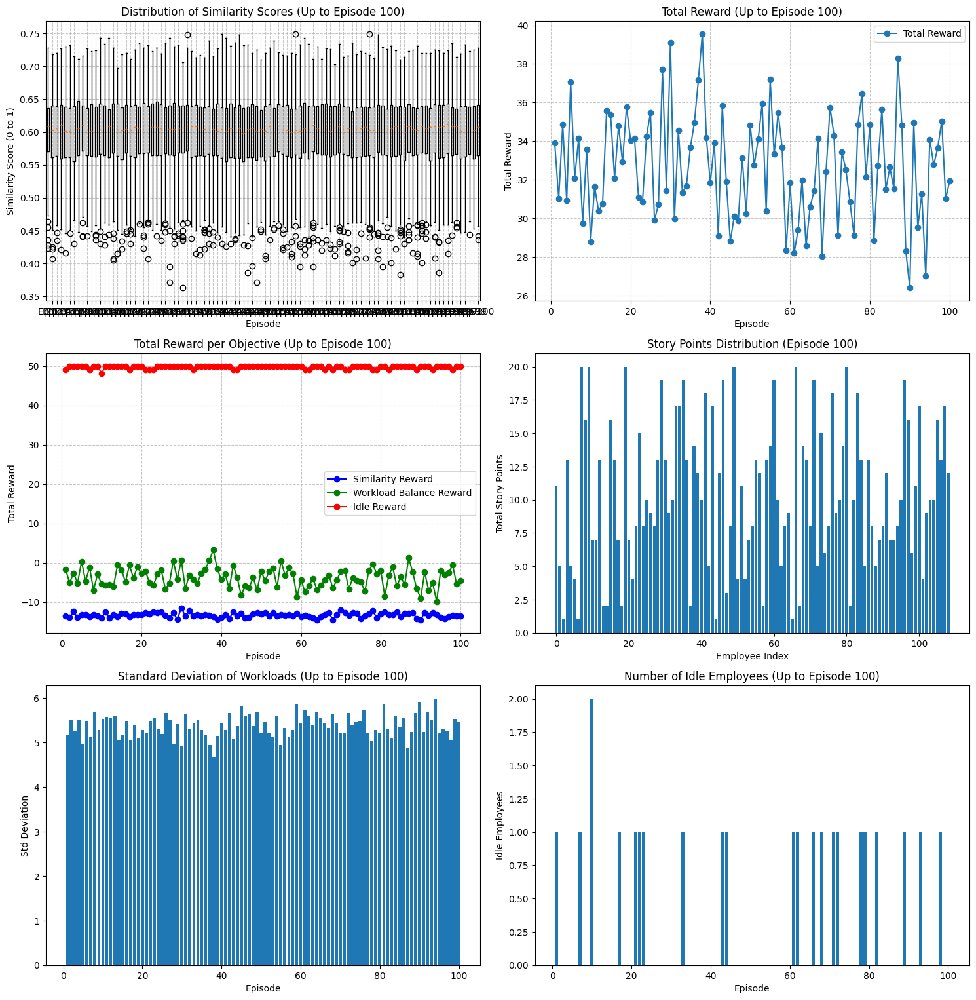

Episode 101/50000, Temp: 0.998, Epsilon: 0.998
Step 10: Reward -0.0010, Time 0.03s, Num Idle: 100
Step 20: Reward -0.0030, Time 0.03s, Num Idle: 95
Step 30: Reward -0.0020, Time 0.03s, Num Idle: 85
Step 40: Reward -0.0025, Time 0.03s, Num Idle: 79
Step 50: Reward -0.0022, Time 0.03s, Num Idle: 70
Step 60: Reward -0.0022, Time 0.03s, Num Idle: 64
Step 70: Reward -0.0019, Time 0.03s, Num Idle: 55
Step 80: Reward -0.0017, Time 0.03s, Num Idle: 46
Step 90: Reward -0.0017, Time 0.03s, Num Idle: 40
Step 100: Reward -0.0018, Time 0.03s, Num Idle: 35
Step 110: Reward -0.0018, Time 0.03s, Num Idle: 29
Step 120: Reward -0.0017, Time 0.03s, Num Idle: 24
Step 130: Reward -0.0018, Time 0.03s, Num Idle: 19
Step 140: Reward -0.0019, Time 0.03s, Num Idle: 16
Step 150: Reward -0.0021, Time 0.03s, Num Idle: 14
Step 160: Reward -0.0021, Time 0.03s, Num Idle: 13
Step 170: Reward -0.0020, Time 0.03s, Num Idle: 10
Step 180: Reward -0.0020, Time 0.03s, Num Idle: 9
Step 190: Reward -0.0021, Time 0.03s, Num Id

<ipython-input-2-8d414b9a2973>:553: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(standardized_similarities_per_episode, labels=[f"Ep {i+1}" for i in range(num_episodes_to_plot)])


Training metrics plot saved to '/content/drive/MyDrive/Skripsi/reassignment_50k_training_metrics_eps200.png'


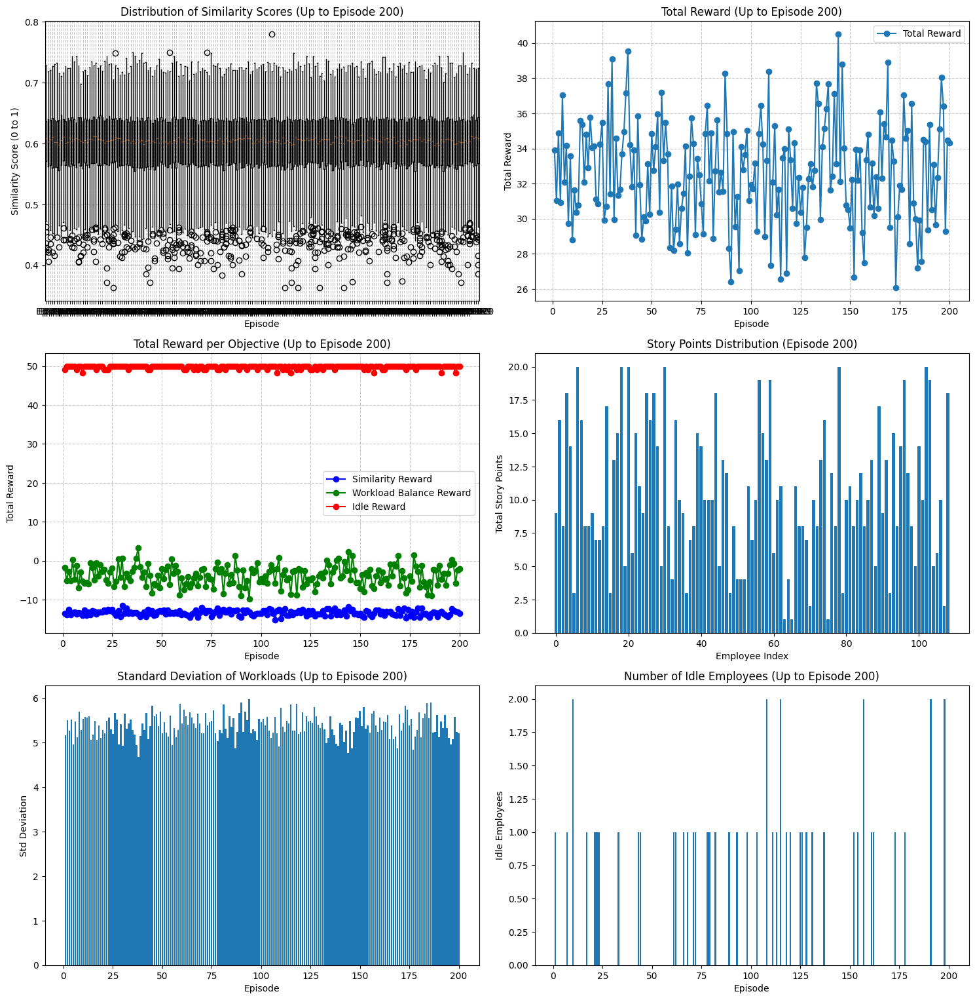

Streaming output truncated to the last 5000 lines.
Step 210: Reward -0.0022, Time 0.03s, Num Idle: 4
Step 220: Reward -0.0022, Time 0.03s, Num Idle: 1
Step 230: Reward -0.0022, Time 0.03s, Num Idle: 1
Step 240: Reward -0.0022, Time 0.03s, Num Idle: 2
Step 250: Reward -0.0021, Time 0.03s, Num Idle: 0
Step 260: Reward -0.0021, Time 0.03s, Num Idle: 0
Step 270: Reward -0.0021, Time 0.03s, Num Idle: 0
Step 280: Reward -0.0021, Time 0.03s, Num Idle: 1
Step 290: Reward -0.0021, Time 0.03s, Num Idle: 1
Step 300: Reward -0.0021, Time 0.03s, Num Idle: 2
Step 310: Reward -0.0021, Time 0.03s, Num Idle: 0
Step 320: Reward -0.0021, Time 0.03s, Num Idle: 0
Step 330: Reward -0.0022, Time 0.03s, Num Idle: 0
Step 340: Reward -0.0021, Time 0.03s, Num Idle: 0
Step 350: Reward -0.0021, Time 0.03s, Num Idle: 0
Step 360: Reward -0.0022, Time 0.03s, Num Idle: 0
Step 370: Reward -0.0022, Time 0.03s, Num Idle: 0
Step 380: Reward -0.0023, Time 0.03s, Num Idle: 0
Episode 275 - Steps: 386, Total Reward: 35.35, St

In [ ]:
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import gym
from gym import spaces
import random
from collections import deque
import time
from torch.cuda.amp import GradScaler as AmpGradScaler
import matplotlib.pyplot as plt
import seaborn as sns
import uuid

# Set device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Global Variables
MAX_TASKS = 500
MAX_EMPLOYEES = 200
NUM_EPISODES = 100
LEARNING_RATE = 3e-4
INITIAL_TEMPERATURE = 1.0
MIN_TEMPERATURE = 0.2
INITIAL_EPSILON = 1.0
MIN_EPSILON = 0.2
GAMMA = 0.99
MEMORY_SIZE = 50000
BATCH_SIZE = 64
TARGET_UPDATE_FREQ = 1000
DQN_HIDDEN_DIM = 256
MAX_WORKLOAD = 20
ALPHA_WED = 0.5

SAVE_EPISODES = [50, 100]
MAX_STEPS_PER_EPISODE = MAX_TASKS
TOTAL_STEPS = NUM_EPISODES * MAX_STEPS_PER_EPISODE
DECAY_RATE_TEMP = -np.log(MIN_TEMPERATURE / INITIAL_TEMPERATURE) / TOTAL_STEPS
DECAY_RATE_EPS = -np.log(MIN_EPSILON / INITIAL_EPSILON) / TOTAL_STEPS

task_data_path = '/content/drive/MyDrive/Skripsi/Resources/Datasets/fixed_data_task.csv'
employee_data_path = '/content/drive/MyDrive/Skripsi/Resources/Datasets/fixed_data_employee.csv'
model_save_path = '/content/drive/MyDrive/Skripsi/reassignment_50k_dqn_model.pth'
agent_save_path = '/content/drive/MyDrive/Skripsi/reassignment_50k_dqn_agent_params.pth'

class TaskAssignmentEnv(gym.Env):
    def __init__(self, task_data, employee_data, max_tasks=MAX_TASKS, max_employees=MAX_EMPLOYEES):
        super(TaskAssignmentEnv, self).__init__()
        self.num_tasks = len(task_data)
        self.num_employees = len(employee_data)
        self.max_tasks = max_tasks
        self.max_employees = max_employees
        self.max_workload = MAX_WORKLOAD

        # Load and preprocess data
        task_subset = task_data.iloc[:self.num_tasks]
        employee_subset = employee_data.iloc[:self.num_employees]
        skill_columns = [col for col in task_data.columns if col not in ['task_id', 'story_points', 'project_id']]
        project_id_map = {pid: idx + 1 for idx, pid in enumerate(task_subset['project_id'].unique())}
        project_ids = task_subset['project_id'].map(project_id_map).values
        task_skills_df = task_subset[skill_columns].fillna(0).astype(np.float32)
        employee_skills_df = employee_subset[skill_columns].fillna(0).astype(np.float32)
        story_points_df = task_subset['story_points'].astype(np.float32)

        # Convert to tensors and pad
        self.task_skills = F.pad(
            torch.tensor(task_skills_df.values / 5.0, dtype=torch.float32, device=device),
            (0, 0, 0, max_tasks - self.num_tasks),
            'constant', 0
        )
        self.employee_skills = F.pad(
            torch.tensor(employee_skills_df.values / 5.0, dtype=torch.float32, device=device),
            (0, 0, 0, max_employees - self.num_employees),
            'constant', 0
        )
        self.story_points = F.pad(
            torch.tensor(story_points_df.values, dtype=torch.float32, device=device),
            (0, max_tasks - self.num_tasks),
            'constant', 0
        )
        self.project_ids = F.pad(
            torch.tensor(project_ids, dtype=torch.long, device=device),
            (0, max_tasks - self.num_tasks),
            'constant', -1
        )
        self.total_story_points = torch.sum(self.story_points[:self.num_tasks]).item()
        self.num_skills = len(skill_columns)

        # Define observation and action spaces
        self.observation_space = spaces.Dict({
            'state_matrix': spaces.Box(low=0, high=1, shape=(max_tasks, max_employees, 1), dtype=np.float32),
            'workload_matrix': spaces.Box(low=0, high=MAX_WORKLOAD, shape=(max_employees,), dtype=np.float32),
            'idle_status': spaces.Box(low=0, high=1, shape=(max_employees,), dtype=np.float32),
            'global_features': spaces.Box(low=0, high=1, shape=(4,), dtype=np.float32),
            'task_mask': spaces.Box(low=0, high=1, shape=(max_tasks,), dtype=np.float32)
        })
        self.action_space = spaces.MultiDiscrete([2, self.num_tasks, self.num_employees])
        self.reset()

    def reset(self):
        self.workloads = torch.zeros(self.max_employees, device=device, dtype=torch.float32)
        self.assignments = torch.full((self.max_tasks,), -1, dtype=torch.long, device=device)
        self.remaining_tasks = torch.arange(self.num_tasks, device=device, dtype=torch.long)
        self.employee_projects = torch.full((self.max_employees,), -1, dtype=torch.long, device=device)
        self.wed_scores = []
        self._initialize_state_matrix()
        return self._get_obs()

    def _initialize_state_matrix(self):
        task_skills_expanded = self.task_skills[:self.num_tasks].unsqueeze(1).expand(-1, self.max_employees, -1)
        emp_skills_expanded = self.employee_skills.unsqueeze(0).expand(self.num_tasks, -1, -1)
        diff = emp_skills_expanded - task_skills_expanded
        weights = 1 / (1 + ALPHA_WED * torch.maximum(diff, torch.tensor(0.0, device=device, dtype=torch.float32)))
        mask = self.task_skills[:self.num_tasks].unsqueeze(1).expand(-1, self.max_employees, -1) > 0
        weighted_diff = weights * mask * (emp_skills_expanded - task_skills_expanded) ** 2
        wed = torch.sqrt(torch.sum(weighted_diff, dim=2))
        num_skills_per_task = torch.sum(self.task_skills[:self.num_tasks] > 0, dim=1).unsqueeze(1).expand(-1, self.max_employees)
        wed_worst = torch.sqrt(num_skills_per_task * (1.0 ** 2))
        wed_worst = torch.where(num_skills_per_task > 0, wed_worst, torch.tensor(1.0, device=device, dtype=torch.float32))
        self.state_matrix = torch.zeros((self.max_tasks, self.max_employees, 1), device=device, dtype=torch.float32)
        self.state_matrix[:self.num_tasks, :, 0] = (1 - (wed / wed_worst)).to(dtype=torch.float32)
        workload_penalty = self.workloads.unsqueeze(0).expand(self.max_tasks, -1).unsqueeze(-1) / self.max_workload
        self.state_matrix = self.state_matrix * (1 - torch.clamp(workload_penalty, 0, 1))

    def _update_state_matrix(self, task_idx, emp_idx):
        task_skills_t = self.task_skills[task_idx]
        emp_skills_e = self.employee_skills[emp_idx]
        diff = emp_skills_e - task_skills_t
        weights = 1 / (1 + ALPHA_WED * torch.maximum(diff, torch.tensor(0.0, device=device, dtype=torch.float32)))
        mask = task_skills_t > 0
        weighted_diff = weights[mask] * (emp_skills_e[mask] - task_skills_t[mask]) ** 2
        wed = torch.sqrt(torch.sum(weighted_diff))
        num_skills = torch.sum(mask.float())
        wed_worst = torch.sqrt(num_skills * (1.0 ** 2)) if num_skills > 0 else 1.0
        similarity = 1 - (wed / wed_worst) if wed_worst > 0 else 0.0
        workload_penalty = self.workloads[emp_idx].unsqueeze(0).unsqueeze(-1) / self.max_workload
        self.state_matrix[task_idx, emp_idx, 0] = similarity * (1 - torch.clamp(workload_penalty, 0, 1))

    def _get_obs(self):
        workload_matrix = self.workloads
        idle_status = (self.workloads == 0).float()
        prop_remaining = len(self.remaining_tasks) / self.num_tasks
        num_idle = torch.sum(self.workloads[:self.num_employees] == 0).item()
        prop_idle = num_idle / self.num_employees
        mean_workload = torch.mean(self.workloads[:self.num_employees]).item() if torch.sum(self.workloads[:self.num_employees]) > 0 else 1e-6
        std_workload = torch.std(self.workloads[:self.num_employees]).item()
        cv_normalized = std_workload / (self.max_workload / np.sqrt(self.num_employees)) if mean_workload > 0 else 0
        std_workload_normalized = std_workload / self.max_workload

        global_features = torch.tensor([prop_remaining, prop_idle, cv_normalized, std_workload_normalized],
                                      device=device, dtype=torch.float32)

        task_mask = torch.zeros(self.max_tasks, device=device, dtype=torch.float32)
        task_mask[self.remaining_tasks] = 1

        return {
            'state_matrix': self.state_matrix,
            'workload_matrix': workload_matrix,
            'idle_status': idle_status,
            'global_features': global_features,
            'task_mask': task_mask
        }

    def step(self, action):
        action_type, task_idx, emp_idx = action
        done = False
        reward = {'similarity': 0.0, 'workload': 0.0, 'idle': 0.0}
        info = {'action_valid': True}

        if emp_idx < 0 or emp_idx >= self.num_employees or task_idx < 0 or task_idx >= self.num_tasks:
            reward['similarity'] = -1.0
            info['action_valid'] = False
            info['invalid_action'] = 'Invalid task or employee index'
            return self._get_obs(), reward, done, info

        if action_type == 0:
            if task_idx not in self.remaining_tasks:
                reward['similarity'] = -1.0
                info['action_valid'] = False
                info['invalid_action'] = 'Task already assigned'
                return self._get_obs(), reward, done, info

            task_project = self.project_ids[task_idx]
            emp_project = self.employee_projects[emp_idx]
            current_workload = self.workloads[emp_idx]

            if emp_project != -1 and emp_project != task_project:
                reward['similarity'] = -1.0
                info['action_valid'] = False
                info['invalid_action'] = 'Different project'
                return self._get_obs(), reward, done, info

            if current_workload + self.story_points[task_idx] > self.max_workload:
                reward['similarity'] = -1.0
                info['action_valid'] = False
                info['invalid_action'] = 'Exceeds workload'
                return self._get_obs(), reward, done, info

            was_idle = (self.workloads[emp_idx] == 0)
            self.assignments[task_idx] = emp_idx
            self.workloads[emp_idx] += self.story_points[task_idx]
            self.remaining_tasks = self.remaining_tasks[self.remaining_tasks != task_idx]
            if self.employee_projects[emp_idx] == -1:
                self.employee_projects[emp_idx] = task_project

            self._update_state_matrix(task_idx, emp_idx)

        elif action_type == 1:
            if task_idx in self.remaining_tasks:
                reward['similarity'] = -1.0
                info['action_valid'] = False
                info['invalid_action'] = 'Task not yet assigned'
                return self._get_obs(), reward, done, info

            current_emp_idx = self.assignments[task_idx]
            if current_emp_idx == emp_idx:
                reward['similarity'] = -1.0
                info['action_valid'] = False
                info['invalid_action'] = 'Task already assigned to this employee'
                return self._get_obs(), reward, done, info

            task_project = self.project_ids[task_idx]
            emp_project = self.employee_projects[emp_idx]
            current_workload = self.workloads[emp_idx]

            if emp_project != -1 and emp_project != task_project:
                reward['similarity'] = -1.0
                info['action_valid'] = False
                info['invalid_action'] = 'Different project for new employee'
                return self._get_obs(), reward, done, info

            if current_workload + self.story_points[task_idx] > self.max_workload:
                reward['similarity'] = -1.0
                info['action_valid'] = False
                info['invalid_action'] = 'Exceeds workload for new employee'
                return self._get_obs(), reward, done, info

            self.workloads[current_emp_idx] -= self.story_points[task_idx]
            emp_tasks = (self.assignments == current_emp_idx) & (self.project_ids == task_project)
            emp_tasks[task_idx] = False
            if not torch.any(emp_tasks):
                self.employee_projects[current_emp_idx] = -1

            was_idle = (self.workloads[emp_idx] == 0)
            self.assignments[task_idx] = emp_idx
            self.workloads[emp_idx] += self.story_points[task_idx]
            if self.employee_projects[emp_idx] == -1:
                self.employee_projects[emp_idx] = task_project

            self._update_state_matrix(task_idx, emp_idx)

        else:
            reward['similarity'] = -1.0
            info['action_valid'] = False
            info['invalid_action'] = 'Invalid action type'
            return self._get_obs(), reward, done, info

        task_skills_t = self.task_skills[task_idx]
        emp_skills_e = self.employee_skills[emp_idx]
        diff = emp_skills_e - task_skills_t
        weights = 1 / (1 + ALPHA_WED * torch.maximum(diff, torch.tensor(0.0, device=device, dtype=torch.float32)))
        mask = task_skills_t > 0
        weighted_diff = weights[mask] * (emp_skills_e[mask] - task_skills_t[mask]) ** 2
        wed = torch.sqrt(torch.sum(weighted_diff))

        similarity = self.state_matrix[task_idx, emp_idx, 0].item()
        info['similarity'] = similarity
        self.wed_scores.append(wed.item())

        reward['similarity'] = 0.0 if action_type == 0 else -0.01
        reward['workload'] = 0.0
        reward['idle'] = 0.0

        if len(self.remaining_tasks) == 0:
            done = True

            assigned_tasks = torch.where(self.assignments != -1)[0]
            total_similarity = 0.0
            for task_idx in assigned_tasks:
                emp_idx = self.assignments[task_idx].item()
                similarity = self.state_matrix[task_idx, emp_idx, 0].item()
                total_similarity += similarity
            avg_similarity = total_similarity / self.num_tasks if self.num_tasks > 0 else 0.0
            reward['similarity'] = 50.0 * (2.0 * avg_similarity - 1.0)

            std_workload = torch.std(self.workloads[:self.num_employees]).item()
            max_std = self.max_workload / 2
            normalized_std = std_workload / max_std if max_std > 0 else 0.0
            reward['workload'] = 50.0 * (1.0 - 2.0 * normalized_std)

            num_idle = torch.sum(self.workloads[:self.num_employees] == 0).item()
            idle_ratio = num_idle / self.num_employees
            reward['idle'] = 50.0 * (1.0 - 2.0 * idle_ratio)

            info['avg_similarity'] = avg_similarity
            info['std_workload'] = std_workload
            info['num_idle'] = num_idle

        return self._get_obs(), reward, done, info

class DQN(nn.Module):
    def __init__(self, input_dim, max_employees, max_tasks, num_employees, num_tasks):
        super(DQN, self).__init__()
        self.max_employees = max_employees
        self.max_tasks = max_tasks
        self.num_employees = num_employees
        self.num_tasks = num_tasks
        self.conv1 = nn.Conv2d(1, 16, kernel_size=3, stride=1, padding=1).to(device, dtype=torch.float32)
        self.conv2 = nn.Conv2d(16, 32, kernel_size=3, stride=1, padding=1).to(device, dtype=torch.float32)
        conv_output_height = (max_tasks // 2) // 2
        conv_output_width = (max_employees // 2) // 2
        conv_output_size = 32 * conv_output_height * conv_output_width
        self.fc1 = nn.Linear(conv_output_size + max_employees * 2 + 4, DQN_HIDDEN_DIM).to(device, dtype=torch.float32)
        self.fc2 = nn.Linear(DQN_HIDDEN_DIM, DQN_HIDDEN_DIM // 2).to(device, dtype=torch.float32)
        self.fc3 = nn.Linear(DQN_HIDDEN_DIM // 2, 2 * max_tasks * max_employees).to(device, dtype=torch.float32)

    def forward(self, state_matrix, workload_matrix, idle_status, global_features):
        batch_size = state_matrix.size(0)
        state_input = state_matrix.permute(0, 3, 1, 2)
        state_input = F.relu(self.conv1(state_input))
        state_input = F.max_pool2d(state_input, 2)
        state_input = F.relu(self.conv2(state_input))
        state_input = F.max_pool2d(state_input, 2)
        state_input = state_input.reshape(batch_size, -1)

        workload_input = workload_matrix.view(batch_size, -1)
        idle_input = idle_status.view(batch_size, -1)
        global_input = global_features.view(batch_size, -1)

        x = torch.cat([state_input, workload_input, idle_input, global_input], dim=1)
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        q_values = self.fc3(x).view(batch_size, 2, self.max_tasks, self.max_employees)

        # Mask Q-values for padded tasks and employees
        q_values[:, :, self.num_tasks:, :] = -float('inf')
        q_values[:, :, :, self.num_employees:] = -float('inf')
        return q_values

class DQNAgent:
    def __init__(self, num_tasks, num_employees, max_tasks=MAX_TASKS, max_employees=MAX_EMPLOYEES):
        self.device = device
        self.num_tasks = num_tasks
        self.num_employees = num_employees
        self.max_tasks = max_tasks
        self.max_employees = max_employees
        self.input_dim = 1 + 1 + 1 + 4
        self.model = DQN(self.input_dim, self.max_employees, self.max_tasks, self.num_employees, self.num_tasks).to(device)
        self.target_model = DQN(self.input_dim, self.max_employees, self.max_tasks, self.num_employees, self.num_tasks).to(device)
        self.target_model.load_state_dict(self.model.state_dict())
        self.optimizer = torch.optim.Adam(self.model.parameters(), lr=LEARNING_RATE)
        self.memory = deque(maxlen=MEMORY_SIZE)
        self.batch_size = BATCH_SIZE
        self.temperature = INITIAL_TEMPERATURE
        self.epsilon = INITIAL_EPSILON
        self.gamma = GAMMA
        self.global_step = 0
        self.scaler = torch.amp.GradScaler('cuda')

    def update_temp_eps(self):
        self.global_step += 1
        self.temperature = max(MIN_TEMPERATURE, INITIAL_TEMPERATURE * np.exp(-DECAY_RATE_TEMP * self.global_step))
        self.epsilon = max(MIN_EPSILON, INITIAL_EPSILON * np.exp(-DECAY_RATE_EPS * self.global_step))

    def act(self, obs, env):
        valid_tasks = torch.where(obs['task_mask'][:self.num_tasks] == 1)[0]
        assigned_tasks = torch.where(env.assignments[:self.num_tasks] != -1)[0]

        if random.random() < self.epsilon:
            if len(valid_tasks) > 0 and random.random() < 0.8:
                while True:
                    task_idx = random.choice(valid_tasks.cpu().numpy())
                    valid_emps = torch.where(
                        (env.workloads[:self.num_employees] + env.story_points[task_idx] <= env.max_workload) &
                        ((env.employee_projects[:self.num_employees] == -1) | (env.employee_projects[:self.num_employees] == env.project_ids[task_idx]))
                    )[0]
                    if valid_emps.size(0) > 0:
                        emp_idx = random.choice(valid_emps.cpu().numpy())
                        return [0, task_idx, emp_idx]
            else:
                if len(assigned_tasks) == 0:
                    while True:
                        task_idx = random.choice(valid_tasks.cpu().numpy())
                        valid_emps = torch.where(
                            (env.workloads[:self.num_employees] + env.story_points[task_idx] <= env.max_workload) &
                            ((env.employee_projects[:self.num_employees] == -1) | (env.employee_projects[:self.num_employees] == env.project_ids[task_idx]))
                        )[0]
                        if valid_emps.size(0) > 0:
                            emp_idx = random.choice(valid_emps.cpu().numpy())
                            return [0, task_idx, emp_idx]
                while True:
                    task_idx = random.choice(assigned_tasks.cpu().numpy())
                    current_emp_idx = env.assignments[task_idx].item()
                    valid_emps = torch.where(
                        (torch.arange(self.num_employees, device=device) != current_emp_idx) &
                        (env.workloads[:self.num_employees] + env.story_points[task_idx] <= env.max_workload) &
                        ((env.employee_projects[:self.num_employees] == -1) | (env.employee_projects[:self.num_employees] == env.project_ids[task_idx]))
                    )[0]
                    if valid_emps.size(0) > 0:
                        emp_idx = random.choice(valid_emps.cpu().numpy())
                        return [1, task_idx, emp_idx]

        state_matrix = obs['state_matrix'].unsqueeze(0).to(dtype=torch.float32)
        workload_matrix = obs['workload_matrix'].unsqueeze(0).to(dtype=torch.float32)
        idle_status = obs['idle_status'].unsqueeze(0).to(dtype=torch.float32)
        global_features = obs['global_features'].unsqueeze(0).to(dtype=torch.float32)

        with torch.no_grad():
            q_values = self.model(state_matrix, workload_matrix, idle_status, global_features)

            task_mask = torch.zeros(self.max_tasks, device=device, dtype=torch.bool)
            task_mask[valid_tasks] = 1
            emp_mask = torch.ones(self.max_tasks, self.max_employees, device=device, dtype=torch.bool)
            for t in range(self.num_tasks):
                emp_mask[t, :self.num_employees] = (
                    (env.workloads[:self.num_employees] + env.story_points[t] <= env.max_workload) &
                    ((env.employee_projects[:self.num_employees] == -1) | (env.employee_projects[:self.num_employees] == env.project_ids[t]))
                )
                emp_mask[t, self.num_employees:] = False

            assign_mask = torch.zeros_like(q_values, dtype=torch.bool)
            assign_mask[:, 0] = task_mask.unsqueeze(-1).expand(-1, self.max_employees) & emp_mask

            reassign_mask = torch.zeros_like(q_values, dtype=torch.bool)
            for t in assigned_tasks:
                current_emp_idx = env.assignments[t].item()
                reassign_emp_mask = emp_mask[t].clone()
                reassign_emp_mask[current_emp_idx] = False
                reassign_mask[0, 1, t] = reassign_emp_mask

            combined_mask = assign_mask | reassign_mask
            q_values[~combined_mask] = -float('inf')

            if torch.all(q_values == -float('inf')):
                if len(valid_tasks) > 0:
                    while True:
                        task_idx = random.choice(valid_tasks.cpu().numpy())
                        valid_emps = torch.where(
                            (env.workloads[:self.num_employees] + env.story_points[task_idx] <= env.max_workload) &
                            ((env.employee_projects[:self.num_employees] == -1) | (env.employee_projects[:self.num_employees] == env.project_ids[task_idx]))
                        )[0]
                        if valid_emps.size(0) > 0:
                            emp_idx = random.choice(valid_emps.cpu().numpy())
                            return [0, task_idx, emp_idx]
                else:
                    while True:
                        task_idx = random.choice(assigned_tasks.cpu().numpy())
                        current_emp_idx = env.assignments[task_idx].item()
                        valid_emps = torch.where(
                            (torch.arange(self.num_employees, device=device) != current_emp_idx) &
                            (env.workloads[:self.num_employees] + env.story_points[task_idx] <= env.max_workload) &
                            ((env.employee_projects[:self.num_employees] == -1) | (env.employee_projects[:self.num_employees] == env.project_ids[task_idx]))
                        )[0]
                        if valid_emps.size(0) > 0:
                            emp_idx = random.choice(valid_emps.cpu().numpy())
                            return [1, task_idx, emp_idx]
            else:
                action_idx = torch.argmax(q_values.view(-1)).item()
                action_type = action_idx // (self.max_tasks * self.max_employees)
                task_emp_idx = action_idx % (self.max_tasks * self.max_employees)
                task_idx = task_emp_idx // self.max_employees
                emp_idx = task_emp_idx % self.max_employees
                return [action_type, task_idx, emp_idx]

    def remember(self, state, action, reward, next_state, done):
        self.memory.append((state, action, reward, next_state, done))

    def replay(self, env):
        if len(self.memory) < self.batch_size:
            return
        batch = random.sample(self.memory, self.batch_size)
        states, actions, rewards, next_states, dones = zip(*batch)

        state_matrices = torch.stack([s['state_matrix'] for s in states]).to(dtype=torch.float32)
        workload_matrices = torch.stack([s['workload_matrix'] for s in states]).to(dtype=torch.float32)
        idle_statuses = torch.stack([s['idle_status'] for s in states]).to(dtype=torch.float32)
        global_features = torch.stack([s['global_features'] for s in states]).to(dtype=torch.float32)
        next_state_matrices = torch.stack([s['state_matrix'] for s in next_states]).to(dtype=torch.float32)
        next_workload_matrices = torch.stack([s['workload_matrix'] for s in next_states]).to(dtype=torch.float32)
        next_idle_statuses = torch.stack([s['idle_status'] for s in next_states]).to(dtype=torch.float32)
        next_global_features = torch.stack([s['global_features'] for s in next_states]).to(dtype=torch.float32)

        actions = torch.tensor(actions, dtype=torch.long, device=self.device)
        rewards = torch.tensor([r['similarity'] + r['workload'] + r['idle'] for r in rewards], dtype=torch.float32, device=self.device)
        dones = torch.tensor(dones, dtype=torch.float32, device=self.device)

        action_types = actions[:, 0]
        task_idx = actions[:, 1]
        emp_idx = actions[:, 2]
        batch_indices = torch.arange(self.batch_size, device=self.device)

        with torch.amp.autocast('cuda'):
            self.optimizer.zero_grad()
            q_values = self.model(state_matrices, workload_matrices, idle_statuses, global_features)
            q_values_selected = q_values[batch_indices, action_types, task_idx, emp_idx]

            next_q_values = self.target_model(next_state_matrices, next_workload_matrices, next_idle_statuses, next_global_features)
            next_q_values_max = next_q_values.view(self.batch_size, -1).max(dim=1)[0]
            targets = rewards + (1 - dones) * self.gamma * next_q_values_max

            loss = F.mse_loss(q_values_selected, targets)

        self.scaler.scale(loss).backward()
        self.scaler.step(self.optimizer)
        self.scaler.update()

    def update_target(self):
        self.target_model.load_state_dict(self.model.state_dict())

    def save(self, model_path, agent_path):
        torch.save({
            'model_state_dict': self.model.state_dict(),
            'target_model_state_dict': self.target_model.state_dict(),
            'optimizer_state_dict': self.optimizer.state_dict()
        }, model_path)
        torch.save({'temperature': self.temperature, 'epsilon': self.epsilon}, agent_path)

    def load(self, model_path, agent_path):
        checkpoint = torch.load(model_path)
        self.model.load_state_dict(checkpoint['model_state_dict'])
        self.target_model.load_state_dict(checkpoint['target_model_state_dict'])
        self.optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
        agent_params = torch.load(agent_path)
        self.temperature = agent_params['temperature']
        self.epsilon = agent_params['epsilon']
        self.memory = deque(maxlen=MEMORY_SIZE)

def plot_and_summarize(episode_data, wed_scores_list, total_rewards, similarity_rewards,
                      workload_balance_rewards, idle_rewards, workloads_list,
                      std_workloads_list, idle_employees_list, env, num_episodes_to_plot, checkpoint_episode=None):
    print(f"\nTabular Summary of Rewards up to Episode {num_episodes_to_plot}:")
    print("-" * 80)
    print(f"{'Episode':<10} {'Total Reward':<15} {'Similarity':<15} {'Workload':<15} {'Idle':<15} {'Std Dev':<10} {'Idle Emp':<10}")
    print("-" * 80)
    for data in episode_data:
        if data['Episode'] <= num_episodes_to_plot:
            print(f"{data['Episode']:<10} {data['Total Reward']:<15.4f} {data['Similarity Reward']:<15.4f} {data['Workload Balance Reward']:<15.4f} {data['Idle Reward']:<15.4f} {data['Std Workloads']:<10.4f} {data['Idle Employees']:<10}")
    print("-" * 80)

    plt.figure(figsize=(15, 20))

    plt.subplot(4, 2, 1)
    alpha = ALPHA_WED
    weights_worst = 1 / (1 + alpha * 1)
    wed_raw_worst = np.sqrt(np.sum(weights_worst * (0 - 1) ** 2) * env.num_skills)
    wed_raw_best = 0
    standardized_similarities_per_episode = []
    for episode_wed_scores in wed_scores_list[:num_episodes_to_plot]:
        similarities = [(wed_raw_worst - wed) / (wed_raw_worst - wed_raw_best) for wed in episode_wed_scores]
        standardized_similarities_per_episode.append(similarities)
    plt.boxplot(standardized_similarities_per_episode, labels=[f"Ep {i+1}" for i in range(num_episodes_to_plot)])
    plt.title(f'Distribution of Similarity Scores (Up to Episode {num_episodes_to_plot})')
    plt.xlabel('Episode')
    plt.ylabel('Similarity Score (0 to 1)')
    plt.grid(True, linestyle='--', alpha=0.7)

    plt.subplot(4, 2, 2)
    plt.plot(range(1, num_episodes_to_plot + 1), total_rewards[:num_episodes_to_plot], marker='o', label='Total Reward')
    plt.title(f'Total Reward (Up to Episode {num_episodes_to_plot})')
    plt.xlabel('Episode')
    plt.ylabel('Total Reward')
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.legend()

    plt.subplot(4, 2, 3)
    plt.plot(range(1, num_episodes_to_plot + 1), similarity_rewards[:num_episodes_to_plot], marker='o', label='Similarity Reward', color='blue')
    plt.plot(range(1, num_episodes_to_plot + 1), workload_balance_rewards[:num_episodes_to_plot], marker='o', label='Workload Balance Reward', color='green')
    plt.plot(range(1, num_episodes_to_plot + 1), idle_rewards[:num_episodes_to_plot], marker='o', label='Idle Reward', color='red')
    plt.title(f'Total Reward per Objective (Up to Episode {num_episodes_to_plot})')
    plt.xlabel('Episode')
    plt.ylabel('Total Reward')
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.legend()

    plt.subplot(4, 2, 4)
    plt.bar(range(env.num_employees), workloads_list[num_episodes_to_plot - 1][:env.num_employees])
    plt.title(f'Story Points Distribution (Episode {num_episodes_to_plot})')
    plt.xlabel('Employee Index')
    plt.ylabel('Total Story Points')

    plt.subplot(4, 2, 5)
    plt.bar(range(1, num_episodes_to_plot + 1), std_workloads_list[:num_episodes_to_plot])
    plt.title(f'Standard Deviation of Workloads (Up to Episode {num_episodes_to_plot})')
    plt.xlabel('Episode')
    plt.ylabel('Std Deviation')

    plt.subplot(4, 2, 6)
    plt.bar(range(1, num_episodes_to_plot + 1), idle_employees_list[:num_episodes_to_plot])
    plt.title(f'Number of Idle Employees (Up to Episode {num_episodes_to_plot})')
    plt.xlabel('Episode')
    plt.ylabel('Idle Employees')
    plt.ylim(bottom=0)

    plt.tight_layout()
    filename = f'/content/drive/MyDrive/Skripsi/reassignment_50k_training_metrics_eps{checkpoint_episode}.png' if checkpoint_episode else '/content/drive/MyDrive/Skripsi/reassignment_50k_training_metrics_final.png'
    plt.savefig(filename)
    print(f"Training metrics plot saved to '{filename}'")
    plt.show()

def train_dqn(task_data_path, employee_data_path):
    task_data = pd.read_csv(task_data_path)
    employee_data = pd.read_csv(employee_data_path)
    env = TaskAssignmentEnv(task_data, employee_data)
    agent = DQNAgent(env.num_tasks, env.num_employees)
    total_rewards = []
    wed_scores_list = []
    workloads_list = []
    std_workloads_list = []
    idle_employees_list = []
    similarity_rewards = []
    workload_balance_rewards = []
    idle_rewards = []
    global_step = 0
    episode_data = []

    for episode in range(NUM_EPISODES):
        obs = env.reset()
        total_reward = 0
        episode_similarity = 0
        episode_workload_balance = 0
        episode_idle_reward = 0
        invalid_actions = 0
        done = False
        step = 0

        print(f"Episode {episode+1}/{NUM_EPISODES}, Temp: {agent.temperature:.3f}, Epsilon: {agent.epsilon:.3f}")
        while not done:
            step += 1
            global_step += 1
            start_time = time.time()
            action = agent.act(obs, env)
            next_obs, reward, done, info = env.step(action)
            agent.remember(obs, action, reward, next_obs, done)
            agent.replay(env)
            obs = next_obs

            total_reward += sum(reward.values())
            episode_similarity += reward['similarity']
            episode_workload_balance += reward['workload']
            episode_idle_reward += reward['idle']

            if not info.get('action_valid', True):
                invalid_actions += 1
                print(f"Step {step}: Invalid action - {info.get('invalid_action', 'Unknown reason')}")

            num_idle = torch.sum(env.workloads[:env.num_employees] == 0).item()
            if step % 10 == 0:
                print(f"Step {step}: Reward {total_reward/step:.4f}, Time {step_time:.2f}s, Num Idle: {num_idle}")

            step_time = time.time() - start_time

            agent.update_temp_eps()
            if global_step % TARGET_UPDATE_FREQ == 0:
                agent.update_target()

        wed_scores_list.append(env.wed_scores)

        workloads_list.append(env.workloads[:env.num_employees].clone().cpu().numpy())
        std_workloads = info.get('std_workload', torch.std(env.workloads[:env.num_employees]).item())
        num_idle = info.get('num_idle', torch.sum(env.workloads[:env.num_employees] == 0).item())
        std_workloads_list.append(std_workloads)
        idle_employees_list.append(max(num_idle, 0))
        total_rewards.append(total_reward)
        similarity_rewards.append(episode_similarity)
        workload_balance_rewards.append(episode_workload_balance)
        idle_rewards.append(episode_idle_reward)

        print(f"Episode {episode+1} - Steps: {step}, Total Reward: {total_reward:.2f}, Std Workloads: {std_workloads:.2f}, Idle: {num_idle}, Invalid Actions: {invalid_actions}")
        print(f"Total Similarity Reward: {episode_similarity:.2f}, Workload Balance Reward: {episode_workload_balance:.2f}, Idle Reward: {episode_idle_reward:.2f}")

        episode_data.append({
            'Episode': episode + 1,
            'Total Reward': total_reward,
            'Similarity Reward': episode_similarity,
            'Workload Balance Reward': episode_workload_balance,
            'Idle Reward': episode_idle_reward,
            'Std Workloads': std_workloads,
            'Idle Employees': max(num_idle, 0)
        })

        if episode + 1 in SAVE_EPISODES:
            print(f"\nCheckpoint at Episode {episode + 1}")
            plot_and_summarize(
                episode_data=episode_data,
                wed_scores_list=wed_scores_list,
                total_rewards=total_rewards,
                similarity_rewards=similarity_rewards,
                workload_balance_rewards=workload_balance_rewards,
                idle_rewards=idle_rewards,
                workloads_list=workloads_list,
                std_workloads_list=std_workloads_list,
                idle_employees_list=idle_employees_list,
                env=env,
                num_episodes_to_plot=episode + 1,
                checkpoint_episode=episode + 1
            )
            checkpoint_model_path = f"/content/drive/MyDrive/Skripsi/reassignment_50k_dqn_model_eps{episode + 1}.pth"
            checkpoint_agent_path = f"/content/drive/MyDrive/Skripsi/reassignment_50k_dqn_agent_params_eps{episode + 1}.pth"
            agent.save(checkpoint_model_path, checkpoint_agent_path)

    agent.save(model_save_path, agent_save_path)

    plot_and_summarize(
        episode_data=episode_data,
        wed_scores_list=wed_scores_list,
        total_rewards=total_rewards,
        similarity_rewards=similarity_rewards,
        workload_balance_rewards=workload_balance_rewards,
        idle_rewards=idle_rewards,
        workloads_list=workloads_list,
        std_workloads_list=std_workloads_list,
        idle_employees_list=idle_employees_list,
        env=env,
        num_episodes_to_plot=NUM_EPISODES
    )

    return env, workloads_list, std_workloads_list, idle_employees_list, NUM_EPISODES, episode_data, agent

# Run training
env, workloads_list, std_workloads_list, idle_employees_list, num_episodes, episode_data, trained_agent = train_dqn(task_data_path, employee_data_path)

#### Inference

Using device: cuda
Running inference...
Step 1: Action=[0, 7, 20], Reward={'similarity': 0.0, 'workload': 0.0, 'idle': 0.0}, Time=0.01s
Step 2: Action=[0, 49, 11], Reward={'similarity': 0.0, 'workload': 0.0, 'idle': 0.0}, Time=0.01s
Step 3: Action=[0, 3, 10], Reward={'similarity': 0.0, 'workload': 0.0, 'idle': 0.0}, Time=0.01s
Step 4: Action=[0, 31, 9], Reward={'similarity': 0.0, 'workload': 0.0, 'idle': 0.0}, Time=0.01s
Step 5: Action=[0, 16, 6], Reward={'similarity': 0.0, 'workload': 0.0, 'idle': 0.0}, Time=0.01s
Step 6: Action=[0, 1, 15], Reward={'similarity': 0.0, 'workload': 0.0, 'idle': 0.0}, Time=0.01s
Step 7: Action=[0, 28, 2], Reward={'similarity': 0.0, 'workload': 0.0, 'idle': 0.0}, Time=0.01s
Step 8: Action=[0, 43, 7], Reward={'similarity': 0.0, 'workload': 0.0, 'idle': 0.0}, Time=0.01s
Step 9: Action=[0, 45, 16], Reward={'similarity': 0.0, 'workload': 0.0, 'idle': 0.0}, Time=0.01s
Step 10: Action=[0, 13, 13], Reward={'similarity': 0.0, 'workload': 0.0, 'idle': 0.0}, Time=0.

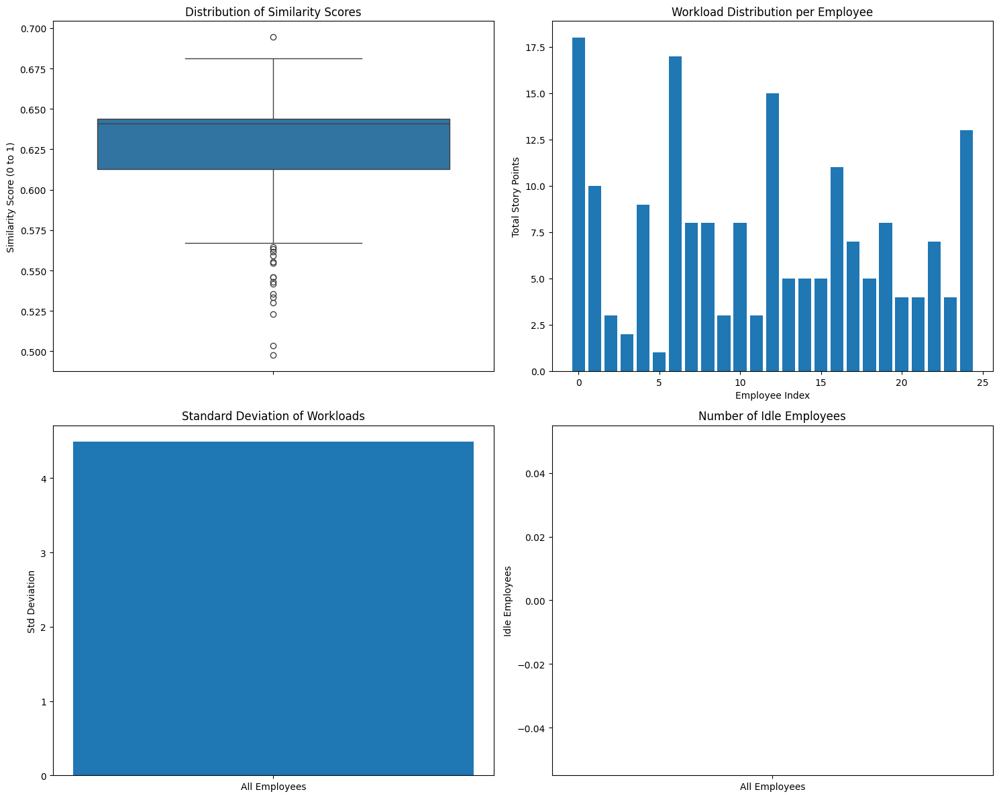

In [ ]:
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import gym
from gym import spaces
import random
from collections import deque
import matplotlib.pyplot as plt
import seaborn as sns
from uuid import uuid4
import time
import torch.serialization
from numpy.core.multiarray import scalar as np_scalar

# Allowlist NumPy scalar, dtype, and Float64DType to resolve UnpicklingError
torch.serialization.add_safe_globals([np_scalar, np.dtype, np.dtypes.Float64DType])

# Set device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Global Variables
MAX_TASKS = 500
MAX_EMPLOYEES = 200
MAX_WORKLOAD = 20
ALPHA_WED = 0.5
DQN_HIDDEN_DIM = 256

# Environment class (from task_assignment_dqn.py)
class TaskAssignmentEnv(gym.Env):
    def __init__(self, task_data, employee_data, max_tasks=MAX_TASKS, max_employees=MAX_EMPLOYEES):
        super(TaskAssignmentEnv, self).__init__()
        self.num_tasks = len(task_data)
        self.num_employees = len(employee_data)
        self.max_tasks = max_tasks
        self.max_employees = max_employees
        self.max_workload = MAX_WORKLOAD
        self.alpha_wed = ALPHA_WED

        # Load and preprocess data
        task_subset = task_data.iloc[:self.num_tasks]
        employee_subset = employee_data.iloc[:self.num_employees]
        skill_columns = [col for col in task_data.columns if col not in ['task_id', 'story_points', 'project_id']]
        project_id_map = {pid: idx + 1 for idx, pid in enumerate(task_subset['project_id'].unique())}
        project_ids = task_subset['project_id'].map(project_id_map).values
        task_skills_df = task_subset[skill_columns].fillna(0).astype(np.float32)
        employee_skills_df = employee_subset[skill_columns].fillna(0).astype(np.float32)
        story_points_df = task_subset['story_points'].astype(np.float32)

        # Convert to tensors and pad
        self.task_skills = F.pad(
            torch.tensor(task_skills_df.values / 5.0, dtype=torch.float32, device=device),
            (0, 0, 0, max_tasks - self.num_tasks),
            'constant', 0
        )
        self.employee_skills = F.pad(
            torch.tensor(employee_skills_df.values / 5.0, dtype=torch.float32, device=device),
            (0, 0, 0, max_employees - self.num_employees),
            'constant', 0
        )
        self.story_points = F.pad(
            torch.tensor(story_points_df.values, dtype=torch.float32, device=device),
            (0, max_tasks - self.num_tasks),
            'constant', 0
        )
        self.project_ids = F.pad(
            torch.tensor(project_ids, dtype=torch.long, device=device),
            (0, max_tasks - self.num_tasks),
            'constant', -1
        )
        self.total_story_points = torch.sum(self.story_points[:self.num_tasks]).item()
        self.num_skills = len(skill_columns)

        # Define observation and action spaces
        self.observation_space = spaces.Dict({
            'state_matrix': spaces.Box(low=0, high=1, shape=(max_tasks, max_employees, 1), dtype=np.float32),
            'workload_matrix': spaces.Box(low=0, high=MAX_WORKLOAD, shape=(max_employees,), dtype=np.float32),
            'idle_status': spaces.Box(low=0, high=1, shape=(max_employees,), dtype=np.float32),
            'global_features': spaces.Box(low=0, high=1, shape=(4,), dtype=np.float32),
            'task_mask': spaces.Box(low=0, high=1, shape=(max_tasks,), dtype=np.float32)
        })
        self.action_space = spaces.MultiDiscrete([2, self.num_tasks, self.num_employees])
        self.reset()

    def reset(self):
        self.workloads = torch.zeros(self.max_employees, device=device, dtype=torch.float32)
        self.assignments = torch.full((self.max_tasks,), -1, dtype=torch.long, device=device)
        self.remaining_tasks = torch.arange(self.num_tasks, device=device, dtype=torch.long)
        self.employee_projects = torch.full((self.max_employees,), -1, dtype=torch.long, device=device)
        self.wed_scores = []
        self._initialize_state_matrix()
        return self._get_obs()

    def _initialize_state_matrix(self):
        task_skills_expanded = self.task_skills[:self.num_tasks].unsqueeze(1).expand(-1, self.max_employees, -1)
        emp_skills_expanded = self.employee_skills.unsqueeze(0).expand(self.num_tasks, -1, -1)
        diff = emp_skills_expanded - task_skills_expanded
        weights = 1 / (1 + self.alpha_wed * torch.maximum(diff, torch.tensor(0.0, device=device, dtype=torch.float32)))
        mask = self.task_skills[:self.num_tasks].unsqueeze(1).expand(-1, self.max_employees, -1) > 0
        weighted_diff = weights * mask * (emp_skills_expanded - task_skills_expanded) ** 2
        wed = torch.sqrt(torch.sum(weighted_diff, dim=2))
        num_skills_per_task = torch.sum(self.task_skills[:self.num_tasks] > 0, dim=1).unsqueeze(1).expand(-1, self.max_employees)
        wed_worst = torch.sqrt(num_skills_per_task * (1.0 ** 2))
        wed_worst = torch.where(num_skills_per_task > 0, wed_worst, torch.tensor(1.0, device=device, dtype=torch.float32))
        self.state_matrix = torch.zeros((self.max_tasks, self.max_employees, 1), device=device, dtype=torch.float32)
        self.state_matrix[:self.num_tasks, :, 0] = (1 - (wed / wed_worst)).to(dtype=torch.float32)
        workload_penalty = self.workloads.unsqueeze(0).expand(self.max_tasks, -1).unsqueeze(-1) / self.max_workload
        self.state_matrix = self.state_matrix * (1 - torch.clamp(workload_penalty, 0, 1))

    def _update_state_matrix(self, task_idx, emp_idx):
        task_skills_t = self.task_skills[task_idx]
        emp_skills_e = self.employee_skills[emp_idx]
        diff = emp_skills_e - task_skills_t
        weights = 1 / (1 + self.alpha_wed * torch.maximum(diff, torch.tensor(0.0, device=device, dtype=torch.float32)))
        mask = task_skills_t > 0
        weighted_diff = weights[mask] * (emp_skills_e[mask] - task_skills_t[mask]) ** 2
        wed = torch.sqrt(torch.sum(weighted_diff))
        num_skills = torch.sum(mask.float())
        wed_worst = torch.sqrt(num_skills * (1.0 ** 2)) if num_skills > 0 else 1.0
        similarity = 1 - (wed / wed_worst) if wed_worst > 0 else 0.0
        workload_penalty = self.workloads[emp_idx].unsqueeze(0).unsqueeze(-1) / self.max_workload
        self.state_matrix[task_idx, emp_idx, 0] = similarity * (1 - torch.clamp(workload_penalty, 0, 1))

    def _get_obs(self):
        workload_matrix = self.workloads
        idle_status = (self.workloads == 0).float()
        prop_remaining = len(self.remaining_tasks) / self.num_tasks
        num_idle = torch.sum(self.workloads[:self.num_employees] == 0).item()
        prop_idle = num_idle / self.num_employees
        mean_workload = torch.mean(self.workloads[:self.num_employees]).item() if torch.sum(self.workloads[:self.num_employees]) > 0 else 1e-6
        std_workload = torch.std(self.workloads[:self.num_employees]).item()
        cv_normalized = std_workload / (self.max_workload / np.sqrt(self.num_employees)) if mean_workload > 0 else 0
        std_workload_normalized = std_workload / self.max_workload

        global_features = torch.tensor([prop_remaining, prop_idle, cv_normalized, std_workload_normalized],
                                      device=device, dtype=torch.float32)

        task_mask = torch.zeros(self.max_tasks, device=device, dtype=torch.float32)
        task_mask[self.remaining_tasks] = 1

        return {
            'state_matrix': self.state_matrix,
            'workload_matrix': workload_matrix,
            'idle_status': idle_status,
            'global_features': global_features,
            'task_mask': task_mask
        }

    def step(self, action):
        action_type, task_idx, emp_idx = action
        done = False
        reward = {'similarity': 0.0, 'workload': 0.0, 'idle': 0.0}
        info = {'action_valid': True}

        if emp_idx < 0 or emp_idx >= self.num_employees or task_idx < 0 or task_idx >= self.num_tasks:
            reward['similarity'] = -1.0
            info['action_valid'] = False
            info['invalid_action'] = f'Invalid task ({task_idx}) or employee ({emp_idx}) index'
            return self._get_obs(), reward, done, info

        if action_type == 0:
            if task_idx not in self.remaining_tasks:
                reward['similarity'] = -1.0
                info['action_valid'] = False
                info['invalid_action'] = f'Task {task_idx} already assigned'
                return self._get_obs(), reward, done, info

            task_project = self.project_ids[task_idx]
            emp_project = self.employee_projects[emp_idx]
            current_workload = self.workloads[emp_idx]

            if emp_project != -1 and emp_project != task_project:
                reward['similarity'] = -1.0
                info['action_valid'] = False
                info['invalid_action'] = f'Different project: employee {emp_idx} on project {emp_project}, task {task_idx} on project {task_project}'
                return self._get_obs(), reward, done, info

            if current_workload + self.story_points[task_idx] > self.max_workload:
                reward['similarity'] = -1.0
                info['action_valid'] = False
                info['invalid_action'] = f'Exceeds workload: employee {emp_idx} workload {current_workload} + task {task_idx} story points {self.story_points[task_idx]} > {self.max_workload}'
                return self._get_obs(), reward, done, info

            was_idle = (self.workloads[emp_idx] == 0)
            self.assignments[task_idx] = emp_idx
            self.workloads[emp_idx] += self.story_points[task_idx]
            self.remaining_tasks = self.remaining_tasks[self.remaining_tasks != task_idx]
            if self.employee_projects[emp_idx] == -1:
                self.employee_projects[emp_idx] = task_project

            self._update_state_matrix(task_idx, emp_idx)

        elif action_type == 1:
            if task_idx in self.remaining_tasks:
                reward['similarity'] = -1.0
                info['action_valid'] = False
                info['invalid_action'] = f'Task {task_idx} not yet assigned'
                return self._get_obs(), reward, done, info

            current_emp_idx = self.assignments[task_idx]
            if current_emp_idx == emp_idx:
                reward['similarity'] = -1.0
                info['action_valid'] = False
                info['invalid_action'] = f'Task {task_idx} already assigned to employee {emp_idx}'
                return self._get_obs(), reward, done, info

            task_project = self.project_ids[task_idx]
            emp_project = self.employee_projects[emp_idx]
            current_workload = self.workloads[emp_idx]

            if emp_project != -1 and emp_project != task_project:
                reward['similarity'] = -1.0
                info['action_valid'] = False
                info['invalid_action'] = f'Different project: employee {emp_idx} on project {emp_project}, task {task_idx} on project {task_project}'
                return self._get_obs(), reward, done, info

            if current_workload + self.story_points[task_idx] > self.max_workload:
                reward['similarity'] = -1.0
                info['action_valid'] = False
                info['invalid_action'] = f'Exceeds workload: employee {emp_idx} workload {current_workload} + task {task_idx} story points {self.story_points[task_idx]} > {self.max_workload}'
                return self._get_obs(), reward, done, info

            self.workloads[current_emp_idx] -= self.story_points[task_idx]
            emp_tasks = (self.assignments == current_emp_idx) & (self.project_ids == task_project)
            emp_tasks[task_idx] = False
            if not torch.any(emp_tasks):
                self.employee_projects[current_emp_idx] = -1

            was_idle = (self.workloads[emp_idx] == 0)
            self.assignments[task_idx] = emp_idx
            self.workloads[emp_idx] += self.story_points[task_idx]
            if self.employee_projects[emp_idx] == -1:
                self.employee_projects[emp_idx] = task_project

            self._update_state_matrix(task_idx, emp_idx)

        else:
            reward['similarity'] = -1.0
            info['action_valid'] = False
            info['invalid_action'] = f'Invalid action type {action_type}'
            return self._get_obs(), reward, done, info

        task_skills_t = self.task_skills[task_idx]
        emp_skills_e = self.employee_skills[emp_idx]
        diff = emp_skills_e - task_skills_t
        weights = 1 / (1 + self.alpha_wed * torch.maximum(diff, torch.tensor(0.0, device=device, dtype=torch.float32)))
        mask = task_skills_t > 0
        weighted_diff = weights[mask] * (emp_skills_e[mask] - task_skills_t[mask]) ** 2
        wed = torch.sqrt(torch.sum(weighted_diff))

        similarity = self.state_matrix[task_idx, emp_idx, 0].item()
        info['similarity'] = similarity
        self.wed_scores.append(wed.item())

        reward['similarity'] = 0.0 if action_type == 0 else -0.01
        reward['workload'] = 0.0
        reward['idle'] = 0.0

        if len(self.remaining_tasks) == 0:
            done = True

            assigned_tasks = torch.where(self.assignments != -1)[0]
            total_similarity = 0.0
            for task_idx in assigned_tasks:
                emp_idx = self.assignments[task_idx].item()
                similarity = self.state_matrix[task_idx, emp_idx, 0].item()
                total_similarity += similarity
            avg_similarity = total_similarity / self.num_tasks if self.num_tasks > 0 else 0.0
            reward['similarity'] = 50.0 * (2.0 * avg_similarity - 1.0)

            std_workload = torch.std(self.workloads[:self.num_employees]).item()
            max_std = self.max_workload / 2
            normalized_std = std_workload / max_std if max_std > 0 else 0.0
            reward['workload'] = 50.0 * (1.0 - 2.0 * normalized_std)

            num_idle = torch.sum(self.workloads[:self.num_employees] == 0).item()
            idle_ratio = num_idle / self.num_employees
            reward['idle'] = 50.0 * (1.0 - 2.0 * idle_ratio)

            info['avg_similarity'] = avg_similarity
            info['std_workload'] = std_workload
            info['num_idle'] = num_idle

        return self._get_obs(), reward, done, info

# DQN model class (from task_assignment_dqn.py)
class DQN(nn.Module):
    def __init__(self, input_dim, max_employees, max_tasks, num_employees, num_tasks):
        super(DQN, self).__init__()
        self.max_employees = max_employees
        self.max_tasks = max_tasks
        self.num_employees = num_employees
        self.num_tasks = num_tasks
        self.conv1 = nn.Conv2d(1, 16, kernel_size=3, stride=1, padding=1).to(device, dtype=torch.float32)
        self.conv2 = nn.Conv2d(16, 32, kernel_size=3, stride=1, padding=1).to(device, dtype=torch.float32)
        conv_output_height = (max_tasks // 2) // 2
        conv_output_width = (max_employees // 2) // 2
        conv_output_size = 32 * conv_output_height * conv_output_width
        self.fc1 = nn.Linear(conv_output_size + max_employees * 2 + 4, DQN_HIDDEN_DIM).to(device, dtype=torch.float32)
        self.fc2 = nn.Linear(DQN_HIDDEN_DIM, DQN_HIDDEN_DIM // 2).to(device, dtype=torch.float32)
        self.fc3 = nn.Linear(DQN_HIDDEN_DIM // 2, 2 * max_tasks * max_employees).to(device, dtype=torch.float32)

    def forward(self, state_matrix, workload_matrix, idle_status, global_features):
        batch_size = state_matrix.size(0)
        state_input = state_matrix.permute(0, 3, 1, 2)
        state_input = F.relu(self.conv1(state_input))
        state_input = F.max_pool2d(state_input, 2)
        state_input = F.relu(self.conv2(state_input))
        state_input = F.max_pool2d(state_input, 2)
        state_input = state_input.reshape(batch_size, -1)

        workload_input = workload_matrix.view(batch_size, -1)
        idle_input = idle_status.view(batch_size, -1)
        global_input = global_features.view(batch_size, -1)

        x = torch.cat([state_input, workload_input, idle_input, global_input], dim=1)
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        q_values = self.fc3(x).view(batch_size, 2, self.max_tasks, self.max_employees)

        # Mask Q-values for padded tasks and employees
        q_values[:, :, self.num_tasks:, :] = -float('inf')
        q_values[:, :, :, self.num_employees:] = -float('inf')
        return q_values

# DQN agent class (from task_assignment_dqn.py, adapted for inference)
class DQNAgent:
    def __init__(self, num_tasks, num_employees, max_tasks=MAX_TASKS, max_employees=MAX_EMPLOYEES):
        self.device = device
        self.num_tasks = num_tasks
        self.num_employees = num_employees
        self.max_tasks = max_tasks
        self.max_employees = max_employees
        self.input_dim = 1 + 1 + 1 + 4
        self.model = DQN(self.input_dim, self.max_employees, self.max_tasks, self.num_employees, self.num_tasks).to(device)
        self.target_model = DQN(self.input_dim, self.max_employees, self.max_tasks, self.num_employees, self.num_tasks).to(device)
        self.target_model.load_state_dict(self.model.state_dict())
        self.optimizer = torch.optim.Adam(self.model.parameters(), lr=3e-4)
        self.memory = deque(maxlen=50000)
        self.batch_size = 64
        self.epsilon = 0.0  # Set to 0 for inference
        self.gamma = 0.99
        self.scaler = torch.amp.GradScaler('cuda')
        self.recent_actions = deque(maxlen=10)  # Track recent actions to detect loops
        self.invalid_action_count = 0  # Count consecutive invalid actions

    def act(self, obs, env):
        valid_tasks = torch.where(obs['task_mask'][:self.num_tasks] == 1)[0]
        assigned_tasks = torch.where(env.assignments[:self.num_tasks] != -1)[0]

        # Check for action loop
        action_counts = {}
        for action in self.recent_actions:
            action_tuple = tuple(action)
            action_counts[action_tuple] = action_counts.get(action_tuple, 0) + 1
            if action_counts.get(action_tuple, 0) >= 4:  # Repeated 4 times in last 10 actions
                print(f"Detected action loop: {action_tuple} repeated {action_counts[action_tuple]} times")
                self.invalid_action_count += 1
                break
        else:
            self.invalid_action_count = 0

        # Fallback to random valid action if stuck
        if self.invalid_action_count >= 2:
            print("Falling back to random valid action to break loop")
            if len(valid_tasks) > 0:
                task_idx = random.choice(valid_tasks.cpu().numpy())
                valid_emps = torch.where(
                    (env.workloads[:self.num_employees] + env.story_points[task_idx] <= env.max_workload) &
                    ((env.employee_projects[:self.num_employees] == -1) | (env.employee_projects[:self.num_employees] == env.project_ids[task_idx]))
                )[0]
                if valid_emps.size(0) > 0:
                    emp_idx = random.choice(valid_emps.cpu().numpy())
                    action = [0, task_idx, emp_idx]
                    self.recent_actions.append(action)
                    print(f"Random assign action: {action}")
                    return action
            if len(assigned_tasks) > 0:
                task_idx = random.choice(assigned_tasks.cpu().numpy())
                current_emp_idx = env.assignments[task_idx].item()
                valid_emps = torch.where(
                    (torch.arange(self.num_employees, device=device) != current_emp_idx) &
                    (env.workloads[:self.num_employees] + env.story_points[task_idx] <= env.max_workload) &
                    ((env.employee_projects[:self.num_employees] == -1) | (env.employee_projects[:self.num_employees] == env.project_ids[task_idx]))
                )[0]
                if valid_emps.size(0) > 0:
                    emp_idx = random.choice(valid_emps.cpu().numpy())
                    action = [1, task_idx, emp_idx]
                    self.recent_actions.append(action)
                    print(f"Random reassign action: {action}")
                    return action
            print("No valid actions available, skipping")
            return [0, 0, 0]  # Placeholder action (will be invalid)

        state_matrix = obs['state_matrix'].unsqueeze(0).to(dtype=torch.float32)
        workload_matrix = obs['workload_matrix'].unsqueeze(0).to(dtype=torch.float32)
        idle_status = obs['idle_status'].unsqueeze(0).to(dtype=torch.float32)
        global_features = obs['global_features'].unsqueeze(0).to(dtype=torch.float32)

        with torch.no_grad():
            q_values = self.model(state_matrix, workload_matrix, idle_status, global_features)

            # Create masks for valid actions
            task_mask = torch.zeros(self.max_tasks, device=device, dtype=torch.bool)
            task_mask[valid_tasks] = 1
            emp_mask = torch.ones(self.max_tasks, self.max_employees, device=device, dtype=torch.bool)
            for t in range(self.num_tasks):
                emp_mask[t, :self.num_employees] = (
                    (env.workloads[:self.num_employees] + env.story_points[t] <= env.max_workload) &
                    ((env.employee_projects[:self.num_employees] == -1) | (env.employee_projects[:self.num_employees] == env.project_ids[t]))
                )
                emp_mask[t, self.num_employees:] = False

            assign_mask = torch.zeros_like(q_values, dtype=torch.bool)
            assign_mask[:, 0] = task_mask.unsqueeze(-1).expand(-1, self.max_employees) & emp_mask

            reassign_mask = torch.zeros_like(q_values, dtype=torch.bool)
            for t in assigned_tasks:
                current_emp_idx = env.assignments[t].item()
                reassign_emp_mask = emp_mask[t].clone()
                reassign_emp_mask[current_emp_idx] = False
                reassign_mask[0, 1, t] = reassign_emp_mask

            combined_mask = assign_mask | reassign_mask
            q_values[~combined_mask] = -float('inf')

            if torch.all(q_values == -float('inf')):
                print("No valid Q-values, falling back to random action")
                if len(valid_tasks) > 0:
                    task_idx = random.choice(valid_tasks.cpu().numpy())
                    valid_emps = torch.where(
                        (env.workloads[:self.num_employees] + env.story_points[task_idx] <= env.max_workload) &
                        ((env.employee_projects[:self.num_employees] == -1) | (env.employee_projects[:self.num_employees] == env.project_ids[task_idx]))
                    )[0]
                    if valid_emps.size(0) > 0:
                        emp_idx = random.choice(valid_emps.cpu().numpy())
                        action = [0, task_idx, emp_idx]
                        self.recent_actions.append(action)
                        print(f"Random assign action: {action}")
                        return action
                if len(assigned_tasks) > 0:
                    task_idx = random.choice(assigned_tasks.cpu().numpy())
                    current_emp_idx = env.assignments[task_idx].item()
                    valid_emps = torch.where(
                        (torch.arange(self.num_employees, device=device) != current_emp_idx) &
                        (env.workloads[:self.num_employees] + env.story_points[task_idx] <= env.max_workload) &
                        ((env.employee_projects[:self.num_employees] == -1) | (env.employee_projects[:self.num_employees] == env.project_ids[task_idx]))
                    )[0]
                    if valid_emps.size(0) > 0:
                        emp_idx = random.choice(valid_emps.cpu().numpy())
                        action = [1, task_idx, emp_idx]
                        self.recent_actions.append(action)
                        print(f"Random reassign action: {action}")
                        return action
                print("No valid actions available, skipping")
                action = [0, 0, 0]  # Placeholder action (will be invalid)
                self.recent_actions.append(action)
                return action

            action_idx = torch.argmax(q_values.view(-1)).item()
            action_type = action_idx // (self.max_tasks * self.max_employees)
            task_emp_idx = action_idx % (self.max_tasks * self.max_employees)
            task_idx = task_emp_idx // self.max_employees
            emp_idx = task_emp_idx % self.max_employees
            action = [action_type, task_idx, emp_idx]
            self.recent_actions.append(action)
            return action

    def load(self, model_path, agent_path):
        checkpoint = torch.load(model_path, map_location=device, weights_only=True)
        self.model.load_state_dict(checkpoint['model_state_dict'])
        self.target_model.load_state_dict(checkpoint['target_model_state_dict'])
        self.optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
        agent_params = torch.load(agent_path, map_location=device, weights_only=True)
        self.epsilon = agent_params['epsilon']

# Inference function
def run_inference(model_path, agent_path, task_data_path, employee_data_path, output_csv_path):
    # Load datasets
    task_data = pd.read_csv(task_data_path)
    employee_data = pd.read_csv(employee_data_path)

    # Initialize environment
    env = TaskAssignmentEnv(task_data, employee_data)

    # Initialize agent
    agent = DQNAgent(env.num_tasks, env.num_employees)
    agent.load(model_path, agent_path)
    agent.epsilon = 0.0  # Disable exploration for inference

    # Update agent and model sizes
    agent.num_tasks = env.num_tasks
    agent.num_employees = env.num_employees
    agent.model.num_tasks = env.num_tasks
    agent.model.num_employees = env.num_employees
    agent.target_model.num_tasks = env.num_tasks
    agent.target_model.num_employees = env.num_employees

    # Run inference
    obs = env.reset()
    done = False
    wed_scores = []
    similarities = []
    assignments = []
    step = 0
    start_time = time.time()

    while not done and step < 1000:  # Add step limit to prevent infinite loops
        step += 1
        action_start_time = time.time()

        # Select action
        action = agent.act(obs, env)

        # Execute action
        next_obs, reward, done, info = env.step(action)

        # Log step details
        if info['action_valid']:
            assignments.append((action[1], action[2], info['similarity']))
            similarities.append(info['similarity'])
            wed_scores.append(env.wed_scores[-1] if env.wed_scores else 0)
        else:
            print(f"Invalid action: {action}, Reason: {info['invalid_action']}")

        # Print step log
        step_time = time.time() - action_start_time
        print(f"Step {step}: Action={action}, Reward={reward}, Time={step_time:.2f}s")

        obs = next_obs

    total_time = time.time() - start_time
    print(f"Inference completed in {total_time:.2f} seconds.")

    # Prepare data for CSV
    employee_assignments = {}
    for task_idx, emp_idx, similarity in assignments:
        emp_id = employee_data.iloc[emp_idx]['employee_id']
        task_id = task_data.iloc[task_idx]['task_id']
        project_id = task_data.iloc[task_idx]['project_id']
        workload = env.story_points[task_idx].item()
        if emp_id not in employee_assignments:
            employee_assignments[emp_id] = {
                'task_ids': [],
                'project_ids': [],
                'total_workload': 0,
                'similarities': []
            }
        employee_assignments[emp_id]['task_ids'].append(task_id)
        employee_assignments[emp_id]['project_ids'].append(project_id)
        employee_assignments[emp_id]['total_workload'] += workload
        employee_assignments[emp_id]['similarities'].append(round(similarity, 4))

    # Export to CSV
    csv_data = []
    for emp_id, data in employee_assignments.items():
        csv_data.append({
            'employee_id': emp_id,
            'task_id': data['task_ids'],
            'project_id': data['project_ids'],
            'total_workload': data['total_workload'],
            'similarity': data['similarities']
        })
    pd.DataFrame(csv_data).to_csv(output_csv_path, index=False)
    print(f"Assignments saved to {output_csv_path}")

    # Visualizations
    plt.figure(figsize=(15, 12))

    # 1. Boxplot of Weighted Euclidean Distance (converted to similarity)
    plt.subplot(2, 2, 1)
    alpha = env.alpha_wed
    weights_worst = 1 / (1 + alpha * 1)
    wed_raw_worst = np.sqrt(np.sum(weights_worst * (0 - 1) ** 2) * env.num_skills)
    wed_raw_best = 0
    standardized_similarities = [(wed_raw_worst - wed) / (wed_raw_worst - wed_raw_best) for wed in wed_scores]
    sns.boxplot(y=standardized_similarities)
    plt.title('Distribution of Similarity Scores')
    plt.ylabel('Similarity Score (0 to 1)')

    # 2. Bar chart of workloads
    plt.subplot(2, 2, 2)
    workloads = env.workloads[:env.num_employees].cpu().numpy()
    plt.bar(range(env.num_employees), workloads)
    plt.title('Workload Distribution per Employee')
    plt.xlabel('Employee Index')
    plt.ylabel('Total Story Points')

    # 3. Bar chart of standard deviation
    plt.subplot(2, 2, 3)
    std_workload = np.std(workloads)
    plt.bar([1], [std_workload])
    plt.title('Standard Deviation of Workloads')
    plt.ylabel('Std Deviation')
    plt.xticks([1], ['All Employees'])

    # 4. Bar chart of idle employees
    plt.subplot(2, 2, 4)
    num_idle = torch.sum(env.workloads[:env.num_employees] == 0).item()
    plt.bar([1], [num_idle])
    plt.title('Number of Idle Employees')
    plt.ylabel('Idle Employees')
    plt.xticks([1], ['All Employees'])

    plt.tight_layout()
    plt.savefig('inference_visualizations.png')
    plt.show()

    return env, workloads, std_workload, num_idle

# Example usage
if __name__ == "__main__":
    model_path = '/content/drive/MyDrive/Skripsi/reassignment_dqn_model.pth'
    agent_path = '/content/drive/MyDrive/Skripsi/reassignment_dqn_agent_params.pth'
    task_data_path = '/content/drive/MyDrive/Skripsi/Resources/Datasets/inference_50_task.csv'
    employee_data_path = '/content/drive/MyDrive/Skripsi/Resources/Datasets/inference_25_employee.csv'
    output_csv_path = 'inference_assignments.csv'

    print("Running inference...")
    env, workloads, std_workload, num_idle = run_inference(
        model_path, agent_path, task_data_path, employee_data_path, output_csv_path
    )

In [ ]:
task_data_path = '/content/drive/MyDrive/Skripsi/Resources/Datasets/fixed_data_task.csv'  # Update this if the filename changes
employee_data_path = '/content/drive/MyDrive/Skripsi/Resources/Datasets/fixed_data_employee.csv'

## DQN approach without convolution
more extreme and visible difference

<ipython-input-8-b4fe344be7dd>:250: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  self.scaler = GradScaler()
<ipython-input-8-b4fe344be7dd>:333: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():


Episode 1/20, Temperature: 1.000
Step 10/300: Reward 0.0917, Time 0.00s
Step 20/300: Reward 0.1835, Time 0.00s
Step 30/300: Reward 0.2752, Time 0.00s
Step 40/300: Reward 0.3303, Time 0.00s
Step 50/300: Reward 0.4220, Time 0.00s
Step 60/300: Reward 0.4954, Time 0.00s
Step 70/300: Reward 0.5596, Time 0.01s
Step 80/300: Reward 0.6330, Time 0.01s
Step 90/300: Reward 0.6789, Time 0.01s
Step 100/300: Reward 0.7339, Time 0.01s
Step 110/300: Reward 0.8073, Time 0.01s
Step 120/300: Reward 0.8532, Time 0.01s
Step 130/300: Reward 0.8807, Time 0.01s
Step 140/300: Reward 0.8991, Time 0.01s
Step 150/300: Reward 0.9266, Time 0.01s
Step 160/300: Reward 0.9450, Time 0.01s
Step 170/300: Reward 0.9725, Time 0.01s
Step 180/300: Reward 0.9725, Time 0.01s
Step 190/300: Reward 0.9817, Time 0.01s
Step 200/300: Reward 0.9817, Time 0.01s
Step 210/300: Reward 0.9817, Time 0.01s
Step 220/300: Reward 0.9908, Time 0.01s
Step 230/300: Reward 0.9908, Time 0.01s
Step 240/300: Reward 0.9908, Time 0.01s
Step 250/300: Re

<ipython-input-8-b4fe344be7dd>:393: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(wed_scores_to_plot, labels=[f"Ep {i+1}" for i in range(num_episodes_to_plot)])
<ipython-input-8-b4fe344be7dd>:406: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(similarity_scores_to_plot, labels=[f"Ep {i+1}" for i in range(num_episodes_to_plot)])


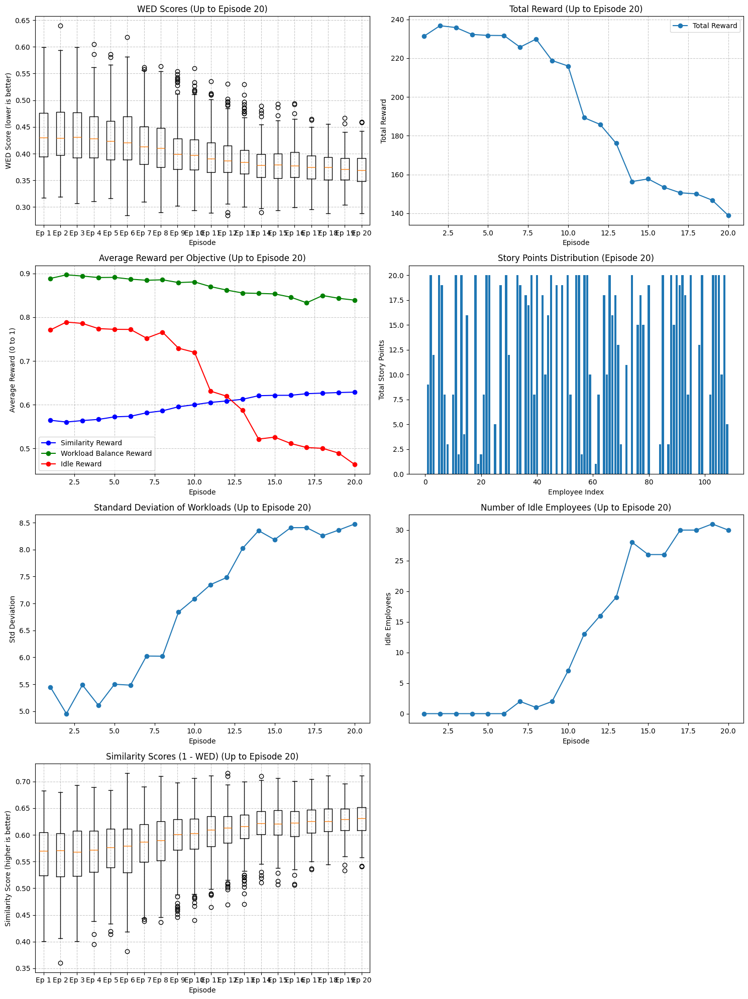

In [ ]:
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import gym
from gym import spaces
import random
from collections import deque
import matplotlib.pyplot as plt
import seaborn as sns
import time
from torch.cuda.amp import autocast, GradScaler

# Global Variables for Flexibility
NUM_EMPLOYEES = 109
NUM_TASKS = 300
NUM_EPISODES = 20
LEARNING_RATE = 5e-5
INITIAL_TEMPERATURE = 1.0
MIN_TEMPERATURE = 0.1
GAMMA = 0.99
MEMORY_SIZE = 50000
BATCH_SIZE = 64
TARGET_UPDATE_FREQ = 100
DQN_HIDDEN_DIM = 128
MAX_WORKLOAD = 20
WEIGHT_SIMILARITY = 0
WEIGHT_WORKLOAD = 0
WEIGHT_IDLE = 1
ALPHA_WED = 0.5

# Episode untuk save model dan visualisasi
SAVE_EPISODES = []

# Total langkah global untuk decay rate
MAX_STEPS_PER_EPISODE = NUM_TASKS
TOTAL_STEPS = NUM_EPISODES * MAX_STEPS_PER_EPISODE
DECAY_RATE = -np.log(MIN_TEMPERATURE / INITIAL_TEMPERATURE) / TOTAL_STEPS

if not abs(WEIGHT_SIMILARITY + WEIGHT_WORKLOAD + WEIGHT_IDLE - 1.0) < 1e-6:
    raise ValueError(f"Reward weights must sum to 1, but got {WEIGHT_SIMILARITY + WEIGHT_WORKLOAD + WEIGHT_IDLE}")

task_data_path = '/content/drive/MyDrive/Skripsi/Resources/Datasets/fixed_data_task.csv'
employee_data_path = '/content/drive/MyDrive/Skripsi/Resources/Datasets/fixed_data_employee.csv'
model_save_path = '/content/drive/MyDrive/Skripsi/plain_dqn_model_no_gnn.pth'
agent_save_path = '/content/drive/MyDrive/Skripsi/plain_dqn_agent_params_no_gnn.pth'

# Load and clean datasets
task_data = pd.read_csv(task_data_path)
employee_data = pd.read_csv(employee_data_path)
task_subset = task_data.iloc[:NUM_TASKS]
employee_subset = employee_data.iloc[:NUM_EMPLOYEES]
skill_columns = [col for col in task_data.columns if col not in ['task_id', 'story_points', 'project_id']]

project_id_map = {pid: idx + 1 for idx, pid in enumerate(task_subset['project_id'].unique())}
project_ids = task_subset['project_id'].map(project_id_map).values

task_skills_df = task_subset[skill_columns].fillna(0)
employee_skills_df = employee_subset[skill_columns].fillna(0)
task_skills = task_skills_df.values / 5.0
employee_skills = employee_skills_df.values / 5.0

# Precompute state matrix on GPU
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
torch.backends.cudnn.benchmark = True  # Enable cuDNN auto-tuner
task_skills_tensor = torch.tensor(task_skills, dtype=torch.float32).to(device)
employee_skills_tensor = torch.tensor(employee_skills, dtype=torch.float32).to(device)

# Vectorized computation of state matrix
alpha = ALPHA_WED
task_skills_expanded = task_skills_tensor.unsqueeze(1)  # (NUM_TASKS, 1, num_skills)
employee_skills_expanded = employee_skills_tensor.unsqueeze(0)  # (1, NUM_EMPLOYEES, num_skills)
diff = employee_skills_expanded - task_skills_expanded  # (NUM_TASKS, NUM_EMPLOYEES, num_skills)

weights = 1 / (1 + alpha * torch.maximum(diff, torch.tensor(0.0, device=device)))
mask = task_skills_tensor > 0  # (NUM_TASKS, num_skills)
mask_expanded = mask.unsqueeze(1)  # (NUM_TASKS, 1, num_skills)

weighted_diff = weights * mask_expanded * (employee_skills_expanded - task_skills_expanded) ** 2
wed = torch.sqrt(torch.sum(weighted_diff, dim=2))  # (NUM_TASKS, NUM_EMPLOYEES)

num_skills_per_task = torch.sum(mask, dim=1)  # (NUM_TASKS,)
weights_worst = 1 / (1 + alpha * 1)
wed_worst = torch.sqrt(num_skills_per_task * weights_worst * (1.0 ** 2))
wed_worst = torch.where(num_skills_per_task > 0, wed_worst, torch.tensor(1.0, device=device))

similarity = 1 - (wed / wed_worst.unsqueeze(1))  # (NUM_TASKS, NUM_EMPLOYEES)
state_matrix = similarity.unsqueeze(-1)  # (NUM_TASKS, NUM_EMPLOYEES, 1)

class TaskAssignmentEnv(gym.Env):
    def __init__(self, task_skills, employee_skills, story_points, project_ids, num_tasks=None, num_employees=None):
        super(TaskAssignmentEnv, self).__init__()
        self.task_skills = task_skills
        self.employee_skills = employee_skills
        self.story_points = torch.tensor(story_points, dtype=torch.float32).to(device)
        self.project_ids = torch.tensor(project_ids, dtype=torch.long).to(device)
        self.max_workload = MAX_WORKLOAD
        self.num_tasks = num_tasks if num_tasks is not None else len(task_skills)
        self.num_employees = num_employees if num_employees is not None else len(employee_skills)

        self.task_skills = self.task_skills[:self.num_tasks]
        self.employee_skills = self.employee_skills[:self.num_employees]
        self.story_points = self.story_points[:self.num_tasks]
        self.project_ids = self.project_ids[:self.num_tasks]

        self.observation_space = spaces.Dict({
            'state_matrix': spaces.Box(low=0, high=1, shape=(self.num_tasks, self.num_employees, 1), dtype=np.float32),
            'global_features': spaces.Box(low=0, high=1, shape=(3,), dtype=np.float32),
            'task_mask': spaces.Box(low=0, high=1, shape=(self.num_tasks,), dtype=np.float32)
        })
        self.action_space = spaces.MultiDiscrete([self.num_tasks, self.num_employees])
        self.total_story_points = torch.sum(self.story_points).item()
        workloads = torch.zeros(self.num_employees, device=device)
        workloads[0] = self.max_workload
        mean_workload = self.max_workload / self.num_employees
        self.actual_max_std = torch.sqrt(torch.sum((workloads - mean_workload) ** 2) / self.num_employees).item()
        self.max_possible_cv = (self.actual_max_std / mean_workload) if mean_workload > 0 else 1.0
        self.state_matrix = state_matrix  # Precomputed on GPU
        self.reset()

    def reset(self):
        self.workloads = torch.zeros(self.num_employees, device=device)
        self.assignments = torch.full((self.num_tasks,), -1, dtype=torch.long, device=device)
        self.remaining_tasks = torch.arange(self.num_tasks, device=device)
        self.wed_scores = []
        self.similarity_scores = []
        self.total_assigned_story_points = 0
        self.employee_projects = torch.full((self.num_employees,), -1, dtype=torch.long, device=device)
        return self._get_obs()

    def _get_obs(self):
        prop_remaining = len(self.remaining_tasks) / self.num_tasks
        num_idle = torch.sum(self.workloads == 0).item()
        prop_idle = num_idle / self.num_employees
        mean_workload = torch.mean(self.workloads).item() if torch.sum(self.workloads) > 0 else 1e-6
        std_workload = torch.std(self.workloads).item()
        cv = std_workload / mean_workload if mean_workload > 0 else 0
        cv_normalized = cv / self.max_possible_cv

        global_features = torch.tensor([prop_remaining, prop_idle, cv_normalized], dtype=torch.float32, device=device)

        task_mask = torch.zeros(self.num_tasks, dtype=torch.float32, device=device)
        task_mask[self.remaining_tasks] = 1

        return {
            'state_matrix': self.state_matrix,
            'global_features': global_features,
            'task_mask': task_mask
        }

    def _compute_similarity(self, task_idx, emp_idx):
        return self.state_matrix[task_idx, emp_idx, 0].item()

    def step(self, action):
        task_idx, emp_idx = action
        done = False
        reward = 0
        info = {}

        task_project = self.project_ids[task_idx]
        emp_project = self.employee_projects[emp_idx]
        if emp_project != -1 and emp_project != task_project:
            reward = -1.0
            info['invalid_action'] = 'Employee assigned to a different project'
            return self._get_obs(), reward, done, info

        current_workload = self.workloads[emp_idx]
        if current_workload + self.story_points[task_idx] > self.max_workload:
            reward = -1.0
            info['invalid_action'] = 'Workload exceeds maximum'
            return self._get_obs(), reward, done, info

        self.assignments[task_idx] = emp_idx
        self.workloads[emp_idx] += self.story_points[task_idx]
        self.total_assigned_story_points += self.story_points[task_idx].item()
        self.remaining_tasks = self.remaining_tasks[self.remaining_tasks != task_idx]

        if self.employee_projects[emp_idx] == -1:
            self.employee_projects[emp_idx] = task_project

        similarity_reward = self._compute_similarity(task_idx, emp_idx)
        self.similarity_scores.append(similarity_reward)
        self.wed_scores.append(1 - similarity_reward)

        mean_workload = torch.mean(self.workloads).item() if torch.sum(self.workloads) > 0 else 1e-6
        std_workload = torch.std(self.workloads).item()
        cv = std_workload / mean_workload if mean_workload > 0 else 0
        workload_balance_reward = 1 - (cv / self.max_possible_cv)

        num_idle = torch.sum(self.workloads == 0).item()
        idle_reward = 1 - (num_idle / self.num_employees)

        reward = (WEIGHT_SIMILARITY * similarity_reward) + (WEIGHT_WORKLOAD * workload_balance_reward) + (WEIGHT_IDLE * idle_reward)

        info['similarity_reward'] = similarity_reward
        info['workload_balance_reward'] = workload_balance_reward
        info['idle_reward'] = idle_reward

        if len(self.remaining_tasks) == 0:
            done = True
            info['total_wed'] = np.sum(self.wed_scores)
            info['similarity_scores'] = self.similarity_scores

        return self._get_obs(), reward, done, info

class DQN(nn.Module):
    def __init__(self, input_dim, output_dim, num_employees):
        super(DQN, self).__init__()
        self.num_employees = num_employees
        self.fc1 = nn.Linear(input_dim, DQN_HIDDEN_DIM)
        self.fc2 = nn.Linear(DQN_HIDDEN_DIM, DQN_HIDDEN_DIM // 2)
        self.fc3 = nn.Linear(DQN_HIDDEN_DIM // 2, 1)

    def forward(self, state_matrix, global_features):
        if state_matrix.dim() == 3:
            batch_size = state_matrix.size(0)
            state_input = state_matrix.squeeze(-1).unsqueeze(-1)
            global_features = global_features.unsqueeze(1).expand(-1, self.num_employees, -1)
            x = torch.cat([state_input, global_features], dim=-1)
            x = F.relu(self.fc1(x))
            x = F.relu(self.fc2(x))
            q_values = self.fc3(x).squeeze(-1)
        else:
            state_input = state_matrix.squeeze(-1).unsqueeze(-1)
            global_features = global_features.expand(self.num_employees, -1)
            x = torch.cat([state_input, global_features], dim=-1)
            x = F.relu(self.fc1(x))
            x = F.relu(self.fc2(x))
            q_values = self.fc3(x).squeeze(-1)
        return q_values

class DQNAgent:
    def __init__(self, num_tasks, num_employees):
        self.device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
        self.num_tasks = num_tasks
        self.num_employees = num_employees
        self.input_dim = 1 + 3
        self.output_dim = 1
        self.model = DQN(self.input_dim, self.output_dim, self.num_employees).to(self.device)
        self.target_model = DQN(self.input_dim, self.output_dim, self.num_employees).to(self.device)
        self.target_model.load_state_dict(self.model.state_dict())
        self.optimizer = torch.optim.Adam(self.model.parameters(), lr=LEARNING_RATE)
        self.memory = deque(maxlen=MEMORY_SIZE)
        self.batch_size = BATCH_SIZE
        self.temperature = INITIAL_TEMPERATURE
        self.min_temperature = MIN_TEMPERATURE
        self.gamma = GAMMA
        self.global_step = 0
        self.scaler = torch.amp.GradScaler('cuda')
    def update_temperature(self):
        self.global_step += 1
        self.temperature = self.min_temperature + (INITIAL_TEMPERATURE - self.min_temperature) * np.exp(-DECAY_RATE * self.global_step)

    def act(self, obs, env):
        state_matrix = obs['state_matrix']
        global_features = obs['global_features']
        task_mask = obs['task_mask']

        valid_tasks = torch.where(task_mask == 1)[0]
        if valid_tasks.size(0) == 0:
            return [0, 0]

        # Vectorized action validation
        valid_tasks = valid_tasks.to(device)
        task_projects = env.project_ids[valid_tasks]
        story_points = env.story_points[valid_tasks]

        workload_feasible = (env.workloads.unsqueeze(0) + story_points.unsqueeze(1)) <= env.max_workload
        project_feasible = (env.employee_projects.unsqueeze(0) == -1) | (env.employee_projects.unsqueeze(0) == task_projects.unsqueeze(1))
        valid_mask = workload_feasible & project_feasible

        valid_actions = torch.nonzero(valid_mask, as_tuple=False)
        if valid_actions.size(0) == 0:
            return [0, 0]

        valid_task_indices = valid_actions[:, 0]
        valid_emp_indices = valid_actions[:, 1]

        # Sample a random task from valid ones
        task_idx = random.choice(valid_task_indices.cpu().numpy())
        task_global_idx = valid_tasks[task_idx].item()

        # Filter employees valid for this task
        emp_mask = valid_actions[:, 0] == task_idx
        valid_emp_for_task = valid_emp_indices[emp_mask]

        # Compute Q-values for valid employees
        with torch.no_grad():
            task_state = state_matrix[task_global_idx]
            q_values = self.model(task_state, global_features)
            q_values_subset = q_values[valid_emp_for_task]

            if q_values_subset.numel() == 0:
                emp_idx = random.choice(valid_emp_for_task.cpu().tolist())
            else:
                scaled_q = q_values_subset / self.temperature
                probs = F.softmax(scaled_q, dim=0)
                if torch.any(torch.isnan(probs)):
                    emp_idx = random.choice(valid_emp_for_task.cpu().tolist())
                else:
                    emp_idx_idx = torch.multinomial(probs, 1).item()
                    emp_idx = valid_emp_for_task[emp_idx_idx].item()

        return [task_global_idx, emp_idx]

    def remember(self, state, action, reward, next_state, done):
        self.memory.append((state, action, reward, next_state, done))

    def replay(self, env):
        if len(self.memory) < self.batch_size:
            return
        batch = random.sample(self.memory, self.batch_size)
        states, actions, rewards, next_states, dones = zip(*batch)

        state_matrices = torch.stack([s['state_matrix'] for s in states])
        state_globals = torch.stack([s['global_features'] for s in states])
        next_state_matrices = torch.stack([s['state_matrix'] for s in next_states])
        next_state_globals = torch.stack([s['global_features'] for s in next_states])

        actions = torch.tensor(actions, dtype=torch.long, device=self.device)
        rewards = torch.tensor(rewards, dtype=torch.float32, device=self.device)
        dones = torch.tensor(dones, dtype=torch.float32, device=self.device)

        task_idx = actions[:, 0]
        emp_idx = actions[:, 1]

        batch_indices = torch.arange(self.batch_size, device=self.device)
        state_inputs = state_matrices[batch_indices, task_idx]
        global_inputs = state_globals[batch_indices]

        with autocast():
            q_values = self.model(state_inputs, global_inputs)
            q_values_selected = q_values[batch_indices, emp_idx]

            next_q_values = self.target_model(next_state_matrices[batch_indices, task_idx], next_state_globals[batch_indices])
            next_q_values_max = next_q_values.max(dim=1)[0]
            targets = rewards + (1 - dones) * self.gamma * next_q_values_max

            loss = F.mse_loss(q_values_selected, targets)

        self.scaler.scale(loss).backward()
        self.scaler.step(self.optimizer)
        self.scaler.update()
        self.optimizer.zero_grad()

    def update_target(self):
        self.target_model.load_state_dict(self.model.state_dict())

    def save(self, model_path, agent_path):
        torch.save({
            'model_state_dict': self.model.state_dict(),
            'target_model_state_dict': self.target_model.state_dict(),
            'optimizer_state_dict': self.optimizer.state_dict()
        }, model_path)
        torch.save({'temperature': self.temperature}, agent_path)
        print(f"Model saved to {model_path}, Agent params (temperature only) to {agent_path}")

    def load(self, model_path, agent_path):
        checkpoint = torch.load(model_path)
        self.model.load_state_dict(checkpoint['model_state_dict'])
        self.target_model.load_state_dict(checkpoint['target_model_state_dict'])
        self.optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
        agent_params = torch.load(agent_path)
        self.temperature = agent_params['temperature']
        self.memory = deque(maxlen=MEMORY_SIZE)
        print(f"Model loaded from {model_path}, Agent params (temperature only) from {agent_path}")

def plot_and_summarize(episode_data, wed_scores_list, total_rewards, similarity_rewards,
                      workload_balance_rewards, idle_rewards, workloads_list,
                      std_workloads_list, idle_employees_list, env, num_episodes_to_plot):
    # Tabular Summary
    print(f"\nTabular Summary of Rewards up to Episode {num_episodes_to_plot}:")
    print("-" * 80)
    print(f"{'Episode':<10} {'Total Reward':<15} {'Similarity':<15} {'Workload':<15} {'Idle':<15} {'Std Dev':<10} {'Idle Emp':<10}")
    print("-" * 80)
    for data in episode_data:
        if data['Episode'] <= num_episodes_to_plot:
            print(f"{data['Episode']:<10} {data['Total Reward']:<15.4f} {data['Similarity Reward']:<15.4f} {data['Workload Balance Reward']:<15.4f} {data['Idle Reward']:<15.4f} {data['Std Workloads']:<10.4f} {data['Idle Employees']:<10}")
    print("-" * 80)

    # Visualizations
    plt.figure(figsize=(15, 20))

    # Fix for WED scores visualization - use the raw WED scores directly
    plt.subplot(4, 2, 1)
    wed_scores_to_plot = []
    for episode_wed_scores in wed_scores_list[:num_episodes_to_plot]:
        # These are already standardized in the environment, so we use them directly
        wed_scores_to_plot.append(episode_wed_scores)

    plt.boxplot(wed_scores_to_plot, labels=[f"Ep {i+1}" for i in range(num_episodes_to_plot)])
    plt.title(f'WED Scores (Up to Episode {num_episodes_to_plot})')
    plt.xlabel('Episode')
    plt.ylabel('WED Score (lower is better)')
    plt.grid(True, linestyle='--', alpha=0.7)

    # Add a second plot for similarity (1 - WED) which might be more intuitive
    plt.subplot(4, 2, 7)  # Use an empty subplot position
    similarity_scores_to_plot = []
    for episode_wed_scores in wed_scores_list[:num_episodes_to_plot]:
        # Convert WED to similarity (1 - WED)
        similarity_scores_to_plot.append([1 - wed for wed in episode_wed_scores])

    plt.boxplot(similarity_scores_to_plot, labels=[f"Ep {i+1}" for i in range(num_episodes_to_plot)])
    plt.title(f'Similarity Scores (1 - WED) (Up to Episode {num_episodes_to_plot})')
    plt.xlabel('Episode')
    plt.ylabel('Similarity Score (higher is better)')
    plt.grid(True, linestyle='--', alpha=0.7)

    # Rest of the plots remain the same
    plt.subplot(4, 2, 2)
    plt.plot(range(1, num_episodes_to_plot + 1), total_rewards[:num_episodes_to_plot], marker='o', label='Total Reward')
    plt.title(f'Total Reward (Up to Episode {num_episodes_to_plot})')
    plt.xlabel('Episode')
    plt.ylabel('Total Reward')
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.legend()

    plt.subplot(4, 2, 3)
    plt.plot(range(1, num_episodes_to_plot + 1), similarity_rewards[:num_episodes_to_plot], marker='o', label='Similarity Reward', color='blue')
    plt.plot(range(1, num_episodes_to_plot + 1), workload_balance_rewards[:num_episodes_to_plot], marker='o', label='Workload Balance Reward', color='green')
    plt.plot(range(1, num_episodes_to_plot + 1), idle_rewards[:num_episodes_to_plot], marker='o', label='Idle Reward', color='red')
    plt.title(f'Average Reward per Objective (Up to Episode {num_episodes_to_plot})')
    plt.xlabel('Episode')
    plt.ylabel('Average Reward (0 to 1)')
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.legend()

    plt.subplot(4, 2, 4)
    plt.bar(range(env.num_employees), workloads_list[num_episodes_to_plot - 1].cpu().numpy())
    plt.title(f'Story Points Distribution (Episode {num_episodes_to_plot})')
    plt.xlabel('Employee Index')
    plt.ylabel('Total Story Points')

    plt.subplot(4, 2, 5)
    plt.plot(range(1, num_episodes_to_plot + 1), std_workloads_list[:num_episodes_to_plot], marker='o')
    plt.title(f'Standard Deviation of Workloads (Up to Episode {num_episodes_to_plot})')
    plt.xlabel('Episode')
    plt.ylabel('Std Deviation')

    plt.subplot(4, 2, 6)
    plt.plot(range(1, num_episodes_to_plot + 1), idle_employees_list[:num_episodes_to_plot], marker='o')
    plt.title(f'Number of Idle Employees (Up to Episode {num_episodes_to_plot})')
    plt.xlabel('Episode')
    plt.ylabel('Idle Employees')

    plt.tight_layout()
    plt.show()

def train_dqn():
    env = TaskAssignmentEnv(task_skills, employee_skills, task_subset['story_points'].values, project_ids)
    agent = DQNAgent(env.num_tasks, env.num_employees)
    total_rewards = []
    wed_scores_list = []
    workloads_list = []
    std_workloads_list = []
    idle_employees_list = []
    similarity_rewards = []
    workload_balance_rewards = []
    idle_rewards = []
    global_step = 0
    episode_data = []

    for episode in range(NUM_EPISODES):
        obs = env.reset()
        total_reward = 0
        episode_similarity = 0
        episode_workload_balance = 0
        episode_idle_reward = 0
        done = False
        step = 0

        print(f"Episode {episode+1}/{NUM_EPISODES}, Temperature: {agent.temperature:.3f}")
        while not done:
            step += 1
            global_step += 1
            start_time = time.time()
            action = agent.act(obs, env)
            next_obs, reward, done, info = env.step(action)
            agent.remember(obs, action, reward, next_obs, done)
            agent.replay(env)
            obs = next_obs
            total_reward += reward
            if 'similarity_reward' in info:
                episode_similarity += info['similarity_reward']
            if 'workload_balance_reward' in info:
                episode_workload_balance += info['workload_balance_reward']
            if 'idle_reward' in info:
                episode_idle_reward += info['idle_reward']
            step_time = time.time() - start_time
            if step % 10 == 0:
                print(f"Step {step}/{env.num_tasks}: Reward {reward:.4f}, Time {step_time:.2f}s")

            agent.update_temperature()

            if global_step % TARGET_UPDATE_FREQ == 0:
                agent.update_target()

        total_rewards.append(total_reward)
        wed_scores_list.append(env.wed_scores.copy())
        workloads_list.append(env.workloads.clone())
        std_workloads = torch.std(env.workloads).item()
        num_idle = torch.sum(env.workloads == 0).item()
        std_workloads_list.append(std_workloads)
        idle_employees_list.append(num_idle)
        avg_similarity = episode_similarity / step if step > 0 else 0
        avg_workload_balance = episode_workload_balance / step if step > 0 else 0
        avg_idle = episode_idle_reward / step if step > 0 else 0
        similarity_rewards.append(avg_similarity)
        workload_balance_rewards.append(avg_workload_balance)
        idle_rewards.append(avg_idle)

        episode_data.append({
            'Episode': episode + 1,
            'Total Reward': total_reward,
            'Similarity Reward': avg_similarity,
            'Workload Balance Reward': avg_workload_balance,
            'Idle Reward': avg_idle,
            'Std Workloads': std_workloads,
            'Idle Employees': num_idle
        })

        print(f"Episode {episode+1} - Total Reward: {total_reward:.2f}, Std Workloads: {std_workloads:.2f}, Idle Employees: {num_idle}")
        print(f"Average Similarity Reward: {avg_similarity:.4f}, Workload Balance Reward: {avg_workload_balance:.4f}, Idle Reward: {avg_idle:.4f}")

        if episode + 1 in SAVE_EPISODES:
            print(f"\nCheckpoint at Episode {episode + 1}")
            plot_and_summarize(
                episode_data=episode_data,
                wed_scores_list=wed_scores_list,
                total_rewards=total_rewards,
                similarity_rewards=similarity_rewards,
                workload_balance_rewards=workload_balance_rewards,
                idle_rewards=idle_rewards,
                workloads_list=workloads_list,
                std_workloads_list=std_workloads_list,
                idle_employees_list=idle_employees_list,
                env=env,
                num_episodes_to_plot=episode + 1
            )
            checkpoint_model_path = f"/content/drive/MyDrive/Skripsi/plain_dqn_model_eps{episode + 1}.pth"
            checkpoint_agent_path = f"/content/drive/MyDrive/Skripsi/plain_dqn_agent_params_eps{episode + 1}.pth"
            agent.save(checkpoint_model_path, checkpoint_agent_path)

    agent.save(model_save_path, agent_save_path)

    # Final visualization
    plot_and_summarize(
        episode_data=episode_data,
        wed_scores_list=wed_scores_list,
        total_rewards=total_rewards,
        similarity_rewards=similarity_rewards,
        workload_balance_rewards=workload_balance_rewards,
        idle_rewards=idle_rewards,
        workloads_list=workloads_list,
        std_workloads_list=std_workloads_list,
        idle_employees_list=idle_employees_list,
        env=env,
        num_episodes_to_plot=NUM_EPISODES
    )

    return env, workloads_list, std_workloads_list, idle_employees_list, NUM_EPISODES, episode_data, agent

# Run training
env, workloads_list, std_workloads_list, idle_employees_list, num_episodes, episode_data, trained_agent = train_dqn()


Using device: cuda
Model successfully loaded from /content/drive/MyDrive/Skripsi/plain_dqn_model_no_gnn.pth
Agent parameters successfully loaded from /content/drive/MyDrive/Skripsi/plain_dqn_agent_params_no_gnn.pth
Starting inference...
Action selection: Validation time: 0.00s, Q-value time: 0.06s, Total time: 0.06s
Valid tasks: 300, Valid actions: 32700
Step 1: Action selected: [295, 105], Time: 0.06s
Step 1: Reward: 0.0092, Remaining tasks: 299, Done: False, Step time: 0.06s
Action selection: Validation time: 0.00s, Q-value time: 0.00s, Total time: 0.00s
Valid tasks: 299, Valid actions: 32356
Step 2: Action selected: [219, 107], Time: 0.00s
Step 2: Reward: 0.0183, Remaining tasks: 298, Done: False, Step time: 0.00s
Action selection: Validation time: 0.00s, Q-value time: 0.00s, Total time: 0.00s
Valid tasks: 298, Valid actions: 32015
Step 3: Action selected: [12, 95], Time: 0.00s
Step 3: Reward: 0.0275, Remaining tasks: 297, Done: False, Step time: 0.00s
Action selection: Validation t

<ipython-input-9-6c655c737513>:404: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(standardized_wed, vert=False, labels=['Inference'])


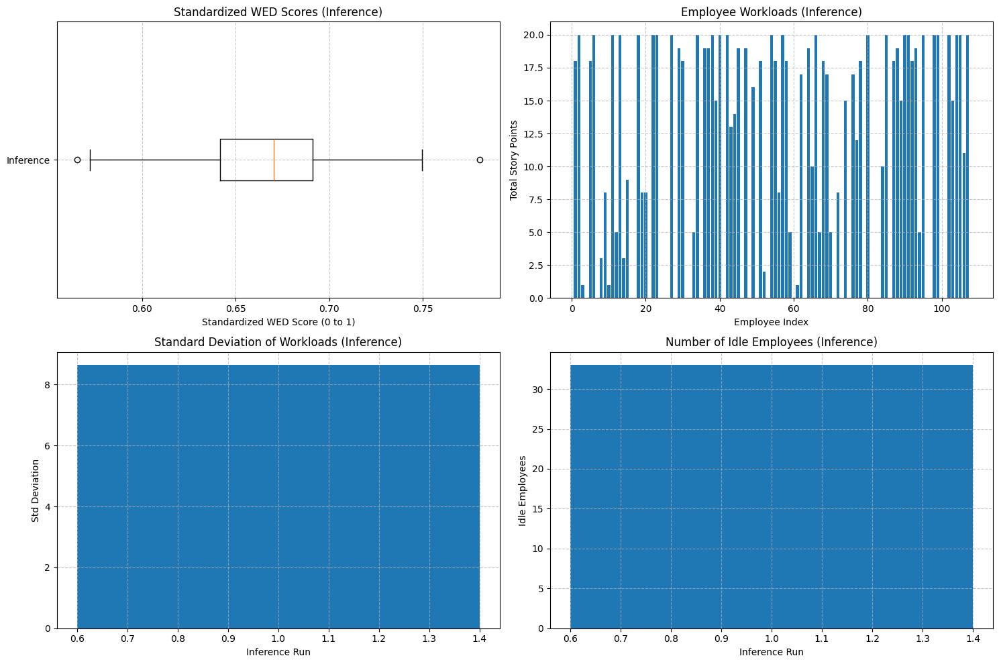


Inference Summary:
Total Reward: 136.69
Standard Deviation of Workloads: 8.64
Number of Idle Employees: 33
Standardized WED Scores - Mean: 0.6657, Std: 0.0375
Visualizations saved to '/content/drive/MyDrive/Skripsi/inference_visualizations_plain_dqn.png'


In [ ]:
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import gym
from gym import spaces
import random
from collections import deque
import matplotlib.pyplot as plt
import seaborn as sns
import time

# Set device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Global Variables
NUM_EMPLOYEES = 109
NUM_TASKS = 300
LEARNING_RATE = 5e-5
INITIAL_TEMPERATURE = 1.0
MIN_TEMPERATURE = 0.1
GAMMA = 0.99
MEMORY_SIZE = 50000
BATCH_SIZE = 64
TARGET_UPDATE_FREQ = 100
DQN_HIDDEN_DIM = 128
MAX_WORKLOAD = 20
WEIGHT_SIMILARITY = 0
WEIGHT_WORKLOAD = 0
WEIGHT_IDLE = 1
ALPHA_WED = 0.5
MAX_STEPS_PER_EPISODE = NUM_TASKS

# File paths
task_data_path = '/content/drive/MyDrive/Skripsi/Resources/Datasets/fixed_data_task.csv'
employee_data_path = '/content/drive/MyDrive/Skripsi/Resources/Datasets/fixed_data_employee.csv'
model_save_path = '/content/drive/MyDrive/Skripsi/plain_dqn_model_no_gnn.pth'
agent_save_path = '/content/drive/MyDrive/Skripsi/plain_dqn_agent_params_no_gnn.pth'

# Load and preprocess data
try:
    task_data = pd.read_csv(task_data_path)
    employee_data = pd.read_csv(employee_data_path)
except FileNotFoundError as e:
    print(f"Error: Dataset not found at {task_data_path} or {employee_data_path}. Please check the file paths.")
    raise e

task_subset = task_data.iloc[:NUM_TASKS]
employee_subset = employee_data.iloc[:NUM_EMPLOYEES]
skill_columns = [col for col in task_data.columns if col not in ['task_id', 'story_points', 'project_id']]

# Convert project_id to integer mapping
project_id_map = {pid: idx + 1 for idx, pid in enumerate(task_subset['project_id'].unique())}
project_ids = task_subset['project_id'].map(project_id_map).values

# Convert skill columns and story points to float32
task_skills_df = task_subset[skill_columns].fillna(0).astype(np.float32)
employee_skills_df = employee_subset[skill_columns].fillna(0).astype(np.float32)
story_points_df = task_subset['story_points'].astype(np.float32)

# Convert to tensors
task_skills = torch.tensor(task_skills_df.values / 5.0, dtype=torch.float32, device=device)
employee_skills = torch.tensor(employee_skills_df.values / 5.0, dtype=torch.float32, device=device)
story_points = torch.tensor(story_points_df.values, dtype=torch.float32, device=device)
project_ids_tensor = torch.tensor(project_ids, dtype=torch.long, device=device)

# Precompute state matrix
alpha = ALPHA_WED
task_skills_expanded = task_skills.unsqueeze(1)
employee_skills_expanded = employee_skills.unsqueeze(0)
diff = employee_skills_expanded - task_skills_expanded
weights = 1 / (1 + alpha * torch.maximum(diff, torch.tensor(0.0, device=device)))
mask = task_skills > 0
mask_expanded = mask.unsqueeze(1)
weighted_diff = weights * mask_expanded * (employee_skills_expanded - task_skills_expanded) ** 2
wed = torch.sqrt(torch.sum(weighted_diff, dim=2))
num_skills_per_task = torch.sum(mask, dim=1)
weights_worst = 1 / (1 + alpha * 1)
wed_worst = torch.sqrt(num_skills_per_task * weights_worst * (1.0 ** 2))
wed_worst = torch.where(num_skills_per_task > 0, wed_worst, torch.tensor(1.0, device=device))
similarity = 1 - (wed / wed_worst.unsqueeze(1))
state_matrix = similarity.unsqueeze(-1)

class TaskAssignmentEnv(gym.Env):
    def __init__(self, task_skills, employee_skills, story_points, project_ids, num_tasks=None, num_employees=None):
        super(TaskAssignmentEnv, self).__init__()
        self.task_skills = task_skills
        self.employee_skills = employee_skills
        self.story_points = torch.tensor(story_points, dtype=torch.float32).to(device)
        self.project_ids = torch.tensor(project_ids, dtype=torch.long).to(device)
        self.max_workload = MAX_WORKLOAD
        self.num_tasks = num_tasks if num_tasks is not None else len(task_skills)
        self.num_employees = num_employees if num_employees is not None else len(employee_skills)
        self.num_skills = task_skills.shape[1]

        self.task_skills = self.task_skills[:self.num_tasks]
        self.employee_skills = self.employee_skills[:self.num_employees]
        self.story_points = self.story_points[:self.num_tasks]
        self.project_ids = self.project_ids[:self.num_tasks]

        self.observation_space = spaces.Dict({
            'state_matrix': spaces.Box(low=0, high=1, shape=(self.num_tasks, self.num_employees, 1), dtype=np.float32),
            'global_features': spaces.Box(low=0, high=1, shape=(3,), dtype=np.float32),
            'task_mask': spaces.Box(low=0, high=1, shape=(self.num_tasks,), dtype=np.float32)
        })
        self.action_space = spaces.MultiDiscrete([self.num_tasks, self.num_employees])
        self.total_story_points = torch.sum(self.story_points).item()
        workloads = torch.zeros(self.num_employees, device=device)
        workloads[0] = self.max_workload
        mean_workload = self.max_workload / self.num_employees
        self.actual_max_std = torch.sqrt(torch.sum((workloads - mean_workload) ** 2) / self.num_employees).item()
        self.max_possible_cv = (self.actual_max_std / mean_workload) if mean_workload > 0 else 1.0
        self.state_matrix = state_matrix
        self.reset()

    def reset(self):
        self.workloads = torch.zeros(self.num_employees, device=device)
        self.assignments = torch.full((self.num_tasks,), -1, dtype=torch.long, device=device)
        self.remaining_tasks = torch.arange(self.num_tasks, device=device)
        self.wed_scores = []
        self.similarity_scores = []
        self.total_assigned_story_points = 0
        self.employee_projects = torch.full((self.num_employees,), -1, dtype=torch.long, device=device)
        return self._get_obs()

    def _get_obs(self):
        prop_remaining = len(self.remaining_tasks) / self.num_tasks
        num_idle = torch.sum(self.workloads == 0).item()
        prop_idle = num_idle / self.num_employees
        mean_workload = torch.mean(self.workloads).item() if torch.sum(self.workloads) > 0 else 1e-6
        std_workload = torch.std(self.workloads).item()
        cv = std_workload / mean_workload if mean_workload > 0 else 0
        cv_normalized = cv / self.max_possible_cv

        global_features = torch.tensor([prop_remaining, prop_idle, cv_normalized], dtype=torch.float32, device=device)

        task_mask = torch.zeros(self.num_tasks, dtype=torch.float32, device=device)
        task_mask[self.remaining_tasks] = 1

        return {
            'state_matrix': self.state_matrix,
            'global_features': global_features,
            'task_mask': task_mask
        }

    def _compute_wed(self, task_idx, emp_idx):
        task_skills_t = self.task_skills[task_idx]
        emp_skills_e = self.employee_skills[emp_idx]
        diff = emp_skills_e - task_skills_t
        weights = 1 / (1 + ALPHA_WED * torch.maximum(diff, torch.tensor(0.0, device=device)))
        mask = task_skills_t > 0
        weighted_diff = weights[mask] * (emp_skills_e[mask] - task_skills_t[mask]) ** 2
        wed = torch.sqrt(torch.sum(weighted_diff))
        return wed.item()

    def step(self, action):
        task_idx, emp_idx = action
        done = False
        reward = 0
        info = {}

        task_project = self.project_ids[task_idx]
        emp_project = self.employee_projects[emp_idx]
        if emp_project != -1 and emp_project != task_project:
            reward = -1.0
            info['invalid_action'] = 'Employee assigned to a different project'
            return self._get_obs(), reward, done, info

        current_workload = self.workloads[emp_idx]
        if current_workload + self.story_points[task_idx] > self.max_workload:
            reward = -1.0
            info['invalid_action'] = 'Workload exceeds maximum'
            return self._get_obs(), reward, done, info

        self.assignments[task_idx] = emp_idx
        self.workloads[emp_idx] += self.story_points[task_idx]
        self.total_assigned_story_points += self.story_points[task_idx].item()
        self.remaining_tasks = self.remaining_tasks[self.remaining_tasks != task_idx]

        if self.employee_projects[emp_idx] == -1:
            self.employee_projects[emp_idx] = task_project

        wed = self._compute_wed(task_idx, emp_idx)
        self.wed_scores.append(wed)
        similarity = self.state_matrix[task_idx, emp_idx, 0].item()
        self.similarity_scores.append(similarity)

        mean_workload = torch.mean(self.workloads).item() if torch.sum(self.workloads) > 0 else 1e-6
        std_workload = torch.std(self.workloads).item()
        cv = std_workload / mean_workload if mean_workload > 0 else 0
        workload_balance_reward = 1 - (cv / self.max_possible_cv)

        num_idle = torch.sum(self.workloads == 0).item()
        idle_reward = 1 - (num_idle / self.num_employees)

        reward = (WEIGHT_SIMILARITY * similarity) + (WEIGHT_WORKLOAD * workload_balance_reward) + (WEIGHT_IDLE * idle_reward)

        info['similarity_reward'] = similarity
        info['workload_balance_reward'] = workload_balance_reward
        info['idle_reward'] = idle_reward
        info['wed'] = wed

        if len(self.remaining_tasks) == 0:
            done = True
            info['total_wed'] = np.sum(self.wed_scores)

        return self._get_obs(), reward, done, info

class DQN(nn.Module):
    def __init__(self, input_dim, output_dim, num_employees):
        super(DQN, self).__init__()
        self.num_employees = num_employees
        self.fc1 = nn.Linear(input_dim, DQN_HIDDEN_DIM).to(device, dtype=torch.float32)
        self.fc2 = nn.Linear(DQN_HIDDEN_DIM, DQN_HIDDEN_DIM // 2).to(device, dtype=torch.float32)
        self.fc3 = nn.Linear(DQN_HIDDEN_DIM // 2, output_dim).to(device, dtype=torch.float32)

    def forward(self, state_matrix, global_features):
        if state_matrix.dim() == 3:
            batch_size = state_matrix.size(0)
            state_input = state_matrix.squeeze(-1).unsqueeze(-1)
            global_features = global_features.unsqueeze(1).expand(-1, self.num_employees, -1)
            x = torch.cat([state_input, global_features], dim=-1)
            x = F.relu(self.fc1(x))
            x = F.relu(self.fc2(x))
            q_values = self.fc3(x).squeeze(-1)
        else:
            state_input = state_matrix.squeeze(-1).unsqueeze(-1)
            global_features = global_features.expand(self.num_employees, -1)
            x = torch.cat([state_input, global_features], dim=-1)
            x = F.relu(self.fc1(x))
            x = F.relu(self.fc2(x))
            q_values = self.fc3(x).squeeze(-1)
        return q_values

class DQNAgent:
    def __init__(self, num_tasks, num_employees):
        self.device = device
        self.num_tasks = num_tasks
        self.num_employees = num_employees
        self.input_dim = 1 + 3
        self.output_dim = 1
        self.model = DQN(self.input_dim, self.output_dim, self.num_employees).to(self.device)
        self.target_model = DQN(self.input_dim, self.output_dim, self.num_employees).to(self.device)
        self.target_model.load_state_dict(self.model.state_dict())
        self.optimizer = torch.optim.Adam(self.model.parameters(), lr=LEARNING_RATE)
        self.memory = deque(maxlen=MEMORY_SIZE)
        self.batch_size = BATCH_SIZE
        self.temperature = INITIAL_TEMPERATURE
        self.min_temperature = MIN_TEMPERATURE
        self.gamma = GAMMA
        self.global_step = 0

    def act(self, obs, env):
        start_time = time.time()
        state_matrix = obs['state_matrix'].to(device)
        global_features = obs['global_features'].to(device)
        task_mask = obs['task_mask'].to(device)

        # Get valid tasks
        valid_tasks = torch.where(task_mask == 1)[0]
        if valid_tasks.size(0) == 0:
            print("Warning: No valid tasks available")
            return [0, 0]
        valid_tasks = valid_tasks.to(device)
        validation_start = time.time()

        # Vectorized action validation
        task_projects = env.project_ids[valid_tasks]
        story_points = env.story_points[valid_tasks]
        workload_feasible = (env.workloads.unsqueeze(0) + story_points.unsqueeze(1)) <= env.max_workload
        project_feasible = (env.employee_projects.unsqueeze(0) == -1) | (env.employee_projects.unsqueeze(0) == task_projects.unsqueeze(1))
        valid_mask = workload_feasible & project_feasible  # Shape: (num_valid_tasks, num_employees)
        valid_actions = torch.nonzero(valid_mask, as_tuple=False)  # Shape: (num_valid_actions, 2)
        validation_time = time.time() - validation_start

        if valid_actions.size(0) == 0:
            print("Warning: No valid task-employee pairs available")
            return [0, 0]

        # Batch Q-value computation for all valid tasks
        qvalue_start = time.time()
        with torch.no_grad():
            global_features_expanded = global_features.unsqueeze(0).expand(valid_tasks.size(0), -1)
            valid_state_matrix = state_matrix[valid_tasks]
            q_values = self.model(valid_state_matrix, global_features_expanded)  # Shape: (num_valid_tasks, num_employees)
            # Map Q-values to valid actions only
            valid_q_values = q_values[valid_actions[:, 0], valid_actions[:, 1]]  # Shape: (num_valid_actions,)
            if valid_q_values.size(0) == 0 or torch.all(valid_q_values == float('-inf')):
                print("Warning: No valid Q-values, selecting random valid action")
                idx = random.randint(0, valid_actions.size(0) - 1)
                task_idx = valid_actions[idx, 0]
                emp_idx = valid_actions[idx, 1]
                task_global_idx = valid_tasks[task_idx].item()
                emp_idx = emp_idx.item()
            else:
                valid_idx = torch.argmax(valid_q_values)  # Index in valid_q_values
                task_idx = valid_actions[valid_idx, 0]
                emp_idx = valid_actions[valid_idx, 1]
                task_global_idx = valid_tasks[task_idx].item()
                emp_idx = emp_idx.item()

            # Verify action validity
            task_project = env.project_ids[task_global_idx]
            emp_project = env.employee_projects[emp_idx]
            workload_ok = env.workloads[emp_idx] + env.story_points[task_global_idx] <= env.max_workload
            project_ok = (emp_project == -1) or (emp_project == task_project)
            if not (workload_ok and project_ok):
                print(f"Warning: Selected action [{task_global_idx}, {emp_idx}] is invalid. Workload OK: {workload_ok}, Project OK: {project_ok}")
                idx = random.randint(0, valid_actions.size(0) - 1)
                task_idx = valid_actions[idx, 0]
                emp_idx = valid_actions[idx, 1]
                task_global_idx = valid_tasks[task_idx].item()
                emp_idx = emp_idx.item()

        qvalue_time = time.time() - qvalue_start
        total_time = time.time() - start_time
        print(f"Action selection: Validation time: {validation_time:.2f}s, Q-value time: {qvalue_time:.2f}s, Total time: {total_time:.2f}s")
        print(f"Valid tasks: {valid_tasks.size(0)}, Valid actions: {valid_actions.size(0)}")
        return [task_global_idx, emp_idx]

    def load(self, model_path, agent_path):
        print("Warning: Using weights_only=False to load model and agent parameters. Ensure the files are from a trusted source to avoid security risks.")
        try:
            checkpoint = torch.load(model_path, map_location=device, weights_only=False)
            self.model.load_state_dict(checkpoint['model_state_dict'])
            self.target_model.load_state_dict(checkpoint['target_model_state_dict'])
            self.optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
            print(f"Model successfully loaded from {model_path}")
        except Exception as e:
            print(f"Error loading model from {model_path}: {e}")
            raise e
        try:
            agent_params = torch.load(agent_path, map_location=device, weights_only=False)
            self.temperature = agent_params['temperature']
            self.memory = deque(maxlen=MEMORY_SIZE)
            print(f"Agent parameters successfully loaded from {agent_path}")
        except Exception as e:
            print(f"Error loading agent parameters from {agent_path}: {e}")
            raise e

# Initialize environment and agent
env = TaskAssignmentEnv(task_skills, employee_skills, task_subset['story_points'].values, project_ids)
agent = DQNAgent(env.num_tasks, env.num_employees)

# Load the saved model and agent parameters
try:
    agent.load(model_save_path, agent_save_path)
except Exception as e:
    print(f"Model or agent loading failed: {e}")
    print("Possible causes:")
    print("- The model or agent file does not match the DQN architecture.")
    print("- The files are corrupted or from a different experiment.")
    print(f"Please check the files at {model_save_path} and {agent_save_path}.")
    raise e

# Run inference for one episode
obs = env.reset()
done = False
wed_scores = []
total_reward = 0
step = 0
start_time = time.time()

print("Starting inference...")
while not done:
    step += 1
    step_start = time.time()
    action = agent.act(obs, env)
    print(f"Step {step}: Action selected: {action}, Time: {time.time() - step_start:.2f}s")

    next_obs, reward, done, info = env.step(action)
    total_reward += reward
    if 'wed' in info:
        wed_scores.append(info['wed'])
    obs = next_obs
    print(f"Step {step}: Reward: {reward:.4f}, Remaining tasks: {len(env.remaining_tasks)}, Done: {done}, Step time: {time.time() - step_start:.2f}s")

    if step > MAX_STEPS_PER_EPISODE:
        print(f"Warning: Reached max steps ({MAX_STEPS_PER_EPISODE}). Forcing termination.")
        done = True
        break

total_time = time.time() - start_time
print(f"Inference completed in {total_time:.2f} seconds")

# Collect metrics
workloads = env.workloads.clone().cpu().numpy()
std_workload = torch.std(env.workloads).item()
num_idle = torch.sum(env.workloads == 0).item()

# Standardize WED scores (following reference code)
weights_worst = 1 / (1 + ALPHA_WED * 1)
wed_raw_worst = np.sqrt(np.sum(weights_worst * (0 - 1) ** 2) * env.num_skills)
wed_raw_best = 0
standardized_wed = [(wed_raw_worst - wed) / (wed_raw_worst - wed_raw_best) for wed in wed_scores] if wed_scores else [0]

# Visualizations
plt.figure(figsize=(15, 10))

# Plot 1: Boxplot of Standardized WED Scores (Horizontal)
plt.subplot(2, 2, 1)
plt.boxplot(standardized_wed, vert=False, labels=['Inference'])
plt.title('Standardized WED Scores (Inference)')
plt.xlabel('Standardized WED Score (0 to 1)')
plt.grid(True, linestyle='--', alpha=0.7)
plt.tick_params(axis='x', labelsize=10)

# Plot 2: Bar Chart of Employee Workloads
plt.subplot(2, 2, 2)
plt.bar(range(env.num_employees), workloads)
plt.title('Employee Workloads (Inference)')
plt.xlabel('Employee Index')
plt.ylabel('Total Story Points')
plt.grid(True, linestyle='--', alpha=0.7)

# Plot 3: Bar Chart of Standard Deviation of Workloads
plt.subplot(2, 2, 3)
plt.bar([1], [std_workload])
plt.title('Standard Deviation of Workloads (Inference)')
plt.xlabel('Inference Run')
plt.ylabel('Std Deviation')
plt.grid(True, linestyle='--', alpha=0.7)

# Plot 4: Bar Chart of Idle Employees
plt.subplot(2, 2, 4)
plt.bar([1], [num_idle])
plt.title('Number of Idle Employees (Inference)')
plt.xlabel('Inference Run')
plt.ylabel('Idle Employees')
plt.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout()
plt.savefig('/content/drive/MyDrive/Skripsi/inference_visualizations_plain_dqn.png')
plt.show()

# Print summary
print(f"\nInference Summary:")
print(f"Total Reward: {total_reward:.2f}")
print(f"Standard Deviation of Workloads: {std_workload:.2f}")
print(f"Number of Idle Employees: {num_idle}")
print(f"Standardized WED Scores - Mean: {np.mean(standardized_wed):.4f}, Std: {np.std(standardized_wed):.4f}")
print(f"Visualizations saved to '/content/drive/MyDrive/Skripsi/inference_visualizations_plain_dqn.png'")

## DQN Double Run

In [ ]:
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import gym
from gym import spaces
import random
from collections import deque
import time
import matplotlib
matplotlib.use('Agg')  # Use non-interactive backend for Colab
import matplotlib.pyplot as plt
import seaborn as sns

# Set device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# GPU-specific configurations
GPU_CONFIGS = {
    'A100': {'ROLLOUT_STEPS': 16384, 'BATCH_SIZE': 64, 'CLIP_GRADS': False},
    'V100': {'ROLLOUT_STEPS': 8192, 'BATCH_SIZE': 256, 'CLIP_GRADS': True},
    'T4': {'ROLLOUT_STEPS': 4096, 'BATCH_SIZE': 64, 'CLIP_GRADS': True},
    'default': {'ROLLOUT_STEPS': 4096, 'BATCH_SIZE': 128, 'CLIP_GRADS': True}
}
gpu_name = torch.cuda.get_device_name(0) if torch.cuda.is_available() else 'default'
gpu_type = 'A100' if 'A100' in gpu_name else 'V100' if 'V100' in gpu_name else 'T4' if 'T4' in gpu_name else 'default'
ROLLOUT_STEPS = GPU_CONFIGS[gpu_type]['ROLLOUT_STEPS']
CLIP_GRADS = GPU_CONFIGS[gpu_type]['CLIP_GRADS']
BATCH_SIZE = GPU_CONFIGS[gpu_type]['BATCH_SIZE']
print(f"Detected GPU: {gpu_name}, ROLLOUT_STEPS: {ROLLOUT_STEPS}, CLIP_GRADS: {CLIP_GRADS}, BATCH_SIZE: {BATCH_SIZE}")

# Global Variables
MAX_EMPLOYEES = 150
MAX_TASKS = 500
NUM_EMPLOYEES = 109
NUM_TASKS = 300
NUM_EPISODES = 1000  # Set to 2 for testing
GAMMA = 0.99
MAX_WORKLOAD = 20
ALPHA_WED = 0.5
NUM_INFERENCE_RUNS = 10
LEARNING_RATE = 3e-04
EPSILON_START = 1.0
EPSILON_END = 0.05
EPSILON_DECAY = 0.995
MEMORY_SIZE = 10000
TARGET_UPDATE = 1000

# Phase-specific reward weights
PHASE_1_WEIGHTS = {'similarity': 0.7, 'workload': 0.2, 'idle': 0.1}
PHASE_2_WEIGHTS = {'similarity': 0.3, 'workload': 0.5, 'idle': 0.2}

SAVE_EPISODES = [100,300,500]  # Added 1 and 2 for testing
MAX_STEPS_PER_EPISODE = NUM_TASKS * 2  # 600 steps (300 tasks, 2 passes)

task_data_path = '/content/drive/MyDrive/Skripsi/Resources/Datasets/fixed_data_task.csv'
employee_data_path = '/content/drive/MyDrive/Skripsi/Resources/Datasets/fixed_data_employee.csv'
model_save_path = '/content/drive/MyDrive/Skripsi/doublerun_dqn_model.pth'
agent_save_path = '/content/drive/MyDrive/Skripsi/doublerun_dqn_agent_params_final.pth'

# Load data
task_data = pd.read_csv(task_data_path)
employee_data = pd.read_csv(employee_data_path)
task_subset = task_data.iloc[:NUM_TASKS]
employee_subset = employee_data.iloc[:NUM_EMPLOYEES]
skill_columns = [col for col in task_data.columns if col not in ['task_id', 'story_points', 'project_id']]

project_id_map = {pid: idx + 1 for idx, pid in enumerate(task_data['project_id'].unique())}
project_ids = task_subset['project_id'].map(project_id_map).values

task_skills_df = task_subset[skill_columns].fillna(0).astype(np.float32)
employee_skills_df = employee_subset[skill_columns].fillna(0).astype(np.float32)
story_points_df = task_subset['story_points'].astype(np.float32)

# Pad task data to MAX_TASKS
task_skills_full = np.zeros((MAX_TASKS, len(skill_columns)), dtype=np.float32)
task_skills_full[:NUM_TASKS] = task_skills_df.values / 5.0
dtype = torch.float32 if device.type == 'cpu' else (torch.bfloat16 if torch.cuda.is_bf16_supported() else torch.float16)
task_skills = torch.tensor(task_skills_full, dtype=dtype, device=device)

story_points_full = np.zeros((MAX_TASKS,), dtype=np.float32)
story_points_full[:NUM_TASKS] = story_points_df.values
story_points = torch.tensor(story_points_full, dtype=dtype, device=device)

project_ids_full = np.zeros((MAX_TASKS,), dtype=np.int64)
project_ids_full[:NUM_TASKS] = project_ids
project_ids_tensor = torch.tensor(project_ids_full, dtype=torch.long, device=device)

# Pad employee data to MAX_EMPLOYEES
employee_skills_full = np.zeros((MAX_EMPLOYEES, len(skill_columns)), dtype=np.float32)
employee_skills_full[:NUM_EMPLOYEES] = employee_skills_df.values / 5.0
employee_skills = torch.tensor(employee_skills_full, dtype=dtype, device=device)

# Masks for valid tasks and employees
task_mask = torch.zeros(MAX_TASKS, dtype=torch.bool, device=device)
task_mask[:NUM_TASKS] = 1
employee_mask = torch.zeros(MAX_EMPLOYEES, dtype=torch.bool, device=device)
employee_mask[:NUM_EMPLOYEES] = 1

class TaskAssignmentEnv(gym.Env):
    def __init__(self, num_tasks=NUM_TASKS, num_employees=NUM_EMPLOYEES):
        super(TaskAssignmentEnv, self).__init__()
        self.max_tasks = MAX_TASKS
        self.max_employees = MAX_EMPLOYEES
        self.num_tasks = min(num_tasks, MAX_TASKS)
        self.num_employees = min(num_employees, MAX_EMPLOYEES)
        self.max_workload = MAX_WORKLOAD
        self.story_points = story_points
        self.project_ids = project_ids_tensor
        self.task_skills = task_skills
        self.employee_skills = employee_skills
        self.task_mask = task_mask
        self.employee_mask = employee_mask
        self.total_story_points = torch.sum(self.story_points[:self.num_tasks]).item()
        self.num_skills = task_skills.shape[1]
        self.ideal_workload = self.total_story_points / self.num_employees if self.num_employees > 0 else 0

        self.similarity_matrix = self._compute_similarity_matrix()

        # Simplified observation space
        self.observation_space = spaces.Dict({
            'current_task_skills': spaces.Box(low=0, high=1, shape=(self.num_skills,), dtype=np.float32),
            'employee_workloads': spaces.Box(low=0, high=self.max_workload * 2, shape=(self.max_employees,), dtype=np.float32),
            'employee_idle': spaces.Box(low=0, high=1, shape=(self.max_employees,), dtype=np.float32),
            'employee_skills_summary': spaces.Box(low=0, high=1, shape=(self.max_employees,), dtype=np.float32),
            'phase': spaces.Box(low=0, high=1, shape=(1,), dtype=np.float32)
        })

        self.action_space = spaces.Discrete(self.max_employees)
        self.current_step = 0
        self.reset()

    def _compute_similarity_matrix(self):
        task_skills_expanded = self.task_skills.unsqueeze(1).expand(-1, self.max_employees, -1)
        emp_skills_expanded = self.employee_skills.unsqueeze(0).expand(self.max_tasks, -1, -1)
        diff = emp_skills_expanded - task_skills_expanded
        weights = 1 / (1 + ALPHA_WED * torch.maximum(diff, torch.tensor(0.0, device=device, dtype=dtype)))
        mask = self.task_skills.unsqueeze(1).expand(-1, self.max_employees, -1) > 0
        weighted_diff = weights * mask * (emp_skills_expanded - task_skills_expanded) ** 2
        wed = torch.sqrt(torch.sum(weighted_diff, dim=2))
        num_skills_per_task = torch.sum(self.task_skills > 0, dim=1).unsqueeze(1).expand(-1, self.max_employees)
        wed_worst = torch.sqrt(num_skills_per_task * (1.0 ** 2))
        wed_worst = torch.where(num_skills_per_task > 0, wed_worst, torch.tensor(1.0, device=device, dtype=dtype))
        similarity = 1 - (wed / wed_worst)
        return similarity

    def flatten_state(self, obs):
        current_task_skills = obs['current_task_skills'].float()
        employee_workloads = obs['employee_workloads'].float()
        employee_idle = obs['employee_idle'].float()
        employee_skills_summary = obs['employee_skills_summary'].float()
        phase = obs['phase'].float()
        state = torch.cat([current_task_skills, employee_workloads, employee_idle, employee_skills_summary, phase])
        return state

    def reset(self):
        self.current_step = 0
        self.workloads = torch.zeros(self.max_employees, device=device, dtype=dtype)
        self.assignments = torch.full((self.max_tasks,), -1, dtype=torch.long, device=device)
        self.employee_projects = torch.full((self.max_employees,), -1, dtype=torch.long, device=device)
        self.wed_scores = []
        return self._get_obs()

    def _get_obs(self):
        task_idx = self.current_step % self.num_tasks
        current_task_skills = self.task_skills[task_idx]
        employee_workloads = self.workloads
        employee_idle = (self.workloads == 0).float()
        employee_skills_summary = self.similarity_matrix[task_idx]
        phase = 0.0 if self.current_step < self.num_tasks else 1.0

        obs = {
            'current_task_skills': current_task_skills,
            'employee_workloads': employee_workloads,
            'employee_idle': employee_idle,
            'employee_skills_summary': employee_skills_summary,
            'phase': torch.tensor([phase], device=device, dtype=dtype)
        }
        return obs

    def step(self, action):
        emp_idx = action
        task_idx = self.current_step % self.num_tasks
        done = False
        reward = {'similarity': 0.0, 'workload': 0.0, 'idle': 0.0}
        info = {'last_wed': 0.0}

        phase = 0 if self.current_step < self.num_tasks else 1
        weights = PHASE_1_WEIGHTS if phase == 0 else PHASE_2_WEIGHTS

        if not self.employee_mask[emp_idx]:
            reward['similarity'] = -0.1 * weights['similarity']
            info['invalid_action'] = 'Invalid employee'
            info['reward_similarity'] = reward['similarity']
            info['reward_workload'] = reward['workload']
            info['reward_idle'] = reward['idle']
            self.current_step += 1
            if self.current_step >= MAX_STEPS_PER_EPISODE:
                done = True
                obs = self._get_obs()
                return obs, sum(reward.values()), done, info
            return self._get_obs(), sum(reward.values()), done, info

        task_skills_t = self.task_skills[task_idx]
        emp_skills_e = self.employee_skills[emp_idx]
        diff = emp_skills_e - task_skills_t
        weights_wed = 1 / (1 + ALPHA_WED * torch.maximum(diff, torch.tensor(0.0, device=device, dtype=dtype)))
        mask = task_skills_t > 0
        weighted_diff = weights_wed[mask] * (emp_skills_e[mask] - task_skills_t[mask]) ** 2
        wed = torch.sqrt(torch.sum(weighted_diff))
        num_skills = torch.sum(mask.float())
        wed_worst = torch.sqrt(num_skills * (1.0 ** 2)) if num_skills > 0 else 1.0
        standardized_wed = wed / wed_worst if wed_worst > 0 else 0.0
        self.wed_scores.append(standardized_wed.item())
        similarity = 1 - standardized_wed if wed_worst > 0 else 0.0
        info['last_wed'] = standardized_wed.item()
        info['reward_similarity'] = reward['similarity']
        info['reward_workload'] = reward['workload']
        info['reward_idle'] = reward['idle']

        task_project = self.project_ids[task_idx]
        emp_project = self.employee_projects[emp_idx]
        current_workload = self.workloads[emp_idx]
        is_valid_action = True

        if emp_project != -1 and emp_project != task_project:
            reward['similarity'] = -0.05 * weights['similarity']
            info['invalid_action'] = 'Different project'
            is_valid_action = False

        if current_workload + self.story_points[task_idx] > self.max_workload:
            excess = (current_workload + self.story_points[task_idx] - self.max_workload) / self.max_workload
            reward['similarity'] = -0.05 * excess * weights['similarity']
            info['invalid_action'] = 'Exceeds workload'
            is_valid_action = False

        prev_workloads = self.workloads.clone()

        # Remove previous assignment's workload if in Phase 2
        if phase == 1 and self.assignments[task_idx] != -1:
            prev_emp_idx = self.assignments[task_idx]
            self.workloads[prev_emp_idx] -= self.story_points[task_idx]

        self.assignments[task_idx] = emp_idx
        self.workloads[emp_idx] += self.story_points[task_idx]
        if self.employee_projects[emp_idx] == -1:
            self.employee_projects[emp_idx] = task_project

        if is_valid_action:
            reward['similarity'] = similarity.item() * weights['similarity']
            if similarity > 0.8:
                reward['similarity'] += 0.1 * weights['similarity']

            new_workload = self.workloads[emp_idx]
            if new_workload >= self.max_workload:
                reward['similarity'] -= 0.05 * weights['similarity']
            if self.employee_projects[emp_idx] == task_project and (self.current_step % self.num_tasks) < self.num_tasks - 1:
                future_tasks = self.project_ids[(self.current_step % self.num_tasks) + 1:self.num_tasks]
                if torch.any(future_tasks != task_project):
                    reward['similarity'] -= 0.02 * weights['similarity']

            prev_std = torch.std(prev_workloads[:self.num_employees].float()).item()
            curr_std = torch.std(self.workloads[:self.num_employees].float()).item()
            std_change = prev_std - curr_std
            workload_base = (std_change / self.max_workload) * 10
            workload_base = max(-1, min(1, workload_base))
            reward['workload'] = workload_base * weights['workload']

            prev_idle = torch.sum(prev_workloads[:self.num_employees] == 0).item()
            curr_idle = torch.sum(self.workloads[:self.num_employees] == 0).item()
            idle_change = prev_idle - curr_idle
            idle_base = (idle_change / self.num_employees) * 20
            idle_base = max(-1, min(1, idle_base))
            reward['idle'] = idle_base * weights['idle']

        self.current_step += 1
        if self.current_step >= MAX_STEPS_PER_EPISODE:
            done = True
            avg_wed = np.mean(self.wed_scores) if self.wed_scores else 0.0
            wed_worst = np.sqrt(self.num_skills * (1.0 ** 2))
            avg_similarity = 1 - avg_wed if wed_worst > 0 else 0.0
            if avg_similarity > 0.7:
                reward['similarity'] += 0.2 * weights['similarity']
            std_workload = torch.std(self.workloads[:self.num_employees].float()).item()
            if std_workload < 5:
                reward['workload'] += 0.2 * weights['workload']
            final_idle = torch.sum(self.workloads[:self.num_employees] == 0).item()
            if final_idle < self.num_employees * 0.1:
                reward['idle'] += 0.2 * weights['idle']
            info['reward_similarity'] = reward['similarity']
            info['reward_workload'] = reward['workload']
            info['reward_idle'] = reward['idle']

        return self._get_obs(), sum(reward.values()), done, info

class DQN(nn.Module):
    def __init__(self, state_dim, action_dim, hidden_dim=256):
        super(DQN, self).__init__()
        self.network = nn.Sequential(
            nn.Linear(state_dim, hidden_dim),
            nn.ReLU(),
            nn.Linear(hidden_dim, hidden_dim // 2),
            nn.ReLU(),
            nn.Linear(hidden_dim // 2, action_dim)
        ).to(device, dtype=torch.float32)

    def forward(self, state):
        return self.network(state)

class DQNAgent:
    def __init__(self, state_dim, action_dim):
        self.device = device
        self.policy_net = DQN(state_dim, action_dim).to(device)
        self.target_net = DQN(state_dim, action_dim).to(device)
        self.target_net.load_state_dict(self.policy_net.state_dict())
        self.optimizer = torch.optim.Adam(self.policy_net.parameters(), lr=LEARNING_RATE)
        self.memory = deque(maxlen=MEMORY_SIZE)
        self.epsilon = EPSILON_START
        self.epsilon_end = EPSILON_END
        self.epsilon_decay = EPSILON_DECAY
        self.step_count = 0

    def act(self, obs, env):
        state = env.flatten_state(obs).to(device, dtype=torch.float32)
        if random.random() < self.epsilon:
            valid_actions = [i for i in range(env.action_space.n) if env.employee_mask[i]]
            return random.choice(valid_actions) if valid_actions else 0, None
        with torch.no_grad():
            q_values = self.policy_net(state)
            q_values = q_values * env.employee_mask.float()
            action = q_values.argmax().item()
        return action, q_values

    def remember(self, state, action, reward, next_state, done):
        self.memory.append((state, action, reward, next_state, done))

    def update(self):
        if len(self.memory) < BATCH_SIZE:
            return
        batch = random.sample(self.memory, BATCH_SIZE)
        states, actions, rewards, next_states, dones = zip(*batch)

        states = torch.stack(states).to(device)
        actions = torch.tensor(actions, dtype=torch.long, device=device)
        rewards = torch.tensor(rewards, dtype=torch.float32, device=device)
        next_states = torch.stack(next_states).to(device)
        dones = torch.tensor(dones, dtype=torch.float32, device=device)

        q_values = self.policy_net(states).gather(1, actions.unsqueeze(1)).squeeze(1)
        next_q_values = self.target_net(next_states).max(1)[0].detach()
        targets = rewards + GAMMA * next_q_values * (1 - dones)

        loss = F.mse_loss(q_values, targets)
        self.optimizer.zero_grad()
        loss.backward()
        if CLIP_GRADS:
            torch.nn.utils.clip_grad_norm_(self.policy_net.parameters(), max_norm=1.0)
        self.optimizer.step()

        self.step_count += 1
        if self.step_count % TARGET_UPDATE == 0:
            self.target_net.load_state_dict(self.policy_net.state_dict())

        self.epsilon = max(self.epsilon_end, self.epsilon * self.epsilon_decay)

    def save(self, model_path, agent_path):
        torch.save(self.policy_net.state_dict(), model_path)
        torch.save({'epsilon': self.epsilon}, agent_path)
        print(f"Model saved to {model_path}, Agent params to {agent_path}")

    def load(self, model_path, agent_path):
        self.policy_net.load_state_dict(torch.load(model_path))
        checkpoint = torch.load(agent_path)
        self.epsilon = checkpoint['epsilon']
        print(f"Model loaded from {model_path}")

# In the train_dqn function, modify the training loop to remove step-by-step logging
# and only keep episode-level logs

def train_dqn(num_tasks=NUM_TASKS, num_employees=NUM_EMPLOYEES):
    env = TaskAssignmentEnv(num_tasks=num_tasks, num_employees=num_employees)

    dummy_obs = env.reset()
    state_dim = len(env.flatten_state(dummy_obs))
    action_dim = env.action_space.n
    agent = DQNAgent(state_dim, action_dim)

    total_rewards = []
    similarity_rewards = []
    workload_balance_rewards = []
    idle_rewards = []
    episode_data = []
    global_step = 0

    for episode in range(NUM_EPISODES):
        obs = env.reset()
        total_reward = 0.0
        episode_similarity = 0.0
        episode_workload_balance = 0.0
        episode_idle = 0.0
        done = False
        step = 0

        while not done:
            step += 1
            global_step += 1

            state = env.flatten_state(obs)
            action, _ = agent.act(obs, env)
            next_obs, reward, done, info = env.step(action)
            next_state = env.flatten_state(next_obs)

            agent.remember(state, action, reward, next_state, done)

            # Extract individual rewards from info
            reward_similarity = info.get('reward_similarity', 0.0)
            reward_workload = info.get('reward_workload', 0.0)
            reward_idle = info.get('reward_idle', 0.0)

            # Convert tensors to Python floats if needed
            if isinstance(reward, torch.Tensor):
                reward = reward.item()
            if isinstance(reward_similarity, torch.Tensor):
                reward_similarity = reward_similarity.item()
            if isinstance(reward_workload, torch.Tensor):
                reward_workload = reward_workload.item()
            if isinstance(reward_idle, torch.Tensor):
                reward_idle = reward_idle.item()

            total_reward += reward
            episode_similarity += reward_similarity
            episode_workload_balance += reward_workload
            episode_idle += reward_idle

            obs = next_obs

            if global_step % ROLLOUT_STEPS == 0:
                agent.update()

        # Only collect episode-level data
        avg_wed = np.mean(env.wed_scores) if env.wed_scores else 0.0
        workloads_cpu = env.workloads[:env.num_employees].float().cpu()
        std_workloads = torch.std(workloads_cpu).item()
        num_idle = torch.sum(workloads_cpu == 0).item()

        total_rewards.append(float(total_reward))
        avg_similarity = float(episode_similarity / step if step > 0 else 0.0)
        avg_workload_balance = float(episode_workload_balance / step if step > 0 else 0.0)
        avg_idle = float(episode_idle / step if step > 0 else 0.0)
        similarity_rewards.append(avg_similarity)
        workload_balance_rewards.append(avg_workload_balance)
        idle_rewards.append(avg_idle)

        episode_data.append({
            'Episode': episode + 1,
            'Total Reward': total_reward,
            'Similarity Reward': avg_similarity,
            'Workload Balance Reward': avg_workload_balance,
            'Idle Reward': avg_idle,
            'Avg WED': avg_wed,
            'Std Workloads': std_workloads,
            'Idle Employees': num_idle
        })

        # Only log at episode level
        print(f"Episode {episode+1}/{NUM_EPISODES} | Total Reward: {total_reward:.2f} | WED Reward: {avg_similarity:.4f} | Workload Reward: {avg_workload_balance:.4f} | Idle Reward: {avg_idle:.4f} | Avg WED: {avg_wed:.4f} | Std Dev: {std_workloads:.2f} | Idle Employees: {num_idle}")

        if episode + 1 in SAVE_EPISODES:
            checkpoint_model_path = f"/content/drive/MyDrive/Skripsi/doublerun_dqn_model_eps{episode + 1}_final.pth"
            checkpoint_agent_path = f"/content/drive/MyDrive/Skripsi/doublerun_dqn_agent_params_eps{episode + 1}_final.pth"
            agent.save(checkpoint_model_path, checkpoint_agent_path)

            # Create and save visualization at checkpoint episodes
            plot_path = f"/content/drive/MyDrive/Skripsi/doublerun_training_metrics_eps{episode + 1}.png"
            plot_training_metrics(total_rewards, similarity_rewards, workload_balance_rewards, idle_rewards, episode + 1, plot_path)

    agent.save(model_save_path, agent_save_path)
    return env, NUM_EPISODES, episode_data, agent

# Add a function to plot training metrics
def plot_training_metrics(total_rewards, similarity_rewards, workload_balance_rewards, idle_rewards, episode_limit, save_path=None):
    """
    Plot training metrics similar to the PPO implementation
    """
    # Convert tensors to CPU numpy arrays if needed
    def to_numpy(x):
        if isinstance(x, torch.Tensor):
            return x.cpu().numpy()
        return np.array(x)

    total_rewards = to_numpy(total_rewards)
    similarity_rewards = to_numpy(similarity_rewards)
    workload_balance_rewards = to_numpy(workload_balance_rewards)
    idle_rewards = to_numpy(idle_rewards)

    episodes = range(1, len(total_rewards) + 1)

    plt.figure(figsize=(15, 10))

    # Total Reward
    plt.subplot(2, 2, 1)
    plt.plot(episodes, total_rewards, label='Total Reward', color='blue', marker='o')
    plt.title('Total Reward per Episode')
    plt.xlabel('Episode')
    plt.ylabel('Total Reward')
    plt.grid(True)
    plt.legend()

    # WED (Similarity) Reward
    plt.subplot(2, 2, 2)
    plt.plot(episodes, similarity_rewards, label='WED Reward', color='orange', marker='o')
    plt.title('WED Reward per Episode')
    plt.xlabel('Episode')
    plt.ylabel('WED Reward')
    plt.grid(True)
    plt.legend()

    # Workload Balance Reward
    plt.subplot(2, 2, 3)
    plt.plot(episodes, workload_balance_rewards, label='Workload Balance Reward', color='green', marker='o')
    plt.title('Workload Balance Reward per Episode')
    plt.xlabel('Episode')
    plt.ylabel('Workload Balance Reward')
    plt.grid(True)
    plt.legend()

    # Idle Reward
    plt.subplot(2, 2, 4)
    plt.plot(episodes, idle_rewards, label='Idle Reward', color='red', marker='o')
    plt.title('Idle Employee Reward per Episode')
    plt.xlabel('Episode')
    plt.ylabel('Idle Reward')
    plt.grid(True)
    plt.legend()

    plt.tight_layout()

    if save_path:
        plt.savefig(save_path)
        print(f"Training metrics plot saved to {save_path}")

    # For Google Colab, also display the plot
    try:
        from google.colab import output
        plt.show()
    except:
        pass

    plt.close()

# Update the run_inference function to ensure it returns proper data types
def run_inference(agent, env, num_runs=1):
    wed_scores = []
    std_devs = []
    idle_employees_list = []
    for run in range(num_runs):
        obs = env.reset()
        done = False
        while not done:
            action, _ = agent.act(obs, env)
            next_obs, reward, done, info = env.step(action)
            obs = next_obs

        # Convert to Python floats
        avg_standardized_wed = float(np.mean(env.wed_scores) if env.wed_scores else 0.0)
        wed_scores.append(avg_standardized_wed)

        # Move workloads to CPU for calculations
        final_workloads = env.workloads[:env.num_employees].float().cpu()
        std_dev = float(torch.std(final_workloads).item())
        idle_employees = float(torch.sum(final_workloads == 0).item())
        std_devs.append(std_dev)
        idle_employees_list.append(idle_employees)

        print(f"Inference Run {run+1}/{num_runs} | WED: {avg_standardized_wed:.4f} | Std Dev: {std_dev:.2f} | Idle: {idle_employees}")

    return wed_scores, std_devs, idle_employees_list

# After training, add this code to run inference and create visualizations
# Run training
print("\nStarting training with DQN")
start_time = time.time()
env, num_episodes, episode_data, trained_agent = train_dqn()
print(f"Total training time: {time.time() - start_time:.2f} seconds")

# Final training metrics plot
total_rewards = [data['Total Reward'] for data in episode_data]
similarity_rewards = [data['Similarity Reward'] for data in episode_data]
workload_balance_rewards = [data['Workload Balance Reward'] for data in episode_data]
idle_rewards = [data['Idle Reward'] for data in episode_data]

# Create and save final training visualization
final_plot_path = "/content/drive/MyDrive/Skripsi/doublerun_training_metrics_final.png"
plot_training_metrics(total_rewards, similarity_rewards, workload_balance_rewards, idle_rewards, NUM_EPISODES, final_plot_path)

# Run inference
print("\nRunning inference...")
inference_wed_scores, inference_std_devs, inference_idle_employees = run_inference(trained_agent, env, num_runs=NUM_INFERENCE_RUNS)

# Convert to numpy arrays
inference_wed_scores = np.array(inference_wed_scores)
inference_std_devs = np.array(inference_std_devs)
inference_idle_employees = np.array(inference_idle_employees)

# Plot inference metrics
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.boxplot(inference_wed_scores, tick_labels=['Final Run'], showmeans=True)
plt.title('Inference Standardized WED Score Distribution')
plt.xlabel('Configuration')
plt.ylabel('Standardized WED Score')
plt.grid(True, alpha=0.3)
# Dynamically set y-axis limits based on data
data_min = np.min(inference_wed_scores)
data_max = np.max(inference_wed_scores)
padding = (data_max - data_min) * 0.1  # 10% padding
plt.ylim(max(0, data_min - padding), min(1, data_max + padding))

plt.subplot(1, 3, 2)
avg_std_dev = np.mean(inference_std_devs)
bars = plt.bar([1], [avg_std_dev], tick_label=['Final Run'], color='skyblue')
plt.title('Inference Std Dev of Workloads')
plt.xlabel('Configuration')
plt.ylabel('Average Std Dev')
plt.grid(True, alpha=0.3, axis='y')
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, f"{yval:.2f}", va='bottom')

plt.subplot(1, 3, 3)
avg_idle_employees = np.mean(inference_idle_employees)
bars = plt.bar([1], [avg_idle_employees], tick_label=['Final Run'], color='lightgreen')
plt.title('Inference Idle Employees')
plt.xlabel('Configuration')
plt.ylabel('Average Idle Employees')
plt.grid(True, alpha=0.3, axis='y')
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, f"{yval:.1f}", va='bottom')

plt.tight_layout()
# Save inference plot
inference_plot_path = "/content/drive/MyDrive/Skripsi/doublerun_inference_metrics_final.png"
plt.savefig(inference_plot_path)
print(f"Inference metrics plot saved to {inference_plot_path}")

# For Google Colab, also display the plot
try:
    from google.colab import output
    plt.show()
except:
    pass

plt.close()

# Print numerical results
print("\nFinal Inference Results Summary:")
print("Configuration | Avg Standardized WED Score | Avg Std Dev | Avg Idle Employees")
print("-" * 70)
avg_wed = np.mean(inference_wed_scores)
avg_std_dev = np.mean(inference_std_devs)
avg_idle = np.mean(inference_idle_employees)
print(f"Final Run     | {avg_wed:.4f}                 | {avg_std_dev:.4f}   | {avg_idle:.2f}")

Using device: cuda
Detected GPU: Tesla T4, ROLLOUT_STEPS: 4096, CLIP_GRADS: True, BATCH_SIZE: 64

Starting training with DQN
Episode 1/1000 | Total Reward: 65.38 | WED Reward: 0.0003 | Workload Reward: 0.0000 | Idle Reward: 0.0001 | Avg WED: 0.3568 | Std Dev: 7.16 | Idle Employees: 9
Episode 2/1000 | Total Reward: 63.40 | WED Reward: -0.0000 | Workload Reward: 0.0000 | Idle Reward: 0.0000 | Avg WED: 0.3607 | Std Dev: 8.11 | Idle Employees: 11
Episode 3/1000 | Total Reward: 61.94 | WED Reward: -0.0000 | Workload Reward: 0.0000 | Idle Reward: 0.0001 | Avg WED: 0.3593 | Std Dev: 7.10 | Idle Employees: 9
Episode 4/1000 | Total Reward: 61.87 | WED Reward: -0.0000 | Workload Reward: 0.0000 | Idle Reward: 0.0001 | Avg WED: 0.3568 | Std Dev: 7.50 | Idle Employees: 8
Episode 5/1000 | Total Reward: 62.92 | WED Reward: -0.0000 | Workload Reward: 0.0000 | Idle Reward: 0.0001 | Avg WED: 0.3561 | Std Dev: 7.20 | Idle Employees: 10
Episode 6/1000 | Total Reward: 61.61 | WED Reward: -0.0000 | Workload

## Hyperparameter Optimization

### Step 1: Trial Different Weights of Objectives

In [ ]:
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import gym
from gym import spaces
import random
from collections import deque
import matplotlib.pyplot as plt
import seaborn as sns
import time
from torch.amp import autocast, GradScaler
from itertools import cycle

# Global Variables
NUM_EMPLOYEES = 109
NUM_TASKS = 300
NUM_EPISODES = 50  # Increased for better learning
LEARNING_RATE = 1e-4
EPSILON_START = 1.0
EPSILON_END = 0.1
EPSILON_DECAY_STEPS = NUM_EPISODES * NUM_TASKS // 2
GAMMA = 0.99
MEMORY_SIZE = 5000
BATCH_SIZE = 64
TARGET_UPDATE_FREQ = 100
DQN_HIDDEN_DIM = 128
MAX_WORKLOAD = 20
ALPHA_WED = 0.5

# Weight combinations to test
weight_combos = [
    (1.0, 0.0, 0.0),
    (0.0, 1.0, 0.0),
    (0.0, 0.0, 1.0)
]

# Load datasets
task_data_path = '/content/drive/MyDrive/Skripsi/Resources/Datasets/fixed_data_task.csv'
employee_data_path = '/content/drive/MyDrive/Skripsi/Resources/Datasets/fixed_data_employee.csv'

task_data = pd.read_csv(task_data_path)
employee_data = pd.read_csv(employee_data_path)
task_subset = task_data.iloc[:NUM_TASKS]
employee_subset = employee_data.iloc[:NUM_EMPLOYEES]
skill_columns = [col for col in task_data.columns if col not in ['task_id', 'story_points', 'project_id']]

project_id_map = {pid: idx + 1 for idx, pid in enumerate(task_subset['project_id'].unique())}
project_ids = task_subset['project_id'].map(project_id_map).values

task_skills_df = task_subset[skill_columns].fillna(0)
employee_skills_df = employee_subset[skill_columns].fillna(0)
task_skills = task_skills_df.values / 5.0
employee_skills = employee_skills_df.values / 5.0

# Precompute similarity matrix on GPU
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
torch.backends.cudnn.benchmark = True
task_skills_tensor = torch.tensor(task_skills, dtype=torch.float32).to(device)
employee_skills_tensor = torch.tensor(employee_skills, dtype=torch.float32).to(device)

alpha = ALPHA_WED
task_skills_expanded = task_skills_tensor.unsqueeze(1)
employee_skills_expanded = employee_skills_tensor.unsqueeze(0)
diff = employee_skills_expanded - task_skills_expanded
weights = 1 / (1 + alpha * torch.maximum(diff, torch.tensor(0.0, device=device)))
mask = task_skills_tensor > 0
mask_expanded = mask.unsqueeze(1)
weighted_diff = weights * mask_expanded * (employee_skills_expanded - task_skills_expanded) ** 2
wed = torch.sqrt(torch.sum(weighted_diff, dim=2))
num_skills_per_task = torch.sum(mask, dim=1)
weights_worst = 1 / (1 + alpha * 1)
wed_worst = torch.sqrt(num_skills_per_task * weights_worst * (1.0 ** 2))
wed_worst = torch.where(num_skills_per_task > 0, wed_worst, torch.tensor(1.0, device=device))
similarity = 1 - (wed / wed_worst.unsqueeze(1))
state_matrix = similarity.unsqueeze(-1)

class TaskAssignmentEnv(gym.Env):
    def __init__(self, task_skills, employee_skills, story_points, project_ids, num_tasks=None, num_employees=None,
                 weight_similarity=0.4, weight_workload=0.3, weight_idle=0.3):
        super(TaskAssignmentEnv, self).__init__()
        self.task_skills = task_skills
        self.employee_skills = employee_skills
        self.story_points = torch.tensor(story_points, dtype=torch.float32).to(device)
        self.project_ids = torch.tensor(project_ids, dtype=torch.long).to(device)
        self.max_workload = MAX_WORKLOAD
        self.num_tasks = num_tasks if num_tasks is not None else len(task_skills)
        self.num_employees = num_employees if num_employees is not None else len(employee_skills)
        self.weight_similarity = weight_similarity
        self.weight_workload = weight_workload
        self.weight_idle = weight_idle

        self.task_skills = self.task_skills[:self.num_tasks]
        self.employee_skills = self.employee_skills[:self.num_employees]
        self.story_points = self.story_points[:self.num_tasks]
        self.project_ids = self.project_ids[:self.num_tasks]

        self.observation_space = spaces.Dict({
            'per_employee_features': spaces.Box(low=0, high=1, shape=(self.num_tasks, self.num_employees, 2), dtype=np.float32),
            'global_features': spaces.Box(low=0, high=1, shape=(3,), dtype=np.float32),
            'task_mask': spaces.Box(low=0, high=1, shape=(self.num_tasks,), dtype=np.float32)
        })
        self.action_space = spaces.MultiDiscrete([self.num_tasks, self.num_employees])
        self.total_story_points = torch.sum(self.story_points).item()
        workloads = torch.zeros(self.num_employees, device=device)
        workloads[0] = self.max_workload
        mean_workload = self.max_workload / self.num_employees
        self.actual_max_std = torch.sqrt(torch.sum((workloads - mean_workload) ** 2) / self.num_employees).item()
        self.max_possible_cv = (self.actual_max_std / mean_workload) if mean_workload > 0 else 1.0
        self.state_matrix = state_matrix
        self.reset()

        # Reward normalization parameters
        self.similarity_min, self.similarity_max = 0.55, 0.61
        self.workload_min, self.workload_max = 0.68, 0.73
        self.idle_min, self.idle_max = 0.20, 0.23

        # Track previous metrics for reward shaping
        self.prev_similarity = 0
        self.prev_workload_cv = 0
        self.prev_num_idle = self.num_employees

    def reset(self):
        self.workloads = torch.zeros(self.num_employees, device=device)
        self.assignments = torch.full((self.num_tasks,), -1, dtype=torch.long, device=device)
        self.remaining_tasks = torch.arange(self.num_tasks, device=device)
        self.wed_scores = []
        self.similarity_scores = []
        self.total_assigned_story_points = 0
        self.employee_projects = torch.full((self.num_employees,), -1, dtype=torch.long, device=device)
        self.prev_similarity = 0
        self.prev_workload_cv = 0
        self.prev_num_idle = self.num_employees
        return self._get_obs()

    def _get_obs(self):
        prop_remaining = len(self.remaining_tasks) / self.num_tasks
        num_idle = torch.sum(self.workloads == 0).item()
        prop_idle = num_idle / self.num_employees
        mean_workload = torch.mean(self.workloads).item() if torch.sum(self.workloads) > 0 else 1e-6
        std_workload = torch.std(self.workloads).item()
        cv = std_workload / mean_workload if mean_workload > 0 else 0
        cv_normalized = cv / self.max_possible_cv

        global_features = torch.tensor([prop_remaining, prop_idle, cv_normalized], dtype=torch.float32, device=device)

        task_mask = torch.zeros(self.num_tasks, dtype=torch.float32, device=device)
        task_mask[self.remaining_tasks] = 1

        current_workloads = self.workloads / self.max_workload
        is_idle = (self.workloads == 0).float()
        per_employee_features = torch.stack([
            current_workloads.unsqueeze(0).expand(self.num_tasks, -1),
            is_idle.unsqueeze(0).expand(self.num_tasks, -1)
        ], dim=2)

        return {
            'per_employee_features': per_employee_features,
            'global_features': global_features,
            'task_mask': task_mask
        }

    def _compute_similarity(self, task_idx, emp_idx):
        return self.state_matrix[task_idx, emp_idx, 0].item()

    def step(self, action):
        task_idx, emp_idx = action
        done = False
        reward = 0
        info = {}

        task_project = self.project_ids[task_idx]
        emp_project = self.employee_projects[emp_idx]
        if emp_project != -1 and emp_project != task_project:
            reward = -1.0
            info['invalid_action'] = 'Employee assigned to a different project'
            return self._get_obs(), reward, done, info

        current_workload = self.workloads[emp_idx]
        if current_workload + self.story_points[task_idx] > self.max_workload:
            reward = -1.0
            info['invalid_action'] = 'Workload exceeds maximum'
            return self._get_obs(), reward, done, info

        self.assignments[task_idx] = emp_idx
        self.workloads[emp_idx] += self.story_points[task_idx]
        self.total_assigned_story_points += self.story_points[task_idx].item()
        self.remaining_tasks = self.remaining_tasks[self.remaining_tasks != task_idx]

        if self.employee_projects[emp_idx] == -1:
            self.employee_projects[emp_idx] = task_project

        # Compute raw rewards
        similarity_reward = self._compute_similarity(task_idx, emp_idx)
        self.similarity_scores.append(similarity_reward)
        self.wed_scores.append(1 - similarity_reward)

        mean_workload = torch.mean(self.workloads).item() if torch.sum(self.workloads) > 0 else 1e-6
        std_workload = torch.std(self.workloads).item()
        cv = std_workload / mean_workload if mean_workload > 0 else 0
        workload_balance_reward = 1 - (cv / self.max_possible_cv)

        num_idle = torch.sum(self.workloads == 0).item()
        idle_reward = 1 - (num_idle / self.num_employees)

        # Normalize rewards
        norm_similarity = (similarity_reward - self.similarity_min) / (self.similarity_max - self.similarity_min)
        norm_workload = (workload_balance_reward - self.workload_min) / (self.workload_max - self.workload_min)
        norm_idle = (idle_reward - self.idle_min) / (self.idle_max - self.idle_min)

        norm_similarity = max(0, min(1, norm_similarity))
        norm_workload = max(0, min(1, norm_workload))
        norm_idle = max(0, min(1, norm_idle))

        # Reward shaping: penalize improvements in non-weighted objectives
        shaping_penalty = 0.0
        similarity_change = norm_similarity - (self.prev_similarity / (len(self.wed_scores) + 1e-6))
        workload_change = (cv / self.max_possible_cv) - self.prev_workload_cv
        idle_change = (num_idle / self.num_employees) - (self.prev_num_idle / self.num_employees)

        if self.weight_similarity == 0 and similarity_change > 0:
            shaping_penalty -= 0.5 * similarity_change  # Penalize similarity increase
        if self.weight_workload == 0 and workload_change < 0:
            shaping_penalty -= 0.5 * abs(workload_change)  # Penalize workload balance increase
        if self.weight_idle == 0 and idle_change < 0:
            shaping_penalty -= 0.5 * abs(idle_change)  # Penalize idle decrease

        # Update previous metrics
        self.prev_similarity = sum(self.similarity_scores) if self.similarity_scores else 0
        self.prev_workload_cv = cv / self.max_possible_cv
        self.prev_num_idle = num_idle

        # Compute weighted reward with shaping
        reward = (self.weight_similarity * norm_similarity +
                  self.weight_workload * norm_workload +
                  self.weight_idle * norm_idle +
                  shaping_penalty)

        info['similarity_reward'] = similarity_reward
        info['workload_balance_reward'] = workload_balance_reward
        info['idle_reward'] = idle_reward
        info['normalized_similarity'] = norm_similarity
        info['normalized_workload'] = norm_workload
        info['normalized_idle'] = norm_idle
        info['shaping_penalty'] = shaping_penalty
        info['total_reward'] = reward

        if len(self.remaining_tasks) == 0:
            done = True
            info['total_wed'] = np.sum(self.wed_scores)
            info['similarity_scores'] = self.similarity_scores

        return self._get_obs(), reward, done, info

class DQN(nn.Module):
    def __init__(self, input_dim, output_dim, num_employees):
        super(DQN, self).__init__()
        self.num_employees = num_employees
        self.fc1 = nn.Linear(input_dim, DQN_HIDDEN_DIM)
        self.fc2 = nn.Linear(DQN_HIDDEN_DIM, DQN_HIDDEN_DIM // 2)
        self.fc3 = nn.Linear(DQN_HIDDEN_DIM // 2, 1)

    def forward(self, per_employee_features, global_features):
        if per_employee_features.dim() == 3:
            batch_size = per_employee_features.size(0)
            global_expanded = global_features.unsqueeze(1).expand(batch_size, self.num_employees, -1)
            x = torch.cat([per_employee_features, global_expanded], dim=2)
            x = x.view(-1, 5)
            x = F.relu(self.fc1(x))
            x = F.relu(self.fc2(x))
            q_values = self.fc3(x).view(batch_size, self.num_employees)
        else:
            global_expanded = global_features.expand(self.num_employees, -1)
            x = torch.cat([per_employee_features, global_expanded], dim=1)
            x = F.relu(self.fc1(x))
            x = F.relu(self.fc2(x))
            q_values = self.fc3(x).squeeze(-1)
        return q_values

class DQNAgent:
    def __init__(self, num_tasks, num_employees):
        self.device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
        self.num_tasks = num_tasks
        self.num_employees = num_employees
        self.input_dim = 5
        self.output_dim = 1
        self.model = DQN(self.input_dim, self.output_dim, self.num_employees).to(self.device)
        self.target_model = DQN(self.input_dim, self.output_dim, self.num_employees).to(self.device)
        self.target_model.load_state_dict(self.model.state_dict())
        self.optimizer = torch.optim.Adam(self.model.parameters(), lr=LEARNING_RATE)
        self.memory = deque(maxlen=MEMORY_SIZE)
        self.batch_size = BATCH_SIZE
        self.epsilon = EPSILON_START
        self.gamma = GAMMA
        self.global_step = 0
        self.scaler = GradScaler('cuda')

    def update_epsilon(self):
        self.global_step += 1
        self.epsilon = EPSILON_END + (EPSILON_START - EPSILON_END) * \
                       np.exp(-self.global_step / EPSILON_DECAY_STEPS)

    def act(self, obs, env):
        per_employee_features = obs['per_employee_features']
        global_features = obs['global_features']
        task_mask = obs['task_mask']

        valid_tasks = torch.where(task_mask == 1)[0]
        if valid_tasks.size(0) == 0:
            return [0, 0]

        valid_tasks = valid_tasks.to(device)
        task_projects = env.project_ids[valid_tasks]
        story_points = env.story_points[valid_tasks]

        workload_feasible = (env.workloads.unsqueeze(0) + story_points.unsqueeze(1)) <= env.max_workload
        project_feasible = (env.employee_projects.unsqueeze(0) == -1) | \
                           (env.employee_projects.unsqueeze(0) == task_projects.unsqueeze(1))
        valid_mask = workload_feasible & project_feasible

        valid_actions = torch.nonzero(valid_mask, as_tuple=False)
        if valid_actions.size(0) == 0:
            return [0, 0]

        valid_task_indices = valid_actions[:, 0]
        valid_emp_indices = valid_actions[:, 1]

        task_idx = random.choice(valid_task_indices.cpu().numpy())
        task_global_idx = valid_tasks[task_idx].item()

        emp_mask = valid_actions[:, 0] == task_idx
        valid_emp_for_task = valid_emp_indices[emp_mask]

        if random.random() < self.epsilon:
            emp_idx = random.choice(valid_emp_for_task.cpu().tolist())
        else:
            with torch.no_grad():
                task_features = per_employee_features[task_global_idx]
                q_values = self.model(task_features, global_features)
                q_values_subset = q_values[valid_emp_for_task]
                emp_idx_idx = q_values_subset.argmax().item()
                emp_idx = valid_emp_for_task[emp_idx_idx].item()

        return [task_global_idx, emp_idx]

    def remember(self, state, action, reward, next_state, done):
        self.memory.append((state, action, reward, next_state, done))

    def replay(self):
        if len(self.memory) < self.batch_size:
            return
        batch = random.sample(self.memory, self.batch_size)
        states, actions, rewards, next_states, dones = zip(*batch)

        per_employee_features = torch.stack([s['per_employee_features'] for s in states])
        global_features = torch.stack([s['global_features'] for s in states])
        next_per_employee_features = torch.stack([s['per_employee_features'] for s in next_states])
        next_global_features = torch.stack([s['global_features'] for s in next_states])

        rewards = torch.tensor(rewards, dtype=torch.float32, device=self.device)
        actions = torch.tensor(actions, dtype=torch.long, device=self.device)
        dones = torch.tensor(dones, dtype=torch.float32, device=self.device)

        task_idx = actions[:, 0]
        emp_idx = actions[:, 1]

        batch_indices = torch.arange(self.batch_size, device=self.device)
        state_inputs = per_employee_features[batch_indices, task_idx]
        next_state_inputs = next_per_employee_features[batch_indices, task_idx]

        with autocast('cuda'):
            q_values = self.model(state_inputs, global_features[batch_indices])
            q_values_selected = q_values.gather(1, emp_idx.unsqueeze(1)).squeeze(1)

            next_q_values = self.target_model(next_state_inputs, next_global_features[batch_indices])
            next_q_values_max = next_q_values.max(dim=1)[0]
            targets = rewards + (1 - dones) * self.gamma * next_q_values_max

            loss = F.mse_loss(q_values_selected, targets)

        self.scaler.scale(loss).backward()
        self.scaler.step(self.optimizer)
        self.scaler.update()
        self.optimizer.zero_grad()

    def update_target(self):
        self.target_model.load_state_dict(self.model.state_dict())

def train_dqn(weight_similarity, weight_workload, weight_idle):
    env = TaskAssignmentEnv(task_skills, employee_skills, task_subset['story_points'].values, project_ids,
                            weight_similarity=weight_similarity, weight_workload=weight_workload, weight_idle=weight_idle)
    agent = DQNAgent(env.num_tasks, env.num_employees)
    total_rewards = []
    similarity_rewards = []
    workload_balance_rewards = []
    idle_rewards = []
    global_step = 0

    for episode in range(NUM_EPISODES):
        episode_start = time.time()
        obs = env.reset()
        total_reward = 0
        episode_similarity = 0
        episode_workload_balance = 0
        episode_idle_reward = 0
        done = False
        step = 0

        while not done:
            step += 1
            global_step += 1
            action = agent.act(obs, env)
            next_obs, reward, done, info = env.step(action)
            agent.remember(obs, action, reward, next_obs, done)
            agent.replay()
            obs = next_obs
            total_reward += reward
            if 'similarity_reward' in info:
                episode_similarity += info['similarity_reward']
            if 'workload_balance_reward' in info:
                episode_workload_balance += info['workload_balance_reward']
            if 'idle_reward' in info:
                episode_idle_reward += info['idle_reward']

            agent.update_epsilon()

            if global_step % TARGET_UPDATE_FREQ == 0:
                agent.update_target()

        total_rewards.append(total_reward)
        avg_similarity = episode_similarity / step if step > 0 else 0
        avg_workload_balance = episode_workload_balance / step if step > 0 else 0
        avg_idle = episode_idle_reward / step if step > 0 else 0
        similarity_rewards.append(avg_similarity)
        workload_balance_rewards.append(avg_workload_balance)
        idle_rewards.append(avg_idle)
        print(f"Episode {episode+1}/{NUM_EPISODES} completed in {time.time() - episode_start:.2f} seconds, "
              f"GPU Memory: {torch.cuda.memory_allocated()/1e9:.2f} GB, "
              f"Avg Similarity: {avg_similarity:.3f}, Avg Workload: {avg_workload_balance:.3f}, Avg Idle: {avg_idle:.3f}, "
              f"Epsilon: {agent.epsilon:.3f}")

    return agent, env, total_rewards, similarity_rewards, workload_balance_rewards, idle_rewards

def run_inference(agent, env):
    obs = env.reset()
    done = False
    while not done:
        action = agent.act(obs, env)
        next_obs, _, done, info = env.step(action)
        obs = next_obs

    similarity_scores = env.similarity_scores
    std_workload = torch.std(env.workloads).item()
    num_idle = torch.sum(env.workloads == 0).item()
    return similarity_scores, std_workload, num_idle

# Run experiment for all weight combinations
all_total_rewards = []
all_similarity_rewards = []
all_workload_rewards = []
all_idle_rewards = []
all_similarity_scores = []
all_std_workloads = []
all_idle_employees = []
agents = []

for idx, (w_sim, w_wl, w_idle) in enumerate(weight_combos):
    print(f"\nTraining with weights: Similarity={w_sim}, Workload={w_wl}, Idle={w_idle}")
    start_time = time.time()
    agent, env, total_rewards, similarity_rewards, workload_rewards, idle_rewards = train_dqn(w_sim, w_wl, w_idle)
    print(f"Training completed in {time.time() - start_time:.2f} seconds")
    all_total_rewards.append(total_rewards)
    all_similarity_rewards.append(similarity_rewards)
    all_workload_rewards.append(workload_rewards)
    all_idle_rewards.append(idle_rewards)
    agents.append((agent, env))

    similarity_scores, std_workload, num_idle = run_inference(agent, env)
    all_similarity_scores.append(similarity_scores)
    all_std_workloads.append(std_workload)
    all_idle_employees.append(num_idle)

# Plotting
colors = plt.cm.tab20(np.linspace(0, 1, 3))
line_styles = ['-', '--', ':']
style_cycle = cycle([(color, style) for style in line_styles for color in colors])

plt.figure(figsize=(15, 20))

# Total Rewards
plt.subplot(5, 1, 1)
for idx, (total_rewards, (w_sim, w_wl, w_idle)) in enumerate(zip(all_total_rewards, weight_combos)):
    color, linestyle = next(style_cycle)
    label = f'Sim={w_sim}, WL={w_wl}, Idle={w_idle}'
    plt.plot(range(1, NUM_EPISODES + 1), total_rewards, color=color, linestyle=linestyle, label=label)
plt.title('Total Rewards per Episode')
plt.xlabel('Episode')
plt.ylabel('Total Reward')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize='small')
plt.grid(True)

# Similarity Rewards
plt.subplot(5, 1, 2)
style_cycle = cycle([(color, style) for style in line_styles for color in colors])
for idx, (sim_rewards, (w_sim, w_wl, w_idle)) in enumerate(zip(all_similarity_rewards, weight_combos)):
    color, linestyle = next(style_cycle)
    label = f'Sim={w_sim}, WL={w_wl}, Idle={w_idle}'
    plt.plot(range(1, NUM_EPISODES + 1), sim_rewards, color=color, linestyle=linestyle, label=label)
plt.title('Similarity Rewards per Episode')
plt.xlabel('Episode')
plt.ylabel('Similarity Reward')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize='small')
plt.grid(True)

# Workload Balance Rewards
plt.subplot(5, 1, 3)
style_cycle = cycle([(color, style) for style in line_styles for color in colors])
for idx, (wl_rewards, (w_sim, w_wl, w_idle)) in enumerate(zip(all_workload_rewards, weight_combos)):
    color, linestyle = next(style_cycle)
    label = f'Sim={w_sim}, WL={w_wl}, Idle={w_idle}'
    plt.plot(range(1, NUM_EPISODES + 1), wl_rewards, color=color, linestyle=linestyle, label=label)
plt.title('Workload Balance Rewards per Episode')
plt.xlabel('Episode')
plt.ylabel('Workload Balance Reward')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize='small')
plt.grid(True)

# Idle Rewards
plt.subplot(5, 1, 4)
style_cycle = cycle([(color, style) for style in line_styles for color in colors])
for idx, (idle_rewards, (w_sim, w_wl, w_idle)) in enumerate(zip(all_idle_rewards, weight_combos)):
    color, linestyle = next(style_cycle)
    label = f'Sim={w_sim}, WL={w_wl}, Idle={w_idle}'
    plt.plot(range(1, NUM_EPISODES + 1), idle_rewards, color=color, linestyle=linestyle, label=label)
plt.title('Idle Rewards per Episode')
plt.xlabel('Episode')
plt.ylabel('Idle Reward')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize='small')
plt.grid(True)

plt.tight_layout()
plt.savefig('training_plots.png')

# Inference Results
plt.figure(figsize=(15, 10))

# Similarity Scores
plt.subplot(3, 1, 1)
labels = [f'Sim={w_sim}, WL={w_wl}, Idle={w_idle}' for w_sim, w_wl, w_idle in weight_combos]
plt.boxplot(all_similarity_scores, labels=labels, vert=True)
plt.xticks(rotation=90)
plt.title('Similarity Scores from Inference')
plt.ylabel('Similarity Score')
plt.grid(True)

# Workload Std Dev
plt.subplot(3, 1, 2)
x = np.arange(len(weight_combos))
plt.bar(x, all_std_workloads, color=colors[:len(weight_combos)])
plt.xticks(x, labels, rotation=90)
plt.title('Standard Deviation of Workloads')
plt.ylabel('Std Deviation')
plt.grid(True)

# Idle Employees
plt.subplot(3, 1, 3)
plt.bar(x, all_idle_employees, color=colors[:len(weight_combos)])
plt.xticks(x, labels, rotation=90)
plt.title('Number of Idle Employees')
plt.ylabel('Idle Employees')
plt.grid(True)

plt.tight_layout()
plt.savefig('inference_plots.png')

KeyboardInterrupt: 

### Step 2: apply different learning rates

In [ ]:
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import gym
from gym import spaces
import random
from collections import deque
import time
import matplotlib.pyplot as plt

# Set device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Global Variables
MAX_TASKS = 500
MAX_EMPLOYEES = 200
NUM_EPISODES = 2  # Run 5 episodes per learning rate
LEARNING_RATE = 3e-4  # This will be overridden in the loop
INITIAL_TEMPERATURE = 1.0
MIN_TEMPERATURE = 0.2
INITIAL_EPSILON = 1.0
MIN_EPSILON = 0.2
GAMMA = 0.99
MEMORY_SIZE = 50000
BATCH_SIZE = 64
TARGET_UPDATE_FREQ = 1000
DQN_HIDDEN_DIM = 256
MAX_WORKLOAD = 20
ALPHA_WED = 0.5
NUM_INFERENCE_RUNS = 5  # Number of inference runs per learning rate
MAX_INFERENCE_STEPS = 1000  # Maximum steps per inference episode to prevent infinite loops

# File paths
task_data_path = '/content/drive/MyDrive/Skripsi/Resources/Datasets/fixed_data_task.csv'
employee_data_path = '/content/drive/MyDrive/Skripsi/Resources/Datasets/fixed_data_employee.csv'
model_save_path_base = '/content/drive/MyDrive/Skripsi/reassignment_dqn_model_lr'
agent_save_path_base = '/content/drive/MyDrive/Skripsi/reassignment_dqn_agent_params_lr'

# Compute decay rates based on total steps
MAX_STEPS_PER_EPISODE = MAX_TASKS
TOTAL_STEPS = NUM_EPISODES * MAX_STEPS_PER_EPISODE
DECAY_RATE_TEMP = -np.log(MIN_TEMPERATURE / INITIAL_TEMPERATURE) / TOTAL_STEPS
DECAY_RATE_EPS = -np.log(MIN_EPSILON / INITIAL_EPSILON) / TOTAL_STEPS

class TaskAssignmentEnv(gym.Env):
    def __init__(self, task_data, employee_data, max_tasks=MAX_TASKS, max_employees=MAX_EMPLOYEES):
        super(TaskAssignmentEnv, self).__init__()
        self.num_tasks = len(task_data)
        self.num_employees = len(employee_data)
        self.max_tasks = max_tasks
        self.max_employees = max_employees
        self.max_workload = MAX_WORKLOAD

        # Load and preprocess data
        task_subset = task_data.iloc[:self.num_tasks]
        employee_subset = employee_data.iloc[:self.num_employees]
        skill_columns = [col for col in task_data.columns if col not in ['task_id', 'story_points', 'project_id']]
        project_id_map = {pid: idx + 1 for idx, pid in enumerate(task_subset['project_id'].unique())}
        project_ids = task_subset['project_id'].map(project_id_map).values
        task_skills_df = task_subset[skill_columns].fillna(0).astype(np.float32)
        employee_skills_df = employee_subset[skill_columns].fillna(0).astype(np.float32)
        story_points_df = task_subset['story_points'].astype(np.float32)

        # Convert to tensors and pad
        self.task_skills = F.pad(
            torch.tensor(task_skills_df.values / 5.0, dtype=torch.float32, device=device),
            (0, 0, 0, max_tasks - self.num_tasks),
            'constant', 0
        )
        self.employee_skills = F.pad(
            torch.tensor(employee_skills_df.values / 5.0, dtype=torch.float32, device=device),
            (0, 0, 0, max_employees - self.num_employees),
            'constant', 0
        )
        self.story_points = F.pad(
            torch.tensor(story_points_df.values, dtype=torch.float32, device=device),
            (0, max_tasks - self.num_tasks),
            'constant', 0
        )
        self.project_ids = F.pad(
            torch.tensor(project_ids, dtype=torch.long, device=device),
            (0, max_tasks - self.num_tasks),
            'constant', -1
        )
        self.total_story_points = torch.sum(self.story_points[:self.num_tasks]).item()
        self.num_skills = len(skill_columns)

        # Define observation and action spaces
        self.observation_space = spaces.Dict({
            'state_matrix': spaces.Box(low=0, high=1, shape=(max_tasks, max_employees, 1), dtype=np.float32),
            'workload_matrix': spaces.Box(low=0, high=MAX_WORKLOAD, shape=(max_employees,), dtype=np.float32),
            'idle_status': spaces.Box(low=0, high=1, shape=(max_employees,), dtype=np.float32),
            'global_features': spaces.Box(low=0, high=1, shape=(4,), dtype=np.float32),
            'task_mask': spaces.Box(low=0, high=1, shape=(max_tasks,), dtype=np.float32)
        })
        self.action_space = spaces.MultiDiscrete([2, self.num_tasks, self.num_employees])
        self.reset()

    def reset(self):
        self.workloads = torch.zeros(self.max_employees, device=device, dtype=torch.float32)
        self.assignments = torch.full((self.max_tasks,), -1, dtype=torch.long, device=device)
        self.remaining_tasks = torch.arange(self.num_tasks, device=device, dtype=torch.long)
        self.employee_projects = torch.full((self.max_employees,), -1, dtype=torch.long, device=device)
        self.wed_scores = []
        self._initialize_state_matrix()
        return self._get_obs()

    def _initialize_state_matrix(self):
        task_skills_expanded = self.task_skills[:self.num_tasks].unsqueeze(1).expand(-1, self.max_employees, -1)
        emp_skills_expanded = self.employee_skills.unsqueeze(0).expand(self.num_tasks, -1, -1)
        diff = emp_skills_expanded - task_skills_expanded
        weights = 1 / (1 + ALPHA_WED * torch.maximum(diff, torch.tensor(0.0, device=device, dtype=torch.float32)))
        mask = self.task_skills[:self.num_tasks].unsqueeze(1).expand(-1, self.max_employees, -1) > 0
        weighted_diff = weights * mask * (emp_skills_expanded - task_skills_expanded) ** 2
        wed = torch.sqrt(torch.sum(weighted_diff, dim=2))
        num_skills_per_task = torch.sum(self.task_skills[:self.num_tasks] > 0, dim=1).unsqueeze(1).expand(-1, self.max_employees)
        wed_worst = torch.sqrt(num_skills_per_task * (1.0 ** 2))
        wed_worst = torch.where(num_skills_per_task > 0, wed_worst, torch.tensor(1.0, device=device, dtype=torch.float32))
        self.state_matrix = torch.zeros((self.max_tasks, self.max_employees, 1), device=device, dtype=torch.float32)
        self.state_matrix[:self.num_tasks, :, 0] = (1 - (wed / wed_worst)).to(dtype=torch.float32)
        workload_penalty = self.workloads.unsqueeze(0).expand(self.max_tasks, -1).unsqueeze(-1) / self.max_workload
        self.state_matrix = self.state_matrix * (1 - torch.clamp(workload_penalty, 0, 1))

    def _update_state_matrix(self, task_idx, emp_idx):
        task_skills_t = self.task_skills[task_idx]
        emp_skills_e = self.employee_skills[emp_idx]
        diff = emp_skills_e - task_skills_t
        weights = 1 / (1 + ALPHA_WED * torch.maximum(diff, torch.tensor(0.0, device=device, dtype=torch.float32)))
        mask = task_skills_t > 0
        weighted_diff = weights[mask] * (emp_skills_e[mask] - task_skills_t[mask]) ** 2
        wed = torch.sqrt(torch.sum(weighted_diff))
        num_skills = torch.sum(mask.float())
        wed_worst = torch.sqrt(num_skills * (1.0 ** 2)) if num_skills > 0 else 1.0
        similarity = 1 - (wed / wed_worst) if wed_worst > 0 else 0.0
        workload_penalty = self.workloads[emp_idx].unsqueeze(0).unsqueeze(-1) / self.max_workload
        self.state_matrix[task_idx, emp_idx, 0] = similarity * (1 - torch.clamp(workload_penalty, 0, 1))

    def _get_obs(self):
        workload_matrix = self.workloads
        idle_status = (self.workloads == 0).float()
        prop_remaining = len(self.remaining_tasks) / self.num_tasks
        num_idle = torch.sum(self.workloads[:self.num_employees] == 0).item()
        prop_idle = num_idle / self.num_employees
        mean_workload = torch.mean(self.workloads[:self.num_employees]).item() if torch.sum(self.workloads[:self.num_employees]) > 0 else 1e-6
        std_workload = torch.std(self.workloads[:self.num_employees]).item()
        cv_normalized = std_workload / (self.max_workload / np.sqrt(self.num_employees)) if mean_workload > 0 else 0
        std_workload_normalized = std_workload / self.max_workload

        global_features = torch.tensor([prop_remaining, prop_idle, cv_normalized, std_workload_normalized],
                                      device=device, dtype=torch.float32)

        task_mask = torch.zeros(self.max_tasks, device=device, dtype=torch.float32)
        task_mask[self.remaining_tasks] = 1

        return {
            'state_matrix': self.state_matrix,
            'workload_matrix': workload_matrix,
            'idle_status': idle_status,
            'global_features': global_features,
            'task_mask': task_mask
        }

    def step(self, action):
        action_type, task_idx, emp_idx = action
        done = False
        reward = {'similarity': 0.0, 'workload': 0.0, 'idle': 0.0}
        info = {'action_valid': True}

        # Special action to skip or indicate no valid actions
        if action_type == -1:  # Custom action type to indicate "no valid action"
            done = True
            reward['similarity'] = -1.0
            info['action_valid'] = False
            info['invalid_action'] = 'No valid actions available, terminating episode'

            # Compute final metrics as if all tasks were assigned
            assigned_tasks = torch.where(self.assignments != -1)[0]
            total_similarity = 0.0
            for t_idx in assigned_tasks:
                e_idx = self.assignments[t_idx].item()
                similarity = self.state_matrix[t_idx, e_idx, 0].item()
                total_similarity += similarity
            avg_similarity = total_similarity / self.num_tasks if self.num_tasks > 0 else 0.0
            reward['similarity'] = 50.0 * (2.0 * avg_similarity - 1.0)

            std_workload = torch.std(self.workloads[:self.num_employees]).item()
            max_std = self.max_workload / 2
            normalized_std = std_workload / max_std if max_std > 0 else 0.0
            reward['workload'] = 50.0 * (1.0 - 2.0 * normalized_std)

            num_idle = torch.sum(self.workloads[:self.num_employees] == 0).item()
            idle_ratio = num_idle / self.num_employees
            reward['idle'] = 50.0 * (1.0 - 2.0 * idle_ratio)

            info['avg_similarity'] = avg_similarity
            info['std_workload'] = std_workload
            info['num_idle'] = num_idle

            return self._get_obs(), reward, done, info

        if emp_idx < 0 or emp_idx >= self.num_employees or task_idx < 0 or task_idx >= self.num_tasks:
            reward['similarity'] = -1.0
            info['action_valid'] = False
            info['invalid_action'] = 'Invalid task or employee index'
            return self._get_obs(), reward, done, info

        if action_type == 0:
            if task_idx not in self.remaining_tasks:
                reward['similarity'] = -1.0
                info['action_valid'] = False
                info['invalid_action'] = 'Task already assigned'
                return self._get_obs(), reward, done, info

            task_project = self.project_ids[task_idx]
            emp_project = self.employee_projects[emp_idx]
            current_workload = self.workloads[emp_idx]

            if emp_project != -1 and emp_project != task_project:
                reward['similarity'] = -1.0
                info['action_valid'] = False
                info['invalid_action'] = 'Different project'
                return self._get_obs(), reward, done, info

            if current_workload + self.story_points[task_idx] > self.max_workload:
                reward['similarity'] = -1.0
                info['action_valid'] = False
                info['invalid_action'] = 'Exceeds workload'
                return self._get_obs(), reward, done, info

            was_idle = (self.workloads[emp_idx] == 0)
            self.assignments[task_idx] = emp_idx
            self.workloads[emp_idx] += self.story_points[task_idx]
            self.remaining_tasks = self.remaining_tasks[self.remaining_tasks != task_idx]
            if self.employee_projects[emp_idx] == -1:
                self.employee_projects[emp_idx] = task_project

            self._update_state_matrix(task_idx, emp_idx)

        elif action_type == 1:
            if task_idx in self.remaining_tasks:
                reward['similarity'] = -1.0
                info['action_valid'] = False
                info['invalid_action'] = 'Task not yet assigned'
                return self._get_obs(), reward, done, info

            current_emp_idx = self.assignments[task_idx]
            if current_emp_idx == emp_idx:
                reward['similarity'] = -1.0
                info['action_valid'] = False
                info['invalid_action'] = 'Task already assigned to this employee'
                return self._get_obs(), reward, done, info

            task_project = self.project_ids[task_idx]
            emp_project = self.employee_projects[emp_idx]
            current_workload = self.workloads[emp_idx]

            if emp_project != -1 and emp_project != task_project:
                reward['similarity'] = -1.0
                info['action_valid'] = False
                info['invalid_action'] = 'Different project for new employee'
                return self._get_obs(), reward, done, info

            if current_workload + self.story_points[task_idx] > self.max_workload:
                reward['similarity'] = -1.0
                info['action_valid'] = False
                info['invalid_action'] = 'Exceeds workload for new employee'
                return self._get_obs(), reward, done, info

            self.workloads[current_emp_idx] -= self.story_points[task_idx]
            emp_tasks = (self.assignments == current_emp_idx) & (self.project_ids == task_project)
            emp_tasks[task_idx] = False
            if not torch.any(emp_tasks):
                self.employee_projects[current_emp_idx] = -1

            was_idle = (self.workloads[emp_idx] == 0)
            self.assignments[task_idx] = emp_idx
            self.workloads[emp_idx] += self.story_points[task_idx]
            if self.employee_projects[emp_idx] == -1:
                self.employee_projects[emp_idx] = task_project

            self._update_state_matrix(task_idx, emp_idx)

        else:
            reward['similarity'] = -1.0
            info['action_valid'] = False
            info['invalid_action'] = 'Invalid action type'
            return self._get_obs(), reward, done, info

        task_skills_t = self.task_skills[task_idx]
        emp_skills_e = self.employee_skills[emp_idx]
        diff = emp_skills_e - task_skills_t
        weights = 1 / (1 + ALPHA_WED * torch.maximum(diff, torch.tensor(0.0, device=device, dtype=torch.float32)))
        mask = task_skills_t > 0
        weighted_diff = weights[mask] * (emp_skills_e[mask] - task_skills_t[mask]) ** 2
        wed = torch.sqrt(torch.sum(weighted_diff))

        similarity = self.state_matrix[task_idx, emp_idx, 0].item()
        info['similarity'] = similarity
        self.wed_scores.append(wed.item())

        reward['similarity'] = 0.0 if action_type == 0 else -0.01
        reward['workload'] = 0.0
        reward['idle'] = 0.0

        if len(self.remaining_tasks) == 0:
            done = True

            assigned_tasks = torch.where(self.assignments != -1)[0]
            total_similarity = 0.0
            for task_idx in assigned_tasks:
                emp_idx = self.assignments[task_idx].item()
                similarity = self.state_matrix[task_idx, emp_idx, 0].item()
                total_similarity += similarity
            avg_similarity = total_similarity / self.num_tasks if self.num_tasks > 0 else 0.0
            reward['similarity'] = 50.0 * (2.0 * avg_similarity - 1.0)

            std_workload = torch.std(self.workloads[:self.num_employees]).item()
            max_std = self.max_workload / 2
            normalized_std = std_workload / max_std if max_std > 0 else 0.0
            reward['workload'] = 50.0 * (1.0 - 2.0 * normalized_std)

            num_idle = torch.sum(self.workloads[:self.num_employees] == 0).item()
            idle_ratio = num_idle / self.num_employees
            reward['idle'] = 50.0 * (1.0 - 2.0 * idle_ratio)

            info['avg_similarity'] = avg_similarity
            info['std_workload'] = std_workload
            info['num_idle'] = num_idle

        return self._get_obs(), reward, done, info

class DQN(nn.Module):
    def __init__(self, input_dim, max_employees, max_tasks, num_employees, num_tasks):
        super(DQN, self).__init__()
        self.max_employees = max_employees
        self.max_tasks = max_tasks
        self.num_employees = num_employees
        self.num_tasks = num_tasks
        self.conv1 = nn.Conv2d(1, 16, kernel_size=3, stride=1, padding=1).to(device, dtype=torch.float32)
        self.conv2 = nn.Conv2d(16, 32, kernel_size=3, stride=1, padding=1).to(device, dtype=torch.float32)
        conv_output_height = (max_tasks // 2) // 2
        conv_output_width = (max_employees // 2) // 2
        conv_output_size = 32 * conv_output_height * conv_output_width
        self.fc1 = nn.Linear(conv_output_size + max_employees * 2 + 4, DQN_HIDDEN_DIM).to(device, dtype=torch.float32)
        self.fc2 = nn.Linear(DQN_HIDDEN_DIM, DQN_HIDDEN_DIM // 2).to(device, dtype=torch.float32)
        self.fc3 = nn.Linear(DQN_HIDDEN_DIM // 2, 2 * max_tasks * max_employees).to(device, dtype=torch.float32)

    def forward(self, state_matrix, workload_matrix, idle_status, global_features):
        batch_size = state_matrix.size(0)
        state_input = state_matrix.permute(0, 3, 1, 2)
        state_input = F.relu(self.conv1(state_input))
        state_input = F.max_pool2d(state_input, 2)
        state_input = F.relu(self.conv2(state_input))
        state_input = F.max_pool2d(state_input, 2)
        state_input = state_input.reshape(batch_size, -1)

        workload_input = workload_matrix.view(batch_size, -1)
        idle_input = idle_status.view(batch_size, -1)
        global_input = global_features.view(batch_size, -1)

        x = torch.cat([state_input, workload_input, idle_input, global_input], dim=1)
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        q_values = self.fc3(x).view(batch_size, 2, self.max_tasks, self.max_employees)

        # Mask Q-values for padded tasks and employees
        q_values[:, :, self.num_tasks:, :] = -float('inf')
        q_values[:, :, :, self.num_employees:] = -float('inf')
        return q_values

class DQNAgent:
    def __init__(self, num_tasks, num_employees, max_tasks=MAX_TASKS, max_employees=MAX_EMPLOYEES):
        self.device = device
        self.num_tasks = num_tasks
        self.num_employees = num_employees
        self.max_tasks = max_tasks
        self.max_employees = max_employees
        self.input_dim = 1 + 1 + 1 + 4
        self.model = DQN(self.input_dim, self.max_employees, self.max_tasks, self.num_employees, self.num_tasks).to(device)
        self.target_model = DQN(self.input_dim, self.max_employees, self.max_tasks, self.num_employees, self.num_tasks).to(device)
        self.target_model.load_state_dict(self.model.state_dict())
        self.optimizer = torch.optim.Adam(self.model.parameters(), lr=LEARNING_RATE)
        self.memory = deque(maxlen=MEMORY_SIZE)
        self.batch_size = BATCH_SIZE
        self.temperature = INITIAL_TEMPERATURE
        self.epsilon = INITIAL_EPSILON
        self.gamma = GAMMA
        self.global_step = 0
        self.scaler = torch.amp.GradScaler('cuda')

    def update_temp_eps(self):
        self.global_step += 1
        self.temperature = max(MIN_TEMPERATURE, INITIAL_TEMPERATURE * np.exp(-DECAY_RATE_TEMP * self.global_step))
        self.epsilon = max(MIN_EPSILON, INITIAL_EPSILON * np.exp(-DECAY_RATE_EPS * self.global_step))

    def act(self, obs, env, use_epsilon=True):
        valid_tasks = torch.where(obs['task_mask'][:self.num_tasks] == 1)[0]
        assigned_tasks = torch.where(env.assignments[:self.num_tasks] != -1)[0]

        if use_epsilon and random.random() < self.epsilon:
            if len(valid_tasks) > 0 and random.random() < 0.8:
                attempts = 0
                max_attempts = len(valid_tasks)  # Prevent infinite loop
                while attempts < max_attempts:
                    task_idx = random.choice(valid_tasks.cpu().numpy())
                    valid_emps = torch.where(
                        (env.workloads[:self.num_employees] + env.story_points[task_idx] <= env.max_workload) &
                        ((env.employee_projects[:self.num_employees] == -1) | (env.employee_projects[:self.num_employees] == env.project_ids[task_idx]))
                    )[0]
                    if valid_emps.size(0) > 0:
                        emp_idx = random.choice(valid_emps.cpu().numpy())
                        return [0, task_idx, emp_idx]
                    attempts += 1
                print("Warning: No valid employees found for any unassigned task during exploration")
                return [-1, 0, 0]  # Special action to terminate episode
            else:
                if len(assigned_tasks) == 0:
                    attempts = 0
                    max_attempts = len(valid_tasks)
                    while attempts < max_attempts:
                        task_idx = random.choice(valid_tasks.cpu().numpy())
                        valid_emps = torch.where(
                            (env.workloads[:self.num_employees] + env.story_points[task_idx] <= env.max_workload) &
                            ((env.employee_projects[:self.num_employees] == -1) | (env.employee_projects[:self.num_employees] == env.project_ids[task_idx]))
                        )[0]
                        if valid_emps.size(0) > 0:
                            emp_idx = random.choice(valid_emps.cpu().numpy())
                            return [0, task_idx, emp_idx]
                        attempts += 1
                    print("Warning: No valid employees found for any unassigned task during exploration (no assigned tasks)")
                    return [-1, 0, 0]
                attempts = 0
                max_attempts = len(assigned_tasks)
                while attempts < max_attempts:
                    task_idx = random.choice(assigned_tasks.cpu().numpy())
                    current_emp_idx = env.assignments[task_idx].item()
                    valid_emps = torch.where(
                        (torch.arange(self.num_employees, device=device) != current_emp_idx) &
                        (env.workloads[:self.num_employees] + env.story_points[task_idx] <= env.max_workload) &
                        ((env.employee_projects[:self.num_employees] == -1) | (env.employee_projects[:self.num_employees] == env.project_ids[task_idx]))
                    )[0]
                    if valid_emps.size(0) > 0:
                        emp_idx = random.choice(valid_emps.cpu().numpy())
                        return [1, task_idx, emp_idx]
                    attempts += 1
                print("Warning: No valid employees found for reassignment during exploration")
                return [-1, 0, 0]

        # Greedy action (used during inference)
        state_matrix = obs['state_matrix'].unsqueeze(0).to(dtype=torch.float32)
        workload_matrix = obs['workload_matrix'].unsqueeze(0).to(dtype=torch.float32)
        idle_status = obs['idle_status'].unsqueeze(0).to(dtype=torch.float32)
        global_features = obs['global_features'].unsqueeze(0).to(dtype=torch.float32)

        with torch.no_grad():
            q_values = self.model(state_matrix, workload_matrix, idle_status, global_features)

            task_mask = torch.zeros(self.max_tasks, device=device, dtype=torch.bool)
            task_mask[valid_tasks] = 1
            emp_mask = torch.ones(self.max_tasks, self.max_employees, device=device, dtype=torch.bool)
            for t in range(self.num_tasks):
                emp_mask[t, :self.num_employees] = (
                    (env.workloads[:self.num_employees] + env.story_points[t] <= env.max_workload) &
                    ((env.employee_projects[:self.num_employees] == -1) | (env.employee_projects[:self.num_employees] == env.project_ids[t]))
                )
                emp_mask[t, self.num_employees:] = False

            assign_mask = torch.zeros_like(q_values, dtype=torch.bool)
            assign_mask[:, 0] = task_mask.unsqueeze(-1).expand(-1, self.max_employees) & emp_mask

            reassign_mask = torch.zeros_like(q_values, dtype=torch.bool)
            for t in assigned_tasks:
                current_emp_idx = env.assignments[t].item()
                reassign_emp_mask = emp_mask[t].clone()
                reassign_emp_mask[current_emp_idx] = False
                reassign_mask[0, 1, t] = reassign_emp_mask

            combined_mask = assign_mask | reassign_mask
            q_values[~combined_mask] = -float('inf')

            if torch.all(q_values == -float('inf')):
                print("Warning: All Q-values are -inf, falling back to random valid action")
                if len(valid_tasks) > 0:
                    attempts = 0
                    max_attempts = len(valid_tasks)
                    while attempts < max_attempts:
                        task_idx = random.choice(valid_tasks.cpu().numpy())
                        valid_emps = torch.where(
                            (env.workloads[:self.num_employees] + env.story_points[task_idx] <= env.max_workload) &
                            ((env.employee_projects[:self.num_employees] == -1) | (env.employee_projects[:self.num_employees] == env.project_ids[task_idx]))
                        )[0]
                        if valid_emps.size(0) > 0:
                            emp_idx = random.choice(valid_emps.cpu().numpy())
                            print(f"Found valid assignment: task {task_idx} to employee {emp_idx}")
                            return [0, task_idx, emp_idx]
                        attempts += 1
                    print("Warning: No valid employees found for any unassigned task during inference")
                    return [-1, 0, 0]
                else:
                    attempts = 0
                    max_attempts = len(assigned_tasks)
                    while attempts < max_attempts:
                        task_idx = random.choice(assigned_tasks.cpu().numpy())
                        current_emp_idx = env.assignments[task_idx].item()
                        valid_emps = torch.where(
                            (torch.arange(self.num_employees, device=device) != current_emp_idx) &
                            (env.workloads[:self.num_employees] + env.story_points[task_idx] <= env.max_workload) &
                            ((env.employee_projects[:self.num_employees] == -1) | (env.employee_projects[:self.num_employees] == env.project_ids[task_idx]))
                        )[0]
                        if valid_emps.size(0) > 0:
                            emp_idx = random.choice(valid_emps.cpu().numpy())
                            print(f"Found valid reassignment: task {task_idx} to employee {emp_idx}")
                            return [1, task_idx, emp_idx]
                        attempts += 1
                    print("Warning: No valid employees found for reassignment during inference")
                    return [-1, 0, 0]
            else:
                action_idx = torch.argmax(q_values.view(-1)).item()
                action_type = action_idx // (self.max_tasks * self.max_employees)
                task_emp_idx = action_idx % (self.max_tasks * self.max_employees)
                task_idx = task_emp_idx // self.max_employees
                emp_idx = task_emp_idx % self.max_employees
                return [action_type, task_idx, emp_idx]

    def remember(self, state, action, reward, next_state, done):
        self.memory.append((state, action, reward, next_state, done))

    def replay(self, env):
        if len(self.memory) < self.batch_size:
            return
        batch = random.sample(self.memory, self.batch_size)
        states, actions, rewards, next_states, dones = zip(*batch)

        state_matrices = torch.stack([s['state_matrix'] for s in states]).to(dtype=torch.float32)
        workload_matrices = torch.stack([s['workload_matrix'] for s in states]).to(dtype=torch.float32)
        idle_statuses = torch.stack([s['idle_status'] for s in states]).to(dtype=torch.float32)
        global_features = torch.stack([s['global_features'] for s in states]).to(dtype=torch.float32)
        next_state_matrices = torch.stack([s['state_matrix'] for s in next_states]).to(dtype=torch.float32)
        next_workload_matrices = torch.stack([s['workload_matrix'] for s in next_states]).to(dtype=torch.float32)
        next_idle_statuses = torch.stack([s['idle_status'] for s in next_states]).to(dtype=torch.float32)
        next_global_features = torch.stack([s['global_features'] for s in next_states]).to(dtype=torch.float32)

        actions = torch.tensor(actions, dtype=torch.long, device=self.device)
        rewards = torch.tensor([r['similarity'] + r['workload'] + r['idle'] for r in rewards], dtype=torch.float32, device=self.device)
        dones = torch.tensor(dones, dtype=torch.float32, device=self.device)

        action_types = actions[:, 0]
        task_idx = actions[:, 1]
        emp_idx = actions[:, 2]
        batch_indices = torch.arange(self.batch_size, device=self.device)

        with torch.amp.autocast('cuda'):
            self.optimizer.zero_grad()
            q_values = self.model(state_matrices, workload_matrices, idle_statuses, global_features)
            q_values_selected = q_values[batch_indices, action_types, task_idx, emp_idx]

            next_q_values = self.target_model(next_state_matrices, next_workload_matrices, next_idle_statuses, next_global_features)
            next_q_values_max = next_q_values.view(self.batch_size, -1).max(dim=1)[0]
            targets = rewards + (1 - dones) * self.gamma * next_q_values_max

            loss = F.mse_loss(q_values_selected, targets)

        self.scaler.scale(loss).backward()
        self.scaler.step(self.optimizer)
        self.scaler.update()

    def update_target(self):
        self.target_model.load_state_dict(self.model.state_dict())

    def save(self, model_path, agent_path):
        torch.save({
            'model_state_dict': self.model.state_dict(),
            'target_model_state_dict': self.target_model.state_dict(),
            'optimizer_state_dict': self.optimizer.state_dict()
        }, model_path)
        torch.save({'temperature': self.temperature, 'epsilon': self.epsilon}, agent_path)

def run_inference(agent, env, num_runs):
    inference_wed_scores = []
    inference_std_devs = []
    inference_idle_employees = []

    for run in range(num_runs):
        obs = env.reset()
        done = False
        step = 0
        while not done and step < MAX_INFERENCE_STEPS:
            action = agent.act(obs, env, use_epsilon=False)  # Greedy action during inference
            obs, reward, done, info = env.step(action)
            step += 1
            if step % 100 == 0:
                print(f"Inference Run {run+1}, Step {step}: {len(env.remaining_tasks)} tasks remaining")

        if step >= MAX_INFERENCE_STEPS:
            print(f"Inference Run {run+1} terminated early after {MAX_INFERENCE_STEPS} steps, {len(env.remaining_tasks)} tasks remaining")

        # Compute standardized WED scores
        wed_raw_worst = np.sqrt(np.sum(1 / (1 + ALPHA_WED * 1) * (0 - 1) ** 2) * env.num_skills)
        wed_raw_best = 0
        if len(env.wed_scores) > 0:  # Only compute if some tasks were assigned
            standardized_weds = [(wed_raw_worst - wed) / (wed_raw_worst - wed_raw_best) for wed in env.wed_scores]
            inference_wed_scores.extend(standardized_weds)
        else:
            print(f"Inference Run {run+1}: No tasks assigned, skipping WED score computation")

        # Compute workload standard deviation and idle employees
        std_workload = torch.std(env.workloads[:env.num_employees]).item()
        num_idle = torch.sum(env.workloads[:env.num_employees] == 0).item()
        inference_std_devs.append(std_workload)
        inference_idle_employees.append(num_idle)

    return inference_wed_scores, inference_std_devs, inference_idle_employees

def train_dqn(task_data_path, employee_data_path, learning_rate):
    global LEARNING_RATE
    LEARNING_RATE = learning_rate

    task_data = pd.read_csv(task_data_path)
    employee_data = pd.read_csv(employee_data_path)
    env = TaskAssignmentEnv(task_data, employee_data)
    agent = DQNAgent(env.num_tasks, env.num_employees)
    total_rewards = []
    similarity_rewards = []
    workload_balance_rewards = []
    idle_rewards = []
    std_workloads_list = []
    global_step = 0
    episode_data = []

    for episode in range(NUM_EPISODES):
        obs = env.reset()
        total_reward = 0
        episode_similarity = 0
        episode_workload_balance = 0
        episode_idle_reward = 0
        invalid_actions = 0
        done = False
        step = 0

        print(f"Episode {episode+1}/{NUM_EPISODES}, LR: {learning_rate}, Temp: {agent.temperature:.3f}, Epsilon: {agent.epsilon:.3f}")
        while not done:
            step += 1
            global_step += 1
            start_time = time.time()
            action = agent.act(obs, env)
            next_obs, reward, done, info = env.step(action)
            agent.remember(obs, action, reward, next_obs, done)
            agent.replay(env)
            obs = next_obs

            total_reward += sum(reward.values())
            episode_similarity += reward['similarity']
            episode_workload_balance += reward['workload']
            episode_idle_reward += reward['idle']

            if not info.get('action_valid', True):
                invalid_actions += 1
                print(f"Step {step}: Invalid action - {info.get('invalid_action', 'Unknown reason')}")

            num_idle = torch.sum(env.workloads[:env.num_employees] == 0).item()
            if step % 50 == 0:
                print(f"Step {step}: Reward {total_reward/step:.4f}, Time {step_time:.2f}s, Num Idle: {num_idle}")

            step_time = time.time() - start_time

            agent.update_temp_eps()
            if global_step % TARGET_UPDATE_FREQ == 0:
                agent.update_target()

        std_workload = info.get('std_workload', torch.std(env.workloads[:env.num_employees]).item())
        num_idle = info.get('num_idle', torch.sum(env.workloads[:env.num_employees] == 0).item())
        std_workloads_list.append(std_workload)

        total_rewards.append(total_reward)
        similarity_rewards.append(episode_similarity)
        workload_balance_rewards.append(episode_workload_balance)
        idle_rewards.append(episode_idle_reward)

        print(f"Episode {episode+1} - Steps: {step}, Total Reward: {total_reward:.2f}, Std Workloads: {std_workload:.2f}, Idle: {num_idle}, Invalid Actions: {invalid_actions}")
        print(f"Total Similarity Reward: {episode_similarity:.2f}, Workload Balance Reward: {episode_workload_balance:.2f}, Idle Reward: {episode_idle_reward:.2f}")

        episode_data.append({
            'Episode': episode + 1,
            'Total Reward': total_reward,
            'Similarity Reward': episode_similarity,
            'Workload Balance Reward': episode_workload_balance,
            'Idle Reward': episode_idle_reward,
            'Std Workloads': std_workload,
            'Idle Employees': max(num_idle, 0)
        })

    return env, total_rewards, similarity_rewards, workload_balance_rewards, idle_rewards, std_workloads_list, episode_data, agent

# Run tests for learning rates
learning_rates = [1e-5, 1e-4, 5e-4, 1e-3]
results = {}

for lr in learning_rates:
    print(f"\nTraining with learning rate: {lr}")
    start_time = time.time()
    env, total_rewards, similarity_rewards, workload_rewards, idle_rewards, std_workloads_list, episode_data, trained_agent = train_dqn(
        task_data_path, employee_data_path, lr
    )
    print(f"Time for LR {lr}: {time.time() - start_time:.2f} seconds")
    inference_wed_scores, inference_std_devs, inference_idle_employees = run_inference(trained_agent, env, NUM_INFERENCE_RUNS)
    results[lr] = {
        'total_rewards': total_rewards,
        'similarity_rewards': similarity_rewards,
        'workload_balance_rewards': workload_rewards,
        'idle_rewards': idle_rewards,
        'std_workloads': std_workloads_list,
        'inference_wed_scores': inference_wed_scores,
        'inference_std_devs': inference_std_devs,
        'inference_idle_employees': inference_idle_employees
    }

    # Save the model and agent parameters for this learning rate
    model_save_path = f"{model_save_path_base}_{lr}.pth"
    agent_save_path = f"{agent_save_path_base}_{lr}.pth"
    trained_agent.save(model_save_path, agent_save_path)
    print(f"Model saved to {model_save_path}")
    print(f"Agent parameters saved to {agent_save_path}")

# Plot training metrics
plt.figure(figsize=(15, 10))

plt.subplot(2, 2, 1)
for lr in learning_rates:
    plt.plot(results[lr]['total_rewards'], label=f'LR={lr}')
plt.title('Total Rewards')
plt.xlabel('Episode')
plt.ylabel('Total Reward')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)

plt.subplot(2, 2, 2)
for lr in learning_rates:
    plt.plot(results[lr]['similarity_rewards'], label=f'LR={lr}')
plt.title('Similarity Rewards')
plt.xlabel('Episode')
plt.ylabel('Similarity Reward')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)

plt.subplot(2, 2, 3)
for lr in learning_rates:
    plt.plot(results[lr]['workload_balance_rewards'], label=f'LR={lr}')
plt.title('Workload Balance Rewards')
plt.xlabel('Episode')
plt.ylabel('Workload Balance Reward')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)

plt.subplot(2, 2, 4)
for lr in learning_rates:
    plt.plot(results[lr]['idle_rewards'], label=f'LR={lr}')
plt.title('Idle Employee Rewards')
plt.xlabel('Episode')
plt.ylabel('Idle Reward')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout()
plt.savefig('training_metrics_comparison_lr.png')
plt.show()

# Plot inference metrics
lrs = list(results.keys())
wed_data = [results[lr]['inference_wed_scores'] for lr in lrs]
avg_std_devs = [np.mean(results[lr]['inference_std_devs']) for lr in lrs]
avg_idle_employees = [np.mean(results[lr]['inference_idle_employees']) for lr in lrs]

plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.boxplot(wed_data, labels=[f"{lr:.0e}" for lr in lrs], showmeans=True)
plt.title('Inference Standardized WED Score Distribution')
plt.xlabel('Learning Rate')
plt.ylabel('Standardized WED Score')
plt.grid(True, alpha=0.3)
plt.ylim(-0.05, 1.05)

plt.subplot(1, 3, 2)
bars = plt.bar(range(len(lrs)), avg_std_devs, tick_label=[f"{lr:.0e}" for lr in lrs], color='skyblue')
plt.title('Inference Std Dev of Workloads')
plt.xlabel('Learning Rate')
plt.ylabel('Average Std Dev')
plt.grid(True, alpha=0.3, axis='y')
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, f"{yval:.2f}", va='bottom')

plt.subplot(1, 3, 3)
bars = plt.bar(range(len(lrs)), avg_idle_employees, tick_label=[f"{lr:.0e}" for lr in lrs], color='lightgreen')
plt.title('Inference Idle Employees')
plt.xlabel('Learning Rate')
plt.ylabel('Average Idle Employees')
plt.grid(True, alpha=0.3, axis='y')
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, f"{yval:.1f}", va='bottom')

plt.tight_layout()
plt.savefig('inference_metrics_comparison_lr.png')
plt.show()

# Print numerical results
print("\nInference Results Summary:")
print("Learning Rate | Avg Standardized WED Score | Avg Std Dev | Avg Idle Employees")
print("-" * 70)
for lr in learning_rates:
    avg_wed = np.mean(results[lr]['inference_wed_scores']) if results[lr]['inference_wed_scores'] else 0.0
    avg_std_dev = np.mean(results[lr]['inference_std_devs'])
    avg_idle = np.mean(results[lr]['inference_idle_employees'])
    print(f"{lr:<13} | {avg_wed:.4f}                 | {avg_std_dev:.4f}   | {avg_idle:.2f}")

# Print training summary
print("\nTraining Results Summary:")
print("Learning Rate | Avg Total Reward | Avg Similarity Reward | Avg Workload Reward | Avg Idle Reward | Avg Std Workloads")
print("-" * 90)
for lr in learning_rates:
    avg_total = np.mean(results[lr]['total_rewards'])
    avg_similarity = np.mean(results[lr]['similarity_rewards'])
    avg_workload = np.mean(results[lr]['workload_balance_rewards'])
    avg_idle = np.mean(results[lr]['idle_rewards'])
    avg_std = np.mean(results[lr]['std_workloads'])
    print(f"{lr:<13} | {avg_total:16.4f} | {avg_similarity:20.4f} | {avg_workload:18.4f} | {avg_idle:15.4f} | {avg_std:16.4f}")

# Instructions for the user
print("\nInstructions:")
print("1. Review the training and inference results above.")
print("2. Focus on the 'Avg Std Workloads' (lower is better for workload balance) and 'Avg Total Reward' (higher is better).")
print("3. Use the inference plots to assess the agent's performance after training.")
print("4. Choose the learning rate with the best balance of low 'Avg Std Workloads' and high 'Avg Total Reward'.")
print("5. Copy the best learning rate value (e.g., 1e-4) and use it in the next cell for exploration parameter tuning.")
print("6. The model and agent parameters for each learning rate have been saved. Use the corresponding paths for the best learning rate in future steps.")
print("   Example: If LR=1e-4 is the best, use:")
print(f"   Model path: {model_save_path_base}_1e-4.pth")
print(f"   Agent path: {agent_save_path_base}_1e-4.pth")

Using device: cuda

Training with learning rate: 1e-05
Episode 1/2, LR: 1e-05, Temp: 1.000, Epsilon: 1.000
Step 50: Reward -0.0018, Time 0.00s, Num Idle: 69
Step 100: Reward -0.0016, Time 0.03s, Num Idle: 32
Step 150: Reward -0.0018, Time 0.08s, Num Idle: 14
Step 200: Reward -0.0018, Time 0.09s, Num Idle: 2
Step 250: Reward -0.0020, Time 0.03s, Num Idle: 0
Step 300: Reward -0.0024, Time 0.10s, Num Idle: 0
Step 350: Reward -0.0028, Time 0.10s, Num Idle: 0
Step 400: Reward -0.0032, Time 0.03s, Num Idle: 0
Step 450: Reward -0.0035, Time 0.10s, Num Idle: 1
Episode 1 - Steps: 464, Total Reward: 26.27, Std Workloads: 5.62, Idle: 1, Invalid Actions: 0
Total Similarity Reward: -16.58, Workload Balance Reward: -6.23, Idle Reward: 49.08
Episode 2/2, LR: 1e-05, Temp: 0.474, Epsilon: 0.474
Step 50: Reward -0.0010, Time 0.07s, Num Idle: 65
Step 100: Reward -0.0017, Time 0.08s, Num Idle: 33
Step 150: Reward -0.0031, Time 0.08s, Num Idle: 20
Step 200: Reward -0.0037, Time 0.08s, Num Idle: 12
Step 250

KeyboardInterrupt: 

### Step 3: apply entropy coefficient and batch size

### Step 4: use all best hyperparameters and run for 10000 episodes

## Original

<ipython-input-4-d49743c3889f>:250: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  self.scaler = GradScaler()


Episode 1/20, Temperature: 1.000
Step 10/300: Reward 0.4224, Time 0.01s
Step 20/300: Reward 0.4944, Time 0.00s
Step 30/300: Reward 0.5599, Time 0.00s
Step 40/300: Reward 0.5841, Time 0.00s
Step 50/300: Reward 0.5950, Time 0.00s
Step 60/300: Reward 0.6236, Time 0.00s


<ipython-input-4-d49743c3889f>:333: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():


Step 70/300: Reward 0.6917, Time 0.01s
Step 80/300: Reward 0.6947, Time 0.01s
Step 90/300: Reward 0.6886, Time 0.01s
Step 100/300: Reward 0.7462, Time 0.03s
Step 110/300: Reward 0.7073, Time 0.02s
Step 120/300: Reward 0.7625, Time 0.01s
Step 130/300: Reward 0.7305, Time 0.01s
Step 140/300: Reward 0.8047, Time 0.01s
Step 150/300: Reward 0.8124, Time 0.01s
Step 160/300: Reward 0.7931, Time 0.01s
Step 170/300: Reward 0.8144, Time 0.01s
Step 180/300: Reward 0.8260, Time 0.02s
Step 190/300: Reward 0.8240, Time 0.01s
Step 200/300: Reward 0.8250, Time 0.01s
Step 210/300: Reward 0.8292, Time 0.01s
Step 220/300: Reward 0.7832, Time 0.01s
Step 230/300: Reward 0.7821, Time 0.01s
Step 240/300: Reward 0.8219, Time 0.01s
Step 250/300: Reward 0.8157, Time 0.01s
Step 260/300: Reward 0.7828, Time 0.01s
Step 270/300: Reward 0.7369, Time 0.01s
Step 280/300: Reward 0.7863, Time 0.01s
Step 290/300: Reward 0.7764, Time 0.01s
Step 300/300: Reward 0.8067, Time 0.01s
Episode 1 - Total Reward: 217.14, Std Workl

<ipython-input-4-d49743c3889f>:393: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(wed_scores_to_plot, labels=[f"Ep {i+1}" for i in range(num_episodes_to_plot)])
<ipython-input-4-d49743c3889f>:406: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(similarity_scores_to_plot, labels=[f"Ep {i+1}" for i in range(num_episodes_to_plot)])


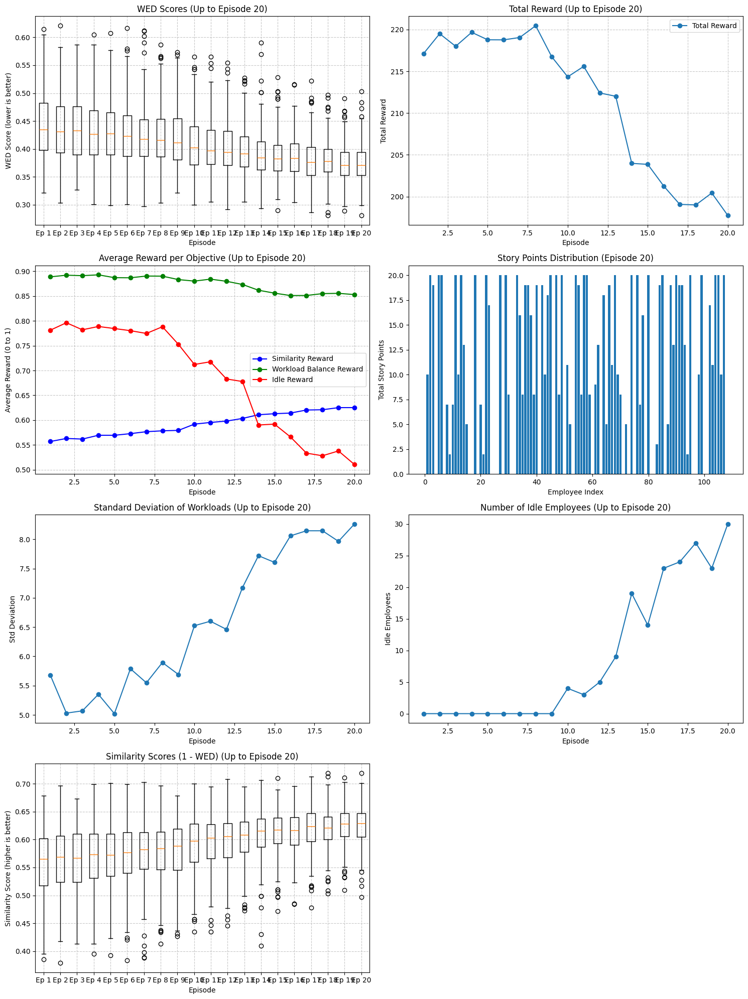

In [ ]:
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import gym
from gym import spaces
import random
from collections import deque
import matplotlib.pyplot as plt
import seaborn as sns
import time
from torch.cuda.amp import autocast, GradScaler

# Global Variables for Flexibility
NUM_EMPLOYEES = 109
NUM_TASKS = 300
NUM_EPISODES = 20
LEARNING_RATE = 5e-5
INITIAL_TEMPERATURE = 1.0
MIN_TEMPERATURE = 0.1
GAMMA = 0.99
MEMORY_SIZE = 50000
BATCH_SIZE = 64
TARGET_UPDATE_FREQ = 100
DQN_HIDDEN_DIM = 128
MAX_WORKLOAD = 20
WEIGHT_SIMILARITY = 0.4
WEIGHT_WORKLOAD = 0.3
WEIGHT_IDLE = 0.3
ALPHA_WED = 0.5

# Episode untuk save model dan visualisasi
SAVE_EPISODES = []

# Total langkah global untuk decay rate
MAX_STEPS_PER_EPISODE = NUM_TASKS
TOTAL_STEPS = NUM_EPISODES * MAX_STEPS_PER_EPISODE
DECAY_RATE = -np.log(MIN_TEMPERATURE / INITIAL_TEMPERATURE) / TOTAL_STEPS

if not abs(WEIGHT_SIMILARITY + WEIGHT_WORKLOAD + WEIGHT_IDLE - 1.0) < 1e-6:
    raise ValueError(f"Reward weights must sum to 1, but got {WEIGHT_SIMILARITY + WEIGHT_WORKLOAD + WEIGHT_IDLE}")

task_data_path = '/content/drive/MyDrive/Skripsi/Resources/Datasets/fixed_data_task.csv'
employee_data_path = '/content/drive/MyDrive/Skripsi/Resources/Datasets/fixed_data_employee.csv'
model_save_path = '/content/drive/MyDrive/Skripsi/dqn_model_no_gnn.pth'
agent_save_path = '/content/drive/MyDrive/Skripsi/dqn_agent_params_no_gnn.pth'

# Load and clean datasets
task_data = pd.read_csv(task_data_path)
employee_data = pd.read_csv(employee_data_path)
task_subset = task_data.iloc[:NUM_TASKS]
employee_subset = employee_data.iloc[:NUM_EMPLOYEES]
skill_columns = [col for col in task_data.columns if col not in ['task_id', 'story_points', 'project_id']]

project_id_map = {pid: idx + 1 for idx, pid in enumerate(task_subset['project_id'].unique())}
project_ids = task_subset['project_id'].map(project_id_map).values

task_skills_df = task_subset[skill_columns].fillna(0)
employee_skills_df = employee_subset[skill_columns].fillna(0)
task_skills = task_skills_df.values / 5.0
employee_skills = employee_skills_df.values / 5.0

# Precompute state matrix on GPU
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
torch.backends.cudnn.benchmark = True  # Enable cuDNN auto-tuner
task_skills_tensor = torch.tensor(task_skills, dtype=torch.float32).to(device)
employee_skills_tensor = torch.tensor(employee_skills, dtype=torch.float32).to(device)

# Vectorized computation of state matrix
alpha = ALPHA_WED
task_skills_expanded = task_skills_tensor.unsqueeze(1)  # (NUM_TASKS, 1, num_skills)
employee_skills_expanded = employee_skills_tensor.unsqueeze(0)  # (1, NUM_EMPLOYEES, num_skills)
diff = employee_skills_expanded - task_skills_expanded  # (NUM_TASKS, NUM_EMPLOYEES, num_skills)

weights = 1 / (1 + alpha * torch.maximum(diff, torch.tensor(0.0, device=device)))
mask = task_skills_tensor > 0  # (NUM_TASKS, num_skills)
mask_expanded = mask.unsqueeze(1)  # (NUM_TASKS, 1, num_skills)

weighted_diff = weights * mask_expanded * (employee_skills_expanded - task_skills_expanded) ** 2
wed = torch.sqrt(torch.sum(weighted_diff, dim=2))  # (NUM_TASKS, NUM_EMPLOYEES)

num_skills_per_task = torch.sum(mask, dim=1)  # (NUM_TASKS,)
weights_worst = 1 / (1 + alpha * 1)
wed_worst = torch.sqrt(num_skills_per_task * weights_worst * (1.0 ** 2))
wed_worst = torch.where(num_skills_per_task > 0, wed_worst, torch.tensor(1.0, device=device))

similarity = 1 - (wed / wed_worst.unsqueeze(1))  # (NUM_TASKS, NUM_EMPLOYEES)
state_matrix = similarity.unsqueeze(-1)  # (NUM_TASKS, NUM_EMPLOYEES, 1)

class TaskAssignmentEnv(gym.Env):
    def __init__(self, task_skills, employee_skills, story_points, project_ids, num_tasks=None, num_employees=None):
        super(TaskAssignmentEnv, self).__init__()
        self.task_skills = task_skills
        self.employee_skills = employee_skills
        self.story_points = torch.tensor(story_points, dtype=torch.float32).to(device)
        self.project_ids = torch.tensor(project_ids, dtype=torch.long).to(device)
        self.max_workload = MAX_WORKLOAD
        self.num_tasks = num_tasks if num_tasks is not None else len(task_skills)
        self.num_employees = num_employees if num_employees is not None else len(employee_skills)

        self.task_skills = self.task_skills[:self.num_tasks]
        self.employee_skills = self.employee_skills[:self.num_employees]
        self.story_points = self.story_points[:self.num_tasks]
        self.project_ids = self.project_ids[:self.num_tasks]

        self.observation_space = spaces.Dict({
            'state_matrix': spaces.Box(low=0, high=1, shape=(self.num_tasks, self.num_employees, 1), dtype=np.float32),
            'global_features': spaces.Box(low=0, high=1, shape=(3,), dtype=np.float32),
            'task_mask': spaces.Box(low=0, high=1, shape=(self.num_tasks,), dtype=np.float32)
        })
        self.action_space = spaces.MultiDiscrete([self.num_tasks, self.num_employees])
        self.total_story_points = torch.sum(self.story_points).item()
        workloads = torch.zeros(self.num_employees, device=device)
        workloads[0] = self.max_workload
        mean_workload = self.max_workload / self.num_employees
        self.actual_max_std = torch.sqrt(torch.sum((workloads - mean_workload) ** 2) / self.num_employees).item()
        self.max_possible_cv = (self.actual_max_std / mean_workload) if mean_workload > 0 else 1.0
        self.state_matrix = state_matrix  # Precomputed on GPU
        self.reset()

    def reset(self):
        self.workloads = torch.zeros(self.num_employees, device=device)
        self.assignments = torch.full((self.num_tasks,), -1, dtype=torch.long, device=device)
        self.remaining_tasks = torch.arange(self.num_tasks, device=device)
        self.wed_scores = []
        self.similarity_scores = []
        self.total_assigned_story_points = 0
        self.employee_projects = torch.full((self.num_employees,), -1, dtype=torch.long, device=device)
        return self._get_obs()

    def _get_obs(self):
        prop_remaining = len(self.remaining_tasks) / self.num_tasks
        num_idle = torch.sum(self.workloads == 0).item()
        prop_idle = num_idle / self.num_employees
        mean_workload = torch.mean(self.workloads).item() if torch.sum(self.workloads) > 0 else 1e-6
        std_workload = torch.std(self.workloads).item()
        cv = std_workload / mean_workload if mean_workload > 0 else 0
        cv_normalized = cv / self.max_possible_cv

        global_features = torch.tensor([prop_remaining, prop_idle, cv_normalized], dtype=torch.float32, device=device)

        task_mask = torch.zeros(self.num_tasks, dtype=torch.float32, device=device)
        task_mask[self.remaining_tasks] = 1

        return {
            'state_matrix': self.state_matrix,
            'global_features': global_features,
            'task_mask': task_mask
        }

    def _compute_similarity(self, task_idx, emp_idx):
        return self.state_matrix[task_idx, emp_idx, 0].item()

    def step(self, action):
        task_idx, emp_idx = action
        done = False
        reward = 0
        info = {}

        task_project = self.project_ids[task_idx]
        emp_project = self.employee_projects[emp_idx]
        if emp_project != -1 and emp_project != task_project:
            reward = -1.0
            info['invalid_action'] = 'Employee assigned to a different project'
            return self._get_obs(), reward, done, info

        current_workload = self.workloads[emp_idx]
        if current_workload + self.story_points[task_idx] > self.max_workload:
            reward = -1.0
            info['invalid_action'] = 'Workload exceeds maximum'
            return self._get_obs(), reward, done, info

        self.assignments[task_idx] = emp_idx
        self.workloads[emp_idx] += self.story_points[task_idx]
        self.total_assigned_story_points += self.story_points[task_idx].item()
        self.remaining_tasks = self.remaining_tasks[self.remaining_tasks != task_idx]

        if self.employee_projects[emp_idx] == -1:
            self.employee_projects[emp_idx] = task_project

        similarity_reward = self._compute_similarity(task_idx, emp_idx)
        self.similarity_scores.append(similarity_reward)
        self.wed_scores.append(1 - similarity_reward)

        mean_workload = torch.mean(self.workloads).item() if torch.sum(self.workloads) > 0 else 1e-6
        std_workload = torch.std(self.workloads).item()
        cv = std_workload / mean_workload if mean_workload > 0 else 0
        workload_balance_reward = 1 - (cv / self.max_possible_cv)

        num_idle = torch.sum(self.workloads == 0).item()
        idle_reward = 1 - (num_idle / self.num_employees)

        reward = (WEIGHT_SIMILARITY * similarity_reward) + (WEIGHT_WORKLOAD * workload_balance_reward) + (WEIGHT_IDLE * idle_reward)

        info['similarity_reward'] = similarity_reward
        info['workload_balance_reward'] = workload_balance_reward
        info['idle_reward'] = idle_reward

        if len(self.remaining_tasks) == 0:
            done = True
            info['total_wed'] = np.sum(self.wed_scores)
            info['similarity_scores'] = self.similarity_scores

        return self._get_obs(), reward, done, info

class DQN(nn.Module):
    def __init__(self, input_dim, output_dim, num_employees):
        super(DQN, self).__init__()
        self.num_employees = num_employees
        self.fc1 = nn.Linear(input_dim, DQN_HIDDEN_DIM)
        self.fc2 = nn.Linear(DQN_HIDDEN_DIM, DQN_HIDDEN_DIM // 2)
        self.fc3 = nn.Linear(DQN_HIDDEN_DIM // 2, 1)

    def forward(self, state_matrix, global_features):
        if state_matrix.dim() == 3:
            batch_size = state_matrix.size(0)
            state_input = state_matrix.squeeze(-1).unsqueeze(-1)
            global_features = global_features.unsqueeze(1).expand(-1, self.num_employees, -1)
            x = torch.cat([state_input, global_features], dim=-1)
            x = F.relu(self.fc1(x))
            x = F.relu(self.fc2(x))
            q_values = self.fc3(x).squeeze(-1)
        else:
            state_input = state_matrix.squeeze(-1).unsqueeze(-1)
            global_features = global_features.expand(self.num_employees, -1)
            x = torch.cat([state_input, global_features], dim=-1)
            x = F.relu(self.fc1(x))
            x = F.relu(self.fc2(x))
            q_values = self.fc3(x).squeeze(-1)
        return q_values

class DQNAgent:
    def __init__(self, num_tasks, num_employees):
        self.device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
        self.num_tasks = num_tasks
        self.num_employees = num_employees
        self.input_dim = 1 + 3
        self.output_dim = 1
        self.model = DQN(self.input_dim, self.output_dim, self.num_employees).to(self.device)
        self.target_model = DQN(self.input_dim, self.output_dim, self.num_employees).to(self.device)
        self.target_model.load_state_dict(self.model.state_dict())
        self.optimizer = torch.optim.Adam(self.model.parameters(), lr=LEARNING_RATE)
        self.memory = deque(maxlen=MEMORY_SIZE)
        self.batch_size = BATCH_SIZE
        self.temperature = INITIAL_TEMPERATURE
        self.min_temperature = MIN_TEMPERATURE
        self.gamma = GAMMA
        self.global_step = 0
        self.scaler = GradScaler()

    def update_temperature(self):
        self.global_step += 1
        self.temperature = self.min_temperature + (INITIAL_TEMPERATURE - self.min_temperature) * np.exp(-DECAY_RATE * self.global_step)

    def act(self, obs, env):
        state_matrix = obs['state_matrix']
        global_features = obs['global_features']
        task_mask = obs['task_mask']

        valid_tasks = torch.where(task_mask == 1)[0]
        if valid_tasks.size(0) == 0:
            return [0, 0]

        # Vectorized action validation
        valid_tasks = valid_tasks.to(device)
        task_projects = env.project_ids[valid_tasks]
        story_points = env.story_points[valid_tasks]

        workload_feasible = (env.workloads.unsqueeze(0) + story_points.unsqueeze(1)) <= env.max_workload
        project_feasible = (env.employee_projects.unsqueeze(0) == -1) | (env.employee_projects.unsqueeze(0) == task_projects.unsqueeze(1))
        valid_mask = workload_feasible & project_feasible

        valid_actions = torch.nonzero(valid_mask, as_tuple=False)
        if valid_actions.size(0) == 0:
            return [0, 0]

        valid_task_indices = valid_actions[:, 0]
        valid_emp_indices = valid_actions[:, 1]

        # Sample a random task from valid ones
        task_idx = random.choice(valid_task_indices.cpu().numpy())
        task_global_idx = valid_tasks[task_idx].item()

        # Filter employees valid for this task
        emp_mask = valid_actions[:, 0] == task_idx
        valid_emp_for_task = valid_emp_indices[emp_mask]

        # Compute Q-values for valid employees
        with torch.no_grad():
            task_state = state_matrix[task_global_idx]
            q_values = self.model(task_state, global_features)
            q_values_subset = q_values[valid_emp_for_task]

            if q_values_subset.numel() == 0:
                emp_idx = random.choice(valid_emp_for_task.cpu().tolist())
            else:
                scaled_q = q_values_subset / self.temperature
                probs = F.softmax(scaled_q, dim=0)
                if torch.any(torch.isnan(probs)):
                    emp_idx = random.choice(valid_emp_for_task.cpu().tolist())
                else:
                    emp_idx_idx = torch.multinomial(probs, 1).item()
                    emp_idx = valid_emp_for_task[emp_idx_idx].item()

        return [task_global_idx, emp_idx]

    def remember(self, state, action, reward, next_state, done):
        self.memory.append((state, action, reward, next_state, done))

    def replay(self, env):
        if len(self.memory) < self.batch_size:
            return
        batch = random.sample(self.memory, self.batch_size)
        states, actions, rewards, next_states, dones = zip(*batch)

        state_matrices = torch.stack([s['state_matrix'] for s in states])
        state_globals = torch.stack([s['global_features'] for s in states])
        next_state_matrices = torch.stack([s['state_matrix'] for s in next_states])
        next_state_globals = torch.stack([s['global_features'] for s in next_states])

        actions = torch.tensor(actions, dtype=torch.long, device=self.device)
        rewards = torch.tensor(rewards, dtype=torch.float32, device=self.device)
        dones = torch.tensor(dones, dtype=torch.float32, device=self.device)

        task_idx = actions[:, 0]
        emp_idx = actions[:, 1]

        batch_indices = torch.arange(self.batch_size, device=self.device)
        state_inputs = state_matrices[batch_indices, task_idx]
        global_inputs = state_globals[batch_indices]

        with autocast():
            q_values = self.model(state_inputs, global_inputs)
            q_values_selected = q_values[batch_indices, emp_idx]

            next_q_values = self.target_model(next_state_matrices[batch_indices, task_idx], next_state_globals[batch_indices])
            next_q_values_max = next_q_values.max(dim=1)[0]
            targets = rewards + (1 - dones) * self.gamma * next_q_values_max

            loss = F.mse_loss(q_values_selected, targets)

        self.scaler.scale(loss).backward()
        self.scaler.step(self.optimizer)
        self.scaler.update()
        self.optimizer.zero_grad()

    def update_target(self):
        self.target_model.load_state_dict(self.model.state_dict())

    def save(self, model_path, agent_path):
        torch.save({
            'model_state_dict': self.model.state_dict(),
            'target_model_state_dict': self.target_model.state_dict(),
            'optimizer_state_dict': self.optimizer.state_dict()
        }, model_path)
        torch.save({'temperature': self.temperature}, agent_path)
        print(f"Model saved to {model_path}, Agent params (temperature only) to {agent_path}")

    def load(self, model_path, agent_path):
        checkpoint = torch.load(model_path)
        self.model.load_state_dict(checkpoint['model_state_dict'])
        self.target_model.load_state_dict(checkpoint['target_model_state_dict'])
        self.optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
        agent_params = torch.load(agent_path)
        self.temperature = agent_params['temperature']
        self.memory = deque(maxlen=MEMORY_SIZE)
        print(f"Model loaded from {model_path}, Agent params (temperature only) from {agent_path}")

def plot_and_summarize(episode_data, wed_scores_list, total_rewards, similarity_rewards,
                      workload_balance_rewards, idle_rewards, workloads_list,
                      std_workloads_list, idle_employees_list, env, num_episodes_to_plot):
    # Tabular Summary
    print(f"\nTabular Summary of Rewards up to Episode {num_episodes_to_plot}:")
    print("-" * 80)
    print(f"{'Episode':<10} {'Total Reward':<15} {'Similarity':<15} {'Workload':<15} {'Idle':<15} {'Std Dev':<10} {'Idle Emp':<10}")
    print("-" * 80)
    for data in episode_data:
        if data['Episode'] <= num_episodes_to_plot:
            print(f"{data['Episode']:<10} {data['Total Reward']:<15.4f} {data['Similarity Reward']:<15.4f} {data['Workload Balance Reward']:<15.4f} {data['Idle Reward']:<15.4f} {data['Std Workloads']:<10.4f} {data['Idle Employees']:<10}")
    print("-" * 80)

    # Visualizations
    plt.figure(figsize=(15, 20))

    # Fix for WED scores visualization - use the raw WED scores directly
    plt.subplot(4, 2, 1)
    wed_scores_to_plot = []
    for episode_wed_scores in wed_scores_list[:num_episodes_to_plot]:
        # These are already standardized in the environment, so we use them directly
        wed_scores_to_plot.append(episode_wed_scores)

    plt.boxplot(wed_scores_to_plot, labels=[f"Ep {i+1}" for i in range(num_episodes_to_plot)])
    plt.title(f'WED Scores (Up to Episode {num_episodes_to_plot})')
    plt.xlabel('Episode')
    plt.ylabel('WED Score (lower is better)')
    plt.grid(True, linestyle='--', alpha=0.7)

    # Add a second plot for similarity (1 - WED) which might be more intuitive
    plt.subplot(4, 2, 7)  # Use an empty subplot position
    similarity_scores_to_plot = []
    for episode_wed_scores in wed_scores_list[:num_episodes_to_plot]:
        # Convert WED to similarity (1 - WED)
        similarity_scores_to_plot.append([1 - wed for wed in episode_wed_scores])

    plt.boxplot(similarity_scores_to_plot, labels=[f"Ep {i+1}" for i in range(num_episodes_to_plot)])
    plt.title(f'Similarity Scores (1 - WED) (Up to Episode {num_episodes_to_plot})')
    plt.xlabel('Episode')
    plt.ylabel('Similarity Score (higher is better)')
    plt.grid(True, linestyle='--', alpha=0.7)

    # Rest of the plots remain the same
    plt.subplot(4, 2, 2)
    plt.plot(range(1, num_episodes_to_plot + 1), total_rewards[:num_episodes_to_plot], marker='o', label='Total Reward')
    plt.title(f'Total Reward (Up to Episode {num_episodes_to_plot})')
    plt.xlabel('Episode')
    plt.ylabel('Total Reward')
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.legend()

    plt.subplot(4, 2, 3)
    plt.plot(range(1, num_episodes_to_plot + 1), similarity_rewards[:num_episodes_to_plot], marker='o', label='Similarity Reward', color='blue')
    plt.plot(range(1, num_episodes_to_plot + 1), workload_balance_rewards[:num_episodes_to_plot], marker='o', label='Workload Balance Reward', color='green')
    plt.plot(range(1, num_episodes_to_plot + 1), idle_rewards[:num_episodes_to_plot], marker='o', label='Idle Reward', color='red')
    plt.title(f'Average Reward per Objective (Up to Episode {num_episodes_to_plot})')
    plt.xlabel('Episode')
    plt.ylabel('Average Reward (0 to 1)')
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.legend()

    plt.subplot(4, 2, 4)
    plt.bar(range(env.num_employees), workloads_list[num_episodes_to_plot - 1].cpu().numpy())
    plt.title(f'Story Points Distribution (Episode {num_episodes_to_plot})')
    plt.xlabel('Employee Index')
    plt.ylabel('Total Story Points')

    plt.subplot(4, 2, 5)
    plt.plot(range(1, num_episodes_to_plot + 1), std_workloads_list[:num_episodes_to_plot], marker='o')
    plt.title(f'Standard Deviation of Workloads (Up to Episode {num_episodes_to_plot})')
    plt.xlabel('Episode')
    plt.ylabel('Std Deviation')

    plt.subplot(4, 2, 6)
    plt.plot(range(1, num_episodes_to_plot + 1), idle_employees_list[:num_episodes_to_plot], marker='o')
    plt.title(f'Number of Idle Employees (Up to Episode {num_episodes_to_plot})')
    plt.xlabel('Episode')
    plt.ylabel('Idle Employees')

    plt.tight_layout()
    plt.show()

def train_dqn():
    env = TaskAssignmentEnv(task_skills, employee_skills, task_subset['story_points'].values, project_ids)
    agent = DQNAgent(env.num_tasks, env.num_employees)
    total_rewards = []
    wed_scores_list = []
    workloads_list = []
    std_workloads_list = []
    idle_employees_list = []
    similarity_rewards = []
    workload_balance_rewards = []
    idle_rewards = []
    global_step = 0
    episode_data = []

    for episode in range(NUM_EPISODES):
        obs = env.reset()
        total_reward = 0
        episode_similarity = 0
        episode_workload_balance = 0
        episode_idle_reward = 0
        done = False
        step = 0

        print(f"Episode {episode+1}/{NUM_EPISODES}, Temperature: {agent.temperature:.3f}")
        while not done:
            step += 1
            global_step += 1
            start_time = time.time()
            action = agent.act(obs, env)
            next_obs, reward, done, info = env.step(action)
            agent.remember(obs, action, reward, next_obs, done)
            agent.replay(env)
            obs = next_obs
            total_reward += reward
            if 'similarity_reward' in info:
                episode_similarity += info['similarity_reward']
            if 'workload_balance_reward' in info:
                episode_workload_balance += info['workload_balance_reward']
            if 'idle_reward' in info:
                episode_idle_reward += info['idle_reward']
            step_time = time.time() - start_time
            if step % 10 == 0:
                print(f"Step {step}/{env.num_tasks}: Reward {reward:.4f}, Time {step_time:.2f}s")

            agent.update_temperature()

            if global_step % TARGET_UPDATE_FREQ == 0:
                agent.update_target()

        total_rewards.append(total_reward)
        wed_scores_list.append(env.wed_scores.copy())
        workloads_list.append(env.workloads.clone())
        std_workloads = torch.std(env.workloads).item()
        num_idle = torch.sum(env.workloads == 0).item()
        std_workloads_list.append(std_workloads)
        idle_employees_list.append(num_idle)
        avg_similarity = episode_similarity / step if step > 0 else 0
        avg_workload_balance = episode_workload_balance / step if step > 0 else 0
        avg_idle = episode_idle_reward / step if step > 0 else 0
        similarity_rewards.append(avg_similarity)
        workload_balance_rewards.append(avg_workload_balance)
        idle_rewards.append(avg_idle)

        episode_data.append({
            'Episode': episode + 1,
            'Total Reward': total_reward,
            'Similarity Reward': avg_similarity,
            'Workload Balance Reward': avg_workload_balance,
            'Idle Reward': avg_idle,
            'Std Workloads': std_workloads,
            'Idle Employees': num_idle
        })

        print(f"Episode {episode+1} - Total Reward: {total_reward:.2f}, Std Workloads: {std_workloads:.2f}, Idle Employees: {num_idle}")
        print(f"Average Similarity Reward: {avg_similarity:.4f}, Workload Balance Reward: {avg_workload_balance:.4f}, Idle Reward: {avg_idle:.4f}")

        if episode + 1 in SAVE_EPISODES:
            print(f"\nCheckpoint at Episode {episode + 1}")
            plot_and_summarize(
                episode_data=episode_data,
                wed_scores_list=wed_scores_list,
                total_rewards=total_rewards,
                similarity_rewards=similarity_rewards,
                workload_balance_rewards=workload_balance_rewards,
                idle_rewards=idle_rewards,
                workloads_list=workloads_list,
                std_workloads_list=std_workloads_list,
                idle_employees_list=idle_employees_list,
                env=env,
                num_episodes_to_plot=episode + 1
            )
            checkpoint_model_path = f"/content/drive/MyDrive/Skripsi/dqn_model_no_gnn_eps{episode + 1}.pth"
            checkpoint_agent_path = f"/content/drive/MyDrive/Skripsi/dqn_agent_params_no_gnn_eps{episode + 1}.pth"
            agent.save(checkpoint_model_path, checkpoint_agent_path)

    agent.save(model_save_path, agent_save_path)

    # Final visualization
    plot_and_summarize(
        episode_data=episode_data,
        wed_scores_list=wed_scores_list,
        total_rewards=total_rewards,
        similarity_rewards=similarity_rewards,
        workload_balance_rewards=workload_balance_rewards,
        idle_rewards=idle_rewards,
        workloads_list=workloads_list,
        std_workloads_list=std_workloads_list,
        idle_employees_list=idle_employees_list,
        env=env,
        num_episodes_to_plot=NUM_EPISODES
    )

    return env, workloads_list, std_workloads_list, idle_employees_list, NUM_EPISODES, episode_data, agent

# Run training
env, workloads_list, std_workloads_list, idle_employees_list, num_episodes, episode_data, trained_agent = train_dqn()


## Test Model

Project ID mapping: {'P1': 1, 'P2': 2, 'P3': 3, 'P4': 4, 'P5': 5}
Model loaded from /content/drive/MyDrive/Skripsi/dqn_model_weighted_eps100.pth, Agent params (temperature only) from /content/drive/MyDrive/Skripsi/dqn_agent_params_weighted_eps100.pth
Running inference on dataset with 300 tasks and 109 employees
Step 1/300: Action [39, 80], Reward 0.2263
Step 2/300: Action [237, 50], Reward 0.2729
Step 3/300: Action [8, 95], Reward 0.3734
Step 4/300: Action [41, 93], Reward 0.3879
Step 5/300: Action [168, 94], Reward 0.3949
Step 6/300: Action [13, 59], Reward 0.3863
Step 7/300: Action [281, 39], Reward 0.4145
Step 8/300: Action [236, 30], Reward 0.4271
Step 9/300: Action [35, 55], Reward 0.4659
Step 10/300: Action [208, 31], Reward 0.4452
Step 11/300: Action [246, 13], Reward 0.4834
Step 12/300: Action [278, 75], Reward 0.4849
Step 13/300: Action [48, 11], Reward 0.4854
Step 14/300: Action [264, 85], Reward 0.5040
Step 15/300: Action [52, 1], Reward 0.5075
Step 16/300: Action [80, 65], 

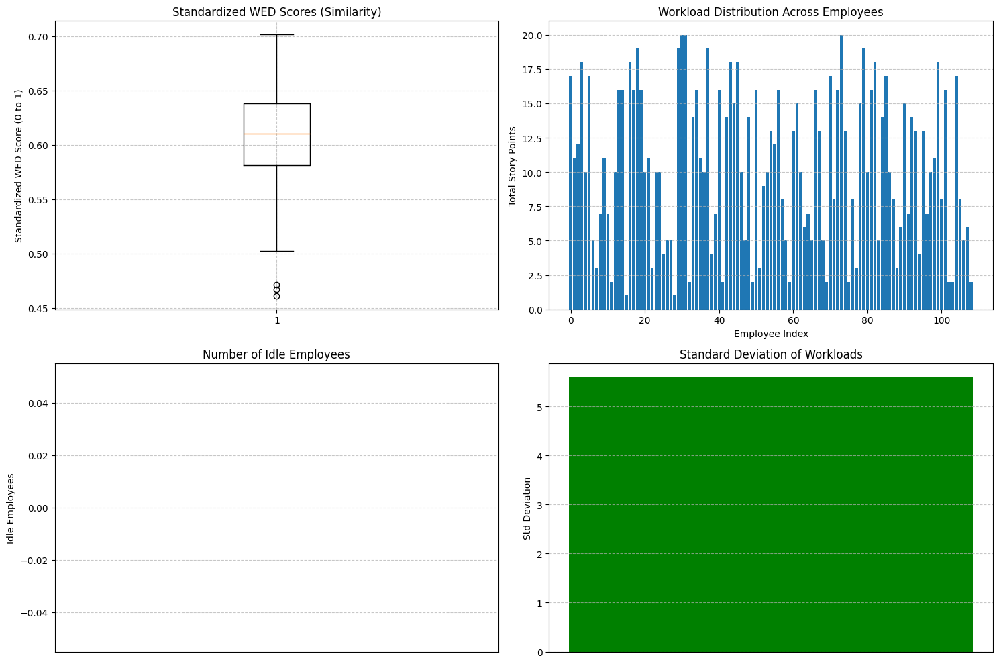

In [ ]:
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch_geometric.nn import GATConv
from torch_geometric.data import Data, Batch
from sklearn.impute import SimpleImputer
import gym
from gym import spaces
import random
from collections import deque
import matplotlib.pyplot as plt
import seaborn as sns

# Global Variables for the New Dataset
NEW_NUM_EMPLOYEES = 109
NEW_NUM_TASKS = 300
MAX_WORKLOAD = 20
task_data_path = '/content/drive/MyDrive/Skripsi/Resources/Datasets/fixed_data_task.csv'
employee_data_path = '/content/drive/MyDrive/Skripsi/Resources/Datasets/fixed_data_employee.csv'
model_save_path = '/content/drive/MyDrive/Skripsi/dqn_model_weighted_eps100.pth'
agent_save_path = '/content/drive/MyDrive/Skripsi/dqn_agent_params_weighted_eps100.pth'

# Load and clean the new dataset
task_data = pd.read_csv(task_data_path)
employee_data = pd.read_csv(employee_data_path)
task_subset = task_data.iloc[:NEW_NUM_TASKS]
employee_subset = employee_data.iloc[:NEW_NUM_EMPLOYEES]
skill_columns = [col for col in task_data.columns if col not in ['task_id', 'story_points', 'project_id']]
task_skills = task_subset[skill_columns].values
employee_skills = employee_subset[skill_columns].values
story_points = task_subset['story_points'].values

# Convert project_ids from strings to integers
project_ids_raw = task_subset['project_id'].values  # e.g., ['P1', 'P2', ...]
unique_projects = np.unique(project_ids_raw)
project_id_map = {pid: idx + 1 for idx, pid in enumerate(unique_projects)}  # e.g., {'P1': 1, 'P2': 2, ...}
project_ids = np.array([project_id_map[pid] for pid in project_ids_raw], dtype=int)  # e.g., [1, 2, ...]
print(f"Project ID mapping: {project_id_map}")

task_skills = task_skills / 5.0
employee_skills = employee_skills / 5.0
imputer = SimpleImputer(strategy='mean')
task_skills = imputer.fit_transform(task_skills)
employee_skills = imputer.fit_transform(employee_skills)

# TaskAssignmentEnv class (updated to handle integer project IDs)
class TaskAssignmentEnv(gym.Env):
    def __init__(self, task_skills, employee_skills, story_points, project_ids):
        super(TaskAssignmentEnv, self).__init__()
        self.task_skills = task_skills
        self.employee_skills = employee_skills
        self.story_points = story_points
        self.project_ids = project_ids  # Now an array of integers
        self.max_workload = MAX_WORKLOAD
        self.num_tasks = len(task_skills)
        self.num_employees = len(employee_skills)
        self.task_feature_dim = 66 + 3
        self.employee_feature_dim = 66 + 3
        self.observation_space = spaces.Dict({
            'task_features': spaces.Box(low=0, high=1, shape=(self.num_tasks, self.task_feature_dim), dtype=np.float32),
            'employee_features': spaces.Box(low=0, high=1, shape=(self.num_employees, self.employee_feature_dim), dtype=np.float32),
            'task_mask': spaces.Box(low=0, high=1, shape=(self.num_tasks,), dtype=np.float32)
        })
        self.action_space = spaces.MultiDiscrete([self.num_tasks, self.num_employees])
        self.edge_index = self._create_edge_index()
        self.total_story_points = np.sum(self.story_points)
        workloads = np.zeros(self.num_employees)
        workloads[0] = self.max_workload
        mean_workload = self.max_workload / self.num_employees
        self.actual_max_std = np.sqrt(np.sum((workloads - mean_workload) ** 2) / self.num_employees)
        self.max_possible_cv = (self.actual_max_std / mean_workload)

    def _create_edge_index(self):
        edge_index = []
        for t in range(self.num_tasks):
            for e in range(self.num_employees):
                edge_index.append([t, self.num_tasks + e])
                edge_index.append([self.num_tasks + e, t])
        return torch.tensor(edge_index, dtype=torch.long).t().contiguous()

    def reset(self):
        self.workloads = np.zeros(self.num_employees)
        self.assignments = -np.ones(self.num_tasks, dtype=int)
        self.remaining_tasks = list(range(self.num_tasks))
        self.wed_scores = []
        self.similarity_scores = []
        self.total_assigned_story_points = 0
        self.employee_projects = np.full(self.num_employees, -1, dtype=int)  # Already int, ready for integer project IDs
        return self._get_obs()

    def _get_obs(self):
        task_features = np.zeros((self.num_tasks, self.task_feature_dim))
        for t in range(self.num_tasks):
            task_features[t, :65] = self.task_skills[t]
            task_features[t, 65] = self.story_points[t] / 20.0
            task_features[t, 66] = len(self.remaining_tasks) / self.num_tasks
            num_idle = np.sum(self.workloads == 0)
            task_features[t, 67] = num_idle / self.num_employees
            mean_workload = np.mean(self.workloads) if np.sum(self.workloads) > 0 else 1e-6
            std_workload = np.std(self.workloads)
            cv = std_workload / mean_workload if mean_workload > 0 else 0
            task_features[t, 68] = cv / self.max_possible_cv

        employee_features = np.zeros((self.num_employees, self.employee_feature_dim))
        for e in range(self.num_employees):
            employee_features[e, :65] = self.employee_skills[e]
            employee_features[e, 65] = self.workloads[e] / self.max_workload
            employee_features[e, 66:69] = 0

        task_mask = np.zeros(self.num_tasks)
        for t in range(self.num_tasks):
            task_mask[t] = 1 if t in self.remaining_tasks else 0

        return {
            'task_features': task_features.astype(np.float32),
            'employee_features': employee_features.astype(np.float32),
            'task_mask': task_mask.astype(np.float32)
        }

    def _compute_wed(self, emp_idx, task_idx, alpha=0.5):
        emp_skills = self.employee_skills[emp_idx]
        task_skills = self.task_skills[task_idx]
        diff = emp_skills - task_skills
        weights = 1 / (1 + alpha * np.maximum(0, emp_skills - task_skills))
        wed = np.sqrt(np.sum(weights * diff ** 2))  # Weighted Euclidean distance
        if np.isnan(wed):
            print(f"Warning: WED is nan for emp_idx={emp_idx}, task_idx={task_idx}")
        return wed

    def step(self, action):
        task_idx, emp_idx = action
        done = False
        reward = 0
        info = {}

        task_project = self.project_ids[task_idx]  # Now an integer (e.g., 1, 2, ...)
        emp_project = self.employee_projects[emp_idx]
        if emp_project != -1 and emp_project != task_project:
            reward = -1.0
            info['invalid_action'] = 'Different project'
            return self._get_obs(), reward, done, info

        self.assignments[task_idx] = emp_idx
        self.workloads[emp_idx] += self.story_points[task_idx]
        self.total_assigned_story_points += self.story_points[task_idx]
        self.remaining_tasks.remove(task_idx)
        if self.employee_projects[emp_idx] == -1:
            self.employee_projects[emp_idx] = task_project  # Now assigns an integer

        wed = self._compute_wed(emp_idx, task_idx)
        self.wed_scores.append(wed)
        similarity_reward = 1 - (wed / np.sqrt(65))
        if np.isnan(similarity_reward):
            print(f"Error: Similarity is nan for task_idx={task_idx}, emp_idx={emp_idx}, wed={wed}")
            similarity_reward = 0
        self.similarity_scores.append(similarity_reward)

        mean_workload = np.mean(self.workloads) if np.sum(self.workloads) > 0 else 1e-6
        std_workload = np.std(self.workloads)
        cv = std_workload / mean_workload if mean_workload > 0 else 0
        workload_balance_reward = 1 - (cv / self.max_possible_cv)

        num_idle = np.sum(self.workloads == 0)
        idle_reward = 1 - (num_idle / self.num_employees)

        reward = (0.35 * similarity_reward) + (0.35 * workload_balance_reward) + (0.30 * idle_reward)

        info['similarity_reward'] = similarity_reward
        info['workload_balance_reward'] = workload_balance_reward
        info['idle_reward'] = idle_reward

        if len(self.remaining_tasks) == 0:
            done = True
            info['total_wed'] = np.sum(self.wed_scores)
            info['similarity_scores'] = self.similarity_scores

        return self._get_obs(), reward, done, info

# GNN and DQN Models (unchanged)
class GNN(nn.Module):
    def __init__(self, input_dim):
        super(GNN, self).__init__()
        self.conv1 = GATConv(input_dim, 16, heads=4, concat=True)
        self.conv2 = GATConv(16 * 4, 32, heads=1, concat=False)

    def forward(self, data):
        x, edge_index = data.x, data.edge_index
        x = F.relu(self.conv1(x, edge_index))
        x = self.conv2(x, edge_index)
        return x

class DQN(nn.Module):
    def __init__(self, gnn, num_tasks, num_employees):
        super(DQN, self).__init__()
        self.gnn = gnn
        self.num_tasks = num_tasks
        self.num_employees = num_employees
        self.embedding_dim = 32
        self.fc1 = nn.Linear(self.embedding_dim * 2, 128)
        self.fc2 = nn.Linear(128, 1)

    def forward(self, obs, graph_data, valid_action_indices=None):
        embeddings = self.gnn(graph_data)
        task_embeddings = embeddings[:self.num_tasks]
        employee_embeddings = embeddings[self.num_tasks:]

        if valid_action_indices is not None:
            task_indices = valid_action_indices[:, 0]
            emp_indices = valid_action_indices[:, 1]
            task_emb = task_embeddings[task_indices]
            emp_emb = employee_embeddings[emp_indices]
            pair_embeddings = torch.cat([task_emb, emp_emb], dim=-1)
            x = F.relu(self.fc1(pair_embeddings))
            q_values = self.fc2(x).squeeze(-1)
            return q_values
        else:
            task_embeddings = task_embeddings.unsqueeze(1).expand(-1, self.num_employees, -1)
            employee_embeddings = employee_embeddings.unsqueeze(0).expand(self.num_tasks, -1, -1)
            pair_embeddings = torch.cat([task_embeddings, employee_embeddings], dim=-1)
            x = F.relu(self.fc1(pair_embeddings))
            q_values = self.fc2(x).squeeze(-1)
            return q_values

# DQN Agent (updated act method for integer project IDs)
class DQNAgent:
    def __init__(self, task_feature_dim, employee_feature_dim, num_tasks, num_employees):
        self.device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
        self.gnn = GNN(input_dim=69).to(self.device)
        self.model = DQN(self.gnn, num_tasks, num_employees).to(self.device)
        self.target_model = DQN(self.gnn, num_tasks, num_employees).to(self.device)
        self.target_model.load_state_dict(self.model.state_dict())
        self.optimizer = torch.optim.Adam(self.model.parameters())
        self.memory = deque(maxlen=50000)
        self.temperature = 1.0
        self.num_tasks = num_tasks
        self.num_employees = num_employees

    def act(self, obs, graph_data, env):
        task_mask = torch.tensor(obs['task_mask'], dtype=torch.float32).to(self.device)
        valid_tasks = [t for t in range(env.num_tasks) if task_mask[t] == 1]
        if not valid_tasks:
            return [0, 0]

        valid_action_indices = []
        for t in valid_tasks:
            task_project = env.project_ids[t]  # Now an integer
            for e in range(env.num_employees):
                current_workload = obs['employee_features'][e, 65] * env.max_workload
                emp_project = env.employee_projects[e]
                if (current_workload + env.story_points[t] <= env.max_workload and
                    (emp_project == -1 or emp_project == task_project)):
                    valid_action_indices.append([t, e])

        if not valid_action_indices:
            return [0, 0]

        valid_action_indices = torch.tensor(valid_action_indices, dtype=torch.long).to(self.device)

        with torch.no_grad():
            q_values = self.model(obs, graph_data, valid_action_indices=valid_action_indices)
            scaled_q = q_values / self.temperature
            exp_q = torch.exp(scaled_q - torch.max(scaled_q))
            probs = exp_q / torch.sum(exp_q)
            action_idx = torch.multinomial(probs, 1).item()
            action = valid_action_indices[action_idx]
            return action.tolist()

    def load(self, model_path, agent_path):
        checkpoint = torch.load(model_path)
        self.model.load_state_dict(checkpoint['model_state_dict'])
        self.target_model.load_state_dict(checkpoint['target_model_state_dict'])
        self.optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
        agent_params = torch.load(agent_path)
        self.temperature = agent_params['temperature']
        self.memory = deque(maxlen=50000)
        print(f"Model loaded from {model_path}, Agent params (temperature only) from {agent_path}")

# Inference Function (unchanged)
def run_inference():
    env = TaskAssignmentEnv(task_skills, employee_skills, story_points, project_ids)
    agent = DQNAgent(env.task_feature_dim, env.employee_feature_dim, env.num_tasks, env.num_employees)
    agent.load(model_save_path, agent_save_path)

    obs = env.reset()
    graph_data = Data(x=torch.cat([torch.tensor(obs['task_features'], dtype=torch.float32),
                                  torch.tensor(obs['employee_features'], dtype=torch.float32)]).to(agent.device),
                     edge_index=env.edge_index.to(agent.device))
    done = False
    step = 0
    total_reward = 0
    episode_similarity = 0
    episode_workload_balance = 0
    episode_idle_reward = 0

    print(f"Running inference on dataset with {env.num_tasks} tasks and {env.num_employees} employees")
    while not done:
        step += 1
        action = agent.act(obs, graph_data, env)
        next_obs, reward, done, info = env.step(action)
        next_graph_data = Data(x=torch.cat([torch.tensor(next_obs['task_features'], dtype=torch.float32),
                                            torch.tensor(next_obs['employee_features'], dtype=torch.float32)]).to(agent.device),
                               edge_index=env.edge_index.to(agent.device))
        obs = next_obs
        graph_data = next_graph_data
        total_reward += reward
        if 'similarity_reward' in info:
            episode_similarity += info['similarity_reward']
        if 'workload_balance_reward' in info:
            episode_workload_balance += info['workload_balance_reward']
        if 'idle_reward' in info:
            episode_idle_reward += info['idle_reward']
        print(f"Step {step}/{env.num_tasks}: Action {action}, Reward {reward:.4f}")

    wed_scores = env.wed_scores
    workloads = env.workloads
    num_idle = np.sum(workloads == 0)
    std_workloads = np.std(workloads)

    avg_similarity = episode_similarity / step
    avg_workload_balance = episode_workload_balance / step
    avg_idle = episode_idle_reward / step

    print(f"\nInference Results:")
    print(f"Total Reward: {total_reward:.2f}")
    print(f"Average Similarity Reward: {avg_similarity:.4f}")
    print(f"Average Workload Balance Reward: {avg_workload_balance:.4f}")
    print(f"Average Idle Reward: {avg_idle:.4f}")
    print(f"Standard Deviation of Workloads: {std_workloads:.2f}")
    print(f"Number of Idle Employees: {num_idle}")

    plt.figure(figsize=(15, 10))
    plt.subplot(2, 2, 1)
    wed_raw_worst = np.sqrt(65)
    wed_raw_best = 0
    standardized_wed = [(wed_raw_worst - wed) / (wed_raw_worst - wed_raw_best) for wed in wed_scores]
    plt.boxplot(standardized_wed, vert=True)
    plt.title('Standardized WED Scores (Similarity)')
    plt.ylabel('Standardized WED Score (0 to 1)')
    plt.grid(True, linestyle='--', alpha=0.7)

    plt.subplot(2, 2, 2)
    plt.bar(range(env.num_employees), workloads)
    plt.title('Workload Distribution Across Employees')
    plt.xlabel('Employee Index')
    plt.ylabel('Total Story Points')
    plt.grid(True, linestyle='--', alpha=0.7, axis='y')

    plt.subplot(2, 2, 3)
    plt.bar(1, num_idle, color='orange')
    plt.title('Number of Idle Employees')
    plt.ylabel('Idle Employees')
    plt.xticks([])
    plt.grid(True, linestyle='--', alpha=0.7, axis='y')

    plt.subplot(2, 2, 4)
    plt.bar(1, std_workloads, color='green')
    plt.title('Standard Deviation of Workloads')
    plt.ylabel('Std Deviation')
    plt.xticks([])
    plt.grid(True, linestyle='--', alpha=0.7, axis='y')

    plt.tight_layout()
    plt.show()

    return env, workloads, std_workloads, num_idle

# Run inference
env, workloads, std_workloads, num_idle = run_inference()

## New state representation

Using device: cuda
Episode 1/100, Temp: 1.000, Epsilon: 1.000
Step 10: Reward 0.3994, Time 0.01s, Num Idle: 100
Step 20: Reward 0.3455, Time 0.01s, Num Idle: 93
Step 30: Reward 0.4285, Time 0.01s, Num Idle: 84
Step 40: Reward 0.4746, Time 0.01s, Num Idle: 76
Step 50: Reward 0.5172, Time 0.01s, Num Idle: 68
Step 60: Reward 0.5804, Time 0.01s, Num Idle: 58
Step 70: Reward 0.5878, Time 0.02s, Num Idle: 51
Step 80: Reward 0.5741, Time 0.01s, Num Idle: 46
Step 90: Reward 0.5655, Time 0.02s, Num Idle: 41
Step 100: Reward 0.5483, Time 0.01s, Num Idle: 38
Step 110: Reward 0.5294, Time 0.01s, Num Idle: 36
Step 120: Reward 0.5565, Time 0.01s, Num Idle: 30
Step 130: Reward 0.5844, Time 0.01s, Num Idle: 23
Step 140: Reward 0.5849, Time 0.01s, Num Idle: 21
Step 150: Reward 0.5936, Time 0.01s, Num Idle: 19
Step 160: Reward 0.6066, Time 0.01s, Num Idle: 16
Step 170: Reward 0.6125, Time 0.01s, Num Idle: 10
Step 180: Reward 0.6222, Time 0.02s, Num Idle: 5
Step 190: Reward 0.6124, Time 0.01s, Num Idle: 

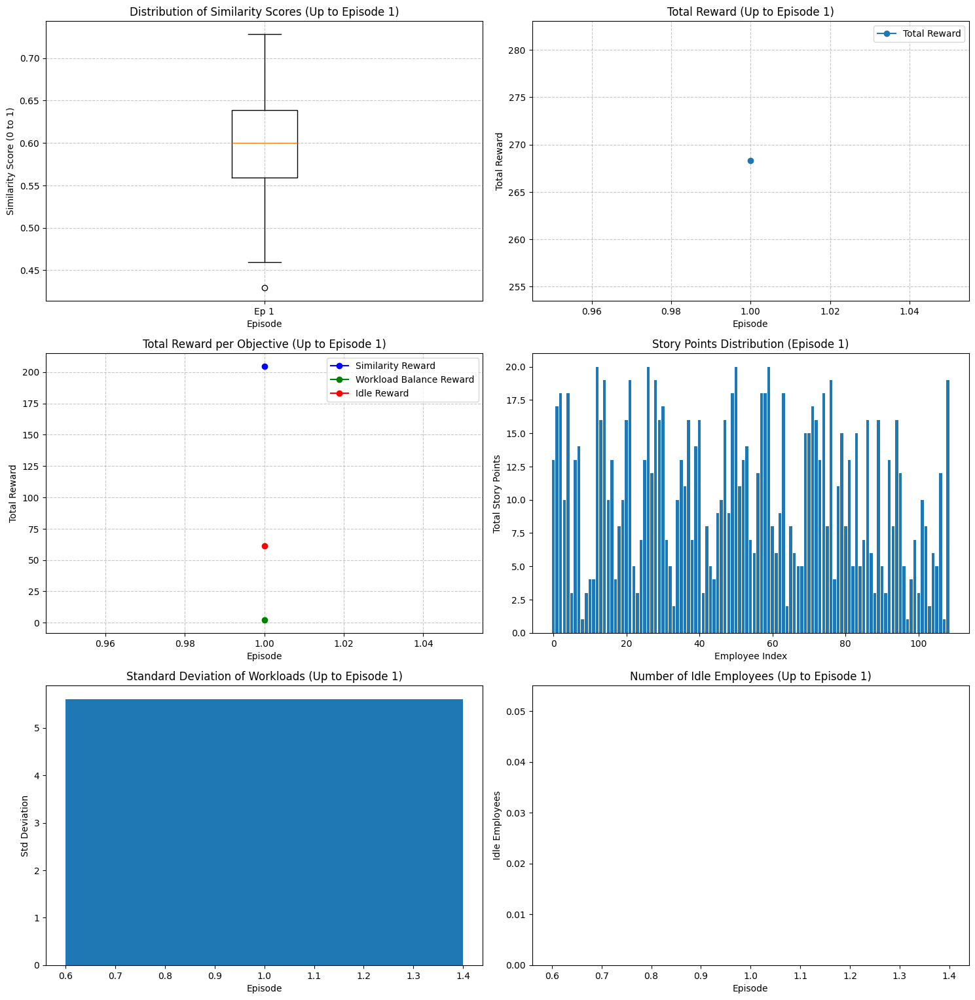

Episode 2/100, Temp: 0.988, Epsilon: 0.978
Step 10: Reward 0.3427, Time 0.02s, Num Idle: 101
Step 20: Reward 0.3383, Time 0.01s, Num Idle: 94
Step 30: Reward 0.4046, Time 0.01s, Num Idle: 86
Step 40: Reward 0.4501, Time 0.01s, Num Idle: 77
Step 50: Reward 0.4246, Time 0.01s, Num Idle: 72
Step 60: Reward 0.4724, Time 0.01s, Num Idle: 62
Step 70: Reward 0.5442, Time 0.01s, Num Idle: 54
Step 80: Reward 0.5446, Time 0.02s, Num Idle: 49
Step 90: Reward 0.5533, Time 0.01s, Num Idle: 43
Step 100: Reward 0.5955, Time 0.01s, Num Idle: 36
Step 110: Reward 0.6062, Time 0.01s, Num Idle: 30
Step 120: Reward 0.6048, Time 0.01s, Num Idle: 23
Step 130: Reward 0.6015, Time 0.02s, Num Idle: 21
Step 140: Reward 0.6203, Time 0.01s, Num Idle: 15
Step 150: Reward 0.6236, Time 0.01s, Num Idle: 10
Step 160: Reward 0.6301, Time 0.01s, Num Idle: 8
Step 170: Reward 0.6170, Time 0.01s, Num Idle: 7
Step 180: Reward 0.5997, Time 0.02s, Num Idle: 8
Step 190: Reward 0.6006, Time 0.07s, Num Idle: 6
Step 200: Reward 0.

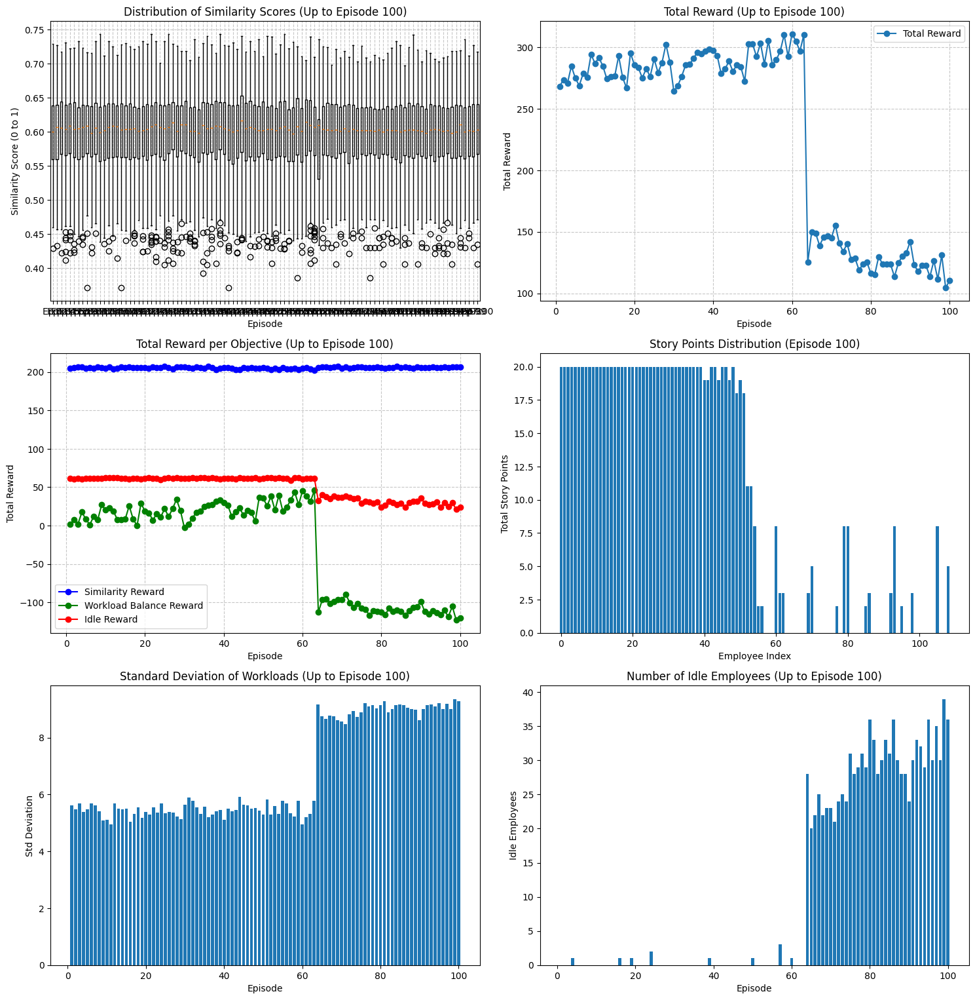

In [ ]:
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import gym
from gym import spaces
import random
from collections import deque
import time
from torch.cuda.amp import GradScaler as AmpGradScaler
import matplotlib.pyplot as plt
import seaborn as sns
import uuid
import os

# Set device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Global Variables
MAX_TASKS = 500
MAX_EMPLOYEES = 200
NUM_EPISODES = 100
LEARNING_RATE = 3e-4
INITIAL_TEMPERATURE = 1.0
MIN_TEMPERATURE = 0.2
INITIAL_EPSILON = 1.0
MIN_EPSILON = 0.05
GAMMA = 0.99
MEMORY_SIZE = 50000
BATCH_SIZE = 64
TARGET_UPDATE_FREQ = 1000
DQN_HIDDEN_DIM = 256
MAX_WORKLOAD = 20
ALPHA_WED = 0.5

SAVE_EPISODES = [1]
MAX_STEPS_PER_EPISODE = MAX_TASKS
TOTAL_STEPS = NUM_EPISODES * MAX_STEPS_PER_EPISODE
DECAY_RATE_TEMP = -np.log(MIN_TEMPERATURE / INITIAL_TEMPERATURE) / TOTAL_STEPS
DECAY_RATE_EPS = -np.log(MIN_EPSILON / INITIAL_EPSILON) / TOTAL_STEPS

task_data_path = '/content/drive/MyDrive/Skripsi/Resources/Datasets/fixed_data_task.csv'
employee_data_path = '/content/drive/MyDrive/Skripsi/Resources/Datasets/fixed_data_employee.csv'
model_save_path = '/content/drive/MyDrive/Skripsi/reassignment_newrep_dqn_model.pth'
agent_save_path = '/content/drive/MyDrive/Skripsi/reassignment_newrep_dqn_agent_params.pth'

# Direktori untuk menyimpan log CSV
log_dir = '/content/drive/MyDrive/Skripsi/Logs/'
os.makedirs(log_dir, exist_ok=True)

class TaskAssignmentEnv(gym.Env):
    def __init__(self, task_data, employee_data, max_tasks=MAX_TASKS, max_employees=MAX_EMPLOYEES):
        super(TaskAssignmentEnv, self).__init__()
        self.num_tasks = len(task_data)
        self.num_employees = len(employee_data)
        self.max_tasks = max_tasks
        self.max_employees = max_employees
        self.max_workload = MAX_WORKLOAD

        # Load dan preprocess data
        task_subset = task_data.iloc[:self.num_tasks]
        employee_subset = employee_data.iloc[:self.num_employees]
        skill_columns = [col for col in task_data.columns if col not in ['task_id', 'story_points', 'project_id']]
        project_id_map = {pid: idx + 1 for idx, pid in enumerate(task_subset['project_id'].unique())}
        project_ids = task_subset['project_id'].map(project_id_map).values
        task_skills_df = task_subset[skill_columns].fillna(0).astype(np.float32)
        employee_skills_df = employee_subset[skill_columns].fillna(0).astype(np.float32)
        story_points_df = task_subset['story_points'].astype(np.float32)

        self.task_skills = F.pad(
            torch.tensor(task_skills_df.values / 5.0, dtype=torch.float32, device=device),
            (0, 0, 0, max_tasks - self.num_tasks),
            'constant', 0
        )
        self.employee_skills = F.pad(
            torch.tensor(employee_skills_df.values / 5.0, dtype=torch.float32, device=device),
            (0, 0, 0, max_employees - self.num_employees),
            'constant', 0
        )
        self.story_points = F.pad(
            torch.tensor(story_points_df.values, dtype=torch.float32, device=device),
            (0, max_tasks - self.num_tasks),
            'constant', 0
        )
        self.project_ids = F.pad(
            torch.tensor(project_ids, dtype=torch.long, device=device),
            (0, max_tasks - self.num_tasks),
            'constant', -1
        )
        self.total_story_points = torch.sum(self.story_points[:self.num_tasks]).item()
        self.num_skills = len(skill_columns)

        # Define observation dan action spaces
        self.observation_space = spaces.Dict({
            'state_matrix': spaces.Box(low=0, high=1, shape=(max_tasks, 5), dtype=np.float32),
            'workload_matrix': spaces.Box(low=0, high=MAX_WORKLOAD, shape=(max_employees,), dtype=np.float32),
            'global_features': spaces.Box(low=0, high=1, shape=(2,), dtype=np.float32),
            'task_mask': spaces.Box(low=0, high=1, shape=(max_tasks,), dtype=np.float32)
        })
        self.action_space = spaces.MultiDiscrete([2, self.num_tasks, self.num_employees])
        self.reset()

    def reset(self, episode=None):
        self.workloads = torch.zeros(self.max_employees, device=device, dtype=torch.float32)
        self.assignments = torch.full((self.max_tasks,), -1, dtype=torch.long, device=device)
        self.remaining_tasks = torch.arange(self.num_tasks, device=device, dtype=torch.long)
        self.employee_projects = torch.full((self.max_employees,), -1, dtype=torch.long, device=device)
        self.wed_scores = []
        self._initialize_state_matrix()

        # Log reset state ke CSV
        if episode in [60, 61]:
            reset_data = {
                'Episode': episode,
                'Workloads': self.workloads[:self.num_employees].cpu().numpy().tolist(),
                'Assignments': self.assignments[:self.num_tasks].cpu().numpy().tolist(),
                'Remaining_Tasks': self.remaining_tasks.cpu().numpy().tolist()
            }
            reset_df = pd.DataFrame([reset_data])
            reset_df.to_csv(os.path.join(log_dir, f'reset_log_episode_{episode}.csv'), index=False)

        return self._get_obs()

    def _initialize_state_matrix(self):
        task_skills_expanded = self.task_skills[:self.num_tasks].unsqueeze(1).expand(-1, self.max_employees, -1)
        emp_skills_expanded = self.employee_skills.unsqueeze(0).expand(self.num_tasks, -1, -1)
        diff = emp_skills_expanded - task_skills_expanded
        weights = 1 / (1 + ALPHA_WED * torch.maximum(diff, torch.tensor(0.0, device=device, dtype=torch.float32)))
        mask = self.task_skills[:self.num_tasks].unsqueeze(1).expand(-1, self.max_employees, -1) > 0
        weighted_diff = weights * mask * (emp_skills_expanded - task_skills_expanded) ** 2
        wed = torch.sqrt(torch.sum(weighted_diff, dim=2))
        num_skills_per_task = torch.sum(self.task_skills[:self.num_tasks] > 0, dim=1).unsqueeze(1).expand(-1, self.max_employees)
        wed_worst = torch.sqrt(num_skills_per_task * (1.0 ** 2))
        wed_worst = torch.where(num_skills_per_task > 0, wed_worst, torch.tensor(1.0, device=device, dtype=torch.float32))
        similarity_matrix = (1 - (wed / wed_worst)).to(dtype=torch.float32)

        top_k = 5
        self.state_matrix = torch.topk(similarity_matrix, k=top_k, dim=1).values
        self.state_matrix = F.pad(self.state_matrix, (0, 0, 0, self.max_tasks - self.num_tasks), 'constant', 0)

    def _update_state_matrix(self, task_idx, emp_idx):
        task_skills_expanded = self.task_skills[task_idx].unsqueeze(0).expand(self.max_employees, -1)
        emp_skills_expanded = self.employee_skills.expand(self.max_employees, -1)
        diff = emp_skills_expanded - task_skills_expanded
        weights = 1 / (1 + ALPHA_WED * torch.maximum(diff, torch.tensor(0.0, device=device, dtype=torch.float32)))
        mask = task_skills_expanded > 0
        weighted_diff = weights * mask * (emp_skills_expanded - task_skills_expanded) ** 2
        wed = torch.sqrt(torch.sum(weighted_diff, dim=1))
        num_skills = torch.sum(mask.float(), dim=1)
        wed_worst = torch.sqrt(num_skills * (1.0 ** 2)) if num_skills[0] > 0 else 1.0
        similarities = 1 - (wed / wed_worst)
        top_k_similarities = torch.topk(similarities, k=5, dim=0).values
        self.state_matrix[task_idx] = top_k_similarities

    def _get_obs(self):
        workload_matrix = self.workloads
        prop_remaining = len(self.remaining_tasks) / self.num_tasks if self.num_tasks > 0 else 0.0
        num_idle = torch.sum(self.workloads[:self.num_employees] == 0).item()
        prop_idle = num_idle / self.num_employees if self.num_employees > 0 else 0.0

        global_features = torch.tensor([prop_remaining, prop_idle], device=device, dtype=torch.float32)

        task_mask = torch.zeros(self.max_tasks, device=device, dtype=torch.float32)
        if len(self.remaining_tasks) > 0:
            task_mask[self.remaining_tasks] = 1

        return {
            'state_matrix': self.state_matrix,
            'workload_matrix': workload_matrix,
            'global_features': global_features,
            'task_mask': task_mask
        }

    def step(self, action, episode=None, step=None):
        action_type, task_idx, emp_idx = action
        done = False
        reward = {'similarity': 0.0, 'workload': 0.0, 'idle': 0.0}
        info = {'action_valid': True}

        if emp_idx < 0 or emp_idx >= self.num_employees or task_idx < 0 or task_idx >= self.num_tasks:
            reward['similarity'] = -1.0
            info['action_valid'] = False
            info['invalid_action'] = 'Invalid task or employee index'
            return self._get_obs(), reward, done, info

        # Hitung std workloads sebelum aksi
        current_std = torch.std(self.workloads[:self.num_employees]).item()

        if action_type == 0:
            if task_idx not in self.remaining_tasks:
                reward['similarity'] = -1.0
                info['action_valid'] = False
                info['invalid_action'] = 'Task already assigned'
                return self._get_obs(), reward, done, info

            task_project = self.project_ids[task_idx]
            emp_project = self.employee_projects[emp_idx]
            current_workload = self.workloads[emp_idx]

            if emp_project != -1 and emp_project != task_project:
                reward['similarity'] = -1.0
                info['action_valid'] = False
                info['invalid_action'] = 'Different project'
                return self._get_obs(), reward, done, info

            if current_workload + self.story_points[task_idx] > self.max_workload:
                reward['similarity'] = -1.0
                info['action_valid'] = False
                info['invalid_action'] = 'Exceeds workload'
                return self._get_obs(), reward, done, info

            was_idle = (self.workloads[emp_idx] == 0)
            self.assignments[task_idx] = emp_idx
            self.workloads[emp_idx] += self.story_points[task_idx]
            self.remaining_tasks = self.remaining_tasks[self.remaining_tasks != task_idx]
            if self.employee_projects[emp_idx] == -1:
                self.employee_projects[emp_idx] = task_project

            self._update_state_matrix(task_idx, emp_idx)

        elif action_type == 1:
            if task_idx in self.remaining_tasks:
                reward['similarity'] = -1.0
                info['action_valid'] = False
                info['invalid_action'] = 'Task not yet assigned'
                return self._get_obs(), reward, done, info

            current_emp_idx = self.assignments[task_idx]
            if current_emp_idx == emp_idx:
                reward['similarity'] = -1.0
                info['action_valid'] = False
                info['invalid_action'] = 'Task already assigned to this employee'
                return self._get_obs(), reward, done, info

            task_project = self.project_ids[task_idx]
            emp_project = self.employee_projects[emp_idx]
            current_workload = self.workloads[emp_idx]

            if emp_project != -1 and emp_project != task_project:
                reward['similarity'] = -1.0
                info['action_valid'] = False
                info['invalid_action'] = 'Different project for new employee'
                return self._get_obs(), reward, done, info

            if current_workload + self.story_points[task_idx] > self.max_workload:
                reward['similarity'] = -1.0
                info['action_valid'] = False
                info['invalid_action'] = 'Exceeds workload for new employee'
                return self._get_obs(), reward, done, info

            self.workloads[current_emp_idx] -= self.story_points[task_idx]
            emp_tasks = (self.assignments == current_emp_idx) & (self.project_ids == task_project)
            emp_tasks[task_idx] = False
            if not torch.any(emp_tasks):
                self.employee_projects[current_emp_idx] = -1

            was_idle = (self.workloads[emp_idx] == 0)
            self.assignments[task_idx] = emp_idx
            self.workloads[emp_idx] += self.story_points[task_idx]
            if self.employee_projects[emp_idx] == -1:
                self.employee_projects[emp_idx] = task_project

            self._update_state_matrix(task_idx, emp_idx)

        else:
            reward['similarity'] = -1.0
            info['action_valid'] = False
            info['invalid_action'] = 'Invalid action type'
            return self._get_obs(), reward, done, info

        # Hitung std workloads setelah aksi dan berikan reward intermediate
        new_std = torch.std(self.workloads[:self.num_employees]).item()
        std_change = new_std - current_std
        workload_delta = 0.0
        if std_change < 0:  # Std berkurang (distribusi lebih merata)
            reward['workload'] += 0.5
            workload_delta = 0.5
        elif std_change > 0:  # Std bertambah (distribusi lebih tidak merata)
            reward['workload'] -= 0.3
            workload_delta = -0.3

        # Hitung reward similarity
        task_skills_t = self.task_skills[task_idx]
        emp_skills_e = self.employee_skills[emp_idx]
        diff = emp_skills_e - task_skills_t
        weights = 1 / (1 + ALPHA_WED * torch.maximum(diff, torch.tensor(0.0, device=device, dtype=torch.float32)))
        mask = task_skills_t > 0
        weighted_diff = weights[mask] * (emp_skills_e[mask] - task_skills_t[mask]) ** 2
        wed = torch.sqrt(torch.sum(weighted_diff))

        num_skills = torch.sum(mask.float())
        wed_worst = torch.sqrt(num_skills * (1.0 ** 2)) if num_skills > 0 else 1.0
        similarity = 1 - (wed / wed_worst) if wed_worst > 0 else 0.0
        info['similarity'] = similarity.item()
        self.wed_scores.append(wed.item())

        if action_type == 0:
            reward['similarity'] = similarity.item()
            if was_idle:
                reward['idle'] = 0.1
        else:
            reward['similarity'] = -0.01

        if len(self.remaining_tasks) == 0:
            done = True

            assigned_tasks = torch.where(self.assignments != -1)[0]
            total_similarity = 0.0
            for task_idx in assigned_tasks:
                emp_idx = self.assignments[task_idx].item()
                task_skills_t = self.task_skills[task_idx]
                emp_skills_e = self.employee_skills[emp_idx]
                diff = emp_skills_e - task_skills_t
                weights = 1 / (1 + ALPHA_WED * torch.maximum(diff, torch.tensor(0.0, device=device, dtype=torch.float32)))
                mask = task_skills_t > 0
                weighted_diff = weights[mask] * (emp_skills_e[mask] - task_skills_t[mask]) ** 2
                wed = torch.sqrt(torch.sum(weighted_diff))
                num_skills = torch.sum(mask.float())
                wed_worst = torch.sqrt(num_skills * (1.0 ** 2)) if num_skills > 0 else 1.0
                similarity = 1 - (wed / wed_worst) if wed_worst > 0 else 0.0
                total_similarity += similarity
            avg_similarity = (total_similarity / self.num_tasks if self.num_tasks > 0 else 0.0).item()
            reward['similarity'] += 50.0 * (2.0 * avg_similarity - 1.0)

            std_workload = torch.std(self.workloads[:self.num_employees]).item()
            max_std = self.max_workload / 2
            normalized_std = std_workload / max_std if max_std > 0 else 0.0
            reward['workload'] = 100.0 * (1.0 - 2.0 * normalized_std)

            num_idle = torch.sum(self.workloads[:self.num_employees] == 0).item()
            idle_ratio = num_idle / self.num_employees
            reward['idle'] += 50.0 * (1.0 - 2.0 * idle_ratio)

            info['avg_similarity'] = avg_similarity
            info['std_workload'] = std_workload
            info['num_idle'] = num_idle

        # Log step data ke CSV untuk episode 60 dan 61
        if episode in [60, 61]:
            step_data = {
                'Episode': episode,
                'Step': step,
                'Action_Type': action_type,
                'Task_Idx': task_idx,
                'Emp_Idx': emp_idx,
                'Similarity_Reward': reward['similarity'],
                'Workload_Reward': reward['workload'],
                'Workload_Delta': workload_delta,
                'Idle_Reward': reward['idle'],
                'Workloads': self.workloads[:self.num_employees].cpu().numpy().tolist(),
                'Idle_Employees': torch.sum(self.workloads[:self.num_employees] == 0).item(),
                'Std_Workload': new_std,
                'State_Matrix_Mean': self.state_matrix.mean().item(),
                'Workload_Matrix_Mean': self.workloads.mean().item(),
                'Task_Mask_Sum': self._get_obs()['task_mask'].sum().item()
            }
            step_df = pd.DataFrame([step_data])
            csv_path = os.path.join(log_dir, f'step_log_episode_{episode}.csv')
            # Append ke file CSV, buat baru kalau belum ada
            if step == 1 and os.path.exists(csv_path):
                os.remove(csv_path)  # Hapus file lama di awal episode
            step_df.to_csv(csv_path, mode='a', header=not os.path.exists(csv_path), index=False)

        return self._get_obs(), reward, done, info

class DQN(nn.Module):
    def __init__(self, input_dim, max_employees, max_tasks, num_employees, num_tasks):
        super(DQN, self).__init__()
        self.max_employees = max_employees
        self.max_tasks = max_tasks
        self.num_employees = num_employees
        self.num_tasks = num_tasks
        self.fc_state = nn.Linear(max_tasks * 5, 128).to(device, dtype=torch.float32)
        self.fc_workload = nn.Linear(max_employees, 64).to(device, dtype=torch.float32)
        self.fc_global = nn.Linear(2, 16).to(device, dtype=torch.float32)
        self.fc_combined = nn.Linear(128 + 64 + 16, DQN_HIDDEN_DIM).to(device, dtype=torch.float32)
        self.fc2 = nn.Linear(DQN_HIDDEN_DIM, DQN_HIDDEN_DIM // 2).to(device, dtype=torch.float32)
        self.fc3 = nn.Linear(DQN_HIDDEN_DIM // 2, 2 * max_tasks * max_employees).to(device, dtype=torch.float32)

    def forward(self, state_matrix, workload_matrix, global_features):
        batch_size = state_matrix.size(0)
        state_input = state_matrix.view(batch_size, -1)
        state_input = F.relu(self.fc_state(state_input))
        workload_input = workload_matrix.view(batch_size, -1)
        workload_input = F.relu(self.fc_workload(workload_input))
        global_input = global_features.view(batch_size, -1)
        global_input = F.relu(self.fc_global(global_input))

        x = torch.cat([state_input, workload_input, global_input], dim=1)
        x = F.relu(self.fc_combined(x))
        x = F.relu(self.fc2(x))
        q_values = self.fc3(x).view(batch_size, 2, self.max_tasks, self.max_employees)

        q_values[:, :, self.num_tasks:, :] = -float('inf')
        q_values[:, :, :, self.num_employees:] = -float('inf')
        return q_values

class DQNAgent:
    def __init__(self, num_tasks, num_employees, max_tasks=MAX_TASKS, max_employees=MAX_EMPLOYEES):
        self.device = device
        self.num_tasks = num_tasks
        self.num_employees = num_employees
        self.max_tasks = max_tasks
        self.max_employees = max_employees
        self.input_dim = 1 + 1 + 1 + 4
        self.model = DQN(self.input_dim, self.max_employees, self.max_tasks, self.num_employees, self.num_tasks).to(device)
        self.target_model = DQN(self.input_dim, self.max_employees, self.max_tasks, self.num_employees, self.num_tasks).to(device)
        self.target_model.load_state_dict(self.model.state_dict())
        self.optimizer = torch.optim.Adam(self.model.parameters(), lr=LEARNING_RATE)
        self.memory = deque(maxlen=MEMORY_SIZE)
        self.batch_size = BATCH_SIZE
        self.temperature = INITIAL_TEMPERATURE
        self.epsilon = INITIAL_EPSILON
        self.gamma = GAMMA
        self.global_step = 0
        self.scaler = torch.amp.GradScaler('cuda')

    def update_temp_eps(self):
        self.global_step += 1
        self.temperature = max(MIN_TEMPERATURE, INITIAL_TEMPERATURE * np.exp(-DECAY_RATE_TEMP * self.global_step))
        self.epsilon = max(MIN_EPSILON, INITIAL_EPSILON * np.exp(-DECAY_RATE_EPS * self.global_step))

    def act(self, obs, env, episode=None, step=None):
        valid_tasks = torch.where(obs['task_mask'][:self.num_tasks] == 1)[0]
        assigned_tasks = torch.where(env.assignments[:self.num_tasks] != -1)[0]

        # Log untuk debug
        if episode is not None and step is not None:
            debug_data = {
                'Episode': episode,
                'Step': step,
                'Valid_Tasks': valid_tasks.cpu().numpy().tolist(),
                'Assigned_Tasks': assigned_tasks.cpu().numpy().tolist(),
                'Task_Mask_Sum': obs['task_mask'].sum().item()
            }
            debug_df = pd.DataFrame([debug_data])
            debug_csv_path = os.path.join(log_dir, f'debug_act_log_episode_{episode}.csv')
            if step == 1 and os.path.exists(debug_csv_path):
                os.remove(debug_csv_path)
            debug_df.to_csv(debug_csv_path, mode='a', header=not os.path.exists(debug_csv_path), index=False)

        # Inisialisasi default action (jaga-jaga kalau nggak ada aksi valid)
        action_type = 0
        task_idx = 0
        emp_idx = 0

        # Kalau nggak ada tugas yang bisa di-assign atau reassign, kembalikan aksi default dengan penalti
        if len(valid_tasks) == 0 and len(assigned_tasks) == 0:
            return [action_type, task_idx, emp_idx]

        if random.random() < self.epsilon:
            # Prioritaskan assign kalau ada tugas yang tersedia
            if len(valid_tasks) > 0 and random.random() < 0.8:
                max_attempts = 10  # Batasi percobaan biar nggak infinite loop
                for _ in range(max_attempts):
                    task_idx = random.choice(valid_tasks.cpu().numpy())
                    valid_emps = torch.where(
                        (env.workloads[:self.num_employees] + env.story_points[task_idx] <= env.max_workload) &
                        ((env.employee_projects[:self.num_employees] == -1) | (env.employee_projects[:self.num_employees] == env.project_ids[task_idx]))
                    )[0]
                    if valid_emps.size(0) > 0:
                        emp_idx = random.choice(valid_emps.cpu().numpy())
                        action_type = 0
                        break
                else:
                    # Kalau gagal temukan karyawan valid, coba reassign atau kembalikan default
                    if len(assigned_tasks) > 0:
                        for _ in range(max_attempts):
                            task_idx = random.choice(assigned_tasks.cpu().numpy())
                            current_emp_idx = env.assignments[task_idx].item()
                            valid_emps = torch.where(
                                (torch.arange(self.num_employees, device=device) != current_emp_idx) &
                                (env.workloads[:self.num_employees] + env.story_points[task_idx] <= env.max_workload) &
                                ((env.employee_projects[:self.num_employees] == -1) | (env.employee_projects[:self.num_employees] == env.project_ids[task_idx]))
                            )[0]
                            if valid_emps.size(0) > 0:
                                emp_idx = random.choice(valid_emps.cpu().numpy())
                                action_type = 1
                                break
            else:
                # Coba reassign kalau ada tugas yang sudah di-assign
                if len(assigned_tasks) > 0:
                    max_attempts = 10
                    for _ in range(max_attempts):
                        task_idx = random.choice(assigned_tasks.cpu().numpy())
                        current_emp_idx = env.assignments[task_idx].item()
                        valid_emps = torch.where(
                            (torch.arange(self.num_employees, device=device) != current_emp_idx) &
                            (env.workloads[:self.num_employees] + env.story_points[task_idx] <= env.max_workload) &
                            ((env.employee_projects[:self.num_employees] == -1) | (env.employee_projects[:self.num_employees] == env.project_ids[task_idx]))
                        )[0]
                        if valid_emps.size(0) > 0:
                            emp_idx = random.choice(valid_emps.cpu().numpy())
                            action_type = 1
                            break
                    else:
                        # Kalau gagal reassign, coba assign
                        if len(valid_tasks) > 0:
                            for _ in range(max_attempts):
                                task_idx = random.choice(valid_tasks.cpu().numpy())
                                valid_emps = torch.where(
                                    (env.workloads[:self.num_employees] + env.story_points[task_idx] <= env.max_workload) &
                                    ((env.employee_projects[:self.num_employees] == -1) | (env.employee_projects[:self.num_employees] == env.project_ids[task_idx]))
                                )[0]
                                if valid_emps.size(0) > 0:
                                    emp_idx = random.choice(valid_emps.cpu().numpy())
                                    action_type = 0
                                    break
        else:
            # Eksploitasi: Pilih aksi berdasarkan Q-values
            state_matrix = obs['state_matrix'].unsqueeze(0).to(dtype=torch.float32)
            workload_matrix = obs['workload_matrix'].unsqueeze(0).to(dtype=torch.float32)
            global_features = obs['global_features'].unsqueeze(0).to(dtype=torch.float32)

            with torch.no_grad():
                q_values = self.model(state_matrix, workload_matrix, global_features)

                task_mask = torch.zeros(self.max_tasks, device=device, dtype=torch.bool)
                task_mask[valid_tasks] = 1
                emp_mask = torch.ones(self.max_tasks, self.max_employees, device=device, dtype=torch.bool)
                for t in range(self.num_tasks):
                    emp_mask[t, :self.num_employees] = (
                        (env.workloads[:self.num_employees] + env.story_points[t] <= env.max_workload) &
                        ((env.employee_projects[:self.num_employees] == -1) | (env.employee_projects[:self.num_employees] == env.project_ids[t]))
                    )
                    emp_mask[t, self.num_employees:] = False

                assign_mask = torch.zeros_like(q_values, dtype=torch.bool)
                assign_mask[:, 0] = task_mask.unsqueeze(-1).expand(-1, self.max_employees) & emp_mask

                reassign_mask = torch.zeros_like(q_values, dtype=torch.bool)
                for t in assigned_tasks:
                    current_emp_idx = env.assignments[t].item()
                    reassign_emp_mask = emp_mask[t].clone()
                    reassign_emp_mask[current_emp_idx] = False
                    reassign_mask[0, 1, t] = reassign_emp_mask

                combined_mask = assign_mask | reassign_mask
                q_values[~combined_mask] = -float('inf')

                if torch.all(q_values == -float('inf')):
                    # Fallback ke random kalau Q-values nggak kasih aksi valid
                    if len(valid_tasks) > 0:
                        max_attempts = 10
                        for _ in range(max_attempts):
                            task_idx = random.choice(valid_tasks.cpu().numpy())
                            valid_emps = torch.where(
                                (env.workloads[:self.num_employees] + env.story_points[task_idx] <= env.max_workload) &
                                ((env.employee_projects[:self.num_employees] == -1) | (env.employee_projects[:self.num_employees] == env.project_ids[task_idx]))
                            )[0]
                            if valid_emps.size(0) > 0:
                                emp_idx = random.choice(valid_emps.cpu().numpy())
                                action_type = 0
                                break
                    elif len(assigned_tasks) > 0:
                        max_attempts = 10
                        for _ in range(max_attempts):
                            task_idx = random.choice(assigned_tasks.cpu().numpy())
                            current_emp_idx = env.assignments[task_idx].item()
                            valid_emps = torch.where(
                                (torch.arange(self.num_employees, device=device) != current_emp_idx) &
                                (env.workloads[:self.num_employees] + env.story_points[task_idx] <= env.max_workload) &
                                ((env.employee_projects[:self.num_employees] == -1) | (env.employee_projects[:self.num_employees] == env.project_ids[task_idx]))
                            )[0]
                            if valid_emps.size(0) > 0:
                                emp_idx = random.choice(valid_emps.cpu().numpy())
                                action_type = 1
                                break
                else:
                    action_idx = torch.argmax(q_values.view(-1)).item()
                    action_type = action_idx // (self.max_tasks * self.max_employees)
                    task_emp_idx = action_idx % (self.max_tasks * self.max_employees)
                    task_idx = task_emp_idx // self.max_employees
                    emp_idx = task_emp_idx % self.max_employees

        return [action_type, task_idx, emp_idx]

    def remember(self, state, action, reward, next_state, done):
        self.memory.append((state, action, reward, next_state, done))

    def replay(self, env):
        if len(self.memory) < self.batch_size:
            return
        batch = random.sample(self.memory, self.batch_size)
        states, actions, rewards, next_states, dones = zip(*batch)

        state_matrices = torch.stack([s['state_matrix'] for s in states]).to(dtype=torch.float32)
        workload_matrices = torch.stack([s['workload_matrix'] for s in states]).to(dtype=torch.float32)
        global_features = torch.stack([s['global_features'] for s in states]).to(dtype=torch.float32)
        next_state_matrices = torch.stack([s['state_matrix'] for s in next_states]).to(dtype=torch.float32)
        next_workload_matrices = torch.stack([s['workload_matrix'] for s in next_states]).to(dtype=torch.float32)
        next_global_features = torch.stack([s['global_features'] for s in next_states]).to(dtype=torch.float32)

        actions = torch.tensor(actions, dtype=torch.long, device=self.device)
        rewards = torch.tensor([r['similarity'] + r['workload'] + r['idle'] for r in rewards], dtype=torch.float32, device=self.device)
        dones = torch.tensor(dones, dtype=torch.float32, device=self.device)

        action_types = actions[:, 0]
        task_idx = actions[:, 1]
        emp_idx = actions[:, 2]
        batch_indices = torch.arange(self.batch_size, device=self.device)

        with torch.amp.autocast('cuda'):
            self.optimizer.zero_grad()
            q_values = self.model(state_matrices, workload_matrices, global_features)
            q_values_selected = q_values[batch_indices, action_types, task_idx, emp_idx]

            next_q_values = self.target_model(next_state_matrices, next_workload_matrices, next_global_features)
            next_q_values_max = next_q_values.view(self.batch_size, -1).max(dim=1)[0]
            targets = rewards + (1 - dones) * self.gamma * next_q_values_max

            loss = F.mse_loss(q_values_selected, targets)

        self.scaler.scale(loss).backward()
        self.scaler.step(self.optimizer)
        self.scaler.update()

    def update_target(self):
        self.target_model.load_state_dict(self.model.state_dict())

    def save(self, model_path, agent_path):
        torch.save({
            'model_state_dict': self.model.state_dict(),
            'target_model_state_dict': self.target_model.state_dict(),
            'optimizer_state_dict': self.optimizer.state_dict()
        }, model_path)
        torch.save({'temperature': self.temperature, 'epsilon': self.epsilon}, agent_path)

    def load(self, model_path, agent_path):
        checkpoint = torch.load(model_path)
        self.model.load_state_dict(checkpoint['model_state_dict'])
        self.target_model.load_state_dict(checkpoint['target_model_state_dict'])
        self.optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
        agent_params = torch.load(agent_path)
        self.temperature = agent_params['temperature']
        self.epsilon = agent_params['epsilon']
        self.memory = deque(maxlen=MEMORY_SIZE)

def plot_and_summarize(episode_data, wed_scores_list, total_rewards, similarity_rewards,
                      workload_balance_rewards, idle_rewards, workloads_list,
                      std_workloads_list, idle_employees_list, env, num_episodes_to_plot, checkpoint_episode=None):
    print(f"\nTabular Summary of Rewards up to Episode {num_episodes_to_plot}:")
    print("-" * 80)
    print(f"{'Episode':<10} {'Total Reward':<15} {'Similarity':<15} {'Workload':<15} {'Idle':<15} {'Std Dev':<10} {'Idle Emp':<10}")
    print("-" * 80)
    for data in episode_data:
        if data['Episode'] <= num_episodes_to_plot:
            print(f"{data['Episode']:<10} {data['Total Reward']:<15.4f} {data['Similarity Reward']:<15.4f} {data['Workload Balance Reward']:<15.4f} {data['Idle Reward']:<15.4f} {data['Std Workloads']:<10.4f} {data['Idle Employees']:<10}")
    print("-" * 80)

    plt.figure(figsize=(15, 20))

    plt.subplot(4, 2, 1)
    alpha = ALPHA_WED
    weights_worst = 1 / (1 + alpha * 1)
    wed_raw_worst = np.sqrt(np.sum(weights_worst * (0 - 1) ** 2) * env.num_skills)
    wed_raw_best = 0
    standardized_similarities_per_episode = []
    for episode_wed_scores in wed_scores_list[:num_episodes_to_plot]:
        similarities = [(wed_raw_worst - wed) / (wed_raw_worst - wed_raw_best) for wed in episode_wed_scores]
        standardized_similarities_per_episode.append(similarities)
    plt.boxplot(standardized_similarities_per_episode, tick_labels=[f"Ep {i+1}" for i in range(num_episodes_to_plot)])
    plt.title(f'Distribution of Similarity Scores (Up to Episode {num_episodes_to_plot})')
    plt.xlabel('Episode')
    plt.ylabel('Similarity Score (0 to 1)')
    plt.grid(True, linestyle='--', alpha=0.7)

    plt.subplot(4, 2, 2)
    plt.plot(range(1, num_episodes_to_plot + 1), np.array(total_rewards[:num_episodes_to_plot]), marker='o', label='Total Reward')
    plt.title(f'Total Reward (Up to Episode {num_episodes_to_plot})')
    plt.xlabel('Episode')
    plt.ylabel('Total Reward')
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.legend()

    plt.subplot(4, 2, 3)
    plt.plot(range(1, num_episodes_to_plot + 1), np.array(similarity_rewards[:num_episodes_to_plot]), marker='o', label='Similarity Reward', color='blue')
    plt.plot(range(1, num_episodes_to_plot + 1), np.array(workload_balance_rewards[:num_episodes_to_plot]), marker='o', label='Workload Balance Reward', color='green')
    plt.plot(range(1, num_episodes_to_plot + 1), np.array(idle_rewards[:num_episodes_to_plot]), marker='o', label='Idle Reward', color='red')
    plt.title(f'Total Reward per Objective (Up to Episode {num_episodes_to_plot})')
    plt.xlabel('Episode')
    plt.ylabel('Total Reward')
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.legend()

    plt.subplot(4, 2, 4)
    workloads = np.array(workloads_list[num_episodes_to_plot - 1][:env.num_employees])
    plt.bar(range(env.num_employees), workloads)
    plt.title(f'Story Points Distribution (Episode {num_episodes_to_plot})')
    plt.xlabel('Employee Index')
    plt.ylabel('Total Story Points')

    plt.subplot(4, 2, 5)
    plt.bar(range(1, num_episodes_to_plot + 1), np.array(std_workloads_list[:num_episodes_to_plot]))
    plt.title(f'Standard Deviation of Workloads (Up to Episode {num_episodes_to_plot})')
    plt.xlabel('Episode')
    plt.ylabel('Std Deviation')

    plt.subplot(4, 2, 6)
    plt.bar(range(1, num_episodes_to_plot + 1), np.array(idle_employees_list[:num_episodes_to_plot]))
    plt.title(f'Number of Idle Employees (Up to Episode {num_episodes_to_plot})')
    plt.xlabel('Episode')
    plt.ylabel('Idle Employees')
    plt.ylim(bottom=0)

    plt.tight_layout()
    filename = f'reassignment_newrep_training_metrics_eps{checkpoint_episode}.png' if checkpoint_episode else 'reassignment_newrep_training_metrics_final.png'
    plt.savefig(filename)
    print(f"Training metrics plot saved to '{filename}'")
    plt.show()

def train_dqn(task_data_path, employee_data_path):
    task_data = pd.read_csv(task_data_path)
    employee_data = pd.read_csv(employee_data_path)
    env = TaskAssignmentEnv(task_data, employee_data)
    agent = DQNAgent(env.num_tasks, env.num_employees)
    total_rewards = []
    wed_scores_list = []
    workloads_list = []
    std_workloads_list = []
    idle_employees_list = []
    similarity_rewards = []
    workload_balance_rewards = []
    idle_rewards = []
    global_step = 0
    episode_data = []

    # Struktur untuk log distribusi aksi dan epsilon/temperature
    action_distribution = []
    exploration_params = []

    for episode in range(NUM_EPISODES):
        # Reset environment dengan log
        obs = env.reset(episode=episode + 1)
        total_reward = 0
        episode_similarity = 0
        episode_workload_balance = 0
        episode_idle_reward = 0
        invalid_actions = 0
        done = False
        step = 0

        # Inisialisasi counter untuk distribusi aksi
        action_counts = {'assign': 0, 'reassign': 0, 'emp_assignments': torch.zeros(env.num_employees)}

        print(f"Episode {episode+1}/{NUM_EPISODES}, Temp: {agent.temperature:.3f}, Epsilon: {agent.epsilon:.3f}")
        while not done:
            step += 1
            global_step += 1
            start_time = time.time()
            action = agent.act(obs, env, episode=episode + 1, step=step)
            next_obs, reward, done, info = env.step(action, episode=episode + 1, step=step)
            agent.remember(obs, action, reward, next_obs, done)
            agent.replay(env)
            obs = next_obs

            total_reward += sum(reward.values())
            episode_similarity += reward['similarity']
            episode_workload_balance += reward['workload']
            episode_idle_reward += reward['idle']

            # Update distribusi aksi
            action_type, _, emp_idx = action
            if action_type == 0:
                action_counts['assign'] += 1
            else:
                action_counts['reassign'] += 1
            action_counts['emp_assignments'][emp_idx] += 1

            if not info.get('action_valid', True):
                invalid_actions += 1

            num_idle = torch.sum(env.workloads[:env.num_employees] == 0).item()
            if step % 10 == 0:
                print(f"Step {step}: Reward {total_reward/step:.4f}, Time {step_time:.2f}s, Num Idle: {num_idle}")

            step_time = time.time() - start_time

            agent.update_temp_eps()
            if global_step % TARGET_UPDATE_FREQ == 0:
                agent.update_target()

        wed_scores_list.append(env.wed_scores)

        workloads_list.append(env.workloads[:env.num_employees].clone().cpu().numpy())
        std_workloads = info.get('std_workload', torch.std(env.workloads[:env.num_employees]).item())
        num_idle = info.get('num_idle', torch.sum(env.workloads[:env.num_employees] == 0).item())
        std_workloads_list.append(std_workloads)
        idle_employees_list.append(max(num_idle, 0))
        total_rewards.append(total_reward)
        similarity_rewards.append(episode_similarity)
        workload_balance_rewards.append(episode_workload_balance)
        idle_rewards.append(episode_idle_reward)

        print(f"Episode {episode+1} - Steps: {step}, Total Reward: {total_reward:.2f}, Std Workloads: {std_workloads:.2f}, Idle: {num_idle}, Invalid Actions: {invalid_actions}")
        print(f"Total Similarity Reward: {episode_similarity:.2f}, Workload Balance Reward: {episode_workload_balance:.2f}, Idle Reward: {episode_idle_reward:.2f}")

        episode_data.append({
            'Episode': episode + 1,
            'Total Reward': total_reward,
            'Similarity Reward': episode_similarity,
            'Workload Balance Reward': episode_workload_balance,
            'Idle Reward': episode_idle_reward,
            'Std Workloads': std_workloads,
            'Idle Employees': max(num_idle, 0)
        })

        # Log distribusi aksi dan epsilon/temperature ke CSV
        action_dist_data = {
            'Episode': episode + 1,
            'Assign_Count': action_counts['assign'],
            'Reassign_Count': action_counts['reassign'],
            'Emp_Assignments': action_counts['emp_assignments'].cpu().numpy().tolist()
        }
        action_distribution.append(action_dist_data)

        exploration_data = {
            'Episode': episode + 1,
            'Epsilon': agent.epsilon,
            'Temperature': agent.temperature
        }
        exploration_params.append(exploration_data)

        # Simpan ke CSV
        action_dist_df = pd.DataFrame(action_distribution)
        action_dist_df.to_csv(os.path.join(log_dir, 'action_distribution.csv'), index=False)

        exploration_df = pd.DataFrame(exploration_params)
        exploration_df.to_csv(os.path.join(log_dir, 'exploration_params.csv'), index=False)

        if episode + 1 in SAVE_EPISODES:
            print(f"\nCheckpoint at Episode {episode + 1}")
            plot_and_summarize(
                episode_data=episode_data,
                wed_scores_list=wed_scores_list,
                total_rewards=total_rewards,
                similarity_rewards=similarity_rewards,
                workload_balance_rewards=workload_balance_rewards,
                idle_rewards=idle_rewards,
                workloads_list=workloads_list,
                std_workloads_list=std_workloads_list,
                idle_employees_list=idle_employees_list,
                env=env,
                num_episodes_to_plot=episode + 1,
                checkpoint_episode=episode + 1
            )
            checkpoint_model_path = f"/content/drive/MyDrive/Skripsi/reassignment_newrep_dqn_model_eps{episode + 1}.pth"
            checkpoint_agent_path = f"/content/drive/MyDrive/Skripsi/reassignment_newrep_dqn_agent_params_eps{episode + 1}.pth"
            agent.save(checkpoint_model_path, checkpoint_agent_path)

    agent.save(model_save_path, agent_save_path)

    plot_and_summarize(
        episode_data=episode_data,
        wed_scores_list=wed_scores_list,
        total_rewards=total_rewards,
        similarity_rewards=similarity_rewards,
        workload_balance_rewards=workload_balance_rewards,
        idle_rewards=idle_rewards,
        workloads_list=workloads_list,
        std_workloads_list=std_workloads_list,
        idle_employees_list=idle_employees_list,
        env=env,
        num_episodes_to_plot=NUM_EPISODES
    )

    return env, workloads_list, std_workloads_list, idle_employees_list, NUM_EPISODES, episode_data, agent

# Run training
env, workloads_list, std_workloads_list, idle_employees_list, num_episodes, episode_data, trained_agent = train_dqn(task_data_path, employee_data_path)

## Encourage Reassignment

Using device: cuda
Episode 1/300, Temp: 1.000, Epsilon: 1.000
Step 10: Reward 0.2341, Time 0.01s, Num Idle: 102
Step 20: Reward 0.2214, Time 0.01s, Num Idle: 97
Step 30: Reward 0.2317, Time 0.01s, Num Idle: 92
Step 40: Reward 0.2328, Time 0.01s, Num Idle: 88
Step 50: Reward 0.2634, Time 0.01s, Num Idle: 84
Step 60: Reward 0.2461, Time 0.01s, Num Idle: 80
Step 70: Reward 0.2596, Time 0.02s, Num Idle: 77
Step 80: Reward 0.2772, Time 0.01s, Num Idle: 71
Step 90: Reward 0.2756, Time 0.01s, Num Idle: 67
Step 100: Reward 0.2982, Time 0.02s, Num Idle: 63
Step 110: Reward 0.3189, Time 0.01s, Num Idle: 56
Step 120: Reward 0.3194, Time 0.02s, Num Idle: 50
Step 130: Reward 0.3292, Time 0.02s, Num Idle: 47
Step 140: Reward 0.3618, Time 0.02s, Num Idle: 41
Step 150: Reward 0.3840, Time 0.02s, Num Idle: 34
Step 160: Reward 0.4092, Time 0.01s, Num Idle: 29
Step 170: Reward 0.4107, Time 0.02s, Num Idle: 28
Step 180: Reward 0.4132, Time 0.01s, Num Idle: 28
Step 190: Reward 0.4215, Time 0.01s, Num Idle:

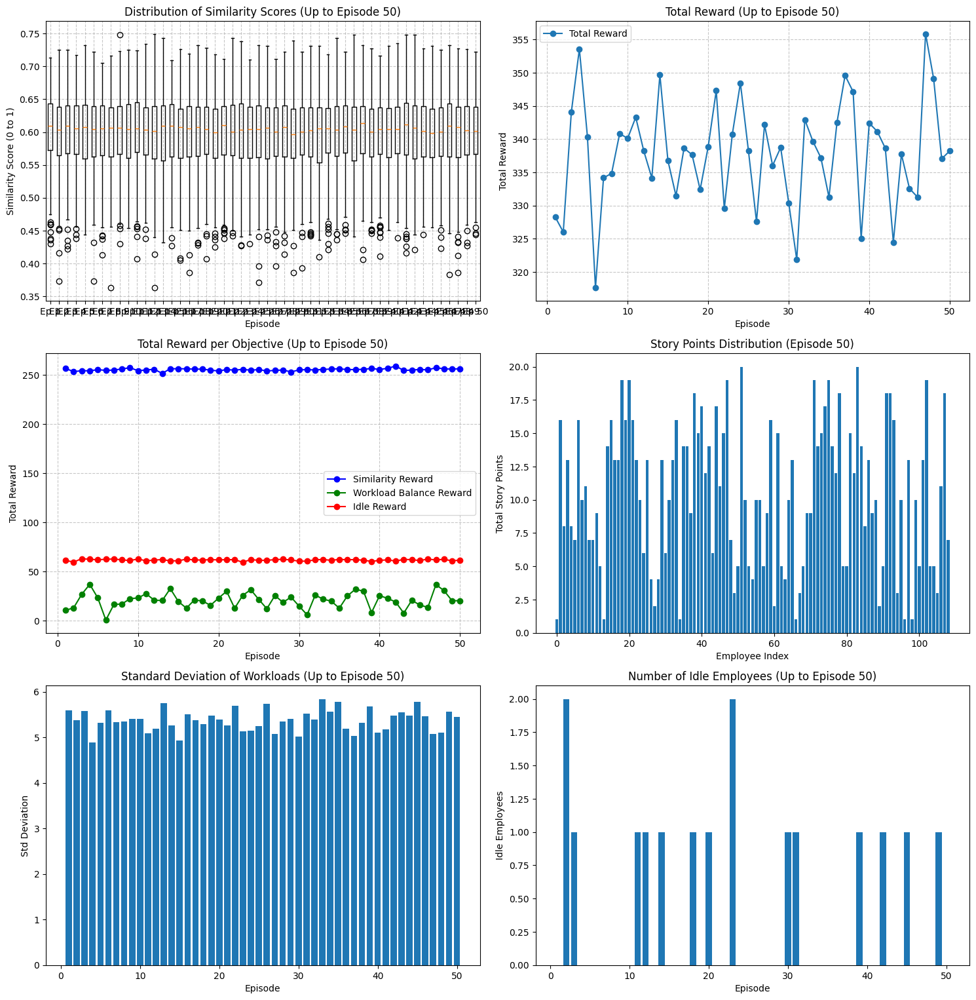

Episode 51/300, Temp: 0.779, Epsilon: 0.700
Step 10: Reward 0.3685, Time 0.05s, Num Idle: 101
Step 20: Reward 0.2863, Time 0.01s, Num Idle: 97
Step 30: Reward 0.3539, Time 0.01s, Num Idle: 89
Step 40: Reward 0.3422, Time 0.02s, Num Idle: 84
Step 50: Reward 0.3779, Time 0.06s, Num Idle: 78
Step 60: Reward 0.3939, Time 0.06s, Num Idle: 72
Step 70: Reward 0.3871, Time 0.01s, Num Idle: 66
Step 80: Reward 0.4511, Time 0.01s, Num Idle: 59
Step 90: Reward 0.4540, Time 0.01s, Num Idle: 55
Step 100: Reward 0.4905, Time 0.06s, Num Idle: 49
Step 110: Reward 0.4988, Time 0.06s, Num Idle: 44
Step 120: Reward 0.5080, Time 0.01s, Num Idle: 38
Step 130: Reward 0.5128, Time 0.07s, Num Idle: 34
Step 140: Reward 0.5117, Time 0.07s, Num Idle: 33
Step 150: Reward 0.5288, Time 0.02s, Num Idle: 28
Step 160: Reward 0.5404, Time 0.08s, Num Idle: 23
Step 170: Reward 0.5567, Time 0.01s, Num Idle: 17
Step 180: Reward 0.5473, Time 0.08s, Num Idle: 13
Step 190: Reward 0.5446, Time 0.01s, Num Idle: 11
Step 200: Rewa

In [ ]:
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import gym
from gym import spaces
import random
from collections import deque
import time
from torch.cuda.amp import GradScaler as AmpGradScaler
import matplotlib.pyplot as plt
import seaborn as sns
import uuid
import os

# Set device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Global Variables
MAX_TASKS = 500
MAX_EMPLOYEES = 200
NUM_EPISODES = 300
LEARNING_RATE = 3e-4
INITIAL_TEMPERATURE = 1.0
MIN_TEMPERATURE = 0.2
INITIAL_EPSILON = 1.0
MIN_EPSILON = 0.1
GAMMA = 0.99
MEMORY_SIZE = 50000
BATCH_SIZE = 64
TARGET_UPDATE_FREQ = 1000
DQN_HIDDEN_DIM = 256
MAX_WORKLOAD = 20
ALPHA_WED = 0.5
REASSIGNMENT_BONUS = 5.0  # Kurangi bonus agar tidak terlalu menguntungkan
REASSIGNMENT_THRESHOLD = 5.0
MAX_REASSIGN_PER_TASK = 3  # Batasi jumlah reassignment per tugas
STEP_PENALTY = -0.01  # Penalti per langkah untuk dorong efisiensi
COMPLETION_BONUS = 50.0  # Bonus saat episode selesai

SAVE_EPISODES = [50,100,150,200,250]
MAX_STEPS_PER_EPISODE = MAX_TASKS
TOTAL_STEPS = NUM_EPISODES * MAX_STEPS_PER_EPISODE
DECAY_RATE_TEMP = -np.log(MIN_TEMPERATURE / INITIAL_TEMPERATURE) / TOTAL_STEPS
DECAY_RATE_EPS = -np.log(MIN_EPSILON / INITIAL_EPSILON) / TOTAL_STEPS

task_data_path = '/content/drive/MyDrive/Skripsi/Resources/Datasets/fixed_data_task.csv'
employee_data_path = '/content/drive/MyDrive/Skripsi/Resources/Datasets/fixed_data_employee.csv'
model_save_path = '/content/drive/MyDrive/Skripsi/reassignment_finalcode_dqn_model.pth'
agent_save_path = '/content/drive/MyDrive/Skripsi/reassignment_finalcode_dqn_agent_params.pth'

# Direktori untuk menyimpan log CSV
log_dir = '/content/drive/MyDrive/Skripsi/Logs/'
os.makedirs(log_dir, exist_ok=True)

class TaskAssignmentEnv(gym.Env):
    def __init__(self, task_data, employee_data, max_tasks=MAX_TASKS, max_employees=MAX_EMPLOYEES):
        super(TaskAssignmentEnv, self).__init__()
        self.num_tasks = len(task_data)
        self.num_employees = len(employee_data)
        self.max_tasks = max_tasks
        self.max_employees = max_employees
        self.max_workload = MAX_WORKLOAD

        # Load dan preprocess data
        task_subset = task_data.iloc[:self.num_tasks]
        employee_subset = employee_data.iloc[:self.num_employees]
        skill_columns = [col for col in task_data.columns if col not in ['task_id', 'story_points', 'project_id']]
        project_id_map = {pid: idx + 1 for idx, pid in enumerate(task_subset['project_id'].unique())}
        project_ids = task_subset['project_id'].map(project_id_map).values
        task_skills_df = task_subset[skill_columns].fillna(0).astype(np.float32)
        employee_skills_df = employee_subset[skill_columns].fillna(0).astype(np.float32)
        story_points_df = task_subset['story_points'].astype(np.float32)

        self.task_skills = F.pad(
            torch.tensor(task_skills_df.values / 5.0, dtype=torch.float32, device=device),
            (0, 0, 0, max_tasks - self.num_tasks),
            'constant', 0
        )
        self.employee_skills = F.pad(
            torch.tensor(employee_skills_df.values / 5.0, dtype=torch.float32, device=device),
            (0, 0, 0, max_employees - self.num_employees),
            'constant', 0
        )
        self.story_points = F.pad(
            torch.tensor(story_points_df.values, dtype=torch.float32, device=device),
            (0, max_tasks - self.num_tasks),
            'constant', 0
        )
        self.project_ids = F.pad(
            torch.tensor(project_ids, dtype=torch.long, device=device),
            (0, max_tasks - self.num_tasks),
            'constant', -1
        )
        self.total_story_points = torch.sum(self.story_points[:self.num_tasks]).item()
        self.num_skills = len(skill_columns)

        # Define observation dan action spaces
        self.observation_space = spaces.Dict({
            'state_matrix': spaces.Box(low=0, high=1, shape=(max_tasks, 5), dtype=np.float32),
            'workload_matrix': spaces.Box(low=0, high=MAX_WORKLOAD, shape=(max_employees,), dtype=np.float32),
            'global_features': spaces.Box(low=0, high=1, shape=(3,), dtype=np.float32),
            'task_mask': spaces.Box(low=0, high=1, shape=(max_tasks,), dtype=np.float32)
        })
        self.action_space = spaces.MultiDiscrete([2, self.num_tasks, self.num_employees])
        self.reset()

    def reset(self, episode=None):
        self.workloads = torch.zeros(self.max_employees, device=device, dtype=torch.float32)
        self.assignments = torch.full((self.max_tasks,), -1, dtype=torch.long, device=device)
        self.remaining_tasks = torch.arange(self.num_tasks, device=device, dtype=torch.long)
        self.employee_projects = torch.full((self.max_employees,), -1, dtype=torch.long, device=device)
        self.wed_scores = []
        self.reassign_counts = torch.zeros(self.max_tasks, device=device, dtype=torch.long)  # Track jumlah reassignment per tugas
        self.total_reassigns = 0  # Track total reassignment dalam episode
        self._initialize_state_matrix()

        # Log reset state ke CSV
        if episode in [60, 61]:
            reset_data = {
                'Episode': episode,
                'Workloads': self.workloads[:self.num_employees].cpu().numpy().tolist(),
                'Assignments': self.assignments[:self.num_tasks].cpu().numpy().tolist(),
                'Remaining_Tasks': self.remaining_tasks.cpu().numpy().tolist()
            }
            reset_df = pd.DataFrame([reset_data])
            reset_df.to_csv(os.path.join(log_dir, f'reset_log_episode_{episode}.csv'), index=False)

        return self._get_obs()

    def _initialize_state_matrix(self):
        task_skills_expanded = self.task_skills[:self.num_tasks].unsqueeze(1).expand(-1, self.max_employees, -1)
        emp_skills_expanded = self.employee_skills.unsqueeze(0).expand(self.num_tasks, -1, -1)
        diff = emp_skills_expanded - task_skills_expanded
        weights = 1 / (1 + ALPHA_WED * torch.maximum(diff, torch.tensor(0.0, device=device, dtype=torch.float32)))
        mask = self.task_skills[:self.num_tasks].unsqueeze(1).expand(-1, self.max_employees, -1) > 0
        weighted_diff = weights * mask * (emp_skills_expanded - task_skills_expanded) ** 2
        wed = torch.sqrt(torch.sum(weighted_diff, dim=2))
        num_skills_per_task = torch.sum(self.task_skills[:self.num_tasks] > 0, dim=1).unsqueeze(1).expand(-1, self.max_employees)
        wed_worst = torch.sqrt(num_skills_per_task * (1.0 ** 2))
        wed_worst = torch.where(num_skills_per_task > 0, wed_worst, torch.tensor(1.0, device=device, dtype=torch.float32))
        similarity_matrix = (1 - (wed / wed_worst)).to(dtype=torch.float32)

        top_k = 5
        self.state_matrix = torch.topk(similarity_matrix, k=top_k, dim=1).values
        self.state_matrix = F.pad(self.state_matrix, (0, 0, 0, self.max_tasks - self.num_tasks), 'constant', 0)

    def _update_state_matrix(self, task_idx, emp_idx):
        task_skills_expanded = self.task_skills[task_idx].unsqueeze(0).expand(self.max_employees, -1)
        emp_skills_expanded = self.employee_skills.expand(self.max_employees, -1)
        diff = emp_skills_expanded - task_skills_expanded
        weights = 1 / (1 + ALPHA_WED * torch.maximum(diff, torch.tensor(0.0, device=device, dtype=torch.float32)))
        mask = task_skills_expanded > 0
        weighted_diff = weights * mask * (emp_skills_expanded - task_skills_expanded) ** 2
        wed = torch.sqrt(torch.sum(weighted_diff, dim=1))
        num_skills = torch.sum(mask.float(), dim=1)
        wed_worst = torch.sqrt(num_skills * (1.0 ** 2)) if num_skills[0] > 0 else 1.0
        similarities = 1 - (wed / wed_worst)
        top_k_similarities = torch.topk(similarities, k=5, dim=0).values
        self.state_matrix[task_idx] = top_k_similarities

    def _get_obs(self):
        workload_matrix = self.workloads
        prop_remaining = len(self.remaining_tasks) / self.num_tasks if self.num_tasks > 0 else 0.0
        num_idle = torch.sum(self.workloads[:self.num_employees] == 0).item()
        prop_idle = num_idle / self.num_employees if self.num_employees > 0 else 0.0
        std_workload = torch.std(self.workloads[:self.num_employees]).item() / self.max_workload

        global_features = torch.tensor([prop_remaining, prop_idle, std_workload], device=device, dtype=torch.float32)

        task_mask = torch.zeros(self.max_tasks, device=device, dtype=torch.float32)
        if len(self.remaining_tasks) > 0:
            task_mask[self.remaining_tasks] = 1

        return {
            'state_matrix': self.state_matrix,
            'workload_matrix': workload_matrix,
            'global_features': global_features,
            'task_mask': task_mask
        }

    def step(self, action, episode=None, step=None):
        action_type, task_idx, emp_idx = action
        done = False
        reward = {'similarity': 0.0, 'workload': 0.0, 'idle': 0.0}
        info = {'action_valid': True}

        if emp_idx < 0 or emp_idx >= self.num_employees or task_idx < 0 or task_idx >= self.num_tasks:
            reward['similarity'] = -1.0
            info['action_valid'] = False
            info['invalid_action'] = 'Invalid task or employee index'
            return self._get_obs(), reward, done, info

        # Hitung std workloads sebelum aksi
        current_std = torch.std(self.workloads[:self.num_employees]).item()

        if action_type == 0:
            if task_idx not in self.remaining_tasks:
                reward['similarity'] = -1.0
                info['action_valid'] = False
                info['invalid_action'] = 'Task already assigned'
                return self._get_obs(), reward, done, info

            task_project = self.project_ids[task_idx]
            emp_project = self.employee_projects[emp_idx]
            current_workload = self.workloads[emp_idx]

            if emp_project != -1 and emp_project != task_project:
                reward['similarity'] = -1.0
                info['action_valid'] = False
                info['invalid_action'] = 'Different project'
                return self._get_obs(), reward, done, info

            if current_workload + self.story_points[task_idx] > self.max_workload:
                reward['similarity'] = -1.0
                info['action_valid'] = False
                info['invalid_action'] = 'Exceeds workload'
                return self._get_obs(), reward, done, info

            was_idle = (self.workloads[emp_idx] == 0)
            self.assignments[task_idx] = emp_idx
            self.workloads[emp_idx] += self.story_points[task_idx]
            self.remaining_tasks = self.remaining_tasks[self.remaining_tasks != task_idx]
            if self.employee_projects[emp_idx] == -1:
                self.employee_projects[emp_idx] = task_project

            self._update_state_matrix(task_idx, emp_idx)

        elif action_type == 1:
            if task_idx in self.remaining_tasks:
                reward['similarity'] = -1.0
                info['action_valid'] = False
                info['invalid_action'] = 'Task not yet assigned'
                return self._get_obs(), reward, done, info

            # Periksa batas reassignment
            if self.reassign_counts[task_idx] >= MAX_REASSIGN_PER_TASK:
                reward['similarity'] = -1.0
                info['action_valid'] = False
                info['invalid_action'] = 'Max reassignment limit reached for this task'
                return self._get_obs(), reward, done, info

            current_emp_idx = self.assignments[task_idx]
            if current_emp_idx == emp_idx:
                reward['similarity'] = -1.0
                info['action_valid'] = False
                info['invalid_action'] = 'Task already assigned to this employee'
                return self._get_obs(), reward, done, info

            task_project = self.project_ids[task_idx]
            emp_project = self.employee_projects[emp_idx]
            current_workload = self.workloads[emp_idx]

            if emp_project != -1 and emp_project != task_project:
                reward['similarity'] = -1.0
                info['action_valid'] = False
                info['invalid_action'] = 'Different project for new employee'
                return self._get_obs(), reward, done, info

            if current_workload + self.story_points[task_idx] > self.max_workload:
                reward['similarity'] = -1.0
                info['action_valid'] = False
                info['invalid_action'] = 'Exceeds workload for new employee'
                return self._get_obs(), reward, done, info

            self.workloads[current_emp_idx] -= self.story_points[task_idx]
            emp_tasks = (self.assignments == current_emp_idx) & (self.project_ids == task_project)
            emp_tasks[task_idx] = False
            if not torch.any(emp_tasks):
                self.employee_projects[current_emp_idx] = -1

            was_idle = (self.workloads[emp_idx] == 0)
            self.assignments[task_idx] = emp_idx
            self.workloads[emp_idx] += self.story_points[task_idx]
            if self.employee_projects[emp_idx] == -1:
                self.employee_projects[emp_idx] = task_project

            self.reassign_counts[task_idx] += 1
            self.total_reassigns += 1

            self._update_state_matrix(task_idx, emp_idx)

        else:
            reward['similarity'] = -1.0
            info['action_valid'] = False
            info['invalid_action'] = 'Invalid action type'
            return self._get_obs(), reward, done, info

        # Hitung std workloads setelah aksi dan berikan reward intermediate
        new_std = torch.std(self.workloads[:self.num_employees]).item()
        std_change = new_std - current_std
        workload_delta = 0.0
        if std_change < 0:
            reward['workload'] += 0.5
            workload_delta = 0.5
        elif std_change > 0:
            reward['workload'] -= 0.3
            workload_delta = -0.3

        # Hitung reward similarity
        task_skills_t = self.task_skills[task_idx]
        emp_skills_e = self.employee_skills[emp_idx]
        diff = emp_skills_e - task_skills_t
        weights = 1 / (1 + ALPHA_WED * torch.maximum(diff, torch.tensor(0.0, device=device, dtype=torch.float32)))
        mask = task_skills_t > 0
        weighted_diff = weights[mask] * (emp_skills_e[mask] - task_skills_t[mask]) ** 2
        wed = torch.sqrt(torch.sum(weighted_diff))

        num_skills = torch.sum(mask.float())
        wed_worst = torch.sqrt(num_skills * (1.0 ** 2)) if num_skills > 0 else 1.0
        similarity = 1 - (wed / wed_worst) if wed_worst > 0 else 0.0
        info['similarity'] = similarity.item()
        self.wed_scores.append(wed.item())

        if action_type == 0:
            reward['similarity'] = similarity.item()
            if was_idle:
                reward['idle'] = 0.1
        else:
            # Kurangi reward reassignment berdasarkan jumlah reassignment untuk tugas ini
            reassign_decay = 0.5 ** self.reassign_counts[task_idx].item()  # Decay eksponensial
            if std_change < 0:
                reward['similarity'] = (REASSIGNMENT_BONUS * abs(std_change)) * reassign_decay
            else:
                reward['similarity'] = 0.0

        # Penalti per langkah untuk dorong efisiensi
        reward['similarity'] += STEP_PENALTY

        if len(self.remaining_tasks) == 0:
            done = True

            # Bonus untuk menyelesaikan episode
            reward['similarity'] += COMPLETION_BONUS

            assigned_tasks = torch.where(self.assignments != -1)[0]
            total_similarity = 0.0
            for task_idx in assigned_tasks:
                emp_idx = self.assignments[task_idx].item()
                task_skills_t = self.task_skills[task_idx]
                emp_skills_e = self.employee_skills[emp_idx]
                diff = emp_skills_e - task_skills_t
                weights = 1 / (1 + ALPHA_WED * torch.maximum(diff, torch.tensor(0.0, device=device, dtype=torch.float32)))
                mask = task_skills_t > 0
                weighted_diff = weights[mask] * (emp_skills_e[mask] - task_skills_t[mask]) ** 2
                wed = torch.sqrt(torch.sum(weighted_diff))
                num_skills = torch.sum(mask.float())
                wed_worst = torch.sqrt(num_skills * (1.0 ** 2)) if num_skills > 0 else 1.0
                similarity = 1 - (wed / wed_worst) if wed_worst > 0 else 0.0
                total_similarity += similarity
            avg_similarity = (total_similarity / self.num_tasks if self.num_tasks > 0 else 0.0).item()
            reward['similarity'] += 50.0 * (2.0 * avg_similarity - 1.0)

            std_workload = torch.std(self.workloads[:self.num_employees]).item()
            max_std = self.max_workload / 2
            normalized_std = std_workload / max_std if max_std > 0 else 0.0
            reward['workload'] = 100.0 * (1.0 - 2.0 * normalized_std)

            num_idle = torch.sum(self.workloads[:self.num_employees] == 0).item()
            idle_ratio = num_idle / self.num_employees
            reward['idle'] += 50.0 * (1.0 - 2.0 * idle_ratio)

            info['avg_similarity'] = avg_similarity
            info['std_workload'] = std_workload
            info['num_idle'] = num_idle

        # Log step data ke CSV untuk episode 60 dan 61
        if episode in [60, 61]:
            step_data = {
                'Episode': episode,
                'Step': step,
                'Action_Type': action_type,
                'Task_Idx': task_idx,
                'Emp_Idx': emp_idx,
                'Similarity_Reward': reward['similarity'],
                'Workload_Reward': reward['workload'],
                'Workload_Delta': workload_delta,
                'Idle_Reward': reward['idle'],
                'Workloads': self.workloads[:self.num_employees].cpu().numpy().tolist(),
                'Idle_Employees': torch.sum(self.workloads[:self.num_employees] == 0).item(),
                'Std_Workload': new_std,
                'State_Matrix_Mean': self.state_matrix.mean().item(),
                'Workload_Matrix_Mean': self.workloads.mean().item(),
                'Task_Mask_Sum': self._get_obs()['task_mask'].sum().item(),
                'Reassign_Counts': self.reassign_counts[:self.num_tasks].cpu().numpy().tolist(),
                'Total_Reassigns': self.total_reassigns
            }
            step_df = pd.DataFrame([step_data])
            csv_path = os.path.join(log_dir, f'step_log_episode_{episode}.csv')
            if step == 1 and os.path.exists(csv_path):
                os.remove(csv_path)
            step_df.to_csv(csv_path, mode='a', header=not os.path.exists(csv_path), index=False)

        return self._get_obs(), reward, done, info

class DQN(nn.Module):
    def __init__(self, input_dim, max_employees, max_tasks, num_employees, num_tasks):
        super(DQN, self).__init__()
        self.max_employees = max_employees
        self.max_tasks = max_tasks
        self.num_employees = num_employees
        self.num_tasks = num_tasks
        self.fc_state = nn.Linear(max_tasks * 5, 128).to(device, dtype=torch.float32)
        self.fc_workload = nn.Linear(max_employees, 64).to(device, dtype=torch.float32)
        self.fc_global = nn.Linear(3, 16).to(device, dtype=torch.float32)
        self.fc_combined = nn.Linear(128 + 64 + 16, DQN_HIDDEN_DIM).to(device, dtype=torch.float32)
        self.fc2 = nn.Linear(DQN_HIDDEN_DIM, DQN_HIDDEN_DIM // 2).to(device, dtype=torch.float32)
        self.fc3 = nn.Linear(DQN_HIDDEN_DIM // 2, 2 * max_tasks * max_employees).to(device, dtype=torch.float32)

    def forward(self, state_matrix, workload_matrix, global_features):
        batch_size = state_matrix.size(0)
        state_input = state_matrix.view(batch_size, -1)
        state_input = F.relu(self.fc_state(state_input))
        workload_input = workload_matrix.view(batch_size, -1)
        workload_input = F.relu(self.fc_workload(workload_input))
        global_input = global_features.view(batch_size, -1)
        global_input = F.relu(self.fc_global(global_input))

        x = torch.cat([state_input, workload_input, global_input], dim=1)
        x = F.relu(self.fc_combined(x))
        x = F.relu(self.fc2(x))
        q_values = self.fc3(x).view(batch_size, 2, self.max_tasks, self.max_employees)

        q_values[:, :, self.num_tasks:, :] = -float('inf')
        q_values[:, :, :, self.num_employees:] = -float('inf')
        return q_values

class DQNAgent:
    def __init__(self, num_tasks, num_employees, max_tasks=MAX_TASKS, max_employees=MAX_EMPLOYEES):
        self.device = device
        self.num_tasks = num_tasks
        self.num_employees = num_employees
        self.max_tasks = max_tasks
        self.max_employees = max_employees
        self.input_dim = 1 + 1 + 1 + 4
        self.model = DQN(self.input_dim, self.max_employees, self.max_tasks, self.num_employees, self.num_tasks).to(device)
        self.target_model = DQN(self.input_dim, self.max_employees, self.max_tasks, self.num_employees, self.num_tasks).to(device)
        self.target_model.load_state_dict(self.model.state_dict())
        self.optimizer = torch.optim.Adam(self.model.parameters(), lr=LEARNING_RATE)
        self.memory = deque(maxlen=MEMORY_SIZE)
        self.batch_size = BATCH_SIZE
        self.temperature = INITIAL_TEMPERATURE
        self.epsilon = INITIAL_EPSILON
        self.gamma = GAMMA
        self.global_step = 0
        self.scaler = torch.amp.GradScaler('cuda')

    def update_temp_eps(self):
        self.global_step += 1
        self.temperature = max(MIN_TEMPERATURE, INITIAL_TEMPERATURE * np.exp(-DECAY_RATE_TEMP * self.global_step))
        self.epsilon = max(MIN_EPSILON, INITIAL_EPSILON * np.exp(-DECAY_RATE_EPS * self.global_step))

    def act(self, obs, env, episode=None, step=None):
        valid_tasks = torch.where(obs['task_mask'][:self.num_tasks] == 1)[0]
        assigned_tasks = torch.where(env.assignments[:self.num_tasks] != -1)[0]

        # Hitung std dev workload dan total reassignment
        std_workload = torch.std(env.workloads[:self.num_employees]).item()

        # Log untuk debug
        if episode is not None and step is not None:
            debug_data = {
                'Episode': episode,
                'Step': step,
                'Valid_Tasks': valid_tasks.cpu().numpy().tolist(),
                'Assigned_Tasks': assigned_tasks.cpu().numpy().tolist(),
                'Task_Mask_Sum': obs['task_mask'].sum().item()
            }
            debug_df = pd.DataFrame([debug_data])
            debug_csv_path = os.path.join(log_dir, f'debug_act_log_episode_{episode}.csv')
            if step == 1 and os.path.exists(debug_csv_path):
                os.remove(debug_csv_path)
            debug_df.to_csv(debug_csv_path, mode='a', header=not os.path.exists(debug_csv_path), index=False)

        # Inisialisasi default action
        action_type = 0
        task_idx = 0
        emp_idx = 0

        if len(valid_tasks) == 0 and len(assigned_tasks) == 0:
            return [action_type, task_idx, emp_idx]

        # Sesuaikan probabilitas reassignment berdasarkan jumlah reassignment
        reassign_prob = 0.5 if (std_workload > REASSIGNMENT_THRESHOLD or torch.sum(env.workloads[:self.num_employees] == 0) > 0) else 0.1
        reassign_prob *= max(0.1, 1.0 - (env.total_reassigns / 300.0))  # Kurangi probabilitas seiring bertambahnya reassignment

        if random.random() < self.epsilon:
            if len(valid_tasks) > 0:
                max_attempts = 10
                for _ in range(max_attempts):
                    task_idx = random.choice(valid_tasks.cpu().numpy())
                    valid_emps = torch.where(
                        (env.workloads[:self.num_employees] + env.story_points[task_idx] <= env.max_workload) &
                        ((env.employee_projects[:self.num_employees] == -1) | (env.employee_projects[:self.num_employees] == env.project_ids[task_idx]))
                    )[0]
                    if valid_emps.size(0) > 0:
                        emp_idx = random.choice(valid_emps.cpu().numpy())
                        action_type = 0
                        break
            if action_type == 0 and len(valid_tasks) > 0 and random.random() < reassign_prob:
                # Hanya coba reassign kalau assign gagal atau probabilitas memungkinkan
                assignable_tasks = [t for t in assigned_tasks.cpu().numpy() if env.reassign_counts[t] < MAX_REASSIGN_PER_TASK]
                if len(assignable_tasks) > 0:
                    max_attempts = 10
                    for _ in range(max_attempts):
                        task_idx = random.choice(assignable_tasks)
                        current_emp_idx = env.assignments[task_idx].item()
                        valid_emps = torch.where(
                            (torch.arange(self.num_employees, device=device) != current_emp_idx) &
                            (env.workloads[:self.num_employees] + env.story_points[task_idx] <= env.max_workload) &
                            ((env.employee_projects[:self.num_employees] == -1) | (env.employee_projects[:self.num_employees] == env.project_ids[task_idx]))
                        )[0]
                        if valid_emps.size(0) > 0:
                            emp_idx = random.choice(valid_emps.cpu().numpy())
                            action_type = 1
                            break
        else:
            state_matrix = obs['state_matrix'].unsqueeze(0).to(dtype=torch.float32)
            workload_matrix = obs['workload_matrix'].unsqueeze(0).to(dtype=torch.float32)
            global_features = obs['global_features'].unsqueeze(0).to(dtype=torch.float32)

            with torch.no_grad():
                q_values = self.model(state_matrix, workload_matrix, global_features)

                task_mask = torch.zeros(self.max_tasks, device=device, dtype=torch.bool)
                task_mask[valid_tasks] = 1
                emp_mask = torch.ones(self.max_tasks, self.max_employees, device=device, dtype=torch.bool)
                for t in range(self.num_tasks):
                    emp_mask[t, :self.num_employees] = (
                        (env.workloads[:self.num_employees] + env.story_points[t] <= env.max_workload) &
                        ((env.employee_projects[:self.num_employees] == -1) | (env.employee_projects[:self.num_employees] == env.project_ids[t]))
                    )
                    emp_mask[t, self.num_employees:] = False

                assign_mask = torch.zeros_like(q_values, dtype=torch.bool)
                assign_mask[:, 0] = task_mask.unsqueeze(-1).expand(-1, self.max_employees) & emp_mask

                reassign_mask = torch.zeros_like(q_values, dtype=torch.bool)
                for t in assigned_tasks:
                    if env.reassign_counts[t] < MAX_REASSIGN_PER_TASK:
                        current_emp_idx = env.assignments[t].item()
                        reassign_emp_mask = emp_mask[t].clone()
                        reassign_emp_mask[current_emp_idx] = False
                        reassign_mask[0, 1, t] = reassign_emp_mask

                combined_mask = assign_mask | reassign_mask
                q_values[~combined_mask] = -float('inf')

                if std_workload > REASSIGNMENT_THRESHOLD:
                    q_values[:, 1, :, :] += 2.0  # Kurangi bias untuk reassignment

                if torch.all(q_values == -float('inf')):
                    if len(valid_tasks) > 0:
                        max_attempts = 10
                        for _ in range(max_attempts):
                            task_idx = random.choice(valid_tasks.cpu().numpy())
                            valid_emps = torch.where(
                                (env.workloads[:self.num_employees] + env.story_points[task_idx] <= env.max_workload) &
                                ((env.employee_projects[:self.num_employees] == -1) | (env.employee_projects[:self.num_employees] == env.project_ids[task_idx]))
                            )[0]
                            if valid_emps.size(0) > 0:
                                emp_idx = random.choice(valid_emps.cpu().numpy())
                                action_type = 0
                                break
                    elif len(assigned_tasks) > 0:
                        assignable_tasks = [t for t in assigned_tasks.cpu().numpy() if env.reassign_counts[t] < MAX_REASSIGN_PER_TASK]
                        if len(assignable_tasks) > 0:
                            max_attempts = 10
                            for _ in range(max_attempts):
                                task_idx = random.choice(assignable_tasks)
                                current_emp_idx = env.assignments[task_idx].item()
                                valid_emps = torch.where(
                                    (torch.arange(self.num_employees, device=device) != current_emp_idx) &
                                    (env.workloads[:self.num_employees] + env.story_points[task_idx] <= env.max_workload) &
                                    ((env.employee_projects[:self.num_employees] == -1) | (env.employee_projects[:self.num_employees] == env.project_ids[task_idx]))
                                )[0]
                                if valid_emps.size(0) > 0:
                                    emp_idx = random.choice(valid_emps.cpu().numpy())
                                    action_type = 1
                                    break
                else:
                    action_idx = torch.argmax(q_values.view(-1)).item()
                    action_type = action_idx // (self.max_tasks * self.max_employees)
                    task_emp_idx = action_idx % (self.max_tasks * self.max_employees)
                    task_idx = task_emp_idx // self.max_employees
                    emp_idx = task_emp_idx % self.max_employees

        return [action_type, task_idx, emp_idx]

    def remember(self, state, action, reward, next_state, done):
        self.memory.append((state, action, reward, next_state, done))

    def replay(self, env):
        if len(self.memory) < self.batch_size:
            return
        batch = random.sample(self.memory, self.batch_size)
        states, actions, rewards, next_states, dones = zip(*batch)

        state_matrices = torch.stack([s['state_matrix'] for s in states]).to(dtype=torch.float32)
        workload_matrices = torch.stack([s['workload_matrix'] for s in states]).to(dtype=torch.float32)
        global_features = torch.stack([s['global_features'] for s in states]).to(dtype=torch.float32)
        next_state_matrices = torch.stack([s['state_matrix'] for s in next_states]).to(dtype=torch.float32)
        next_workload_matrices = torch.stack([s['workload_matrix'] for s in next_states]).to(dtype=torch.float32)
        next_global_features = torch.stack([s['global_features'] for s in next_states]).to(dtype=torch.float32)

        actions = torch.tensor(actions, dtype=torch.long, device=self.device)
        rewards = torch.tensor([r['similarity'] + r['workload'] + r['idle'] for r in rewards], dtype=torch.float32, device=self.device)
        dones = torch.tensor(dones, dtype=torch.float32, device=self.device)

        action_types = actions[:, 0]
        task_idx = actions[:, 1]
        emp_idx = actions[:, 2]
        batch_indices = torch.arange(self.batch_size, device=self.device)

        with torch.amp.autocast('cuda'):
            self.optimizer.zero_grad()
            q_values = self.model(state_matrices, workload_matrices, global_features)
            q_values_selected = q_values[batch_indices, action_types, task_idx, emp_idx]

            next_q_values = self.target_model(next_state_matrices, next_workload_matrices, next_global_features)
            next_q_values_max = next_q_values.view(self.batch_size, -1).max(dim=1)[0]
            targets = rewards + (1 - dones) * self.gamma * next_q_values_max

            loss = F.mse_loss(q_values_selected, targets)

        self.scaler.scale(loss).backward()
        self.scaler.step(self.optimizer)
        self.scaler.update()

    def update_target(self):
        self.target_model.load_state_dict(self.model.state_dict())

    def save(self, model_path, agent_path):
        torch.save({
            'model_state_dict': self.model.state_dict(),
            'target_model_state_dict': self.target_model.state_dict(),
            'optimizer_state_dict': self.optimizer.state_dict()
        }, model_path)
        torch.save({'temperature': self.temperature, 'epsilon': self.epsilon}, agent_path)

    def load(self, model_path, agent_path):
        checkpoint = torch.load(model_path)
        self.model.load_state_dict(checkpoint['model_state_dict'])
        self.target_model.load_state_dict(checkpoint['target_model_state_dict'])
        self.optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
        agent_params = torch.load(agent_path)
        self.temperature = agent_params['temperature']
        self.epsilon = agent_params['epsilon']
        self.memory = deque(maxlen=MEMORY_SIZE)

def plot_and_summarize(episode_data, wed_scores_list, total_rewards, similarity_rewards,
                      workload_balance_rewards, idle_rewards, workloads_list,
                      std_workloads_list, idle_employees_list, env, num_episodes_to_plot, checkpoint_episode=None):
    print(f"\nTabular Summary of Rewards up to Episode {num_episodes_to_plot}:")
    print("-" * 80)
    print(f"{'Episode':<10} {'Total Reward':<15} {'Similarity':<15} {'Workload':<15} {'Idle':<15} {'Std Dev':<10} {'Idle Emp':<10}")
    print("-" * 80)
    for data in episode_data:
        if data['Episode'] <= num_episodes_to_plot:
            print(f"{data['Episode']:<10} {data['Total Reward']:<15.4f} {data['Similarity Reward']:<15.4f} {data['Workload Balance Reward']:<15.4f} {data['Idle Reward']:<15.4f} {data['Std Workloads']:<10.4f} {data['Idle Employees']:<10}")
    print("-" * 80)

    plt.figure(figsize=(15, 20))

    plt.subplot(4, 2, 1)
    alpha = ALPHA_WED
    weights_worst = 1 / (1 + alpha * 1)
    wed_raw_worst = np.sqrt(np.sum(weights_worst * (0 - 1) ** 2) * env.num_skills)
    wed_raw_best = 0
    standardized_similarities_per_episode = []
    for episode_wed_scores in wed_scores_list[:num_episodes_to_plot]:
        similarities = [(wed_raw_worst - wed) / (wed_raw_worst - wed_raw_best) for wed in episode_wed_scores]
        standardized_similarities_per_episode.append(similarities)
    plt.boxplot(standardized_similarities_per_episode, tick_labels=[f"Ep {i+1}" for i in range(num_episodes_to_plot)])
    plt.title(f'Distribution of Similarity Scores (Up to Episode {num_episodes_to_plot})')
    plt.xlabel('Episode')
    plt.ylabel('Similarity Score (0 to 1)')
    plt.grid(True, linestyle='--', alpha=0.7)

    plt.subplot(4, 2, 2)
    plt.plot(range(1, num_episodes_to_plot + 1), np.array(total_rewards[:num_episodes_to_plot]), marker='o', label='Total Reward')
    plt.title(f'Total Reward (Up to Episode {num_episodes_to_plot})')
    plt.xlabel('Episode')
    plt.ylabel('Total Reward')
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.legend()

    plt.subplot(4, 2, 3)
    plt.plot(range(1, num_episodes_to_plot + 1), np.array(similarity_rewards[:num_episodes_to_plot]), marker='o', label='Similarity Reward', color='blue')
    plt.plot(range(1, num_episodes_to_plot + 1), np.array(workload_balance_rewards[:num_episodes_to_plot]), marker='o', label='Workload Balance Reward', color='green')
    plt.plot(range(1, num_episodes_to_plot + 1), np.array(idle_rewards[:num_episodes_to_plot]), marker='o', label='Idle Reward', color='red')
    plt.title(f'Total Reward per Objective (Up to Episode {num_episodes_to_plot})')
    plt.xlabel('Episode')
    plt.ylabel('Total Reward')
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.legend()

    plt.subplot(4, 2, 4)
    workloads = np.array(workloads_list[num_episodes_to_plot - 1][:env.num_employees])
    plt.bar(range(env.num_employees), workloads)
    plt.title(f'Story Points Distribution (Episode {num_episodes_to_plot})')
    plt.xlabel('Employee Index')
    plt.ylabel('Total Story Points')

    plt.subplot(4, 2, 5)
    plt.bar(range(1, num_episodes_to_plot + 1), np.array(std_workloads_list[:num_episodes_to_plot]))
    plt.title(f'Standard Deviation of Workloads (Up to Episode {num_episodes_to_plot})')
    plt.xlabel('Episode')
    plt.ylabel('Std Deviation')

    plt.subplot(4, 2, 6)
    plt.bar(range(1, num_episodes_to_plot + 1), np.array(idle_employees_list[:num_episodes_to_plot]))
    plt.title(f'Number of Idle Employees (Up to Episode {num_episodes_to_plot})')
    plt.xlabel('Episode')
    plt.ylabel('Idle Employees')
    plt.ylim(bottom=0)

    plt.tight_layout()
    filename = f'reassignment_finalcode_training_metrics_eps{checkpoint_episode}.png' if checkpoint_episode else 'reassignment_finalcode_training_metrics_final.png'
    plt.savefig(filename)
    print(f"Training metrics plot saved to '{filename}'")
    plt.show()

def train_dqn(task_data_path, employee_data_path):
    task_data = pd.read_csv(task_data_path)
    employee_data = pd.read_csv(employee_data_path)
    env = TaskAssignmentEnv(task_data, employee_data)
    agent = DQNAgent(env.num_tasks, env.num_employees)
    total_rewards = []
    wed_scores_list = []
    workloads_list = []
    std_workloads_list = []
    idle_employees_list = []
    similarity_rewards = []
    workload_balance_rewards = []
    idle_rewards = []
    global_step = 0
    episode_data = []

    action_distribution = []
    exploration_params = []

    for episode in range(NUM_EPISODES):
        obs = env.reset(episode=episode + 1)
        total_reward = 0
        episode_similarity = 0
        episode_workload_balance = 0
        episode_idle_reward = 0
        invalid_actions = 0
        done = False
        step = 0

        action_counts = {'assign': 0, 'reassign': 0, 'emp_assignments': torch.zeros(env.num_employees)}

        print(f"Episode {episode+1}/{NUM_EPISODES}, Temp: {agent.temperature:.3f}, Epsilon: {agent.epsilon:.3f}")
        while not done:
            step += 1
            global_step += 1
            start_time = time.time()
            action = agent.act(obs, env, episode=episode + 1, step=step)
            next_obs, reward, done, info = env.step(action, episode=episode + 1, step=step)
            agent.remember(obs, action, reward, next_obs, done)
            agent.replay(env)
            obs = next_obs

            total_reward += sum(reward.values())
            episode_similarity += reward['similarity']
            episode_workload_balance += reward['workload']
            episode_idle_reward += reward['idle']

            action_type, _, emp_idx = action
            if action_type == 0:
                action_counts['assign'] += 1
            else:
                action_counts['reassign'] += 1
            action_counts['emp_assignments'][emp_idx] += 1

            if not info.get('action_valid', True):
                invalid_actions += 1

            num_idle = torch.sum(env.workloads[:env.num_employees] == 0).item()
            if step % 10 == 0:
                print(f"Step {step}: Reward {total_reward/step:.4f}, Time {step_time:.2f}s, Num Idle: {num_idle}")

            step_time = time.time() - start_time

            agent.update_temp_eps()
            if global_step % TARGET_UPDATE_FREQ == 0:
                agent.update_target()

        wed_scores_list.append(env.wed_scores)

        workloads_list.append(env.workloads[:env.num_employees].clone().cpu().numpy())
        std_workloads = info.get('std_workload', torch.std(env.workloads[:env.num_employees]).item())
        num_idle = info.get('num_idle', torch.sum(env.workloads[:env.num_employees] == 0).item())
        std_workloads_list.append(std_workloads)
        idle_employees_list.append(max(num_idle, 0))
        total_rewards.append(total_reward)
        similarity_rewards.append(episode_similarity)
        workload_balance_rewards.append(episode_workload_balance)
        idle_rewards.append(episode_idle_reward)

        print(f"Episode {episode+1} - Steps: {step}, Total Reward: {total_reward:.2f}, Std Workloads: {std_workloads:.2f}, Idle: {num_idle}, Invalid Actions: {invalid_actions}")
        print(f"Total Similarity Reward: {episode_similarity:.2f}, Workload Balance Reward: {episode_workload_balance:.2f}, Idle Reward: {episode_idle_reward:.2f}")

        episode_data.append({
            'Episode': episode + 1,
            'Total Reward': total_reward,
            'Similarity Reward': episode_similarity,
            'Workload Balance Reward': episode_workload_balance,
            'Idle Reward': episode_idle_reward,
            'Std Workloads': std_workloads,
            'Idle Employees': max(num_idle, 0)
        })

        action_dist_data = {
            'Episode': episode + 1,
            'Assign_Count': action_counts['assign'],
            'Reassign_Count': action_counts['reassign'],
            'Emp_Assignments': action_counts['emp_assignments'].cpu().numpy().tolist()
        }
        action_distribution.append(action_dist_data)

        exploration_data = {
            'Episode': episode + 1,
            'Epsilon': agent.epsilon,
            'Temperature': agent.temperature
        }
        exploration_params.append(exploration_data)

        action_dist_df = pd.DataFrame(action_distribution)
        action_dist_df.to_csv(os.path.join(log_dir, 'finalcode_action_distribution.csv'), index=False)

        exploration_df = pd.DataFrame(exploration_params)
        exploration_df.to_csv(os.path.join(log_dir, 'finalcode_exploration_params.csv'), index=False)

        if episode + 1 in SAVE_EPISODES:
            print(f"\nCheckpoint at Episode {episode + 1}")
            plot_and_summarize(
                episode_data=episode_data,
                wed_scores_list=wed_scores_list,
                total_rewards=total_rewards,
                similarity_rewards=similarity_rewards,
                workload_balance_rewards=workload_balance_rewards,
                idle_rewards=idle_rewards,
                workloads_list=workloads_list,
                std_workloads_list=std_workloads_list,
                idle_employees_list=idle_employees_list,
                env=env,
                num_episodes_to_plot=episode + 1,
                checkpoint_episode=episode + 1
            )
            checkpoint_model_path = f"/content/drive/MyDrive/Skripsi/reassignment_finalcode_dqn_model_eps{episode + 1}.pth"
            checkpoint_agent_path = f"/content/drive/MyDrive/Skripsi/reassignment_finalcode_dqn_agent_params_eps{episode + 1}.pth"
            agent.save(checkpoint_model_path, checkpoint_agent_path)

    agent.save(model_save_path, agent_save_path)

    plot_and_summarize(
        episode_data=episode_data,
        wed_scores_list=wed_scores_list,
        total_rewards=total_rewards,
        similarity_rewards=similarity_rewards,
        workload_balance_rewards=workload_balance_rewards,
        idle_rewards=idle_rewards,
        workloads_list=workloads_list,
        std_workloads_list=std_workloads_list,
        idle_employees_list=idle_employees_list,
        env=env,
        num_episodes_to_plot=NUM_EPISODES
    )

    return env, workloads_list, std_workloads_list, idle_employees_list, NUM_EPISODES, episode_data, agent

# Run training
env, workloads_list, std_workloads_list, idle_employees_list, num_episodes, episode_data, trained_agent = train_dqn(task_data_path, employee_data_path)

## Simplified state and reward normalization

In [ ]:
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import gym
from gym import spaces
import random
from collections import deque
import time
from torch.cuda.amp import GradScaler as AmpGradScaler
import matplotlib.pyplot as plt
import seaborn as sns
import uuid
import os

# Set device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Global Variables
MAX_TASKS = 500
MAX_EMPLOYEES = 200
NUM_EPISODES = 300
LEARNING_RATE = 3e-4
INITIAL_TEMPERATURE = 1.0
MIN_TEMPERATURE = 0.2
INITIAL_EPSILON = 1.0
MIN_EPSILON = 0.1
GAMMA = 0.99
MEMORY_SIZE = 50000
BATCH_SIZE = 64
TARGET_UPDATE_FREQ = 1000
DQN_HIDDEN_DIM = 256
MAX_WORKLOAD = 20
ALPHA_WED = 0.5
REASSIGNMENT_BONUS = 2.0  # Reduced to balance rewards
REASSIGNMENT_THRESHOLD = 3.0  # Lowered to encourage reassignment
MAX_REASSIGN_PER_TASK = 3
STEP_PENALTY = -0.002  # Further reduced
COMPLETION_BONUS = 1.0

SAVE_EPISODES = [50, 100, 150, 200, 250]
MAX_STEPS_PER_EPISODE = MAX_TASKS
TOTAL_STEPS = NUM_EPISODES * MAX_STEPS_PER_EPISODE
DECAY_RATE_TEMP = -np.log(MIN_TEMPERATURE / INITIAL_TEMPERATURE) / TOTAL_STEPS
DECAY_RATE_EPS = -np.log(MIN_EPSILON / INITIAL_EPSILON) / (TOTAL_STEPS * 0.5)  # Faster epsilon decay

task_data_path = '/content/drive/MyDrive/Skripsi/Resources/Datasets/fixed_data_task.csv'
employee_data_path = '/content/drive/MyDrive/Skripsi/Resources/Datasets/fixed_data_employee.csv'
model_save_path = '/content/drive/MyDrive/Skripsi/reassignment_simplestate_dqn_model.pth'
agent_save_path = '/content/drive/MyDrive/Skripsi/reassignment_simplestate_dqn_agent_params.pth'

log_dir = '/content/drive/MyDrive/Skripsi/Logs/'
os.makedirs(log_dir, exist_ok=True)

class TaskAssignmentEnv(gym.Env):
    def __init__(self, task_data, employee_data, max_tasks=MAX_TASKS, max_employees=MAX_EMPLOYEES):
        super(TaskAssignmentEnv, self).__init__()
        self.num_tasks = len(task_data)
        self.num_employees = len(employee_data)
        self.max_tasks = max_tasks
        self.max_employees = max_employees
        self.max_workload = MAX_WORKLOAD

        task_subset = task_data.iloc[:self.num_tasks]
        employee_subset = employee_data.iloc[:self.num_employees]
        skill_columns = [col for col in task_data.columns if col not in ['task_id', 'story_points', 'project_id']]
        project_id_map = {pid: idx + 1 for idx, pid in enumerate(task_subset['project_id'].unique())}
        project_ids = task_subset['project_id'].map(project_id_map).values
        task_skills_df = task_subset[skill_columns].fillna(0).astype(np.float32)
        employee_skills_df = employee_subset[skill_columns].fillna(0).astype(np.float32)
        story_points_df = task_subset['story_points'].astype(np.float32)

        self.task_skills = F.pad(
            torch.tensor(task_skills_df.values / 5.0, dtype=torch.float32, device=device),
            (0, 0, 0, max_tasks - self.num_tasks),
            'constant', 0
        )
        self.employee_skills = F.pad(
            torch.tensor(employee_skills_df.values / 5.0, dtype=torch.float32, device=device),
            (0, 0, 0, max_employees - self.num_employees),
            'constant', 0
        )
        self.story_points = F.pad(
            torch.tensor(story_points_df.values, dtype=torch.float32, device=device),
            (0, max_tasks - self.num_tasks),
            'constant', 0
        )
        self.project_ids = F.pad(
            torch.tensor(project_ids, dtype=torch.long, device=device),
            (0, max_tasks - self.num_tasks),
            'constant', -1
        )
        self.total_story_points = torch.sum(self.story_points[:self.num_tasks]).item()
        self.num_skills = len(skill_columns)

        self.max_std = self.max_workload / 2

        self._initialize_similarity_matrix()

        self.observation_space = spaces.Dict({
            'assignment_matrix': spaces.Box(low=0, high=1, shape=(max_tasks, max_employees), dtype=np.float32),
            'similarity_matrix': spaces.Box(low=0, high=1, shape=(max_tasks, max_employees), dtype=np.float32),
            'global_features': spaces.Box(low=0, high=1, shape=(2,), dtype=np.float32)
        })
        self.action_space = spaces.MultiDiscrete([2, self.num_tasks, self.num_employees])
        self.reset()

    def _initialize_similarity_matrix(self):
        task_skills_expanded = self.task_skills[:self.num_tasks].unsqueeze(1).expand(-1, self.max_employees, -1)
        emp_skills_expanded = self.employee_skills.unsqueeze(0).expand(self.num_tasks, -1, -1)
        diff = emp_skills_expanded - task_skills_expanded
        weights = 1 / (1 + ALPHA_WED * torch.maximum(diff, torch.tensor(0.0, device=device, dtype=torch.float32)))
        mask = self.task_skills[:self.num_tasks].unsqueeze(1).expand(-1, self.max_employees, -1) > 0
        weighted_diff = weights * mask * (emp_skills_expanded - task_skills_expanded) ** 2
        wed = torch.sqrt(torch.sum(weighted_diff, dim=2))
        num_skills_per_task = torch.sum(self.task_skills[:self.num_tasks] > 0, dim=1).unsqueeze(1).expand(-1, self.max_employees)
        wed_worst = torch.sqrt(num_skills_per_task * (1.0 ** 2))
        wed_worst = torch.where(num_skills_per_task > 0, wed_worst, torch.tensor(1.0, device=device, dtype=torch.float32))
        self.similarity_matrix = (1 - (wed / wed_worst)).to(dtype=torch.float32)
        self.similarity_matrix = F.pad(self.similarity_matrix, (0, 0, 0, self.max_tasks - self.num_tasks), 'constant', 0)

    def reset(self, episode=None):
        self.workloads = torch.zeros(self.max_employees, device=device, dtype=torch.float32)
        self.employee_projects = torch.full((self.max_employees,), -1, dtype=torch.long, device=device)
        self.wed_scores = []
        self.reassign_counts = torch.zeros(self.max_tasks, device=device, dtype=torch.long)
        self.total_reassigns = 0
        self.assignment_matrix = torch.zeros((self.max_tasks, self.max_employees), device=device, dtype=torch.float32)
        self.remaining_tasks = torch.arange(self.num_tasks, device=device, dtype=torch.long)

        if episode in [60, 61]:
            reset_data = {
                'Episode': episode,
                'Workloads': self.workloads[:self.num_employees].cpu().numpy().tolist(),
                'Assignments': torch.argmax(self.assignment_matrix[:self.num_tasks], dim=1).cpu().numpy().tolist(),
                'Remaining_Tasks': self.remaining_tasks.cpu().numpy().tolist()
            }
            reset_df = pd.DataFrame([reset_data])
            reset_df.to_csv(os.path.join(log_dir, f'reset_log_episode_{episode}.csv'), index=False)

        return self._get_obs()

    def _get_obs(self):
        assigned_tasks = torch.sum(self.assignment_matrix[:self.num_tasks], dim=1)
        story_points_assigned = torch.where(assigned_tasks > 0, self.story_points[:self.num_tasks], torch.tensor(0.0, device=device))
        self.workloads = torch.matmul(self.assignment_matrix[:self.num_tasks].T, story_points_assigned)

        num_idle = torch.sum(self.workloads[:self.num_employees] == 0).item()
        prop_idle = num_idle / self.num_employees if self.num_employees > 0 else 0.0
        std_workload = torch.std(self.workloads[:self.num_employees]).item() / self.max_workload

        global_features = torch.tensor([std_workload, prop_idle], device=device, dtype=torch.float32)

        return {
            'assignment_matrix': self.assignment_matrix,
            'similarity_matrix': self.similarity_matrix,
            'global_features': global_features
        }

    def step(self, action, episode=None, step=None):
        action_type, task_idx, emp_idx = action
        done = False
        reward = {'similarity': 0.0, 'workload': 0.0, 'idle': 0.0}
        info = {'action_valid': True}

        if emp_idx < 0 or emp_idx >= self.num_employees or task_idx < 0 or task_idx >= self.num_tasks:
            reward['similarity'] = -0.1
            info['action_valid'] = False
            info['invalid_action'] = 'Invalid task or employee index'
            return self._get_obs(), reward, done, info

        current_std = torch.std(self.workloads[:self.num_employees]).item()
        current_num_idle = torch.sum(self.workloads[:self.num_employees] == 0).item()

        if action_type == 0:
            if task_idx not in self.remaining_tasks:
                reward['similarity'] = -0.1
                info['action_valid'] = False
                info['invalid_action'] = 'Task already assigned'
                return self._get_obs(), reward, done, info

            task_project = self.project_ids[task_idx]
            emp_project = self.employee_projects[emp_idx]
            current_workload = self.workloads[emp_idx]

            if emp_project != -1 and emp_project != task_project:
                reward['similarity'] = -0.1
                info['action_valid'] = False
                info['invalid_action'] = 'Different project'
                return self._get_obs(), reward, done, info

            if current_workload + self.story_points[task_idx] > self.max_workload:
                reward['similarity'] = -0.1
                info['action_valid'] = False
                info['invalid_action'] = 'Exceeds workload'
                return self._get_obs(), reward, done, info

            was_idle = (self.workloads[emp_idx] == 0)
            self.assignment_matrix[task_idx, emp_idx] = 1
            self.workloads[emp_idx] += self.story_points[task_idx]
            self.remaining_tasks = self.remaining_tasks[self.remaining_tasks != task_idx]
            if self.employee_projects[emp_idx] == -1:
                self.employee_projects[emp_idx] = task_project

        elif action_type == 1:
            if torch.sum(self.assignment_matrix[task_idx]) == 0:
                reward['similarity'] = -0.1
                info['action_valid'] = False
                info['invalid_action'] = 'Task not yet assigned'
                return self._get_obs(), reward, done, info

            if self.reassign_counts[task_idx] >= MAX_REASSIGN_PER_TASK:
                reward['similarity'] = -0.1
                info['action_valid'] = False
                info['invalid_action'] = 'Max reassignment limit reached for this task'
                return self._get_obs(), reward, done, info

            current_emp_idx = torch.argmax(self.assignment_matrix[task_idx]).item()
            if current_emp_idx == emp_idx:
                reward['similarity'] = -0.1
                info['action_valid'] = False
                info['invalid_action'] = 'Task already assigned to this employee'
                return self._get_obs(), reward, done, info

            task_project = self.project_ids[task_idx]
            emp_project = self.employee_projects[emp_idx]
            current_workload = self.workloads[emp_idx]

            if emp_project != -1 and emp_project != task_project:
                reward['similarity'] = -0.1
                info['action_valid'] = False
                info['invalid_action'] = 'Different project for new employee'
                return self._get_obs(), reward, done, info

            if current_workload + self.story_points[task_idx] > self.max_workload:
                reward['similarity'] = -0.1
                info['action_valid'] = False
                info['invalid_action'] = 'Exceeds workload for new employee'
                return self._get_obs(), reward, done, info

            self.assignment_matrix[task_idx, current_emp_idx] = 0
            self.assignment_matrix[task_idx, emp_idx] = 1
            self.workloads[current_emp_idx] -= self.story_points[task_idx]
            self.workloads[emp_idx] += self.story_points[task_idx]

            emp_tasks = torch.sum(self.assignment_matrix[:, current_emp_idx])
            if emp_tasks == 0:
                self.employee_projects[current_emp_idx] = -1

            was_idle = (self.workloads[emp_idx] == 0)
            if self.employee_projects[emp_idx] == -1:
                self.employee_projects[emp_idx] = task_project

            self.reassign_counts[task_idx] += 1
            self.total_reassigns += 1

        else:
            reward['similarity'] = -0.1
            info['action_valid'] = False
            info['invalid_action'] = 'Invalid action type'
            return self._get_obs(), reward, done, info

        # Compute metrics after action
        new_std = torch.std(self.workloads[:self.num_employees]).item()
        new_num_idle = torch.sum(self.workloads[:self.num_employees] == 0).item()

        # Compute normalized rewards
        # Similarity reward (scale down to balance with others)
        similarity = self.similarity_matrix[task_idx, emp_idx].item()
        info['similarity'] = similarity
        self.wed_scores.append(1 - similarity)
        reward['similarity'] = similarity * 0.1  # Scale down to prevent domination (e.g., 0 to 0.1 per step)

        # Workload balance reward (amplified and applied every step)
        std_change = new_std - current_std
        normalized_std = new_std / self.max_std
        normalized_std = min(normalized_std, 1.0)
        # Dynamic scaling: higher penalty/reward when std is high
        workload_scaling = 1.0 + normalized_std  # Ranges from 1 to 2
        if std_change < 0:
            reward['workload'] = 1.0 * (1 - normalized_std) * workload_scaling  # Stronger reward for improvement
        elif std_change > 0:
            reward['workload'] = -0.8 * normalized_std * workload_scaling  # Stronger penalty for worsening
        else:
            reward['workload'] = 0.0
        # Additional penalty for high std every step
        reward['workload'] -= 0.5 * normalized_std  # Constant pressure to reduce std

        # Idle employees reward
        prop_idle = new_num_idle / self.num_employees
        normalized_idle = 1 - prop_idle
        if action_type == 0 and was_idle:
            reward['idle'] = 1.0 * normalized_idle  # Stronger reward for reducing idle
        elif action_type == 1 and new_num_idle < current_num_idle:
            reward['idle'] = 1.0 * normalized_idle
        elif new_num_idle > current_num_idle:
            reward['idle'] = -0.8 * (1 - normalized_idle)
        else:
            reward['idle'] = 0.0

        # Reassignment reward (focused on workload improvement)
        if action_type == 1:
            reassign_decay = 0.5 ** self.reassign_counts[task_idx].item()
            if std_change < 0:
                reward['workload'] += (REASSIGNMENT_BONUS * abs(std_change) / self.max_std) * reassign_decay

        reward['similarity'] += STEP_PENALTY

        if len(self.remaining_tasks) == 0:
            done = True

            reward['similarity'] += COMPLETION_BONUS

            assigned_tasks = torch.where(torch.sum(self.assignment_matrix[:self.num_tasks], dim=1) > 0)[0]
            total_similarity = 0.0
            for task_idx in assigned_tasks:
                emp_idx = torch.argmax(self.assignment_matrix[task_idx]).item()
                similarity = self.similarity_matrix[task_idx, emp_idx].item()
                total_similarity += similarity
            avg_similarity = (total_similarity / self.num_tasks if self.num_tasks > 0 else 0.0)
            reward['similarity'] += avg_similarity * 10.0  # Scale up final reward to match others

            std_workload = torch.std(self.workloads[:self.num_employees]).item()
            normalized_std = std_workload / self.max_std
            normalized_std = min(normalized_std, 1.0)
            reward['workload'] += (1 - normalized_std) * 10.0  # Scale up to balance

            num_idle = torch.sum(self.workloads[:self.num_employees] == 0).item()
            prop_idle = num_idle / self.num_employees
            reward['idle'] += (1 - prop_idle) * 10.0  # Scale up to balance

            info['avg_similarity'] = avg_similarity
            info['std_workload'] = std_workload
            info['num_idle'] = num_idle

        # Enhanced logging
        if episode in [60, 61]:
            step_data = {
                'Episode': episode,
                'Step': step,
                'Action_Type': action_type,
                'Task_Idx': task_idx,
                'Emp_Idx': emp_idx,
                'Similarity_Reward': reward['similarity'],
                'Workload_Reward': reward['workload'],
                'Workload_Delta': std_change,
                'Idle_Reward': reward['idle'],
                'Normalized_Std': normalized_std,
                'Normalized_Idle': normalized_idle,
                'Workloads': self.workloads[:self.num_employees].cpu().numpy().tolist(),
                'Idle_Employees': new_num_idle,
                'Std_Workload': new_std,
                'Assignment_Matrix_Sum': self.assignment_matrix.sum().item(),
                'Similarity_Matrix_Mean': self.similarity_matrix.mean().item(),
                'Reassign_Counts': self.reassign_counts[:self.num_tasks].cpu().numpy().tolist(),
                'Total_Reassigns': self.total_reassigns
            }
            step_df = pd.DataFrame([step_data])
            csv_path = os.path.join(log_dir, f'step_log_episode_{episode}.csv')
            if step == 1 and os.path.exists(csv_path):
                os.remove(csv_path)
            step_df.to_csv(csv_path, mode='a', header=not os.path.exists(csv_path), index=False)

        return self._get_obs(), reward, done, info

class DQN(nn.Module):
    def __init__(self, max_employees, max_tasks, num_employees, num_tasks):
        super(DQN, self).__init__()
        self.max_employees = max_employees
        self.max_tasks = max_tasks
        self.num_employees = num_employees
        self.num_tasks = num_tasks
        self.fc_assignment = nn.Linear(max_tasks * max_employees, 128).to(device, dtype=torch.float32)
        self.fc_similarity = nn.Linear(max_tasks * max_employees, 128).to(device, dtype=torch.float32)
        self.fc_global = nn.Linear(2, 16).to(device, dtype=torch.float32)
        self.fc_combined = nn.Linear(128 + 128 + 16, DQN_HIDDEN_DIM).to(device, dtype=torch.float32)
        self.fc2 = nn.Linear(DQN_HIDDEN_DIM, DQN_HIDDEN_DIM // 2).to(device, dtype=torch.float32)
        self.fc3 = nn.Linear(DQN_HIDDEN_DIM // 2, 2 * max_tasks * max_employees).to(device, dtype=torch.float32)

    def forward(self, assignment_matrix, similarity_matrix, global_features):
        batch_size = assignment_matrix.size(0)
        assignment_input = assignment_matrix.view(batch_size, -1)
        assignment_input = F.relu(self.fc_assignment(assignment_input))
        similarity_input = similarity_matrix.view(batch_size, -1)
        similarity_input = F.relu(self.fc_similarity(similarity_input))
        global_input = global_features.view(batch_size, -1)
        global_input = F.relu(self.fc_global(global_input))

        x = torch.cat([assignment_input, similarity_input, global_input], dim=1)
        x = F.relu(self.fc_combined(x))
        x = F.relu(self.fc2(x))
        q_values = self.fc3(x).view(batch_size, 2, self.max_tasks, self.max_employees)

        q_values[:, :, self.num_tasks:, :] = -float('inf')
        q_values[:, :, :, self.num_employees:] = -float('inf')
        return q_values

class DQNAgent:
    def __init__(self, num_tasks, num_employees, max_tasks=MAX_TASKS, max_employees=MAX_EMPLOYEES):
        self.device = device
        self.num_tasks = num_tasks
        self.num_employees = num_employees
        self.max_tasks = max_tasks
        self.max_employees = max_employees
        self.model = DQN(self.max_employees, self.max_tasks, self.num_employees, self.num_tasks).to(device)
        self.target_model = DQN(self.max_employees, self.max_tasks, self.num_employees, self.num_tasks).to(device)
        self.target_model.load_state_dict(self.model.state_dict())
        self.optimizer = torch.optim.Adam(self.model.parameters(), lr=LEARNING_RATE)
        self.memory = deque(maxlen=MEMORY_SIZE)
        self.batch_size = BATCH_SIZE
        self.temperature = INITIAL_TEMPERATURE
        self.epsilon = INITIAL_EPSILON
        self.gamma = GAMMA
        self.global_step = 0
        self.scaler = torch.amp.GradScaler('cuda')

    def update_temp_eps(self):
        self.global_step += 1
        self.temperature = max(MIN_TEMPERATURE, INITIAL_TEMPERATURE * np.exp(-DECAY_RATE_TEMP * self.global_step))
        self.epsilon = max(MIN_EPSILON, INITIAL_EPSILON * np.exp(-DECAY_RATE_EPS * self.global_step))

    def act(self, obs, env, episode=None, step=None):
        assigned_tasks = torch.where(torch.sum(obs['assignment_matrix'][:self.num_tasks], dim=1) > 0)[0]
        valid_tasks = torch.where(torch.sum(obs['assignment_matrix'][:self.num_tasks], dim=1) == 0)[0]

        std_workload = torch.std(env.workloads[:self.num_employees]).item()

        if episode is not None and step is not None:
            debug_data = {
                'Episode': episode,
                'Step': step,
                'Valid_Tasks': valid_tasks.cpu().numpy().tolist(),
                'Assigned_Tasks': assigned_tasks.cpu().numpy().tolist(),
                'Assignment_Matrix_Sum': obs['assignment_matrix'].sum().item()
            }
            debug_df = pd.DataFrame([debug_data])
            debug_csv_path = os.path.join(log_dir, f'debug_act_log_episode_{episode}.csv')
            if step == 1 and os.path.exists(debug_csv_path):
                os.remove(debug_csv_path)
            debug_df.to_csv(debug_csv_path, mode='a', header=not os.path.exists(debug_csv_path), index=False)

        action_type = 0
        task_idx = 0
        emp_idx = 0

        if len(valid_tasks) == 0 and len(assigned_tasks) == 0:
            return [action_type, task_idx, emp_idx]

        # Increase reassignment probability when workload imbalance is high
        normalized_std = std_workload / (MAX_WORKLOAD / 2)
        reassign_prob = 0.7 if (std_workload > REASSIGNMENT_THRESHOLD or torch.sum(env.workloads[:self.num_employees] == 0) > 0) else 0.3
        reassign_prob *= max(0.2, 1.0 - (env.total_reassigns / 300.0))
        reassign_prob += normalized_std * 0.3  # Boost reassignment when std is high

        if random.random() < self.epsilon:
            if len(valid_tasks) > 0:
                max_attempts = 10
                for _ in range(max_attempts):
                    task_idx = random.choice(valid_tasks.cpu().numpy())
                    valid_emps = torch.where(
                        (env.workloads[:self.num_employees] + env.story_points[task_idx] <= env.max_workload) &
                        ((env.employee_projects[:self.num_employees] == -1) | (env.employee_projects[:self.num_employees] == env.project_ids[task_idx]))
                    )[0]
                    if valid_emps.size(0) > 0:
                        emp_idx = random.choice(valid_emps.cpu().numpy())
                        action_type = 0
                        break
            if action_type == 0 and len(valid_tasks) > 0 and random.random() < reassign_prob:
                assignable_tasks = [t for t in assigned_tasks.cpu().numpy() if env.reassign_counts[t] < MAX_REASSIGN_PER_TASK]
                if len(assignable_tasks) > 0:
                    max_attempts = 10
                    for _ in range(max_attempts):
                        task_idx = random.choice(assignable_tasks)
                        current_emp_idx = torch.argmax(env.assignment_matrix[task_idx]).item()
                        valid_emps = torch.where(
                            (torch.arange(self.num_employees, device=device) != current_emp_idx) &
                            (env.workloads[:self.num_employees] + env.story_points[task_idx] <= env.max_workload) &
                            ((env.employee_projects[:self.num_employees] == -1) | (env.employee_projects[:self.num_employees] == env.project_ids[task_idx]))
                        )[0]
                        if valid_emps.size(0) > 0:
                            emp_idx = random.choice(valid_emps.cpu().numpy())
                            action_type = 1
                            break
        else:
            assignment_matrix = obs['assignment_matrix'].unsqueeze(0).to(dtype=torch.float32)
            similarity_matrix = obs['similarity_matrix'].unsqueeze(0).to(dtype=torch.float32)
            global_features = obs['global_features'].unsqueeze(0).to(dtype=torch.float32)

            with torch.no_grad():
                q_values = self.model(assignment_matrix, similarity_matrix, global_features)

                emp_mask = torch.ones(self.max_tasks, self.max_employees, device=device, dtype=torch.bool)
                for t in range(self.num_tasks):
                    emp_mask[t, :self.num_employees] = (
                        (env.workloads[:self.num_employees] + env.story_points[t] <= env.max_workload) &
                        ((env.employee_projects[:self.num_employees] == -1) | (env.employee_projects[:self.num_employees] == env.project_ids[t]))
                    )
                    emp_mask[t, self.num_employees:] = False

                assign_mask = torch.zeros_like(q_values, dtype=torch.bool)
                assign_mask[0, 0, valid_tasks, :] = emp_mask[valid_tasks]

                reassign_mask = torch.zeros_like(q_values, dtype=torch.bool)
                for t in assigned_tasks:
                    if env.reassign_counts[t] < MAX_REASSIGN_PER_TASK:
                        current_emp_idx = torch.argmax(env.assignment_matrix[t]).item()
                        reassign_emp_mask = emp_mask[t].clone()
                        reassign_emp_mask[current_emp_idx] = False
                        reassign_mask[0, 1, t] = reassign_emp_mask

                combined_mask = assign_mask | reassign_mask
                q_values[~combined_mask] = -float('inf')

                if std_workload > REASSIGNMENT_THRESHOLD:
                    q_values[:, 1, :, :] += 3.0  # Stronger bias toward reassignment

                if torch.all(q_values == -float('inf')):
                    if len(valid_tasks) > 0:
                        max_attempts = 10
                        for _ in range(max_attempts):
                            task_idx = random.choice(valid_tasks.cpu().numpy())
                            valid_emps = torch.where(
                                (env.workloads[:self.num_employees] + env.story_points[task_idx] <= env.max_workload) &
                                ((env.employee_projects[:self.num_employees] == -1) | (env.employee_projects[:self.num_employees] == env.project_ids[task_idx]))
                            )[0]
                            if valid_emps.size(0) > 0:
                                emp_idx = random.choice(valid_emps.cpu().numpy())
                                action_type = 0
                                break
                    elif len(assigned_tasks) > 0:
                        assignable_tasks = [t for t in assigned_tasks.cpu().numpy() if env.reassign_counts[t] < MAX_REASSIGN_PER_TASK]
                        if len(assignable_tasks) > 0:
                            max_attempts = 10
                            for _ in range(max_attempts):
                                task_idx = random.choice(assignable_tasks)
                                current_emp_idx = torch.argmax(env.assignment_matrix[task_idx]).item()
                                valid_emps = torch.where(
                                    (torch.arange(self.num_employees, device=device) != current_emp_idx) &
                                    (env.workloads[:self.num_employees] + env.story_points[task_idx] <= env.max_workload) &
                                    ((env.employee_projects[:self.num_employees] == -1) | (env.employee_projects[:self.num_employees] == env.project_ids[task_idx]))
                                )[0]
                                if valid_emps.size(0) > 0:
                                    emp_idx = random.choice(valid_emps.cpu().numpy())
                                    action_type = 1
                                    break
                else:
                    action_idx = torch.argmax(q_values.view(-1)).item()
                    action_type = action_idx // (self.max_tasks * self.max_employees)
                    task_emp_idx = action_idx % (self.max_tasks * self.max_employees)
                    task_idx = task_emp_idx // self.max_employees
                    emp_idx = task_emp_idx % self.max_employees

        return [action_type, task_idx, emp_idx]

    def remember(self, state, action, reward, next_state, done):
        self.memory.append((state, action, reward, next_state, done))

    def replay(self, env):
        if len(self.memory) < self.batch_size:
            return
        batch = random.sample(self.memory, self.batch_size)
        states, actions, rewards, next_states, dones = zip(*batch)

        assignment_matrices = torch.stack([s['assignment_matrix'] for s in states]).to(dtype=torch.float32)
        similarity_matrices = torch.stack([s['similarity_matrix'] for s in states]).to(dtype=torch.float32)
        global_features = torch.stack([s['global_features'] for s in states]).to(dtype=torch.float32)
        next_assignment_matrices = torch.stack([s['assignment_matrix'] for s in next_states]).to(dtype=torch.float32)
        next_similarity_matrices = torch.stack([s['similarity_matrix'] for s in next_states]).to(dtype=torch.float32)
        next_global_features = torch.stack([s['global_features'] for s in next_states]).to(dtype=torch.float32)

        actions = torch.tensor(actions, dtype=torch.long, device=self.device)
        rewards = torch.tensor([r['similarity'] + r['workload'] + r['idle'] for r in rewards], dtype=torch.float32, device=self.device)
        dones = torch.tensor(dones, dtype=torch.float32, device=self.device)

        action_types = actions[:, 0]
        task_idx = actions[:, 1]
        emp_idx = actions[:, 2]
        batch_indices = torch.arange(self.batch_size, device=self.device)

        with torch.amp.autocast('cuda'):
            self.optimizer.zero_grad()
            q_values = self.model(assignment_matrices, similarity_matrices, global_features)
            q_values_selected = q_values[batch_indices, action_types, task_idx, emp_idx]

            next_q_values = self.target_model(next_assignment_matrices, next_similarity_matrices, next_global_features)
            next_q_values_max = next_q_values.view(self.batch_size, -1).max(dim=1)[0]
            targets = rewards + (1 - dones) * self.gamma * next_q_values_max

            loss = F.mse_loss(q_values_selected, targets)

        self.scaler.scale(loss).backward()
        self.scaler.step(self.optimizer)
        self.scaler.update()

    def update_target(self):
        self.target_model.load_state_dict(self.model.state_dict())

    def save(self, model_path, agent_path):
        torch.save({
            'model_state_dict': self.model.state_dict(),
            'target_model_state_dict': self.target_model.state_dict(),
            'optimizer_state_dict': self.optimizer.state_dict()
        }, model_path)
        torch.save({'temperature': self.temperature, 'epsilon': self.epsilon}, agent_path)

    def load(self, model_path, agent_path):
        checkpoint = torch.load(model_path)
        self.model.load_state_dict(checkpoint['model_state_dict'])
        self.target_model.load_state_dict(checkpoint['target_model_state_dict'])
        self.optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
        agent_params = torch.load(agent_path)
        self.temperature = agent_params['temperature']
        self.epsilon = agent_params['epsilon']
        self.memory = deque(maxlen=MEMORY_SIZE)

def plot_and_summarize(episode_data, wed_scores_list, total_rewards, similarity_rewards,
                      workload_balance_rewards, idle_rewards, workloads_list,
                      std_workloads_list, idle_employees_list, env, num_episodes_to_plot, checkpoint_episode=None):
    print(f"\nTabular Summary of Rewards up to Episode {num_episodes_to_plot}:")
    print("-" * 80)
    print(f"{'Episode':<10} {'Total Reward':<15} {'Similarity':<15} {'Workload':<15} {'Idle':<15} {'Std Dev':<10} {'Idle Emp':<10}")
    print("-" * 80)
    for data in episode_data:
        if data['Episode'] <= num_episodes_to_plot:
            print(f"{data['Episode']:<10} {data['Total Reward']:<15.4f} {data['Similarity Reward']:<15.4f} {data['Workload Balance Reward']:<15.4f} {data['Idle Reward']:<15.4f} {data['Std Workloads']:<10.4f} {data['Idle Employees']:<10}")
    print("-" * 80)

    plt.figure(figsize=(15, 20))

    plt.subplot(4, 2, 1)
    alpha = ALPHA_WED
    weights_worst = 1 / (1 + alpha * 1)
    wed_raw_worst = np.sqrt(np.sum(weights_worst * (0 - 1) ** 2) * env.num_skills)
    wed_raw_best = 0
    standardized_similarities_per_episode = []
    for episode_wed_scores in wed_scores_list[:num_episodes_to_plot]:
        similarities = [(wed_raw_worst - wed) / (wed_raw_worst - wed_raw_best) for wed in episode_wed_scores]
        standardized_similarities_per_episode.append(similarities)
    plt.boxplot(standardized_similarities_per_episode, tick_labels=[f"Ep {i+1}" for i in range(num_episodes_to_plot)])
    plt.title(f'Distribution of Similarity Scores (Up to Episode {num_episodes_to_plot})')
    plt.xlabel('Episode')
    plt.ylabel('Similarity Score (0 to 1)')
    plt.grid(True, linestyle='--', alpha=0.7)

    plt.subplot(4, 2, 2)
    plt.plot(range(1, num_episodes_to_plot + 1), np.array(total_rewards[:num_episodes_to_plot]), marker='o', label='Total Reward')
    plt.title(f'Total Reward (Up to Episode {num_episodes_to_plot})')
    plt.xlabel('Episode')
    plt.ylabel('Total Reward')
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.legend()

    plt.subplot(4, 2, 3)
    plt.plot(range(1, num_episodes_to_plot + 1), np.array(similarity_rewards[:num_episodes_to_plot]), marker='o', label='Similarity Reward', color='blue')
    plt.plot(range(1, num_episodes_to_plot + 1), np.array(workload_balance_rewards[:num_episodes_to_plot]), marker='o', label='Workload Balance Reward', color='green')
    plt.plot(range(1, num_episodes_to_plot + 1), np.array(idle_rewards[:num_episodes_to_plot]), marker='o', label='Idle Reward', color='red')
    plt.title(f'Total Reward per Objective (Up to Episode {num_episodes_to_plot})')
    plt.xlabel('Episode')
    plt.ylabel('Total Reward')
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.legend()

    plt.subplot(4, 2, 4)
    workloads = np.array(workloads_list[num_episodes_to_plot - 1][:env.num_employees])
    plt.bar(range(env.num_employees), workloads)
    plt.title(f'Story Points Distribution (Episode {num_episodes_to_plot})')
    plt.xlabel('Employee Index')
    plt.ylabel('Total Story Points')

    plt.subplot(4, 2, 5)
    plt.bar(range(1, num_episodes_to_plot + 1), np.array(std_workloads_list[:num_episodes_to_plot]))
    plt.title(f'Standard Deviation of Workloads (Up to Episode {num_episodes_to_plot})')
    plt.xlabel('Episode')
    plt.ylabel('Std Deviation')

    plt.subplot(4, 2, 6)
    plt.bar(range(1, num_episodes_to_plot + 1), np.array(idle_employees_list[:num_episodes_to_plot]))
    plt.title(f'Number of Idle Employees (Up to Episode {num_episodes_to_plot})')
    plt.xlabel('Episode')
    plt.ylabel('Idle Employees')
    plt.ylim(bottom=0)

    plt.tight_layout()
    filename = f'reassignment_simplestate_training_metrics_eps{checkpoint_episode}.png' if checkpoint_episode else 'reassignment_simplestate_training_metrics_final.png'
    plt.savefig(filename)
    print(f"Training metrics plot saved to '{filename}'")
    plt.show()

def train_dqn(task_data_path, employee_data_path):
    task_data = pd.read_csv(task_data_path)
    employee_data = pd.read_csv(employee_data_path)
    env = TaskAssignmentEnv(task_data, employee_data)
    agent = DQNAgent(env.num_tasks, env.num_employees)
    total_rewards = []
    wed_scores_list = []
    workloads_list = []
    std_workloads_list = []
    idle_employees_list = []
    similarity_rewards = []
    workload_balance_rewards = []
    idle_rewards = []
    global_step = 0
    episode_data = []

    action_distribution = []
    exploration_params = []

    for episode in range(NUM_EPISODES):
        obs = env.reset(episode=episode + 1)
        total_reward = 0
        episode_similarity = 0
        episode_workload_balance = 0
        episode_idle_reward = 0
        invalid_actions = 0
        done = False
        step = 0

        action_counts = {'assign': 0, 'reassign': 0, 'emp_assignments': torch.zeros(env.num_employees)}

        print(f"Episode {episode+1}/{NUM_EPISODES}, Temp: {agent.temperature:.3f}, Epsilon: {agent.epsilon:.3f}")
        while not done:
            step += 1
            global_step += 1
            start_time = time.time()
            action = agent.act(obs, env, episode=episode + 1, step=step)
            next_obs, reward, done, info = env.step(action, episode=episode + 1, step=step)
            agent.remember(obs, action, reward, next_obs, done)
            agent.replay(env)
            obs = next_obs

            total_reward += sum(reward.values())
            episode_similarity += reward['similarity']
            episode_workload_balance += reward['workload']
            episode_idle_reward += reward['idle']

            action_type, _, emp_idx = action
            if action_type == 0:
                action_counts['assign'] += 1
            else:
                action_counts['reassign'] += 1
            action_counts['emp_assignments'][emp_idx] += 1

            if not info.get('action_valid', True):
                invalid_actions += 1

            num_idle = torch.sum(env.workloads[:env.num_employees] == 0).item()
            if step % 10 == 0:
                print(f"Step {step}: Reward {total_reward/step:.4f}, Time {step_time:.2f}s, Num Idle: {num_idle}")

            step_time = time.time() - start_time

            agent.update_temp_eps()
            if global_step % TARGET_UPDATE_FREQ == 0:
                agent.update_target()

        wed_scores_list.append(env.wed_scores)

        workloads_list.append(env.workloads[:env.num_employees].clone().cpu().numpy())
        std_workloads = info.get('std_workload', torch.std(env.workloads[:env.num_employees]).item())
        num_idle = info.get('num_idle', torch.sum(env.workloads[:env.num_employees] == 0).item())
        std_workloads_list.append(std_workloads)
        idle_employees_list.append(max(num_idle, 0))
        total_rewards.append(total_reward)
        similarity_rewards.append(episode_similarity)
        workload_balance_rewards.append(episode_workload_balance)
        idle_rewards.append(episode_idle_reward)

        print(f"Episode {episode+1} - Steps: {step}, Total Reward: {total_reward:.2f}, Std Workloads: {std_workloads:.2f}, Idle: {num_idle}, Invalid Actions: {invalid_actions}")
        print(f"Total Similarity Reward: {episode_similarity:.2f}, Workload Balance Reward: {episode_workload_balance:.2f}, Idle Reward: {episode_idle_reward:.2f}")

        episode_data.append({
            'Episode': episode + 1,
            'Total Reward': total_reward,
            'Similarity Reward': episode_similarity,
            'Workload Balance Reward': episode_workload_balance,
            'Idle Reward': episode_idle_reward,
            'Std Workloads': std_workloads,
            'Idle Employees': max(num_idle, 0)
        })

        action_dist_data = {
            'Episode': episode + 1,
            'Assign_Count': action_counts['assign'],
            'Reassign_Count': action_counts['reassign'],
            'Emp_Assignments': action_counts['emp_assignments'].cpu().numpy().tolist()
        }
        action_distribution.append(action_dist_data)

        exploration_data = {
            'Episode': episode + 1,
            'Epsilon': agent.epsilon,
            'Temperature': agent.temperature
        }
        exploration_params.append(exploration_data)

        action_dist_df = pd.DataFrame(action_distribution)
        action_dist_df.to_csv(os.path.join(log_dir, 'simplestate_action_distribution.csv'), index=False)

        exploration_df = pd.DataFrame(exploration_params)
        exploration_df.to_csv(os.path.join(log_dir, 'simplestate_exploration_params.csv'), index=False)

        if episode + 1 in SAVE_EPISODES:
            print(f"\nCheckpoint at Episode {episode + 1}")
            plot_and_summarize(
                episode_data=episode_data,
                wed_scores_list=wed_scores_list,
                total_rewards=total_rewards,
                similarity_rewards=similarity_rewards,
                workload_balance_rewards=workload_balance_rewards,
                idle_rewards=idle_rewards,
                workloads_list=workloads_list,
                std_workloads_list=std_workloads_list,
                idle_employees_list=idle_employees_list,
                env=env,
                num_episodes_to_plot=episode + 1,
                checkpoint_episode=episode + 1
            )
            checkpoint_model_path = f"/content/drive/MyDrive/Skripsi/reassignment_simplestate_dqn_model_eps{episode + 1}.pth"
            checkpoint_agent_path = f"/content/drive/MyDrive/Skripsi/reassignment_simplestate_dqn_agent_params_eps{episode + 1}.pth"
            agent.save(checkpoint_model_path, checkpoint_agent_path)

    agent.save(model_save_path, agent_save_path)

    plot_and_summarize(
        episode_data=episode_data,
        wed_scores_list=wed_scores_list,
        total_rewards=total_rewards,
        similarity_rewards=similarity_rewards,
        workload_balance_rewards=workload_balance_rewards,
        idle_rewards=idle_rewards,
        workloads_list=workloads_list,
        std_workloads_list=std_workloads_list,
        idle_employees_list=idle_employees_list,
        env=env,
        num_episodes_to_plot=NUM_EPISODES
    )

    return env, workloads_list, std_workloads_list, idle_employees_list, NUM_EPISODES, episode_data, agent

# Run training
env, workloads_list, std_workloads_list, idle_employees_list, num_episodes, episode_data, trained_agent = train_dqn(task_data_path, employee_data_path)

# MILP + RL

## Initial DQN Approach

In [ ]:
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import gym
from gym import spaces
import random
from collections import deque

# Set device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Constants
NUM_EMPLOYEES = 109
NUM_TASKS = 300
NUM_EPISODES = 100
LEARNING_RATE = 1e-4
INITIAL_EPSILON = 1.0
MIN_EPSILON = 0.2
GAMMA = 0.99
MEMORY_SIZE = 50000
BATCH_SIZE = 32
TARGET_UPDATE_FREQ = 500
MAX_WORKLOAD = 20
ALPHA_WED = 0.5

# File paths (adjust as needed)
task_data_path = 'fixed_data_task.csv'
employee_data_path = 'fixed_data_employee.csv'
model_save_path = 'dqn_model.pth'

# Load data
task_data = pd.read_csv(task_data_path)
employee_data = pd.read_csv(employee_data_path)
task_subset = task_data.iloc[:NUM_TASKS]
employee_subset = employee_data.iloc[:NUM_EMPLOYEES]
skill_columns = [col for col in task_data.columns if col not in ['task_id', 'story_points', 'project_id']]

project_id_map = {pid: idx + 1 for idx, pid in enumerate(task_subset['project_id'].unique())}
project_ids = task_subset['project_id'].map(project_id_map).values
task_skills = torch.tensor(task_subset[skill_columns].fillna(0).values / 5.0, dtype=torch.float32, device=device)
employee_skills = torch.tensor(employee_subset[skill_columns].fillna(0).values / 5.0, dtype=torch.float32, device=device)
story_points = torch.tensor(task_subset['story_points'].values, dtype=torch.float32, device=device)
project_ids_tensor = torch.tensor(project_ids, dtype=torch.long, device=device)

class TaskAssignmentEnv(gym.Env):
    def __init__(self):
        super(TaskAssignmentEnv, self).__init__()
        self.num_tasks = NUM_TASKS
        self.num_employees = NUM_EMPLOYEES
        self.max_workload = MAX_WORKLOAD
        self.story_points = story_points
        self.project_ids = project_ids_tensor
        self.task_skills = task_skills
        self.employee_skills = employee_skills
        self.observation_space = spaces.Box(low=0, high=1, shape=(NUM_TASKS, NUM_EMPLOYEES), dtype=np.float32)
        self.action_space = spaces.MultiDiscrete([NUM_TASKS, NUM_EMPLOYEES])
        self.reset()

    def reset(self):
        self.workloads = torch.zeros(self.num_employees, device=device)
        self.assignments = torch.full((self.num_tasks,), -1, dtype=torch.long, device=device)
        self.remaining_tasks = torch.arange(self.num_tasks, device=device)
        self.employee_projects = torch.full((self.num_employees,), -1, dtype=torch.long, device=device)
        return self._get_state()

    def _get_state(self):
        task_expanded = self.task_skills.unsqueeze(1).expand(-1, self.num_employees, -1)
        emp_expanded = self.employee_skills.unsqueeze(0).expand(self.num_tasks, -1, -1)
        diff = emp_expanded - task_expanded
        weights = 1 / (1 + ALPHA_WED * torch.maximum(diff, torch.tensor(0.0, device=device)))
        mask = self.task_skills.unsqueeze(1).expand(-1, self.num_employees, -1) > 0
        wed = torch.sqrt(torch.sum(weights * mask * (emp_expanded - task_expanded) ** 2, dim=2))
        wed_worst = torch.sqrt(torch.sum(self.task_skills > 0, dim=1).unsqueeze(1) * (1.0 ** 2))
        wed_worst = torch.where(wed_worst > 0, wed_worst, torch.tensor(1.0, device=device))
        return 1 - (wed / wed_worst)

    def step(self, action):
        task_idx, emp_idx = action
        done = False
        reward = 0
        info = {}

        if self.assignments[task_idx] != -1:
            reward = -1.0
            info['invalid_action'] = 'Task already assigned'
            return self._get_state(), reward, done, info

        task_project = self.project_ids[task_idx]
        emp_project = self.employee_projects[emp_idx]
        if emp_project != -1 and emp_project != task_project:
            reward = -1.0
            info['invalid_action'] = 'Different project'
            return self._get_state(), reward, done, info

        if self.workloads[emp_idx] + self.story_points[task_idx] > self.max_workload:
            reward = -1.0
            info['invalid_action'] = 'Exceeds workload'
            return self._get_state(), reward, done, info

        self.assignments[task_idx] = emp_idx
        self.workloads[emp_idx] += self.story_points[task_idx]
        self.remaining_tasks = self.remaining_tasks[self.remaining_tasks != task_idx]
        if self.employee_projects[emp_idx] == -1:
            self.employee_projects[emp_idx] = task_project

        state = self._get_state()
        reward = state[task_idx, emp_idx].item()  # Reward is similarity
        done = len(self.remaining_tasks) == 0
        return state, reward, done, info

class DQN(nn.Module):
    def __init__(self):
        super(DQN, self).__init__()
        self.fc1 = nn.Linear(NUM_TASKS * NUM_EMPLOYEES, 512)
        self.fc2 = nn.Linear(512, 256)
        self.fc3 = nn.Linear(256, NUM_TASKS * NUM_EMPLOYEES)

    def forward(self, x):
        x = x.view(-1, NUM_TASKS * NUM_EMPLOYEES)
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        return self.fc3(x).view(-1, NUM_TASKS, NUM_EMPLOYEES)

class DQNAgent:
    def __init__(self):
        self.model = DQN().to(device)
        self.target_model = DQN().to(device)
        self.target_model.load_state_dict(self.model.state_dict())
        self.optimizer = torch.optim.Adam(self.model.parameters(), lr=LEARNING_RATE)
        self.memory = deque(maxlen=MEMORY_SIZE)
        self.epsilon = INITIAL_EPSILON

    def act(self, state, env):
        if random.random() < self.epsilon:
            valid_tasks = env.remaining_tasks
            task_idx = random.choice(valid_tasks.cpu().numpy())
            valid_emps = torch.where(
                (env.workloads + env.story_points[task_idx] <= env.max_workload) &
                ((env.employee_projects == -1) | (env.employee_projects == env.project_ids[task_idx]))
            )[0]
            emp_idx = random.choice(valid_emps.cpu().numpy()) if valid_emps.size(0) > 0 else 0
            return [task_idx, emp_idx]

        state_tensor = state.unsqueeze(0).to(device)
        with torch.no_grad():
            q_values = self.model(state_tensor)
            q_values[:, env.assignments != -1, :] = -float('inf')
            valid_mask = (env.workloads.unsqueeze(0) + env.story_points.unsqueeze(1) <= env.max_workload) & \
                         ((env.employee_projects == -1) | (env.employee_projects == env.project_ids.unsqueeze(1)))
            q_values[:, :, ~valid_mask] = -float('inf')
            action_idx = torch.argmax(q_values.view(-1)).item()
            task_idx = action_idx // NUM_EMPLOYEES
            emp_idx = action_idx % NUM_EMPLOYEES
            return [task_idx, emp_idx]

    def remember(self, state, action, reward, next_state, done):
        self.memory.append((state, action, reward, next_state, done))

    def replay(self):
        if len(self.memory) < BATCH_SIZE:
            return
        batch = random.sample(self.memory, BATCH_SIZE)
        states, actions, rewards, next_states, dones = zip(*batch)

        states = torch.stack(states).to(device)
        next_states = torch.stack(next_states).to(device)
        actions = torch.tensor(actions, dtype=torch.long, device=device)
        rewards = torch.tensor(rewards, dtype=torch.float32, device=device)
        dones = torch.tensor(dones, dtype=torch.float32, device=device)

        q_values = self.model(states)
        task_idx, emp_idx = actions[:, 0], actions[:, 1]
        q_selected = q_values[range(BATCH_SIZE), task_idx, emp_idx]

        next_q_values = self.target_model(next_states).max(dim=1)[0].max(dim=1)[0]
        targets = rewards + (1 - dones) * GAMMA * next_q_values

        loss = F.mse_loss(q_selected, targets)
        self.optimizer.zero_grad()
        loss.backward()
        self.optimizer.step()

    def update_target(self):
        self.target_model.load_state_dict(self.model.state_dict())

    def update_epsilon(self):
        self.epsilon = max(MIN_EPSILON, INITIAL_EPSILON * np.exp(-len(self.memory) / 10000))

    def save(self):
        torch.save(self.model.state_dict(), model_save_path)

def train_dqn():
    env = TaskAssignmentEnv()
    agent = DQNAgent()
    for episode in range(NUM_EPISODES):
        state = env.reset()
        done = False
        while not done:
            action = agent.act(state, env)
            next_state, reward, done, _ = env.step(action)
            agent.remember(state, action, reward, next_state, done)
            agent.replay()
            state = next_state
        agent.update_epsilon()
        if episode % TARGET_UPDATE_FREQ == 0:
            agent.update_target()
        print(f"Episode {episode + 1} completed")
    agent.save()

if __name__ == "__main__":
    train_dqn()

In [ ]:
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import gym
from gym import spaces
import random
from collections import deque
import matplotlib.pyplot as plt
import seaborn as sns
import time
from torch.amp import autocast, GradScaler
from itertools import cycle

# Global Variables
NUM_EMPLOYEES = 109
NUM_TASKS = 300
NUM_EPISODES = 50
LEARNING_RATE = 1e-4
EPSILON_START = 1.0
EPSILON_END = 0.1
EPSILON_DECAY_STEPS = NUM_EPISODES * NUM_TASKS // 2
GAMMA = 0.99
MEMORY_SIZE = 5000
BATCH_SIZE = 64
TARGET_UPDATE_FREQ = 100
DQN_HIDDEN_DIM = 128
MAX_WORKLOAD = 20
ALPHA_WED = 0.5

# Weight combinations to test
weight_combos = [
    (0.0, 0.0, 1.0)
]

# Load datasets
task_data_path = '/content/drive/MyDrive/Skripsi/Resources/Datasets/fixed_data_task.csv'
employee_data_path = '/content/drive/MyDrive/Skripsi/Resources/Datasets/fixed_data_employee.csv'

task_data = pd.read_csv(task_data_path)
employee_data = pd.read_csv(employee_data_path)
task_subset = task_data.iloc[:NUM_TASKS]
employee_subset = employee_data.iloc[:NUM_EMPLOYEES]
skill_columns = [col for col in task_data.columns if col not in ['task_id', 'story_points', 'project_id']]

project_id_map = {pid: idx + 1 for idx, pid in enumerate(task_subset['project_id'].unique())}
project_ids = task_subset['project_id'].map(project_id_map).values

task_skills_df = task_subset[skill_columns].fillna(0)
employee_skills_df = employee_subset[skill_columns].fillna(0)
task_skills = task_skills_df.values / 5.0
employee_skills = employee_skills_df.values / 5.0

# Precompute similarity matrix on GPU
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
torch.backends.cudnn.benchmark = True
task_skills_tensor = torch.tensor(task_skills, dtype=torch.float32).to(device)
employee_skills_tensor = torch.tensor(employee_skills, dtype=torch.float32).to(device)

alpha = ALPHA_WED
task_skills_expanded = task_skills_tensor.unsqueeze(1)
employee_skills_expanded = employee_skills_tensor.unsqueeze(0)
diff = employee_skills_expanded - task_skills_expanded
weights = 1 / (1 + alpha * torch.maximum(diff, torch.tensor(0.0, device=device)))
mask = task_skills_tensor > 0
mask_expanded = mask.unsqueeze(1)
weighted_diff = weights * mask_expanded * (employee_skills_expanded - task_skills_expanded) ** 2
wed = torch.sqrt(torch.sum(weighted_diff, dim=2))
num_skills_per_task = torch.sum(mask, dim=1)
weights_worst = 1 / (1 + alpha * 1)
wed_worst = torch.sqrt(num_skills_per_task * weights_worst * (1.0 ** 2))
wed_worst = torch.where(num_skills_per_task > 0, wed_worst, torch.tensor(1.0, device=device))
similarity = 1 - (wed / wed_worst.unsqueeze(1))
state_matrix = similarity.unsqueeze(-1)

class TaskAssignmentEnv(gym.Env):
    def __init__(self, task_skills, employee_skills, story_points, project_ids, num_tasks=None, num_employees=None):
        super(TaskAssignmentEnv, self).__init__()
        self.task_skills = task_skills
        self.employee_skills = employee_skills
        self.story_points = torch.tensor(story_points, dtype=torch.float32).to(device)
        self.project_ids = torch.tensor(project_ids, dtype=torch.long).to(device)
        self.max_workload = MAX_WORKLOAD
        self.num_tasks = num_tasks if num_tasks is not None else len(task_skills)
        self.num_employees = num_employees if num_employees is not None else len(employee_skills)

        self.task_skills = self.task_skills[:self.num_tasks]
        self.employee_skills = self.employee_skills[:self.num_employees]
        self.story_points = self.story_points[:self.num_tasks]
        self.project_ids = self.project_ids[:self.num_tasks]

        self.observation_space = spaces.Dict({
            'per_employee_features': spaces.Box(low=0, high=1, shape=(self.num_tasks, self.num_employees, 2), dtype=np.float32),
            'global_features': spaces.Box(low=0, high=1, shape=(3,), dtype=np.float32),
            'task_mask': spaces.Box(low=0, high=1, shape=(self.num_tasks,), dtype=np.float32)
        })
        self.action_space = spaces.MultiDiscrete([self.num_tasks, self.num_employees])
        self.total_story_points = torch.sum(self.story_points).item()
        workloads = torch.zeros(self.num_employees, device=device)
        workloads[0] = self.max_workload
        mean_workload = self.max_workload / self.num_employees
        self.actual_max_std = torch.sqrt(torch.sum((workloads - mean_workload) ** 2) / self.num_employees).item()
        self.max_possible_cv = (self.actual_max_std / mean_workload) if mean_workload > 0 else 1.0
        self.state_matrix = state_matrix
        self.reset()

        # Reward normalization parameters
        self.similarity_min, self.similarity_max = 0.55, 0.61
        self.workload_min, self.workload_max = 0.68, 0.73
        self.idle_min, self.idle_max = 0.20, 0.23

    def reset(self):
        self.workloads = torch.zeros(self.num_employees, device=device)
        self.assignments = torch.full((self.num_tasks,), -1, dtype=torch.long, device=device)
        self.remaining_tasks = torch.arange(self.num_tasks, device=device)
        self.wed_scores = []
        self.similarity_scores = []
        self.total_assigned_story_points = 0
        self.employee_projects = torch.full((self.num_employees,), -1, dtype=torch.long, device=device)
        return self._get_obs()

    def _get_obs(self):
        prop_remaining = len(self.remaining_tasks) / self.num_tasks
        num_idle = torch.sum(self.workloads == 0).item()
        prop_idle = num_idle / self.num_employees
        mean_workload = torch.mean(self.workloads).item() if torch.sum(self.workloads) > 0 else 1e-6
        std_workload = torch.std(self.workloads).item()
        cv = std_workload / mean_workload if mean_workload > 0 else 0
        cv_normalized = cv / self.max_possible_cv

        global_features = torch.tensor([prop_remaining, prop_idle, cv_normalized], dtype=torch.float32, device=device)

        task_mask = torch.zeros(self.num_tasks, dtype=torch.float32, device=device)
        task_mask[self.remaining_tasks] = 1

        current_workloads = self.workloads / self.max_workload
        is_idle = (self.workloads == 0).float()
        per_employee_features = torch.stack([
            current_workloads.unsqueeze(0).expand(self.num_tasks, -1),
            is_idle.unsqueeze(0).expand(self.num_tasks, -1)
        ], dim=2)

        return {
            'per_employee_features': per_employee_features,
            'global_features': global_features,
            'task_mask': task_mask
        }

    def _compute_similarity(self, task_idx, emp_idx):
        return self.state_matrix[task_idx, emp_idx, 0].item()

    def step(self, action):
        task_idx, emp_idx = action
        done = False
        info = {}

        task_project = self.project_ids[task_idx]
        emp_project = self.employee_projects[emp_idx]
        if emp_project != -1 and emp_project != task_project:
            reward = torch.tensor([-1.0, -1.0, -1.0], device=device)
            info['invalid_action'] = 'Employee assigned to a different project'
            return self._get_obs(), reward, done, info

        current_workload = self.workloads[emp_idx]
        if current_workload + self.story_points[task_idx] > self.max_workload:
            reward = torch.tensor([-1.0, -1.0, -1.0], device=device)
            info['invalid_action'] = 'Workload exceeds maximum'
            return self._get_obs(), reward, done, info

        self.assignments[task_idx] = emp_idx
        self.workloads[emp_idx] += self.story_points[task_idx]
        self.total_assigned_story_points += self.story_points[task_idx].item()
        self.remaining_tasks = self.remaining_tasks[self.remaining_tasks != task_idx]

        if self.employee_projects[emp_idx] == -1:
            self.employee_projects[emp_idx] = task_project

        # Compute raw rewards
        similarity_reward = self._compute_similarity(task_idx, emp_idx)
        self.similarity_scores.append(similarity_reward)
        self.wed_scores.append(1 - similarity_reward)

        mean_workload = torch.mean(self.workloads).item() if torch.sum(self.workloads) > 0 else 1e-6
        std_workload = torch.std(self.workloads).item()
        cv = std_workload / mean_workload if mean_workload > 0 else 0
        workload_balance_reward = 1 - (cv / self.max_possible_cv)

        num_idle = torch.sum(self.workloads == 0).item()
        idle_reward = 1 - (num_idle / self.num_employees)

        # Normalize rewards
        norm_similarity = (similarity_reward - self.similarity_min) / (self.similarity_max - self.similarity_min)
        norm_workload = (workload_balance_reward - self.workload_min) / (self.workload_max - self.workload_min)
        norm_idle = (idle_reward - self.idle_min) / (self.idle_max - self.idle_min)

        norm_similarity = max(0, min(1, norm_similarity))
        norm_workload = max(0, min(1, norm_workload))
        norm_idle = max(0, min(1, norm_idle))

        # Return reward vector
        reward = torch.tensor([norm_similarity, norm_workload, norm_idle], dtype=torch.float32, device=device)

        info['similarity_reward'] = similarity_reward
        info['workload_balance_reward'] = workload_balance_reward
        info['idle_reward'] = idle_reward
        info['normalized_rewards'] = reward.tolist()

        if len(self.remaining_tasks) == 0:
            done = True
            info['total_wed'] = np.sum(self.wed_scores)
            info['similarity_scores'] = self.similarity_scores

        return self._get_obs(), reward, done, info

class MORLDQN(nn.Module):
    def __init__(self, input_dim, num_employees):
        super(MORLDQN, self).__init__()
        self.num_employees = num_employees
        self.fc1 = nn.Linear(input_dim, DQN_HIDDEN_DIM)
        self.fc2 = nn.Linear(DQN_HIDDEN_DIM, DQN_HIDDEN_DIM // 2)
        self.fc3 = nn.Linear(DQN_HIDDEN_DIM // 2, 3)  # Output Q-values for 3 objectives

    def forward(self, per_employee_features, global_features):
        if per_employee_features.dim() == 3:
            batch_size = per_employee_features.size(0)
            global_expanded = global_features.unsqueeze(1).expand(batch_size, self.num_employees, -1)
            x = torch.cat([per_employee_features, global_expanded], dim=2)
            x = x.view(-1, 5)
            x = F.relu(self.fc1(x))
            x = F.relu(self.fc2(x))
            q_values = self.fc3(x).view(batch_size, self.num_employees, 3)
        else:
            global_expanded = global_features.expand(self.num_employees, -1)
            x = torch.cat([per_employee_features, global_expanded], dim=1)
            x = F.relu(self.fc1(x))
            x = F.relu(self.fc2(x))
            q_values = self.fc3(x)  # Shape: (num_employees, 3)
        return q_values

class MORLDQNAgent:
    def __init__(self, num_tasks, num_employees):
        self.device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
        self.num_tasks = num_tasks
        self.num_employees = num_employees
        self.input_dim = 5
        self.model = MORLDQN(self.input_dim, self.num_employees).to(self.device)
        self.target_model = MORLDQN(self.input_dim, self.num_employees).to(self.device)
        self.target_model.load_state_dict(self.model.state_dict())
        self.optimizer = torch.optim.Adam(self.model.parameters(), lr=LEARNING_RATE)
        self.memory = deque(maxlen=MEMORY_SIZE)
        self.batch_size = BATCH_SIZE
        self.epsilon = EPSILON_START
        self.gamma = GAMMA
        self.global_step = 0
        self.scaler = GradScaler('cuda')

    def update_epsilon(self):
        self.global_step += 1
        self.epsilon = EPSILON_END + (EPSILON_START - EPSILON_END) * \
                       np.exp(-self.global_step / EPSILON_DECAY_STEPS)

    def act(self, obs, env, weights):
        per_employee_features = obs['per_employee_features']
        global_features = obs['global_features']
        task_mask = obs['task_mask']

        valid_tasks = torch.where(task_mask == 1)[0]
        if valid_tasks.size(0) == 0:
            return [0, 0]

        valid_tasks = valid_tasks.to(device)
        task_projects = env.project_ids[valid_tasks]
        story_points = env.story_points[valid_tasks]

        workload_feasible = (env.workloads.unsqueeze(0) + story_points.unsqueeze(1)) <= env.max_workload
        project_feasible = (env.employee_projects.unsqueeze(0) == -1) | \
                           (env.employee_projects.unsqueeze(0) == task_projects.unsqueeze(1))
        valid_mask = workload_feasible & project_feasible

        valid_actions = torch.nonzero(valid_mask, as_tuple=False)
        if valid_actions.size(0) == 0:
            return [0, 0]

        valid_task_indices = valid_actions[:, 0]
        valid_emp_indices = valid_actions[:, 1]

        task_idx = random.choice(valid_task_indices.cpu().numpy())
        task_global_idx = valid_tasks[task_idx].item()

        emp_mask = valid_actions[:, 0] == task_idx
        valid_emp_for_task = valid_emp_indices[emp_mask]

        if random.random() < self.epsilon:
            emp_idx = random.choice(valid_emp_for_task.cpu().tolist())
        else:
            with torch.no_grad():
                task_features = per_employee_features[task_global_idx]
                q_values = self.model(task_features, global_features)  # Shape: (num_employees, 3)
                q_values_subset = q_values[valid_emp_for_task]  # Shape: (num_valid_employees, 3)

                # Normalize Q-values per objective
                q_values_subset = (q_values_subset - q_values_subset.min(dim=0, keepdim=True)[0]) / \
                                  (q_values_subset.max(dim=0, keepdim=True)[0] - q_values_subset.min(dim=0, keepdim=True)[0] + 1e-6)

                # Apply strict weight mask (0 means ignore completely)
                weight_mask = torch.tensor(weights, device=device) > 0
                weights_tensor = torch.tensor(weights, device=device)
                masked_q = q_values_subset * weight_mask  # Zero out Q-values for objectives with weight 0
                weighted_q = (masked_q * weights_tensor).sum(dim=1)

                # If all weights are 0 (shouldn't happen), fall back to random
                if weighted_q.sum() == 0:
                    emp_idx = random.choice(valid_emp_for_task.cpu().tolist())
                else:
                    emp_idx_idx = weighted_q.argmax().item()
                    emp_idx = valid_emp_for_task[emp_idx_idx].item()

        return [task_global_idx, emp_idx]

    def remember(self, state, action, rewards, next_state, done):
        self.memory.append((state, action, rewards, next_state, done))

    def replay(self, weights):
        if len(self.memory) < self.batch_size:
            return
        batch = random.sample(self.memory, self.batch_size)
        states, actions, rewards, next_states, dones = zip(*batch)

        per_employee_features = torch.stack([s['per_employee_features'] for s in states])
        global_features = torch.stack([s['global_features'] for s in states])
        next_per_employee_features = torch.stack([s['per_employee_features'] for s in next_states])
        next_global_features = torch.stack([s['global_features'] for s in next_states])

        rewards = torch.stack(rewards)  # Shape: (batch_size, 3)
        actions = torch.tensor(actions, dtype=torch.long, device=self.device)
        dones = torch.tensor(dones, dtype=torch.float32, device=self.device)

        task_idx = actions[:, 0]
        emp_idx = actions[:, 1]

        batch_indices = torch.arange(self.batch_size, device=self.device)
        state_inputs = per_employee_features[batch_indices, task_idx]
        next_state_inputs = next_per_employee_features[batch_indices, task_idx]

        # Apply strict weight mask to rewards
        weight_mask = (torch.tensor(weights, device=device) > 0).float()
        masked_rewards = rewards * weight_mask

        with autocast('cuda'):
            q_values = self.model(state_inputs, global_features[batch_indices])
            q_values_selected = q_values[batch_indices, emp_idx]  # Shape: (batch_size, 3)

            next_q_values = self.target_model(next_state_inputs, next_global_features[batch_indices])
            next_q_values_max = next_q_values.max(dim=1)[0]  # Shape: (batch_size, 3)
            targets = masked_rewards + (1 - dones.unsqueeze(1)) * self.gamma * next_q_values_max

            # Only compute loss for objectives with non-zero weights
            loss = F.mse_loss(q_values_selected * weight_mask, targets * weight_mask)

        self.scaler.scale(loss).backward()
        torch.nn.utils.clip_grad_norm_(self.model.parameters(), max_norm=1.0)
        self.scaler.step(self.optimizer)
        self.scaler.update()
        self.optimizer.zero_grad()

    def update_target(self):
        self.target_model.load_state_dict(self.model.state_dict())

def train_dqn(weight_similarity, weight_workload, weight_idle):
    env = TaskAssignmentEnv(task_skills, employee_skills, task_subset['story_points'].values, project_ids)
    agent = MORLDQNAgent(env.num_tasks, env.num_employees)
    weights = (weight_similarity, weight_workload, weight_idle)
    total_rewards = []
    similarity_rewards = []
    workload_balance_rewards = []
    idle_rewards = []
    global_step = 0

    for episode in range(NUM_EPISODES):
        episode_start = time.time()
        obs = env.reset()
        total_reward = 0
        episode_similarity = 0
        episode_workload_balance = 0
        episode_idle_reward = 0
        done = False
        step = 0

        while not done:
            step += 1
            global_step += 1
            action = agent.act(obs, env, weights)
            next_obs, reward_vector, done, info = env.step(action)
            agent.remember(obs, action, reward_vector, next_obs, done)
            agent.replay(weights)
            obs = next_obs

            # Compute scalar reward for logging (using weights)
            scalar_reward = (weight_similarity * reward_vector[0] +
                             weight_workload * reward_vector[1] +
                             weight_idle * reward_vector[2]).item()
            total_reward += scalar_reward
            if 'similarity_reward' in info:
                episode_similarity += info['similarity_reward']
            if 'workload_balance_reward' in info:
                episode_workload_balance += info['workload_balance_reward']
            if 'idle_reward' in info:
                episode_idle_reward += info['idle_reward']

            agent.update_epsilon()

            if global_step % TARGET_UPDATE_FREQ == 0:
                agent.update_target()

        total_rewards.append(total_reward)
        avg_similarity = episode_similarity / step if step > 0 else 0
        avg_workload_balance = episode_workload_balance / step if step > 0 else 0
        avg_idle = episode_idle_reward / step if step > 0 else 0
        similarity_rewards.append(avg_similarity)
        workload_balance_rewards.append(avg_workload_balance)
        idle_rewards.append(avg_idle)
        print(f"Episode {episode+1}/{NUM_EPISODES} completed in {time.time() - episode_start:.2f} seconds, "
              f"GPU Memory: {torch.cuda.memory_allocated()/1e9:.2f} GB, "
              f"Avg Similarity: {avg_similarity:.3f}, Avg Workload: {avg_workload_balance:.3f}, Avg Idle: {avg_idle:.3f}, "
              f"Epsilon: {agent.epsilon:.3f}")

    return agent, env, total_rewards, similarity_rewards, workload_balance_rewards, idle_rewards

def run_inference(agent, env, weights):
    obs = env.reset()
    done = False
    while not done:
        action = agent.act(obs, env, weights)
        next_obs, _, done, info = env.step(action)
        obs = next_obs

    similarity_scores = env.similarity_scores
    std_workload = torch.std(env.workloads).item()
    num_idle = torch.sum(env.workloads == 0).item()
    return similarity_scores, std_workload, num_idle

# Run experiment for all weight combinations
all_total_rewards = []
all_similarity_rewards = []
all_workload_rewards = []
all_idle_rewards = []
all_similarity_scores = []
all_std_workloads = []
all_idle_employees = []
agents = []

for idx, (w_sim, w_wl, w_idle) in enumerate(weight_combos):
    print(f"\nTraining with weights: Similarity={w_sim}, Workload={w_wl}, Idle={w_idle}")
    start_time = time.time()
    agent, env, total_rewards, similarity_rewards, workload_rewards, idle_rewards = train_dqn(w_sim, w_wl, w_idle)
    print(f"Training completed in {time.time() - start_time:.2f} seconds")
    all_total_rewards.append(total_rewards)
    all_similarity_rewards.append(similarity_rewards)
    all_workload_rewards.append(workload_rewards)
    all_idle_rewards.append(idle_rewards)
    agents.append((agent, env))

    similarity_scores, std_workload, num_idle = run_inference(agent, env, (w_sim, w_wl, w_idle))
    all_similarity_scores.append(similarity_scores)
    all_std_workloads.append(std_workload)
    all_idle_employees.append(num_idle)

# Plotting
colors = plt.cm.tab20(np.linspace(0, 1, 3))
line_styles = ['-', '--', ':']
style_cycle = cycle([(color, style) for style in line_styles for color in colors])

plt.figure(figsize=(15, 20))

# Total Rewards
plt.subplot(5, 1, 1)
for idx, (total_rewards, (w_sim, w_wl, w_idle)) in enumerate(zip(all_total_rewards, weight_combos)):
    color, linestyle = next(style_cycle)
    label = f'Sim={w_sim}, WL={w_wl}, Idle={w_idle}'
    plt.plot(range(1, NUM_EPISODES + 1), total_rewards, color=color, linestyle=linestyle, label=label)
plt.title('Total Rewards per Episode')
plt.xlabel('Episode')
plt.ylabel('Total Reward')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize='small')
plt.grid(True)

# Similarity Rewards
plt.subplot(5, 1, 2)
style_cycle = cycle([(color, style) for style in line_styles for color in colors])
for idx, (sim_rewards, (w_sim, w_wl, w_idle)) in enumerate(zip(all_similarity_rewards, weight_combos)):
    color, linestyle = next(style_cycle)
    label = f'Sim={w_sim}, WL={w_wl}, Idle={w_idle}'
    plt.plot(range(1, NUM_EPISODES + 1), sim_rewards, color=color, linestyle=linestyle, label=label)
plt.title('Similarity Rewards per Episode')
plt.xlabel('Episode')
plt.ylabel('Similarity Reward')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize='small')
plt.grid(True)

# Workload Balance Rewards
plt.subplot(5, 1, 3)
style_cycle = cycle([(color, style) for style in line_styles for color in colors])
for idx, (wl_rewards, (w_sim, w_wl, w_idle)) in enumerate(zip(all_workload_rewards, weight_combos)):
    color, linestyle = next(style_cycle)
    label = f'Sim={w_sim}, WL={w_wl}, Idle={w_idle}'
    plt.plot(range(1, NUM_EPISODES + 1), wl_rewards, color=color, linestyle=linestyle, label=label)
plt.title('Workload Balance Rewards per Episode')
plt.xlabel('Episode')
plt.ylabel('Workload Balance Reward')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize='small')
plt.grid(True)

# Idle Rewards
plt.subplot(5, 1, 4)
style_cycle = cycle([(color, style) for style in line_styles for color in colors])
for idx, (idle_rewards, (w_sim, w_wl, w_idle)) in enumerate(zip(all_idle_rewards, weight_combos)):
    color, linestyle = next(style_cycle)
    label = f'Sim={w_sim}, WL={w_wl}, Idle={w_idle}'
    plt.plot(range(1, NUM_EPISODES + 1), idle_rewards, color=color, linestyle=linestyle, label=label)
plt.title('Idle Rewards per Episode')
plt.xlabel('Episode')
plt.ylabel('Idle Reward')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize='small')
plt.grid(True)

plt.tight_layout()
plt.savefig('training_plots.png')

# Inference Results
plt.figure(figsize=(15, 10))

# Similarity Scores
plt.subplot(3, 1, 1)
labels = [f'Sim={w_sim}, WL={w_wl}, Idle={w_idle}' for w_sim, w_wl, w_idle in weight_combos]
plt.boxplot(all_similarity_scores, labels=labels, vert=True)
plt.xticks(rotation=90)
plt.title('Similarity Scores from Inference')
plt.ylabel('Similarity Score')
plt.grid(True)

# Workload Std Dev
plt.subplot(3, 1, 2)
x = np.arange(len(weight_combos))
plt.bar(x, all_std_workloads, color=colors[:len(weight_combos)])
plt.xticks(x, labels, rotation=90)
plt.title('Standard Deviation of Workloads')
plt.ylabel('Std Deviation')
plt.grid(True)

# Idle Employees
plt.subplot(3, 1, 3)
plt.bar(x, all_idle_employees, color=colors[:len(weight_combos)])
plt.xticks(x, labels, rotation=90)
plt.title('Number of Idle Employees')
plt.ylabel('Idle Employees')
plt.grid(True)

plt.tight_layout()
plt.savefig('inference_plots.png')

## MILP approach

In [ ]:
pip install pulp

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.4/16.4 MB 27.7 MB/s eta 0:00:00


In [ ]:
from pulp import LpProblem, LpVariable, LpMinimize
prob = LpProblem("test", LpMinimize)
x = LpVariable("x", cat="Binary")
prob += x
prob.solve(solver="PULP_CBC_CMD")

AttributeError: 'str' object has no attribute 'actualSolve'

In [ ]:
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import gym
from gym import spaces
import random
import matplotlib.pyplot as plt
import seaborn as sns
import time
from pulp import LpProblem, LpMinimize, LpVariable, lpSum, LpBinary, LpStatus, value
import os

# Set device
device = torch.device("cpu")
print(f"Using device: {device}")

# Global Variables
NUM_EMPLOYEES = 109
NUM_TASKS = 300
MAX_WORKLOAD = 20
ALPHA_WED = 0.5

# File paths (update BASE_PATH as needed)
BASE_PATH = "/content/drive/MyDrive/Skripsi"
task_data_path = os.path.join(BASE_PATH, "Resources/Datasets/fixed_data_task.csv")
employee_data_path = os.path.join(BASE_PATH, "Resources/Datasets/fixed_data_employee.csv")
model_save_path = os.path.join(BASE_PATH, "base_dqn_model.pth")
agent_save_path = os.path.join(BASE_PATH, "base_dqn_agent_params.pth")
output_path = os.path.join(BASE_PATH, "hybrid_rl_milp_visualizations.png")

# Load and preprocess data
try:
    task_data = pd.read_csv(task_data_path)
    employee_data = pd.read_csv(employee_data_path)
except FileNotFoundError:
    raise FileNotFoundError(f"Data files not found at {task_data_path} or {employee_data_path}")

task_subset = task_data.iloc[:NUM_TASKS]
employee_subset = employee_data.iloc[:NUM_EMPLOYEES]
skill_columns = [col for col in task_data.columns if col not in ['task_id', 'story_points', 'project_id']]

project_id_map = {pid: idx + 1 for idx, pid in enumerate(task_subset['project_id'].unique())}
project_ids = task_subset['project_id'].map(project_id_map).values

task_skills_df = task_subset[skill_columns].fillna(0).astype(np.float32)
employee_skills_df = employee_subset[skill_columns].fillna(0).astype(np.float32)
story_points_df = task_subset['story_points'].astype(np.float32)

task_skills = torch.tensor(task_skills_df.values / 5.0, dtype=torch.float32, device=device)
employee_skills = torch.tensor(employee_skills_df.values / 5.0, dtype=torch.float32, device=device)
story_points = torch.tensor(story_points_df.values, dtype=torch.float32, device=device)
project_ids_tensor = torch.tensor(project_ids, dtype=torch.long, device=device)

# Environment class
class TaskAssignmentEnv(gym.Env):
    def __init__(self):
        super(TaskAssignmentEnv, self).__init__()
        self.num_tasks = NUM_TASKS
        self.num_employees = NUM_EMPLOYEES
        self.max_workload = MAX_WORKLOAD
        self.story_points = story_points
        self.project_ids = project_ids_tensor
        self.task_skills = task_skills
        self.employee_skills = employee_skills
        self.num_skills = task_skills.shape[1]

        self.observation_space = spaces.Dict({
            'state_matrix': spaces.Box(low=0, high=1, shape=(self.num_tasks, self.num_employees, 1), dtype=np.float32),
            'workload_matrix': spaces.Box(low=0, high=MAX_WORKLOAD, shape=(self.num_employees,), dtype=np.float32),
            'idle_status': spaces.Box(low=0, high=1, shape=(self.num_employees,), dtype=np.float32),
            'global_features': spaces.Box(low=0, high=1, shape=(4,), dtype=np.float32),
            'task_mask': spaces.Box(low=0, high=1, shape=(self.num_tasks,), dtype=np.float32)
        })
        self.action_space = spaces.MultiDiscrete([self.num_tasks, self.num_employees])
        self.reset()

    def reset(self):
        self.workloads = torch.zeros(self.num_employees, device=device, dtype=torch.float32)
        self.assignments = torch.full((self.num_tasks,), -1, dtype=torch.long, device=device)
        self.remaining_tasks = torch.arange(self.num_tasks, device=device, dtype=torch.long)
        self.employee_projects = torch.full((self.num_employees,), -1, dtype=torch.long, device=device)
        self._initialize_state_matrix()
        return self._get_obs()

    def _initialize_state_matrix(self):
        task_skills_expanded = self.task_skills.unsqueeze(1).expand(-1, self.num_employees, -1)
        emp_skills_expanded = self.employee_skills.unsqueeze(0).expand(self.num_tasks, -1, -1)
        diff = emp_skills_expanded - task_skills_expanded
        weights = 1 / (1 + ALPHA_WED * torch.maximum(diff, torch.tensor(0.0, device=device)))
        mask = self.task_skills.unsqueeze(1).expand(-1, self.num_employees, -1) > 0
        weighted_diff = weights * mask * (emp_skills_expanded - task_skills_expanded) ** 2
        wed = torch.sqrt(torch.sum(weighted_diff, dim=2))
        num_skills_per_task = torch.sum(self.task_skills > 0, dim=1).unsqueeze(1).expand(-1, self.num_employees)
        wed_worst = torch.sqrt(num_skills_per_task * (1.0 ** 2))
        wed_worst = torch.where(num_skills_per_task > 0, wed_worst, torch.tensor(1.0, device=device))
        self.state_matrix = (1 - (wed / wed_worst)).unsqueeze(-1)
        workload_penalty = self.workloads.unsqueeze(0).expand(self.num_tasks, -1).unsqueeze(-1) / self.max_workload
        self.state_matrix = self.state_matrix * (1 - torch.clamp(workload_penalty, 0, 1))

    def _update_state_matrix(self, task_idx, emp_idx):
        task_skills_t = self.task_skills[task_idx]
        emp_skills_e = self.employee_skills[emp_idx]
        diff = emp_skills_e - task_skills_t
        weights = 1 / (1 + ALPHA_WED * torch.maximum(diff, torch.tensor(0.0, device=device)))
        mask = task_skills_t > 0
        weighted_diff = weights[mask] * (emp_skills_e[mask] - task_skills_t[mask]) ** 2
        wed = torch.sqrt(torch.sum(weighted_diff))
        num_skills = torch.sum(mask.float())
        wed_worst = torch.sqrt(num_skills * (1.0 ** 2)) if num_skills > 0 else 1.0
        similarity = 1 - (wed / wed_worst) if wed_worst > 0 else 0.0
        workload_penalty = self.workloads[emp_idx].unsqueeze(0).unsqueeze(-1) / self.max_workload
        self.state_matrix[task_idx, emp_idx, 0] = similarity * (1 - torch.clamp(workload_penalty, 0, 1))

    def _get_obs(self):
        workload_matrix = self.workloads
        idle_status = (self.workloads == 0).float()
        prop_remaining = len(self.remaining_tasks) / self.num_tasks
        num_idle = torch.sum(idle_status).item()
        prop_idle = num_idle / self.num_employees
        mean_workload = torch.mean(self.workloads).item() if torch.sum(self.workloads) > 0 else 1e-6
        std_workload = torch.std(self.workloads).item()
        cv_normalized = std_workload / (self.max_workload / np.sqrt(self.num_employees)) if mean_workload > 0 else 0
        std_workload_normalized = std_workload / self.max_workload

        global_features = torch.tensor([prop_remaining, prop_idle, cv_normalized, std_workload_normalized],
                                      device=device, dtype=torch.float32)

        task_mask = torch.zeros(self.num_tasks, device=device)
        task_mask[self.remaining_tasks] = 1

        return {
            'state_matrix': self.state_matrix,
            'workload_matrix': workload_matrix,
            'idle_status': idle_status,
            'global_features': global_features,
            'task_mask': task_mask
        }

    def step(self, action):
        task_idx, emp_idx = action
        done = False
        reward = {'similarity': 0.0, 'workload': 0.0, 'idle': 0.0}
        info = {}

        task_project = self.project_ids[task_idx]
        emp_project = self.employee_projects[emp_idx]
        if emp_project != -1 and emp_project != task_project:
            reward = {'similarity': -0.5, 'workload': 0.0, 'idle': 0.0}
            info['invalid_action'] = 'Different project'
            return self._get_obs(), reward, done, info

        current_workload = self.workloads[emp_idx]
        if current_workload + self.story_points[task_idx] > self.max_workload:
            reward = {'similarity': -0.5, 'workload': 0.0, 'idle': 0.0}
            info['invalid_action'] = 'Exceeds workload'
            return self._get_obs(), reward, done, info

        was_idle = (self.workloads[emp_idx] == 0)

        self.assignments[task_idx] = emp_idx
        self.workloads[emp_idx] += self.story_points[task_idx]
        self.remaining_tasks = self.remaining_tasks[self.remaining_tasks != task_idx]
        if self.employee_projects[emp_idx] == -1:
            self.employee_projects[emp_idx] = task_project

        self._update_state_matrix(task_idx, emp_idx)

        task_skills_t = self.task_skills[task_idx]
        emp_skills_e = self.employee_skills[emp_idx]
        diff = emp_skills_e - task_skills_t
        weights = 1 / (1 + ALPHA_WED * torch.maximum(diff, torch.tensor(0.0, device=device)))
        mask = task_skills_t > 0
        weighted_diff = weights[mask] * (emp_skills_e[mask] - task_skills_t[mask]) ** 2
        wed = torch.sqrt(torch.sum(weighted_diff))

        similarity = self.state_matrix[task_idx, emp_idx, 0].item()
        reward['similarity'] = 2.0 * similarity
        info['similarity_reward'] = reward['similarity']

        total_assigned_points = torch.sum(self.workloads).item()
        num_assigned_tasks = self.num_tasks - len(self.remaining_tasks)
        expected_workload = total_assigned_points / self.num_employees if num_assigned_tasks > 0 else 0
        workload_deviation = abs(self.workloads[emp_idx].item() - expected_workload)
        max_deviation = self.max_workload
        workload_penalty = -1.0 * (workload_deviation / max_deviation) if max_deviation > 0 else 0
        reward['workload'] = workload_penalty
        info['workload_balance_reward'] = reward['workload']

        num_idle = torch.sum(self.workloads == 0).item()
        idle_penalty = -0.1 * num_idle
        idle_assignment_reward = 0.5 if was_idle else 0.0
        idle_maintenance_reward = 1.0 if num_idle == 0 else 0.0
        reward['idle'] = idle_penalty + idle_assignment_reward + idle_maintenance_reward
        info['idle_reward'] = reward['idle']

        if len(self.remaining_tasks) == 0:
            done = True
            info['wed_scores'] = [wed.item()]
            std_workload = torch.std(self.workloads).item()
            if num_idle < 10 and std_workload < 5:
                reward['similarity'] += 1.0
                reward['workload'] += 1.0
                reward['idle'] += 1.0

        return self._get_obs(), reward, done, info

# DQN class
class DQN(nn.Module):
    def __init__(self, input_dim, num_employees, num_tasks):
        super(DQN, self).__init__()
        self.num_employees = num_employees
        self.num_tasks = num_tasks
        self.conv1 = nn.Conv2d(1, 16, kernel_size=3, stride=1, padding=1)
        self.conv2 = nn.Conv2d(16, 32, kernel_size=3, stride=1, padding=1)
        conv_output_height = (num_tasks // 2) // 2
        conv_output_width = (num_employees // 2) // 2
        conv_output_size = 32 * conv_output_height * conv_output_width
        self.fc1 = nn.Linear(conv_output_size + num_employees * 2 + 4, 256)
        self.fc2 = nn.Linear(256, 128)
        self.fc3 = nn.Linear(128, num_tasks * num_employees)

    def forward(self, state_matrix, workload_matrix, idle_status, global_features):
        batch_size = state_matrix.size(0)
        state_input = state_matrix.permute(0, 3, 1, 2)
        state_input = F.relu(self.conv1(state_input))
        state_input = F.max_pool2d(state_input, 2)
        state_input = F.relu(self.conv2(state_input))
        state_input = F.max_pool2d(state_input, 2)
        state_input = state_input.reshape(batch_size, -1)

        workload_input = workload_matrix.view(batch_size, -1)
        idle_input = idle_status.view(batch_size, -1)
        global_input = global_features.view(batch_size, -1)

        x = torch.cat([state_input, workload_input, idle_input, global_input], dim=1)
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        q_values = self.fc3(x).view(batch_size, self.num_tasks, self.num_employees)
        return q_values

# Agent class
class DQNAgent:
    def __init__(self, num_tasks, num_employees):
        self.device = device
        self.num_tasks = num_tasks
        self.num_employees = num_employees
        self.model = DQN(1, num_employees, num_tasks).to(device)
        self.epsilon = 0.0  # Inference mode

    def act(self, obs, env):
        state_matrix = obs['state_matrix'].unsqueeze(0).to(device)
        workload_matrix = obs['workload_matrix'].unsqueeze(0).to(device)
        idle_status = obs['idle_status'].unsqueeze(0).to(device)
        global_features = obs['global_features'].unsqueeze(0).to(device)

        with torch.no_grad():
            q_values = self.model(state_matrix, workload_matrix, idle_status, global_features)
            valid_tasks = torch.where(obs['task_mask'] == 1)[0]
            if valid_tasks.size(0) == 0:
                return [0, 0]
            valid_mask = torch.ones(self.num_employees, device=device, dtype=torch.bool)
            for t in valid_tasks:
                valid_mask &= (env.workloads + env.story_points[t] <= env.max_workload) & \
                              ((env.employee_projects == -1) | (env.employee_projects == env.project_ids[t]))
            q_values[:, :, ~valid_mask] = -float('inf')
            q_values[:, ~torch.isin(torch.arange(self.num_tasks, device=device), valid_tasks), :] = -float('inf')
            action_idx = torch.argmax(q_values.view(-1)).item()
            task_idx = action_idx // self.num_employees
            emp_idx = action_idx % self.num_employees
            return [task_idx, emp_idx]

    def load(self, model_path, agent_path):
        try:
            checkpoint = torch.load(model_path, map_location=torch.device('cpu'))
            self.model.load_state_dict(checkpoint['model_state_dict'])
            agent_params = torch.load(agent_path, map_location=torch.device('cpu'))
            self.epsilon = agent_params['epsilon']
            print(f"Model loaded from {model_path}, Agent params from {agent_path}")
        except FileNotFoundError:
            raise FileNotFoundError(f"Model or agent files not found at {model_path} or {agent_path}")

# Generate initial assignment with DQN
def generate_initial_assignment(env, agent):
    start_time = time.time()
    obs = env.reset()
    done = False
    assignments = {}
    wed_scores = []
    while not done:
        action = agent.act(obs, env)
        task_idx, emp_idx = action
        next_obs, reward, done, info = env.step(action)
        if 'invalid_action' not in info:
            assignments[task_idx] = emp_idx
            if 'wed_scores' in info:
                wed_scores.extend(info['wed_scores'])
        obs = next_obs
    rl_time = time.time() - start_time
    return assignments, env.workloads.cpu().numpy(), wed_scores, rl_time

# MILP with warm-start using CBC
def solve_milp_with_warmstart(initial_assignments, initial_workloads):
    start_time = time.time()
    model = LpProblem("Task_Assignment", LpMinimize)

    # Decision variables
    x = LpVariable.dicts("x", [(t, e) for t in range(NUM_TASKS) for e in range(NUM_EMPLOYEES)], cat=LpBinary)
    y = LpVariable.dicts("y", [(e, p) for e in range(NUM_EMPLOYEES) for p in project_id_map.values()], cat=LpBinary)

    # Objective: Minimize total WED (same as DQN and Gurobi)
    wed_scores = {}
    for t in range(NUM_TASKS):
        for e in range(NUM_EMPLOYEES):
            task_skills_t = task_skills[t]
            emp_skills_e = employee_skills[e]
            diff = emp_skills_e - task_skills_t
            weights = 1 / (1 + ALPHA_WED * torch.maximum(diff, torch.tensor(0.0, device=device)))
            mask = task_skills_t > 0
            weighted_diff = weights[mask] * (emp_skills_e[mask] - task_skills_t[mask]) ** 2
            wed = torch.sqrt(torch.sum(weighted_diff)).item()
            wed_scores[(t, e)] = wed

    model += lpSum(wed_scores[(t, e)] * x[(t, e)] for t in range(NUM_TASKS) for e in range(NUM_EMPLOYEES))

    # Constraints
    # 1. Each task assigned to one employee
    for t in range(NUM_TASKS):
        model += lpSum(x[(t, e)] for e in range(NUM_EMPLOYEES)) == 1

    # 2. Workload constraint
    for e in range(NUM_EMPLOYEES):
        model += lpSum(story_points[t].item() * x[(t, e)] for t in range(NUM_TASKS)) <= MAX_WORKLOAD

    # 3. Project constraints
    for e in range(NUM_EMPLOYEES):
        model += lpSum(y[(e, p)] for p in project_id_map.values()) <= 1  # One project per employee
        for t in range(NUM_TASKS):
            p = project_ids_tensor[t].item()
            model += x[(t, e)] <= y[(e, p)]  # Task assignment implies project assignment

    # Warm-start (validate RL solution)
    valid_assignments = {}
    employee_projects = {}
    for t, e in initial_assignments.items():
        p = project_ids_tensor[t].item()
        if initial_workloads[e] <= MAX_WORKLOAD and (e not in employee_projects or employee_projects[e] == p):
            valid_assignments[t] = e
            employee_projects[e] = p

    for t in range(NUM_TASKS):
        for e in range(NUM_EMPLOYEES):
            if valid_assignments.get(t) == e:
                x[(t, e)].setInitialValue(1)
            else:
                x[(t, e)].setInitialValue(0)
    for e in range(NUM_EMPLOYEES):
        for p in project_id_map.values():
            if employee_projects.get(e) == p:
                y[(e, p)].setInitialValue(1)
            else:
                y[(e, p)].setInitialValue(0)

    # Solve with CBC
    try:
        model.solve(solver='PULP_CBC_CMD', timeLimit=600, gapRel=0.05, msg=1)  # 5% gap, 10-min limit
    except Exception as e:
        print(f"Solver failed: {e}")
        return None, None, None, 0

    milp_time = time.time() - start_time

    if model.status == LpStatusOptimal:
        final_assignments = {}
        final_workloads = np.zeros(NUM_EMPLOYEES)
        final_wed_scores = []
        for t in range(NUM_TASKS):
            for e in range(NUM_EMPLOYEES):
                if value(x[(t, e)]) >= 0.99:
                    final_assignments[t] = e
                    final_workloads[e] += story_points[t].item()
                    final_wed_scores.append(wed_scores[(t, e)])
        return final_assignments, final_workloads, final_wed_scores, milp_time
    else:
        print(f"No optimal solution found. Status: {model.status}")
        return None, None, None, milp_time

# Visualization
def plot_results(wed_scores, workloads, std_workload, num_idle, method="Hybrid RL-MILP"):
    alpha = ALPHA_WED
    weights_worst = 1 / (1 + alpha * 1)
    wed_raw_worst = np.sqrt(np.sum(weights_worst * (0 - 1) ** 2) * len(skill_columns))
    wed_raw_best = 0
    standardized_wed = [(wed_raw_worst - wed) / (wed_raw_worst - wed_raw_best) for wed in wed_scores]

    plt.figure(figsize=(15, 10))

    plt.subplot(2, 2, 1)
    plt.boxplot(standardized_wed, labels=[method])
    plt.title('Standardized WED Scores')
    plt.ylabel('Standardized WED Score (0 to 1)')
    plt.grid(True, linestyle='--', alpha=0.7)

    plt.subplot(2, 2, 2)
    plt.bar(range(NUM_EMPLOYEES), workloads)
    plt.title('Employee Workloads')
    plt.xlabel('Employee Index')
    plt.ylabel('Total Story Points')
    plt.grid(True, linestyle='--', alpha=0.7)

    plt.subplot(2, 2, 3)
    plt.bar([1], [std_workload])
    plt.title('Standard Deviation of Workloads')
    plt.xlabel('Run')
    plt.ylabel('Std Deviation')
    plt.grid(True, linestyle='--', alpha=0.7)

    plt.subplot(2, 2, 4)
    plt.bar([1], [num_idle])
    plt.title('Number of Idle Employees')
    plt.xlabel('Run')
    plt.ylabel('Idle Employees')
    plt.grid(True, linestyle='--', alpha=0.7)

    plt.tight_layout()
    plt.savefig(output_path)
    print(f"Visualizations saved to {output_path}")
    plt.show()

# Main execution
if __name__ == "__main__":
    env = TaskAssignmentEnv()
    agent = DQNAgent(NUM_TASKS, NUM_EMPLOYEES)
    agent.load(model_save_path, agent_save_path)

    # Generate initial assignment
    initial_assignments, initial_workloads, initial_wed_scores, rl_time = generate_initial_assignment(env, agent)
    print(f"RL Inference Time: {rl_time:.2f} seconds")

    # Solve MILP with warm-start
    final_assignments, final_workloads, final_wed_scores, milp_time = solve_milp_with_warmstart(initial_assignments, initial_workloads)
    print(f"MILP Solve Time with Warm-Start: {milp_time:.2f} seconds")

    if final_assignments and final_workloads is not None:
        std_workload = np.std(final_workloads)
        num_idle = np.sum(final_workloads == 0)
        plot_results(final_wed_scores, final_workloads, std_workload, num_idle)
    else:
        print("Visualization skipped due to solver failure.")

Using device: cpu
Model loaded from /content/drive/MyDrive/Skripsi/base_dqn_model.pth, Agent params from /content/drive/MyDrive/Skripsi/base_dqn_agent_params.pth


KeyboardInterrupt: 

# PPO

## PPO first approach

Using device: cuda
Detected GPU: NVIDIA A100-SXM4-40GB, ROLLOUT_STEPS: 16384, BATCH_SIZE: 64, CLIP_GRADS: False
Normalized Weights - Similarity: 0.100, Workload: 0.500, Idle: 0.400

Training with learning rate: 3e-05
Episode 1/1000, Steps: 300, Total Reward: 14.38, Avg Similarity: 0.0241, Avg Workload: -0.0019, Avg Idle: 0.0257, Std Workloads: 7.46, Idle Employees: 5, Avg WED: 2.6105
Episode 2/1000, Steps: 300, Total Reward: 15.00, Avg Similarity: 0.0264, Avg Workload: -0.0019, Avg Idle: 0.0255, Std Workloads: 7.87, Idle Employees: 6, Avg WED: 2.6317
Episode 3/1000, Steps: 300, Total Reward: 14.98, Avg Similarity: 0.0260, Avg Workload: -0.0018, Avg Idle: 0.0257, Std Workloads: 7.34, Idle Employees: 5, Avg WED: 2.6668
Episode 4/1000, Steps: 300, Total Reward: 14.70, Avg Similarity: 0.0267, Avg Workload: -0.0022, Avg Idle: 0.0245, Std Workloads: 8.83, Idle Employees: 10, Avg WED: 2.6253
Episode 5/1000, Steps: 300, Total Reward: 14.29, Avg Similarity: 0.0264, Avg Workload: -0.0020, Avg Id

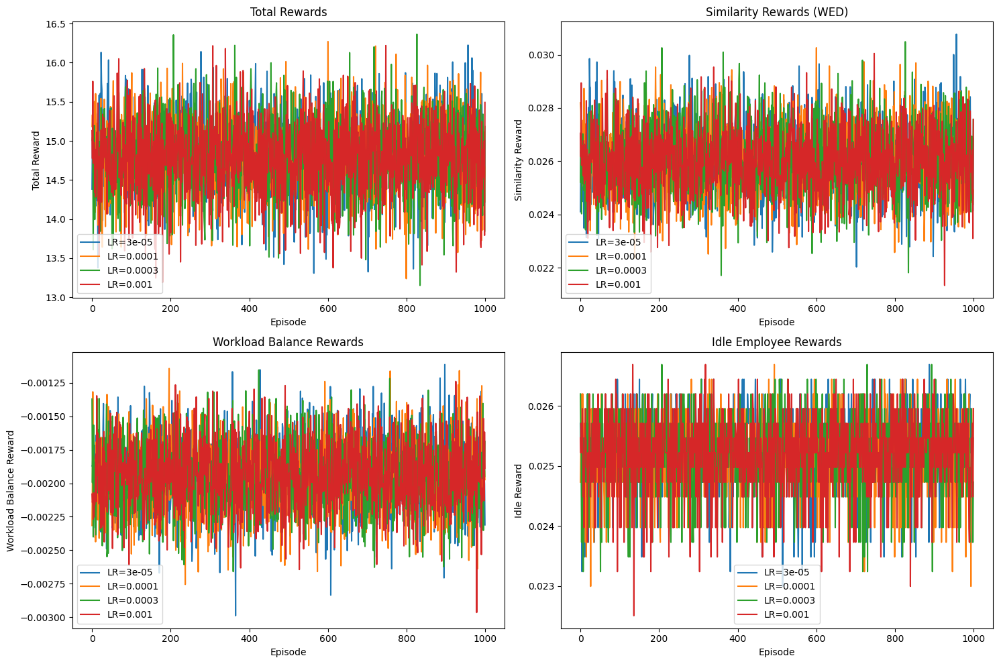

<ipython-input-5-ee4e50dde2f4>:644: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(wed_data, labels=[f"{lr:.0e}" for lr in lrs], showmeans=True)


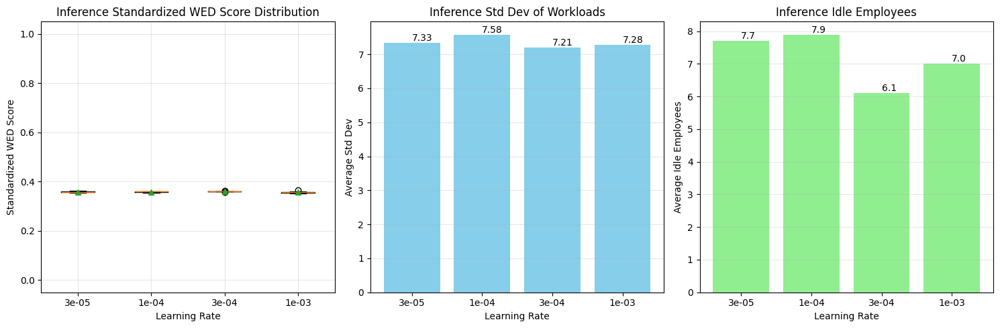


Inference Results Summary:
Learning Rate | Avg Standardized WED Score | Avg Std Dev | Avg Idle Employees
----------------------------------------------------------------------
3e-05         | 0.3582                 | 7.3286   | 7.70
0.0001        | 0.3586                 | 7.5826   | 7.90
0.0003        | 0.3594                 | 7.2085   | 6.10
0.001         | 0.3573                 | 7.2811   | 7.00


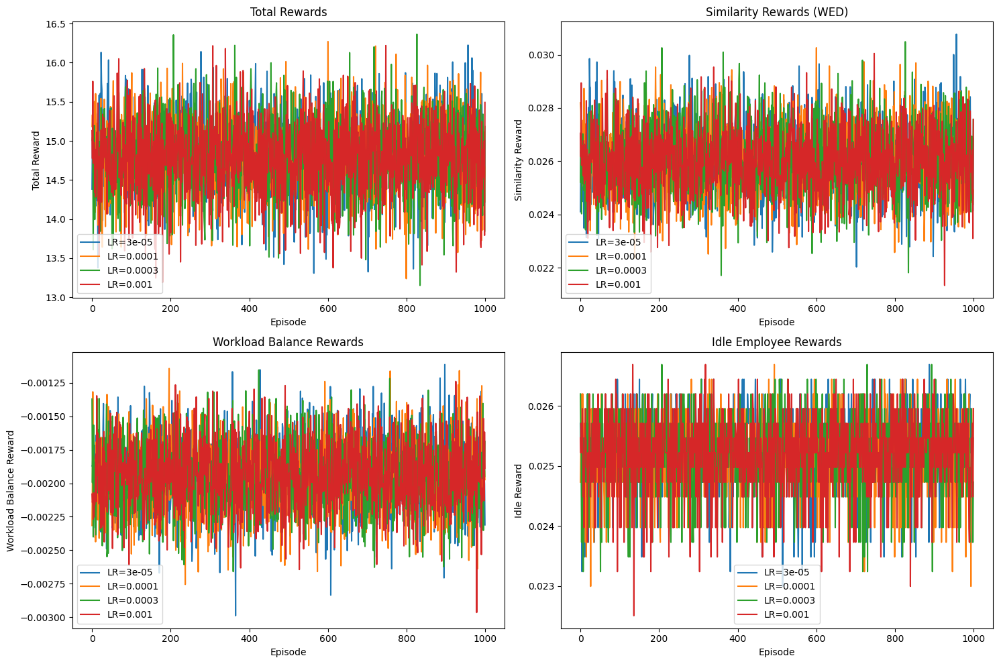

<ipython-input-5-ee4e50dde2f4>:734: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(wed_data, labels=[f"{lr:.0e}" for lr in lrs], showmeans=True)


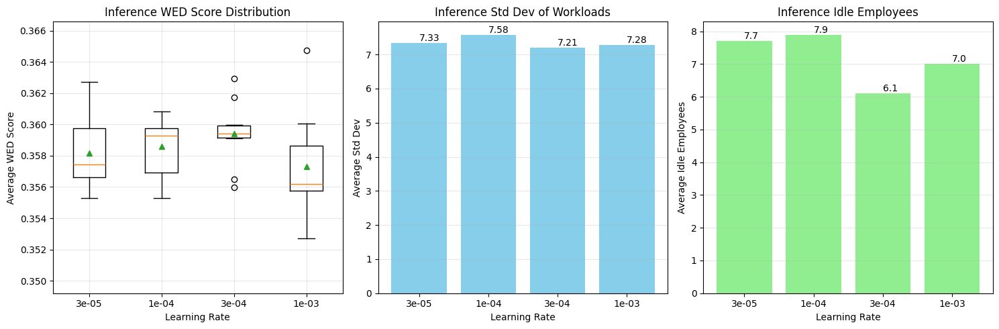

In [ ]:
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import gym
from gym import spaces
import random
from collections import deque
import time
import matplotlib.pyplot as plt
import seaborn as sns

# Set device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# GPU-specific configurations
GPU_CONFIGS = {
    'A100': {'ROLLOUT_STEPS': 16384, 'BATCH_SIZE': 64, 'CLIP_GRADS': False},
    'V100': {'ROLLOUT_STEPS': 8192, 'BATCH_SIZE': 256, 'CLIP_GRADS': True},
    'T4': {'ROLLOUT_STEPS': 4096, 'BATCH_SIZE': 64, 'CLIP_GRADS': True},
    'default': {'ROLLOUT_STEPS': 4096, 'BATCH_SIZE': 128, 'CLIP_GRADS': True}
}
gpu_name = torch.cuda.get_device_name(0) if torch.cuda.is_available() else 'default'
gpu_type = 'A100' if 'A100' in gpu_name else 'V100' if 'V100' in gpu_name else 'T4' if 'T4' in gpu_name else 'default'
ROLLOUT_STEPS = GPU_CONFIGS[gpu_type]['ROLLOUT_STEPS']
BATCH_SIZE = GPU_CONFIGS[gpu_type]['BATCH_SIZE']
CLIP_GRADS = GPU_CONFIGS[gpu_type]['CLIP_GRADS']
print(f"Detected GPU: {gpu_name}, ROLLOUT_STEPS: {ROLLOUT_STEPS}, BATCH_SIZE: {BATCH_SIZE}, CLIP_GRADS: {CLIP_GRADS}")

# Global Variables
MAX_EMPLOYEES = 150
MAX_TASKS = 500
NUM_EMPLOYEES = 109
NUM_TASKS = 300
NUM_EPISODES = 1000
GAMMA = 0.99
GAE_LAMBDA = 0.95
PPO_CLIP = 0.1
PPO_EPOCHS = 10
ENTROPY_COEFF = 0.02
VALUE_LOSS_COEFF = 0.5
NUM_ROLLOUTS = 10
MAX_WORKLOAD = 20
ALPHA_WED = 0.5
NUM_INFERENCE_RUNS = 10

# Reward Weights
SIMILARITY_WEIGHT = 0.1
WORKLOAD_WEIGHT = 0.5
IDLE_WEIGHT = 0.4

WEIGHT_SUM = SIMILARITY_WEIGHT + WORKLOAD_WEIGHT + IDLE_WEIGHT
if WEIGHT_SUM == 0:
    raise ValueError("Sum of reward weights cannot be zero.")
NORMALIZED_SIMILARITY_WEIGHT = SIMILARITY_WEIGHT / WEIGHT_SUM
NORMALIZED_WORKLOAD_WEIGHT = WORKLOAD_WEIGHT / WEIGHT_SUM
NORMALIZED_IDLE_WEIGHT = IDLE_WEIGHT / WEIGHT_SUM
print(f"Normalized Weights - Similarity: {NORMALIZED_SIMILARITY_WEIGHT:.3f}, Workload: {NORMALIZED_WORKLOAD_WEIGHT:.3f}, Idle: {NORMALIZED_IDLE_WEIGHT:.3f}")

SAVE_EPISODES = [500, 1000]
MAX_STEPS_PER_EPISODE = NUM_TASKS

task_data_path = '/content/drive/MyDrive/Skripsi/Resources/Datasets/fixed_data_task.csv'
employee_data_path = '/content/drive/MyDrive/Skripsi/Resources/Datasets/fixed_data_employee.csv'
model_save_path = '/content/drive/MyDrive/Skripsi/ppo_model_flexible.pth'
agent_save_path = '/content/drive/MyDrive/Skripsi/ppo_agent_params_flexible.pth'

# Load data
task_data = pd.read_csv(task_data_path)
employee_data = pd.read_csv(employee_data_path)
task_subset = task_data.iloc[:NUM_TASKS]
employee_subset = employee_data.iloc[:NUM_EMPLOYEES]
skill_columns = [col for col in task_data.columns if col not in ['task_id', 'story_points', 'project_id']]

project_id_map = {pid: idx + 1 for idx, pid in enumerate(task_data['project_id'].unique())}
project_ids = task_subset['project_id'].map(project_id_map).values

task_skills_df = task_subset[skill_columns].fillna(0).astype(np.float32)
employee_skills_df = employee_subset[skill_columns].fillna(0).astype(np.float32)
story_points_df = task_subset['story_points'].astype(np.float32)

# Pad task data to MAX_TASKS
task_skills_full = np.zeros((MAX_TASKS, len(skill_columns)), dtype=np.float32)
task_skills_full[:NUM_TASKS] = task_skills_df.values / 5.0
dtype = torch.float32 if device.type == 'cpu' else (torch.bfloat16 if torch.cuda.is_bf16_supported() else torch.float16)
task_skills = torch.tensor(task_skills_full, dtype=dtype, device=device)

story_points_full = np.zeros((MAX_TASKS,), dtype=np.float32)
story_points_full[:NUM_TASKS] = story_points_df.values
story_points = torch.tensor(story_points_full, dtype=dtype, device=device)

project_ids_full = np.zeros((MAX_TASKS,), dtype=np.int64)
project_ids_full[:NUM_TASKS] = project_ids
project_ids_tensor = torch.tensor(project_ids_full, dtype=torch.long, device=device)

# Pad employee data to MAX_EMPLOYEES
employee_skills_full = np.zeros((MAX_EMPLOYEES, len(skill_columns)), dtype=np.float32)
employee_skills_full[:NUM_EMPLOYEES] = employee_skills_df.values / 5.0
employee_skills = torch.tensor(employee_skills_full, dtype=dtype, device=device)

# Masks for valid tasks and employees
task_mask = torch.zeros(MAX_TASKS, dtype=torch.bool, device=device)
task_mask[:NUM_TASKS] = 1
employee_mask = torch.zeros(MAX_EMPLOYEES, dtype=torch.bool, device=device)
employee_mask[:NUM_EMPLOYEES] = 1

class TaskAssignmentEnv(gym.Env):
    def __init__(self, num_tasks=NUM_TASKS, num_employees=NUM_EMPLOYEES):
        super(TaskAssignmentEnv, self).__init__()
        self.max_tasks = MAX_TASKS
        self.max_employees = MAX_EMPLOYEES
        self.num_tasks = min(num_tasks, MAX_TASKS)
        self.num_employees = min(num_employees, MAX_EMPLOYEES)
        self.max_workload = MAX_WORKLOAD
        self.story_points = story_points
        self.project_ids = project_ids_tensor
        self.task_skills = task_skills
        self.employee_skills = employee_skills
        self.task_mask = task_mask
        self.employee_mask = employee_mask
        self.total_story_points = torch.sum(self.story_points[:self.num_tasks]).item()
        self.num_skills = task_skills.shape[1]
        self.ideal_workload = self.total_story_points / self.num_employees if self.num_employees > 0 else 0

        self.similarity_matrix = self._compute_similarity_matrix()

        obs_dict = {
            'current_task_skills': spaces.Box(low=0, high=1, shape=(self.num_skills,), dtype=np.float32),
            'employee_skills': spaces.Box(low=0, high=1, shape=(self.max_employees, self.num_skills), dtype=np.float32),
            'prop_remaining': spaces.Box(low=0, high=1, shape=(1,), dtype=np.float32),
            'employee_mask': spaces.Box(low=0, high=1, shape=(self.max_employees,), dtype=np.float32)
        }
        if NORMALIZED_WORKLOAD_WEIGHT > 0:
            obs_dict['workload_deviation'] = spaces.Box(low=-self.max_workload, high=self.max_workload, shape=(self.max_employees,), dtype=np.float32)
        self.observation_space = spaces.Dict(obs_dict)

        self.action_space = spaces.Discrete(self.max_employees)
        self.current_step = 0
        self.reset()

    def _compute_similarity_matrix(self):
        task_skills_expanded = self.task_skills.unsqueeze(1).expand(-1, self.max_employees, -1)
        emp_skills_expanded = self.employee_skills.unsqueeze(0).expand(self.max_tasks, -1, -1)
        diff = emp_skills_expanded - task_skills_expanded
        weights = 1 / (1 + ALPHA_WED * torch.maximum(diff, torch.tensor(0.0, device=device, dtype=dtype)))
        mask = self.task_skills.unsqueeze(1).expand(-1, self.max_employees, -1) > 0
        weighted_diff = weights * mask * (emp_skills_expanded - task_skills_expanded) ** 2
        wed = torch.sqrt(torch.sum(weighted_diff, dim=2))
        num_skills_per_task = torch.sum(self.task_skills > 0, dim=1).unsqueeze(1).expand(-1, self.max_employees)
        wed_worst = torch.sqrt(num_skills_per_task * (1.0 ** 2))
        wed_worst = torch.where(num_skills_per_task > 0, wed_worst, torch.tensor(1.0, device=device, dtype=dtype))
        similarity = 1 - (wed / wed_worst)
        return similarity

    def flatten_state(self, obs):
        current_task_skills = obs['current_task_skills'].float()
        employee_skills = obs['employee_skills'].float()
        prop_remaining = obs['prop_remaining'].float()
        employee_mask = obs['employee_mask'].float()
        state = torch.cat([current_task_skills, employee_skills.flatten(), prop_remaining, employee_mask])
        if 'workload_deviation' in obs:
            workload_deviation = obs['workload_deviation'].float()
            state = torch.cat([state, workload_deviation])
        return state

    def reset(self):
        self.current_step = 0
        self.workloads = torch.zeros(self.max_employees, device=device, dtype=dtype)
        self.assignments = torch.full((self.max_tasks,), -1, dtype=torch.long, device=device)
        self.employee_projects = torch.full((self.max_employees,), -1, dtype=torch.long, device=device)
        self.wed_scores = []
        return self._get_obs()

    def _get_obs(self):
        current_task_skills = self.task_skills[self.current_step]
        employee_skills = self.employee_skills
        prop_remaining = (self.num_tasks - self.current_step) / self.num_tasks if self.num_tasks > 0 else 0.0
        employee_mask_obs = self.employee_mask.float()

        obs = {
            'current_task_skills': current_task_skills,
            'employee_skills': employee_skills,
            'prop_remaining': torch.tensor([prop_remaining], device=device, dtype=dtype),
            'employee_mask': employee_mask_obs
        }
        if NORMALIZED_WORKLOAD_WEIGHT > 0:
            obs['workload_deviation'] = self.workloads - self.ideal_workload

        return obs

    def step(self, action):
        emp_idx = action
        task_idx = self.current_step
        done = False
        reward = {'similarity': 0.0, 'workload': 0.0, 'idle': 0.0}
        info = {'last_wed': 0.0}

        if not self.employee_mask[emp_idx]:
            reward['similarity'] = -0.1 * NORMALIZED_SIMILARITY_WEIGHT
            info['invalid_action'] = 'Invalid employee'
            self.current_step += 1
            if self.current_step >= self.num_tasks:
                done = True
                obs = {
                    'current_task_skills': torch.zeros(self.num_skills, device=device, dtype=dtype),
                    'employee_skills': self.employee_skills,
                    'prop_remaining': torch.tensor([0.0], device=device, dtype=dtype),
                    'employee_mask': self.employee_mask.float()
                }
                if NORMALIZED_WORKLOAD_WEIGHT > 0:
                    obs['workload_deviation'] = torch.zeros(self.max_employees, device=device, dtype=dtype)
                return obs, reward, done, info
            return self._get_obs(), reward, done, info

        task_skills_t = self.task_skills[task_idx]
        emp_skills_e = self.employee_skills[emp_idx]
        diff = emp_skills_e - task_skills_t
        weights = 1 / (1 + ALPHA_WED * torch.maximum(diff, torch.tensor(0.0, device=device, dtype=dtype)))
        mask = task_skills_t > 0
        weighted_diff = weights[mask] * (emp_skills_e[mask] - task_skills_t[mask]) ** 2
        wed = torch.sqrt(torch.sum(weighted_diff))
        self.wed_scores.append(wed.item())
        num_skills = torch.sum(mask.float())
        wed_worst = torch.sqrt(num_skills * (1.0 ** 2)) if num_skills > 0 else 1.0
        similarity = 1 - (wed / wed_worst) if wed_worst > 0 else 0.0
        info['last_wed'] = wed.item()

        task_project = self.project_ids[task_idx]
        emp_project = self.employee_projects[emp_idx]
        current_workload = self.workloads[emp_idx]
        is_valid_action = True

        if emp_project != -1 and emp_project != task_project:
            reward['similarity'] = -0.05 * NORMALIZED_SIMILARITY_WEIGHT
            info['invalid_action'] = 'Different project'
            is_valid_action = False

        if current_workload + self.story_points[task_idx] > self.max_workload:
            excess = (current_workload + self.story_points[task_idx] - self.max_workload) / self.max_workload
            reward['similarity'] = -0.05 * excess * NORMALIZED_SIMILARITY_WEIGHT
            info['invalid_action'] = 'Exceeds workload'
            is_valid_action = False

        prev_workloads = self.workloads.clone()

        self.assignments[task_idx] = emp_idx
        self.workloads[emp_idx] += self.story_points[task_idx]
        if self.employee_projects[emp_idx] == -1:
            self.employee_projects[emp_idx] = task_project

        if is_valid_action:
            similarity = similarity.item()
            reward['similarity'] = similarity * NORMALIZED_SIMILARITY_WEIGHT
            if similarity > 0.8:
                reward['similarity'] += 0.1 * NORMALIZED_SIMILARITY_WEIGHT

            new_workload = self.workloads[emp_idx]
            if new_workload >= self.max_workload:
                reward['similarity'] -= 0.05 * NORMALIZED_SIMILARITY_WEIGHT
            if self.employee_projects[emp_idx] == task_project and self.current_step < self.num_tasks - 1:
                future_tasks = self.project_ids[self.current_step + 1:self.num_tasks]
                if torch.any(future_tasks != task_project):
                    reward['similarity'] -= 0.02 * NORMALIZED_SIMILARITY_WEIGHT

            if NORMALIZED_WORKLOAD_WEIGHT > 0:
                prev_std = torch.std(prev_workloads[:self.num_employees].float()).item()
                curr_std = torch.std(self.workloads[:self.num_employees].float()).item()
                std_change = prev_std - curr_std
                workload_base = (std_change / self.max_workload) * 10
                workload_base = max(-1, min(1, workload_base))
                reward['workload'] = workload_base * NORMALIZED_WORKLOAD_WEIGHT

            if NORMALIZED_IDLE_WEIGHT > 0:
                prev_idle = torch.sum(prev_workloads[:self.num_employees] == 0).item()
                curr_idle = torch.sum(self.workloads[:self.num_employees] == 0).item()
                idle_change = prev_idle - curr_idle
                idle_base = (idle_change / self.num_employees) * 20
                idle_base = max(-1, min(1, idle_base))
                reward['idle'] = idle_base * NORMALIZED_IDLE_WEIGHT
            else:
                reward['idle'] = 0.0

        self.current_step += 1
        if self.current_step >= self.num_tasks:
            done = True
            avg_wed = np.mean(self.wed_scores) if self.wed_scores else 0.0
            wed_worst = np.sqrt(self.num_skills * (1.0 ** 2))
            avg_similarity = 1 - (avg_wed / wed_worst) if wed_worst > 0 else 0.0
            if avg_similarity > 0.7:
                reward['similarity'] += 0.2 * NORMALIZED_SIMILARITY_WEIGHT
            if NORMALIZED_WORKLOAD_WEIGHT > 0:
                std_workload = torch.std(self.workloads[:self.num_employees].float()).item()
                if std_workload < 5:
                    reward['workload'] += 0.2 * NORMALIZED_WORKLOAD_WEIGHT
            if NORMALIZED_IDLE_WEIGHT > 0:
                final_idle = torch.sum(self.workloads[:self.num_employees] == 0).item()
                if final_idle < self.num_employees * 0.1:
                    reward['idle'] += 0.2 * NORMALIZED_IDLE_WEIGHT

            obs = {
                'current_task_skills': torch.zeros(self.num_skills, device=device, dtype=dtype),
                'employee_skills': self.employee_skills,
                'prop_remaining': torch.tensor([0.0], device=device, dtype=dtype),
                'employee_mask': self.employee_mask.float()
            }
            if NORMALIZED_WORKLOAD_WEIGHT > 0:
                obs['workload_deviation'] = torch.zeros(self.max_employees, device=device, dtype=dtype)
            return obs, reward, done, info

        return self._get_obs(), reward, done, info

class ActorCritic(nn.Module):
    def __init__(self, state_dim, action_dim, hidden_dim=256):
        super(ActorCritic, self).__init__()
        self.shared = nn.Sequential(
            nn.Linear(state_dim, hidden_dim),
            nn.ReLU(),
            nn.Linear(hidden_dim, hidden_dim // 2),
            nn.ReLU()
        ).to(device, dtype=torch.float32)

        self.actor = nn.Sequential(
            nn.Linear(hidden_dim // 2, action_dim),
            nn.Softmax(dim=-1)
        ).to(device, dtype=torch.float32)

        self.critic = nn.Linear(hidden_dim // 2, 1).to(device, dtype=torch.float32)

    def forward(self, state):
        features = self.shared(state)
        action_probs = self.actor(features)
        value = self.critic(features)
        return action_probs, value

class PPOAgent:
    def __init__(self, state_dim, action_dim, learning_rate_actor, learning_rate_critic):
        self.device = device
        self.model = ActorCritic(state_dim, action_dim).to(device)
        if torch.cuda.device_count() > 1:
            print(f"Using {torch.cuda.device_count()} GPUs")
            self.model = torch.nn.DataParallel(self.model)
        self.optimizer = torch.optim.Adam(self.model.parameters(), lr=learning_rate_actor)
        self.memory = []
        self.gamma = GAMMA
        self.gae_lambda = GAE_LAMBDA
        self.ppo_clip = PPO_CLIP
        self.ppo_epochs = PPO_EPOCHS
        self.batch_size = BATCH_SIZE
        self.scaler = torch.amp.GradScaler('cuda') if device.type == 'cuda' else None

    def act(self, obs, env):
        state = env.flatten_state(obs).unsqueeze(0).to(device, dtype=torch.float32)
        with torch.no_grad():
            action_probs, _ = self.model(state)
            action_probs = action_probs * obs['employee_mask'].unsqueeze(0)
            action_probs = action_probs / (action_probs.sum(dim=-1, keepdim=True) + 1e-8)
            dist = torch.distributions.Categorical(action_probs)
            action = dist.sample()
            log_prob = dist.log_prob(action)
        return action.item(), log_prob

    def compute_gae(self, rewards, values, next_value, dones):
        advantages = []
        returns = []
        gae = 0
        values = values + [next_value]
        for t in reversed(range(len(rewards))):
            delta = rewards[t] + self.gamma * values[t + 1] * (1 - dones[t]) - values[t]
            gae = delta + self.gamma * self.gae_lambda * (1 - dones[t]) * gae
            advantages.insert(0, gae)
            returns.insert(0, gae + values[t])
        return advantages, returns

    def update(self):
        if len(self.memory) < ROLLOUT_STEPS:
            return
        states, actions, log_probs_old, rewards, dones = zip(*self.memory)
        states = torch.stack(states).to(device)
        actions = torch.tensor(actions, dtype=torch.long, device=device)
        log_probs_old = torch.stack(log_probs_old).to(device)
        rewards = torch.tensor(rewards, dtype=torch.float32, device=device)
        dones = torch.tensor(dones, dtype=torch.float32, device=device)

        with torch.no_grad():
            _, values = self.model(states)
            values = values.squeeze()
            _, next_value = self.model(states[-1].unsqueeze(0))
            next_value = next_value.squeeze()

        advantages, returns = self.compute_gae(rewards.tolist(), values.tolist(), next_value.item(), dones.tolist())
        advantages = torch.tensor(advantages, dtype=torch.float32, device=device)
        returns = torch.tensor(returns, dtype=torch.float32, device=device)
        advantages = (advantages - advantages.mean()) / (advantages.std() + 1e-8)

        for _ in range(self.ppo_epochs):
            indices = torch.randperm(len(states))
            for start in range(0, len(states), self.batch_size):
                batch_indices = indices[start:start + self.batch_size]
                batch_states = states[batch_indices]
                batch_actions = actions[batch_indices]
                batch_log_probs_old = log_probs_old[batch_indices]
                batch_advantages = advantages[batch_indices]
                batch_returns = returns[batch_indices]

                autocast_enabled = device.type == 'cuda'
                with torch.amp.autocast('cuda', enabled=autocast_enabled):
                    action_probs, _ = self.model(batch_states)
                    dist = torch.distributions.Categorical(action_probs)
                    log_probs = dist.log_prob(batch_actions)
                    entropy = dist.entropy().mean()
                    ratios = torch.exp(log_probs - batch_log_probs_old)
                    surr1 = ratios * batch_advantages
                    surr2 = torch.clamp(ratios, 1 - self.ppo_clip, 1 + self.ppo_clip) * batch_advantages
                    actor_loss = -torch.min(surr1, surr2).mean() - ENTROPY_COEFF * entropy
                    _, values = self.model(batch_states)
                    values = values.squeeze()
                    critic_loss = F.mse_loss(values, batch_returns)
                    total_loss = actor_loss + VALUE_LOSS_COEFF * critic_loss

                self.optimizer.zero_grad()
                if self.scaler and autocast_enabled:
                    self.scaler.scale(total_loss).backward()
                    if CLIP_GRADS:
                        self.scaler.unscale_(self.optimizer)
                        torch.nn.utils.clip_grad_norm_(self.model.parameters(), max_norm=1.0)
                    self.scaler.step(self.optimizer)
                    self.scaler.update()
                else:
                    total_loss.backward()
                    if CLIP_GRADS:
                        torch.nn.utils.clip_grad_norm_(self.model.parameters(), max_norm=1.0)
                    self.optimizer.step()

        self.memory = []

    def save(self, model_path, agent_path):
        torch.save({
            'model_state_dict': self.model.module.state_dict() if isinstance(self.model, torch.nn.DataParallel) else self.model.state_dict(),
        }, model_path)
        torch.save({}, agent_path)
        print(f"Model saved to {model_path}, Agent params to {agent_path}")

    def load(self, model_path, agent_path):
        checkpoint = torch.load(model_path)
        self.model.load_state_dict(checkpoint['model_state_dict'])
        print(f"Model loaded from {model_path}")

def run_inference(agent, env, num_runs=1):
    wed_scores = []
    std_devs = []
    idle_employees_list = []
    for _ in range(num_runs):
        obs = env.reset()
        done = False
        standardized_wed_scores = []
        while not done:
            action, _ = agent.act(obs, env)
            next_obs, reward, done, info = env.step(action)
            # Standardize WED score for the current task
            wed = info['last_wed']
            # Access the task skills for the task just processed
            task_idx = env.current_step - 1 if env.current_step > 0 else 0
            task_skills = env.task_skills[task_idx]
            num_skills = torch.sum(task_skills > 0).float().item()
            wed_worst = np.sqrt(num_skills * (1.0 ** 2)) if num_skills > 0 else 1.0
            standardized_wed = wed / wed_worst if wed_worst > 0 else 0.0
            standardized_wed_scores.append(standardized_wed)
            obs = next_obs
        # Average standardized WED scores for this run
        avg_standardized_wed = np.mean(standardized_wed_scores) if standardized_wed_scores else 0.0
        wed_scores.append(avg_standardized_wed)
        # Compute workload standard deviation and idle employees
        final_workloads = env.workloads[:env.num_employees].float()
        std_dev = torch.std(final_workloads).item()
        idle_employees = torch.sum(final_workloads == 0).item()
        std_devs.append(std_dev)
        idle_employees_list.append(idle_employees)
    return wed_scores, std_devs, idle_employees_list

def train_ppo(num_tasks=NUM_TASKS, num_employees=NUM_EMPLOYEES, learning_rate_actor=1e-4, learning_rate_critic=3e-4):
    env = TaskAssignmentEnv(num_tasks=num_tasks, num_employees=num_employees)

    dummy_obs = env.reset()
    state_dim = len(env.flatten_state(dummy_obs))
    action_dim = env.action_space.n
    agent = PPOAgent(state_dim, action_dim, learning_rate_actor, learning_rate_critic)

    total_rewards = []
    wed_scores_list = []
    workloads_list = []
    std_workloads_list = []
    idle_employees_list = []
    similarity_rewards = []
    workload_balance_rewards = []
    idle_rewards = []
    episode_data = []
    global_step = 0

    for episode in range(NUM_EPISODES):
        obs = env.reset()
        total_reward = 0.0
        episode_similarity = 0.0
        episode_workload_balance = 0.0
        episode_idle = 0.0
        done = False
        step = 0
        last_wed = 0

        while not done:
            step += 1
            global_step += 1

            action, log_prob = agent.act(obs, env)
            next_obs, reward, done, info = env.step(action)
            reward_similarity = float(reward['similarity'])
            reward_workload = float(reward.get('workload', 0.0))
            reward_idle = float(reward.get('idle', 0.0))
            total_reward += (reward_similarity + reward_workload + reward_idle)
            episode_similarity += reward_similarity
            episode_workload_balance += reward_workload
            episode_idle += reward_idle
            last_wed = info['last_wed']

            state = env.flatten_state(obs)
            reward_total = reward_similarity + reward_workload + reward_idle
            agent.memory.append((state, action, log_prob, reward_total, done))

            obs = next_obs

            if global_step % ROLLOUT_STEPS == 0:
                agent.update()

        wed_scores_list.append(env.wed_scores)
        workloads_np = env.workloads.clone().float().cpu().numpy()
        workloads_list.append(workloads_np)
        std_workloads = torch.std(env.workloads[:env.num_employees].float()).item()
        num_idle = torch.sum(env.workloads[:env.num_employees] == 0).item()
        std_workloads_list.append(std_workloads)
        idle_employees_list.append(num_idle)
        total_rewards.append(total_reward)
        avg_similarity = episode_similarity / step if step > 0 else 0.0
        avg_workload_balance = episode_workload_balance / step if step > 0 else 0.0
        avg_idle = episode_idle / step if step > 0 else 0.0
        similarity_rewards.append(avg_similarity)
        workload_balance_rewards.append(avg_workload_balance)
        idle_rewards.append(avg_idle)
        avg_wed = np.mean(env.wed_scores) if env.wed_scores else 0.0

        episode_data.append({
            'Episode': episode + 1,
            'Total Reward': total_reward,
            'Similarity Reward': avg_similarity,
            'Workload Balance Reward': avg_workload_balance,
            'Idle Reward': avg_idle,
            'Std Workloads': std_workloads,
            'Idle Employees': num_idle,
            'Avg WED': avg_wed
        })

        print(f"Episode {episode+1}/{NUM_EPISODES}, Steps: {step}, Total Reward: {total_reward:.2f}, Avg Similarity: {avg_similarity:.4f}, Avg Workload: {avg_workload_balance:.4f}, Avg Idle: {avg_idle:.4f}, Std Workloads: {std_workloads:.2f}, Idle Employees: {num_idle}, Avg WED: {avg_wed:.4f}")

        if episode + 1 in SAVE_EPISODES:
            print(f"Saving checkpoint at Episode {episode + 1}")
            checkpoint_model_path = f"/content/drive/MyDrive/Skripsi/ppo_model_eps{episode + 1}_lr{learning_rate_actor}.pth"
            checkpoint_agent_path = f"/content/drive/MyDrive/Skripsi/ppo_agent_params_eps{episode + 1}_lr{learning_rate_actor}.pth"
            agent.save(checkpoint_model_path, checkpoint_agent_path)

    agent.save(model_save_path, agent_save_path)
    return env, workloads_list, std_workloads_list, idle_employees_list, NUM_EPISODES, episode_data, agent

# Run tests for learning rates
learning_rates = [3e-05, 1e-04, 3e-04, 1e-03]
results = {}

for lr in learning_rates:
    print(f"\nTraining with learning rate: {lr}")
    start_time = time.time()
    env, workloads_list, std_workloads_list, idle_employees_list, num_episodes, episode_data, trained_agent = train_ppo(
        learning_rate_actor=lr, learning_rate_critic=lr
    )
    print(f"Time for LR {lr}: {time.time() - start_time:.2f} seconds")
    inference_wed_scores, inference_std_devs, inference_idle_employees = run_inference(trained_agent, env, num_runs=NUM_INFERENCE_RUNS)
    results[lr] = {
        'total_rewards': [data['Total Reward'] for data in episode_data],
        'similarity_rewards': [data['Similarity Reward'] for data in episode_data],
        'workload_balance_rewards': [data['Workload Balance Reward'] for data in episode_data],
        'idle_rewards': [data['Idle Reward'] for data in episode_data],
        'avg_weds': [data['Avg WED'] for data in episode_data],
        'inference_wed_scores': inference_wed_scores,
        'inference_std_devs': inference_std_devs,
        'inference_idle_employees': inference_idle_employees
    }

# Plot training metrics
plt.figure(figsize=(15, 10))

plt.subplot(2, 2, 1)
for lr in learning_rates:
    plt.plot(results[lr]['total_rewards'], label=f'LR={lr}')
plt.title('Total Rewards')
plt.xlabel('Episode')
plt.ylabel('Total Reward')
plt.legend()

plt.subplot(2, 2, 2)
for lr in learning_rates:
    plt.plot(results[lr]['similarity_rewards'], label=f'LR={lr}')
plt.title('Similarity Rewards (WED)')
plt.xlabel('Episode')
plt.ylabel('Similarity Reward')
plt.legend()

plt.subplot(2, 2, 3)
for lr in learning_rates:
    plt.plot(results[lr]['workload_balance_rewards'], label=f'LR={lr}')
plt.title('Workload Balance Rewards')
plt.xlabel('Episode')
plt.ylabel('Workload Balance Reward')
plt.legend()

plt.subplot(2, 2, 4)
for lr in learning_rates:
    plt.plot(results[lr]['idle_rewards'], label=f'LR={lr}')
plt.title('Idle Employee Rewards')
plt.xlabel('Episode')
plt.ylabel('Idle Reward')
plt.legend()

plt.tight_layout()
plt.savefig('/content/drive/MyDrive/Skripsi/training_metrics_comparison.png')
plt.show()

# Plot inference metrics
lrs = list(results.keys())
wed_data = [results[lr]['inference_wed_scores'] for lr in lrs]
avg_std_devs = [np.mean(results[lr]['inference_std_devs']) for lr in lrs]
avg_idle_employees = [np.mean(results[lr]['inference_idle_employees']) for lr in lrs]

plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.boxplot(wed_data, labels=[f"{lr:.0e}" for lr in lrs], showmeans=True)
plt.title('Inference Standardized WED Score Distribution')
plt.xlabel('Learning Rate')
plt.ylabel('Standardized WED Score')
plt.grid(True, alpha=0.3)
plt.ylim(-0.05, 1.05)  # Fixed range for standardized WED (0-1)

plt.subplot(1, 3, 2)
bars = plt.bar(range(len(lrs)), avg_std_devs, tick_label=[f"{lr:.0e}" for lr in lrs], color='skyblue')
plt.title('Inference Std Dev of Workloads')
plt.xlabel('Learning Rate')
plt.ylabel('Average Std Dev')
plt.grid(True, alpha=0.3, axis='y')
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, f"{yval:.2f}", va='bottom')

plt.subplot(1, 3, 3)
bars = plt.bar(range(len(lrs)), avg_idle_employees, tick_label=[f"{lr:.0e}" for lr in lrs], color='lightgreen')
plt.title('Inference Idle Employees')
plt.xlabel('Learning Rate')
plt.ylabel('Average Idle Employees')
plt.grid(True, alpha=0.3, axis='y')
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, f"{yval:.1f}", va='bottom')

plt.tight_layout()
plt.savefig('/content/drive/MyDrive/Skripsi/inference_metrics_comparison.png')
plt.show()

# Print numerical results
print("\nInference Results Summary:")
print("Learning Rate | Avg Standardized WED Score | Avg Std Dev | Avg Idle Employees")
print("-" * 70)
for lr in learning_rates:
    avg_wed = np.mean(results[lr]['inference_wed_scores'])
    avg_std_dev = np.mean(results[lr]['inference_std_devs'])
    avg_idle = np.mean(results[lr]['inference_idle_employees'])
    print(f"{lr:<13} | {avg_wed:.4f}                 | {avg_std_dev:.4f}   | {avg_idle:.2f}")

# Plot training metrics
plt.figure(figsize=(15, 10))

plt.subplot(2, 2, 1)
for lr, data in results.items():
    plt.plot(data['total_rewards'], label=f'LR={lr}')
plt.title('Total Rewards')
plt.xlabel('Episode')
plt.ylabel('Total Reward')
plt.legend()

plt.subplot(2, 2, 2)
for lr, data in results.items():
    plt.plot(data['similarity_rewards'], label=f'LR={lr}')
plt.title('Similarity Rewards (WED)')
plt.xlabel('Episode')
plt.ylabel('Similarity Reward')
plt.legend()

plt.subplot(2, 2, 3)
for lr, data in results.items():
    plt.plot(data['workload_balance_rewards'], label=f'LR={lr}')
plt.title('Workload Balance Rewards')
plt.xlabel('Episode')
plt.ylabel('Workload Balance Reward')
plt.legend()

plt.subplot(2, 2, 4)
for lr, data in results.items():
    plt.plot(data['idle_rewards'], label=f'LR={lr}')
plt.title('Idle Employee Rewards')
plt.xlabel('Episode')
plt.ylabel('Idle Reward')
plt.legend()

plt.tight_layout()
plt.savefig('training_metrics_comparison.png')
plt.show()

# Plot inference metrics
lrs = list(results.keys())
wed_data = [results[lr]['inference_wed_scores'] for lr in lrs]
avg_std_devs = [np.mean(results[lr]['inference_std_devs']) for lr in lrs]
avg_idle_employees = [np.mean(results[lr]['inference_idle_employees']) for lr in lrs]

plt.figure(figsize=(15, 5))

# WED Score Distribution (Boxplot)
plt.subplot(1, 3, 1)
plt.boxplot(wed_data, labels=[f"{lr:.0e}" for lr in lrs], showmeans=True)
plt.title('Inference WED Score Distribution')
plt.xlabel('Learning Rate')
plt.ylabel('Average WED Score')
plt.grid(True, alpha=0.3)
plt.ylim(min(min(wed_data)) * 0.99, max(max(wed_data)) * 1.01)  # Adjust y-axis for clarity

# Average Std Dev of Workloads (Bar)
plt.subplot(1, 3, 2)
bars = plt.bar(range(len(lrs)), avg_std_devs, tick_label=[f"{lr:.0e}" for lr in lrs], color='skyblue')
plt.title('Inference Std Dev of Workloads')
plt.xlabel('Learning Rate')
plt.ylabel('Average Std Dev')
plt.grid(True, alpha=0.3, axis='y')
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, f"{yval:.2f}", va='bottom')

# Average Idle Employees (Bar)
plt.subplot(1, 3, 3)
bars = plt.bar(range(len(lrs)), avg_idle_employees, tick_label=[f"{lr:.0e}" for lr in lrs], color='lightgreen')
plt.title('Inference Idle Employees')
plt.xlabel('Learning Rate')
plt.ylabel('Average Idle Employees')
plt.grid(True, alpha=0.3, axis='y')
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, f"{yval:.1f}", va='bottom')

plt.tight_layout()
plt.savefig('inference_metrics_comparison.png')
plt.show()

## PPO part 2&3

Streaming output truncated to the last 5000 lines.
Episode 39/1000, Steps: 300, Total Reward: 48.53, Avg Similarity: 0.1501, Avg Workload: -0.0008, Avg Idle: 0.0125, Std Workloads: 7.57, Idle Employees: 8, Avg WED: 2.6267
Episode 40/1000, Steps: 300, Total Reward: 52.30, Avg Similarity: 0.1624, Avg Workload: -0.0009, Avg Idle: 0.0129, Std Workloads: 7.37, Idle Employees: 5, Avg WED: 2.5934
Episode 41/1000, Steps: 300, Total Reward: 53.94, Avg Similarity: 0.1681, Avg Workload: -0.0007, Avg Idle: 0.0124, Std Workloads: 6.85, Idle Employees: 9, Avg WED: 2.6177
Episode 42/1000, Steps: 300, Total Reward: 48.93, Avg Similarity: 0.1508, Avg Workload: -0.0008, Avg Idle: 0.0131, Std Workloads: 6.70, Idle Employees: 3, Avg WED: 2.6331
Episode 43/1000, Steps: 300, Total Reward: 51.59, Avg Similarity: 0.1599, Avg Workload: -0.0008, Avg Idle: 0.0129, Std Workloads: 7.71, Idle Employees: 5, Avg WED: 2.6395
Episode 44/1000, Steps: 300, Total Reward: 48.58, Avg Similarity: 0.1498, Avg Workload: -0.000

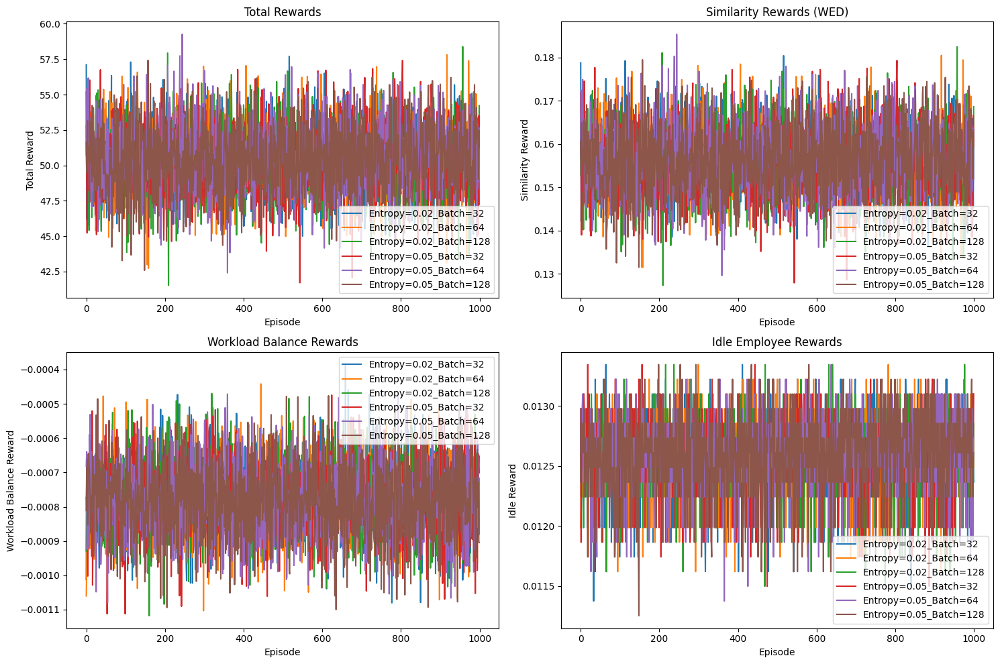

<ipython-input-7-cc057d4b3dd8>:649: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(wed_data, labels=configs, showmeans=True)


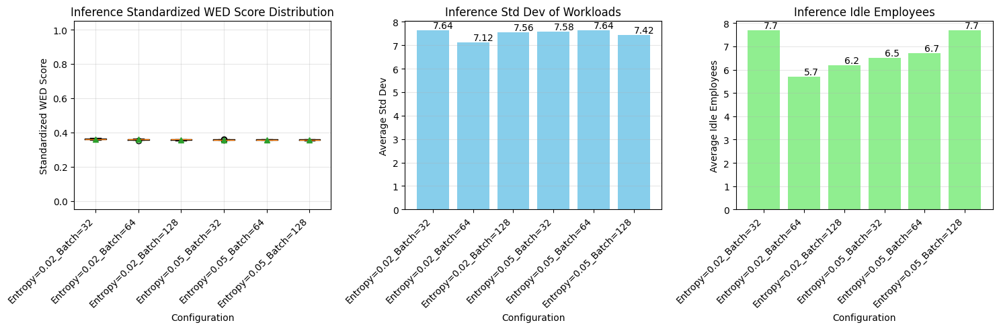


Inference Results Summary:
Learning Rate | Avg Standardized WED Score | Avg Std Dev | Avg Idle Employees
----------------------------------------------------------------------


KeyError: 3e-05

In [ ]:
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import gym
from gym import spaces
import random
from collections import deque
import time
import matplotlib.pyplot as plt
import seaborn as sns

# Set device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# GPU-specific configurations
GPU_CONFIGS = {
    'A100': {'ROLLOUT_STEPS': 16384, 'BATCH_SIZE': 64, 'CLIP_GRADS': False},
    'V100': {'ROLLOUT_STEPS': 8192, 'BATCH_SIZE': 256, 'CLIP_GRADS': True},
    'T4': {'ROLLOUT_STEPS': 4096, 'BATCH_SIZE': 64, 'CLIP_GRADS': True},
    'default': {'ROLLOUT_STEPS': 4096, 'BATCH_SIZE': 128, 'CLIP_GRADS': True}
}
gpu_name = torch.cuda.get_device_name(0) if torch.cuda.is_available() else 'default'
gpu_type = 'A100' if 'A100' in gpu_name else 'V100' if 'V100' in gpu_name else 'T4' if 'T4' in gpu_name else 'default'
ROLLOUT_STEPS = GPU_CONFIGS[gpu_type]['ROLLOUT_STEPS']
CLIP_GRADS = GPU_CONFIGS[gpu_type]['CLIP_GRADS']
print(f"Detected GPU: {gpu_name}, ROLLOUT_STEPS: {ROLLOUT_STEPS}, CLIP_GRADS: {CLIP_GRADS}")

# Global Variables
MAX_EMPLOYEES = 150
MAX_TASKS = 500
NUM_EMPLOYEES = 109
NUM_TASKS = 300
NUM_EPISODES = 1000
GAMMA = 0.99
GAE_LAMBDA = 0.95
PPO_CLIP = 0.1
PPO_EPOCHS = 10
VALUE_LOSS_COEFF = 0.5
NUM_ROLLOUTS = 10
MAX_WORKLOAD = 20
ALPHA_WED = 0.5
NUM_INFERENCE_RUNS = 10

# Fixed Learning Rate
LEARNING_RATE = 3e-04

# Reward Weights
SIMILARITY_WEIGHT = 0.6
WORKLOAD_WEIGHT = 0.2
IDLE_WEIGHT = 0.2

WEIGHT_SUM = SIMILARITY_WEIGHT + WORKLOAD_WEIGHT + IDLE_WEIGHT
if WEIGHT_SUM == 0:
    raise ValueError("Sum of reward weights cannot be zero.")
NORMALIZED_SIMILARITY_WEIGHT = SIMILARITY_WEIGHT / WEIGHT_SUM
NORMALIZED_WORKLOAD_WEIGHT = WORKLOAD_WEIGHT / WEIGHT_SUM
NORMALIZED_IDLE_WEIGHT = IDLE_WEIGHT / WEIGHT_SUM
print(f"Normalized Weights - Similarity: {NORMALIZED_SIMILARITY_WEIGHT:.3f}, Workload: {NORMALIZED_WORKLOAD_WEIGHT:.3f}, Idle: {NORMALIZED_IDLE_WEIGHT:.3f}")

SAVE_EPISODES = [500, 1000]
MAX_STEPS_PER_EPISODE = NUM_TASKS

task_data_path = '/content/drive/MyDrive/Skripsi/Resources/Datasets/fixed_data_task.csv'
employee_data_path = '/content/drive/MyDrive/Skripsi/Resources/Datasets/fixed_data_employee.csv'
model_save_path = '/content/drive/MyDrive/Skripsi/ppo_model_entropy_batch.pth'
agent_save_path = '/content/drive/MyDrive/Skripsi/ppo_agent_params_entropy_batch.pth'

# Load data
task_data = pd.read_csv(task_data_path)
employee_data = pd.read_csv(employee_data_path)
task_subset = task_data.iloc[:NUM_TASKS]
employee_subset = employee_data.iloc[:NUM_EMPLOYEES]
skill_columns = [col for col in task_data.columns if col not in ['task_id', 'story_points', 'project_id']]

project_id_map = {pid: idx + 1 for idx, pid in enumerate(task_data['project_id'].unique())}
project_ids = task_subset['project_id'].map(project_id_map).values

task_skills_df = task_subset[skill_columns].fillna(0).astype(np.float32)
employee_skills_df = employee_subset[skill_columns].fillna(0).astype(np.float32)
story_points_df = task_subset['story_points'].astype(np.float32)

# Pad task data to MAX_TASKS
task_skills_full = np.zeros((MAX_TASKS, len(skill_columns)), dtype=np.float32)
task_skills_full[:NUM_TASKS] = task_skills_df.values / 5.0
dtype = torch.float32 if device.type == 'cpu' else (torch.bfloat16 if torch.cuda.is_bf16_supported() else torch.float16)
task_skills = torch.tensor(task_skills_full, dtype=dtype, device=device)

story_points_full = np.zeros((MAX_TASKS,), dtype=np.float32)
story_points_full[:NUM_TASKS] = story_points_df.values
story_points = torch.tensor(story_points_full, dtype=dtype, device=device)

project_ids_full = np.zeros((MAX_TASKS,), dtype=np.int64)
project_ids_full[:NUM_TASKS] = project_ids
project_ids_tensor = torch.tensor(project_ids_full, dtype=torch.long, device=device)

# Pad employee data to MAX_EMPLOYEES
employee_skills_full = np.zeros((MAX_EMPLOYEES, len(skill_columns)), dtype=np.float32)
employee_skills_full[:NUM_EMPLOYEES] = employee_skills_df.values / 5.0
employee_skills = torch.tensor(employee_skills_full, dtype=dtype, device=device)

# Masks for valid tasks and employees
task_mask = torch.zeros(MAX_TASKS, dtype=torch.bool, device=device)
task_mask[:NUM_TASKS] = 1
employee_mask = torch.zeros(MAX_EMPLOYEES, dtype=torch.bool, device=device)
employee_mask[:NUM_EMPLOYEES] = 1

class TaskAssignmentEnv(gym.Env):
    def __init__(self, num_tasks=NUM_TASKS, num_employees=NUM_EMPLOYEES):
        super(TaskAssignmentEnv, self).__init__()
        self.max_tasks = MAX_TASKS
        self.max_employees = MAX_EMPLOYEES
        self.num_tasks = min(num_tasks, MAX_TASKS)
        self.num_employees = min(num_employees, MAX_EMPLOYEES)
        self.max_workload = MAX_WORKLOAD
        self.story_points = story_points
        self.project_ids = project_ids_tensor
        self.task_skills = task_skills
        self.employee_skills = employee_skills
        self.task_mask = task_mask
        self.employee_mask = employee_mask
        self.total_story_points = torch.sum(self.story_points[:self.num_tasks]).item()
        self.num_skills = task_skills.shape[1]
        self.ideal_workload = self.total_story_points / self.num_employees if self.num_employees > 0 else 0

        self.similarity_matrix = self._compute_similarity_matrix()

        obs_dict = {
            'current_task_skills': spaces.Box(low=0, high=1, shape=(self.num_skills,), dtype=np.float32),
            'employee_skills': spaces.Box(low=0, high=1, shape=(self.max_employees, self.num_skills), dtype=np.float32),
            'prop_remaining': spaces.Box(low=0, high=1, shape=(1,), dtype=np.float32),
            'employee_mask': spaces.Box(low=0, high=1, shape=(self.max_employees,), dtype=np.float32)
        }
        if NORMALIZED_WORKLOAD_WEIGHT > 0:
            obs_dict['workload_deviation'] = spaces.Box(low=-self.max_workload, high=self.max_workload, shape=(self.max_employees,), dtype=np.float32)
        self.observation_space = spaces.Dict(obs_dict)

        self.action_space = spaces.Discrete(self.max_employees)
        self.current_step = 0
        self.reset()

    def _compute_similarity_matrix(self):
        task_skills_expanded = self.task_skills.unsqueeze(1).expand(-1, self.max_employees, -1)
        emp_skills_expanded = self.employee_skills.unsqueeze(0).expand(self.max_tasks, -1, -1)
        diff = emp_skills_expanded - task_skills_expanded
        weights = 1 / (1 + ALPHA_WED * torch.maximum(diff, torch.tensor(0.0, device=device, dtype=dtype)))
        mask = self.task_skills.unsqueeze(1).expand(-1, self.max_employees, -1) > 0
        weighted_diff = weights * mask * (emp_skills_expanded - task_skills_expanded) ** 2
        wed = torch.sqrt(torch.sum(weighted_diff, dim=2))
        num_skills_per_task = torch.sum(self.task_skills > 0, dim=1).unsqueeze(1).expand(-1, self.max_employees)
        wed_worst = torch.sqrt(num_skills_per_task * (1.0 ** 2))
        wed_worst = torch.where(num_skills_per_task > 0, wed_worst, torch.tensor(1.0, device=device, dtype=dtype))
        similarity = 1 - (wed / wed_worst)
        return similarity

    def flatten_state(self, obs):
        current_task_skills = obs['current_task_skills'].float()
        employee_skills = obs['employee_skills'].float()
        prop_remaining = obs['prop_remaining'].float()
        employee_mask = obs['employee_mask'].float()
        state = torch.cat([current_task_skills, employee_skills.flatten(), prop_remaining, employee_mask])
        if 'workload_deviation' in obs:
            workload_deviation = obs['workload_deviation'].float()
            state = torch.cat([state, workload_deviation])
        return state

    def reset(self):
        self.current_step = 0
        self.workloads = torch.zeros(self.max_employees, device=device, dtype=dtype)
        self.assignments = torch.full((self.max_tasks,), -1, dtype=torch.long, device=device)
        self.employee_projects = torch.full((self.max_employees,), -1, dtype=torch.long, device=device)
        self.wed_scores = []
        return self._get_obs()

    def _get_obs(self):
        current_task_skills = self.task_skills[self.current_step]
        employee_skills = self.employee_skills
        prop_remaining = (self.num_tasks - self.current_step) / self.num_tasks if self.num_tasks > 0 else 0.0
        employee_mask_obs = self.employee_mask.float()

        obs = {
            'current_task_skills': current_task_skills,
            'employee_skills': employee_skills,
            'prop_remaining': torch.tensor([prop_remaining], device=device, dtype=dtype),
            'employee_mask': employee_mask_obs
        }
        if NORMALIZED_WORKLOAD_WEIGHT > 0:
            obs['workload_deviation'] = self.workloads - self.ideal_workload

        return obs

    def step(self, action):
        emp_idx = action
        task_idx = self.current_step
        done = False
        reward = {'similarity': 0.0, 'workload': 0.0, 'idle': 0.0}
        info = {'last_wed': 0.0}

        if not self.employee_mask[emp_idx]:
            reward['similarity'] = -0.1 * NORMALIZED_SIMILARITY_WEIGHT
            info['invalid_action'] = 'Invalid employee'
            self.current_step += 1
            if self.current_step >= self.num_tasks:
                done = True
                obs = {
                    'current_task_skills': torch.zeros(self.num_skills, device=device, dtype=dtype),
                    'employee_skills': self.employee_skills,
                    'prop_remaining': torch.tensor([0.0], device=device, dtype=dtype),
                    'employee_mask': self.employee_mask.float()
                }
                if NORMALIZED_WORKLOAD_WEIGHT > 0:
                    obs['workload_deviation'] = torch.zeros(self.max_employees, device=device, dtype=dtype)
                return obs, reward, done, info
            return self._get_obs(), reward, done, info

        task_skills_t = self.task_skills[task_idx]
        emp_skills_e = self.employee_skills[emp_idx]
        diff = emp_skills_e - task_skills_t
        weights = 1 / (1 + ALPHA_WED * torch.maximum(diff, torch.tensor(0.0, device=device, dtype=dtype)))
        mask = task_skills_t > 0
        weighted_diff = weights[mask] * (emp_skills_e[mask] - task_skills_t[mask]) ** 2
        wed = torch.sqrt(torch.sum(weighted_diff))
        self.wed_scores.append(wed.item())
        num_skills = torch.sum(mask.float())
        wed_worst = torch.sqrt(num_skills * (1.0 ** 2)) if num_skills > 0 else 1.0
        similarity = 1 - (wed / wed_worst) if wed_worst > 0 else 0.0
        info['last_wed'] = wed.item()

        task_project = self.project_ids[task_idx]
        emp_project = self.employee_projects[emp_idx]
        current_workload = self.workloads[emp_idx]
        is_valid_action = True

        if emp_project != -1 and emp_project != task_project:
            reward['similarity'] = -0.05 * NORMALIZED_SIMILARITY_WEIGHT
            info['invalid_action'] = 'Different project'
            is_valid_action = False

        if current_workload + self.story_points[task_idx] > self.max_workload:
            excess = (current_workload + self.story_points[task_idx] - self.max_workload) / self.max_workload
            reward['similarity'] = -0.05 * excess * NORMALIZED_SIMILARITY_WEIGHT
            info['invalid_action'] = 'Exceeds workload'
            is_valid_action = False

        prev_workloads = self.workloads.clone()

        self.assignments[task_idx] = emp_idx
        self.workloads[emp_idx] += self.story_points[task_idx]
        if self.employee_projects[emp_idx] == -1:
            self.employee_projects[emp_idx] = task_project

        if is_valid_action:
            similarity = similarity.item()
            reward['similarity'] = similarity * NORMALIZED_SIMILARITY_WEIGHT
            if similarity > 0.8:
                reward['similarity'] += 0.1 * NORMALIZED_SIMILARITY_WEIGHT

            new_workload = self.workloads[emp_idx]
            if new_workload >= self.max_workload:
                reward['similarity'] -= 0.05 * NORMALIZED_SIMILARITY_WEIGHT
            if self.employee_projects[emp_idx] == task_project and self.current_step < self.num_tasks - 1:
                future_tasks = self.project_ids[self.current_step + 1:self.num_tasks]
                if torch.any(future_tasks != task_project):
                    reward['similarity'] -= 0.02 * NORMALIZED_SIMILARITY_WEIGHT

            if NORMALIZED_WORKLOAD_WEIGHT > 0:
                prev_std = torch.std(prev_workloads[:self.num_employees].float()).item()
                curr_std = torch.std(self.workloads[:self.num_employees].float()).item()
                std_change = prev_std - curr_std
                workload_base = (std_change / self.max_workload) * 10
                workload_base = max(-1, min(1, workload_base))
                reward['workload'] = workload_base * NORMALIZED_WORKLOAD_WEIGHT

            if NORMALIZED_IDLE_WEIGHT > 0:
                prev_idle = torch.sum(prev_workloads[:self.num_employees] == 0).item()
                curr_idle = torch.sum(self.workloads[:self.num_employees] == 0).item()
                idle_change = prev_idle - curr_idle
                idle_base = (idle_change / self.num_employees) * 20
                idle_base = max(-1, min(1, idle_base))
                reward['idle'] = idle_base * NORMALIZED_IDLE_WEIGHT
            else:
                reward['idle'] = 0.0

        self.current_step += 1
        if self.current_step >= self.num_tasks:
            done = True
            avg_wed = np.mean(self.wed_scores) if self.wed_scores else 0.0
            wed_worst = np.sqrt(self.num_skills * (1.0 ** 2))
            avg_similarity = 1 - (avg_wed / wed_worst) if wed_worst > 0 else 0.0
            if avg_similarity > 0.7:
                reward['similarity'] += 0.2 * NORMALIZED_SIMILARITY_WEIGHT
            if NORMALIZED_WORKLOAD_WEIGHT > 0:
                std_workload = torch.std(self.workloads[:self.num_employees].float()).item()
                if std_workload < 5:
                    reward['workload'] += 0.2 * NORMALIZED_WORKLOAD_WEIGHT
            if NORMALIZED_IDLE_WEIGHT > 0:
                final_idle = torch.sum(self.workloads[:self.num_employees] == 0).item()
                if final_idle < self.num_employees * 0.1:
                    reward['idle'] += 0.2 * NORMALIZED_IDLE_WEIGHT

            obs = {
                'current_task_skills': torch.zeros(self.num_skills, device=device, dtype=dtype),
                'employee_skills': self.employee_skills,
                'prop_remaining': torch.tensor([0.0], device=device, dtype=dtype),
                'employee_mask': self.employee_mask.float()
            }
            if NORMALIZED_WORKLOAD_WEIGHT > 0:
                obs['workload_deviation'] = torch.zeros(self.max_employees, device=device, dtype=dtype)
            return obs, reward, done, info

        return self._get_obs(), reward, done, info

class ActorCritic(nn.Module):
    def __init__(self, state_dim, action_dim, hidden_dim=256):
        super(ActorCritic, self).__init__()
        self.shared = nn.Sequential(
            nn.Linear(state_dim, hidden_dim),
            nn.ReLU(),
            nn.Linear(hidden_dim, hidden_dim // 2),
            nn.ReLU()
        ).to(device, dtype=torch.float32)

        self.actor = nn.Sequential(
            nn.Linear(hidden_dim // 2, action_dim),
            nn.Softmax(dim=-1)
        ).to(device, dtype=torch.float32)

        self.critic = nn.Linear(hidden_dim // 2, 1).to(device, dtype=torch.float32)

    def forward(self, state):
        features = self.shared(state)
        action_probs = self.actor(features)
        value = self.critic(features)
        return action_probs, value

class PPOAgent:
    def __init__(self, state_dim, action_dim, learning_rate_actor, learning_rate_critic, entropy_coeff, batch_size):
        self.device = device
        self.model = ActorCritic(state_dim, action_dim).to(device)
        if torch.cuda.device_count() > 1:
            print(f"Using {torch.cuda.device_count()} GPUs")
            self.model = torch.nn.DataParallel(self.model)
        self.optimizer = torch.optim.Adam(self.model.parameters(), lr=learning_rate_actor)
        self.memory = []
        self.gamma = GAMMA
        self.gae_lambda = GAE_LAMBDA
        self.ppo_clip = PPO_CLIP
        self.ppo_epochs = PPO_EPOCHS
        self.entropy_coeff = entropy_coeff
        self.batch_size = batch_size
        self.scaler = torch.amp.GradScaler('cuda') if device.type == 'cuda' else None

    def act(self, obs, env):
        state = env.flatten_state(obs).unsqueeze(0).to(device, dtype=torch.float32)
        with torch.no_grad():
            action_probs, _ = self.model(state)
            action_probs = action_probs * obs['employee_mask'].unsqueeze(0)
            action_probs = action_probs / (action_probs.sum(dim=-1, keepdim=True) + 1e-8)
            dist = torch.distributions.Categorical(action_probs)
            action = dist.sample()
            log_prob = dist.log_prob(action)
        return action.item(), log_prob

    def compute_gae(self, rewards, values, next_value, dones):
        advantages = []
        returns = []
        gae = 0
        values = values + [next_value]
        for t in reversed(range(len(rewards))):
            delta = rewards[t] + self.gamma * values[t + 1] * (1 - dones[t]) - values[t]
            gae = delta + self.gamma * self.gae_lambda * (1 - dones[t]) * gae
            advantages.insert(0, gae)
            returns.insert(0, gae + values[t])
        return advantages, returns

    def update(self):
        if len(self.memory) < ROLLOUT_STEPS:
            return
        states, actions, log_probs_old, rewards, dones = zip(*self.memory)
        states = torch.stack(states).to(device)
        actions = torch.tensor(actions, dtype=torch.long, device=device)
        log_probs_old = torch.stack(log_probs_old).to(device)
        rewards = torch.tensor(rewards, dtype=torch.float32, device=device)
        dones = torch.tensor(dones, dtype=torch.float32, device=device)

        with torch.no_grad():
            _, values = self.model(states)
            values = values.squeeze()
            _, next_value = self.model(states[-1].unsqueeze(0))
            next_value = next_value.squeeze()

        advantages, returns = self.compute_gae(rewards.tolist(), values.tolist(), next_value.item(), dones.tolist())
        advantages = torch.tensor(advantages, dtype=torch.float32, device=device)
        returns = torch.tensor(returns, dtype=torch.float32, device=device)
        advantages = (advantages - advantages.mean()) / (advantages.std() + 1e-8)

        for _ in range(self.ppo_epochs):
            indices = torch.randperm(len(states))
            for start in range(0, len(states), self.batch_size):
                batch_indices = indices[start:start + self.batch_size]
                batch_states = states[batch_indices]
                batch_actions = actions[batch_indices]
                batch_log_probs_old = log_probs_old[batch_indices]
                batch_advantages = advantages[batch_indices]
                batch_returns = returns[batch_indices]

                autocast_enabled = device.type == 'cuda'
                with torch.amp.autocast('cuda', enabled=autocast_enabled):
                    action_probs, _ = self.model(batch_states)
                    dist = torch.distributions.Categorical(action_probs)
                    log_probs = dist.log_prob(batch_actions)
                    entropy = dist.entropy().mean()
                    ratios = torch.exp(log_probs - batch_log_probs_old)
                    surr1 = ratios * batch_advantages
                    surr2 = torch.clamp(ratios, 1 - self.ppo_clip, 1 + self.ppo_clip) * batch_advantages
                    actor_loss = -torch.min(surr1, surr2).mean() - self.entropy_coeff * entropy
                    _, values = self.model(batch_states)
                    values = values.squeeze()
                    critic_loss = F.mse_loss(values, batch_returns)
                    total_loss = actor_loss + VALUE_LOSS_COEFF * critic_loss

                self.optimizer.zero_grad()
                if self.scaler and autocast_enabled:
                    self.scaler.scale(total_loss).backward()
                    if CLIP_GRADS:
                        self.scaler.unscale_(self.optimizer)
                        torch.nn.utils.clip_grad_norm_(self.model.parameters(), max_norm=1.0)
                    self.scaler.step(self.optimizer)
                    self.scaler.update()
                else:
                    total_loss.backward()
                    if CLIP_GRADS:
                        torch.nn.utils.clip_grad_norm_(self.model.parameters(), max_norm=1.0)
                    self.optimizer.step()

        self.memory = []

    def save(self, model_path, agent_path):
        torch.save({
            'model_state_dict': self.model.module.state_dict() if isinstance(self.model, torch.nn.DataParallel) else self.model.state_dict(),
        }, model_path)
        torch.save({}, agent_path)
        print(f"Model saved to {model_path}, Agent params to {agent_path}")

    def load(self, model_path, agent_path):
        checkpoint = torch.load(model_path)
        self.model.load_state_dict(checkpoint['model_state_dict'])
        print(f"Model loaded from {model_path}")

def run_inference(agent, env, num_runs=1):
    wed_scores = []
    std_devs = []
    idle_employees_list = []
    for _ in range(num_runs):
        obs = env.reset()
        done = False
        standardized_wed_scores = []
        while not done:
            action, _ = agent.act(obs, env)
            next_obs, reward, done, info = env.step(action)
            # Standardize WED score for the current task
            wed = info['last_wed']
            task_idx = env.current_step - 1 if env.current_step > 0 else 0
            task_skills = env.task_skills[task_idx]
            num_skills = torch.sum(task_skills > 0).float().item()
            wed_worst = np.sqrt(num_skills * (1.0 ** 2)) if num_skills > 0 else 1.0
            standardized_wed = wed / wed_worst if wed_worst > 0 else 0.0
            standardized_wed_scores.append(standardized_wed)
            obs = next_obs
        avg_standardized_wed = np.mean(standardized_wed_scores) if standardized_wed_scores else 0.0
        wed_scores.append(avg_standardized_wed)
        final_workloads = env.workloads[:env.num_employees].float()
        std_dev = torch.std(final_workloads).item()
        idle_employees = torch.sum(final_workloads == 0).item()
        std_devs.append(std_dev)
        idle_employees_list.append(idle_employees)
    return wed_scores, std_devs, idle_employees_list

def train_ppo(num_tasks=NUM_TASKS, num_employees=NUM_EMPLOYEES, learning_rate_actor=1e-4, learning_rate_critic=3e-4, entropy_coeff=0.02, batch_size=64):
    env = TaskAssignmentEnv(num_tasks=num_tasks, num_employees=num_employees)

    dummy_obs = env.reset()
    state_dim = len(env.flatten_state(dummy_obs))
    action_dim = env.action_space.n
    agent = PPOAgent(state_dim, action_dim, learning_rate_actor, learning_rate_critic, entropy_coeff, batch_size)

    total_rewards = []
    wed_scores_list = []
    workloads_list = []
    std_workloads_list = []
    idle_employees_list = []
    similarity_rewards = []
    workload_balance_rewards = []
    idle_rewards = []
    episode_data = []
    global_step = 0

    for episode in range(NUM_EPISODES):
        obs = env.reset()
        total_reward = 0.0
        episode_similarity = 0.0
        episode_workload_balance = 0.0
        episode_idle = 0.0
        done = False
        step = 0
        last_wed = 0

        while not done:
            step += 1
            global_step += 1

            action, log_prob = agent.act(obs, env)
            next_obs, reward, done, info = env.step(action)
            reward_similarity = float(reward['similarity'])
            reward_workload = float(reward.get('workload', 0.0))
            reward_idle = float(reward.get('idle', 0.0))
            total_reward += (reward_similarity + reward_workload + reward_idle)
            episode_similarity += reward_similarity
            episode_workload_balance += reward_workload
            episode_idle += reward_idle
            last_wed = info['last_wed']

            state = env.flatten_state(obs)
            reward_total = reward_similarity + reward_workload + reward_idle
            agent.memory.append((state, action, log_prob, reward_total, done))

            obs = next_obs

            if global_step % ROLLOUT_STEPS == 0:
                agent.update()

        wed_scores_list.append(env.wed_scores)
        workloads_np = env.workloads.clone().float().cpu().numpy()
        workloads_list.append(workloads_np)
        std_workloads = torch.std(env.workloads[:env.num_employees].float()).item()
        num_idle = torch.sum(env.workloads[:env.num_employees] == 0).item()
        std_workloads_list.append(std_workloads)
        idle_employees_list.append(num_idle)
        total_rewards.append(total_reward)
        avg_similarity = episode_similarity / step if step > 0 else 0.0
        avg_workload_balance = episode_workload_balance / step if step > 0 else 0.0
        avg_idle = episode_idle / step if step > 0 else 0.0
        similarity_rewards.append(avg_similarity)
        workload_balance_rewards.append(avg_workload_balance)
        idle_rewards.append(avg_idle)
        avg_wed = np.mean(env.wed_scores) if env.wed_scores else 0.0

        episode_data.append({
            'Episode': episode + 1,
            'Total Reward': total_reward,
            'Similarity Reward': avg_similarity,
            'Workload Balance Reward': avg_workload_balance,
            'Idle Reward': avg_idle,
            'Std Workloads': std_workloads,
            'Idle Employees': num_idle,
            'Avg WED': avg_wed
        })

        print(f"Episode {episode+1}/{NUM_EPISODES}, Steps: {step}, Total Reward: {total_reward:.2f}, Avg Similarity: {avg_similarity:.4f}, Avg Workload: {avg_workload_balance:.4f}, Avg Idle: {avg_idle:.4f}, Std Workloads: {std_workloads:.2f}, Idle Employees: {num_idle}, Avg WED: {avg_wed:.4f}")

        if episode + 1 in SAVE_EPISODES:
            print(f"Saving checkpoint at Episode {episode + 1}")
            checkpoint_model_path = f"/content/drive/MyDrive/Skripsi/ppo_model_eps{episode + 1}_entropy{entropy_coeff}_batch{batch_size}.pth"
            checkpoint_agent_path = f"/content/drive/MyDrive/Skripsi/ppo_agent_params_eps{episode + 1}_entropy{entropy_coeff}_batch{batch_size}.pth"
            agent.save(checkpoint_model_path, checkpoint_agent_path)

    agent.save(model_save_path, agent_save_path)
    return env, workloads_list, std_workloads_list, idle_employees_list, NUM_EPISODES, episode_data, agent

# Run tests for entropy coefficients and batch sizes
entropy_coeffs = [0.02, 0.05]
batch_sizes = [32, 64, 128]
results = {}

for entropy_coeff in entropy_coeffs:
    for batch_size in batch_sizes:
        config = f"Entropy={entropy_coeff}_Batch={batch_size}"
        print(f"\nTraining with Entropy Coeff: {entropy_coeff}, Batch Size: {batch_size}")
        start_time = time.time()
        env, workloads_list, std_workloads_list, idle_employees_list, num_episodes, episode_data, trained_agent = train_ppo(
            learning_rate_actor=LEARNING_RATE,
            learning_rate_critic=LEARNING_RATE,
            entropy_coeff=entropy_coeff,
            batch_size=batch_size
        )
        print(f"Time for {config}: {time.time() - start_time:.2f} seconds")
        inference_wed_scores, inference_std_devs, inference_idle_employees = run_inference(trained_agent, env, num_runs=NUM_INFERENCE_RUNS)
        results[config] = {
            'total_rewards': [data['Total Reward'] for data in episode_data],
            'similarity_rewards': [data['Similarity Reward'] for data in episode_data],
            'workload_balance_rewards': [data['Workload Balance Reward'] for data in episode_data],
            'idle_rewards': [data['Idle Reward'] for data in episode_data],
            'avg_weds': [data['Avg WED'] for data in episode_data],
            'inference_wed_scores': inference_wed_scores,
            'inference_std_devs': inference_std_devs,
            'inference_idle_employees': inference_idle_employees
        }

# Plot training metrics
plt.figure(figsize=(15, 10))

plt.subplot(2, 2, 1)
for config in results:
    plt.plot(results[config]['total_rewards'], label=config)
plt.title('Total Rewards')
plt.xlabel('Episode')
plt.ylabel('Total Reward')
plt.legend()

plt.subplot(2, 2, 2)
for config in results:
    plt.plot(results[config]['similarity_rewards'], label=config)
plt.title('Similarity Rewards (WED)')
plt.xlabel('Episode')
plt.ylabel('Similarity Reward')
plt.legend()

plt.subplot(2, 2, 3)
for config in results:
    plt.plot(results[config]['workload_balance_rewards'], label=config)
plt.title('Workload Balance Rewards')
plt.xlabel('Episode')
plt.ylabel('Workload Balance Reward')
plt.legend()

plt.subplot(2, 2, 4)
for config in results:
    plt.plot(results[config]['idle_rewards'], label=config)
plt.title('Idle Employee Rewards')
plt.xlabel('Episode')
plt.ylabel('Idle Reward')
plt.legend()

plt.tight_layout()
plt.savefig('/content/drive/MyDrive/Skripsi/training_metrics_entropy_batch.png')
plt.show()

# Plot inference metrics
configs = list(results.keys())
wed_data = [results[config]['inference_wed_scores'] for config in configs]
avg_std_devs = [np.mean(results[config]['inference_std_devs']) for config in configs]
avg_idle_employees = [np.mean(results[config]['inference_idle_employees']) for config in configs]

plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.boxplot(wed_data, labels=configs, showmeans=True)
plt.title('Inference Standardized WED Score Distribution')
plt.xlabel('Configuration')
plt.ylabel('Standardized WED Score')
plt.grid(True, alpha=0.3)
plt.ylim(-0.05, 1.05)
plt.xticks(rotation=45, ha='right')

plt.subplot(1, 3, 2)
bars = plt.bar(range(len(configs)), avg_std_devs, tick_label=configs, color='skyblue')
plt.title('Inference Std Dev of Workloads')
plt.xlabel('Configuration')
plt.ylabel('Average Std Dev')
plt.grid(True, alpha=0.3, axis='y')
plt.xticks(rotation=45, ha='right')
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, f"{yval:.2f}", va='bottom')

plt.subplot(1, 3, 3)
bars = plt.bar(range(len(configs)), avg_idle_employees, tick_label=configs, color='lightgreen')
plt.title('Inference Idle Employees')
plt.xlabel('Configuration')
plt.ylabel('Average Idle Employees')
plt.grid(True, alpha=0.3, axis='y')
plt.xticks(rotation=45, ha='right')
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, f"{yval:.1f}", va='bottom')

plt.tight_layout()
plt.savefig('/content/drive/MyDrive/Skripsi/inference_metrics_entropy_batch.png')
plt.show()

# Print numerical results
print("\nInference Results Summary:")
print("Learning Rate | Avg Standardized WED Score | Avg Std Dev | Avg Idle Employees")
print("-" * 70)
for lr in learning_rates:
    avg_wed = np.mean(results[lr]['inference_wed_scores'])
    avg_std_dev = np.mean(results[lr]['inference_std_devs'])
    avg_idle = np.mean(results[lr]['inference_idle_employees'])
    print(f"{lr:<13} | {avg_wed:.4f}                 | {avg_std_dev:.4f}   | {avg_idle:.2f}")

# Plot training metrics
plt.figure(figsize=(15, 10))

plt.subplot(2, 2, 1)
for lr, data in results.items():
    plt.plot(data['total_rewards'], label=f'LR={lr}')
plt.title('Total Rewards')
plt.xlabel('Episode')
plt.ylabel('Total Reward')
plt.legend()

plt.subplot(2, 2, 2)
for lr, data in results.items():
    plt.plot(data['similarity_rewards'], label=f'LR={lr}')
plt.title('Similarity Rewards (WED)')
plt.xlabel('Episode')
plt.ylabel('Similarity Reward')
plt.legend()

plt.subplot(2, 2, 3)
for lr, data in results.items():
    plt.plot(data['workload_balance_rewards'], label=f'LR={lr}')
plt.title('Workload Balance Rewards')
plt.xlabel('Episode')
plt.ylabel('Workload Balance Reward')
plt.legend()

plt.subplot(2, 2, 4)
for lr, data in results.items():
    plt.plot(data['idle_rewards'], label=f'LR={lr}')
plt.title('Idle Employee Rewards')
plt.xlabel('Episode')
plt.ylabel('Idle Reward')
plt.legend()

plt.tight_layout()
plt.savefig('training_metrics_comparison.png')
plt.show()

# Plot inference metrics
lrs = list(results.keys())
wed_data = [results[lr]['inference_wed_scores'] for lr in lrs]
avg_std_devs = [np.mean(results[lr]['inference_std_devs']) for lr in lrs]
avg_idle_employees = [np.mean(results[lr]['inference_idle_employees']) for lr in lrs]

plt.figure(figsize=(15, 5))

# WED Score Distribution (Boxplot)
plt.subplot(1, 3, 1)
plt.boxplot(wed_data, labels=[f"{lr:.0e}" for lr in lrs], showmeans=True)
plt.title('Inference WED Score Distribution')
plt.xlabel('Learning Rate')
plt.ylabel('Average WED Score')
plt.grid(True, alpha=0.3)
plt.ylim(min(min(wed_data)) * 0.99, max(max(wed_data)) * 1.01)  # Adjust y-axis for clarity

# Average Std Dev of Workloads (Bar)
plt.subplot(1, 3, 2)
bars = plt.bar(range(len(lrs)), avg_std_devs, tick_label=[f"{lr:.0e}" for lr in lrs], color='skyblue')
plt.title('Inference Std Dev of Workloads')
plt.xlabel('Learning Rate')
plt.ylabel('Average Std Dev')
plt.grid(True, alpha=0.3, axis='y')
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, f"{yval:.2f}", va='bottom')

# Average Idle Employees (Bar)
plt.subplot(1, 3, 3)
bars = plt.bar(range(len(lrs)), avg_idle_employees, tick_label=[f"{lr:.0e}" for lr in lrs], color='lightgreen')
plt.title('Inference Idle Employees')
plt.xlabel('Learning Rate')
plt.ylabel('Average Idle Employees')
plt.grid(True, alpha=0.3, axis='y')
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, f"{yval:.1f}", va='bottom')

plt.tight_layout()
plt.savefig('inference_metrics_comparison.png')
plt.show()

## PPO Final

# Evaluasi

<ipython-input-6-821d9a9bd400>:434: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(weds_standardized_all.values(), labels=weds_standardized_all.keys())


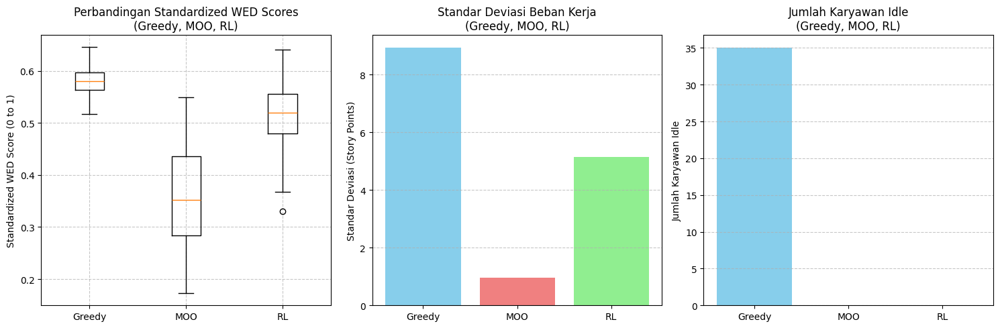


Statistik Standardized WED Scores:
Greedy: Mean=0.582, Median=0.580, Std=0.026
MOO: Mean=0.357, Median=0.353, Std=0.091
RL: Mean=0.515, Median=0.520, Std=0.052

Standar Deviasi Beban Kerja (Story Points):
Greedy: 8.93
MOO: 0.95
RL: 5.14

Jumlah Karyawan Idle:
Greedy: 35
MOO: 0
RL: 0


In [ ]:
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import gym
from gym import spaces
import random
from collections import deque
import matplotlib.pyplot as plt
import ast
from sklearn.impute import SimpleImputer

# Set device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Global Variables
NUM_EMPLOYEES = 109
NUM_TASKS = 300
MAX_TASKS = 500
MAX_EMPLOYEES = 200
MAX_WORKLOAD = 20
ALPHA_WED = 0.5
task_data_path = '/content/drive/MyDrive/Skripsi/Resources/Datasets/fixed_data_task.csv'
employee_data_path = '/content/drive/MyDrive/Skripsi/Resources/Datasets/fixed_data_employee.csv'
model_save_path = '/content/drive/MyDrive/Skripsi/reassignment_newstate_dqn_model_eps50.pth'
agent_save_path = '/content/drive/MyDrive/Skripsi/reassignment_newstate_dqn_agent_params_eps50.pth'

# --- 1. Greedy Approach ---

# Load datasets
task_data = pd.read_csv(task_data_path)
employee_data = pd.read_csv(employee_data_path)
task_subset = task_data.iloc[:NUM_TASKS]
employee_subset = employee_data.iloc[:NUM_EMPLOYEES]
skill_columns = [col for col in task_data.columns if col not in ['task_id', 'story_points', 'project_id']]
task_skills = task_subset[skill_columns] / 5.0 # Preprocessing - Normalisasi keterampilan
emp_skills = employee_subset[skill_columns] / 5.0 # Preprocessing - Normalisasi keterampilan
task_df = task_subset
emp_df = employee_subset

# WED calculation
def calculate_wed(emp, task, alpha=ALPHA_WED):
    weights = 1 / (1 + alpha * np.maximum(0, emp - task))
    wed = np.sqrt(np.sum(weights * (emp - task) ** 2))
    return wed

# Greedy assignment
assignments = {emp_idx: [] for emp_idx in range(NUM_EMPLOYEES)} # Preprocessing - Inisialisasi Struktur Penugasan
workload = np.zeros(NUM_EMPLOYEES)
weds_raw_greedy = []

np.random.seed(42) # Preprocessing - Pengacakan Urutan Tugas
for task_idx in np.random.permutation(NUM_TASKS):
    task = task_skills.iloc[task_idx].values
    sp = task_df['story_points'].iloc[task_idx] # Preprocessing - Ekstraksi Story Points
    project_id = task_df['project_id'].iloc[task_idx] # Preprocessing - Ekstraksi Project ID
    task_id = task_df.index[task_idx]
    best_emp, best_wed = None, float('inf')
    for emp_idx in range(NUM_EMPLOYEES):
        if workload[emp_idx] + sp <= MAX_WORKLOAD:
            emp = emp_skills.iloc[emp_idx].values
            wed = calculate_wed(emp, task)
            if wed < best_wed:
                best_wed, best_emp = wed, emp_idx
    if best_emp is not None:
        assignments[best_emp].append((task_id, project_id, sp, best_wed))
        workload[best_emp] += sp
        weds_raw_greedy.append(best_wed)

# Standardize WED scores for Greedy
weights_worst = 1 / (1 + ALPHA_WED * 1)
wed_raw_worst_greedy = np.sqrt(np.sum(weights_worst * (0 - 1) ** 2) * len(skill_columns))
wed_raw_best = 0
weds_standardized_greedy = [(wed_raw_worst_greedy - wed) / (wed_raw_worst_greedy - wed_raw_best) for wed in weds_raw_greedy]

# Prepare Greedy results
data = []
for emp_idx, tasks in assignments.items():
    employee_id = emp_df.index[emp_idx]
    projects = [proj for _, proj, _, _ in tasks] if tasks else []
    assigned_tasks = [task for task, _, _, _ in tasks] if tasks else []
    sum_sp = sum(sp for _, _, sp, _ in tasks) if tasks else 0
    wasted_sp = MAX_WORKLOAD - sum_sp
    similarity_scores = [wed for _, _, _, wed in tasks] if tasks else []
    data.append([employee_id, projects, assigned_tasks, sum_sp, wasted_sp, similarity_scores])

greedy_df = pd.DataFrame(data, columns=['employee', 'project', 'assigned_task', 'sum_sp', 'wasted_sp', 'similarity_score'])
greedy_df.to_csv('greedy_weighted_method_corrected.csv', index=False)

# Greedy metrics
story_points_greedy = greedy_df['sum_sp'].tolist()
std_dev_greedy = np.std(story_points_greedy)
num_idle_greedy = np.sum(np.array(story_points_greedy) == 0)

# --- 2. MOO Approach ---

# Load MOO result
path_moo = '/content/drive/MyDrive/Skripsi/Resources/Output/result_moo.csv'
result_moo = pd.read_csv(path_moo)

weds_raw_moo = []
for scores_str in result_moo['similarity_score']:
    scores = ast.literal_eval(scores_str)
    weds_raw_moo.extend([(1 / score) - 1 for score in scores])  # Convert similarity to WED

# Standardize WED for MOO (diperbaiki agar konsisten dengan skala [0,5])
wed_raw_worst_moo = np.sqrt(np.sum(1 / (1 + ALPHA_WED * 5) * (0 - 5) ** 2) * len(skill_columns))
weds_standardized_moo = [(wed_raw_worst_moo - wed) / (wed_raw_worst_moo - wed_raw_best) for wed in weds_raw_moo]

# Workload and Idle for MOO
story_points_moo = result_moo.groupby('employee')['sum_sp'].sum()
employee_list_moo = sorted(list(result_moo['employee'].unique()))
story_points_moo_list = [story_points_moo.get(emp, 0) for emp in employee_list_moo]
std_dev_moo = np.std(story_points_moo_list)
num_idle_moo = sum(1 for sp in story_points_moo_list if sp == 0)

# --- 3. RL Inference with New DQN ---

# TaskAssignmentEnv for New DQN
class TaskAssignmentEnv(gym.Env):
    def __init__(self, task_data, employee_data):
        super(TaskAssignmentEnv, self).__init__()
        self.num_tasks = NUM_TASKS
        self.num_employees = NUM_EMPLOYEES
        self.max_tasks = MAX_TASKS
        self.max_employees = MAX_EMPLOYEES
        self.max_workload = MAX_WORKLOAD

        # Load and preprocess data
        task_subset = task_data.iloc[:self.num_tasks]
        employee_subset = employee_data.iloc[:self.num_employees]
        skill_columns = [col for col in task_data.columns if col not in ['task_id', 'story_points', 'project_id']]
        project_id_map = {pid: idx + 1 for idx, pid in enumerate(task_subset['project_id'].unique())}
        project_ids = task_subset['project_id'].map(project_id_map).values
        task_skills_df = task_subset[skill_columns].fillna(0).astype(np.float32)
        employee_skills_df = employee_subset[skill_columns].fillna(0).astype(np.float32)
        story_points_df = task_subset['story_points'].astype(np.float32)

        self.task_skills = F.pad(
            torch.tensor(task_skills_df.values / 5.0, dtype=torch.float32, device=device),
            (0, 0, 0, self.max_tasks - self.num_tasks),
            'constant', 0
        )
        self.employee_skills = F.pad(
            torch.tensor(employee_skills_df.values / 5.0, dtype=torch.float32, device=device),
            (0, 0, 0, self.max_employees - self.num_employees),
            'constant', 0
        )
        self.story_points = F.pad(
            torch.tensor(story_points_df.values, dtype=torch.float32, device=device),
            (0, self.max_tasks - self.num_tasks),
            'constant', 0
        )
        self.project_ids = F.pad(
            torch.tensor(project_ids, dtype=torch.long, device=device),
            (0, self.max_tasks - self.num_tasks),
            'constant', -1
        )
        self.total_story_points = torch.sum(self.story_points[:self.num_tasks]).item()
        self.num_skills = len(skill_columns)

        # Define observation and action spaces
        self.observation_space = spaces.Dict({
            'state_matrix': spaces.Box(low=0, high=1, shape=(self.max_tasks, 5), dtype=np.float32),
            'workload_matrix': spaces.Box(low=0, high=MAX_WORKLOAD, shape=(self.max_employees,), dtype=np.float32),
            'global_features': spaces.Box(low=0, high=1, shape=(2,), dtype=np.float32),
            'task_mask': spaces.Box(low=0, high=1, shape=(self.max_tasks,), dtype=np.float32)
        })
        self.action_space = spaces.MultiDiscrete([2, self.max_tasks, self.max_employees])
        self.reset()

    def reset(self):
        self.workloads = torch.zeros(self.max_employees, device=device, dtype=torch.float32)
        self.assignments = torch.full((self.max_tasks,), -1, dtype=torch.long, device=device)
        self.remaining_tasks = torch.arange(self.num_tasks, device=device, dtype=torch.long)
        self.employee_projects = torch.full((self.max_employees,), -1, dtype=torch.long, device=device)
        self.wed_scores = []
        self._initialize_state_matrix()
        return self._get_obs()

    def _initialize_state_matrix(self):
        task_skills_expanded = self.task_skills[:self.num_tasks].unsqueeze(1).expand(-1, self.max_employees, -1)
        emp_skills_expanded = self.employee_skills.unsqueeze(0).expand(self.num_tasks, -1, -1)
        diff = emp_skills_expanded - task_skills_expanded
        weights = 1 / (1 + ALPHA_WED * torch.maximum(diff, torch.tensor(0.0, device=device)))
        mask = self.task_skills[:self.num_tasks].unsqueeze(1).expand(-1, self.max_employees, -1) > 0
        weighted_diff = weights * mask * (emp_skills_expanded - task_skills_expanded) ** 2
        wed = torch.sqrt(torch.sum(weighted_diff, dim=2))
        num_skills_per_task = torch.sum(self.task_skills[:self.num_tasks] > 0, dim=1).unsqueeze(1).expand(-1, self.max_employees)
        wed_worst = torch.sqrt(num_skills_per_task * (1.0 ** 2))
        wed_worst = torch.where(num_skills_per_task > 0, wed_worst, torch.tensor(1.0, device=device))
        similarity_matrix = (1 - (wed / wed_worst)).to(dtype=torch.float32)
        self.state_matrix = torch.topk(similarity_matrix, k=5, dim=1).values
        self.state_matrix = F.pad(self.state_matrix, (0, 0, 0, self.max_tasks - self.num_tasks), 'constant', 0)

    def _update_state_matrix(self, task_idx, emp_idx):
        task_skills_expanded = self.task_skills[task_idx].unsqueeze(0).expand(self.max_employees, -1)
        emp_skills_expanded = self.employee_skills.expand(self.max_employees, -1)
        diff = emp_skills_expanded - task_skills_expanded
        weights = 1 / (1 + ALPHA_WED * torch.maximum(diff, torch.tensor(0.0, device=device)))
        mask = task_skills_expanded > 0
        weighted_diff = weights * mask * (emp_skills_expanded - task_skills_expanded) ** 2
        wed = torch.sqrt(torch.sum(weighted_diff, dim=1))
        num_skills = torch.sum(mask.float(), dim=1)
        wed_worst = torch.sqrt(num_skills * (1.0 ** 2)) if num_skills[0] > 0 else 1.0
        similarities = 1 - (wed / wed_worst)
        top_k_similarities = torch.topk(similarities, k=5, dim=0).values
        self.state_matrix[task_idx] = top_k_similarities

    def _get_obs(self):
        workload_matrix = self.workloads
        prop_remaining = len(self.remaining_tasks) / self.num_tasks
        num_idle = torch.sum(self.workloads[:self.num_employees] == 0).item()
        prop_idle = num_idle / self.num_employees
        global_features = torch.tensor([prop_remaining, prop_idle], device=device, dtype=torch.float32)
        task_mask = torch.zeros(self.max_tasks, device=device, dtype=torch.float32)
        task_mask[self.remaining_tasks] = 1
        return {
            'state_matrix': self.state_matrix,
            'workload_matrix': workload_matrix,
            'global_features': global_features,
            'task_mask': task_mask
        }

    def step(self, action):
        action_type, task_idx, emp_idx = action
        done = False
        reward = {'similarity': 0.0, 'workload': 0.0, 'idle': 0.0}
        info = {'action_valid': True}

        if emp_idx < 0 or emp_idx >= self.num_employees or task_idx < 0 or task_idx >= self.num_tasks:
            reward['similarity'] = -1.0
            info['action_valid'] = False
            return self._get_obs(), reward, done, info

        current_std = torch.std(self.workloads[:self.num_employees]).item()

        if action_type == 0:
            if task_idx not in self.remaining_tasks:
                reward['similarity'] = -1.0
                info['action_valid'] = False
                return self._get_obs(), reward, done, info

            task_project = self.project_ids[task_idx]
            emp_project = self.employee_projects[emp_idx]
            current_workload = self.workloads[emp_idx]
            if emp_project != -1 and emp_project != task_project:
                reward['similarity'] = -1.0
                info['action_valid'] = False
                return self._get_obs(), reward, done, info
            if current_workload + self.story_points[task_idx] > self.max_workload:
                reward['similarity'] = -1.0
                info['action_valid'] = False
                return self._get_obs(), reward, done, info

            was_idle = (self.workloads[emp_idx] == 0)
            self.assignments[task_idx] = emp_idx
            self.workloads[emp_idx] += self.story_points[task_idx]
            self.remaining_tasks = self.remaining_tasks[self.remaining_tasks != task_idx]
            if self.employee_projects[emp_idx] == -1:
                self.employee_projects[emp_idx] = task_project
            self._update_state_matrix(task_idx, emp_idx)

        elif action_type == 1:
            if task_idx in self.remaining_tasks:
                reward['similarity'] = -1.0
                info['action_valid'] = False
                return self._get_obs(), reward, done, info
            current_emp_idx = self.assignments[task_idx]
            if current_emp_idx == emp_idx:
                reward['similarity'] = -1.0
                info['action_valid'] = False
                return self._get_obs(), reward, done, info
            task_project = self.project_ids[task_idx]
            emp_project = self.employee_projects[emp_idx]
            current_workload = self.workloads[emp_idx]
            if emp_project != -1 and emp_project != task_project:
                reward['similarity'] = -1.0
                info['action_valid'] = False
                return self._get_obs(), reward, done, info
            if current_workload + self.story_points[task_idx] > self.max_workload:
                reward['similarity'] = -1.0
                info['action_valid'] = False
                return self._get_obs(), reward, done, info

            self.workloads[current_emp_idx] -= self.story_points[task_idx]
            emp_tasks = (self.assignments == current_emp_idx) & (self.project_ids == task_project)
            emp_tasks[task_idx] = False
            if not torch.any(emp_tasks):
                self.employee_projects[current_emp_idx] = -1
            was_idle = (self.workloads[emp_idx] == 0)
            self.assignments[task_idx] = emp_idx
            self.workloads[emp_idx] += self.story_points[task_idx]
            if self.employee_projects[emp_idx] == -1:
                self.employee_projects[emp_idx] = task_project
            self._update_state_matrix(task_idx, emp_idx)

        else:
            reward['similarity'] = -1.0
            info['action_valid'] = False
            return self._get_obs(), reward, done, info

        new_std = torch.std(self.workloads[:self.num_employees]).item()
        std_change = new_std - current_std
        if std_change < 0:
            reward['workload'] += 0.5
        elif std_change > 0:
            reward['workload'] -= 0.3

        task_skills_t = self.task_skills[task_idx]
        emp_skills_e = self.employee_skills[emp_idx]
        diff = emp_skills_e - task_skills_t
        weights = 1 / (1 + ALPHA_WED * torch.maximum(diff, torch.tensor(0.0, device=device)))
        mask = task_skills_t > 0
        weighted_diff = weights[mask] * (emp_skills_e[mask] - task_skills_t[mask]) ** 2
        wed = torch.sqrt(torch.sum(weighted_diff))
        num_skills = torch.sum(mask.float())
        wed_worst = torch.sqrt(num_skills * (1.0 ** 2)) if num_skills > 0 else 1.0
        similarity = 1 - (wed / wed_worst) if wed_worst > 0 else 0.0
        info['similarity'] = similarity.item()
        self.wed_scores.append(wed.item())

        if action_type == 0:
            reward['similarity'] = similarity.item()
            if was_idle:
                reward['idle'] = 0.1
        else:
            reward['similarity'] = -0.01

        if len(self.remaining_tasks) == 0:
            done = True
            assigned_tasks = torch.where(self.assignments != -1)[0]
            total_similarity = 0.0
            for task_idx in assigned_tasks:
                emp_idx = self.assignments[task_idx].item()
                task_skills_t = self.task_skills[task_idx]
                emp_skills_e = self.employee_skills[emp_idx]
                diff = emp_skills_e - task_skills_t
                weights = 1 / (1 + ALPHA_WED * torch.maximum(diff, torch.tensor(0.0, device=device)))
                mask = task_skills_t > 0
                weighted_diff = weights[mask] * (emp_skills_e[mask] - task_skills_t[mask]) ** 2
                wed = torch.sqrt(torch.sum(weighted_diff))
                num_skills = torch.sum(mask.float())
                wed_worst = torch.sqrt(num_skills * (1.0 ** 2)) if num_skills > 0 else 1.0
                similarity = 1 - (wed / wed_worst) if wed_worst > 0 else 0.0
                total_similarity += similarity
            avg_similarity = (total_similarity / self.num_tasks if self.num_tasks > 0 else 0.0).item()
            reward['similarity'] += 50.0 * (2.0 * avg_similarity - 1.0)
            std_workload = torch.std(self.workloads[:self.num_employees]).item()
            max_std = self.max_workload / 2
            normalized_std = std_workload / max_std if max_std > 0 else 0.0
            reward['workload'] = 100.0 * (1.0 - 2.0 * normalized_std)
            num_idle = torch.sum(self.workloads[:self.num_employees] == 0).item()
            idle_ratio = num_idle / self.num_employees
            reward['idle'] += 50.0 * (1.0 - 2.0 * idle_ratio)
            info['avg_similarity'] = avg_similarity
            info['std_workload'] = std_workload
            info['num_idle'] = num_idle

        return self._get_obs(), reward, done, info

# DQN Model
class DQN(nn.Module):
    def __init__(self, input_dim, max_employees, max_tasks, num_employees, num_tasks):
        super(DQN, self).__init__()
        self.max_employees = max_employees
        self.max_tasks = max_tasks
        self.num_employees = num_employees
        self.num_tasks = num_tasks
        self.fc_state = nn.Linear(max_tasks * 5, 128).to(device, dtype=torch.float32)
        self.fc_workload = nn.Linear(max_employees, 64).to(device, dtype=torch.float32)
        self.fc_global = nn.Linear(2, 16).to(device, dtype=torch.float32)
        self.fc_combined = nn.Linear(128 + 64 + 16, 256).to(device, dtype=torch.float32)
        self.fc2 = nn.Linear(256, 128).to(device, dtype=torch.float32)
        self.fc3 = nn.Linear(128, 2 * max_tasks * max_employees).to(device, dtype=torch.float32)

    def forward(self, state_matrix, workload_matrix, global_features):
        batch_size = state_matrix.size(0)
        state_input = state_matrix.view(batch_size, -1)
        state_input = F.relu(self.fc_state(state_input))
        workload_input = workload_matrix.view(batch_size, -1)
        workload_input = F.relu(self.fc_workload(workload_input))
        global_input = global_features.view(batch_size, -1)
        global_input = F.relu(self.fc_global(global_input))
        x = torch.cat([state_input, workload_input, global_input], dim=1)
        x = F.relu(self.fc_combined(x))
        x = F.relu(self.fc2(x))
        q_values = self.fc3(x).view(batch_size, 2, self.max_tasks, self.max_employees)
        q_values[:, :, self.num_tasks:, :] = -float('inf')
        q_values[:, :, :, self.num_employees:] = -float('inf')
        return q_values

# DQN Agent
class DQNAgent:
    def __init__(self, num_tasks, num_employees):
        self.device = device
        self.num_tasks = num_tasks
        self.num_employees = num_employees
        self.max_tasks = MAX_TASKS
        self.max_employees = MAX_EMPLOYEES
        self.model = DQN(1 + 1 + 1 + 4, self.max_employees, self.max_tasks, self.num_employees, self.num_tasks).to(device)
        self.target_model = DQN(1 + 1 + 1 + 4, self.max_employees, self.max_tasks, self.num_employees, self.num_tasks).to(device)
        self.target_model.load_state_dict(self.model.state_dict())
        self.optimizer = torch.optim.Adam(self.model.parameters(), lr=3e-4)
        self.memory = deque(maxlen=50000)
        self.temperature = 1.0
        self.epsilon = 0.05

    def act(self, obs, env):
        valid_tasks = torch.where(obs['task_mask'][:self.num_tasks] == 1)[0]
        assigned_tasks = torch.where(env.assignments[:self.num_tasks] != -1)[0]

        if random.random() < self.epsilon:
            if len(valid_tasks) > 0 and random.random() < 0.8:
                task_idx = random.choice(valid_tasks.cpu().numpy())
                valid_emps = torch.where(
                    (env.workloads[:self.num_employees] + env.story_points[task_idx] <= env.max_workload) &
                    ((env.employee_projects[:self.num_employees] == -1) | (env.employee_projects[:self.num_employees] == env.project_ids[task_idx]))
                )[0]
                if valid_emps.size(0) > 0:
                    emp_idx = random.choice(valid_emps.cpu().numpy())
                    return [0, task_idx, emp_idx]
            else:
                if len(assigned_tasks) == 0:
                    task_idx = random.choice(valid_tasks.cpu().numpy())
                    valid_emps = torch.where(
                        (env.workloads[:self.num_employees] + env.story_points[task_idx] <= env.max_workload) &
                        ((env.employee_projects[:self.num_employees] == -1) | (env.employee_projects[:self.num_employees] == env.project_ids[task_idx]))
                    )[0]
                    if valid_emps.size(0) > 0:
                        emp_idx = random.choice(valid_emps.cpu().numpy())
                        return [0, task_idx, emp_idx]
                task_idx = random.choice(assigned_tasks.cpu().numpy())
                current_emp_idx = env.assignments[task_idx].item()
                valid_emps = torch.where(
                    (torch.arange(self.num_employees, device=device) != current_emp_idx) &
                    (env.workloads[:self.num_employees] + env.story_points[task_idx] <= env.max_workload) &
                    ((env.employee_projects[:self.num_employees] == -1) | (env.employee_projects[:self.num_employees] == env.project_ids[task_idx]))
                )[0]
                if valid_emps.size(0) > 0:
                    emp_idx = random.choice(valid_emps.cpu().numpy())
                    return [1, task_idx, emp_idx]

        state_matrix = obs['state_matrix'].unsqueeze(0).to(dtype=torch.float32)
        workload_matrix = obs['workload_matrix'].unsqueeze(0).to(dtype=torch.float32)
        global_features = obs['global_features'].unsqueeze(0).to(dtype=torch.float32)

        with torch.no_grad():
            q_values = self.model(state_matrix, workload_matrix, global_features)
            task_mask = torch.zeros(self.max_tasks, device=device, dtype=torch.bool)
            task_mask[valid_tasks] = 1
            emp_mask = torch.ones(self.max_tasks, self.max_employees, device=device, dtype=torch.bool)
            for t in range(self.num_tasks):
                emp_mask[t, :self.num_employees] = (
                    (env.workloads[:self.num_employees] + env.story_points[t] <= env.max_workload) &
                    ((env.employee_projects[:self.num_employees] == -1) | (env.employee_projects[:self.num_employees] == env.project_ids[t]))
                )
                emp_mask[t, self.num_employees:] = False
            assign_mask = torch.zeros_like(q_values, dtype=torch.bool)
            assign_mask[:, 0] = task_mask.unsqueeze(-1).expand(-1, self.max_employees) & emp_mask
            reassign_mask = torch.zeros_like(q_values, dtype=torch.bool)
            for t in assigned_tasks:
                current_emp_idx = env.assignments[t].item()
                reassign_emp_mask = emp_mask[t].clone()
                reassign_emp_mask[current_emp_idx] = False
                reassign_mask[0, 1, t] = reassign_emp_mask
            combined_mask = assign_mask | reassign_mask
            q_values[~combined_mask] = -float('inf')

            if torch.all(q_values == -float('inf')):
                if len(valid_tasks) > 0:
                    task_idx = random.choice(valid_tasks.cpu().numpy())
                    valid_emps = torch.where(
                        (env.workloads[:self.num_employees] + env.story_points[task_idx] <= env.max_workload) &
                        ((env.employee_projects[:self.num_employees] == -1) | (env.employee_projects[:self.num_employees] == env.project_ids[task_idx]))
                    )[0]
                    if valid_emps.size(0) > 0:
                        emp_idx = random.choice(valid_emps.cpu().numpy())
                        return [0, task_idx, emp_idx]
                else:
                    task_idx = random.choice(assigned_tasks.cpu().numpy())
                    current_emp_idx = env.assignments[task_idx].item()
                    valid_emps = torch.where(
                        (torch.arange(self.num_employees, device=device) != current_emp_idx) &
                        (env.workloads[:self.num_employees] + env.story_points[task_idx] <= env.max_workload) &
                        ((env.employee_projects[:self.num_employees] == -1) | (env.employee_projects[:self.num_employees] == env.project_ids[task_idx]))
                    )[0]
                    if valid_emps.size(0) > 0:
                        emp_idx = random.choice(valid_emps.cpu().numpy())
                        return [1, task_idx, emp_idx]
            else:
                action_idx = torch.argmax(q_values.view(-1)).item()
                action_type = action_idx // (self.max_tasks * self.max_employees)
                task_emp_idx = action_idx % (self.max_tasks * self.max_employees)
                task_idx = task_emp_idx // self.max_employees
                emp_idx = task_emp_idx % self.max_employees
                return [action_type, task_idx, emp_idx]

    def load(self, model_path, agent_path):
        checkpoint = torch.load(model_path)
        self.model.load_state_dict(checkpoint['model_state_dict'])
        self.target_model.load_state_dict(checkpoint['target_model_state_dict'])
        self.optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
        # Load agent parameters with weights_only=False
        agent_params = torch.load(agent_path, weights_only=False)
        self.temperature = agent_params['temperature']
        self.epsilon = agent_params['epsilon']
        self.memory = deque(maxlen=50000)

# RL Inference
def run_inference():
    env = TaskAssignmentEnv(task_data, employee_data)
    agent = DQNAgent(env.num_tasks, env.num_employees)
    agent.load(model_save_path, agent_save_path)

    obs = env.reset()
    done = False
    while not done:
        action = agent.act(obs, env)
        next_obs, reward, done, info = env.step(action)
        obs = next_obs

    weds_raw_rl = env.wed_scores
    workloads_rl = env.workloads[:env.num_employees].cpu().numpy()
    num_idle_rl = info.get('num_idle', torch.sum(env.workloads[:env.num_employees] == 0).item())
    std_workloads_rl = info.get('std_workload', torch.std(env.workloads[:env.num_employees]).item())

    return weds_raw_rl, workloads_rl, std_workloads_rl, num_idle_rl

# Run RL inference
weds_raw_rl, workloads_rl, std_dev_rl, num_idle_rl = run_inference()

# Standardize WED for RL
weds_standardized_rl = [(wed_raw_worst_greedy - wed) / (wed_raw_worst_greedy - wed_raw_best) for wed in weds_raw_rl]

# --- 4. Visualisasi Perbandingan ---

weds_standardized_all = {
    'Greedy': weds_standardized_greedy,
    'MOO': weds_standardized_moo,
    'RL': weds_standardized_rl
}

std_devs = {
    'Greedy': std_dev_greedy,
    'MOO': std_dev_moo,
    'RL': std_dev_rl
}

idle_employees = {
    'Greedy': num_idle_greedy,
    'MOO': num_idle_moo,
    'RL': num_idle_rl
}

# Visualisasi
plt.figure(figsize=(15, 5))

# Boxplot WED Scores
plt.subplot(1, 3, 1)
plt.boxplot(weds_standardized_all.values(), labels=weds_standardized_all.keys())
plt.title("Perbandingan Standardized WED Scores\n(Greedy, MOO, RL)")
plt.ylabel("Standardized WED Score (0 to 1)")
plt.grid(True, linestyle='--', alpha=0.7)

# Bar Chart Standar Deviasi Beban Kerja
plt.subplot(1, 3, 2)
plt.bar(std_devs.keys(), std_devs.values(), color=['skyblue', 'lightcoral', 'lightgreen'])
plt.title("Standar Deviasi Beban Kerja\n(Greedy, MOO, RL)")
plt.ylabel("Standar Deviasi (Story Points)")
plt.grid(True, linestyle='--', alpha=0.7, axis='y')

# Bar Chart Jumlah Karyawan Idle
plt.subplot(1, 3, 3)
plt.bar(idle_employees.keys(), idle_employees.values(), color=['skyblue', 'lightcoral', 'lightgreen'])
plt.title("Jumlah Karyawan Idle\n(Greedy, MOO, RL)")
plt.ylabel("Jumlah Karyawan Idle")
plt.grid(True, linestyle='--', alpha=0.7, axis='y')

plt.tight_layout()
plt.savefig('comparison_greedy_moo_rl.png')
plt.show()

# Statistik Tambahan
print("\nStatistik Standardized WED Scores:")
for approach, weds in weds_standardized_all.items():
    print(f"{approach}: Mean={np.mean(weds):.3f}, Median={np.median(weds):.3f}, Std={np.std(weds):.3f}")

print("\nStandar Deviasi Beban Kerja (Story Points):")
for approach, std_dev in std_devs.items():
    print(f"{approach}: {std_dev:.2f}")

print("\nJumlah Karyawan Idle:")
for approach, num_idle in idle_employees.items():
    print(f"{approach}: {num_idle}")

Using device: cuda
Number of unique employees in MOO: 109
Sample raw WEDs for MOO (normalized scale): [2.70801280154532, 3.3226495451672298, 2.9051678092667896, 2.988422103161912, 3.0]
Sample standardized WEDs for MOO: [np.float64(0.5886233243962788), np.float64(0.495253300387976), np.float64(0.5586733287356963), np.float64(0.5460260935997449), np.float64(0.54426728481235)]
Running RL inference...


<ipython-input-4-99556a2b6def>:144: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  story_points_moo_list = [story_points_moo.get(emp, 0) for emp in employee_list_moo]


Step 1: Action=[0, 172, 43], Reward={'similarity': 0.0, 'workload': 0.0, 'idle': 0.0}, Time=0.11s
Step 2: Action=[0, 83, 44], Reward={'similarity': 0.0, 'workload': 0.0, 'idle': 0.0}, Time=0.16s
Step 3: Action=[0, 193, 105], Reward={'similarity': 0.0, 'workload': 0.0, 'idle': 0.0}, Time=0.19s
Step 4: Action=[0, 158, 69], Reward={'similarity': 0.0, 'workload': 0.0, 'idle': 0.0}, Time=0.22s
Step 5: Action=[0, 270, 66], Reward={'similarity': 0.0, 'workload': 0.0, 'idle': 0.0}, Time=0.20s
Step 6: Action=[0, 262, 107], Reward={'similarity': 0.0, 'workload': 0.0, 'idle': 0.0}, Time=0.26s
Step 7: Action=[0, 106, 51], Reward={'similarity': 0.0, 'workload': 0.0, 'idle': 0.0}, Time=0.23s
Step 8: Action=[0, 251, 91], Reward={'similarity': 0.0, 'workload': 0.0, 'idle': 0.0}, Time=0.16s
Step 9: Action=[0, 230, 10], Reward={'similarity': 0.0, 'workload': 0.0, 'idle': 0.0}, Time=0.13s
Step 10: Action=[0, 116, 27], Reward={'similarity': 0.0, 'workload': 0.0, 'idle': 0.0}, Time=0.23s
Step 11: Action=[0

<ipython-input-4-99556a2b6def>:696: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(weds_standardized_all.values(), labels=weds_standardized_all.keys(), showmeans=True)


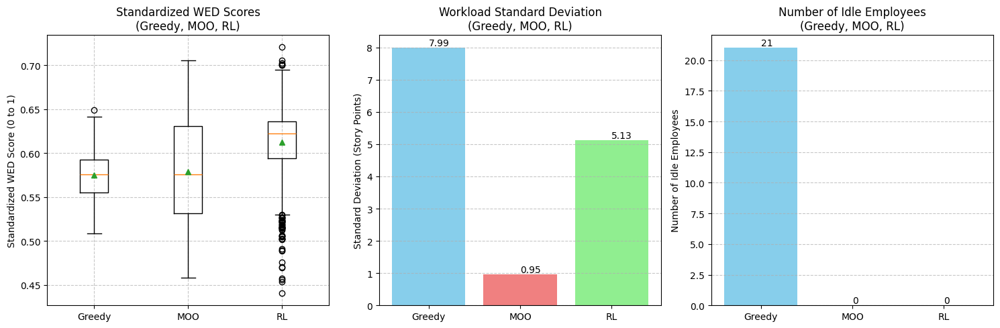


Statistics for Standardized WED Scores:
Greedy: Mean=0.575, Median=0.576, Std=0.027
MOO: Mean=0.579, Median=0.576, Std=0.060
RL: Mean=0.613, Median=0.622, Std=0.046

Workload Standard Deviation (Story Points):
Greedy: 7.99
MOO: 0.95
RL: 5.13

Number of Idle Employees:
Greedy: 21
MOO: 0
RL: 0

Instructions:
1. Review the plots and statistics above to compare the three approaches.
2. Standardized WED Scores: Higher values indicate better skill-task matching (closer to 1 is better).
3. Workload Standard Deviation: Lower values indicate better workload balance across employees.
4. Number of Idle Employees: Lower values indicate better utilization of employees.
5. Use these metrics to determine which approach best balances skill matching, workload distribution, and employee utilization for your needs.


In [ ]:
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import gym
from gym import spaces
import random
from collections import deque
import matplotlib.pyplot as plt
import seaborn as sns
import ast
import time

# Set device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Global Variables
MAX_TASKS = 500
MAX_EMPLOYEES = 200
MAX_WORKLOAD = 20
ALPHA_WED = 0.5
DQN_HIDDEN_DIM = 256
NEW_NUM_TASKS = 300
NEW_NUM_EMPLOYEES = 109

# File paths
task_data_path = '/content/drive/MyDrive/Skripsi/Resources/Datasets/fixed_data_task.csv'
employee_data_path = '/content/drive/MyDrive/Skripsi/Resources/Datasets/fixed_data_employee.csv'
model_path = '/content/drive/MyDrive/Skripsi/reassignment_dqn_model.pth'
agent_path = '/content/drive/MyDrive/Skripsi/reassignment_dqn_agent_params.pth'
moo_result_path = '/content/drive/MyDrive/Skripsi/Resources/Output/result_moo.csv'

# Load datasets
task_data = pd.read_csv(task_data_path)
employee_data = pd.read_csv(employee_data_path)
task_subset = task_data.iloc[:NEW_NUM_TASKS]
employee_subset = employee_data.iloc[:NEW_NUM_EMPLOYEES]
skill_columns = [col for col in task_data.columns if col not in ['task_id', 'story_points', 'project_id']]
task_skills = task_subset[skill_columns].fillna(0).astype(np.float32) / 5.0
emp_skills = employee_subset[skill_columns].fillna(0).astype(np.float32) / 5.0
task_df = task_subset
emp_df = employee_subset
story_points = task_subset['story_points'].values
project_ids_raw = task_subset['project_id'].values
unique_projects = np.unique(project_ids_raw)
project_id_map = {pid: idx + 1 for idx, pid in enumerate(unique_projects)}
project_ids = np.array([project_id_map[pid] for pid in project_ids_raw], dtype=int)

# --- 1. Greedy Approach ---

# WED calculation with weighted Euclidean distance (consistent with RL)
def calculate_wed(emp, task, alpha=ALPHA_WED):
    weights = 1 / (1 + alpha * np.maximum(0, emp - task))
    wed = np.sqrt(np.sum(weights * (emp - task) ** 2))
    return wed

# Greedy assignment
assignments_greedy = {emp_idx: [] for emp_idx in range(NEW_NUM_EMPLOYEES)}
workload_greedy = np.zeros(NEW_NUM_EMPLOYEES)
weds_raw_greedy = []

np.random.seed(42)
for task_idx in np.random.permutation(NEW_NUM_TASKS):
    task = task_skills.iloc[task_idx].values
    sp = task_df['story_points'].iloc[task_idx]
    project_id = project_ids[task_idx]
    task_id = task_df.index[task_idx]
    best_emp, best_wed = None, float('inf')
    for emp_idx in range(NEW_NUM_EMPLOYEES):
        if workload_greedy[emp_idx] + sp <= MAX_WORKLOAD:
            emp = emp_skills.iloc[emp_idx].values
            emp_project = assignments_greedy[emp_idx][0][1] if assignments_greedy[emp_idx] else -1
            if emp_project != -1 and emp_project != project_id:
                continue
            wed = calculate_wed(emp, task)
            if wed < best_wed:
                best_wed, best_emp = wed, emp_idx
    if best_emp is not None:
        assignments_greedy[best_emp].append((task_id, project_id, sp, best_wed))
        workload_greedy[best_emp] += sp
        weds_raw_greedy.append(best_wed)

# Standardize WED scores for Greedy
weights_worst = 1 / (1 + ALPHA_WED * 1)  # Max difference = 1 (skills in [0, 1])
wed_raw_worst = np.sqrt(np.sum(weights_worst * (0 - 1) ** 2) * len(skill_columns))
wed_raw_best = 0
weds_standardized_greedy = [(wed_raw_worst - wed) / (wed_raw_worst - wed_raw_best) for wed in weds_raw_greedy]

# Prepare Greedy results
data_greedy = []
for emp_idx, tasks in assignments_greedy.items():
    employee_id = emp_df.index[emp_idx]
    projects = [proj for _, proj, _, _ in tasks] if tasks else []
    assigned_tasks = [task for task, _, _, _ in tasks] if tasks else []
    sum_sp = sum(sp for _, _, sp, _ in tasks) if tasks else 0
    similarity_scores = [wed for _, _, _, wed in tasks] if tasks else []
    data_greedy.append([employee_id, projects, assigned_tasks, sum_sp, similarity_scores])

greedy_df = pd.DataFrame(data_greedy, columns=['employee', 'project', 'assigned_task', 'sum_sp', 'similarity_score'])
greedy_df.to_csv('greedy_assignments.csv', index=False)

# Calculate Greedy metrics
story_points_greedy = greedy_df['sum_sp'].tolist()
std_dev_greedy = np.std(story_points_greedy)
num_idle_greedy = np.sum(np.array(story_points_greedy) == 0)

# --- 2. MOO Approach ---

# Load MOO result
result_moo = pd.read_csv(moo_result_path)

# Check number of unique employees
moo_employees = result_moo['employee'].unique()
print(f"Number of unique employees in MOO: {len(moo_employees)}")
if len(moo_employees) != NEW_NUM_EMPLOYEES:
    print(f"Warning: MOO has {len(moo_employees)} employees, but expected {NEW_NUM_EMPLOYEES}. Adjusting workload metrics.")

# Convert MOO similarity scores back to WED
weds_raw_moo = []
# MOO similarity_score is assumed to be similarity = 1 / (1 + wed), with wed computed on unnormalized skills [0, 5]
for scores_str in result_moo['similarity_score']:
    scores = ast.literal_eval(scores_str)
    # Convert similarity back to WED: wed = (1 / similarity) - 1
    weds_unnormalized = [(1 / score) - 1 for score in scores]
    # Scale the WED to match the normalized skill scale [0, 1]
    weds = [wed / 5.0 for wed in weds_unnormalized]  # Divide by 5 because skills were originally in [0, 5]
    weds_raw_moo.extend(weds)

# Debug: Print sample raw WEDs
print("Sample raw WEDs for MOO (normalized scale):", weds_raw_moo[:5])

# Standardize WED for MOO using the same wed_raw_worst as Greedy and RL
weds_standardized_moo = [(wed_raw_worst - wed) / (wed_raw_worst - wed_raw_best) for wed in weds_raw_moo]

# Debug: Print sample standardized WEDs
print("Sample standardized WEDs for MOO:", weds_standardized_moo[:5])

# Workload and Idle for MOO
# Map MOO employees to the same set as Greedy/RL (assuming employee IDs match the indices in employee_data)
employee_list_moo = sorted(list(emp_df.index))  # Use the same employee IDs as in employee_data
story_points_moo = result_moo.groupby('employee')['sum_sp'].sum()
story_points_moo_list = [story_points_moo.get(emp, 0) for emp in employee_list_moo]
std_dev_moo = np.std(story_points_moo_list)
num_idle_moo = sum(1 for sp in story_points_moo_list if sp == 0)

# --- 3. RL Inference ---

# Environment class (from the new RL inference code)
class TaskAssignmentEnv(gym.Env):
    def __init__(self, task_data, employee_data, max_tasks=MAX_TASKS, max_employees=MAX_EMPLOYEES):
        super(TaskAssignmentEnv, self).__init__()
        self.num_tasks = len(task_data)
        self.num_employees = len(employee_data)
        self.max_tasks = max_tasks
        self.max_employees = max_employees
        self.max_workload = MAX_WORKLOAD
        self.alpha_wed = ALPHA_WED

        # Load and preprocess data
        task_subset = task_data.iloc[:self.num_tasks]
        employee_subset = employee_data.iloc[:self.num_employees]
        skill_columns = [col for col in task_data.columns if col not in ['task_id', 'story_points', 'project_id']]
        project_id_map = {pid: idx + 1 for idx, pid in enumerate(task_subset['project_id'].unique())}
        project_ids = task_subset['project_id'].map(project_id_map).values
        task_skills_df = task_subset[skill_columns].fillna(0).astype(np.float32)
        employee_skills_df = employee_subset[skill_columns].fillna(0).astype(np.float32)
        story_points_df = task_subset['story_points'].astype(np.float32)

        # Convert to tensors and pad
        self.task_skills = F.pad(
            torch.tensor(task_skills_df.values / 5.0, dtype=torch.float32, device=device),
            (0, 0, 0, max_tasks - self.num_tasks),
            'constant', 0
        )
        self.employee_skills = F.pad(
            torch.tensor(employee_skills_df.values / 5.0, dtype=torch.float32, device=device),
            (0, 0, 0, max_employees - self.num_employees),
            'constant', 0
        )
        self.story_points = F.pad(
            torch.tensor(story_points_df.values, dtype=torch.float32, device=device),
            (0, max_tasks - self.num_tasks),
            'constant', 0
        )
        self.project_ids = F.pad(
            torch.tensor(project_ids, dtype=torch.long, device=device),
            (0, max_tasks - self.num_tasks),
            'constant', -1
        )
        self.total_story_points = torch.sum(self.story_points[:self.num_tasks]).item()
        self.num_skills = len(skill_columns)

        # Define observation and action spaces
        self.observation_space = spaces.Dict({
            'state_matrix': spaces.Box(low=0, high=1, shape=(max_tasks, max_employees, 1), dtype=np.float32),
            'workload_matrix': spaces.Box(low=0, high=MAX_WORKLOAD, shape=(max_employees,), dtype=np.float32),
            'idle_status': spaces.Box(low=0, high=1, shape=(max_employees,), dtype=np.float32),
            'global_features': spaces.Box(low=0, high=1, shape=(4,), dtype=np.float32),
            'task_mask': spaces.Box(low=0, high=1, shape=(max_tasks,), dtype=np.float32)
        })
        self.action_space = spaces.MultiDiscrete([2, self.num_tasks, self.num_employees])
        self.reset()

    def reset(self):
        self.workloads = torch.zeros(self.max_employees, device=device, dtype=torch.float32)
        self.assignments = torch.full((self.max_tasks,), -1, dtype=torch.long, device=device)
        self.remaining_tasks = torch.arange(self.num_tasks, device=device, dtype=torch.long)
        self.employee_projects = torch.full((self.max_employees,), -1, dtype=torch.long, device=device)
        self.wed_scores = []
        self._initialize_state_matrix()
        return self._get_obs()

    def _initialize_state_matrix(self):
        task_skills_expanded = self.task_skills[:self.num_tasks].unsqueeze(1).expand(-1, self.max_employees, -1)
        emp_skills_expanded = self.employee_skills.unsqueeze(0).expand(self.num_tasks, -1, -1)
        diff = emp_skills_expanded - task_skills_expanded
        weights = 1 / (1 + self.alpha_wed * torch.maximum(diff, torch.tensor(0.0, device=device, dtype=torch.float32)))
        mask = self.task_skills[:self.num_tasks].unsqueeze(1).expand(-1, self.max_employees, -1) > 0
        weighted_diff = weights * mask * (emp_skills_expanded - task_skills_expanded) ** 2
        wed = torch.sqrt(torch.sum(weighted_diff, dim=2))
        num_skills_per_task = torch.sum(self.task_skills[:self.num_tasks] > 0, dim=1).unsqueeze(1).expand(-1, self.max_employees)
        wed_worst = torch.sqrt(num_skills_per_task * (1.0 ** 2))
        wed_worst = torch.where(num_skills_per_task > 0, wed_worst, torch.tensor(1.0, device=device, dtype=torch.float32))
        self.state_matrix = torch.zeros((self.max_tasks, self.max_employees, 1), device=device, dtype=torch.float32)
        self.state_matrix[:self.num_tasks, :, 0] = (1 - (wed / wed_worst)).to(dtype=torch.float32)
        workload_penalty = self.workloads.unsqueeze(0).expand(self.max_tasks, -1).unsqueeze(-1) / self.max_workload
        self.state_matrix = self.state_matrix * (1 - torch.clamp(workload_penalty, 0, 1))

    def _update_state_matrix(self, task_idx, emp_idx):
        task_skills_t = self.task_skills[task_idx]
        emp_skills_e = self.employee_skills[emp_idx]
        diff = emp_skills_e - task_skills_t
        weights = 1 / (1 + self.alpha_wed * torch.maximum(diff, torch.tensor(0.0, device=device, dtype=torch.float32)))
        mask = task_skills_t > 0
        weighted_diff = weights[mask] * (emp_skills_e[mask] - task_skills_t[mask]) ** 2
        wed = torch.sqrt(torch.sum(weighted_diff))
        num_skills = torch.sum(mask.float())
        wed_worst = torch.sqrt(num_skills * (1.0 ** 2)) if num_skills > 0 else 1.0
        similarity = 1 - (wed / wed_worst) if wed_worst > 0 else 0.0
        workload_penalty = self.workloads[emp_idx].unsqueeze(0).unsqueeze(-1) / self.max_workload
        self.state_matrix[task_idx, emp_idx, 0] = similarity * (1 - torch.clamp(workload_penalty, 0, 1))

    def _get_obs(self):
        workload_matrix = self.workloads
        idle_status = (self.workloads == 0).float()
        prop_remaining = len(self.remaining_tasks) / self.num_tasks
        num_idle = torch.sum(self.workloads[:self.num_employees] == 0).item()
        prop_idle = num_idle / self.num_employees
        mean_workload = torch.mean(self.workloads[:self.num_employees]).item() if torch.sum(self.workloads[:self.num_employees]) > 0 else 1e-6
        std_workload = torch.std(self.workloads[:self.num_employees]).item()
        cv_normalized = std_workload / (self.max_workload / np.sqrt(self.num_employees)) if mean_workload > 0 else 0
        std_workload_normalized = std_workload / self.max_workload

        global_features = torch.tensor([prop_remaining, prop_idle, cv_normalized, std_workload_normalized],
                                      device=device, dtype=torch.float32)

        task_mask = torch.zeros(self.max_tasks, device=device, dtype=torch.float32)
        task_mask[self.remaining_tasks] = 1

        return {
            'state_matrix': self.state_matrix,
            'workload_matrix': workload_matrix,
            'idle_status': idle_status,
            'global_features': global_features,
            'task_mask': task_mask
        }

    def step(self, action):
        action_type, task_idx, emp_idx = action
        done = False
        reward = {'similarity': 0.0, 'workload': 0.0, 'idle': 0.0}
        info = {'action_valid': True}

        if emp_idx < 0 or emp_idx >= self.num_employees or task_idx < 0 or task_idx >= self.num_tasks:
            reward['similarity'] = -1.0
            info['action_valid'] = False
            info['invalid_action'] = f'Invalid task ({task_idx}) or employee ({emp_idx}) index'
            return self._get_obs(), reward, done, info

        if action_type == 0:
            if task_idx not in self.remaining_tasks:
                reward['similarity'] = -1.0
                info['action_valid'] = False
                info['invalid_action'] = f'Task {task_idx} already assigned'
                return self._get_obs(), reward, done, info

            task_project = self.project_ids[task_idx]
            emp_project = self.employee_projects[emp_idx]
            current_workload = self.workloads[emp_idx]

            if emp_project != -1 and emp_project != task_project:
                reward['similarity'] = -1.0
                info['action_valid'] = False
                info['invalid_action'] = f'Different project: employee {emp_idx} on project {emp_project}, task {task_idx} on project {task_project}'
                return self._get_obs(), reward, done, info

            if current_workload + self.story_points[task_idx] > self.max_workload:
                reward['similarity'] = -1.0
                info['action_valid'] = False
                info['invalid_action'] = f'Exceeds workload: employee {emp_idx} workload {current_workload} + task {task_idx} story points {self.story_points[task_idx]} > {self.max_workload}'
                return self._get_obs(), reward, done, info

            was_idle = (self.workloads[emp_idx] == 0)
            self.assignments[task_idx] = emp_idx
            self.workloads[emp_idx] += self.story_points[task_idx]
            self.remaining_tasks = self.remaining_tasks[self.remaining_tasks != task_idx]
            if self.employee_projects[emp_idx] == -1:
                self.employee_projects[emp_idx] = task_project

            self._update_state_matrix(task_idx, emp_idx)

        elif action_type == 1:
            if task_idx in self.remaining_tasks:
                reward['similarity'] = -1.0
                info['action_valid'] = False
                info['invalid_action'] = f'Task {task_idx} not yet assigned'
                return self._get_obs(), reward, done, info

            current_emp_idx = self.assignments[task_idx]
            if current_emp_idx == emp_idx:
                reward['similarity'] = -1.0
                info['action_valid'] = False
                info['invalid_action'] = f'Task {task_idx} already assigned to employee {emp_idx}'
                return self._get_obs(), reward, done, info

            task_project = self.project_ids[task_idx]
            emp_project = self.employee_projects[emp_idx]
            current_workload = self.workloads[emp_idx]

            if emp_project != -1 and emp_project != task_project:
                reward['similarity'] = -1.0
                info['action_valid'] = False
                info['invalid_action'] = f'Different project: employee {emp_idx} on project {emp_project}, task {task_idx} on project {task_project}'
                return self._get_obs(), reward, done, info

            if current_workload + self.story_points[task_idx] > self.max_workload:
                reward['similarity'] = -1.0
                info['action_valid'] = False
                info['invalid_action'] = f'Exceeds workload: employee {emp_idx} workload {current_workload} + task {task_idx} story points {self.story_points[task_idx]} > {self.max_workload}'
                return self._get_obs(), reward, done, info

            self.workloads[current_emp_idx] -= self.story_points[task_idx]
            emp_tasks = (self.assignments == current_emp_idx) & (self.project_ids == task_project)
            emp_tasks[task_idx] = False
            if not torch.any(emp_tasks):
                self.employee_projects[current_emp_idx] = -1

            was_idle = (self.workloads[emp_idx] == 0)
            self.assignments[task_idx] = emp_idx
            self.workloads[emp_idx] += self.story_points[task_idx]
            if self.employee_projects[emp_idx] == -1:
                self.employee_projects[emp_idx] = task_project

            self._update_state_matrix(task_idx, emp_idx)

        else:
            reward['similarity'] = -1.0
            info['action_valid'] = False
            info['invalid_action'] = f'Invalid action type {action_type}'
            return self._get_obs(), reward, done, info

        task_skills_t = self.task_skills[task_idx]
        emp_skills_e = self.employee_skills[emp_idx]
        diff = emp_skills_e - task_skills_t
        weights = 1 / (1 + self.alpha_wed * torch.maximum(diff, torch.tensor(0.0, device=device, dtype=torch.float32)))
        mask = task_skills_t > 0
        weighted_diff = weights[mask] * (emp_skills_e[mask] - task_skills_t[mask]) ** 2
        wed = torch.sqrt(torch.sum(weighted_diff))

        similarity = self.state_matrix[task_idx, emp_idx, 0].item()
        info['similarity'] = similarity
        self.wed_scores.append(wed.item())

        reward['similarity'] = 0.0 if action_type == 0 else -0.01
        reward['workload'] = 0.0
        reward['idle'] = 0.0

        if len(self.remaining_tasks) == 0:
            done = True

            assigned_tasks = torch.where(self.assignments != -1)[0]
            total_similarity = 0.0
            for task_idx in assigned_tasks:
                emp_idx = self.assignments[task_idx].item()
                similarity = self.state_matrix[task_idx, emp_idx, 0].item()
                total_similarity += similarity
            avg_similarity = total_similarity / self.num_tasks if self.num_tasks > 0 else 0.0
            reward['similarity'] = 50.0 * (2.0 * avg_similarity - 1.0)

            std_workload = torch.std(self.workloads[:self.num_employees]).item()
            max_std = self.max_workload / 2
            normalized_std = std_workload / max_std if max_std > 0 else 0.0
            reward['workload'] = 50.0 * (1.0 - 2.0 * normalized_std)

            num_idle = torch.sum(self.workloads[:self.num_employees] == 0).item()
            idle_ratio = num_idle / self.num_employees
            reward['idle'] = 50.0 * (1.0 - 2.0 * idle_ratio)

            info['avg_similarity'] = avg_similarity
            info['std_workload'] = std_workload
            info['num_idle'] = num_idle

        return self._get_obs(), reward, done, info

# DQN model class
class DQN(nn.Module):
    def __init__(self, input_dim, max_employees, max_tasks, num_employees, num_tasks):
        super(DQN, self).__init__()
        self.max_employees = max_employees
        self.max_tasks = max_tasks
        self.num_employees = num_employees
        self.num_tasks = num_tasks
        self.conv1 = nn.Conv2d(1, 16, kernel_size=3, stride=1, padding=1).to(device, dtype=torch.float32)
        self.conv2 = nn.Conv2d(16, 32, kernel_size=3, stride=1, padding=1).to(device, dtype=torch.float32)
        conv_output_height = (max_tasks // 2) // 2
        conv_output_width = (max_employees // 2) // 2
        conv_output_size = 32 * conv_output_height * conv_output_width
        self.fc1 = nn.Linear(conv_output_size + max_employees * 2 + 4, DQN_HIDDEN_DIM).to(device, dtype=torch.float32)
        self.fc2 = nn.Linear(DQN_HIDDEN_DIM, DQN_HIDDEN_DIM // 2).to(device, dtype=torch.float32)
        self.fc3 = nn.Linear(DQN_HIDDEN_DIM // 2, 2 * max_tasks * max_employees).to(device, dtype=torch.float32)

    def forward(self, state_matrix, workload_matrix, idle_status, global_features):
        batch_size = state_matrix.size(0)
        state_input = state_matrix.permute(0, 3, 1, 2)
        state_input = F.relu(self.conv1(state_input))
        state_input = F.max_pool2d(state_input, 2)
        state_input = F.relu(self.conv2(state_input))
        state_input = F.max_pool2d(state_input, 2)
        state_input = state_input.reshape(batch_size, -1)

        workload_input = workload_matrix.view(batch_size, -1)
        idle_input = idle_status.view(batch_size, -1)
        global_input = global_features.view(batch_size, -1)

        x = torch.cat([state_input, workload_input, idle_input, global_input], dim=1)
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        q_values = self.fc3(x).view(batch_size, 2, self.max_tasks, self.max_employees)

        # Mask Q-values for padded tasks and employees
        q_values[:, :, self.num_tasks:, :] = -float('inf')
        q_values[:, :, :, self.num_employees:] = -float('inf')
        return q_values

# DQN agent class
class DQNAgent:
    def __init__(self, num_tasks, num_employees, max_tasks=MAX_TASKS, max_employees=MAX_EMPLOYEES):
        self.device = device
        self.num_tasks = num_tasks
        self.num_employees = num_employees
        self.max_tasks = max_tasks
        self.max_employees = max_employees
        self.input_dim = 1 + 1 + 1 + 4
        self.model = DQN(self.input_dim, self.max_employees, self.max_tasks, self.num_employees, self.num_tasks).to(device)
        self.target_model = DQN(self.input_dim, self.max_employees, self.max_tasks, self.num_employees, self.num_tasks).to(device)
        self.target_model.load_state_dict(self.model.state_dict())
        self.optimizer = torch.optim.Adam(self.model.parameters(), lr=3e-4)
        self.memory = deque(maxlen=50000)
        self.batch_size = 64
        self.epsilon = 0.0  # Set to 0 for inference
        self.gamma = 0.99
        self.scaler = torch.amp.GradScaler('cuda')
        self.recent_actions = deque(maxlen=10)  # Track recent actions to detect loops
        self.invalid_action_count = 0  # Count consecutive invalid actions

    def act(self, obs, env):
        valid_tasks = torch.where(obs['task_mask'][:self.num_tasks] == 1)[0]
        assigned_tasks = torch.where(env.assignments[:self.num_tasks] != -1)[0]

        # Check for action loop
        action_counts = {}
        for action in self.recent_actions:
            action_tuple = tuple(action)
            action_counts[action_tuple] = action_counts.get(action_tuple, 0) + 1
            if action_counts.get(action_tuple, 0) >= 4:  # Repeated 4 times in last 10 actions
                print(f"Detected action loop: {action_tuple} repeated {action_counts[action_tuple]} times")
                self.invalid_action_count += 1
                break
        else:
            self.invalid_action_count = 0

        # Fallback to random valid action if stuck
        if self.invalid_action_count >= 2:
            print("Falling back to random valid action to break loop")
            if len(valid_tasks) > 0:
                task_idx = random.choice(valid_tasks.cpu().numpy())
                valid_emps = torch.where(
                    (env.workloads[:self.num_employees] + env.story_points[task_idx] <= env.max_workload) &
                    ((env.employee_projects[:self.num_employees] == -1) | (env.employee_projects[:self.num_employees] == env.project_ids[task_idx]))
                )[0]
                if valid_emps.size(0) > 0:
                    emp_idx = random.choice(valid_emps.cpu().numpy())
                    action = [0, task_idx, emp_idx]
                    self.recent_actions.append(action)
                    print(f"Random assign action: {action}")
                    return action
            if len(assigned_tasks) > 0:
                task_idx = random.choice(assigned_tasks.cpu().numpy())
                current_emp_idx = env.assignments[task_idx].item()
                valid_emps = torch.where(
                    (torch.arange(self.num_employees, device=device) != current_emp_idx) &
                    (env.workloads[:self.num_employees] + env.story_points[task_idx] <= env.max_workload) &
                    ((env.employee_projects[:self.num_employees] == -1) | (env.employee_projects[:self.num_employees] == env.project_ids[task_idx]))
                )[0]
                if valid_emps.size(0) > 0:
                    emp_idx = random.choice(valid_emps.cpu().numpy())
                    action = [1, task_idx, emp_idx]
                    self.recent_actions.append(action)
                    print(f"Random reassign action: {action}")
                    return action
            print("No valid actions available, skipping")
            return [0, 0, 0]  # Placeholder action (will be invalid)

        state_matrix = obs['state_matrix'].unsqueeze(0).to(dtype=torch.float32)
        workload_matrix = obs['workload_matrix'].unsqueeze(0).to(dtype=torch.float32)
        idle_status = obs['idle_status'].unsqueeze(0).to(dtype=torch.float32)
        global_features = obs['global_features'].unsqueeze(0).to(dtype=torch.float32)

        with torch.no_grad():
            q_values = self.model(state_matrix, workload_matrix, idle_status, global_features)

            # Create masks for valid actions
            task_mask = torch.zeros(self.max_tasks, device=device, dtype=torch.bool)
            task_mask[valid_tasks] = 1
            emp_mask = torch.ones(self.max_tasks, self.max_employees, device=device, dtype=torch.bool)
            for t in range(self.num_tasks):
                emp_mask[t, :self.num_employees] = (
                    (env.workloads[:self.num_employees] + env.story_points[t] <= env.max_workload) &
                    ((env.employee_projects[:self.num_employees] == -1) | (env.employee_projects[:self.num_employees] == env.project_ids[t]))
                )
                emp_mask[t, self.num_employees:] = False

            assign_mask = torch.zeros_like(q_values, dtype=torch.bool)
            assign_mask[:, 0] = task_mask.unsqueeze(-1).expand(-1, self.max_employees) & emp_mask

            reassign_mask = torch.zeros_like(q_values, dtype=torch.bool)
            for t in assigned_tasks:
                current_emp_idx = env.assignments[t].item()
                reassign_emp_mask = emp_mask[t].clone()
                reassign_emp_mask[current_emp_idx] = False
                reassign_mask[0, 1, t] = reassign_emp_mask

            combined_mask = assign_mask | reassign_mask
            q_values[~combined_mask] = -float('inf')

            if torch.all(q_values == -float('inf')):
                print("No valid Q-values, falling back to random action")
                if len(valid_tasks) > 0:
                    task_idx = random.choice(valid_tasks.cpu().numpy())
                    valid_emps = torch.where(
                        (env.workloads[:self.num_employees] + env.story_points[task_idx] <= env.max_workload) &
                        ((env.employee_projects[:self.num_employees] == -1) | (env.employee_projects[:self.num_employees] == env.project_ids[task_idx]))
                    )[0]
                    if valid_emps.size(0) > 0:
                        emp_idx = random.choice(valid_emps.cpu().numpy())
                        action = [0, task_idx, emp_idx]
                        self.recent_actions.append(action)
                        print(f"Random assign action: {action}")
                        return action
                if len(assigned_tasks) > 0:
                    task_idx = random.choice(assigned_tasks.cpu().numpy())
                    current_emp_idx = env.assignments[task_idx].item()
                    valid_emps = torch.where(
                        (torch.arange(self.num_employees, device=device) != current_emp_idx) &
                        (env.workloads[:self.num_employees] + env.story_points[task_idx] <= env.max_workload) &
                        ((env.employee_projects[:self.num_employees] == -1) | (env.employee_projects[:self.num_employees] == env.project_ids[task_idx]))
                    )[0]
                    if valid_emps.size(0) > 0:
                        emp_idx = random.choice(valid_emps.cpu().numpy())
                        action = [1, task_idx, emp_idx]
                        self.recent_actions.append(action)
                        print(f"Random reassign action: {action}")
                        return action
                print("No valid actions available, skipping")
                action = [0, 0, 0]  # Placeholder action (will be invalid)
                self.recent_actions.append(action)
                return action

            action_idx = torch.argmax(q_values.view(-1)).item()
            action_type = action_idx // (self.max_tasks * self.max_employees)
            task_emp_idx = action_idx % (self.max_tasks * self.max_employees)
            task_idx = task_emp_idx // self.max_employees
            emp_idx = task_emp_idx % self.max_employees
            action = [action_type, task_idx, emp_idx]
            self.recent_actions.append(action)
            return action

    def load(self, model_path, agent_path):
        checkpoint = torch.load(model_path, map_location=device, weights_only=True)
        self.model.load_state_dict(checkpoint['model_state_dict'])
        self.target_model.load_state_dict(checkpoint['target_model_state_dict'])
        self.optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
        agent_params = torch.load(agent_path, map_location=device, weights_only=True)
        self.epsilon = agent_params['epsilon']

# RL inference function
def run_inference(model_path, agent_path, task_data_path, employee_data_path):
    # Load datasets
    task_data = pd.read_csv(task_data_path)
    employee_data = pd.read_csv(employee_data_path)

    # Initialize environment
    env = TaskAssignmentEnv(task_data, employee_data)

    # Initialize agent
    agent = DQNAgent(env.num_tasks, env.num_employees)
    agent.load(model_path, agent_path)
    agent.epsilon = 0.0  # Disable exploration for inference

    # Update agent and model sizes
    agent.num_tasks = env.num_tasks
    agent.num_employees = env.num_employees
    agent.model.num_tasks = env.num_tasks
    agent.model.num_employees = env.num_employees
    agent.target_model.num_tasks = env.num_tasks
    agent.target_model.num_employees = env.num_employees

    # Run inference
    obs = env.reset()
    done = False
    wed_scores = []
    similarities = []
    assignments = []
    step = 0
    start_time = time.time()

    while not done and step < 1000:  # Add step limit to prevent infinite loops
        step += 1
        action_start_time = time.time()

        # Select action
        action = agent.act(obs, env)

        # Execute action
        next_obs, reward, done, info = env.step(action)

        # Log step details
        if info['action_valid']:
            assignments.append((action[1], action[2], info['similarity']))
            similarities.append(info['similarity'])
            wed_scores.append(env.wed_scores[-1] if env.wed_scores else 0)
        else:
            print(f"Step {step}: Invalid action: {action}, Reason: {info['invalid_action']}")

        # Print step log
        step_time = time.time() - action_start_time
        print(f"Step {step}: Action={action}, Reward={reward}, Time={step_time:.2f}s")

        obs = next_obs

    total_time = time.time() - start_time
    print(f"RL inference completed in {total_time:.2f} seconds.")

    # Compute metrics
    workloads = env.workloads[:env.num_employees].cpu().numpy()
    std_workload = np.std(workloads)
    num_idle = torch.sum(env.workloads[:env.num_employees] == 0).item()

    return wed_scores, workloads, std_workload, num_idle

# Run RL inference
print("Running RL inference...")
weds_raw_rl, workloads_rl, std_dev_rl, num_idle_rl = run_inference(model_path, agent_path, task_data_path, employee_data_path)

# Standardize WED for RL
weds_standardized_rl = [(wed_raw_worst - wed) / (wed_raw_worst - wed_raw_best) for wed in weds_raw_rl]

# --- 4. Visualize Comparison ---

# Combine data for visualization
weds_standardized_all = {
    'Greedy': weds_standardized_greedy,
    'MOO': weds_standardized_moo,
    'RL': weds_standardized_rl
}

std_devs = {
    'Greedy': std_dev_greedy,
    'MOO': std_dev_moo,
    'RL': std_dev_rl
}

idle_employees = {
    'Greedy': num_idle_greedy,
    'MOO': num_idle_moo,
    'RL': num_idle_rl
}

# Visualization
plt.figure(figsize=(15, 5))

# Boxplot of Standardized WED Scores
plt.subplot(1, 3, 1)
plt.boxplot(weds_standardized_all.values(), labels=weds_standardized_all.keys(), showmeans=True)
plt.title("Standardized WED Scores\n(Greedy, MOO, RL)")
plt.ylabel("Standardized WED Score (0 to 1)")
plt.grid(True, linestyle='--', alpha=0.7)

# Bar Chart of Workload Standard Deviation
plt.subplot(1, 3, 2)
bars = plt.bar(std_devs.keys(), std_devs.values(), color=['skyblue', 'lightcoral', 'lightgreen'])
plt.title("Workload Standard Deviation\n(Greedy, MOO, RL)")
plt.ylabel("Standard Deviation (Story Points)")
plt.grid(True, linestyle='--', alpha=0.7, axis='y')
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, f"{yval:.2f}", va='bottom')

# Bar Chart of Idle Employees
plt.subplot(1, 3, 3)
bars = plt.bar(idle_employees.keys(), idle_employees.values(), color=['skyblue', 'lightcoral', 'lightgreen'])
plt.title("Number of Idle Employees\n(Greedy, MOO, RL)")
plt.ylabel("Number of Idle Employees")
plt.grid(True, linestyle='--', alpha=0.7, axis='y')
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, f"{yval:.0f}", va='bottom')

plt.tight_layout()
plt.savefig('approach_comparison_final.png')
plt.show()

# Additional Statistics
print("\nStatistics for Standardized WED Scores:")
for approach, weds in weds_standardized_all.items():
    print(f"{approach}: Mean={np.mean(weds):.3f}, Median={np.median(weds):.3f}, Std={np.std(weds):.3f}")

print("\nWorkload Standard Deviation (Story Points):")
for approach, std_dev in std_devs.items():
    print(f"{approach}: {std_dev:.2f}")

print("\nNumber of Idle Employees:")
for approach, num_idle in idle_employees.items():
    print(f"{approach}: {num_idle}")

# Instructions for the user
print("\nInstructions:")
print("1. Review the plots and statistics above to compare the three approaches.")
print("2. Standardized WED Scores: Higher values indicate better skill-task matching (closer to 1 is better).")
print("3. Workload Standard Deviation: Lower values indicate better workload balance across employees.")
print("4. Number of Idle Employees: Lower values indicate better utilization of employees.")
print("5. Use these metrics to determine which approach best balances skill matching, workload distribution, and employee utilization for your needs.")

# Recalculate old WED to new WED

Mounted at /content/drive
max_wed untuk 65 dimensi: 21.55
Hasil disimpan ke: /content/drive/MyDrive/Skripsi/Resources/Datasets/Recent/result_moo_adjusted.csv


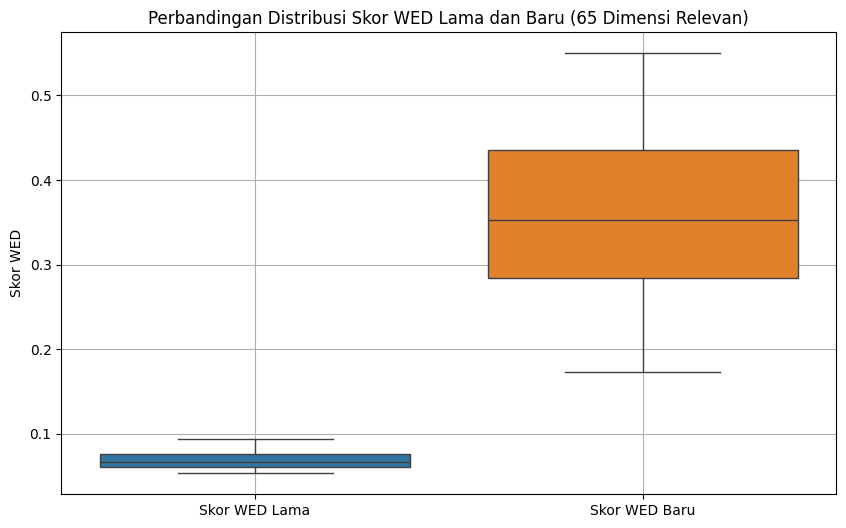


Statistik Skor WED Lama:
count    300.000000
mean       0.068529
std        0.009396
min        0.053136
25%        0.060881
50%        0.066885
75%        0.075992
max        0.093468
dtype: float64

Statistik Skor WED Baru:
count    300.000000
mean       0.356776
std        0.091614
min        0.173007
25%        0.284104
50%        0.352536
75%        0.435691
max        0.549883
dtype: float64


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from google.colab import drive
import ast

# Mount Google Drive
drive.mount('/content/drive', force_remount=True)

# Path ke file
path_dataset = '/content/drive/MyDrive/Skripsi/Resources/Datasets/Recent/result_moo.csv'
output_path = '/content/drive/MyDrive/Skripsi/Resources/Datasets/Recent/result_moo_adjusted.csv'

# Fungsi untuk menghitung max_wed berdasarkan jumlah dimensi relevan
def calculate_max_wed(num_relevant_skills, a=0.5):
    w_max = 1 / (1 + a * 5)  # a = 0.5, max difference = 5
    max_distance_per_skill = w_max * (5**2)
    return np.sqrt(num_relevant_skills * max_distance_per_skill)

# Jumlah dimensi keterampilan yang relevan: 65
relevant_skills = 65
max_wed = calculate_max_wed(relevant_skills)  # ≈ 21.55
print(f"max_wed untuk {relevant_skills} dimensi: {max_wed:.2f}")

# Baca file results_moo.csv
df = pd.read_csv(path_dataset)

# Fungsi untuk mengubah string daftar menjadi daftar Python
def parse_list_column(col):
    return col.apply(lambda x: ast.literal_eval(x) if isinstance(x, str) else x)

# Parse kolom yang berisi daftar
df['company'] = parse_list_column(df['company'])
df['assigned_task'] = parse_list_column(df['assigned_task'])
df['similarity_score'] = parse_list_column(df['similarity_score'])

# Ekstrak semua skor WED lama untuk boxplot
all_scores_old = []
for scores in df['similarity_score']:
    all_scores_old.extend(scores)

# Ubah skor WED lama ke skor WED baru
def adjust_wed_scores(scores, max_wed_value):
    adjusted_scores = []
    for score in scores:
        # Rekonstruksi jarak dari skor lama
        distance = (1 / score) - 1
        # Hitung WED baru
        wed_new = 1 - (distance / max_wed_value)
        # Pastikan skor berada dalam rentang [0, 1]
        wed_new = max(0, min(1, wed_new))
        adjusted_scores.append(wed_new)
    return adjusted_scores

# Terapkan penyesuaian ke setiap baris
df['similarity_score_new'] = df['similarity_score'].apply(lambda x: adjust_wed_scores(x, max_wed))

# Ekstrak semua skor WED baru untuk boxplot
all_scores_new = []
for scores in df['similarity_score_new']:
    all_scores_new.extend(scores)

# Simpan hasil ke CSV baru
df.to_csv(output_path, index=False)
print(f"Hasil disimpan ke: {output_path}")

# Buat boxplot untuk membandingkan distribusi
plt.figure(figsize=(10, 6))
sns.boxplot(data=[all_scores_old, all_scores_new], orient='v')
plt.xticks([0, 1], ['Skor WED Lama', 'Skor WED Baru'])
plt.ylabel('Skor WED')
plt.title('Perbandingan Distribusi Skor WED Lama dan Baru (65 Dimensi Relevan)')
plt.grid(True)
plt.show()

# Tampilkan statistik
print("\nStatistik Skor WED Lama:")
print(pd.Series(all_scores_old).describe())
print("\nStatistik Skor WED Baru:")
print(pd.Series(all_scores_new).describe())

In [ ]:
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive', force_remount=True)

# Path ke file
path_dataset = '/content/drive/MyDrive/Skripsi/Resources/Datasets/Recent/result_moo.csv'
output_path = '/content/drive/MyDrive/Skripsi/Resources/Datasets/Recent/result_moo_adjusted.csv'

Mounted at /content/drive


In [ ]:
import numpy as np
import pandas as pd

# 1. Impor dataset penuh
# Path sesuai kode yang kamu bagikan
task_data = pd.read_csv('/content/drive/MyDrive/Skripsi/Resources/Datasets/fixed_data_task.csv')
employee_data = pd.read_csv('/content/drive/MyDrive/Skripsi/Resources/Datasets/fixed_data_employee.csv')

# 2. Pra-pemrosesan data
# Ambil subset seperti di kode greedy
task_subset = task_data.iloc[:300]
employee_subset = employee_data.iloc[:109]

# Kolom keterampilan (65 kolom, kecuali task_id, story_points, project_id)
skill_columns = [col for col in task_data.columns if col not in ['task_id', 'story_points', 'project_id']]

# Ambil keterampilan tugas dan karyawan sebagai matriks NumPy
task_skills = task_subset[skill_columns].to_numpy()
employee_skills = employee_subset[skill_columns].to_numpy()

# Imputasi missing values dengan 0
task_skills = np.nan_to_num(task_skills, nan=0.0)
employee_skills = np.nan_to_num(employee_skills, nan=0.0)

# Normalisasi keterampilan ke rentang [0,1] (dataset asli dalam skala 0-5)
task_skills = task_skills / 5.0
employee_skills = employee_skills / 5.0

# 3. Fungsi untuk menghitung WED terstandarisasi
def calculate_wed_similarity(task_idx, emp_idx, task_skills, employee_skills, alpha=0.5):
    """
    Menghitung WED terstandarisasi untuk pasangan tugas-karyawan.

    Parameters:
    - task_idx: Indeks tugas (integer, 0 hingga 299)
    - emp_idx: Indeks karyawan (integer, 0 hingga 108)
    - task_skills: Matriks keterampilan tugas (numpy array, ukuran 300x65)
    - employee_skills: Matriks keterampilan karyawan (numpy array, ukuran 109x65)
    - alpha: Parameter untuk weighted Euclidean distance (default: 0.5)

    Returns:
    - similarity: Nilai kecocokan terstandarisasi (float dalam rentang [0,1])
    """
    # Validasi indeks
    if task_idx < 0 or task_idx >= task_skills.shape[0]:
        raise ValueError(f"Indeks tugas harus antara 0 dan {task_skills.shape[0]-1}")
    if emp_idx < 0 or emp_idx >= employee_skills.shape[0]:
        raise ValueError(f"Indeks karyawan harus antara 0 dan {employee_skills.shape[0]-1}")

    # Ambil vektor keterampilan untuk tugas dan karyawan
    task_skills_t = task_skills[task_idx]
    emp_skills_e = employee_skills[emp_idx]

    # Hitung bobot untuk setiap keterampilan
    diff = emp_skills_e - task_skills_t
    weights = 1 / (1 + alpha * np.maximum(0, diff))

    # Hitung WED hanya untuk keterampilan yang dibutuhkan tugas (task_skills_t > 0)
    mask = task_skills_t > 0
    weighted_diff = weights[mask] * (emp_skills_e[mask] - task_skills_t[mask]) ** 2
    wed = np.sqrt(np.sum(weighted_diff))

    # Hitung WED terburuk
    # Asumsi semua keterampilan tugas > 0 untuk kasus terburuk
    weights_worst = 1 / (1 + alpha * 1)  # Max difference = 1
    num_skills = np.sum(mask)  # Hanya keterampilan yang task_skills_t > 0
    wed_worst = np.sqrt(num_skills * weights_worst * (1.0 ** 2))

    # Hitung nilai kecocokan (similarity)
    if wed_worst == 0:  # Jika tidak ada keterampilan yang dibutuhkan (num_skills = 0)
        similarity = 0.0
    else:
        similarity = 1 - (wed / wed_worst)

    return similarity

# 4. Fungsi untuk menghitung WED dengan input indeks
def get_wed_for_pair(task_idx, emp_idx):
    """
    Menghitung WED terstandarisasi untuk pasangan tugas-karyawan tertentu.

    Parameters:
    - task_idx: Indeks tugas (integer)
    - emp_idx: Indeks karyawan (integer)

    Returns:
    - Nilai kecocokan (float)
    """
    similarity = calculate_wed_similarity(task_idx, emp_idx, task_skills, employee_skills, alpha=0.5)
    print(f"Nilai WED terstandarisasi untuk T{task_idx}-E{emp_idx}: {similarity:.4f}")
    return similarity

# Contoh penggunaan: Pilih indeks tugas dan karyawan
# Misalnya, kita pilih tugas indeks 0 (T0) dan karyawan indeks 0 (E0)
task_idx = 54
emp_idx = 0
get_wed_for_pair(task_idx, emp_idx)

# Kamu bisa ganti indeks sesuai kebutuhan, misalnya:
# get_wed_for_pair(10, 5)  # Untuk T10-E5

Nilai WED terstandarisasi untuk T54-E0: 0.5277


np.float64(0.5277134921951024)

# Helper

In [ ]:
import pandas as pd
import random

# Step 1: Read the dataset
df = pd.read_csv('/content/fixed_data_employee - fixed_data_employee (6).csv')

# Step 2: Randomly select 50 rows
random_rows = random.sample(range(len(df)), 25)
selected_df = df.iloc[random_rows]

# Step 3: Remove the rest of the rows (already done by selecting)

# Step 4: Reassign task_ids from T1 to T50
selected_df['task_id'] = [f'T{i+1}' for i in range(50)]

# Save the result to a new CSV file
selected_df.to_csv('random_25_emp.csv', index=False)

<ipython-input-10-d72a0bf72726>:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  selected_df['task_id'] = [f'T{i+1}' for i in range(50)]


In [ ]:
import pandas as pd
import random

# Step 1: Read the dataset
df = pd.read_csv('fixed_data_employee - fixed_data_employee (6).csv')

# Step 2: Randomly select 25 rows
random_rows = random.sample(range(len(df)), 25)
selected_df = df.iloc[random_rows]

# Step 3: Remove the rest of the rows (already done by selecting)

# Step 4 & 5: Reassign No and employee_id columns
selected_df['No'] = range(1, 26)
selected_df['employee_id'] = [f'Talent {i}' for i in range(1, 26)]

# Save the result to a new CSV file
selected_df.to_csv('random_25_employees.csv', index=False)

<ipython-input-12-5eaef3daf878>:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  selected_df['No'] = range(1, 26)
<ipython-input-12-5eaef3daf878>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  selected_df['employee_id'] = [f'Talent {i}' for i in range(1, 26)]
